In [1]:
import pandas as pd
import torch
from torch import nn
import gensim
from gensim.models import KeyedVectors
import sklearn
import torchmetrics
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('main_dataset.csv',  encoding='UTF-8')

In [3]:
df.head()

,id,text,label
0,1,на работе был полный пиддес :| и так каждое за...,0.0
1,2,"Коллеги сидят рубятся в Urban terror, а я из-з...",1.0
2,3,@elina_4post как говорят обещаного три года жд...,0.0
3,4,"Желаю хорошего полёта и удачной посадки,я буду...",0.0
4,5,"Обновил за каким-то лешим surf, теперь не рабо...",0.0


In [4]:
df.isna().sum()

id       0
text     0
label    0
dtype: int64

In [6]:
model = KeyedVectors.load_word2vec_format('C:/Users/Admin/Documents/pythonNLP/word2vecmod/65/model.bin', binary=True)

In [7]:
def get_vector(word):
    if word in model.key_to_index:
        return model[word]
    else:
        return np.zeros(model.vector_size)

# функция для получения среднего вектора всех слов в тексте
def get_average_vector(text):
    vectors = [get_vector(word) for word in text]
    if len(vectors) > 0:
        return np.mean(vectors, axis=0)
    else:
        return np.zeros(word_vectors.vector_size)

In [8]:
train_df, test_df = train_test_split(df, test_size=0.3, random_state=42)

In [9]:
vectors_train = [get_average_vector(text) for text in train_df['text']]
vectors_test = [get_average_vector(text) for text in test_df['text']]

In [10]:
x_train = torch.tensor(vectors_train)
x_test = torch.tensor(vectors_test)

C:\Users\Admin\AppData\Local\Temp\ipykernel_12232\2497855380.py:1: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:248.)
  x_train = torch.tensor(vectors_train)


In [11]:
y_train_list=list()
for i in train_df['label']:
    y_train_list.append(i)
y_train=torch.tensor(y_train_list)
y_train.unsqueeze_(1)

tensor([[0.],
        [1.],
        [0.],
        ...,
        [0.],
        [1.],
        [1.]])

In [12]:
y_test_list=list()
for i in test_df['label']:
    y_test_list.append(i)
y_test=torch.tensor(y_test_list)
y_test.unsqueeze_(1)

tensor([[0.],
        [0.],
        [0.],
        ...,
        [1.],
        [1.],
        [1.]])

In [13]:
#----------------------------------------------

<font color='red'>Word2Vec_MLP_Experiment_#1 (Base)</font>

In [14]:
#----------------------------------------------

In [15]:
class MLP_MK1(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK1, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, output_size)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
#         out=torch.round(out)
        return out

In [16]:
Mk1=MLP_MK1(100,300,1)

In [17]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [18]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [19]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [20]:
Mk1=Mk1.to(dev)

In [21]:
optimizer = torch.optim.Adam(Mk1.parameters(), lr=0.001)
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy'])
for epoch in range(10000):
    optimizer.zero_grad()
    pred = Mk1.forward(x_train.float())
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf = pd.concat([diagdf, pd.DataFrame(data, index=[epoch])], ignore_index=True)
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.8086754679679871   f1-score: 0.3483131527900696   accuracy: 0.5497660040855408
Epoch:  2 , Loss:  0.8029298186302185   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3 , Loss:  0.7973648309707642   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4 , Loss:  0.791964054107666   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5 , Loss:  0.7867152094841003   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6 , Loss:  0.7816371321678162   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7 , Loss:  0.7767380475997925   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8 , Loss:  0.7719709873199463   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9 , Loss:  0.7672708034515381   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10 , Loss:  0.7626305222511292   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11 , Loss:  0.7580362558364868   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12 , Loss:  0.7535020709037781   f1-score

Epoch:  122 , Loss:  0.6914253234863281   f1-score: 0.04464523121714592   accuracy: 0.6764758825302124
Epoch:  123 , Loss:  0.6914082765579224   f1-score: 0.04464523121714592   accuracy: 0.6764758825302124
Epoch:  124 , Loss:  0.6913912892341614   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  125 , Loss:  0.6913744807243347   f1-score: 0.04514073207974434   accuracy: 0.6763858795166016
Epoch:  126 , Loss:  0.6913577318191528   f1-score: 0.04514073207974434   accuracy: 0.6763858795166016
Epoch:  127 , Loss:  0.6913411021232605   f1-score: 0.04514073207974434   accuracy: 0.6763858795166016
Epoch:  128 , Loss:  0.6913245916366577   f1-score: 0.04514073207974434   accuracy: 0.6763858795166016
Epoch:  129 , Loss:  0.6913082599639893   f1-score: 0.04514073207974434   accuracy: 0.6763858795166016
Epoch:  130 , Loss:  0.6912919878959656   f1-score: 0.04514073207974434   accuracy: 0.6763858795166016
Epoch:  131 , Loss:  0.6912758350372314   f1-score: 0.04565967619419098  

Epoch:  217 , Loss:  0.689404308795929   f1-score: 0.0725848600268364   accuracy: 0.6803455948829651
Epoch:  218 , Loss:  0.6893513202667236   f1-score: 0.07457627356052399   accuracy: 0.6806155443191528
Epoch:  219 , Loss:  0.6892972588539124   f1-score: 0.07507820427417755   accuracy: 0.6807055473327637
Epoch:  220 , Loss:  0.6892420649528503   f1-score: 0.07658244669437408   accuracy: 0.6809754967689514
Epoch:  221 , Loss:  0.6891857385635376   f1-score: 0.07708333432674408   accuracy: 0.6810654997825623
Epoch:  222 , Loss:  0.6891283392906189   f1-score: 0.07858444005250931   accuracy: 0.6813355088233948
Epoch:  223 , Loss:  0.6890697479248047   f1-score: 0.07904316484928131   accuracy: 0.6812455058097839
Epoch:  224 , Loss:  0.6890100836753845   f1-score: 0.07950116693973541   accuracy: 0.6811555027961731
Epoch:  225 , Loss:  0.6889492273330688   f1-score: 0.08045678585767746   accuracy: 0.6811555027961731
Epoch:  226 , Loss:  0.6888871788978577   f1-score: 0.08195021003484726   a

Epoch:  313 , Loss:  0.6829622387886047   f1-score: 0.21666273474693298   accuracy: 0.7013139128684998
Epoch:  314 , Loss:  0.6829026341438293   f1-score: 0.21829326450824738   accuracy: 0.7015838623046875
Epoch:  315 , Loss:  0.6828432679176331   f1-score: 0.21897810697555542   accuracy: 0.7014938592910767
Epoch:  316 , Loss:  0.6827840805053711   f1-score: 0.22018349170684814   accuracy: 0.7016738653182983
Epoch:  317 , Loss:  0.6827252507209778   f1-score: 0.22227443754673004   accuracy: 0.7021238207817078
Epoch:  318 , Loss:  0.6826666593551636   f1-score: 0.22248297929763794   accuracy: 0.70185387134552
Epoch:  319 , Loss:  0.6826083064079285   f1-score: 0.2236286848783493   accuracy: 0.7019438147544861
Epoch:  320 , Loss:  0.6825501918792725   f1-score: 0.22440852224826813   accuracy: 0.7020338177680969
Epoch:  321 , Loss:  0.6824924349784851   f1-score: 0.22523999214172363   accuracy: 0.7022138237953186
Epoch:  322 , Loss:  0.6824349164962769   f1-score: 0.2255498319864273   acc

Epoch:  407 , Loss:  0.6787168979644775   f1-score: 0.3023461699485779   accuracy: 0.7163426876068115
Epoch:  408 , Loss:  0.6786829233169556   f1-score: 0.3041556179523468   accuracy: 0.7167026400566101
Epoch:  409 , Loss:  0.6786490678787231   f1-score: 0.3041556179523468   accuracy: 0.7167026400566101
Epoch:  410 , Loss:  0.6786153316497803   f1-score: 0.30422285199165344   accuracy: 0.716792643070221
Epoch:  411 , Loss:  0.6785816550254822   f1-score: 0.3045977056026459   accuracy: 0.7168826460838318
Epoch:  412 , Loss:  0.6785480976104736   f1-score: 0.3057212233543396   accuracy: 0.7171526551246643
Epoch:  413 , Loss:  0.6785145998001099   f1-score: 0.30684328079223633   accuracy: 0.717422604560852
Epoch:  414 , Loss:  0.6784812211990356   f1-score: 0.30759045481681824   accuracy: 0.7176026105880737
Epoch:  415 , Loss:  0.6784479022026062   f1-score: 0.3086419701576233   accuracy: 0.7177825570106506
Epoch:  416 , Loss:  0.6784146428108215   f1-score: 0.30901476740837097   accurac

Epoch:  497 , Loss:  0.6761247515678406   f1-score: 0.3468381464481354   accuracy: 0.7257919311523438
Epoch:  498 , Loss:  0.6761024594306946   f1-score: 0.34726688265800476   accuracy: 0.7259719371795654
Epoch:  499 , Loss:  0.6760802268981934   f1-score: 0.3468381464481354   accuracy: 0.7257919311523438
Epoch:  500 , Loss:  0.6760581135749817   f1-score: 0.34612908959388733   accuracy: 0.7256119251251221
Epoch:  501 , Loss:  0.6760361194610596   f1-score: 0.3471924662590027   accuracy: 0.7258819341659546
Epoch:  502 , Loss:  0.6760143637657166   f1-score: 0.34726688265800476   accuracy: 0.7259719371795654
Epoch:  503 , Loss:  0.6759927272796631   f1-score: 0.34868279099464417   accuracy: 0.726331889629364
Epoch:  504 , Loss:  0.6759712100028992   f1-score: 0.34769561886787415   accuracy: 0.7261518836021423
Epoch:  505 , Loss:  0.6759499311447144   f1-score: 0.34946465492248535   accuracy: 0.7266018986701965
Epoch:  506 , Loss:  0.6759287714958191   f1-score: 0.3484036922454834   accu

Epoch:  584 , Loss:  0.6746530532836914   f1-score: 0.3656369149684906   accuracy: 0.7302016019821167
Epoch:  585 , Loss:  0.674639880657196   f1-score: 0.3684321641921997   accuracy: 0.7306515574455261
Epoch:  586 , Loss:  0.6746268272399902   f1-score: 0.36625078320503235   accuracy: 0.7302916049957275
Epoch:  587 , Loss:  0.6746140718460083   f1-score: 0.36720895767211914   accuracy: 0.7304715514183044
Epoch:  588 , Loss:  0.6746016144752502   f1-score: 0.3698861300945282   accuracy: 0.7311015129089355
Epoch:  589 , Loss:  0.6745892763137817   f1-score: 0.36667370796203613   accuracy: 0.7304715514183044
Epoch:  590 , Loss:  0.6745767593383789   f1-score: 0.37068238854408264   accuracy: 0.7311015129089355
Epoch:  591 , Loss:  0.6745642423629761   f1-score: 0.3689320385456085   accuracy: 0.7309215068817139
Epoch:  592 , Loss:  0.6745516657829285   f1-score: 0.3709167540073395   accuracy: 0.7313714623451233
Epoch:  593 , Loss:  0.6745394468307495   f1-score: 0.3714466094970703   accura

Epoch:  678 , Loss:  0.6736559867858887   f1-score: 0.38491982221603394   accuracy: 0.7342512607574463
Epoch:  679 , Loss:  0.6736473441123962   f1-score: 0.38381311297416687   accuracy: 0.7341612577438354
Epoch:  680 , Loss:  0.6736387610435486   f1-score: 0.38626429438591003   accuracy: 0.7346112132072449
Epoch:  681 , Loss:  0.6736301779747009   f1-score: 0.3837330639362335   accuracy: 0.7340712547302246
Epoch:  682 , Loss:  0.673621416091919   f1-score: 0.38677480816841125   accuracy: 0.7346112132072449
Epoch:  683 , Loss:  0.6736125946044922   f1-score: 0.38398998975753784   accuracy: 0.7340712547302246
Epoch:  684 , Loss:  0.6736037731170654   f1-score: 0.38600873947143555   accuracy: 0.7346112132072449
Epoch:  685 , Loss:  0.6735950112342834   f1-score: 0.38499999046325684   accuracy: 0.7343412637710571
Epoch:  686 , Loss:  0.6735864281654358   f1-score: 0.38533639907836914   accuracy: 0.734431266784668
Epoch:  687 , Loss:  0.6735779643058777   f1-score: 0.38677480816841125   ac

Epoch:  763 , Loss:  0.673003077507019   f1-score: 0.39437782764434814   accuracy: 0.7363210916519165
Epoch:  764 , Loss:  0.6729963421821594   f1-score: 0.39354437589645386   accuracy: 0.7362310886383057
Epoch:  765 , Loss:  0.6729896664619446   f1-score: 0.3939644396305084   accuracy: 0.7361410856246948
Epoch:  766 , Loss:  0.6729829907417297   f1-score: 0.394045889377594   accuracy: 0.7362310886383057
Epoch:  767 , Loss:  0.6729763150215149   f1-score: 0.3939644396305084   accuracy: 0.7361410856246948
Epoch:  768 , Loss:  0.6729695796966553   f1-score: 0.3939644396305084   accuracy: 0.7361410856246948
Epoch:  769 , Loss:  0.6729627847671509   f1-score: 0.3939644396305084   accuracy: 0.7361410856246948
Epoch:  770 , Loss:  0.6729558110237122   f1-score: 0.3939644396305084   accuracy: 0.7361410856246948
Epoch:  771 , Loss:  0.6729490160942078   f1-score: 0.3942148685455322   accuracy: 0.7361410856246948
Epoch:  772 , Loss:  0.6729424595832825   f1-score: 0.3945465683937073   accuracy:

Epoch:  873 , Loss:  0.6723825931549072   f1-score: 0.4025441110134125   accuracy: 0.7379409670829773
Epoch:  874 , Loss:  0.6723778247833252   f1-score: 0.4027891755104065   accuracy: 0.7379409670829773
Epoch:  875 , Loss:  0.6723731160163879   f1-score: 0.4031166732311249   accuracy: 0.7380309700965881
Epoch:  876 , Loss:  0.6723682880401611   f1-score: 0.4031166732311249   accuracy: 0.7380309700965881
Epoch:  877 , Loss:  0.6723634600639343   f1-score: 0.4031166732311249   accuracy: 0.7380309700965881
Epoch:  878 , Loss:  0.6723586916923523   f1-score: 0.4031166732311249   accuracy: 0.7380309700965881
Epoch:  879 , Loss:  0.6723540425300598   f1-score: 0.4034440219402313   accuracy: 0.738120973110199
Epoch:  880 , Loss:  0.6723493933677673   f1-score: 0.4031166732311249   accuracy: 0.7380309700965881
Epoch:  881 , Loss:  0.6723446249961853   f1-score: 0.4034440219402313   accuracy: 0.738120973110199
Epoch:  882 , Loss:  0.6723397970199585   f1-score: 0.4034440219402313   accuracy: 0

Epoch:  993 , Loss:  0.6718751788139343   f1-score: 0.4100162982940674   accuracy: 0.7392008900642395
Epoch:  994 , Loss:  0.6718713641166687   f1-score: 0.4100162982940674   accuracy: 0.7392008900642395
Epoch:  995 , Loss:  0.6718674898147583   f1-score: 0.4100997745990753   accuracy: 0.7392908334732056
Epoch:  996 , Loss:  0.6718636155128479   f1-score: 0.4098494052886963   accuracy: 0.7390208840370178
Epoch:  997 , Loss:  0.6718598008155823   f1-score: 0.4100162982940674   accuracy: 0.7392008900642395
Epoch:  998 , Loss:  0.6718561053276062   f1-score: 0.4105798602104187   accuracy: 0.7392908334732056
Epoch:  999 , Loss:  0.6718522310256958   f1-score: 0.4100162982940674   accuracy: 0.7392008900642395
Epoch:  1000 , Loss:  0.6718484163284302   f1-score: 0.4108196198940277   accuracy: 0.7392908334732056
Epoch:  1001 , Loss:  0.6718446016311646   f1-score: 0.41025641560554504   accuracy: 0.7392008900642395
Epoch:  1002 , Loss:  0.6718409061431885   f1-score: 0.4108196198940277   accur

Epoch:  1079 , Loss:  0.6715587377548218   f1-score: 0.4146588444709778   accuracy: 0.7398307919502258
Epoch:  1080 , Loss:  0.6715549826622009   f1-score: 0.41457489132881165   accuracy: 0.7397408485412598
Epoch:  1081 , Loss:  0.6715512275695801   f1-score: 0.41457489132881165   accuracy: 0.7397408485412598
Epoch:  1082 , Loss:  0.6715474128723145   f1-score: 0.4148118197917938   accuracy: 0.7397408485412598
Epoch:  1083 , Loss:  0.6715436577796936   f1-score: 0.41457489132881165   accuracy: 0.7397408485412598
Epoch:  1084 , Loss:  0.6715399026870728   f1-score: 0.41545307636260986   accuracy: 0.7399207949638367
Epoch:  1085 , Loss:  0.6715361475944519   f1-score: 0.41457489132881165   accuracy: 0.7397408485412598
Epoch:  1086 , Loss:  0.671532392501831   f1-score: 0.41545307636260986   accuracy: 0.7399207949638367
Epoch:  1087 , Loss:  0.671528697013855   f1-score: 0.41457489132881165   accuracy: 0.7397408485412598
Epoch:  1088 , Loss:  0.6715248823165894   f1-score: 0.4160938262939

Epoch:  1167 , Loss:  0.6712250709533691   f1-score: 0.4218781292438507   accuracy: 0.7412707209587097
Epoch:  1168 , Loss:  0.6712213754653931   f1-score: 0.41973817348480225   accuracy: 0.7407307624816895
Epoch:  1169 , Loss:  0.6712175607681274   f1-score: 0.42337819933891296   accuracy: 0.7416306734085083
Epoch:  1170 , Loss:  0.6712139844894409   f1-score: 0.41814514994621277   accuracy: 0.74028080701828
Epoch:  1171 , Loss:  0.6712107062339783   f1-score: 0.42398715019226074   accuracy: 0.7415406703948975
Epoch:  1172 , Loss:  0.6712074875831604   f1-score: 0.41727200150489807   accuracy: 0.7401008009910583
Epoch:  1173 , Loss:  0.6712042093276978   f1-score: 0.4253103733062744   accuracy: 0.7417206764221191
Epoch:  1174 , Loss:  0.6712012887001038   f1-score: 0.41695258021354675   accuracy: 0.7400107979774475
Epoch:  1175 , Loss:  0.6711975932121277   f1-score: 0.42640000581741333   accuracy: 0.741900622844696
Epoch:  1176 , Loss:  0.6711937785148621   f1-score: 0.41703674197196

Epoch:  1250 , Loss:  0.6709218621253967   f1-score: 0.42280668020248413   accuracy: 0.7412707209587097
Epoch:  1251 , Loss:  0.6709171533584595   f1-score: 0.43133345246315   accuracy: 0.7432505488395691
Epoch:  1252 , Loss:  0.6709126234054565   f1-score: 0.4265972375869751   accuracy: 0.7423506379127502
Epoch:  1253 , Loss:  0.6709084510803223   f1-score: 0.42831432819366455   accuracy: 0.7427105903625488
Epoch:  1254 , Loss:  0.6709049940109253   f1-score: 0.42831432819366455   accuracy: 0.7427105903625488
Epoch:  1255 , Loss:  0.6709019541740417   f1-score: 0.4269123077392578   accuracy: 0.7424405813217163
Epoch:  1256 , Loss:  0.670898973941803   f1-score: 0.43025344610214233   accuracy: 0.7430705428123474
Epoch:  1257 , Loss:  0.6708959341049194   f1-score: 0.425966739654541   accuracy: 0.7421706318855286
Epoch:  1258 , Loss:  0.6708922982215881   f1-score: 0.4305666387081146   accuracy: 0.7431605458259583
Epoch:  1259 , Loss:  0.6708884835243225   f1-score: 0.4269978106021881  

Epoch:  1330 , Loss:  0.670655369758606   f1-score: 0.431936115026474   accuracy: 0.7438805103302002
Epoch:  1331 , Loss:  0.6706530451774597   f1-score: 0.43690475821495056   accuracy: 0.7446004152297974
Epoch:  1332 , Loss:  0.6706494688987732   f1-score: 0.43130990862846375   accuracy: 0.7437005043029785
Epoch:  1333 , Loss:  0.670644998550415   f1-score: 0.4364575147628784   accuracy: 0.7446004152297974
Epoch:  1334 , Loss:  0.6706408262252808   f1-score: 0.4340900182723999   accuracy: 0.7442404627799988
Epoch:  1335 , Loss:  0.6706376671791077   f1-score: 0.4340035915374756   accuracy: 0.7441504597663879
Epoch:  1336 , Loss:  0.6706350445747375   f1-score: 0.43569865822792053   accuracy: 0.7445104122161865
Epoch:  1337 , Loss:  0.6706326603889465   f1-score: 0.4334130883216858   accuracy: 0.7442404627799988
Epoch:  1338 , Loss:  0.6706299185752869   f1-score: 0.43628424406051636   accuracy: 0.7444204688072205
Epoch:  1339 , Loss:  0.6706264019012451   f1-score: 0.4334130883216858 

Epoch:  1421 , Loss:  0.6703780889511108   f1-score: 0.4375993609428406   accuracy: 0.7453203797340393
Epoch:  1422 , Loss:  0.6703752279281616   f1-score: 0.43751242756843567   accuracy: 0.7452303767204285
Epoch:  1423 , Loss:  0.6703723669052124   f1-score: 0.43751242756843567   accuracy: 0.7452303767204285
Epoch:  1424 , Loss:  0.6703694462776184   f1-score: 0.4375993609428406   accuracy: 0.7453203797340393
Epoch:  1425 , Loss:  0.670366644859314   f1-score: 0.4378228187561035   accuracy: 0.7453203797340393
Epoch:  1426 , Loss:  0.6703638434410095   f1-score: 0.4370650351047516   accuracy: 0.7452303767204285
Epoch:  1427 , Loss:  0.6703611016273499   f1-score: 0.4383561611175537   accuracy: 0.7454103827476501
Epoch:  1428 , Loss:  0.6703583598136902   f1-score: 0.43653005361557007   accuracy: 0.7451403737068176
Epoch:  1429 , Loss:  0.6703556776046753   f1-score: 0.43809524178504944   accuracy: 0.7451403737068176
Epoch:  1430 , Loss:  0.6703532934188843   f1-score: 0.435907632112503

Epoch:  1509 , Loss:  0.6701391339302063   f1-score: 0.43720191717147827   accuracy: 0.7451403737068176
Epoch:  1510 , Loss:  0.6701367497444153   f1-score: 0.4398175776004791   accuracy: 0.7457703351974487
Epoch:  1511 , Loss:  0.6701343655586243   f1-score: 0.43697813153266907   accuracy: 0.7451403737068176
Epoch:  1512 , Loss:  0.6701321005821228   f1-score: 0.44074514508247375   accuracy: 0.7460403442382812
Epoch:  1513 , Loss:  0.6701298952102661   f1-score: 0.43675416707992554   accuracy: 0.7451403737068176
Epoch:  1514 , Loss:  0.6701277494430542   f1-score: 0.44259700179100037   accuracy: 0.7465803027153015
Epoch:  1515 , Loss:  0.6701257228851318   f1-score: 0.43653005361557007   accuracy: 0.7451403737068176
Epoch:  1516 , Loss:  0.6701233983039856   f1-score: 0.44272997975349426   accuracy: 0.7464902997016907
Epoch:  1517 , Loss:  0.670120894908905   f1-score: 0.43621891736984253   accuracy: 0.7450503706932068
Epoch:  1518 , Loss:  0.6701182723045349   f1-score: 0.44272997975

Epoch:  1595 , Loss:  0.6699234843254089   f1-score: 0.4422011077404022   accuracy: 0.7464002966880798
Epoch:  1596 , Loss:  0.6699207425117493   f1-score: 0.441846638917923   accuracy: 0.7464902997016907
Epoch:  1597 , Loss:  0.6699180006980896   f1-score: 0.4428175687789917   accuracy: 0.7465803027153015
Epoch:  1598 , Loss:  0.669915497303009   f1-score: 0.44215530157089233   accuracy: 0.7465803027153015
Epoch:  1599 , Loss:  0.6699129343032837   f1-score: 0.443433552980423   accuracy: 0.7467602491378784
Epoch:  1600 , Loss:  0.6699104905128479   f1-score: 0.44210943579673767   accuracy: 0.7467602491378784
Epoch:  1601 , Loss:  0.6699085831642151   f1-score: 0.443345844745636   accuracy: 0.7466702461242676
Epoch:  1602 , Loss:  0.669906735420227   f1-score: 0.44096049666404724   accuracy: 0.7464902997016907
Epoch:  1603 , Loss:  0.6699050068855286   f1-score: 0.4444005489349365   accuracy: 0.7468502521514893
Epoch:  1604 , Loss:  0.6699035167694092   f1-score: 0.4401191771030426   a

Epoch:  1675 , Loss:  0.6697211265563965   f1-score: 0.44325608015060425   accuracy: 0.7470302581787109
Epoch:  1676 , Loss:  0.6697190999984741   f1-score: 0.4454527497291565   accuracy: 0.7470302581787109
Epoch:  1677 , Loss:  0.6697171926498413   f1-score: 0.4428146779537201   accuracy: 0.7470302581787109
Epoch:  1678 , Loss:  0.6697146892547607   f1-score: 0.4456714689731598   accuracy: 0.7470302581787109
Epoch:  1679 , Loss:  0.6697118282318115   f1-score: 0.44290244579315186   accuracy: 0.747120201587677
Epoch:  1680 , Loss:  0.6697083711624146   f1-score: 0.4454527497291565   accuracy: 0.7470302581787109
Epoch:  1681 , Loss:  0.6697046756744385   f1-score: 0.44387251138687134   accuracy: 0.7472102046012878
Epoch:  1682 , Loss:  0.669701337814331   f1-score: 0.44497135281562805   accuracy: 0.7472102046012878
Epoch:  1683 , Loss:  0.6696984767913818   f1-score: 0.44483986496925354   accuracy: 0.7473002076148987
Epoch:  1684 , Loss:  0.6696959733963013   f1-score: 0.444312572479248

Epoch:  1765 , Loss:  0.6694546937942505   f1-score: 0.44803786277770996   accuracy: 0.7481101751327515
Epoch:  1766 , Loss:  0.6694518327713013   f1-score: 0.4454563558101654   accuracy: 0.7479301691055298
Epoch:  1767 , Loss:  0.6694490313529968   f1-score: 0.44834384322166443   accuracy: 0.7482001185417175
Epoch:  1768 , Loss:  0.6694462895393372   f1-score: 0.44563278555870056   accuracy: 0.7481101751327515
Epoch:  1769 , Loss:  0.669442892074585   f1-score: 0.44834384322166443   accuracy: 0.7482001185417175
Epoch:  1770 , Loss:  0.6694393754005432   f1-score: 0.44576406478881836   accuracy: 0.7480201721191406
Epoch:  1771 , Loss:  0.6694356799125671   f1-score: 0.4479084312915802   accuracy: 0.7482001185417175
Epoch:  1772 , Loss:  0.6694321632385254   f1-score: 0.4463790953159332   accuracy: 0.7482001185417175
Epoch:  1773 , Loss:  0.6694287657737732   f1-score: 0.4473839998245239   accuracy: 0.7481101751327515
Epoch:  1774 , Loss:  0.6694254875183105   f1-score: 0.44756072759628

Epoch:  1857 , Loss:  0.6691532135009766   f1-score: 0.4503154456615448   accuracy: 0.7491000890731812
Epoch:  1858 , Loss:  0.6691498160362244   f1-score: 0.4514476954936981   accuracy: 0.7493700385093689
Epoch:  1859 , Loss:  0.6691464781761169   f1-score: 0.4506209194660187   accuracy: 0.749190092086792
Epoch:  1860 , Loss:  0.6691431403160095   f1-score: 0.4514476954936981   accuracy: 0.7493700385093689
Epoch:  1861 , Loss:  0.6691397428512573   f1-score: 0.45053213834762573   accuracy: 0.7491000890731812
Epoch:  1862 , Loss:  0.6691364645957947   f1-score: 0.4514476954936981   accuracy: 0.7493700385093689
Epoch:  1863 , Loss:  0.6691331267356873   f1-score: 0.4508374333381653   accuracy: 0.749190092086792
Epoch:  1864 , Loss:  0.6691297888755798   f1-score: 0.4514476954936981   accuracy: 0.7493700385093689
Epoch:  1865 , Loss:  0.6691264510154724   f1-score: 0.4508374333381653   accuracy: 0.749190092086792
Epoch:  1866 , Loss:  0.6691232323646545   f1-score: 0.4513587951660156   a

Epoch:  1947 , Loss:  0.6688471436500549   f1-score: 0.45361635088920593   accuracy: 0.7498199939727783
Epoch:  1948 , Loss:  0.6688436269760132   f1-score: 0.45236220955848694   accuracy: 0.7496400475502014
Epoch:  1949 , Loss:  0.6688402891159058   f1-score: 0.4538310468196869   accuracy: 0.7498199939727783
Epoch:  1950 , Loss:  0.6688371300697327   f1-score: 0.4521465003490448   accuracy: 0.7496400475502014
Epoch:  1951 , Loss:  0.6688336730003357   f1-score: 0.4538310468196869   accuracy: 0.7498199939727783
Epoch:  1952 , Loss:  0.6688297986984253   f1-score: 0.4526667892932892   accuracy: 0.7497300505638123
Epoch:  1953 , Loss:  0.6688260436058044   f1-score: 0.45443832874298096   accuracy: 0.75
Epoch:  1954 , Loss:  0.6688221096992493   f1-score: 0.4526667892932892   accuracy: 0.7497300505638123
Epoch:  1955 , Loss:  0.6688184142112732   f1-score: 0.4538310468196869   accuracy: 0.7498199939727783
Epoch:  1956 , Loss:  0.6688145399093628   f1-score: 0.4526667892932892   accuracy: 

Epoch:  2035 , Loss:  0.6684831380844116   f1-score: 0.45545724034309387   accuracy: 0.750809907913208
Epoch:  2036 , Loss:  0.668478786945343   f1-score: 0.45813772082328796   accuracy: 0.7507199645042419
Epoch:  2037 , Loss:  0.6684746146202087   f1-score: 0.4557609260082245   accuracy: 0.7508999109268188
Epoch:  2038 , Loss:  0.6684696078300476   f1-score: 0.45813772082328796   accuracy: 0.7507199645042419
Epoch:  2039 , Loss:  0.6684649586677551   f1-score: 0.4556713104248047   accuracy: 0.750809907913208
Epoch:  2040 , Loss:  0.6684601306915283   f1-score: 0.4573218524456024   accuracy: 0.7505399584770203
Epoch:  2041 , Loss:  0.668455183506012   f1-score: 0.45588523149490356   accuracy: 0.750809907913208
Epoch:  2042 , Loss:  0.6684497594833374   f1-score: 0.457109272480011   accuracy: 0.7505399584770203
Epoch:  2043 , Loss:  0.6684451699256897   f1-score: 0.4562230110168457   accuracy: 0.7507199645042419
Epoch:  2044 , Loss:  0.668440580368042   f1-score: 0.457198828458786   acc

Epoch:  2116 , Loss:  0.6681378483772278   f1-score: 0.46210938692092896   accuracy: 0.752159833908081
Epoch:  2117 , Loss:  0.6681331396102905   f1-score: 0.460997074842453   accuracy: 0.7518898248672485
Epoch:  2118 , Loss:  0.668129563331604   f1-score: 0.4605752229690552   accuracy: 0.7518898248672485
Epoch:  2119 , Loss:  0.6681268215179443   f1-score: 0.46270987391471863   accuracy: 0.7523398399353027
Epoch:  2120 , Loss:  0.6681244969367981   f1-score: 0.45761382579803467   accuracy: 0.7512599229812622
Epoch:  2121 , Loss:  0.6681212186813354   f1-score: 0.46432748436927795   accuracy: 0.7526997923851013
Epoch:  2122 , Loss:  0.6681172251701355   f1-score: 0.4577036201953888   accuracy: 0.7513498663902283
Epoch:  2123 , Loss:  0.6681117415428162   f1-score: 0.46351930499076843   accuracy: 0.7525197863578796
Epoch:  2124 , Loss:  0.6681061387062073   f1-score: 0.46036407351493835   accuracy: 0.7518898248672485
Epoch:  2125 , Loss:  0.6681013703346252   f1-score: 0.461297899484634

Epoch:  2227 , Loss:  0.667704164981842   f1-score: 0.46484375   accuracy: 0.7534196972846985
Epoch:  2228 , Loss:  0.6677001714706421   f1-score: 0.46687451004981995   accuracy: 0.7537797093391418
Epoch:  2229 , Loss:  0.6676961183547974   f1-score: 0.4651435315608978   accuracy: 0.7535097002983093
Epoch:  2230 , Loss:  0.6676921844482422   f1-score: 0.46666666865348816   accuracy: 0.7537797093391418
Epoch:  2231 , Loss:  0.667688250541687   f1-score: 0.4654431939125061   accuracy: 0.7535997033119202
Epoch:  2232 , Loss:  0.6676844954490662   f1-score: 0.46726423501968384   accuracy: 0.7539596557617188
Epoch:  2233 , Loss:  0.6676807999610901   f1-score: 0.4651435315608978   accuracy: 0.7535097002983093
Epoch:  2234 , Loss:  0.6676768660545349   f1-score: 0.46717318892478943   accuracy: 0.7538697123527527
Epoch:  2235 , Loss:  0.6676732301712036   f1-score: 0.46484375   accuracy: 0.7534196972846985
Epoch:  2236 , Loss:  0.6676694750785828   f1-score: 0.46717318892478943   accuracy: 0.

Epoch:  2341 , Loss:  0.6672818064689636   f1-score: 0.47239503264427185   accuracy: 0.7557595372200012
Epoch:  2342 , Loss:  0.6672782897949219   f1-score: 0.4715035855770111   accuracy: 0.7554895877838135
Epoch:  2343 , Loss:  0.6672746539115906   f1-score: 0.47239503264427185   accuracy: 0.7557595372200012
Epoch:  2344 , Loss:  0.6672712564468384   f1-score: 0.4720979928970337   accuracy: 0.7556695342063904
Epoch:  2345 , Loss:  0.6672677993774414   f1-score: 0.47239503264427185   accuracy: 0.7557595372200012
Epoch:  2346 , Loss:  0.667264461517334   f1-score: 0.4709087312221527   accuracy: 0.7553095817565918
Epoch:  2347 , Loss:  0.6672611832618713   f1-score: 0.47298872470855713   accuracy: 0.7559395432472229
Epoch:  2348 , Loss:  0.6672582626342773   f1-score: 0.46941956877708435   accuracy: 0.7548596262931824
Epoch:  2349 , Loss:  0.6672552227973938   f1-score: 0.47310158610343933   accuracy: 0.7558495402336121
Epoch:  2350 , Loss:  0.6672519445419312   f1-score: 0.4692127704620

Epoch:  2433 , Loss:  0.6669765710830688   f1-score: 0.47447097301483154   accuracy: 0.7563894987106323
Epoch:  2434 , Loss:  0.6669736504554749   f1-score: 0.4742668569087982   accuracy: 0.7563894987106323
Epoch:  2435 , Loss:  0.6669703125953674   f1-score: 0.4747670888900757   accuracy: 0.7564795017242432
Epoch:  2436 , Loss:  0.6669675707817078   f1-score: 0.47308066487312317   accuracy: 0.7560295462608337
Epoch:  2437 , Loss:  0.6669652462005615   f1-score: 0.4752667248249054   accuracy: 0.7565694451332092
Epoch:  2438 , Loss:  0.6669631004333496   f1-score: 0.4724868834018707   accuracy: 0.7558495402336121
Epoch:  2439 , Loss:  0.6669603586196899   f1-score: 0.47606125473976135   accuracy: 0.7567494511604309
Epoch:  2440 , Loss:  0.6669579744338989   f1-score: 0.472578763961792   accuracy: 0.7559395432472229
Epoch:  2441 , Loss:  0.6669553518295288   f1-score: 0.4762642979621887   accuracy: 0.7567494511604309
Epoch:  2442 , Loss:  0.6669521927833557   f1-score: 0.4722816646099090

Epoch:  2524 , Loss:  0.6667056679725647   f1-score: 0.4763382375240326   accuracy: 0.7570194602012634
Epoch:  2525 , Loss:  0.6667030453681946   f1-score: 0.4783113896846771   accuracy: 0.7575594186782837
Epoch:  2526 , Loss:  0.6667004227638245   f1-score: 0.4752475321292877   accuracy: 0.7567494511604309
Epoch:  2527 , Loss:  0.6666975617408752   f1-score: 0.47812619805336   accuracy: 0.757379412651062
Epoch:  2528 , Loss:  0.6666949391365051   f1-score: 0.4752475321292877   accuracy: 0.7567494511604309
Epoch:  2529 , Loss:  0.6666923761367798   f1-score: 0.478715181350708   accuracy: 0.7575594186782837
Epoch:  2530 , Loss:  0.6666892170906067   f1-score: 0.4752475321292877   accuracy: 0.7567494511604309
Epoch:  2531 , Loss:  0.6666862368583679   f1-score: 0.4783113896846771   accuracy: 0.7575594186782837
Epoch:  2532 , Loss:  0.6666831970214844   f1-score: 0.4760426878929138   accuracy: 0.7569294571876526
Epoch:  2533 , Loss:  0.666679859161377   f1-score: 0.47772181034088135   acc

Epoch:  2615 , Loss:  0.6664524674415588   f1-score: 0.48183926939964294   accuracy: 0.7586393356323242
Epoch:  2616 , Loss:  0.6664502620697021   f1-score: 0.47691112756729126   accuracy: 0.757379412651062
Epoch:  2617 , Loss:  0.6664487719535828   f1-score: 0.4823324978351593   accuracy: 0.7587292790412903
Epoch:  2618 , Loss:  0.6664470434188843   f1-score: 0.4760240614414215   accuracy: 0.7571094036102295
Epoch:  2619 , Loss:  0.6664441227912903   f1-score: 0.4823324978351593   accuracy: 0.7587292790412903
Epoch:  2620 , Loss:  0.666441023349762   f1-score: 0.4760240614414215   accuracy: 0.7571094036102295
Epoch:  2621 , Loss:  0.6664366722106934   f1-score: 0.48183926939964294   accuracy: 0.7586393356323242
Epoch:  2622 , Loss:  0.6664326786994934   f1-score: 0.4789932370185852   accuracy: 0.7578293681144714
Epoch:  2623 , Loss:  0.6664295792579651   f1-score: 0.48017024993896484   accuracy: 0.75818932056427
Epoch:  2624 , Loss:  0.6664271354675293   f1-score: 0.48134544491767883 

Epoch:  2697 , Loss:  0.6662286520004272   f1-score: 0.4820393919944763   accuracy: 0.7586393356323242
Epoch:  2698 , Loss:  0.6662259101867676   f1-score: 0.48075807094573975   accuracy: 0.7583693265914917
Epoch:  2699 , Loss:  0.6662233471870422   f1-score: 0.4823324978351593   accuracy: 0.7587292790412903
Epoch:  2700 , Loss:  0.666221022605896   f1-score: 0.48046422004699707   accuracy: 0.7582793235778809
Epoch:  2701 , Loss:  0.6662183403968811   f1-score: 0.48262548446655273   accuracy: 0.7588192820549011
Epoch:  2702 , Loss:  0.6662159562110901   f1-score: 0.47958195209503174   accuracy: 0.7580093741416931
Epoch:  2703 , Loss:  0.6662136316299438   f1-score: 0.4829183518886566   accuracy: 0.758909285068512
Epoch:  2704 , Loss:  0.6662105917930603   f1-score: 0.47987616062164307   accuracy: 0.758099377155304
Epoch:  2705 , Loss:  0.6662074327468872   f1-score: 0.4829183518886566   accuracy: 0.758909285068512
Epoch:  2706 , Loss:  0.6662047505378723   f1-score: 0.48046422004699707

Epoch:  2812 , Loss:  0.6659303903579712   f1-score: 0.48357170820236206   accuracy: 0.7595392465591431
Epoch:  2813 , Loss:  0.665928840637207   f1-score: 0.4863409101963043   accuracy: 0.75971919298172
Epoch:  2814 , Loss:  0.6659281253814697   f1-score: 0.48249179124832153   accuracy: 0.7592692375183105
Epoch:  2815 , Loss:  0.6659261584281921   f1-score: 0.48721399903297424   accuracy: 0.7599892020225525
Epoch:  2816 , Loss:  0.6659227013587952   f1-score: 0.48278531432151794   accuracy: 0.7593592405319214
Epoch:  2817 , Loss:  0.6659186482429504   f1-score: 0.4863409101963043   accuracy: 0.75971919298172
Epoch:  2818 , Loss:  0.6659144759178162   f1-score: 0.4843568801879883   accuracy: 0.75971919298172
Epoch:  2819 , Loss:  0.6659111380577087   f1-score: 0.4848601818084717   accuracy: 0.7596292495727539
Epoch:  2820 , Loss:  0.6659088134765625   f1-score: 0.4847666919231415   accuracy: 0.7595392465591431
Epoch:  2821 , Loss:  0.6659067869186401   f1-score: 0.4842633605003357   ac

Epoch:  2902 , Loss:  0.6657108664512634   f1-score: 0.48532819747924805   accuracy: 0.7600792050361633
Epoch:  2903 , Loss:  0.665708601474762   f1-score: 0.48807692527770996   accuracy: 0.7604391574859619
Epoch:  2904 , Loss:  0.6657057404518127   f1-score: 0.48532819747924805   accuracy: 0.7600792050361633
Epoch:  2905 , Loss:  0.6657028198242188   f1-score: 0.48806774616241455   accuracy: 0.7606191635131836
Epoch:  2906 , Loss:  0.6656996607780457   f1-score: 0.485819011926651   accuracy: 0.7601692080497742
Epoch:  2907 , Loss:  0.6656964421272278   f1-score: 0.48834970593452454   accuracy: 0.7608891129493713
Epoch:  2908 , Loss:  0.6656939387321472   f1-score: 0.4875698685646057   accuracy: 0.7607091665267944
Epoch:  2909 , Loss:  0.6656915545463562   f1-score: 0.48669496178627014   accuracy: 0.7604391574859619
Epoch:  2910 , Loss:  0.6656900644302368   f1-score: 0.48816168308258057   accuracy: 0.7607091665267944
Epoch:  2911 , Loss:  0.6656890511512756   f1-score: 0.4853281974792

Epoch:  2985 , Loss:  0.6655169725418091   f1-score: 0.48923078179359436   accuracy: 0.7609791159629822
Epoch:  2986 , Loss:  0.6655153632164001   f1-score: 0.4878612756729126   accuracy: 0.7607991099357605
Epoch:  2987 , Loss:  0.6655133366584778   f1-score: 0.4897174835205078   accuracy: 0.761069118976593
Epoch:  2988 , Loss:  0.6655113697052002   f1-score: 0.4872783422470093   accuracy: 0.7606191635131836
Epoch:  2989 , Loss:  0.6655089855194092   f1-score: 0.4897174835205078   accuracy: 0.761069118976593
Epoch:  2990 , Loss:  0.6655071377754211   f1-score: 0.4872783422470093   accuracy: 0.7606191635131836
Epoch:  2991 , Loss:  0.6655049324035645   f1-score: 0.4905877709388733   accuracy: 0.7613390684127808
Epoch:  2992 , Loss:  0.6655026078224182   f1-score: 0.4872783422470093   accuracy: 0.7606191635131836
Epoch:  2993 , Loss:  0.6655003428459167   f1-score: 0.490297794342041   accuracy: 0.7612491250038147
Epoch:  2994 , Loss:  0.6654979586601257   f1-score: 0.4875698685646057   a

Epoch:  3071 , Loss:  0.6653265357017517   f1-score: 0.4878612756729126   accuracy: 0.7607991099357605
Epoch:  3072 , Loss:  0.6653236746788025   f1-score: 0.4915514588356018   accuracy: 0.7616990804672241
Epoch:  3073 , Loss:  0.6653211712837219   f1-score: 0.4884437620639801   accuracy: 0.7609791159629822
Epoch:  3074 , Loss:  0.6653188467025757   f1-score: 0.4910662770271301   accuracy: 0.7616090774536133
Epoch:  3075 , Loss:  0.665316104888916   f1-score: 0.4892224669456482   accuracy: 0.7611591219902039
Epoch:  3076 , Loss:  0.665313184261322   f1-score: 0.4902903139591217   accuracy: 0.7614290714263916
Epoch:  3077 , Loss:  0.6653111577033997   f1-score: 0.48941901326179504   accuracy: 0.7611591219902039
Epoch:  3078 , Loss:  0.6653087735176086   f1-score: 0.4898037612438202   accuracy: 0.7613390684127808
Epoch:  3079 , Loss:  0.665306568145752   f1-score: 0.49058055877685547   accuracy: 0.7615190744400024
Epoch:  3080 , Loss:  0.6653047800064087   f1-score: 0.4892224669456482   

Epoch:  3158 , Loss:  0.6651340126991272   f1-score: 0.489402711391449   accuracy: 0.7615190744400024
Epoch:  3159 , Loss:  0.6651318669319153   f1-score: 0.49261462688446045   accuracy: 0.7619690299034119
Epoch:  3160 , Loss:  0.6651291251182556   f1-score: 0.4900866150856018   accuracy: 0.7616090774536133
Epoch:  3161 , Loss:  0.6651255488395691   f1-score: 0.49270913004875183   accuracy: 0.7620590329170227
Epoch:  3162 , Loss:  0.6651226282119751   f1-score: 0.49116063117980957   accuracy: 0.7616990804672241
Epoch:  3163 , Loss:  0.6651204228401184   f1-score: 0.4908636212348938   accuracy: 0.761789083480835
Epoch:  3164 , Loss:  0.6651188135147095   f1-score: 0.492803692817688   accuracy: 0.7621490359306335
Epoch:  3165 , Loss:  0.6651173233985901   f1-score: 0.4903772175312042   accuracy: 0.7616990804672241
Epoch:  3166 , Loss:  0.6651152968406677   f1-score: 0.4929037094116211   accuracy: 0.7620590329170227
Epoch:  3167 , Loss:  0.6651142835617065   f1-score: 0.49018096923828125 

Epoch:  3238 , Loss:  0.6649596691131592   f1-score: 0.4941537380218506   accuracy: 0.7625089883804321
Epoch:  3239 , Loss:  0.6649565100669861   f1-score: 0.4908636212348938   accuracy: 0.761789083480835
Epoch:  3240 , Loss:  0.6649535298347473   f1-score: 0.491929292678833   accuracy: 0.7620590329170227
Epoch:  3241 , Loss:  0.6649512648582458   f1-score: 0.491929292678833   accuracy: 0.7620590329170227
Epoch:  3242 , Loss:  0.6649501323699951   f1-score: 0.49057328701019287   accuracy: 0.7616990804672241
Epoch:  3243 , Loss:  0.6649482846260071   f1-score: 0.49367088079452515   accuracy: 0.7624189853668213
Epoch:  3244 , Loss:  0.6649465560913086   f1-score: 0.4902828633785248   accuracy: 0.7616090774536133
Epoch:  3245 , Loss:  0.6649444699287415   f1-score: 0.49424847960472107   accuracy: 0.762598991394043
Epoch:  3246 , Loss:  0.6649416089057922   f1-score: 0.4911538362503052   accuracy: 0.761879026889801
Epoch:  3247 , Loss:  0.6649389266967773   f1-score: 0.4930875599384308   a

Epoch:  3329 , Loss:  0.6647611856460571   f1-score: 0.49240821599960327   accuracy: 0.7623290419578552
Epoch:  3330 , Loss:  0.6647590398788452   f1-score: 0.4929875135421753   accuracy: 0.7625089883804321
Epoch:  3331 , Loss:  0.6647573113441467   f1-score: 0.49337685108184814   accuracy: 0.7625089883804321
Epoch:  3332 , Loss:  0.6647553443908691   f1-score: 0.4918285012245178   accuracy: 0.7621490359306335
Epoch:  3333 , Loss:  0.6647538542747498   f1-score: 0.49367088079452515   accuracy: 0.7624189853668213
Epoch:  3334 , Loss:  0.6647531986236572   f1-score: 0.49163299798965454   accuracy: 0.7621490359306335
Epoch:  3335 , Loss:  0.6647520065307617   f1-score: 0.4940590262413025   accuracy: 0.7624189853668213
Epoch:  3336 , Loss:  0.6647494435310364   f1-score: 0.4908565878868103   accuracy: 0.7619690299034119
Epoch:  3337 , Loss:  0.6647467613220215   f1-score: 0.4940590262413025   accuracy: 0.7624189853668213
Epoch:  3338 , Loss:  0.6647437810897827   f1-score: 0.49201768636703

Epoch:  3410 , Loss:  0.6645861864089966   f1-score: 0.4947226941585541   accuracy: 0.7630489468574524
Epoch:  3411 , Loss:  0.6645840406417847   f1-score: 0.4935663640499115   accuracy: 0.7626889944076538
Epoch:  3412 , Loss:  0.6645824909210205   f1-score: 0.49269792437553406   accuracy: 0.7624189853668213
Epoch:  3413 , Loss:  0.6645808815956116   f1-score: 0.49539875984191895   accuracy: 0.7631389498710632
Epoch:  3414 , Loss:  0.6645805835723877   f1-score: 0.4920176863670349   accuracy: 0.7623290419578552
Epoch:  3415 , Loss:  0.6645790338516235   f1-score: 0.49530741572380066   accuracy: 0.7628689408302307
Epoch:  3416 , Loss:  0.6645762324333191   f1-score: 0.4920176863670349   accuracy: 0.7623290419578552
Epoch:  3417 , Loss:  0.6645732522010803   f1-score: 0.49568718671798706   accuracy: 0.7632289528846741
Epoch:  3418 , Loss:  0.6645700931549072   f1-score: 0.49221304059028625   accuracy: 0.7623290419578552
Epoch:  3419 , Loss:  0.6645674705505371   f1-score: 0.4954937696456

Epoch:  3503 , Loss:  0.6643884181976318   f1-score: 0.49462366104125977   accuracy: 0.7631389498710632
Epoch:  3504 , Loss:  0.6643868088722229   f1-score: 0.4949204623699188   accuracy: 0.7628689408302307
Epoch:  3505 , Loss:  0.6643857359886169   f1-score: 0.4934665560722351   accuracy: 0.7627789974212646
Epoch:  3506 , Loss:  0.6643837094306946   f1-score: 0.4954023063182831   accuracy: 0.7629589438438416
Epoch:  3507 , Loss:  0.6643812656402588   f1-score: 0.4934665560722351   accuracy: 0.7627789974212646
Epoch:  3508 , Loss:  0.6643796563148499   f1-score: 0.4951139986515045   accuracy: 0.7628689408302307
Epoch:  3509 , Loss:  0.6643775701522827   f1-score: 0.4934665560722351   accuracy: 0.7627789974212646
Epoch:  3510 , Loss:  0.6643748879432678   f1-score: 0.4951139986515045   accuracy: 0.7628689408302307
Epoch:  3511 , Loss:  0.6643725633621216   f1-score: 0.4934665560722351   accuracy: 0.7627789974212646
Epoch:  3512 , Loss:  0.6643701791763306   f1-score: 0.49463191628456116

Epoch:  3594 , Loss:  0.6642006635665894   f1-score: 0.4958804249763489   accuracy: 0.7632289528846741
Epoch:  3595 , Loss:  0.6641977429389954   f1-score: 0.4947226941585541   accuracy: 0.7630489468574524
Epoch:  3596 , Loss:  0.6641955375671387   f1-score: 0.4954937696456909   accuracy: 0.7632289528846741
Epoch:  3597 , Loss:  0.6641938090324402   f1-score: 0.4954937696456909   accuracy: 0.7632289528846741
Epoch:  3598 , Loss:  0.664191722869873   f1-score: 0.4947226941585541   accuracy: 0.7630489468574524
Epoch:  3599 , Loss:  0.664190411567688   f1-score: 0.4957854449748993   accuracy: 0.7631389498710632
Epoch:  3600 , Loss:  0.6641888618469238   f1-score: 0.4939504563808441   accuracy: 0.7628689408302307
Epoch:  3601 , Loss:  0.6641870141029358   f1-score: 0.49607354402542114   accuracy: 0.7632289528846741
Epoch:  3602 , Loss:  0.6641851663589478   f1-score: 0.49442949891090393   accuracy: 0.7631389498710632
Epoch:  3603 , Loss:  0.6641824245452881   f1-score: 0.4957854449748993  

Epoch:  3685 , Loss:  0.6640161871910095   f1-score: 0.4947145879268646   accuracy: 0.763408899307251
Epoch:  3686 , Loss:  0.664015531539917   f1-score: 0.4981825053691864   accuracy: 0.7639488577842712
Epoch:  3687 , Loss:  0.6640139818191528   f1-score: 0.49452027678489685   accuracy: 0.763408899307251
Epoch:  3688 , Loss:  0.6640105247497559   f1-score: 0.4984697699546814   accuracy: 0.7640388607978821
Epoch:  3689 , Loss:  0.6640065312385559   f1-score: 0.4950038492679596   accuracy: 0.7634989023208618
Epoch:  3690 , Loss:  0.6640024781227112   f1-score: 0.4976058304309845   accuracy: 0.7639488577842712
Epoch:  3691 , Loss:  0.6639991402626038   f1-score: 0.49645116925239563   accuracy: 0.7637689113616943
Epoch:  3692 , Loss:  0.6639968156814575   f1-score: 0.49702781438827515   accuracy: 0.7639488577842712
Epoch:  3693 , Loss:  0.6639952659606934   f1-score: 0.4976058304309845   accuracy: 0.7639488577842712
Epoch:  3694 , Loss:  0.6639946103096008   f1-score: 0.4957757294178009  

Epoch:  3770 , Loss:  0.6638411283493042   f1-score: 0.4953881502151489   accuracy: 0.7636789083480835
Epoch:  3771 , Loss:  0.6638393402099609   f1-score: 0.5   accuracy: 0.7645788192749023
Epoch:  3772 , Loss:  0.6638356447219849   f1-score: 0.4958709478378296   accuracy: 0.7637689113616943
Epoch:  3773 , Loss:  0.663831353187561   f1-score: 0.499138742685318   accuracy: 0.7644888162612915
Epoch:  3774 , Loss:  0.663827657699585   f1-score: 0.497891902923584   accuracy: 0.7642188668251038
Epoch:  3775 , Loss:  0.6638253927230835   f1-score: 0.49817973375320435   accuracy: 0.7643088698387146
Epoch:  3776 , Loss:  0.6638243794441223   f1-score: 0.4985640347003937   accuracy: 0.7643088698387146
Epoch:  3777 , Loss:  0.6638238430023193   f1-score: 0.49644845724105835   accuracy: 0.7639488577842712
Epoch:  3778 , Loss:  0.6638235449790955   f1-score: 0.5001912117004395   accuracy: 0.764758825302124
Epoch:  3779 , Loss:  0.6638212203979492   f1-score: 0.4958709478378296   accuracy: 0.76376

Epoch:  3856 , Loss:  0.6636511087417603   f1-score: 0.5006693601608276   accuracy: 0.7650287747383118
Epoch:  3857 , Loss:  0.6636491417884827   f1-score: 0.4979858100414276   accuracy: 0.7644888162612915
Epoch:  3858 , Loss:  0.6636483669281006   f1-score: 0.5017195343971252   accuracy: 0.7652987837791443
Epoch:  3859 , Loss:  0.6636472940444946   f1-score: 0.4978886842727661   accuracy: 0.7645788192749023
Epoch:  3860 , Loss:  0.6636456251144409   f1-score: 0.5019098520278931   accuracy: 0.7652987837791443
Epoch:  3861 , Loss:  0.6636433601379395   f1-score: 0.4978886842727661   accuracy: 0.7645788192749023
Epoch:  3862 , Loss:  0.6636402606964111   f1-score: 0.5017195343971252   accuracy: 0.7652987837791443
Epoch:  3863 , Loss:  0.6636368632316589   f1-score: 0.4983694553375244   accuracy: 0.7646688222885132
Epoch:  3864 , Loss:  0.6636337637901306   f1-score: 0.5009559988975525   accuracy: 0.7651187777519226
Epoch:  3865 , Loss:  0.6636309623718262   f1-score: 0.4982738792896271  

Epoch:  3940 , Loss:  0.6634686589241028   f1-score: 0.49952080845832825   accuracy: 0.7650287747383118
Epoch:  3941 , Loss:  0.663465142250061   f1-score: 0.5017208456993103   accuracy: 0.765478789806366
Epoch:  3942 , Loss:  0.663462221622467   f1-score: 0.5006698369979858   accuracy: 0.7652087807655334
Epoch:  3943 , Loss:  0.663460373878479   f1-score: 0.5000957250595093   accuracy: 0.7650287747383118
Epoch:  3944 , Loss:  0.6634588837623596   f1-score: 0.5017208456993103   accuracy: 0.765478789806366
Epoch:  3945 , Loss:  0.663458526134491   f1-score: 0.49952080845832825   accuracy: 0.7650287747383118
Epoch:  3946 , Loss:  0.6634570956230164   f1-score: 0.5026738047599792   accuracy: 0.7656587362289429
Epoch:  3947 , Loss:  0.6634540557861328   f1-score: 0.49952080845832825   accuracy: 0.7650287747383118
Epoch:  3948 , Loss:  0.6634508967399597   f1-score: 0.502007246017456   accuracy: 0.765568733215332
Epoch:  3949 , Loss:  0.6634481549263   f1-score: 0.49990424513816833   accura

Epoch:  4062 , Loss:  0.6632123589515686   f1-score: 0.5024875402450562   accuracy: 0.7660187482833862
Epoch:  4063 , Loss:  0.663210391998291   f1-score: 0.5027740597724915   accuracy: 0.7661086916923523
Epoch:  4064 , Loss:  0.6632083654403687   f1-score: 0.5028680562973022   accuracy: 0.7660187482833862
Epoch:  4065 , Loss:  0.6632065773010254   f1-score: 0.5024875402450562   accuracy: 0.7660187482833862
Epoch:  4066 , Loss:  0.6632049083709717   f1-score: 0.5033441781997681   accuracy: 0.7661086916923523
Epoch:  4067 , Loss:  0.6632036566734314   f1-score: 0.5017234683036804   accuracy: 0.7658387422561646
Epoch:  4068 , Loss:  0.6632041931152344   f1-score: 0.5045801401138306   accuracy: 0.7663787007331848
Epoch:  4069 , Loss:  0.6632043719291687   f1-score: 0.5004794001579285   accuracy: 0.765568733215332
Epoch:  4070 , Loss:  0.663204550743103   f1-score: 0.504387617111206   accuracy: 0.7661986947059631
Epoch:  4071 , Loss:  0.663203775882721   f1-score: 0.5001918077468872   accu

Epoch:  4147 , Loss:  0.6630411744117737   f1-score: 0.5035393238067627   accuracy: 0.7664687037467957
Epoch:  4148 , Loss:  0.6630387902259827   f1-score: 0.5032529830932617   accuracy: 0.7663787007331848
Epoch:  4149 , Loss:  0.6630366444587708   f1-score: 0.5032529830932617   accuracy: 0.7663787007331848
Epoch:  4150 , Loss:  0.6630353331565857   f1-score: 0.5039189457893372   accuracy: 0.7664687037467957
Epoch:  4151 , Loss:  0.6630339622497559   f1-score: 0.5030627846717834   accuracy: 0.7663787007331848
Epoch:  4152 , Loss:  0.6630322337150574   f1-score: 0.5041085481643677   accuracy: 0.7664687037467957
Epoch:  4153 , Loss:  0.663030743598938   f1-score: 0.5030627846717834   accuracy: 0.7663787007331848
Epoch:  4154 , Loss:  0.6630296111106873   f1-score: 0.5044872760772705   accuracy: 0.7664687037467957
Epoch:  4155 , Loss:  0.6630285382270813   f1-score: 0.5031591057777405   accuracy: 0.7664687037467957
Epoch:  4156 , Loss:  0.6630272269248962   f1-score: 0.5042946934700012   

Epoch:  4258 , Loss:  0.6628255844116211   f1-score: 0.5047764778137207   accuracy: 0.7667386531829834
Epoch:  4259 , Loss:  0.6628241539001465   f1-score: 0.5046836137771606   accuracy: 0.7668286561965942
Epoch:  4260 , Loss:  0.6628215312957764   f1-score: 0.5043976902961731   accuracy: 0.7667386531829834
Epoch:  4261 , Loss:  0.6628199219703674   f1-score: 0.5050621032714844   accuracy: 0.7668286561965942
Epoch:  4262 , Loss:  0.6628196835517883   f1-score: 0.5042080879211426   accuracy: 0.7667386531829834
Epoch:  4263 , Loss:  0.6628180146217346   f1-score: 0.5050621032714844   accuracy: 0.7668286561965942
Epoch:  4264 , Loss:  0.6628167629241943   f1-score: 0.5039219260215759   accuracy: 0.7666486501693726
Epoch:  4265 , Loss:  0.6628162860870361   f1-score: 0.5053476095199585   accuracy: 0.7669186592102051
Epoch:  4266 , Loss:  0.6628156900405884   f1-score: 0.5040183663368225   accuracy: 0.7667386531829834
Epoch:  4267 , Loss:  0.6628128886222839   f1-score: 0.5062034726142883  

Epoch:  4378 , Loss:  0.662606954574585   f1-score: 0.5063967704772949   accuracy: 0.7673686146736145
Epoch:  4379 , Loss:  0.662605345249176   f1-score: 0.5067735314369202   accuracy: 0.7673686146736145
Epoch:  4380 , Loss:  0.6626033782958984   f1-score: 0.5064935088157654   accuracy: 0.7674586176872253
Epoch:  4381 , Loss:  0.6626013517379761   f1-score: 0.5067735314369202   accuracy: 0.7673686146736145
Epoch:  4382 , Loss:  0.6625992059707642   f1-score: 0.5066819190979004   accuracy: 0.7674586176872253
Epoch:  4383 , Loss:  0.6625972986221313   f1-score: 0.5067735314369202   accuracy: 0.7673686146736145
Epoch:  4384 , Loss:  0.6625956892967224   f1-score: 0.5067787170410156   accuracy: 0.7675486207008362
Epoch:  4385 , Loss:  0.6625936031341553   f1-score: 0.5067735314369202   accuracy: 0.7673686146736145
Epoch:  4386 , Loss:  0.6625922918319702   f1-score: 0.5066819190979004   accuracy: 0.7674586176872253
Epoch:  4387 , Loss:  0.6625906825065613   f1-score: 0.5073431134223938   a

Epoch:  4491 , Loss:  0.6624107360839844   f1-score: 0.5080998539924622   accuracy: 0.7677285671234131
Epoch:  4492 , Loss:  0.6624071598052979   f1-score: 0.5073487162590027   accuracy: 0.7677285671234131
Epoch:  4493 , Loss:  0.6624045372009277   f1-score: 0.5081967115402222   accuracy: 0.7678185701370239
Epoch:  4494 , Loss:  0.662402331829071   f1-score: 0.5078214406967163   accuracy: 0.7678185701370239
Epoch:  4495 , Loss:  0.6624005436897278   f1-score: 0.508009135723114   accuracy: 0.7678185701370239
Epoch:  4496 , Loss:  0.6623985767364502   f1-score: 0.5081060528755188   accuracy: 0.7679085731506348
Epoch:  4497 , Loss:  0.662397027015686   f1-score: 0.508009135723114   accuracy: 0.7678185701370239
Epoch:  4498 , Loss:  0.662395179271698   f1-score: 0.508009135723114   accuracy: 0.7678185701370239
Epoch:  4499 , Loss:  0.6623935699462891   f1-score: 0.5081060528755188   accuracy: 0.7679085731506348
Epoch:  4500 , Loss:  0.6623921394348145   f1-score: 0.508009135723114   accura

Epoch:  4606 , Loss:  0.6622185111045837   f1-score: 0.5072574615478516   accuracy: 0.7678185701370239
Epoch:  4607 , Loss:  0.6622155904769897   f1-score: 0.5094303488731384   accuracy: 0.7682685256004333
Epoch:  4608 , Loss:  0.6622132062911987   f1-score: 0.5075424909591675   accuracy: 0.7679085731506348
Epoch:  4609 , Loss:  0.6622105836868286   f1-score: 0.5094303488731384   accuracy: 0.7682685256004333
Epoch:  4610 , Loss:  0.6622081995010376   f1-score: 0.5074455738067627   accuracy: 0.7678185701370239
Epoch:  4611 , Loss:  0.6622055768966675   f1-score: 0.5085779428482056   accuracy: 0.7679985761642456
Epoch:  4612 , Loss:  0.662203848361969   f1-score: 0.5079183578491211   accuracy: 0.7679085731506348
Epoch:  4613 , Loss:  0.6622013449668884   f1-score: 0.508293628692627   accuracy: 0.7679085731506348
Epoch:  4614 , Loss:  0.6621996760368347   f1-score: 0.508293628692627   accuracy: 0.7679085731506348
Epoch:  4615 , Loss:  0.6621984839439392   f1-score: 0.5082029700279236   ac

Epoch:  4720 , Loss:  0.6620287299156189   f1-score: 0.5087719559669495   accuracy: 0.7681785225868225
Epoch:  4721 , Loss:  0.6620274782180786   f1-score: 0.5105654001235962   accuracy: 0.7686285376548767
Epoch:  4722 , Loss:  0.6620270013809204   f1-score: 0.5082999467849731   accuracy: 0.7680885791778564
Epoch:  4723 , Loss:  0.6620272397994995   f1-score: 0.5110350251197815   accuracy: 0.7687184810638428
Epoch:  4724 , Loss:  0.6620271801948547   f1-score: 0.5075424909591675   accuracy: 0.7679085731506348
Epoch:  4725 , Loss:  0.6620274782180786   f1-score: 0.5118843913078308   accuracy: 0.7689884901046753
Epoch:  4726 , Loss:  0.6620254516601562   f1-score: 0.5069723129272461   accuracy: 0.7677285671234131
Epoch:  4727 , Loss:  0.662022590637207   f1-score: 0.5113182663917542   accuracy: 0.7688084840774536
Epoch:  4728 , Loss:  0.6620189547538757   f1-score: 0.5078274011611938   accuracy: 0.7679985761642456
Epoch:  4729 , Loss:  0.6620160341262817   f1-score: 0.510848879814148   a

Epoch:  4804 , Loss:  0.6618938446044922   f1-score: 0.5112295150756836   accuracy: 0.7688984870910645
Epoch:  4805 , Loss:  0.6618935465812683   f1-score: 0.5087786316871643   accuracy: 0.7683585286140442
Epoch:  4806 , Loss:  0.6618925929069519   f1-score: 0.5123621225357056   accuracy: 0.769258439540863
Epoch:  4807 , Loss:  0.6618921160697937   f1-score: 0.5083062648773193   accuracy: 0.7682685256004333
Epoch:  4808 , Loss:  0.6618916988372803   f1-score: 0.5125475525856018   accuracy: 0.769258439540863
Epoch:  4809 , Loss:  0.6618906855583191   f1-score: 0.5080214142799377   accuracy: 0.7681785225868225
Epoch:  4810 , Loss:  0.6618897318840027   f1-score: 0.5125475525856018   accuracy: 0.769258439540863
Epoch:  4811 , Loss:  0.6618871688842773   f1-score: 0.5080214142799377   accuracy: 0.7681785225868225
Epoch:  4812 , Loss:  0.6618847250938416   f1-score: 0.5125475525856018   accuracy: 0.769258439540863
Epoch:  4813 , Loss:  0.6618828177452087   f1-score: 0.5083062648773193   acc

Epoch:  4923 , Loss:  0.6617079377174377   f1-score: 0.5102974772453308   accuracy: 0.7688984870910645
Epoch:  4924 , Loss:  0.6617042422294617   f1-score: 0.5135032534599304   accuracy: 0.7697983980178833
Epoch:  4925 , Loss:  0.6617018580436707   f1-score: 0.5120883584022522   accuracy: 0.7693484425544739
Epoch:  4926 , Loss:  0.6617001891136169   f1-score: 0.512937605381012   accuracy: 0.7696184515953064
Epoch:  4927 , Loss:  0.6616987586021423   f1-score: 0.5135032534599304   accuracy: 0.7697983980178833
Epoch:  4928 , Loss:  0.6616983413696289   f1-score: 0.5116190314292908   accuracy: 0.769258439540863
Epoch:  4929 , Loss:  0.6616978645324707   f1-score: 0.5134055614471436   accuracy: 0.7697083950042725
Epoch:  4930 , Loss:  0.6616986989974976   f1-score: 0.51011061668396   accuracy: 0.7688984870910645
Epoch:  4931 , Loss:  0.6617003679275513   f1-score: 0.5140577554702759   accuracy: 0.7697983980178833
Epoch:  4932 , Loss:  0.6617003083229065   f1-score: 0.5091673135757446   acc

Epoch:  5008 , Loss:  0.6615802645683289   f1-score: 0.5120000243186951   accuracy: 0.7694384455680847
Epoch:  5009 , Loss:  0.6615790724754333   f1-score: 0.5136008858680725   accuracy: 0.7698884010314941
Epoch:  5010 , Loss:  0.6615781188011169   f1-score: 0.5117165446281433   accuracy: 0.7693484425544739
Epoch:  5011 , Loss:  0.6615779995918274   f1-score: 0.5137858986854553   accuracy: 0.7698884010314941
Epoch:  5012 , Loss:  0.6615784764289856   f1-score: 0.5114416480064392   accuracy: 0.7694384455680847
Epoch:  5013 , Loss:  0.6615790128707886   f1-score: 0.5145354270935059   accuracy: 0.7700684070587158
Epoch:  5014 , Loss:  0.6615802645683289   f1-score: 0.511157751083374   accuracy: 0.7693484425544739
Epoch:  5015 , Loss:  0.6615784764289856   f1-score: 0.5150018930435181   accuracy: 0.7701584100723267
Epoch:  5016 , Loss:  0.6615753173828125   f1-score: 0.5114416480064392   accuracy: 0.7694384455680847
Epoch:  5017 , Loss:  0.6615716218948364   f1-score: 0.5139707326889038   

Epoch:  5121 , Loss:  0.6614294648170471   f1-score: 0.5160433053970337   accuracy: 0.7706083655357361
Epoch:  5122 , Loss:  0.6614276170730591   f1-score: 0.5115392208099365   accuracy: 0.7695284485816956
Epoch:  5123 , Loss:  0.6614248156547546   f1-score: 0.515479564666748   accuracy: 0.7704283595085144
Epoch:  5124 , Loss:  0.6614209413528442   f1-score: 0.5120091438293457   accuracy: 0.7696184515953064
Epoch:  5125 , Loss:  0.661418080329895   f1-score: 0.5139813423156738   accuracy: 0.7700684070587158
Epoch:  5126 , Loss:  0.6614157557487488   f1-score: 0.512664258480072   accuracy: 0.7697083950042725
Epoch:  5127 , Loss:  0.6614140272140503   f1-score: 0.5139813423156738   accuracy: 0.7700684070587158
Epoch:  5128 , Loss:  0.6614119410514832   f1-score: 0.5131328701972961   accuracy: 0.7697983980178833
Epoch:  5129 , Loss:  0.6614108681678772   f1-score: 0.5131328701972961   accuracy: 0.7697983980178833
Epoch:  5130 , Loss:  0.6614097356796265   f1-score: 0.5136986374855042   ac

Epoch:  5209 , Loss:  0.6613084077835083   f1-score: 0.5164229869842529   accuracy: 0.770788311958313
Epoch:  5210 , Loss:  0.6613072156906128   f1-score: 0.5122044086456299   accuracy: 0.7697983980178833
Epoch:  5211 , Loss:  0.6613039970397949   f1-score: 0.5158594250679016   accuracy: 0.7706083655357361
Epoch:  5212 , Loss:  0.6613008379936218   f1-score: 0.5129573345184326   accuracy: 0.769978404045105
Epoch:  5213 , Loss:  0.6612978577613831   f1-score: 0.5152954459190369   accuracy: 0.7704283595085144
Epoch:  5214 , Loss:  0.6612949371337891   f1-score: 0.5136112570762634   accuracy: 0.7700684070587158
Epoch:  5215 , Loss:  0.6612932682037354   f1-score: 0.5146443247795105   accuracy: 0.7703383564949036
Epoch:  5216 , Loss:  0.6612920165061951   f1-score: 0.5144596695899963   accuracy: 0.7703383564949036
Epoch:  5217 , Loss:  0.6612904667854309   f1-score: 0.5138942003250122   accuracy: 0.7701584100723267
Epoch:  5218 , Loss:  0.6612889170646667   f1-score: 0.5148289203643799   a

Epoch:  5301 , Loss:  0.6611799001693726   f1-score: 0.5163373947143555   accuracy: 0.7708783149719238
Epoch:  5302 , Loss:  0.6611787676811218   f1-score: 0.5154051184654236   accuracy: 0.7706983685493469
Epoch:  5303 , Loss:  0.6611779928207397   f1-score: 0.5163373947143555   accuracy: 0.7708783149719238
Epoch:  5304 , Loss:  0.6611773371696472   f1-score: 0.5146554708480835   accuracy: 0.7705183625221252
Epoch:  5305 , Loss:  0.6611768007278442   f1-score: 0.5169861316680908   accuracy: 0.7709683179855347
Epoch:  5306 , Loss:  0.6611770987510681   f1-score: 0.5139047503471375   accuracy: 0.7703383564949036
Epoch:  5307 , Loss:  0.6611772179603577   f1-score: 0.5178300738334656   accuracy: 0.7712383270263672
Epoch:  5308 , Loss:  0.6611767411231995   f1-score: 0.5134362578392029   accuracy: 0.7702483534812927
Epoch:  5309 , Loss:  0.6611770987510681   f1-score: 0.5177318453788757   accuracy: 0.7711483240127563
Epoch:  5310 , Loss:  0.6611757874488831   f1-score: 0.51363205909729   a

Epoch:  5391 , Loss:  0.6610520482063293   f1-score: 0.5170120000839233   accuracy: 0.7713282704353333
Epoch:  5392 , Loss:  0.6610517501831055   f1-score: 0.5181248784065247   accuracy: 0.7715082764625549
Epoch:  5393 , Loss:  0.6610533595085144   f1-score: 0.5152438879013062   accuracy: 0.7710583209991455
Epoch:  5394 , Loss:  0.6610559225082397   f1-score: 0.5183920860290527   accuracy: 0.7714182734489441
Epoch:  5395 , Loss:  0.6610596776008606   f1-score: 0.514590859413147   accuracy: 0.7709683179855347
Epoch:  5396 , Loss:  0.6610592603683472   f1-score: 0.5183781981468201   accuracy: 0.7712383270263672
Epoch:  5397 , Loss:  0.6610547304153442   f1-score: 0.5150591135025024   accuracy: 0.7710583209991455
Epoch:  5398 , Loss:  0.6610474586486816   f1-score: 0.5184904336929321   accuracy: 0.7715082764625549
Epoch:  5399 , Loss:  0.6610414981842041   f1-score: 0.5161781311035156   accuracy: 0.7712383270263672
Epoch:  5400 , Loss:  0.6610379815101624   f1-score: 0.5175755023956299   

Epoch:  5478 , Loss:  0.6609215140342712   f1-score: 0.5188840627670288   accuracy: 0.7718682289123535
Epoch:  5479 , Loss:  0.6609181761741638   f1-score: 0.5175037980079651   accuracy: 0.7717782855033875
Epoch:  5480 , Loss:  0.6609165668487549   f1-score: 0.5186029076576233   accuracy: 0.7717782855033875
Epoch:  5481 , Loss:  0.6609143018722534   f1-score: 0.5179691910743713   accuracy: 0.7718682289123535
Epoch:  5482 , Loss:  0.6609120965003967   f1-score: 0.5180402398109436   accuracy: 0.7715982794761658
Epoch:  5483 , Loss:  0.6609103679656982   f1-score: 0.5182509422302246   accuracy: 0.7719582319259644
Epoch:  5484 , Loss:  0.6609086990356445   f1-score: 0.5178571343421936   accuracy: 0.7715982794761658
Epoch:  5485 , Loss:  0.660906970500946   f1-score: 0.5179555416107178   accuracy: 0.7716882824897766
Epoch:  5486 , Loss:  0.6609055399894714   f1-score: 0.5182509422302246   accuracy: 0.7719582319259644
Epoch:  5487 , Loss:  0.660904049873352   f1-score: 0.5180402398109436   a

Epoch:  5561 , Loss:  0.6607942581176758   f1-score: 0.5184480547904968   accuracy: 0.772138237953186
Epoch:  5562 , Loss:  0.6607945561408997   f1-score: 0.5193474888801575   accuracy: 0.7719582319259644
Epoch:  5563 , Loss:  0.660794734954834   f1-score: 0.5186453461647034   accuracy: 0.7723182439804077
Epoch:  5564 , Loss:  0.6607935428619385   f1-score: 0.5196282863616943   accuracy: 0.7720482349395752
Epoch:  5565 , Loss:  0.6607922315597534   f1-score: 0.5183634757995605   accuracy: 0.7722282409667969
Epoch:  5566 , Loss:  0.6607908010482788   f1-score: 0.5196282863616943   accuracy: 0.7720482349395752
Epoch:  5567 , Loss:  0.6607879996299744   f1-score: 0.5182648301124573   accuracy: 0.772138237953186
Epoch:  5568 , Loss:  0.6607851386070251   f1-score: 0.5195446014404297   accuracy: 0.772138237953186
Epoch:  5569 , Loss:  0.6607829928398132   f1-score: 0.5184480547904968   accuracy: 0.772138237953186
Epoch:  5570 , Loss:  0.6607803106307983   f1-score: 0.5187013745307922   accu

Epoch:  5644 , Loss:  0.6606705188751221   f1-score: 0.5187298059463501   accuracy: 0.7722282409667969
Epoch:  5645 , Loss:  0.6606690287590027   f1-score: 0.5194755792617798   accuracy: 0.7724081873893738
Epoch:  5646 , Loss:  0.6606689095497131   f1-score: 0.5188284516334534   accuracy: 0.7723182439804077
Epoch:  5647 , Loss:  0.660668671131134   f1-score: 0.5198405385017395   accuracy: 0.7724081873893738
Epoch:  5648 , Loss:  0.6606695055961609   f1-score: 0.5182787775993347   accuracy: 0.7723182439804077
Epoch:  5649 , Loss:  0.6606712341308594   f1-score: 0.5202882289886475   accuracy: 0.7723182439804077
Epoch:  5650 , Loss:  0.6606718897819519   f1-score: 0.517714262008667   accuracy: 0.772138237953186
Epoch:  5651 , Loss:  0.6606695652008057   f1-score: 0.5201895833015442   accuracy: 0.7722282409667969
Epoch:  5652 , Loss:  0.6606673002243042   f1-score: 0.517714262008667   accuracy: 0.772138237953186
Epoch:  5653 , Loss:  0.6606636643409729   f1-score: 0.5202882289886475   accu

Epoch:  5725 , Loss:  0.6605556607246399   f1-score: 0.5192088484764099   accuracy: 0.7724981904029846
Epoch:  5726 , Loss:  0.660554051399231   f1-score: 0.5202355980873108   accuracy: 0.7727681994438171
Epoch:  5727 , Loss:  0.6605529189109802   f1-score: 0.5192088484764099   accuracy: 0.7724981904029846
Epoch:  5728 , Loss:  0.6605514287948608   f1-score: 0.5202355980873108   accuracy: 0.7727681994438171
Epoch:  5729 , Loss:  0.6605506539344788   f1-score: 0.5189271569252014   accuracy: 0.7724081873893738
Epoch:  5730 , Loss:  0.6605502367019653   f1-score: 0.5209797024726868   accuracy: 0.772948145866394
Epoch:  5731 , Loss:  0.6605495810508728   f1-score: 0.5181800723075867   accuracy: 0.7722282409667969
Epoch:  5732 , Loss:  0.6605494022369385   f1-score: 0.520781934261322   accuracy: 0.7727681994438171
Epoch:  5733 , Loss:  0.6605497002601624   f1-score: 0.5181800723075867   accuracy: 0.7722282409667969
Epoch:  5734 , Loss:  0.6605498790740967   f1-score: 0.5211454629898071   ac

Epoch:  5809 , Loss:  0.6604502201080322   f1-score: 0.5218874216079712   accuracy: 0.772948145866394
Epoch:  5810 , Loss:  0.6604471206665039   f1-score: 0.5182787775993347   accuracy: 0.7723182439804077
Epoch:  5811 , Loss:  0.6604427099227905   f1-score: 0.5213431715965271   accuracy: 0.772948145866394
Epoch:  5812 , Loss:  0.6604385375976562   f1-score: 0.5188427567481995   accuracy: 0.7724981904029846
Epoch:  5813 , Loss:  0.6604353785514832   f1-score: 0.5207977294921875   accuracy: 0.772948145866394
Epoch:  5814 , Loss:  0.6604329943656921   f1-score: 0.5192088484764099   accuracy: 0.7724981904029846
Epoch:  5815 , Loss:  0.6604311466217041   f1-score: 0.5205166935920715   accuracy: 0.7728581428527832
Epoch:  5816 , Loss:  0.6604297161102295   f1-score: 0.5200532078742981   accuracy: 0.7727681994438171
Epoch:  5817 , Loss:  0.6604281067848206   f1-score: 0.5200532078742981   accuracy: 0.7727681994438171
Epoch:  5818 , Loss:  0.6604270935058594   f1-score: 0.5199543833732605   ac

Epoch:  5918 , Loss:  0.6602920889854431   f1-score: 0.5204333662986755   accuracy: 0.772948145866394
Epoch:  5919 , Loss:  0.6602907776832581   f1-score: 0.5210786461830139   accuracy: 0.7730381488800049
Epoch:  5920 , Loss:  0.6602897047996521   f1-score: 0.5204333662986755   accuracy: 0.772948145866394
Epoch:  5921 , Loss:  0.6602880358695984   f1-score: 0.5209797024726868   accuracy: 0.772948145866394
Epoch:  5922 , Loss:  0.6602872014045715   f1-score: 0.5205323100090027   accuracy: 0.7730381488800049
Epoch:  5923 , Loss:  0.6602863073348999   f1-score: 0.5212604403495789   accuracy: 0.7730381488800049
Epoch:  5924 , Loss:  0.6602863669395447   f1-score: 0.5202509760856628   accuracy: 0.772948145866394
Epoch:  5925 , Loss:  0.6602867245674133   f1-score: 0.5220030546188354   accuracy: 0.7732181549072266
Epoch:  5926 , Loss:  0.6602881550788879   f1-score: 0.5194063782691956   accuracy: 0.7726781964302063
Epoch:  5927 , Loss:  0.6602892279624939   f1-score: 0.5219863653182983   acc

Epoch:  6026 , Loss:  0.6601414084434509   f1-score: 0.5218216180801392   accuracy: 0.7732181549072266
Epoch:  6027 , Loss:  0.6601406931877136   f1-score: 0.5208966732025146   accuracy: 0.7730381488800049
Epoch:  6028 , Loss:  0.6601395606994629   f1-score: 0.5221020579338074   accuracy: 0.7733081579208374
Epoch:  6029 , Loss:  0.6601393818855286   f1-score: 0.5200532078742981   accuracy: 0.7727681994438171
Epoch:  6030 , Loss:  0.660139799118042   f1-score: 0.5222833156585693   accuracy: 0.7733081579208374
Epoch:  6031 , Loss:  0.6601389646530151   f1-score: 0.5200532078742981   accuracy: 0.7727681994438171
Epoch:  6032 , Loss:  0.6601385474205017   f1-score: 0.5224644541740417   accuracy: 0.7733081579208374
Epoch:  6033 , Loss:  0.6601385474205017   f1-score: 0.5202509760856628   accuracy: 0.772948145866394
Epoch:  6034 , Loss:  0.6601362228393555   f1-score: 0.5224644541740417   accuracy: 0.7733081579208374
Epoch:  6035 , Loss:  0.6601330041885376   f1-score: 0.5203344821929932   a

Epoch:  6138 , Loss:  0.6599782109260559   f1-score: 0.52173912525177   accuracy: 0.7733081579208374
Epoch:  6139 , Loss:  0.6599790453910828   f1-score: 0.523106038570404   accuracy: 0.7733981013298035
Epoch:  6140 , Loss:  0.6599815487861633   f1-score: 0.5209956169128418   accuracy: 0.7731281518936157
Epoch:  6141 , Loss:  0.6599816679954529   f1-score: 0.5236652493476868   accuracy: 0.7735781073570251
Epoch:  6142 , Loss:  0.6599806547164917   f1-score: 0.520813524723053   accuracy: 0.7731281518936157
Epoch:  6143 , Loss:  0.6599764227867126   f1-score: 0.5233857035636902   accuracy: 0.7734881043434143
Epoch:  6144 , Loss:  0.6599733233451843   f1-score: 0.521276593208313   accuracy: 0.7732181549072266
Epoch:  6145 , Loss:  0.6599698662757874   f1-score: 0.5232051610946655   accuracy: 0.7734881043434143
Epoch:  6146 , Loss:  0.6599674820899963   f1-score: 0.5214583873748779   accuracy: 0.7732181549072266
Epoch:  6147 , Loss:  0.6599653363227844   f1-score: 0.5232051610946655   accu

Epoch:  6252 , Loss:  0.6598203182220459   f1-score: 0.5239628553390503   accuracy: 0.7738481163978577
Epoch:  6253 , Loss:  0.6598188281059265   f1-score: 0.523123562335968   accuracy: 0.7735781073570251
Epoch:  6254 , Loss:  0.659817099571228   f1-score: 0.5234034657478333   accuracy: 0.773668110370636
Epoch:  6255 , Loss:  0.6598158478736877   f1-score: 0.5234034657478333   accuracy: 0.773668110370636
Epoch:  6256 , Loss:  0.659814715385437   f1-score: 0.523123562335968   accuracy: 0.7735781073570251
Epoch:  6257 , Loss:  0.6598139405250549   f1-score: 0.5245218873023987   accuracy: 0.7740280628204346
Epoch:  6258 , Loss:  0.6598141193389893   f1-score: 0.5230419039726257   accuracy: 0.773668110370636
Epoch:  6259 , Loss:  0.6598160862922668   f1-score: 0.5248817205429077   accuracy: 0.7740280628204346
Epoch:  6260 , Loss:  0.6598187685012817   f1-score: 0.5219373106956482   accuracy: 0.7734881043434143
Epoch:  6261 , Loss:  0.6598209738731384   f1-score: 0.5261765122413635   accura

Epoch:  6361 , Loss:  0.659679651260376   f1-score: 0.525359570980072   accuracy: 0.7742980718612671
Epoch:  6362 , Loss:  0.6596800684928894   f1-score: 0.523881733417511   accuracy: 0.7739380598068237
Epoch:  6363 , Loss:  0.6596797108650208   f1-score: 0.5264750123023987   accuracy: 0.7746580243110657
Epoch:  6364 , Loss:  0.6596793532371521   f1-score: 0.5231411457061768   accuracy: 0.7737581133842468
Epoch:  6365 , Loss:  0.6596792936325073   f1-score: 0.526654064655304   accuracy: 0.7746580243110657
Epoch:  6366 , Loss:  0.6596772074699402   f1-score: 0.5231411457061768   accuracy: 0.7737581133842468
Epoch:  6367 , Loss:  0.6596737504005432   f1-score: 0.526196300983429   accuracy: 0.7745680212974548
Epoch:  6368 , Loss:  0.6596707701683044   f1-score: 0.5237824320793152   accuracy: 0.7738481163978577
Epoch:  6369 , Loss:  0.6596683859825134   f1-score: 0.5251798629760742   accuracy: 0.7742980718612671
Epoch:  6370 , Loss:  0.659666121006012   f1-score: 0.5243417024612427   accur

Epoch:  6467 , Loss:  0.6595470905303955   f1-score: 0.5260170102119446   accuracy: 0.7745680212974548
Epoch:  6468 , Loss:  0.6595462560653687   f1-score: 0.523881733417511   accuracy: 0.7739380598068237
Epoch:  6469 , Loss:  0.6595465540885925   f1-score: 0.5264750123023987   accuracy: 0.7746580243110657
Epoch:  6470 , Loss:  0.6595473885536194   f1-score: 0.5236018896102905   accuracy: 0.7738481163978577
Epoch:  6471 , Loss:  0.6595484018325806   f1-score: 0.5277673006057739   accuracy: 0.7750179767608643
Epoch:  6472 , Loss:  0.6595494747161865   f1-score: 0.5233219861984253   accuracy: 0.7737581133842468
Epoch:  6473 , Loss:  0.6595485806465149   f1-score: 0.5280452966690063   accuracy: 0.7751079797744751
Epoch:  6474 , Loss:  0.6595467329025269   f1-score: 0.5233219861984253   accuracy: 0.7737581133842468
Epoch:  6475 , Loss:  0.6595437526702881   f1-score: 0.5277673006057739   accuracy: 0.7750179767608643
Epoch:  6476 , Loss:  0.6595402359962463   f1-score: 0.5233219861984253   

Epoch:  6566 , Loss:  0.6594284772872925   f1-score: 0.5269529223442078   accuracy: 0.7749280333518982
Epoch:  6567 , Loss:  0.6594265699386597   f1-score: 0.5259371399879456   accuracy: 0.7746580243110657
Epoch:  6568 , Loss:  0.6594254970550537   f1-score: 0.5256580114364624   accuracy: 0.7745680212974548
Epoch:  6569 , Loss:  0.6594253182411194   f1-score: 0.5274102091789246   accuracy: 0.7750179767608643
Epoch:  6570 , Loss:  0.6594260931015015   f1-score: 0.5245404839515686   accuracy: 0.7742080688476562
Epoch:  6571 , Loss:  0.6594278216362   f1-score: 0.5281450748443604   accuracy: 0.7751979827880859
Epoch:  6572 , Loss:  0.6594287157058716   f1-score: 0.5237011909484863   accuracy: 0.7739380598068237
Epoch:  6573 , Loss:  0.6594282984733582   f1-score: 0.528323233127594   accuracy: 0.7751979827880859
Epoch:  6574 , Loss:  0.6594260334968567   f1-score: 0.5239810347557068   accuracy: 0.7740280628204346
Epoch:  6575 , Loss:  0.6594217419624329   f1-score: 0.5279667377471924   acc

Epoch:  6678 , Loss:  0.6592912673950195   f1-score: 0.5275099277496338   accuracy: 0.7751079797744751
Epoch:  6679 , Loss:  0.6592898964881897   f1-score: 0.5275099277496338   accuracy: 0.7751079797744751
Epoch:  6680 , Loss:  0.6592890024185181   f1-score: 0.5275099277496338   accuracy: 0.7751079797744751
Epoch:  6681 , Loss:  0.6592875123023987   f1-score: 0.5275099277496338   accuracy: 0.7751079797744751
Epoch:  6682 , Loss:  0.6592860817909241   f1-score: 0.5275099277496338   accuracy: 0.7751079797744751
Epoch:  6683 , Loss:  0.659284770488739   f1-score: 0.5275099277496338   accuracy: 0.7751079797744751
Epoch:  6684 , Loss:  0.6592835187911987   f1-score: 0.5275099277496338   accuracy: 0.7751079797744751
Epoch:  6685 , Loss:  0.6592825651168823   f1-score: 0.5277882814407349   accuracy: 0.7751979827880859
Epoch:  6686 , Loss:  0.6592820286750793   f1-score: 0.526495099067688   accuracy: 0.7748380303382874
Epoch:  6687 , Loss:  0.6592830419540405   f1-score: 0.5283446907997131   a

Epoch:  6779 , Loss:  0.6591683626174927   f1-score: 0.5291784405708313   accuracy: 0.7756479382514954
Epoch:  6780 , Loss:  0.6591683626174927   f1-score: 0.5264154672622681   accuracy: 0.7749280333518982
Epoch:  6781 , Loss:  0.6591665744781494   f1-score: 0.5294561982154846   accuracy: 0.7757379412651062
Epoch:  6782 , Loss:  0.6591643691062927   f1-score: 0.5265947580337524   accuracy: 0.7749280333518982
Epoch:  6783 , Loss:  0.6591610312461853   f1-score: 0.5289006233215332   accuracy: 0.7755579352378845
Epoch:  6784 , Loss:  0.6591579914093018   f1-score: 0.5271522998809814   accuracy: 0.7751079797744751
Epoch:  6785 , Loss:  0.6591557860374451   f1-score: 0.5286226868629456   accuracy: 0.7754679918289185
Epoch:  6786 , Loss:  0.6591535806655884   f1-score: 0.5281663537025452   accuracy: 0.7753779888153076
Epoch:  6787 , Loss:  0.6591517925262451   f1-score: 0.5283446907997131   accuracy: 0.7753779888153076
Epoch:  6788 , Loss:  0.6591503024101257   f1-score: 0.5283446907997131  

Epoch:  6894 , Loss:  0.6590043902397156   f1-score: 0.5281663537025452   accuracy: 0.7753779888153076
Epoch:  6895 , Loss:  0.6590024828910828   f1-score: 0.5290005803108215   accuracy: 0.7756479382514954
Epoch:  6896 , Loss:  0.6590009331703186   f1-score: 0.5287225842475891   accuracy: 0.7755579352378845
Epoch:  6897 , Loss:  0.6589991450309753   f1-score: 0.5290005803108215   accuracy: 0.7756479382514954
Epoch:  6898 , Loss:  0.6589974761009216   f1-score: 0.5287225842475891   accuracy: 0.7755579352378845
Epoch:  6899 , Loss:  0.65899658203125   f1-score: 0.5287225842475891   accuracy: 0.7755579352378845
Epoch:  6900 , Loss:  0.6589952111244202   f1-score: 0.5284445285797119   accuracy: 0.7754679918289185
Epoch:  6901 , Loss:  0.6589940786361694   f1-score: 0.5292784571647644   accuracy: 0.7757379412651062
Epoch:  6902 , Loss:  0.6589942574501038   f1-score: 0.5283660888671875   accuracy: 0.7755579352378845
Epoch:  6903 , Loss:  0.658994734287262   f1-score: 0.5297338366508484   ac

Epoch:  6975 , Loss:  0.658885657787323   f1-score: 0.5290225148200989   accuracy: 0.775827944278717
Epoch:  6976 , Loss:  0.6588853597640991   f1-score: 0.5302115082740784   accuracy: 0.7760978937149048
Epoch:  6977 , Loss:  0.6588847041130066   f1-score: 0.5292226076126099   accuracy: 0.776007890701294
Epoch:  6978 , Loss:  0.6588835716247559   f1-score: 0.5302115082740784   accuracy: 0.7760978937149048
Epoch:  6979 , Loss:  0.6588821411132812   f1-score: 0.5292226076126099   accuracy: 0.776007890701294
Epoch:  6980 , Loss:  0.6588807702064514   f1-score: 0.5301113724708557   accuracy: 0.776007890701294
Epoch:  6981 , Loss:  0.6588795781135559   f1-score: 0.5289443731307983   accuracy: 0.7759179472923279
Epoch:  6982 , Loss:  0.65887850522995   f1-score: 0.5303888320922852   accuracy: 0.7760978937149048
Epoch:  6983 , Loss:  0.6588770151138306   f1-score: 0.5289443731307983   accuracy: 0.7759179472923279
Epoch:  6984 , Loss:  0.6588746309280396   f1-score: 0.5303888320922852   accura

Epoch:  7058 , Loss:  0.6587569713592529   f1-score: 0.5307663083076477   accuracy: 0.7762778997421265
Epoch:  7059 , Loss:  0.6587579250335693   f1-score: 0.5300567150115967   accuracy: 0.7762778997421265
Epoch:  7060 , Loss:  0.6587573885917664   f1-score: 0.5309433937072754   accuracy: 0.7762778997421265
Epoch:  7061 , Loss:  0.6587565541267395   f1-score: 0.5295007824897766   accuracy: 0.7760978937149048
Epoch:  7062 , Loss:  0.6587533354759216   f1-score: 0.5309433937072754   accuracy: 0.7762778997421265
Epoch:  7063 , Loss:  0.6587504744529724   f1-score: 0.5300567150115967   accuracy: 0.7762778997421265
Epoch:  7064 , Loss:  0.6587467789649963   f1-score: 0.530666172504425   accuracy: 0.7761878967285156
Epoch:  7065 , Loss:  0.6587429046630859   f1-score: 0.5302343368530273   accuracy: 0.7762778997421265
Epoch:  7066 , Loss:  0.658740222454071   f1-score: 0.5307663083076477   accuracy: 0.7762778997421265
Epoch:  7067 , Loss:  0.6587377786636353   f1-score: 0.5304889678955078   a

Epoch:  7142 , Loss:  0.6586157083511353   f1-score: 0.5317744612693787   accuracy: 0.7765478491783142
Epoch:  7143 , Loss:  0.6586143374443054   f1-score: 0.5317220687866211   accuracy: 0.7768178582191467
Epoch:  7144 , Loss:  0.6586124897003174   f1-score: 0.5317744612693787   accuracy: 0.7765478491783142
Epoch:  7145 , Loss:  0.6586114764213562   f1-score: 0.531444787979126   accuracy: 0.7767278552055359
Epoch:  7146 , Loss:  0.658609926700592   f1-score: 0.5320512652397156   accuracy: 0.776637852191925
Epoch:  7147 , Loss:  0.658608078956604   f1-score: 0.5317220687866211   accuracy: 0.7768178582191467
Epoch:  7148 , Loss:  0.6586058735847473   f1-score: 0.5320512652397156   accuracy: 0.776637852191925
Epoch:  7149 , Loss:  0.6586043238639832   f1-score: 0.5317220687866211   accuracy: 0.7768178582191467
Epoch:  7150 , Loss:  0.6586023569107056   f1-score: 0.5320512652397156   accuracy: 0.776637852191925
Epoch:  7151 , Loss:  0.6586006283760071   f1-score: 0.5317220687866211   accur

Epoch:  7222 , Loss:  0.6584804058074951   f1-score: 0.5328810811042786   accuracy: 0.7769078612327576
Epoch:  7223 , Loss:  0.6584818959236145   f1-score: 0.5327543616294861   accuracy: 0.7772678136825562
Epoch:  7224 , Loss:  0.6584809422492981   f1-score: 0.5334337949752808   accuracy: 0.7770878076553345
Epoch:  7225 , Loss:  0.6584792137145996   f1-score: 0.5327543616294861   accuracy: 0.7772678136825562
Epoch:  7226 , Loss:  0.6584756970405579   f1-score: 0.5331575274467468   accuracy: 0.7769978642463684
Epoch:  7227 , Loss:  0.6584716439247131   f1-score: 0.53265380859375   accuracy: 0.7771778106689453
Epoch:  7228 , Loss:  0.6584674119949341   f1-score: 0.5327050089836121   accuracy: 0.7769078612327576
Epoch:  7229 , Loss:  0.6584641933441162   f1-score: 0.5328301787376404   accuracy: 0.7771778106689453
Epoch:  7230 , Loss:  0.6584623456001282   f1-score: 0.5329058766365051   accuracy: 0.7770878076553345
Epoch:  7231 , Loss:  0.6584604978561401   f1-score: 0.5329058766365051   a

Epoch:  7337 , Loss:  0.6582874655723572   f1-score: 0.5335595607757568   accuracy: 0.777357816696167
Epoch:  7338 , Loss:  0.6582847237586975   f1-score: 0.5333836078643799   accuracy: 0.777357816696167
Epoch:  7339 , Loss:  0.6582831740379333   f1-score: 0.5333836078643799   accuracy: 0.777357816696167
Epoch:  7340 , Loss:  0.658281683921814   f1-score: 0.5333836078643799   accuracy: 0.777357816696167
Epoch:  7341 , Loss:  0.6582807898521423   f1-score: 0.5331069827079773   accuracy: 0.7772678136825562
Epoch:  7342 , Loss:  0.6582806706428528   f1-score: 0.5337353944778442   accuracy: 0.777357816696167
Epoch:  7343 , Loss:  0.6582803726196289   f1-score: 0.5329307317733765   accuracy: 0.7772678136825562
Epoch:  7344 , Loss:  0.658280074596405   f1-score: 0.5339110493659973   accuracy: 0.777357816696167
Epoch:  7345 , Loss:  0.6582796573638916   f1-score: 0.5327543616294861   accuracy: 0.7772678136825562
Epoch:  7346 , Loss:  0.6582784056663513   f1-score: 0.5344632863998413   accurac

Epoch:  7446 , Loss:  0.6581227779388428   f1-score: 0.5336856245994568   accuracy: 0.7776277661323547
Epoch:  7447 , Loss:  0.65812087059021   f1-score: 0.5362182259559631   accuracy: 0.778167724609375
Epoch:  7448 , Loss:  0.6581191420555115   f1-score: 0.5335848927497864   accuracy: 0.7775378227233887
Epoch:  7449 , Loss:  0.6581173539161682   f1-score: 0.5362182259559631   accuracy: 0.778167724609375
Epoch:  7450 , Loss:  0.6581155061721802   f1-score: 0.533861517906189   accuracy: 0.7776277661323547
Epoch:  7451 , Loss:  0.6581131815910339   f1-score: 0.5362455248832703   accuracy: 0.7783477306365967
Epoch:  7452 , Loss:  0.6581112146377563   f1-score: 0.5341380834579468   accuracy: 0.7777177691459656
Epoch:  7453 , Loss:  0.6581095457077026   f1-score: 0.5362455248832703   accuracy: 0.7783477306365967
Epoch:  7454 , Loss:  0.658107578754425   f1-score: 0.5341380834579468   accuracy: 0.7777177691459656
Epoch:  7455 , Loss:  0.6581057906150818   f1-score: 0.5362455248832703   accur

Epoch:  7555 , Loss:  0.657964289188385   f1-score: 0.5351687669754028   accuracy: 0.778167724609375
Epoch:  7556 , Loss:  0.6579627990722656   f1-score: 0.5388951301574707   accuracy: 0.7791576385498047
Epoch:  7557 , Loss:  0.6579602956771851   f1-score: 0.5357210040092468   accuracy: 0.7783477306365967
Epoch:  7558 , Loss:  0.6579574346542358   f1-score: 0.5386205315589905   accuracy: 0.7790676951408386
Epoch:  7559 , Loss:  0.6579553484916687   f1-score: 0.5358960032463074   accuracy: 0.7783477306365967
Epoch:  7560 , Loss:  0.6579527258872986   f1-score: 0.5376222729682922   accuracy: 0.7787976861000061
Epoch:  7561 , Loss:  0.6579506397247314   f1-score: 0.5364475250244141   accuracy: 0.7785277366638184
Epoch:  7562 , Loss:  0.6579481363296509   f1-score: 0.536897599697113   accuracy: 0.7786177396774292
Epoch:  7563 , Loss:  0.6579462885856628   f1-score: 0.5367231369018555   accuracy: 0.7786177396774292
Epoch:  7564 , Loss:  0.6579445600509644   f1-score: 0.5367231369018555   ac

Epoch:  7668 , Loss:  0.6577997207641602   f1-score: 0.5400225520133972   accuracy: 0.779697597026825
Epoch:  7669 , Loss:  0.6578007340431213   f1-score: 0.5372741222381592   accuracy: 0.7787976861000061
Epoch:  7670 , Loss:  0.6578012108802795   f1-score: 0.5400938987731934   accuracy: 0.7796076536178589
Epoch:  7671 , Loss:  0.657801628112793   f1-score: 0.5368242859840393   accuracy: 0.7787076830863953
Epoch:  7672 , Loss:  0.657801628112793   f1-score: 0.5403680205345154   accuracy: 0.779697597026825
Epoch:  7673 , Loss:  0.6577995419502258   f1-score: 0.5368242859840393   accuracy: 0.7787076830863953
Epoch:  7674 , Loss:  0.6577972173690796   f1-score: 0.5400938987731934   accuracy: 0.7796076536178589
Epoch:  7675 , Loss:  0.657794177532196   f1-score: 0.5369986891746521   accuracy: 0.7787076830863953
Epoch:  7676 , Loss:  0.65779048204422   f1-score: 0.5402968525886536   accuracy: 0.7797876000404358
Epoch:  7677 , Loss:  0.6577875018119812   f1-score: 0.5372741222381592   accura

Epoch:  7777 , Loss:  0.6576457619667053   f1-score: 0.5397481918334961   accuracy: 0.7796076536178589
Epoch:  7778 , Loss:  0.6576443314552307   f1-score: 0.5402968525886536   accuracy: 0.7797876000404358
Epoch:  7779 , Loss:  0.6576428413391113   f1-score: 0.5397481918334961   accuracy: 0.7796076536178589
Epoch:  7780 , Loss:  0.6576414704322815   f1-score: 0.5397481918334961   accuracy: 0.7796076536178589
Epoch:  7781 , Loss:  0.6576399207115173   f1-score: 0.5394737124443054   accuracy: 0.779517650604248
Epoch:  7782 , Loss:  0.6576391458511353   f1-score: 0.5402968525886536   accuracy: 0.7797876000404358
Epoch:  7783 , Loss:  0.657638669013977   f1-score: 0.5389243960380554   accuracy: 0.7793376445770264
Epoch:  7784 , Loss:  0.6576388478279114   f1-score: 0.5411190390586853   accuracy: 0.7800576090812683
Epoch:  7785 , Loss:  0.6576398611068726   f1-score: 0.5386496186256409   accuracy: 0.7792476415634155
Epoch:  7786 , Loss:  0.6576426029205322   f1-score: 0.5410881638526917   a

Epoch:  7859 , Loss:  0.6575337052345276   f1-score: 0.5391991138458252   accuracy: 0.7794276475906372
Epoch:  7860 , Loss:  0.6575301885604858   f1-score: 0.5417370200157166   accuracy: 0.7801476120948792
Epoch:  7861 , Loss:  0.6575268507003784   f1-score: 0.5394737124443054   accuracy: 0.779517650604248
Epoch:  7862 , Loss:  0.6575233340263367   f1-score: 0.5415650010108948   accuracy: 0.7801476120948792
Epoch:  7863 , Loss:  0.6575203537940979   f1-score: 0.5397481918334961   accuracy: 0.7796076536178589
Epoch:  7864 , Loss:  0.6575180292129517   f1-score: 0.5412912964820862   accuracy: 0.7800576090812683
Epoch:  7865 , Loss:  0.6575156450271606   f1-score: 0.5402968525886536   accuracy: 0.7797876000404358
Epoch:  7866 , Loss:  0.6575143933296204   f1-score: 0.5412912964820862   accuracy: 0.7800576090812683
Epoch:  7867 , Loss:  0.6575128436088562   f1-score: 0.5402968525886536   accuracy: 0.7797876000404358
Epoch:  7868 , Loss:  0.6575111746788025   f1-score: 0.5412912964820862   

Epoch:  7940 , Loss:  0.6574084162712097   f1-score: 0.5432746410369873   accuracy: 0.7805975675582886
Epoch:  7941 , Loss:  0.6574049592018127   f1-score: 0.540398359298706   accuracy: 0.7798776030540466
Epoch:  7942 , Loss:  0.6574000716209412   f1-score: 0.54347825050354   accuracy: 0.7807775139808655
Epoch:  7943 , Loss:  0.6573953628540039   f1-score: 0.5409466624259949   accuracy: 0.7800576090812683
Epoch:  7944 , Loss:  0.6573913097381592   f1-score: 0.5432052612304688   accuracy: 0.7806875705718994
Epoch:  7945 , Loss:  0.6573888063430786   f1-score: 0.5422138571739197   accuracy: 0.7804175615310669
Epoch:  7946 , Loss:  0.657386839389801   f1-score: 0.5423855781555176   accuracy: 0.7804175615310669
Epoch:  7947 , Loss:  0.6573852300643921   f1-score: 0.5424873232841492   accuracy: 0.7805075645446777
Epoch:  7948 , Loss:  0.6573836207389832   f1-score: 0.5422138571739197   accuracy: 0.7804175615310669
Epoch:  7949 , Loss:  0.6573822498321533   f1-score: 0.5429321527481079   acc

Epoch:  8061 , Loss:  0.6572063565254211   f1-score: 0.5445693135261536   accuracy: 0.7811375260353088
Epoch:  8062 , Loss:  0.6572076678276062   f1-score: 0.5420420169830322   accuracy: 0.7804175615310669
Epoch:  8063 , Loss:  0.6572065353393555   f1-score: 0.5447397828102112   accuracy: 0.7811375260353088
Epoch:  8064 , Loss:  0.6572051644325256   f1-score: 0.5420420169830322   accuracy: 0.7804175615310669
Epoch:  8065 , Loss:  0.65720134973526   f1-score: 0.5448417663574219   accuracy: 0.7812275290489197
Epoch:  8066 , Loss:  0.6571961641311646   f1-score: 0.5422138571739197   accuracy: 0.7804175615310669
Epoch:  8067 , Loss:  0.6571909189224243   f1-score: 0.5440239906311035   accuracy: 0.7809575200080872
Epoch:  8068 , Loss:  0.6571871042251587   f1-score: 0.5427606701850891   accuracy: 0.7805975675582886
Epoch:  8069 , Loss:  0.6571842432022095   f1-score: 0.5430339574813843   accuracy: 0.7806875705718994
Epoch:  8070 , Loss:  0.6571820378303528   f1-score: 0.5427606701850891   a

Epoch:  8145 , Loss:  0.6570686101913452   f1-score: 0.5448417663574219   accuracy: 0.7812275290489197
Epoch:  8146 , Loss:  0.6570682525634766   f1-score: 0.5423156023025513   accuracy: 0.7805075645446777
Epoch:  8147 , Loss:  0.6570654511451721   f1-score: 0.5448417663574219   accuracy: 0.7812275290489197
Epoch:  8148 , Loss:  0.6570621132850647   f1-score: 0.5423156023025513   accuracy: 0.7805075645446777
Epoch:  8149 , Loss:  0.6570588946342468   f1-score: 0.5445693135261536   accuracy: 0.7811375260353088
Epoch:  8150 , Loss:  0.6570554971694946   f1-score: 0.5433070659637451   accuracy: 0.7807775139808655
Epoch:  8151 , Loss:  0.6570526957511902   f1-score: 0.5441259145736694   accuracy: 0.781047523021698
Epoch:  8152 , Loss:  0.6570506691932678   f1-score: 0.5435801148414612   accuracy: 0.7808675169944763
Epoch:  8153 , Loss:  0.6570484638214111   f1-score: 0.5441259145736694   accuracy: 0.781047523021698
Epoch:  8154 , Loss:  0.6570469737052917   f1-score: 0.5435801148414612   a

Epoch:  8248 , Loss:  0.6568922400474548   f1-score: 0.5446712970733643   accuracy: 0.7812275290489197
Epoch:  8249 , Loss:  0.6568903923034668   f1-score: 0.5449438095092773   accuracy: 0.7813174724578857
Epoch:  8250 , Loss:  0.6568890810012817   f1-score: 0.5446712970733643   accuracy: 0.7812275290489197
Epoch:  8251 , Loss:  0.656887948513031   f1-score: 0.5454885959625244   accuracy: 0.7814974784851074
Epoch:  8252 , Loss:  0.6568868160247803   f1-score: 0.5446712970733643   accuracy: 0.7812275290489197
Epoch:  8253 , Loss:  0.6568862199783325   f1-score: 0.5460329055786133   accuracy: 0.7816774845123291
Epoch:  8254 , Loss:  0.6568864583969116   f1-score: 0.543783962726593   accuracy: 0.781047523021698
Epoch:  8255 , Loss:  0.6568865180015564   f1-score: 0.5465768575668335   accuracy: 0.781857430934906
Epoch:  8256 , Loss:  0.6568870544433594   f1-score: 0.5436128377914429   accuracy: 0.781047523021698
Epoch:  8257 , Loss:  0.6568862199783325   f1-score: 0.546848714351654   accur

Epoch:  8353 , Loss:  0.656712532043457   f1-score: 0.54759681224823   accuracy: 0.7823073863983154
Epoch:  8354 , Loss:  0.6567142605781555   f1-score: 0.5451818704605103   accuracy: 0.7816774845123291
Epoch:  8355 , Loss:  0.6567139625549316   f1-score: 0.5480374097824097   accuracy: 0.7823973894119263
Epoch:  8356 , Loss:  0.65671306848526   f1-score: 0.5449090600013733   accuracy: 0.7815874814987183
Epoch:  8357 , Loss:  0.6567094326019287   f1-score: 0.5480374097824097   accuracy: 0.7823973894119263
Epoch:  8358 , Loss:  0.6567053198814392   f1-score: 0.5451818704605103   accuracy: 0.7816774845123291
Epoch:  8359 , Loss:  0.6566995978355408   f1-score: 0.547325074672699   accuracy: 0.7822174429893494
Epoch:  8360 , Loss:  0.6566945314407349   f1-score: 0.5457271337509155   accuracy: 0.781857430934906
Epoch:  8361 , Loss:  0.6566904783248901   f1-score: 0.5474274754524231   accuracy: 0.7823073863983154
Epoch:  8362 , Loss:  0.6566881537437439   f1-score: 0.5469861626625061   accura

Epoch:  8434 , Loss:  0.6565740704536438   f1-score: 0.5483448505401611   accuracy: 0.7826673984527588
Epoch:  8435 , Loss:  0.6565727591514587   f1-score: 0.5471910238265991   accuracy: 0.7823973894119263
Epoch:  8436 , Loss:  0.656572163105011   f1-score: 0.5483448505401611   accuracy: 0.7826673984527588
Epoch:  8437 , Loss:  0.6565725207328796   f1-score: 0.5470213294029236   accuracy: 0.7823973894119263
Epoch:  8438 , Loss:  0.6565733551979065   f1-score: 0.5490562319755554   accuracy: 0.7828473448753357
Epoch:  8439 , Loss:  0.6565749049186707   f1-score: 0.5463067293167114   accuracy: 0.7822174429893494
Epoch:  8440 , Loss:  0.6565760970115662   f1-score: 0.5495983362197876   accuracy: 0.7830273509025574
Epoch:  8441 , Loss:  0.6565774083137512   f1-score: 0.5457614660263062   accuracy: 0.7820374369621277
Epoch:  8442 , Loss:  0.6565766334533691   f1-score: 0.5501400828361511   accuracy: 0.783207356929779
Epoch:  8443 , Loss:  0.6565750241279602   f1-score: 0.5457614660263062   a

Epoch:  8516 , Loss:  0.6564565896987915   f1-score: 0.5499719977378845   accuracy: 0.783207356929779
Epoch:  8517 , Loss:  0.6564532518386841   f1-score: 0.5473960041999817   accuracy: 0.782577395439148
Epoch:  8518 , Loss:  0.6564501523971558   f1-score: 0.5494300127029419   accuracy: 0.7830273509025574
Epoch:  8519 , Loss:  0.6564477682113647   f1-score: 0.548211932182312   accuracy: 0.7828473448753357
Epoch:  8520 , Loss:  0.6564455032348633   f1-score: 0.5489902496337891   accuracy: 0.7829373478889465
Epoch:  8521 , Loss:  0.6564439535140991   f1-score: 0.5484837293624878   accuracy: 0.7829373478889465
Epoch:  8522 , Loss:  0.6564419269561768   f1-score: 0.5492984056472778   accuracy: 0.783207356929779
Epoch:  8523 , Loss:  0.656440794467926   f1-score: 0.5484837293624878   accuracy: 0.7829373478889465
Epoch:  8524 , Loss:  0.6564391255378723   f1-score: 0.5492984056472778   accuracy: 0.783207356929779
Epoch:  8525 , Loss:  0.656437873840332   f1-score: 0.5484837293624878   accura

Epoch:  8596 , Loss:  0.6563414931297302   f1-score: 0.5484837293624878   accuracy: 0.7829373478889465
Epoch:  8597 , Loss:  0.6563399434089661   f1-score: 0.5503832697868347   accuracy: 0.7835673093795776
Epoch:  8598 , Loss:  0.656338632106781   f1-score: 0.5490269660949707   accuracy: 0.7831173539161682
Epoch:  8599 , Loss:  0.6563376188278198   f1-score: 0.5503832697868347   accuracy: 0.7835673093795776
Epoch:  8600 , Loss:  0.6563369631767273   f1-score: 0.5485864281654358   accuracy: 0.7830273509025574
Epoch:  8601 , Loss:  0.6563371419906616   f1-score: 0.5504484176635742   accuracy: 0.7834773063659668
Epoch:  8602 , Loss:  0.6563374996185303   f1-score: 0.5480427145957947   accuracy: 0.7828473448753357
Epoch:  8603 , Loss:  0.6563380360603333   f1-score: 0.5507192015647888   accuracy: 0.7835673093795776
Epoch:  8604 , Loss:  0.6563381552696228   f1-score: 0.5477706789970398   accuracy: 0.7827574014663696
Epoch:  8605 , Loss:  0.6563383340835571   f1-score: 0.5506163835525513   

Epoch:  8713 , Loss:  0.6561973690986633   f1-score: 0.5510928630828857   accuracy: 0.7837473154067993
Epoch:  8714 , Loss:  0.65619295835495   f1-score: 0.548417329788208   accuracy: 0.7830273509025574
Epoch:  8715 , Loss:  0.6561868786811829   f1-score: 0.550925076007843   accuracy: 0.7837473154067993
Epoch:  8716 , Loss:  0.6561819314956665   f1-score: 0.5491297245025635   accuracy: 0.783207356929779
Epoch:  8717 , Loss:  0.6561787724494934   f1-score: 0.550486147403717   accuracy: 0.7836573123931885
Epoch:  8718 , Loss:  0.6561772227287292   f1-score: 0.550486147403717   accuracy: 0.7836573123931885
Epoch:  8719 , Loss:  0.6561769247055054   f1-score: 0.5502150654792786   accuracy: 0.7835673093795776
Epoch:  8720 , Loss:  0.656176745891571   f1-score: 0.5510280132293701   accuracy: 0.7838373184204102
Epoch:  8721 , Loss:  0.6561777591705322   f1-score: 0.5489608645439148   accuracy: 0.783207356929779
Epoch:  8722 , Loss:  0.65617835521698   f1-score: 0.550925076007843   accuracy: 0

Epoch:  8830 , Loss:  0.6560331583023071   f1-score: 0.5515695214271545   accuracy: 0.7840172648429871
Epoch:  8831 , Loss:  0.6560293436050415   f1-score: 0.5500468015670776   accuracy: 0.7835673093795776
Epoch:  8832 , Loss:  0.656025767326355   f1-score: 0.5507571697235107   accuracy: 0.7837473154067993
Epoch:  8833 , Loss:  0.6560237407684326   f1-score: 0.5507571697235107   accuracy: 0.7837473154067993
Epoch:  8834 , Loss:  0.6560225486755371   f1-score: 0.5507571697235107   accuracy: 0.7837473154067993
Epoch:  8835 , Loss:  0.6560229063034058   f1-score: 0.5507571697235107   accuracy: 0.7837473154067993
Epoch:  8836 , Loss:  0.6560232639312744   f1-score: 0.55014967918396   accuracy: 0.7836573123931885
Epoch:  8837 , Loss:  0.6560248732566833   f1-score: 0.5515695214271545   accuracy: 0.7840172648429871
Epoch:  8838 , Loss:  0.6560265421867371   f1-score: 0.5497097969055176   accuracy: 0.7835673093795776
Epoch:  8839 , Loss:  0.6560272574424744   f1-score: 0.5517370104789734   ac

Epoch:  8948 , Loss:  0.6558875441551208   f1-score: 0.5526119470596313   accuracy: 0.7841972708702087
Epoch:  8949 , Loss:  0.6558881998062134   f1-score: 0.5493723154067993   accuracy: 0.7835673093795776
Epoch:  8950 , Loss:  0.6558838486671448   f1-score: 0.552341878414154   accuracy: 0.7841072678565979
Epoch:  8951 , Loss:  0.6558777689933777   f1-score: 0.5501872897148132   accuracy: 0.7838373184204102
Epoch:  8952 , Loss:  0.6558709144592285   f1-score: 0.5523809790611267   accuracy: 0.7842872738838196
Epoch:  8953 , Loss:  0.6558647751808167   f1-score: 0.5505239367485046   accuracy: 0.7838373184204102
Epoch:  8954 , Loss:  0.6558607220649719   f1-score: 0.5514018535614014   accuracy: 0.7840172648429871
Epoch:  8955 , Loss:  0.65585857629776   f1-score: 0.5512341260910034   accuracy: 0.7840172648429871
Epoch:  8956 , Loss:  0.6558577418327332   f1-score: 0.550692081451416   accuracy: 0.7838373184204102
Epoch:  8957 , Loss:  0.6558588147163391   f1-score: 0.5514018535614014   acc

Epoch:  9062 , Loss:  0.655714750289917   f1-score: 0.5510013103485107   accuracy: 0.7841072678565979
Epoch:  9063 , Loss:  0.6557158827781677   f1-score: 0.5532947778701782   accuracy: 0.7846472263336182
Epoch:  9064 , Loss:  0.6557157635688782   f1-score: 0.5510013103485107   accuracy: 0.7841072678565979
Epoch:  9065 , Loss:  0.6557131409645081   f1-score: 0.5532947778701782   accuracy: 0.7846472263336182
Epoch:  9066 , Loss:  0.6557093262672424   f1-score: 0.5510013103485107   accuracy: 0.7841072678565979
Epoch:  9067 , Loss:  0.6557045578956604   f1-score: 0.5532947778701782   accuracy: 0.7846472263336182
Epoch:  9068 , Loss:  0.6556998491287231   f1-score: 0.5513371825218201   accuracy: 0.7841072678565979
Epoch:  9069 , Loss:  0.6556973457336426   f1-score: 0.5523169040679932   accuracy: 0.7843772768974304
Epoch:  9070 , Loss:  0.6556963324546814   f1-score: 0.5525873303413391   accuracy: 0.7844672203063965
Epoch:  9071 , Loss:  0.6556961536407471   f1-score: 0.5514403581619263   

Epoch:  9178 , Loss:  0.6555262804031372   f1-score: 0.5530246496200562   accuracy: 0.7845572233200073
Epoch:  9179 , Loss:  0.6555265784263611   f1-score: 0.5524592995643616   accuracy: 0.7846472263336182
Epoch:  9180 , Loss:  0.6555280089378357   f1-score: 0.5531914830207825   accuracy: 0.7845572233200073
Epoch:  9181 , Loss:  0.6555319428443909   f1-score: 0.5516467094421387   accuracy: 0.7843772768974304
Epoch:  9182 , Loss:  0.6555353403091431   f1-score: 0.5547064542770386   accuracy: 0.7850071787834167
Epoch:  9183 , Loss:  0.6555384993553162   f1-score: 0.5513756275177002   accuracy: 0.7842872738838196
Epoch:  9184 , Loss:  0.6555362343788147   f1-score: 0.5549757480621338   accuracy: 0.7850971817970276
Epoch:  9185 , Loss:  0.6555333733558655   f1-score: 0.5516467094421387   accuracy: 0.7843772768974304
Epoch:  9186 , Loss:  0.6555250287055969   f1-score: 0.5547064542770386   accuracy: 0.7850071787834167
Epoch:  9187 , Loss:  0.6555169224739075   f1-score: 0.5521885752677917  

Epoch:  9258 , Loss:  0.6554256081581116   f1-score: 0.5564245581626892   accuracy: 0.7856371402740479
Epoch:  9259 , Loss:  0.6554258465766907   f1-score: 0.5525626540184021   accuracy: 0.784737229347229
Epoch:  9260 , Loss:  0.6554187536239624   f1-score: 0.5561556816101074   accuracy: 0.785547137260437
Epoch:  9261 , Loss:  0.6554100513458252   f1-score: 0.5538116693496704   accuracy: 0.7850971817970276
Epoch:  9262 , Loss:  0.6554019451141357   f1-score: 0.5546438097953796   accuracy: 0.7850971817970276
Epoch:  9263 , Loss:  0.6553975939750671   f1-score: 0.554684579372406   accuracy: 0.7852771878242493
Epoch:  9264 , Loss:  0.6553967595100403   f1-score: 0.5545182824134827   accuracy: 0.7852771878242493
Epoch:  9265 , Loss:  0.6553983688354492   f1-score: 0.5546438097953796   accuracy: 0.7850971817970276
Epoch:  9266 , Loss:  0.655401349067688   f1-score: 0.5540817975997925   accuracy: 0.7851871848106384
Epoch:  9267 , Loss:  0.6554016470909119   f1-score: 0.5546438097953796   acc

Epoch:  9366 , Loss:  0.655247151851654   f1-score: 0.5555555820465088   accuracy: 0.7854571342468262
Epoch:  9367 , Loss:  0.655247151851654   f1-score: 0.5551614761352539   accuracy: 0.785547137260437
Epoch:  9368 , Loss:  0.6552475690841675   f1-score: 0.5562593340873718   accuracy: 0.7856371402740479
Epoch:  9369 , Loss:  0.6552484631538391   f1-score: 0.5547254681587219   accuracy: 0.7854571342468262
Epoch:  9370 , Loss:  0.6552489995956421   f1-score: 0.5561556816101074   accuracy: 0.785547137260437
Epoch:  9371 , Loss:  0.6552491784095764   f1-score: 0.5547254681587219   accuracy: 0.7854571342468262
Epoch:  9372 , Loss:  0.6552468538284302   f1-score: 0.5561556816101074   accuracy: 0.785547137260437
Epoch:  9373 , Loss:  0.6552438735961914   f1-score: 0.5547254681587219   accuracy: 0.7854571342468262
Epoch:  9374 , Loss:  0.6552389860153198   f1-score: 0.5561556816101074   accuracy: 0.785547137260437
Epoch:  9375 , Loss:  0.6552346348762512   f1-score: 0.5551614761352539   accur

Epoch:  9478 , Loss:  0.6550750136375427   f1-score: 0.5576028227806091   accuracy: 0.7860870957374573
Epoch:  9479 , Loss:  0.655074954032898   f1-score: 0.5560739040374756   accuracy: 0.7859071493148804
Epoch:  9480 , Loss:  0.6550739407539368   f1-score: 0.5576028227806091   accuracy: 0.7860870957374573
Epoch:  9481 , Loss:  0.6550738215446472   f1-score: 0.5560739040374756   accuracy: 0.7859071493148804
Epoch:  9482 , Loss:  0.6550722718238831   f1-score: 0.5576028227806091   accuracy: 0.7860870957374573
Epoch:  9483 , Loss:  0.6550700068473816   f1-score: 0.5560739040374756   accuracy: 0.7859071493148804
Epoch:  9484 , Loss:  0.6550669074058533   f1-score: 0.5576028227806091   accuracy: 0.7860870957374573
Epoch:  9485 , Loss:  0.6550630331039429   f1-score: 0.5562394857406616   accuracy: 0.7859071493148804
Epoch:  9486 , Loss:  0.6550590991973877   f1-score: 0.5576028227806091   accuracy: 0.7860870957374573
Epoch:  9487 , Loss:  0.655055582523346   f1-score: 0.5562394857406616   a

Epoch:  9594 , Loss:  0.6548848748207092   f1-score: 0.55698561668396   accuracy: 0.786267101764679
Epoch:  9595 , Loss:  0.6548829674720764   f1-score: 0.5594795346260071   accuracy: 0.7867170572280884
Epoch:  9596 , Loss:  0.654879629611969   f1-score: 0.5572547316551208   accuracy: 0.7863571047782898
Epoch:  9597 , Loss:  0.6548752188682556   f1-score: 0.558779776096344   accuracy: 0.7865370512008667
Epoch:  9598 , Loss:  0.6548703908920288   f1-score: 0.557523787021637   accuracy: 0.7864471077919006
Epoch:  9599 , Loss:  0.6548653841018677   f1-score: 0.5586155652999878   accuracy: 0.7865370512008667
Epoch:  9600 , Loss:  0.6548615097999573   f1-score: 0.5581828355789185   accuracy: 0.7864471077919006
Epoch:  9601 , Loss:  0.6548588871955872   f1-score: 0.5586155652999878   accuracy: 0.7865370512008667
Epoch:  9602 , Loss:  0.6548570990562439   f1-score: 0.5586155652999878   accuracy: 0.7865370512008667
Epoch:  9603 , Loss:  0.654856264591217   f1-score: 0.5581828355789185   accura

Epoch:  9707 , Loss:  0.6546839475631714   f1-score: 0.5597916841506958   accuracy: 0.7869870662689209
Epoch:  9708 , Loss:  0.6546865105628967   f1-score: 0.5591357946395874   accuracy: 0.7869870662689209
Epoch:  9709 , Loss:  0.6546905636787415   f1-score: 0.559687614440918   accuracy: 0.7868970632553101
Epoch:  9710 , Loss:  0.6546953916549683   f1-score: 0.558330237865448   accuracy: 0.7867170572280884
Epoch:  9711 , Loss:  0.6546971797943115   f1-score: 0.5602230429649353   accuracy: 0.787077009677887
Epoch:  9712 , Loss:  0.6546968817710876   f1-score: 0.558330237865448   accuracy: 0.7867170572280884
Epoch:  9713 , Loss:  0.6546889543533325   f1-score: 0.559955358505249   accuracy: 0.7869870662689209
Epoch:  9714 , Loss:  0.6546794772148132   f1-score: 0.5591357946395874   accuracy: 0.7869870662689209
Epoch:  9715 , Loss:  0.6546712517738342   f1-score: 0.5597916841506958   accuracy: 0.7869870662689209
Epoch:  9716 , Loss:  0.6546676754951477   f1-score: 0.5595238208770752   accu

Epoch:  9804 , Loss:  0.6545313000679016   f1-score: 0.5600000023841858   accuracy: 0.7871670126914978
Epoch:  9805 , Loss:  0.6545301675796509   f1-score: 0.5604313611984253   accuracy: 0.7872570157051086
Epoch:  9806 , Loss:  0.6545300483703613   f1-score: 0.5601041913032532   accuracy: 0.7872570157051086
Epoch:  9807 , Loss:  0.6545296311378479   f1-score: 0.5606989860534668   accuracy: 0.7873470187187195
Epoch:  9808 , Loss:  0.6545299887657166   f1-score: 0.5602084398269653   accuracy: 0.7873470187187195
Epoch:  9809 , Loss:  0.654530942440033   f1-score: 0.5608623027801514   accuracy: 0.7873470187187195
Epoch:  9810 , Loss:  0.6545323133468628   f1-score: 0.5599404573440552   accuracy: 0.7872570157051086
Epoch:  9811 , Loss:  0.6545331478118896   f1-score: 0.5613970160484314   accuracy: 0.7875270247459412
Epoch:  9812 , Loss:  0.6545336246490479   f1-score: 0.5600447058677673   accuracy: 0.7873470187187195
Epoch:  9813 , Loss:  0.6545328497886658   f1-score: 0.5613970160484314   

Epoch:  9898 , Loss:  0.6543995141983032   f1-score: 0.5610119104385376   accuracy: 0.7876169681549072
Epoch:  9899 , Loss:  0.6544004082679749   f1-score: 0.5620939135551453   accuracy: 0.7877069711685181
Epoch:  9900 , Loss:  0.6544020175933838   f1-score: 0.5610119104385376   accuracy: 0.7876169681549072
Epoch:  9901 , Loss:  0.6544021368026733   f1-score: 0.5620939135551453   accuracy: 0.7877069711685181
Epoch:  9902 , Loss:  0.6544016003608704   f1-score: 0.5607441663742065   accuracy: 0.7875270247459412
Epoch:  9903 , Loss:  0.6543989181518555   f1-score: 0.5620939135551453   accuracy: 0.7877069711685181
Epoch:  9904 , Loss:  0.654395580291748   f1-score: 0.5610119104385376   accuracy: 0.7876169681549072
Epoch:  9905 , Loss:  0.6543907523155212   f1-score: 0.5620939135551453   accuracy: 0.7877069711685181
Epoch:  9906 , Loss:  0.6543863415718079   f1-score: 0.5610119104385376   accuracy: 0.7876169681549072
Epoch:  9907 , Loss:  0.6543828248977661   f1-score: 0.5615599155426025   

Epoch:  9998 , Loss:  0.6542559266090393   f1-score: 0.5618144869804382   accuracy: 0.7878869771957397
Epoch:  9999 , Loss:  0.6542574167251587   f1-score: 0.5623608231544495   accuracy: 0.7877969741821289
Epoch:  10000 , Loss:  0.6542590856552124   f1-score: 0.5610119104385376   accuracy: 0.7876169681549072


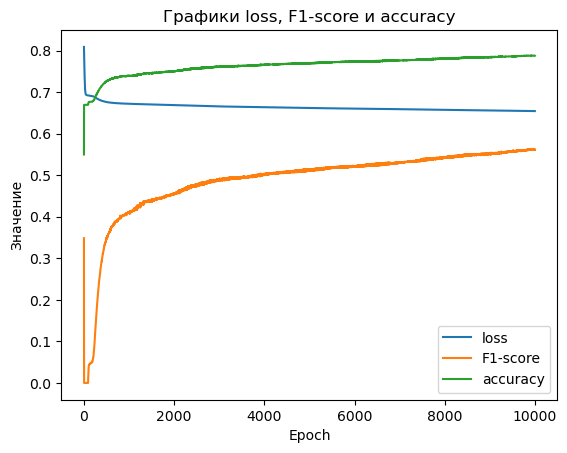

In [22]:
# построение графика loss
plt.plot(diagdf['Epoch'], diagdf['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf['Epoch'], diagdf['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf['Epoch'], diagdf['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [23]:
pred_test1=Mk1.forward(x_test.float())
pred_test_binarized1 = (pred_test1 > 0.5).float()

In [24]:
print(classification_report(y_test.to('cpu'), pred_test_binarized1.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.75      0.93      0.83      3226
         1.0       0.71      0.35      0.47      1537

    accuracy                           0.74      4763
   macro avg       0.73      0.64      0.65      4763
weighted avg       0.74      0.74      0.72      4763



In [25]:
#----------------------------------------------

<font color='red'>Word2Vec_MLP_Experiment_#2</font>

<font color='red'>epochs: 10000 -> 5050, hidden_size: 200 -> 300, lr: 0.0001 -> 0.001</font>

In [26]:
#----------------------------------------------

In [27]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK2(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK2, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
        
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.relu(out)
        out = self.fc2(out)
        return out

In [28]:
Mk2=MLP_MK2(100,300,1) #изменить название переменной

In [29]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [30]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [31]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [32]:
Mk2=Mk2.to(dev)

In [33]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk2.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf1=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(5050):
    optimizer.zero_grad()
    pred = Mk2.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf1 = pd.concat([diagdf1, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.689629077911377   f1-score: 0.0739230215549469   accuracy: 0.6730561852455139
Epoch:  2 , Loss:  0.6774965524673462   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  3 , Loss:  0.6668602824211121   f1-score: 0.0435822494328022   accuracy: 0.6761159300804138
Epoch:  4 , Loss:  0.6576988101005554   f1-score: 0.036305394023656845   accuracy: 0.6751260161399841
Epoch:  5 , Loss:  0.6499040126800537   f1-score: 0.021516945213079453   accuracy: 0.6726061701774597
Epoch:  6 , Loss:  0.6433799862861633   f1-score: 0.008667388930916786   accuracy: 0.6706263422966003
Epoch:  7 , Loss:  0.6381396055221558   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8 , Loss:  0.6341517567634583   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9 , Loss:  0.6314197778701782   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10 , Loss:  0.6298646926879883   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11 , Loss:  0.6293197870254517   f1-score: 0.

Epoch:  114 , Loss:  0.5751014947891235   f1-score: 0.2729088068008423   accuracy: 0.7050936222076416
Epoch:  115 , Loss:  0.5745381116867065   f1-score: 0.2773851454257965   accuracy: 0.705543577671051
Epoch:  116 , Loss:  0.5739776492118835   f1-score: 0.2804314196109772   accuracy: 0.7058135271072388
Epoch:  117 , Loss:  0.5734239220619202   f1-score: 0.28282827138900757   accuracy: 0.7060835361480713
Epoch:  118 , Loss:  0.5728810429573059   f1-score: 0.28964611887931824   accuracy: 0.7073433995246887
Epoch:  119 , Loss:  0.5723442435264587   f1-score: 0.29305464029312134   accuracy: 0.7077933549880981
Epoch:  120 , Loss:  0.5718108415603638   f1-score: 0.2946409285068512   accuracy: 0.7074334025382996
Epoch:  121 , Loss:  0.5712804198265076   f1-score: 0.2964726388454437   accuracy: 0.7074334025382996
Epoch:  122 , Loss:  0.5707557201385498   f1-score: 0.2976242005825043   accuracy: 0.7073433995246887
Epoch:  123 , Loss:  0.5702372789382935   f1-score: 0.3024306297302246   accurac

Epoch:  227 , Loss:  0.5367057919502258   f1-score: 0.4618784487247467   accuracy: 0.7370410561561584
Epoch:  228 , Loss:  0.536505401134491   f1-score: 0.455203115940094   accuracy: 0.7356911301612854
Epoch:  229 , Loss:  0.5363032817840576   f1-score: 0.4618503451347351   accuracy: 0.7372210025787354
Epoch:  230 , Loss:  0.536103367805481   f1-score: 0.45926472544670105   accuracy: 0.736591100692749
Epoch:  231 , Loss:  0.5359081029891968   f1-score: 0.4610844850540161   accuracy: 0.7370410561561584
Epoch:  232 , Loss:  0.5357165932655334   f1-score: 0.46309590339660645   accuracy: 0.7374910116195679
Epoch:  233 , Loss:  0.5355264544487   f1-score: 0.4604024291038513   accuracy: 0.7369510531425476
Epoch:  234 , Loss:  0.5353365540504456   f1-score: 0.4657483994960785   accuracy: 0.738210916519165
Epoch:  235 , Loss:  0.5351466536521912   f1-score: 0.46139636635780334   accuracy: 0.7375810146331787
Epoch:  236 , Loss:  0.5349572896957397   f1-score: 0.4677182734012604   accuracy: 0.73

Epoch:  330 , Loss:  0.5221100449562073   f1-score: 0.4945816397666931   accuracy: 0.7439704537391663
Epoch:  331 , Loss:  0.5220102667808533   f1-score: 0.49973568320274353   accuracy: 0.7445104122161865
Epoch:  332 , Loss:  0.5219079852104187   f1-score: 0.4940423369407654   accuracy: 0.7439704537391663
Epoch:  333 , Loss:  0.5218031406402588   f1-score: 0.5009681582450867   accuracy: 0.7448704242706299
Epoch:  334 , Loss:  0.5216966271400452   f1-score: 0.496181845664978   accuracy: 0.7446904182434082
Epoch:  335 , Loss:  0.5215895771980286   f1-score: 0.500264585018158   accuracy: 0.7450503706932068
Epoch:  336 , Loss:  0.521483302116394   f1-score: 0.4981399476528168   accuracy: 0.7450503706932068
Epoch:  337 , Loss:  0.5213783979415894   f1-score: 0.4998233914375305   accuracy: 0.7451403737068176
Epoch:  338 , Loss:  0.5212749242782593   f1-score: 0.5   accuracy: 0.7451403737068176
Epoch:  339 , Loss:  0.5211724638938904   f1-score: 0.5003536343574524   accuracy: 0.74568033218383

Epoch:  424 , Loss:  0.51357501745224   f1-score: 0.5212435126304626   accuracy: 0.7505399584770203
Epoch:  425 , Loss:  0.5134958028793335   f1-score: 0.5227272510528564   accuracy: 0.7505399584770203
Epoch:  426 , Loss:  0.5134174227714539   f1-score: 0.5202352404594421   accuracy: 0.7503599524497986
Epoch:  427 , Loss:  0.5133397579193115   f1-score: 0.5242351293563843   accuracy: 0.7508999109268188
Epoch:  428 , Loss:  0.5132630467414856   f1-score: 0.5194174647331238   accuracy: 0.7505399584770203
Epoch:  429 , Loss:  0.5131877064704895   f1-score: 0.5259907245635986   accuracy: 0.7513498663902283
Epoch:  430 , Loss:  0.5131149291992188   f1-score: 0.5188531875610352   accuracy: 0.750809907913208
Epoch:  431 , Loss:  0.5130437612533569   f1-score: 0.5271264910697937   accuracy: 0.7513498663902283
Epoch:  432 , Loss:  0.5129756331443787   f1-score: 0.5176675319671631   accuracy: 0.7506299614906311
Epoch:  433 , Loss:  0.5129069089889526   f1-score: 0.5293315052986145   accuracy: 0.

Epoch:  524 , Loss:  0.5063067674636841   f1-score: 0.5424242615699768   accuracy: 0.7553995847702026
Epoch:  525 , Loss:  0.5062583684921265   f1-score: 0.5308853983879089   accuracy: 0.7539596557617188
Epoch:  526 , Loss:  0.5062116980552673   f1-score: 0.544386625289917   accuracy: 0.7556695342063904
Epoch:  527 , Loss:  0.5061641335487366   f1-score: 0.530170202255249   accuracy: 0.7540496587753296
Epoch:  528 , Loss:  0.506105899810791   f1-score: 0.5460327863693237   accuracy: 0.7559395432472229
Epoch:  529 , Loss:  0.5060358643531799   f1-score: 0.5299174785614014   accuracy: 0.7539596557617188
Epoch:  530 , Loss:  0.5059486627578735   f1-score: 0.5455154776573181   accuracy: 0.7560295462608337
Epoch:  531 , Loss:  0.5058535933494568   f1-score: 0.5321446657180786   accuracy: 0.754409670829773
Epoch:  532 , Loss:  0.505757212638855   f1-score: 0.5425442457199097   accuracy: 0.7556695342063904
Epoch:  533 , Loss:  0.5056708455085754   f1-score: 0.5368510484695435   accuracy: 0.75

Epoch:  613 , Loss:  0.50067538022995   f1-score: 0.5528725981712341   accuracy: 0.7583693265914917
Epoch:  614 , Loss:  0.5006240606307983   f1-score: 0.5493878722190857   accuracy: 0.75818932056427
Epoch:  615 , Loss:  0.5005767941474915   f1-score: 0.5555371046066284   accuracy: 0.7590892910957336
Epoch:  616 , Loss:  0.5005368590354919   f1-score: 0.5475950241088867   accuracy: 0.7579193711280823
Epoch:  617 , Loss:  0.5005045533180237   f1-score: 0.5569327473640442   accuracy: 0.7587292790412903
Epoch:  618 , Loss:  0.5004831552505493   f1-score: 0.5449010729789734   accuracy: 0.7578293681144714
Epoch:  619 , Loss:  0.5004635453224182   f1-score: 0.5603944063186646   accuracy: 0.7592692375183105
Epoch:  620 , Loss:  0.5004483461380005   f1-score: 0.5435705780982971   accuracy: 0.75818932056427
Epoch:  621 , Loss:  0.5004076361656189   f1-score: 0.5644713044166565   accuracy: 0.7601692080497742
Epoch:  622 , Loss:  0.5003445148468018   f1-score: 0.5435078144073486   accuracy: 0.758

Epoch:  715 , Loss:  0.49531716108322144   f1-score: 0.5658775568008423   accuracy: 0.7607091665267944
Epoch:  716 , Loss:  0.49528181552886963   f1-score: 0.5591612458229065   accuracy: 0.7616090774536133
Epoch:  717 , Loss:  0.49523916840553284   f1-score: 0.5663024187088013   accuracy: 0.7607091665267944
Epoch:  718 , Loss:  0.4951910972595215   f1-score: 0.5588676333427429   accuracy: 0.7616090774536133
Epoch:  719 , Loss:  0.49513307213783264   f1-score: 0.5657357573509216   accuracy: 0.7607091665267944
Epoch:  720 , Loss:  0.4950728714466095   f1-score: 0.5599334836006165   accuracy: 0.761789083480835
Epoch:  721 , Loss:  0.49500739574432373   f1-score: 0.5659142732620239   accuracy: 0.7611591219902039
Epoch:  722 , Loss:  0.49494457244873047   f1-score: 0.5612464547157288   accuracy: 0.761789083480835
Epoch:  723 , Loss:  0.49488481879234314   f1-score: 0.5653315782546997   accuracy: 0.7616990804672241
Epoch:  724 , Loss:  0.494829922914505   f1-score: 0.5630266070365906   accur

Epoch:  822 , Loss:  0.490418404340744   f1-score: 0.5758855938911438   accuracy: 0.7651187777519226
Epoch:  823 , Loss:  0.49036312103271484   f1-score: 0.5722249746322632   accuracy: 0.7652087807655334
Epoch:  824 , Loss:  0.4903177320957184   f1-score: 0.5737195014953613   accuracy: 0.765568733215332
Epoch:  825 , Loss:  0.490279883146286   f1-score: 0.5745027661323547   accuracy: 0.7651187777519226
Epoch:  826 , Loss:  0.49024832248687744   f1-score: 0.5717102289199829   accuracy: 0.7653887867927551
Epoch:  827 , Loss:  0.49022188782691956   f1-score: 0.5767109990119934   accuracy: 0.7651187777519226
Epoch:  828 , Loss:  0.4902002215385437   f1-score: 0.5688830018043518   accuracy: 0.7648488283157349
Epoch:  829 , Loss:  0.490181028842926   f1-score: 0.5764135718345642   accuracy: 0.7640388607978821
Epoch:  830 , Loss:  0.4901655614376068   f1-score: 0.5684489607810974   accuracy: 0.7653887867927551
Epoch:  831 , Loss:  0.49014559388160706   f1-score: 0.5764023065567017   accuracy:

Epoch:  910 , Loss:  0.4869695007801056   f1-score: 0.5807493329048157   accuracy: 0.7663787007331848
Epoch:  911 , Loss:  0.48692527413368225   f1-score: 0.5788533091545105   accuracy: 0.7666486501693726
Epoch:  912 , Loss:  0.4868871867656708   f1-score: 0.5789388418197632   accuracy: 0.7664687037467957
Epoch:  913 , Loss:  0.48685434460639954   f1-score: 0.5802488923072815   accuracy: 0.766288697719574
Epoch:  914 , Loss:  0.48682549595832825   f1-score: 0.5784153938293457   accuracy: 0.7672786116600037
Epoch:  915 , Loss:  0.4868028461933136   f1-score: 0.5816014409065247   accuracy: 0.766288697719574
Epoch:  916 , Loss:  0.48678427934646606   f1-score: 0.5758716464042664   accuracy: 0.7668286561965942
Epoch:  917 , Loss:  0.4867710471153259   f1-score: 0.5823028683662415   accuracy: 0.7659287452697754
Epoch:  918 , Loss:  0.4867647588253021   f1-score: 0.5740588307380676   accuracy: 0.7668286561965942
Epoch:  919 , Loss:  0.48675742745399475   f1-score: 0.5838131904602051   accura

Epoch:  1003 , Loss:  0.4836648106575012   f1-score: 0.5833736658096313   accuracy: 0.7677285671234131
Epoch:  1004 , Loss:  0.48364314436912537   f1-score: 0.582643985748291   accuracy: 0.768448531627655
Epoch:  1005 , Loss:  0.48363086581230164   f1-score: 0.586632490158081   accuracy: 0.7679085731506348
Epoch:  1006 , Loss:  0.48362627625465393   f1-score: 0.5798662304878235   accuracy: 0.7682685256004333
Epoch:  1007 , Loss:  0.4836254417896271   f1-score: 0.5894166231155396   accuracy: 0.7681785225868225
Epoch:  1008 , Loss:  0.4836287796497345   f1-score: 0.5773195624351501   accuracy: 0.7675486207008362
Epoch:  1009 , Loss:  0.4836229681968689   f1-score: 0.5909090638160706   accuracy: 0.7683585286140442
Epoch:  1010 , Loss:  0.48361101746559143   f1-score: 0.57682204246521   accuracy: 0.7679985761642456
Epoch:  1011 , Loss:  0.4835708439350128   f1-score: 0.591168999671936   accuracy: 0.7683585286140442
Epoch:  1012 , Loss:  0.48351672291755676   f1-score: 0.5773263573646545   

Epoch:  1111 , Loss:  0.48024290800094604   f1-score: 0.5894466042518616   accuracy: 0.7703383564949036
Epoch:  1112 , Loss:  0.48021870851516724   f1-score: 0.5912151336669922   accuracy: 0.7705183625221252
Epoch:  1113 , Loss:  0.48020195960998535   f1-score: 0.5864467024803162   accuracy: 0.7698884010314941
Epoch:  1114 , Loss:  0.4801913797855377   f1-score: 0.5931473970413208   accuracy: 0.7702483534812927
Epoch:  1115 , Loss:  0.48018765449523926   f1-score: 0.5844704508781433   accuracy: 0.7697983980178833
Epoch:  1116 , Loss:  0.48018479347229004   f1-score: 0.5941316485404968   accuracy: 0.7697083950042725
Epoch:  1117 , Loss:  0.48018547892570496   f1-score: 0.5823817253112793   accuracy: 0.7696184515953064
Epoch:  1118 , Loss:  0.4801751971244812   f1-score: 0.5967130064964294   accuracy: 0.7703383564949036
Epoch:  1119 , Loss:  0.4801628887653351   f1-score: 0.5817527770996094   accuracy: 0.7697983980178833
Epoch:  1120 , Loss:  0.4801316559314728   f1-score: 0.596840441226

Epoch:  1215 , Loss:  0.47743481397628784   f1-score: 0.5890589356422424   accuracy: 0.7728581428527832
Epoch:  1216 , Loss:  0.4773768186569214   f1-score: 0.602640688419342   accuracy: 0.7724981904029846
Epoch:  1217 , Loss:  0.4773084819316864   f1-score: 0.5897436141967773   accuracy: 0.7724981904029846
Epoch:  1218 , Loss:  0.4772360622882843   f1-score: 0.6007279753684998   accuracy: 0.772948145866394
Epoch:  1219 , Loss:  0.4771741032600403   f1-score: 0.5945337414741516   accuracy: 0.7730381488800049
Epoch:  1220 , Loss:  0.4771280288696289   f1-score: 0.5974191427230835   accuracy: 0.7725881934165955
Epoch:  1221 , Loss:  0.47709885239601135   f1-score: 0.5976095795631409   accuracy: 0.7727681994438171
Epoch:  1222 , Loss:  0.4770818054676056   f1-score: 0.5956696271896362   accuracy: 0.7731281518936157
Epoch:  1223 , Loss:  0.47707268595695496   f1-score: 0.5994922518730164   accuracy: 0.7728581428527832
Epoch:  1224 , Loss:  0.4770715534687042   f1-score: 0.5927360653877258 

Epoch:  1322 , Loss:  0.4744277000427246   f1-score: 0.6014097929000854   accuracy: 0.7760978937149048
Epoch:  1323 , Loss:  0.47443288564682007   f1-score: 0.605507493019104   accuracy: 0.7743880748748779
Epoch:  1324 , Loss:  0.47444799542427063   f1-score: 0.5991302728652954   accuracy: 0.776007890701294
Epoch:  1325 , Loss:  0.47446104884147644   f1-score: 0.6064313650131226   accuracy: 0.7742080688476562
Epoch:  1326 , Loss:  0.4744742512702942   f1-score: 0.5958549380302429   accuracy: 0.7753779888153076
Epoch:  1327 , Loss:  0.4744618833065033   f1-score: 0.6081652045249939   accuracy: 0.7745680212974548
Epoch:  1328 , Loss:  0.47443675994873047   f1-score: 0.5950413346290588   accuracy: 0.7751079797744751
Epoch:  1329 , Loss:  0.4743814468383789   f1-score: 0.6073331236839294   accuracy: 0.774478018283844
Epoch:  1330 , Loss:  0.47431591153144836   f1-score: 0.5989028811454773   accuracy: 0.7762778997421265
Epoch:  1331 , Loss:  0.4742417335510254   f1-score: 0.6055363416671753

Epoch:  1439 , Loss:  0.47165852785110474   f1-score: 0.6023786664009094   accuracy: 0.777357816696167
Epoch:  1440 , Loss:  0.4716658890247345   f1-score: 0.6110506057739258   accuracy: 0.7751079797744751
Epoch:  1441 , Loss:  0.47167545557022095   f1-score: 0.6004194021224976   accuracy: 0.7770878076553345
Epoch:  1442 , Loss:  0.4716600775718689   f1-score: 0.6113442182540894   accuracy: 0.7749280333518982
Epoch:  1443 , Loss:  0.4716413617134094   f1-score: 0.6003873348236084   accuracy: 0.7771778106689453
Epoch:  1444 , Loss:  0.47158998250961304   f1-score: 0.6107653975486755   accuracy: 0.7748380303382874
Epoch:  1445 , Loss:  0.47153449058532715   f1-score: 0.6020917296409607   accuracy: 0.7774478197097778
Epoch:  1446 , Loss:  0.4714590013027191   f1-score: 0.6112064719200134   accuracy: 0.775827944278717
Epoch:  1447 , Loss:  0.4713878035545349   f1-score: 0.6038763523101807   accuracy: 0.7774478197097778
Epoch:  1448 , Loss:  0.47132331132888794   f1-score: 0.610595822334289

Epoch:  1523 , Loss:  0.46967118978500366   f1-score: 0.6156235337257385   accuracy: 0.7772678136825562
Epoch:  1524 , Loss:  0.46965277194976807   f1-score: 0.6039794683456421   accuracy: 0.7778977751731873
Epoch:  1525 , Loss:  0.46960774064064026   f1-score: 0.6153846383094788   accuracy: 0.7772678136825562
Epoch:  1526 , Loss:  0.469560444355011   f1-score: 0.6054105758666992   accuracy: 0.778167724609375
Epoch:  1527 , Loss:  0.4694993793964386   f1-score: 0.6141855120658875   accuracy: 0.7772678136825562
Epoch:  1528 , Loss:  0.4694405198097229   f1-score: 0.6078775525093079   accuracy: 0.7787076830863953
Epoch:  1529 , Loss:  0.4693853557109833   f1-score: 0.6120595335960388   accuracy: 0.7770878076553345
Epoch:  1530 , Loss:  0.46934038400650024   f1-score: 0.6101318001747131   accuracy: 0.7790676951408386
Epoch:  1531 , Loss:  0.4693034291267395   f1-score: 0.6115390658378601   accuracy: 0.7776277661323547
Epoch:  1532 , Loss:  0.4692738652229309   f1-score: 0.6120063066482544

Epoch:  1604 , Loss:  0.4676167368888855   f1-score: 0.6094270944595337   accuracy: 0.7785277366638184
Epoch:  1605 , Loss:  0.4676133990287781   f1-score: 0.6165601015090942   accuracy: 0.7787076830863953
Epoch:  1606 , Loss:  0.46762141585350037   f1-score: 0.6085432171821594   accuracy: 0.7789776921272278
Epoch:  1607 , Loss:  0.46763914823532104   f1-score: 0.6189663410186768   accuracy: 0.7790676951408386
Epoch:  1608 , Loss:  0.46767985820770264   f1-score: 0.6074287295341492   accuracy: 0.7793376445770264
Epoch:  1609 , Loss:  0.46772676706314087   f1-score: 0.6190842986106873   accuracy: 0.7776277661323547
Epoch:  1610 , Loss:  0.4677979052066803   f1-score: 0.6046736240386963   accuracy: 0.7792476415634155
Epoch:  1611 , Loss:  0.4678443372249603   f1-score: 0.620552122592926   accuracy: 0.777357816696167
Epoch:  1612 , Loss:  0.46788477897644043   f1-score: 0.60368812084198   accuracy: 0.779517650604248
Epoch:  1613 , Loss:  0.46783125400543213   f1-score: 0.6209961771965027 

Epoch:  1711 , Loss:  0.46506261825561523   f1-score: 0.6132360100746155   accuracy: 0.7806875705718994
Epoch:  1712 , Loss:  0.4650701582431793   f1-score: 0.620593249797821   accuracy: 0.7801476120948792
Epoch:  1713 , Loss:  0.46508848667144775   f1-score: 0.6119521856307983   accuracy: 0.7808675169944763
Epoch:  1714 , Loss:  0.465106338262558   f1-score: 0.6222016215324402   accuracy: 0.7797876000404358
Epoch:  1715 , Loss:  0.4651309549808502   f1-score: 0.6100719571113586   accuracy: 0.7805075645446777
Epoch:  1716 , Loss:  0.46513450145721436   f1-score: 0.6223248839378357   accuracy: 0.7792476415634155
Epoch:  1717 , Loss:  0.46513402462005615   f1-score: 0.6099904179573059   accuracy: 0.7807775139808655
Epoch:  1718 , Loss:  0.46509525179862976   f1-score: 0.6231728196144104   accuracy: 0.7796076536178589
Epoch:  1719 , Loss:  0.4650499224662781   f1-score: 0.6102670431137085   accuracy: 0.7806875705718994
Epoch:  1720 , Loss:  0.46496766805648804   f1-score: 0.62172168493270

Epoch:  1812 , Loss:  0.46254435181617737   f1-score: 0.623267412185669   accuracy: 0.7823073863983154
Epoch:  1813 , Loss:  0.46255332231521606   f1-score: 0.6163342595100403   accuracy: 0.781857430934906
Epoch:  1814 , Loss:  0.4625703990459442   f1-score: 0.625   accuracy: 0.781857430934906
Epoch:  1815 , Loss:  0.46259504556655884   f1-score: 0.614551842212677   accuracy: 0.7821274399757385
Epoch:  1816 , Loss:  0.4626120328903198   f1-score: 0.6253851056098938   accuracy: 0.7811375260353088
Epoch:  1817 , Loss:  0.46262863278388977   f1-score: 0.6134910583496094   accuracy: 0.7823973894119263
Epoch:  1818 , Loss:  0.46261879801750183   f1-score: 0.6269572973251343   accuracy: 0.7813174724578857
Epoch:  1819 , Loss:  0.4625987410545349   f1-score: 0.6133674383163452   accuracy: 0.7823973894119263
Epoch:  1820 , Loss:  0.462541788816452   f1-score: 0.6263837814331055   accuracy: 0.7813174724578857
Epoch:  1821 , Loss:  0.46247342228889465   f1-score: 0.6141581535339355   accuracy: 0

Epoch:  1920 , Loss:  0.46006685495376587   f1-score: 0.629161536693573   accuracy: 0.7834773063659668
Epoch:  1921 , Loss:  0.46009713411331177   f1-score: 0.6195083260536194   accuracy: 0.7841072678565979
Epoch:  1922 , Loss:  0.4601222276687622   f1-score: 0.6313689351081848   accuracy: 0.7838373184204102
Epoch:  1923 , Loss:  0.4601532220840454   f1-score: 0.6179381012916565   accuracy: 0.7845572233200073
Epoch:  1924 , Loss:  0.46015849709510803   f1-score: 0.6315628290176392   accuracy: 0.783387303352356
Epoch:  1925 , Loss:  0.4601580798625946   f1-score: 0.6164668202400208   accuracy: 0.7841072678565979
Epoch:  1926 , Loss:  0.4601122736930847   f1-score: 0.6315628290176392   accuracy: 0.783387303352356
Epoch:  1927 , Loss:  0.4600520133972168   f1-score: 0.6193815469741821   accuracy: 0.7850971817970276
Epoch:  1928 , Loss:  0.45995959639549255   f1-score: 0.6310291886329651   accuracy: 0.7838373184204102
Epoch:  1929 , Loss:  0.45987215638160706   f1-score: 0.6199367046356201

Epoch:  2029 , Loss:  0.4577833414077759   f1-score: 0.6209202408790588   accuracy: 0.7857271432876587
Epoch:  2030 , Loss:  0.4577590823173523   f1-score: 0.635168194770813   accuracy: 0.7852771878242493
Epoch:  2031 , Loss:  0.4577313959598541   f1-score: 0.6208214163780212   accuracy: 0.7856371402740479
Epoch:  2032 , Loss:  0.45767369866371155   f1-score: 0.6345270872116089   accuracy: 0.7850971817970276
Epoch:  2033 , Loss:  0.45761170983314514   f1-score: 0.621248185634613   accuracy: 0.7853671908378601
Epoch:  2034 , Loss:  0.4575342833995819   f1-score: 0.6334869265556335   accuracy: 0.7852771878242493
Epoch:  2035 , Loss:  0.4574640989303589   f1-score: 0.6241716742515564   accuracy: 0.7856371402740479
Epoch:  2036 , Loss:  0.45739713311195374   f1-score: 0.6307834386825562   accuracy: 0.7845572233200073
Epoch:  2037 , Loss:  0.4573438763618469   f1-score: 0.6270947456359863   accuracy: 0.7857271432876587
Epoch:  2038 , Loss:  0.4573027193546295   f1-score: 0.6293424367904663 

Epoch:  2135 , Loss:  0.45526522397994995   f1-score: 0.6272841691970825   accuracy: 0.787077009677887
Epoch:  2136 , Loss:  0.45529377460479736   f1-score: 0.6371437311172485   accuracy: 0.7868970632553101
Epoch:  2137 , Loss:  0.45533043146133423   f1-score: 0.6246635913848877   accuracy: 0.7866270542144775
Epoch:  2138 , Loss:  0.45535358786582947   f1-score: 0.6388761401176453   accuracy: 0.7871670126914978
Epoch:  2139 , Loss:  0.45538008213043213   f1-score: 0.624305009841919   accuracy: 0.7871670126914978
Epoch:  2140 , Loss:  0.4553702473640442   f1-score: 0.6401463150978088   accuracy: 0.7875270247459412
Epoch:  2141 , Loss:  0.4553542733192444   f1-score: 0.6239669322967529   accuracy: 0.787077009677887
Epoch:  2142 , Loss:  0.4552966058254242   f1-score: 0.6399267911911011   accuracy: 0.7875270247459412
Epoch:  2143 , Loss:  0.45523154735565186   f1-score: 0.6247226595878601   accuracy: 0.7868970632553101
Epoch:  2144 , Loss:  0.4551384150981903   f1-score: 0.638089418411254

Epoch:  2243 , Loss:  0.4529975950717926   f1-score: 0.6308492422103882   accuracy: 0.7891468405723572
Epoch:  2244 , Loss:  0.4530335068702698   f1-score: 0.6424427628517151   accuracy: 0.789236843585968
Epoch:  2245 , Loss:  0.4530749022960663   f1-score: 0.6288790106773376   accuracy: 0.7890568971633911
Epoch:  2246 , Loss:  0.4530773460865021   f1-score: 0.642933189868927   accuracy: 0.7887868881225586
Epoch:  2247 , Loss:  0.4530651271343231   f1-score: 0.6278553009033203   accuracy: 0.7888768911361694
Epoch:  2248 , Loss:  0.453002005815506   f1-score: 0.6429986357688904   accuracy: 0.7891468405723572
Epoch:  2249 , Loss:  0.45292720198631287   f1-score: 0.6293838620185852   accuracy: 0.7888768911361694
Epoch:  2250 , Loss:  0.45283153653144836   f1-score: 0.6410295963287354   accuracy: 0.7891468405723572
Epoch:  2251 , Loss:  0.4527472257614136   f1-score: 0.6324867010116577   accuracy: 0.7890568971633911
Epoch:  2252 , Loss:  0.45267626643180847   f1-score: 0.6389402151107788  

Epoch:  2343 , Loss:  0.4509966969490051   f1-score: 0.6451907157897949   accuracy: 0.7898668050765991
Epoch:  2344 , Loss:  0.45101287961006165   f1-score: 0.6311618089675903   accuracy: 0.7905867695808411
Epoch:  2345 , Loss:  0.4509856402873993   f1-score: 0.6456214785575867   accuracy: 0.7898668050765991
Epoch:  2346 , Loss:  0.4509553909301758   f1-score: 0.6312955617904663   accuracy: 0.7904967665672302
Epoch:  2347 , Loss:  0.4508747160434723   f1-score: 0.6447688341140747   accuracy: 0.7897768020629883
Epoch:  2348 , Loss:  0.45079225301742554   f1-score: 0.6337539553642273   accuracy: 0.7910367250442505
Epoch:  2349 , Loss:  0.4506908357143402   f1-score: 0.6432283520698547   accuracy: 0.78995680809021
Epoch:  2350 , Loss:  0.45060721039772034   f1-score: 0.6378852128982544   accuracy: 0.7916666865348816
Epoch:  2351 , Loss:  0.45053786039352417   f1-score: 0.6405289173126221   accuracy: 0.7895968556404114
Epoch:  2352 , Loss:  0.4504897892475128   f1-score: 0.6383242607116699

Epoch:  2435 , Loss:  0.44897812604904175   f1-score: 0.6376399993896484   accuracy: 0.7932865619659424
Epoch:  2436 , Loss:  0.44898831844329834   f1-score: 0.6477289795875549   accuracy: 0.7913066744804382
Epoch:  2437 , Loss:  0.44900447130203247   f1-score: 0.6360044479370117   accuracy: 0.7927466034889221
Epoch:  2438 , Loss:  0.44898363947868347   f1-score: 0.6487715840339661   accuracy: 0.7915766835212708
Epoch:  2439 , Loss:  0.4489629566669464   f1-score: 0.6360044479370117   accuracy: 0.7927466034889221
Epoch:  2440 , Loss:  0.4489043653011322   f1-score: 0.6482381820678711   accuracy: 0.7915766835212708
Epoch:  2441 , Loss:  0.4488449990749359   f1-score: 0.6374250650405884   accuracy: 0.7931965589523315
Epoch:  2442 , Loss:  0.4487636685371399   f1-score: 0.6469692587852478   accuracy: 0.7913966774940491
Epoch:  2443 , Loss:  0.4486892521381378   f1-score: 0.6387450695037842   accuracy: 0.7927466034889221
Epoch:  2444 , Loss:  0.44861534237861633   f1-score: 0.6432623267173

Epoch:  2516 , Loss:  0.44733309745788574   f1-score: 0.6503030061721802   accuracy: 0.7922965884208679
Epoch:  2517 , Loss:  0.4473130702972412   f1-score: 0.6368662118911743   accuracy: 0.7931065559387207
Epoch:  2518 , Loss:  0.4472590982913971   f1-score: 0.6503867506980896   accuracy: 0.7925665974617004
Epoch:  2519 , Loss:  0.447202205657959   f1-score: 0.6378089189529419   accuracy: 0.792926549911499
Epoch:  2520 , Loss:  0.4471260607242584   f1-score: 0.649619460105896   accuracy: 0.7928365468978882
Epoch:  2521 , Loss:  0.4470539093017578   f1-score: 0.6397243142127991   accuracy: 0.7930165529251099
Epoch:  2522 , Loss:  0.4469844400882721   f1-score: 0.6461113691329956   accuracy: 0.7923865914344788
Epoch:  2523 , Loss:  0.4469295144081116   f1-score: 0.6418561339378357   accuracy: 0.7930165529251099
Epoch:  2524 , Loss:  0.44688913226127625   f1-score: 0.6429785490036011   accuracy: 0.7920266389846802
Epoch:  2525 , Loss:  0.4468628466129303   f1-score: 0.6429014205932617   

Epoch:  2622 , Loss:  0.4451143145561218   f1-score: 0.6511415243148804   accuracy: 0.7937365174293518
Epoch:  2623 , Loss:  0.44503507018089294   f1-score: 0.6419521570205688   accuracy: 0.7940064668655396
Epoch:  2624 , Loss:  0.44495832920074463   f1-score: 0.6490126848220825   accuracy: 0.793646514415741
Epoch:  2625 , Loss:  0.44489943981170654   f1-score: 0.6439782381057739   accuracy: 0.7938265204429626
Epoch:  2626 , Loss:  0.4448583126068115   f1-score: 0.645788311958313   accuracy: 0.7933765053749084
Epoch:  2627 , Loss:  0.44483619928359985   f1-score: 0.6457592844963074   accuracy: 0.793646514415741
Epoch:  2628 , Loss:  0.44482746720314026   f1-score: 0.6445203423500061   accuracy: 0.7939164638519287
Epoch:  2629 , Loss:  0.4448303282260895   f1-score: 0.648656964302063   accuracy: 0.7940064668655396
Epoch:  2630 , Loss:  0.44484424591064453   f1-score: 0.6436029076576233   accuracy: 0.7941864728927612
Epoch:  2631 , Loss:  0.44486376643180847   f1-score: 0.650687038898468

Epoch:  2733 , Loss:  0.44305089116096497   f1-score: 0.6395971179008484   accuracy: 0.7939164638519287
Epoch:  2734 , Loss:  0.44293510913848877   f1-score: 0.6530984044075012   accuracy: 0.794456422328949
Epoch:  2735 , Loss:  0.44283437728881836   f1-score: 0.6420525908470154   accuracy: 0.7940964698791504
Epoch:  2736 , Loss:  0.44274917244911194   f1-score: 0.6508567929267883   accuracy: 0.7946364283561707
Epoch:  2737 , Loss:  0.4426910877227783   f1-score: 0.6474508047103882   accuracy: 0.7952663898468018
Epoch:  2738 , Loss:  0.44265735149383545   f1-score: 0.6489657163619995   accuracy: 0.7953563928604126
Epoch:  2739 , Loss:  0.4426412582397461   f1-score: 0.6499384045600891   accuracy: 0.7953563928604126
Epoch:  2740 , Loss:  0.44263866543769836   f1-score: 0.6465932130813599   accuracy: 0.7950863838195801
Epoch:  2741 , Loss:  0.44264987111091614   f1-score: 0.6513761281967163   accuracy: 0.7948164343833923
Epoch:  2742 , Loss:  0.4426756799221039   f1-score: 0.642689585685

Epoch:  2841 , Loss:  0.44088149070739746   f1-score: 0.6435410380363464   accuracy: 0.7956263422966003
Epoch:  2842 , Loss:  0.4409039318561554   f1-score: 0.6583081483840942   accuracy: 0.7964363098144531
Epoch:  2843 , Loss:  0.440929651260376   f1-score: 0.6421267986297607   accuracy: 0.7952663898468018
Epoch:  2844 , Loss:  0.4409198462963104   f1-score: 0.6579145789146423   accuracy: 0.7959862947463989
Epoch:  2845 , Loss:  0.44090670347213745   f1-score: 0.6422162652015686   accuracy: 0.7954463362693787
Epoch:  2846 , Loss:  0.44085314869880676   f1-score: 0.6581093072891235   accuracy: 0.7962563037872314
Epoch:  2847 , Loss:  0.4407961964607239   f1-score: 0.6437323093414307   accuracy: 0.7958963513374329
Epoch:  2848 , Loss:  0.4407135248184204   f1-score: 0.6573596596717834   accuracy: 0.7967962622642517
Epoch:  2849 , Loss:  0.4406384825706482   f1-score: 0.6456151604652405   accuracy: 0.7959862947463989
Epoch:  2850 , Loss:  0.4405633807182312   f1-score: 0.654678463935852 

Epoch:  2951 , Loss:  0.4385622441768646   f1-score: 0.6533251404762268   accuracy: 0.797336220741272
Epoch:  2952 , Loss:  0.4385467767715454   f1-score: 0.6542887687683105   accuracy: 0.7972462177276611
Epoch:  2953 , Loss:  0.43853893876075745   f1-score: 0.6520598530769348   accuracy: 0.7970662117004395
Epoch:  2954 , Loss:  0.4385415017604828   f1-score: 0.6563789248466492   accuracy: 0.7976061701774597
Epoch:  2955 , Loss:  0.4385523498058319   f1-score: 0.6505050659179688   accuracy: 0.7976061701774597
Epoch:  2956 , Loss:  0.4385724365711212   f1-score: 0.6587555408477783   accuracy: 0.79814612865448
Epoch:  2957 , Loss:  0.4386041462421417   f1-score: 0.6483190059661865   accuracy: 0.7976061701774597
Epoch:  2958 , Loss:  0.43863749504089355   f1-score: 0.6591975688934326   accuracy: 0.7974262237548828
Epoch:  2959 , Loss:  0.4386884272098541   f1-score: 0.6474187970161438   accuracy: 0.7977861762046814
Epoch:  2960 , Loss:  0.4387260377407074   f1-score: 0.6606389284133911   

Epoch:  3058 , Loss:  0.436710387468338   f1-score: 0.6514516472816467   accuracy: 0.7979661822319031
Epoch:  3059 , Loss:  0.43673601746559143   f1-score: 0.6603916883468628   accuracy: 0.7986860871315002
Epoch:  3060 , Loss:  0.436771959066391   f1-score: 0.650429368019104   accuracy: 0.7985061407089233
Epoch:  3061 , Loss:  0.436806857585907   f1-score: 0.6608169674873352   accuracy: 0.7982361316680908
Epoch:  3062 , Loss:  0.43685391545295715   f1-score: 0.6493180990219116   accuracy: 0.7986860871315002
Epoch:  3063 , Loss:  0.4368796944618225   f1-score: 0.6626487970352173   accuracy: 0.7985061407089233
Epoch:  3064 , Loss:  0.43691906332969666   f1-score: 0.647493302822113   accuracy: 0.79814612865448
Epoch:  3065 , Loss:  0.436921626329422   f1-score: 0.6633633375167847   accuracy: 0.7982361316680908
Epoch:  3066 , Loss:  0.43693146109580994   f1-score: 0.6476700305938721   accuracy: 0.7985960841178894
Epoch:  3067 , Loss:  0.4368869960308075   f1-score: 0.6629618406295776   acc

Epoch:  3162 , Loss:  0.43518978357315063   f1-score: 0.6659660935401917   accuracy: 0.7997660040855408
Epoch:  3163 , Loss:  0.4352324903011322   f1-score: 0.648410439491272   accuracy: 0.7989560961723328
Epoch:  3164 , Loss:  0.4352015554904938   f1-score: 0.6660671234130859   accuracy: 0.799496054649353
Epoch:  3165 , Loss:  0.43514788150787354   f1-score: 0.6497015357017517   accuracy: 0.7993160486221313
Epoch:  3166 , Loss:  0.43503284454345703   f1-score: 0.6643567085266113   accuracy: 0.799496054649353
Epoch:  3167 , Loss:  0.4349190294742584   f1-score: 0.6521400809288025   accuracy: 0.7988660931587219
Epoch:  3168 , Loss:  0.4348018765449524   f1-score: 0.66241455078125   accuracy: 0.7999460101127625
Epoch:  3169 , Loss:  0.434719443321228   f1-score: 0.6570943593978882   accuracy: 0.8001260161399841
Epoch:  3170 , Loss:  0.4346722364425659   f1-score: 0.6605448126792908   accuracy: 0.8003959655761719
Epoch:  3171 , Loss:  0.43465325236320496   f1-score: 0.6603398323059082   a

Epoch:  3256 , Loss:  0.4335556924343109   f1-score: 0.6510025262832642   accuracy: 0.799496054649353
Epoch:  3257 , Loss:  0.4335665702819824   f1-score: 0.6674659252166748   accuracy: 0.800305962562561
Epoch:  3258 , Loss:  0.4335669279098511   f1-score: 0.6509730219841003   accuracy: 0.7998560070991516
Epoch:  3259 , Loss:  0.43350735306739807   f1-score: 0.6675667762756348   accuracy: 0.8005759716033936
Epoch:  3260 , Loss:  0.43343958258628845   f1-score: 0.6521807312965393   accuracy: 0.7997660040855408
Epoch:  3261 , Loss:  0.43333742022514343   f1-score: 0.6676709651947021   accuracy: 0.8014758825302124
Epoch:  3262 , Loss:  0.4332435131072998   f1-score: 0.6544437408447266   accuracy: 0.7998560070991516
Epoch:  3263 , Loss:  0.43315404653549194   f1-score: 0.6655548810958862   accuracy: 0.8014758825302124
Epoch:  3264 , Loss:  0.43308454751968384   f1-score: 0.6581223011016846   accuracy: 0.8007559180259705
Epoch:  3265 , Loss:  0.43303611874580383   f1-score: 0.66228407621383

Epoch:  3357 , Loss:  0.43195998668670654   f1-score: 0.6513891220092773   accuracy: 0.8001260161399841
Epoch:  3358 , Loss:  0.43197470903396606   f1-score: 0.6715459227561951   accuracy: 0.8021058440208435
Epoch:  3359 , Loss:  0.43200239539146423   f1-score: 0.6497717499732971   accuracy: 0.7997660040855408
Epoch:  3360 , Loss:  0.4319486916065216   f1-score: 0.6718423366546631   accuracy: 0.8021958470344543
Epoch:  3361 , Loss:  0.43189722299575806   f1-score: 0.6514984965324402   accuracy: 0.8001260161399841
Epoch:  3362 , Loss:  0.4317759573459625   f1-score: 0.6703609228134155   accuracy: 0.8019258379936218
Epoch:  3363 , Loss:  0.43165886402130127   f1-score: 0.6563766598701477   accuracy: 0.8016558885574341
Epoch:  3364 , Loss:  0.43152886629104614   f1-score: 0.6696805357933044   accuracy: 0.8027358055114746
Epoch:  3365 , Loss:  0.43142932653427124   f1-score: 0.6594561338424683   accuracy: 0.8016558885574341
Epoch:  3366 , Loss:  0.431354820728302   f1-score: 0.667782187461

Epoch:  3469 , Loss:  0.42964261770248413   f1-score: 0.6656436920166016   accuracy: 0.8039056658744812
Epoch:  3470 , Loss:  0.42964696884155273   f1-score: 0.6690964102745056   accuracy: 0.8039056658744812
Epoch:  3471 , Loss:  0.42965930700302124   f1-score: 0.662351667881012   accuracy: 0.8028257489204407
Epoch:  3472 , Loss:  0.42967939376831055   f1-score: 0.6708994507789612   accuracy: 0.8040856719017029
Epoch:  3473 , Loss:  0.4297134578227997   f1-score: 0.6599535346031189   accuracy: 0.8024657964706421
Epoch:  3474 , Loss:  0.4297560453414917   f1-score: 0.671583354473114   accuracy: 0.8036357164382935
Epoch:  3475 , Loss:  0.42980775237083435   f1-score: 0.658259391784668   accuracy: 0.8024657964706421
Epoch:  3476 , Loss:  0.4298562705516815   f1-score: 0.6734663248062134   accuracy: 0.8040856719017029
Epoch:  3477 , Loss:  0.4299183487892151   f1-score: 0.6559324860572815   accuracy: 0.8019258379936218
Epoch:  3478 , Loss:  0.4299510419368744   f1-score: 0.6739455461502075

Epoch:  3567 , Loss:  0.42831069231033325   f1-score: 0.6603421568870544   accuracy: 0.8034557104110718
Epoch:  3568 , Loss:  0.428185373544693   f1-score: 0.6720965504646301   accuracy: 0.8043556809425354
Epoch:  3569 , Loss:  0.4280937612056732   f1-score: 0.6647167205810547   accuracy: 0.803995668888092
Epoch:  3570 , Loss:  0.42803552746772766   f1-score: 0.6699088215827942   accuracy: 0.8045356273651123
Epoch:  3571 , Loss:  0.42801129817962646   f1-score: 0.6690033674240112   accuracy: 0.8045356273651123
Epoch:  3572 , Loss:  0.42801180481910706   f1-score: 0.6663598418235779   accuracy: 0.8042656779289246
Epoch:  3573 , Loss:  0.42803069949150085   f1-score: 0.6704012155532837   accuracy: 0.8040856719017029
Epoch:  3574 , Loss:  0.42807117104530334   f1-score: 0.664297878742218   accuracy: 0.8044456243515015
Epoch:  3575 , Loss:  0.4281241297721863   f1-score: 0.6728859543800354   accuracy: 0.8043556809425354
Epoch:  3576 , Loss:  0.4281896948814392   f1-score: 0.660236477851867

Epoch:  3665 , Loss:  0.4266895651817322   f1-score: 0.6736968755722046   accuracy: 0.8050755858421326
Epoch:  3666 , Loss:  0.4266228973865509   f1-score: 0.665739893913269   accuracy: 0.8052555918693542
Epoch:  3667 , Loss:  0.42656630277633667   f1-score: 0.6715107560157776   accuracy: 0.804715633392334
Epoch:  3668 , Loss:  0.4265233278274536   f1-score: 0.6671786308288574   accuracy: 0.8049855828285217
Epoch:  3669 , Loss:  0.4264887869358063   f1-score: 0.670914888381958   accuracy: 0.8048056364059448
Epoch:  3670 , Loss:  0.4264630377292633   f1-score: 0.669009804725647   accuracy: 0.8050755858421326
Epoch:  3671 , Loss:  0.42644256353378296   f1-score: 0.6712349653244019   accuracy: 0.8057055473327637
Epoch:  3672 , Loss:  0.42642560601234436   f1-score: 0.6708320379257202   accuracy: 0.8056155443191528
Epoch:  3673 , Loss:  0.4264102578163147   f1-score: 0.6709362864494324   accuracy: 0.8057955503463745
Epoch:  3674 , Loss:  0.4263976216316223   f1-score: 0.6707224249839783   

Epoch:  3767 , Loss:  0.42493167519569397   f1-score: 0.6712287068367004   accuracy: 0.8054355382919312
Epoch:  3768 , Loss:  0.424947053194046   f1-score: 0.6737416386604309   accuracy: 0.8063355088233948
Epoch:  3769 , Loss:  0.42504236102104187   f1-score: 0.6666666865348816   accuracy: 0.8062455058097839
Epoch:  3770 , Loss:  0.4251743257045746   f1-score: 0.6775645017623901   accuracy: 0.8065154552459717
Epoch:  3771 , Loss:  0.425324946641922   f1-score: 0.6624980568885803   accuracy: 0.8057055473327637
Epoch:  3772 , Loss:  0.42540302872657776   f1-score: 0.6788744926452637   accuracy: 0.8058855533599854
Epoch:  3773 , Loss:  0.42545580863952637   f1-score: 0.6610142588615417   accuracy: 0.8057055473327637
Epoch:  3774 , Loss:  0.425380676984787   f1-score: 0.6790711283683777   accuracy: 0.8059754967689514
Epoch:  3775 , Loss:  0.42527157068252563   f1-score: 0.6624941229820251   accuracy: 0.8058855533599854
Epoch:  3776 , Loss:  0.4250897765159607   f1-score: 0.6778644323348999

Epoch:  3868 , Loss:  0.42338550090789795   f1-score: 0.6761415004730225   accuracy: 0.8072354197502136
Epoch:  3869 , Loss:  0.42341136932373047   f1-score: 0.6700617074966431   accuracy: 0.8075953722000122
Epoch:  3870 , Loss:  0.4234338700771332   f1-score: 0.677312433719635   accuracy: 0.8072354197502136
Epoch:  3871 , Loss:  0.423458069562912   f1-score: 0.6675968766212463   accuracy: 0.8070554137229919
Epoch:  3872 , Loss:  0.4234703481197357   f1-score: 0.6770849227905273   accuracy: 0.8066054582595825
Epoch:  3873 , Loss:  0.4234793782234192   f1-score: 0.6665631532669067   accuracy: 0.8067854642868042
Epoch:  3874 , Loss:  0.423466295003891   f1-score: 0.6776809692382812   accuracy: 0.806875467300415
Epoch:  3875 , Loss:  0.42345789074897766   f1-score: 0.666045069694519   accuracy: 0.8066054582595825
Epoch:  3876 , Loss:  0.4234289526939392   f1-score: 0.6775792241096497   accuracy: 0.8067854642868042
Epoch:  3877 , Loss:  0.4234006106853485   f1-score: 0.666977047920227   ac

Epoch:  3965 , Loss:  0.4222142994403839   f1-score: 0.6819809079170227   accuracy: 0.8081353306770325
Epoch:  3966 , Loss:  0.42232993245124817   f1-score: 0.6634253263473511   accuracy: 0.806875467300415
Epoch:  3967 , Loss:  0.42240023612976074   f1-score: 0.6835630536079407   accuracy: 0.8078653812408447
Epoch:  3968 , Loss:  0.42248472571372986   f1-score: 0.6603654623031616   accuracy: 0.8059754967689514
Epoch:  3969 , Loss:  0.422458678483963   f1-score: 0.6835330724716187   accuracy: 0.8075054287910461
Epoch:  3970 , Loss:  0.42241963744163513   f1-score: 0.6610009670257568   accuracy: 0.8061555027961731
Epoch:  3971 , Loss:  0.42226889729499817   f1-score: 0.6832021474838257   accuracy: 0.8080453276634216
Epoch:  3972 , Loss:  0.42210739850997925   f1-score: 0.6649984121322632   accuracy: 0.8072354197502136
Epoch:  3973 , Loss:  0.42191678285598755   f1-score: 0.680570125579834   accuracy: 0.808405339717865
Epoch:  3974 , Loss:  0.4217675030231476   f1-score: 0.670889973640441

Epoch:  4056 , Loss:  0.4203181266784668   f1-score: 0.6789074540138245   accuracy: 0.8095752596855164
Epoch:  4057 , Loss:  0.4203311502933502   f1-score: 0.6742470860481262   accuracy: 0.809215247631073
Epoch:  4058 , Loss:  0.42035380005836487   f1-score: 0.6788409352302551   accuracy: 0.8084953427314758
Epoch:  4059 , Loss:  0.42039230465888977   f1-score: 0.6715080142021179   accuracy: 0.8086752891540527
Epoch:  4060 , Loss:  0.420437216758728   f1-score: 0.6816816926002502   accuracy: 0.809215247631073
Epoch:  4061 , Loss:  0.42050111293792725   f1-score: 0.6685305833816528   accuracy: 0.8079553842544556
Epoch:  4062 , Loss:  0.42055419087409973   f1-score: 0.6833059191703796   accuracy: 0.8093052506446838
Epoch:  4063 , Loss:  0.42062312364578247   f1-score: 0.6659368276596069   accuracy: 0.8077753782272339
Epoch:  4064 , Loss:  0.4206498861312866   f1-score: 0.6847276091575623   accuracy: 0.8093952536582947
Epoch:  4065 , Loss:  0.4206846058368683   f1-score: 0.6652044653892517

Epoch:  4158 , Loss:  0.4186370372772217   f1-score: 0.6763580441474915   accuracy: 0.8096652030944824
Epoch:  4159 , Loss:  0.4186447858810425   f1-score: 0.6801275014877319   accuracy: 0.8103851675987244
Epoch:  4160 , Loss:  0.4186669886112213   f1-score: 0.6743613481521606   accuracy: 0.8095752596855164
Epoch:  4161 , Loss:  0.4187015891075134   f1-score: 0.6821331977844238   accuracy: 0.8101152181625366
Epoch:  4162 , Loss:  0.4187510907649994   f1-score: 0.671920895576477   accuracy: 0.8089452981948853
Epoch:  4163 , Loss:  0.4187985360622406   f1-score: 0.6840449571609497   accuracy: 0.8102051615715027
Epoch:  4164 , Loss:  0.4188690185546875   f1-score: 0.6684308648109436   accuracy: 0.8083153367042542
Epoch:  4165 , Loss:  0.4189193844795227   f1-score: 0.6854754686355591   accuracy: 0.8103851675987244
Epoch:  4166 , Loss:  0.4189818501472473   f1-score: 0.6671877503395081   accuracy: 0.808405339717865
Epoch:  4167 , Loss:  0.4189983904361725   f1-score: 0.6866735816001892   a

Epoch:  4258 , Loss:  0.41728639602661133   f1-score: 0.6720321774482727   accuracy: 0.8093052506446838
Epoch:  4259 , Loss:  0.41718533635139465   f1-score: 0.6844244003295898   accuracy: 0.8112850785255432
Epoch:  4260 , Loss:  0.4171065092086792   f1-score: 0.6742575764656067   accuracy: 0.8094852566719055
Epoch:  4261 , Loss:  0.41704586148262024   f1-score: 0.6826383471488953   accuracy: 0.8116450905799866
Epoch:  4262 , Loss:  0.4170079827308655   f1-score: 0.6773651242256165   accuracy: 0.8100252151489258
Epoch:  4263 , Loss:  0.41698452830314636   f1-score: 0.6788654923439026   accuracy: 0.8104751706123352
Epoch:  4264 , Loss:  0.4169720411300659   f1-score: 0.6797624230384827   accuracy: 0.810745120048523
Epoch:  4265 , Loss:  0.41697221994400024   f1-score: 0.6767676472663879   accuracy: 0.8099352121353149
Epoch:  4266 , Loss:  0.4169796407222748   f1-score: 0.6832222938537598   accuracy: 0.8117350339889526
Epoch:  4267 , Loss:  0.41699841618537903   f1-score: 0.6744687557220

Epoch:  4355 , Loss:  0.41568586230278015   f1-score: 0.6742646098136902   accuracy: 0.8096652030944824
Epoch:  4356 , Loss:  0.4157339930534363   f1-score: 0.6861949563026428   accuracy: 0.8120050430297852
Epoch:  4357 , Loss:  0.4157995879650116   f1-score: 0.672761082649231   accuracy: 0.8099352121353149
Epoch:  4358 , Loss:  0.4158674478530884   f1-score: 0.6889852285385132   accuracy: 0.8127250075340271
Epoch:  4359 , Loss:  0.41595458984375   f1-score: 0.6711325645446777   accuracy: 0.8100252151489258
Epoch:  4360 , Loss:  0.41600942611694336   f1-score: 0.6904549598693848   accuracy: 0.8126350045204163
Epoch:  4361 , Loss:  0.4160866141319275   f1-score: 0.6700031161308289   accuracy: 0.8101152181625366
Epoch:  4362 , Loss:  0.4160992205142975   f1-score: 0.69124835729599   accuracy: 0.8123649954795837
Epoch:  4363 , Loss:  0.41612324118614197   f1-score: 0.6694849133491516   accuracy: 0.8100252151489258
Epoch:  4364 , Loss:  0.41606685519218445   f1-score: 0.6913506984710693   

Epoch:  4449 , Loss:  0.4148624837398529   f1-score: 0.6701095700263977   accuracy: 0.8102951645851135
Epoch:  4450 , Loss:  0.41476863622665405   f1-score: 0.6929343938827515   accuracy: 0.8134449124336243
Epoch:  4451 , Loss:  0.4146815538406372   f1-score: 0.6716534495353699   accuracy: 0.8103851675987244
Epoch:  4452 , Loss:  0.414536714553833   f1-score: 0.6916083097457886   accuracy: 0.8138049244880676
Epoch:  4453 , Loss:  0.41440796852111816   f1-score: 0.6727638840675354   accuracy: 0.8100252151489258
Epoch:  4454 , Loss:  0.4142792522907257   f1-score: 0.6886919736862183   accuracy: 0.8134449124336243
Epoch:  4455 , Loss:  0.4141824543476105   f1-score: 0.6775334477424622   accuracy: 0.8112850785255432
Epoch:  4456 , Loss:  0.4141126573085785   f1-score: 0.6858266592025757   accuracy: 0.8130849599838257
Epoch:  4457 , Loss:  0.4140688180923462   f1-score: 0.6807081699371338   accuracy: 0.8117350339889526
Epoch:  4458 , Loss:  0.4140515923500061   f1-score: 0.6814024448394775 

Epoch:  4542 , Loss:  0.4128772020339966   f1-score: 0.6808706521987915   accuracy: 0.8126350045204163
Epoch:  4543 , Loss:  0.4129024147987366   f1-score: 0.6869630813598633   accuracy: 0.8130849599838257
Epoch:  4544 , Loss:  0.41294369101524353   f1-score: 0.6758216619491577   accuracy: 0.8109251260757446
Epoch:  4545 , Loss:  0.4129916727542877   f1-score: 0.6913284659385681   accuracy: 0.8145248293876648
Epoch:  4546 , Loss:  0.41305670142173767   f1-score: 0.6741050481796265   accuracy: 0.810745120048523
Epoch:  4547 , Loss:  0.4131188690662384   f1-score: 0.6924910545349121   accuracy: 0.814254879951477
Epoch:  4548 , Loss:  0.4132007956504822   f1-score: 0.6715396642684937   accuracy: 0.8099352121353149
Epoch:  4549 , Loss:  0.41324904561042786   f1-score: 0.6930605173110962   accuracy: 0.8137149214744568
Epoch:  4550 , Loss:  0.41331997513771057   f1-score: 0.6718676686286926   accuracy: 0.810745120048523
Epoch:  4551 , Loss:  0.41331982612609863   f1-score: 0.6936843395233154

Epoch:  4631 , Loss:  0.41176271438598633   f1-score: 0.692307710647583   accuracy: 0.8149747848510742
Epoch:  4632 , Loss:  0.4118364751338959   f1-score: 0.6745231747627258   accuracy: 0.8111051321029663
Epoch:  4633 , Loss:  0.4118952751159668   f1-score: 0.6926625967025757   accuracy: 0.8141648769378662
Epoch:  4634 , Loss:  0.4119839668273926   f1-score: 0.6727866530418396   accuracy: 0.810745120048523
Epoch:  4635 , Loss:  0.41203346848487854   f1-score: 0.6944032907485962   accuracy: 0.814254879951477
Epoch:  4636 , Loss:  0.41211381554603577   f1-score: 0.6724945306777954   accuracy: 0.8111950755119324
Epoch:  4637 , Loss:  0.4121254086494446   f1-score: 0.6954981684684753   accuracy: 0.8143448233604431
Epoch:  4638 , Loss:  0.41215866804122925   f1-score: 0.6729205846786499   accuracy: 0.8117350339889526
Epoch:  4639 , Loss:  0.41208547353744507   f1-score: 0.6952155828475952   accuracy: 0.814254879951477
Epoch:  4640 , Loss:  0.4120246469974518   f1-score: 0.6724917888641357 

Epoch:  4712 , Loss:  0.41039812564849854   f1-score: 0.6888619661331177   accuracy: 0.8149747848510742
Epoch:  4713 , Loss:  0.4103643596172333   f1-score: 0.6872340440750122   accuracy: 0.8147948384284973
Epoch:  4714 , Loss:  0.41036292910575867   f1-score: 0.6846764087677002   accuracy: 0.8140748739242554
Epoch:  4715 , Loss:  0.4103875458240509   f1-score: 0.6901238560676575   accuracy: 0.8153347969055176
Epoch:  4716 , Loss:  0.41043466329574585   f1-score: 0.6787692308425903   accuracy: 0.812095046043396
Epoch:  4717 , Loss:  0.41049671173095703   f1-score: 0.6932414174079895   accuracy: 0.815784752368927
Epoch:  4718 , Loss:  0.410580575466156   f1-score: 0.67637038230896   accuracy: 0.8119150400161743
Epoch:  4719 , Loss:  0.4106547236442566   f1-score: 0.6950439214706421   accuracy: 0.8156047463417053
Epoch:  4720 , Loss:  0.41074496507644653   f1-score: 0.6743390560150146   accuracy: 0.8115550875663757
Epoch:  4721 , Loss:  0.4107831120491028   f1-score: 0.6958969235420227  

Epoch:  4813 , Loss:  0.4093010127544403   f1-score: 0.6957427859306335   accuracy: 0.8160547018051147
Epoch:  4814 , Loss:  0.40919357538223267   f1-score: 0.6787260174751282   accuracy: 0.8129949569702148
Epoch:  4815 , Loss:  0.40908753871917725   f1-score: 0.6947399973869324   accuracy: 0.8166846632957458
Epoch:  4816 , Loss:  0.40900513529777527   f1-score: 0.6827247738838196   accuracy: 0.8138948678970337
Epoch:  4817 , Loss:  0.4089408218860626   f1-score: 0.6907497048377991   accuracy: 0.8158747553825378
Epoch:  4818 , Loss:  0.40890100598335266   f1-score: 0.6861758828163147   accuracy: 0.8147048354148865
Epoch:  4819 , Loss:  0.40887778997421265   f1-score: 0.687747061252594   accuracy: 0.8151547908782959
Epoch:  4820 , Loss:  0.40887129306793213   f1-score: 0.6892997622489929   accuracy: 0.8155147433280945
Epoch:  4821 , Loss:  0.4088727533817291   f1-score: 0.6850947141647339   accuracy: 0.814434826374054
Epoch:  4822 , Loss:  0.4088849127292633   f1-score: 0.69201749563217

Epoch:  4906 , Loss:  0.40769636631011963   f1-score: 0.6869856715202332   accuracy: 0.8151547908782959
Epoch:  4907 , Loss:  0.4076736271381378   f1-score: 0.6887537837028503   accuracy: 0.8156947493553162
Epoch:  4908 , Loss:  0.4076659381389618   f1-score: 0.6902198791503906   accuracy: 0.8161447048187256
Epoch:  4909 , Loss:  0.4076712727546692   f1-score: 0.6861068606376648   accuracy: 0.8149747848510742
Epoch:  4910 , Loss:  0.40769076347351074   f1-score: 0.6933976411819458   accuracy: 0.8169546723365784
Epoch:  4911 , Loss:  0.40772712230682373   f1-score: 0.6845740675926208   accuracy: 0.8150647878646851
Epoch:  4912 , Loss:  0.4077734053134918   f1-score: 0.6958214640617371   accuracy: 0.8172246217727661
Epoch:  4913 , Loss:  0.4078390598297119   f1-score: 0.6797527074813843   accuracy: 0.8135349154472351
Epoch:  4914 , Loss:  0.4079013764858246   f1-score: 0.6976328492164612   accuracy: 0.8172246217727661
Epoch:  4915 , Loss:  0.4079884886741638   f1-score: 0.67835533618927 

Epoch:  4998 , Loss:  0.40655574202537537   f1-score: 0.6956913471221924   accuracy: 0.8175845742225647
Epoch:  4999 , Loss:  0.40660881996154785   f1-score: 0.6835052967071533   accuracy: 0.8150647878646851
Epoch:  5000 , Loss:  0.4066644608974457   f1-score: 0.6970013380050659   accuracy: 0.8172246217727661
Epoch:  5001 , Loss:  0.4067440629005432   f1-score: 0.6803900599479675   accuracy: 0.8141648769378662
Epoch:  5002 , Loss:  0.40680167078971863   f1-score: 0.6988273859024048   accuracy: 0.8174046277999878
Epoch:  5003 , Loss:  0.40689003467559814   f1-score: 0.6791045069694519   accuracy: 0.814254879951477
Epoch:  5004 , Loss:  0.40692761540412903   f1-score: 0.6990836262702942   accuracy: 0.8167746663093567
Epoch:  5005 , Loss:  0.4069877862930298   f1-score: 0.6785101890563965   accuracy: 0.8143448233604431
Epoch:  5006 , Loss:  0.40697339177131653   f1-score: 0.6992325782775879   accuracy: 0.816594660282135
Epoch:  5007 , Loss:  0.4069725573062897   f1-score: 0.67871612310409

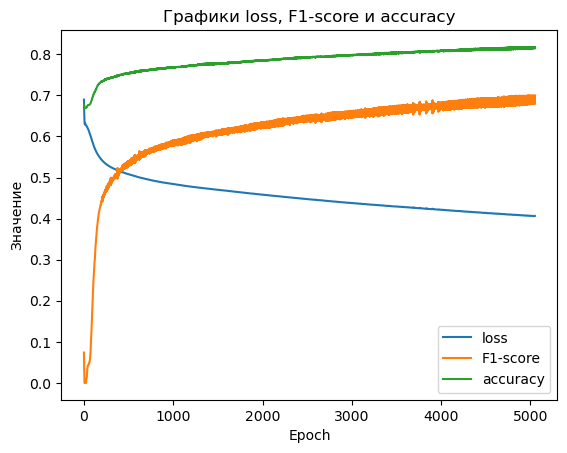

In [34]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf1['Epoch'], diagdf1['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf1['Epoch'], diagdf1['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf1['Epoch'], diagdf1['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [35]:
pred_test2=Mk2.forward(x_test.float())
pred_test_binarized2 = (pred_test2 > 0.5).float()

In [36]:
print(classification_report(y_test.to('cpu'), pred_test_binarized2.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.75      0.93      0.83      3226
         1.0       0.70      0.37      0.48      1537

    accuracy                           0.75      4763
   macro avg       0.73      0.65      0.66      4763
weighted avg       0.74      0.75      0.72      4763



In [37]:
#----------------------------------------------

<font color='red'>Word2Vec_MLP_Experiment_#3</font>

<font color='red'>layers + 1, epochs: 5050 -> 2000, hidden_size: 300 -> 150, lr: 0.001</font>

In [38]:
#----------------------------------------------

In [39]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK3(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK3, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
        self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
        self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
        out = self.fc3(out)
        out = self.tanh(out)
        return out

In [40]:
Mk3=MLP_MK3(100,150,1) #изменить название переменной

In [41]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [42]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [43]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [44]:
Mk3=Mk3.to(dev)

In [45]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk3.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf2=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(2000):
    optimizer.zero_grad()
    pred = Mk3.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf2 = pd.concat([diagdf2, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.7098439335823059   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2 , Loss:  0.6928103566169739   f1-score: 0.17391304671764374   accuracy: 0.6580273509025574
Epoch:  3 , Loss:  0.6778739094734192   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4 , Loss:  0.6652818322181702   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5 , Loss:  0.6551328897476196   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6 , Loss:  0.6473596096038818   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7 , Loss:  0.6417423486709595   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8 , Loss:  0.6379541754722595   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9 , Loss:  0.6356115937232971   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10 , Loss:  0.6343227028846741   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11 , Loss:  0.6337542533874512   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12 , Loss:  0.6336462497711182   f1-sco

Epoch:  101 , Loss:  0.6039732098579407   f1-score: 0.1697702556848526   accuracy: 0.6910547018051147
Epoch:  102 , Loss:  0.6031888127326965   f1-score: 0.17591924965381622   accuracy: 0.6914147138595581
Epoch:  103 , Loss:  0.6024103760719299   f1-score: 0.18411637842655182   accuracy: 0.6921346187591553
Epoch:  104 , Loss:  0.6016389727592468   f1-score: 0.19592995941638947   accuracy: 0.6942044496536255
Epoch:  105 , Loss:  0.6008779406547546   f1-score: 0.21079692244529724   accuracy: 0.6960943341255188
Epoch:  106 , Loss:  0.600125253200531   f1-score: 0.21866294741630554   accuracy: 0.6970842480659485
Epoch:  107 , Loss:  0.5993832945823669   f1-score: 0.22432494163513184   accuracy: 0.6975342035293579
Epoch:  108 , Loss:  0.5986515283584595   f1-score: 0.2308398336172104   accuracy: 0.6983441114425659
Epoch:  109 , Loss:  0.5979292988777161   f1-score: 0.24216265976428986   accuracy: 0.6997840404510498
Epoch:  110 , Loss:  0.5972198843955994   f1-score: 0.25202521681785583   ac

Epoch:  199 , Loss:  0.5646848678588867   f1-score: 0.4772888720035553   accuracy: 0.7348812222480774
Epoch:  200 , Loss:  0.5645148754119873   f1-score: 0.46950891613960266   accuracy: 0.7346112132072449
Epoch:  201 , Loss:  0.5643543004989624   f1-score: 0.4724014401435852   accuracy: 0.7350611686706543
Epoch:  202 , Loss:  0.5642197132110596   f1-score: 0.47883832454681396   accuracy: 0.7351511716842651
Epoch:  203 , Loss:  0.5640590786933899   f1-score: 0.47166427969932556   accuracy: 0.7348812222480774
Epoch:  204 , Loss:  0.5639027953147888   f1-score: 0.4739099442958832   accuracy: 0.7350611686706543
Epoch:  205 , Loss:  0.5637692809104919   f1-score: 0.4807216227054596   accuracy: 0.7357811331748962
Epoch:  206 , Loss:  0.5636178851127625   f1-score: 0.4734956920146942   accuracy: 0.7354211807250977
Epoch:  207 , Loss:  0.5634639859199524   f1-score: 0.47703808546066284   accuracy: 0.7356011271476746
Epoch:  208 , Loss:  0.5633315443992615   f1-score: 0.48100370168685913   accu

Epoch:  298 , Loss:  0.5542348623275757   f1-score: 0.5148921608924866   accuracy: 0.7449604272842407
Epoch:  299 , Loss:  0.5541704893112183   f1-score: 0.5081343054771423   accuracy: 0.7442404627799988
Epoch:  300 , Loss:  0.5541088581085205   f1-score: 0.5191619992256165   accuracy: 0.7459503412246704
Epoch:  301 , Loss:  0.5540547370910645   f1-score: 0.5066898465156555   accuracy: 0.7445104122161865
Epoch:  302 , Loss:  0.5540017485618591   f1-score: 0.5235194563865662   accuracy: 0.7465803027153015
Epoch:  303 , Loss:  0.5539599061012268   f1-score: 0.5056709051132202   accuracy: 0.7450503706932068
Epoch:  304 , Loss:  0.553898274898529   f1-score: 0.5269178748130798   accuracy: 0.7469402551651001
Epoch:  305 , Loss:  0.5538287162780762   f1-score: 0.5056709051132202   accuracy: 0.7450503706932068
Epoch:  306 , Loss:  0.553718090057373   f1-score: 0.5254610180854797   accuracy: 0.7475702166557312
Epoch:  307 , Loss:  0.5536171793937683   f1-score: 0.5124052166938782   accuracy: 0

Epoch:  396 , Loss:  0.549021303653717   f1-score: 0.5351733565330505   accuracy: 0.7514398694038391
Epoch:  397 , Loss:  0.5489915013313293   f1-score: 0.5448824167251587   accuracy: 0.7526997923851013
Epoch:  398 , Loss:  0.5489624738693237   f1-score: 0.53340083360672   accuracy: 0.7510799169540405
Epoch:  399 , Loss:  0.5489242076873779   f1-score: 0.5454245209693909   accuracy: 0.7523398399353027
Epoch:  400 , Loss:  0.5488855838775635   f1-score: 0.533558189868927   accuracy: 0.7510799169540405
Epoch:  401 , Loss:  0.5488377809524536   f1-score: 0.5451239943504333   accuracy: 0.7523398399353027
Epoch:  402 , Loss:  0.5487906336784363   f1-score: 0.5361587405204773   accuracy: 0.7517998814582825
Epoch:  403 , Loss:  0.5487406849861145   f1-score: 0.544278621673584   accuracy: 0.7526997923851013
Epoch:  404 , Loss:  0.5486937165260315   f1-score: 0.5390926003456116   accuracy: 0.7522498369216919
Epoch:  405 , Loss:  0.548650324344635   f1-score: 0.5428809523582458   accuracy: 0.752

Epoch:  491 , Loss:  0.5460016131401062   f1-score: 0.5562591552734375   accuracy: 0.7540496587753296
Epoch:  492 , Loss:  0.5459629893302917   f1-score: 0.5473579168319702   accuracy: 0.7548596262931824
Epoch:  493 , Loss:  0.5459074974060059   f1-score: 0.5545395016670227   accuracy: 0.754499614238739
Epoch:  494 , Loss:  0.5458694100379944   f1-score: 0.5534219741821289   accuracy: 0.7551295757293701
Epoch:  495 , Loss:  0.5458551645278931   f1-score: 0.5497192144393921   accuracy: 0.7546796202659607
Epoch:  496 , Loss:  0.5458461046218872   f1-score: 0.5558450222015381   accuracy: 0.754499614238739
Epoch:  497 , Loss:  0.5458256006240845   f1-score: 0.548681378364563   accuracy: 0.7551295757293701
Epoch:  498 , Loss:  0.545785129070282   f1-score: 0.5554468631744385   accuracy: 0.7546796202659607
Epoch:  499 , Loss:  0.545743465423584   f1-score: 0.5515081882476807   accuracy: 0.7551295757293701
Epoch:  500 , Loss:  0.5457108020782471   f1-score: 0.5535128116607666   accuracy: 0.75

Epoch:  584 , Loss:  0.5436344742774963   f1-score: 0.5564901828765869   accuracy: 0.7580093741416931
Epoch:  585 , Loss:  0.5435920357704163   f1-score: 0.5624094009399414   accuracy: 0.7554895877838135
Epoch:  586 , Loss:  0.5435541272163391   f1-score: 0.5565417408943176   accuracy: 0.7571994066238403
Epoch:  587 , Loss:  0.5435158014297485   f1-score: 0.5609322190284729   accuracy: 0.7558495402336121
Epoch:  588 , Loss:  0.5434829592704773   f1-score: 0.5579875707626343   accuracy: 0.7564795017242432
Epoch:  589 , Loss:  0.5434537529945374   f1-score: 0.55954509973526   accuracy: 0.7560295462608337
Epoch:  590 , Loss:  0.5434287786483765   f1-score: 0.5593358278274536   accuracy: 0.7563894987106323
Epoch:  591 , Loss:  0.5434069037437439   f1-score: 0.5584733486175537   accuracy: 0.7563894987106323
Epoch:  592 , Loss:  0.5433871746063232   f1-score: 0.5604413151741028   accuracy: 0.7562094926834106
Epoch:  593 , Loss:  0.5433701872825623   f1-score: 0.557736337184906   accuracy: 0.

Epoch:  678 , Loss:  0.5413912534713745   f1-score: 0.5687690377235413   accuracy: 0.75818932056427
Epoch:  679 , Loss:  0.5413762927055359   f1-score: 0.5640025734901428   accuracy: 0.7584593296051025
Epoch:  680 , Loss:  0.5413611531257629   f1-score: 0.5704687237739563   accuracy: 0.7583693265914917
Epoch:  681 , Loss:  0.5413470268249512   f1-score: 0.5626831650733948   accuracy: 0.7582793235778809
Epoch:  682 , Loss:  0.5413295030593872   f1-score: 0.571154773235321   accuracy: 0.7583693265914917
Epoch:  683 , Loss:  0.5413122177124023   f1-score: 0.5621128082275391   accuracy: 0.7582793235778809
Epoch:  684 , Loss:  0.5412893891334534   f1-score: 0.5713374018669128   accuracy: 0.7582793235778809
Epoch:  685 , Loss:  0.541269838809967   f1-score: 0.5622044801712036   accuracy: 0.7583693265914917
Epoch:  686 , Loss:  0.5412464141845703   f1-score: 0.5712004899978638   accuracy: 0.7582793235778809
Epoch:  687 , Loss:  0.5412250757217407   f1-score: 0.5624388456344604   accuracy: 0.7

Epoch:  765 , Loss:  0.5395984649658203   f1-score: 0.5665906667709351   accuracy: 0.7604391574859619
Epoch:  766 , Loss:  0.5395601987838745   f1-score: 0.5816117525100708   accuracy: 0.7612491250038147
Epoch:  767 , Loss:  0.5395268797874451   f1-score: 0.5688311457633972   accuracy: 0.7609791159629822
Epoch:  768 , Loss:  0.5394881963729858   f1-score: 0.5797147154808044   accuracy: 0.7613390684127808
Epoch:  769 , Loss:  0.5394556522369385   f1-score: 0.572719931602478   accuracy: 0.761789083480835
Epoch:  770 , Loss:  0.5394248366355896   f1-score: 0.5780603885650635   accuracy: 0.7611591219902039
Epoch:  771 , Loss:  0.5393974781036377   f1-score: 0.5751928091049194   accuracy: 0.7620590329170227
Epoch:  772 , Loss:  0.539372980594635   f1-score: 0.5767635107040405   accuracy: 0.7613390684127808
Epoch:  773 , Loss:  0.5393500328063965   f1-score: 0.575825572013855   accuracy: 0.761879026889801
Epoch:  774 , Loss:  0.5393279194831848   f1-score: 0.5770460367202759   accuracy: 0.76

Epoch:  853 , Loss:  0.5377582311630249   f1-score: 0.5840455889701843   accuracy: 0.7634989023208618
Epoch:  854 , Loss:  0.5377393960952759   f1-score: 0.5805524587631226   accuracy: 0.7635889053344727
Epoch:  855 , Loss:  0.5377209186553955   f1-score: 0.5843478441238403   accuracy: 0.763408899307251
Epoch:  856 , Loss:  0.5377028584480286   f1-score: 0.5802429914474487   accuracy: 0.7636789083480835
Epoch:  857 , Loss:  0.5376843810081482   f1-score: 0.5851500630378723   accuracy: 0.7636789083480835
Epoch:  858 , Loss:  0.5376671552658081   f1-score: 0.5802528262138367   accuracy: 0.7639488577842712
Epoch:  859 , Loss:  0.5376500487327576   f1-score: 0.5861579775810242   accuracy: 0.7637689113616943
Epoch:  860 , Loss:  0.5376355648040771   f1-score: 0.5792595148086548   accuracy: 0.7637689113616943
Epoch:  861 , Loss:  0.537621259689331   f1-score: 0.5876985788345337   accuracy: 0.7641288638114929
Epoch:  862 , Loss:  0.537611722946167   f1-score: 0.5785840153694153   accuracy: 0.

Epoch:  942 , Loss:  0.5360100865364075   f1-score: 0.5882725119590759   accuracy: 0.765568733215332
Epoch:  943 , Loss:  0.5359978675842285   f1-score: 0.5864207148551941   accuracy: 0.7659287452697754
Epoch:  944 , Loss:  0.5359914302825928   f1-score: 0.5907875895500183   accuracy: 0.7657487392425537
Epoch:  945 , Loss:  0.535993218421936   f1-score: 0.5843989849090576   accuracy: 0.7660187482833862
Epoch:  946 , Loss:  0.5359970927238464   f1-score: 0.5954722762107849   accuracy: 0.7668286561965942
Epoch:  947 , Loss:  0.5360094308853149   f1-score: 0.5829048752784729   accuracy: 0.7663787007331848
Epoch:  948 , Loss:  0.5360087156295776   f1-score: 0.5980437994003296   accuracy: 0.7670086622238159
Epoch:  949 , Loss:  0.5360182523727417   f1-score: 0.5813316106796265   accuracy: 0.766288697719574
Epoch:  950 , Loss:  0.5359967947006226   f1-score: 0.5983250737190247   accuracy: 0.7669186592102051
Epoch:  951 , Loss:  0.5359877943992615   f1-score: 0.5816540122032166   accuracy: 0.

Epoch:  1036 , Loss:  0.5342510938644409   f1-score: 0.5912767648696899   accuracy: 0.7680885791778564
Epoch:  1037 , Loss:  0.5342154502868652   f1-score: 0.5969915390014648   accuracy: 0.7685385346412659
Epoch:  1038 , Loss:  0.5341887474060059   f1-score: 0.5966624617576599   accuracy: 0.7694384455680847
Epoch:  1039 , Loss:  0.5341700911521912   f1-score: 0.5967894196510315   accuracy: 0.7694384455680847
Epoch:  1040 , Loss:  0.5341556668281555   f1-score: 0.5970523953437805   accuracy: 0.7687184810638428
Epoch:  1041 , Loss:  0.5341465473175049   f1-score: 0.5941157937049866   accuracy: 0.7690784931182861
Epoch:  1042 , Loss:  0.5341401696205139   f1-score: 0.5993129014968872   accuracy: 0.7690784931182861
Epoch:  1043 , Loss:  0.534137487411499   f1-score: 0.5912988185882568   accuracy: 0.7683585286140442
Epoch:  1044 , Loss:  0.5341312289237976   f1-score: 0.6016184091567993   accuracy: 0.7696184515953064
Epoch:  1045 , Loss:  0.5341285467147827   f1-score: 0.5893226861953735   

Epoch:  1117 , Loss:  0.5327845215797424   f1-score: 0.5977157354354858   accuracy: 0.7717782855033875
Epoch:  1118 , Loss:  0.5327635407447815   f1-score: 0.60447758436203   accuracy: 0.7710583209991455
Epoch:  1119 , Loss:  0.5327425599098206   f1-score: 0.5972420573234558   accuracy: 0.7713282704353333
Epoch:  1120 , Loss:  0.5327162146568298   f1-score: 0.6043254733085632   accuracy: 0.7711483240127563
Epoch:  1121 , Loss:  0.5326901078224182   f1-score: 0.5980392098426819   accuracy: 0.7712383270263672
Epoch:  1122 , Loss:  0.5326633453369141   f1-score: 0.6028723120689392   accuracy: 0.7710583209991455
Epoch:  1123 , Loss:  0.5326392650604248   f1-score: 0.600063145160675   accuracy: 0.7719582319259644
Epoch:  1124 , Loss:  0.532616376876831   f1-score: 0.6021270155906677   accuracy: 0.7710583209991455
Epoch:  1125 , Loss:  0.532595157623291   f1-score: 0.6012886762619019   accuracy: 0.7716882824897766
Epoch:  1126 , Loss:  0.532575249671936   f1-score: 0.6019752025604248   accur

Epoch:  1206 , Loss:  0.5311350226402283   f1-score: 0.6104578971862793   accuracy: 0.7733981013298035
Epoch:  1207 , Loss:  0.5311270356178284   f1-score: 0.6005396246910095   accuracy: 0.7734881043434143
Epoch:  1208 , Loss:  0.5311137437820435   f1-score: 0.610467791557312   accuracy: 0.772948145866394
Epoch:  1209 , Loss:  0.5311102271080017   f1-score: 0.5998092889785767   accuracy: 0.7733981013298035
Epoch:  1210 , Loss:  0.5311020016670227   f1-score: 0.6109998226165771   accuracy: 0.7727681994438171
Epoch:  1211 , Loss:  0.5311065912246704   f1-score: 0.597800076007843   accuracy: 0.772948145866394
Epoch:  1212 , Loss:  0.5310963988304138   f1-score: 0.6122386455535889   accuracy: 0.7730381488800049
Epoch:  1213 , Loss:  0.5311043858528137   f1-score: 0.5965136885643005   accuracy: 0.772948145866394
Epoch:  1214 , Loss:  0.5310900807380676   f1-score: 0.612288773059845   accuracy: 0.7728581428527832
Epoch:  1215 , Loss:  0.5310941934585571   f1-score: 0.5956765413284302   accur

Epoch:  1289 , Loss:  0.5295327305793762   f1-score: 0.6099357604980469   accuracy: 0.776007890701294
Epoch:  1290 , Loss:  0.5295183062553406   f1-score: 0.612868070602417   accuracy: 0.7763679027557373
Epoch:  1291 , Loss:  0.5295032262802124   f1-score: 0.609446108341217   accuracy: 0.776007890701294
Epoch:  1292 , Loss:  0.5294884443283081   f1-score: 0.6128228902816772   accuracy: 0.7760978937149048
Epoch:  1293 , Loss:  0.5294716358184814   f1-score: 0.6093921661376953   accuracy: 0.7761878967285156
Epoch:  1294 , Loss:  0.5294537544250488   f1-score: 0.6125116944313049   accuracy: 0.7759179472923279
Epoch:  1295 , Loss:  0.5294354557991028   f1-score: 0.6097062826156616   accuracy: 0.7763679027557373
Epoch:  1296 , Loss:  0.5294162034988403   f1-score: 0.6123910546302795   accuracy: 0.7759179472923279
Epoch:  1297 , Loss:  0.5293967127799988   f1-score: 0.6099780201911926   accuracy: 0.7762778997421265
Epoch:  1298 , Loss:  0.5293778777122498   f1-score: 0.6124356985092163   acc

Epoch:  1391 , Loss:  0.5278830528259277   f1-score: 0.6092610359191895   accuracy: 0.7782577276229858
Epoch:  1392 , Loss:  0.5279009342193604   f1-score: 0.6212400197982788   accuracy: 0.7778977751731873
Epoch:  1393 , Loss:  0.5279442667961121   f1-score: 0.6061474680900574   accuracy: 0.7774478197097778
Epoch:  1394 , Loss:  0.5279511213302612   f1-score: 0.6220592856407166   accuracy: 0.777357816696167
Epoch:  1395 , Loss:  0.527984082698822   f1-score: 0.6045026183128357   accuracy: 0.7770878076553345
Epoch:  1396 , Loss:  0.527946412563324   f1-score: 0.6231109499931335   accuracy: 0.7778077721595764
Epoch:  1397 , Loss:  0.5279327630996704   f1-score: 0.6050742268562317   accuracy: 0.7772678136825562
Epoch:  1398 , Loss:  0.5278471112251282   f1-score: 0.6222493648529053   accuracy: 0.7775378227233887
Epoch:  1399 , Loss:  0.5277805924415588   f1-score: 0.6086680293083191   accuracy: 0.778167724609375
Epoch:  1400 , Loss:  0.5276922583580017   f1-score: 0.6204559206962585   acc

Epoch:  1475 , Loss:  0.5264151692390442   f1-score: 0.6238278150558472   accuracy: 0.7797876000404358
Epoch:  1476 , Loss:  0.5264780521392822   f1-score: 0.6132614016532898   accuracy: 0.7805975675582886
Epoch:  1477 , Loss:  0.5264917612075806   f1-score: 0.6252866387367249   accuracy: 0.7794276475906372
Epoch:  1478 , Loss:  0.5264943242073059   f1-score: 0.6124006509780884   accuracy: 0.7805975675582886
Epoch:  1479 , Loss:  0.5264249444007874   f1-score: 0.6246172785758972   accuracy: 0.7793376445770264
Epoch:  1480 , Loss:  0.5263546109199524   f1-score: 0.6140711307525635   accuracy: 0.780327558517456
Epoch:  1481 , Loss:  0.5262617468833923   f1-score: 0.623304545879364   accuracy: 0.7800576090812683
Epoch:  1482 , Loss:  0.5261912941932678   f1-score: 0.6169512867927551   accuracy: 0.7799676060676575
Epoch:  1483 , Loss:  0.526146650314331   f1-score: 0.6205717921257019   accuracy: 0.7802375555038452
Epoch:  1484 , Loss:  0.5261281132698059   f1-score: 0.6192846298217773   ac

Epoch:  1560 , Loss:  0.5250934362411499   f1-score: 0.6293919682502747   accuracy: 0.7816774845123291
Epoch:  1561 , Loss:  0.5250552296638489   f1-score: 0.6159936785697937   accuracy: 0.7817674875259399
Epoch:  1562 , Loss:  0.524972140789032   f1-score: 0.6278713345527649   accuracy: 0.7813174724578857
Epoch:  1563 , Loss:  0.5249020457267761   f1-score: 0.6176100373268127   accuracy: 0.7811375260353088
Epoch:  1564 , Loss:  0.5248314142227173   f1-score: 0.6253660321235657   accuracy: 0.7812275290489197
Epoch:  1565 , Loss:  0.5247849822044373   f1-score: 0.6211625337600708   accuracy: 0.7812275290489197
Epoch:  1566 , Loss:  0.5247626900672913   f1-score: 0.6224156618118286   accuracy: 0.7814074754714966
Epoch:  1567 , Loss:  0.5247582793235779   f1-score: 0.6245364546775818   accuracy: 0.7813174724578857
Epoch:  1568 , Loss:  0.5247696042060852   f1-score: 0.6194801330566406   accuracy: 0.7813174724578857
Epoch:  1569 , Loss:  0.5247849822044373   f1-score: 0.6263060569763184   

Epoch:  1642 , Loss:  0.523436427116394   f1-score: 0.6279105544090271   accuracy: 0.7828473448753357
Epoch:  1643 , Loss:  0.5234180688858032   f1-score: 0.6230577826499939   accuracy: 0.7816774845123291
Epoch:  1644 , Loss:  0.5234013795852661   f1-score: 0.6278137564659119   accuracy: 0.7827574014663696
Epoch:  1645 , Loss:  0.5233840346336365   f1-score: 0.6232514977455139   accuracy: 0.781857430934906
Epoch:  1646 , Loss:  0.523369550704956   f1-score: 0.6283513307571411   accuracy: 0.7829373478889465
Epoch:  1647 , Loss:  0.523356556892395   f1-score: 0.6236960887908936   accuracy: 0.7824873924255371
Epoch:  1648 , Loss:  0.5233441591262817   f1-score: 0.6285802125930786   accuracy: 0.7829373478889465
Epoch:  1649 , Loss:  0.523337185382843   f1-score: 0.6230480670928955   accuracy: 0.7827574014663696
Epoch:  1650 , Loss:  0.5233374834060669   f1-score: 0.6300737857818604   accuracy: 0.7834773063659668
Epoch:  1651 , Loss:  0.5233510136604309   f1-score: 0.6219435930252075   accu

Epoch:  1723 , Loss:  0.5230419039726257   f1-score: 0.6425582766532898   accuracy: 0.784737229347229
Epoch:  1724 , Loss:  0.522986888885498   f1-score: 0.6156799793243408   accuracy: 0.7838373184204102
Epoch:  1725 , Loss:  0.5226784944534302   f1-score: 0.6413273215293884   accuracy: 0.7859970927238464
Epoch:  1726 , Loss:  0.5224339365959167   f1-score: 0.621059238910675   accuracy: 0.7836573123931885
Epoch:  1727 , Loss:  0.5222394466400146   f1-score: 0.6310127377510071   accuracy: 0.7839272618293762
Epoch:  1728 , Loss:  0.5221770405769348   f1-score: 0.6287925839424133   accuracy: 0.7841972708702087
Epoch:  1729 , Loss:  0.5222201347351074   f1-score: 0.6259565949440002   accuracy: 0.7844672203063965
Epoch:  1730 , Loss:  0.5223193764686584   f1-score: 0.6360585689544678   accuracy: 0.7852771878242493
Epoch:  1731 , Loss:  0.5224539041519165   f1-score: 0.6210276484489441   accuracy: 0.7842872738838196
Epoch:  1732 , Loss:  0.5225141644477844   f1-score: 0.6401572227478027   ac

Epoch:  1811 , Loss:  0.5212180614471436   f1-score: 0.6410608291625977   accuracy: 0.7880669832229614
Epoch:  1812 , Loss:  0.5211568474769592   f1-score: 0.6282051205635071   accuracy: 0.7859970927238464
Epoch:  1813 , Loss:  0.52109295129776   f1-score: 0.6341838240623474   accuracy: 0.7858171463012695
Epoch:  1814 , Loss:  0.5210474133491516   f1-score: 0.6303538084030151   accuracy: 0.7856371402740479
Epoch:  1815 , Loss:  0.5210267305374146   f1-score: 0.6307477951049805   accuracy: 0.7853671908378601
Epoch:  1816 , Loss:  0.5210253596305847   f1-score: 0.6325523853302002   accuracy: 0.7854571342468262
Epoch:  1817 , Loss:  0.5210368633270264   f1-score: 0.6295950412750244   accuracy: 0.7859970927238464
Epoch:  1818 , Loss:  0.5210480093955994   f1-score: 0.6369211673736572   accuracy: 0.7868970632553101
Epoch:  1819 , Loss:  0.5210549831390381   f1-score: 0.6290624737739563   accuracy: 0.7863571047782898
Epoch:  1820 , Loss:  0.5210478901863098   f1-score: 0.6376855969429016   a

Epoch:  1898 , Loss:  0.5200105905532837   f1-score: 0.6397668123245239   accuracy: 0.7886968851089478
Epoch:  1899 , Loss:  0.5199691653251648   f1-score: 0.6335557699203491   accuracy: 0.7875270247459412
Epoch:  1900 , Loss:  0.51994389295578   f1-score: 0.6352541446685791   accuracy: 0.7875270247459412
Epoch:  1901 , Loss:  0.5199291706085205   f1-score: 0.634930431842804   accuracy: 0.7874370217323303
Epoch:  1902 , Loss:  0.5199271440505981   f1-score: 0.6338814496994019   accuracy: 0.7876169681549072
Epoch:  1903 , Loss:  0.5199310779571533   f1-score: 0.6374403834342957   accuracy: 0.7878869771957397
Epoch:  1904 , Loss:  0.5199410915374756   f1-score: 0.6317594051361084   accuracy: 0.7873470187187195
Epoch:  1905 , Loss:  0.5199585556983948   f1-score: 0.6403549313545227   accuracy: 0.78842693567276
Epoch:  1906 , Loss:  0.5199860334396362   f1-score: 0.6308872103691101   accuracy: 0.7877069711685181
Epoch:  1907 , Loss:  0.5200110673904419   f1-score: 0.642313539981842   accur

Epoch:  2000 , Loss:  0.5188866257667542   f1-score: 0.6341233849525452   accuracy: 0.7902267575263977


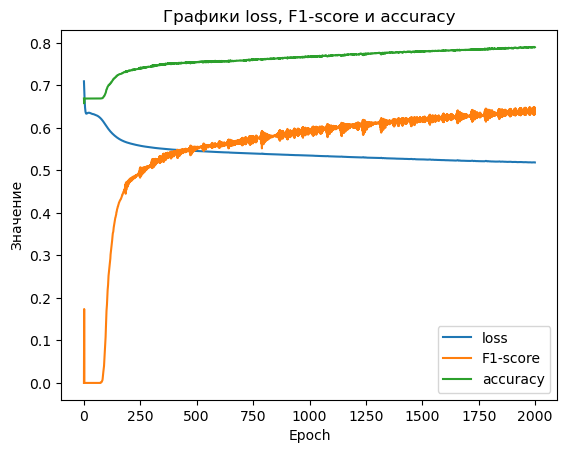

In [46]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf2['Epoch'], diagdf2['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf2['Epoch'], diagdf2['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf2['Epoch'], diagdf2['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [47]:
pred_test3=Mk3.forward(x_test.float())
pred_test_binarized3 = (pred_test3 > 0.5).float()

In [48]:
print(classification_report(y_test.to('cpu'), pred_test_binarized3.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.77      0.91      0.83      3226
         1.0       0.69      0.43      0.53      1537

    accuracy                           0.75      4763
   macro avg       0.73      0.67      0.68      4763
weighted avg       0.74      0.75      0.73      4763



In [49]:
#----------------------------------------------

<font color='red'>Word2Vec_MLP_Experiment_#4</font>

<font color='red'>epochs: 2000 -> 5000, lr: 0.001 -> 0.0001</font>

In [50]:
#----------------------------------------------

In [51]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK4(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK4, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
        self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
        self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
        out = self.fc3(out)
        out = self.tanh(out)
        return out

In [52]:
Mk4=MLP_MK4(100,150,1) #изменить название переменной

In [53]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [54]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [55]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [56]:
Mk4=Mk4.to(dev)

In [57]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk4.parameters(), lr=0.0001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf3=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(5000):
    optimizer.zero_grad()
    pred = Mk4.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf3 = pd.concat([diagdf3, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.7097520232200623   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2 , Loss:  0.7079817056655884   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3 , Loss:  0.706230103969574   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4 , Loss:  0.7044975757598877   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5 , Loss:  0.7027848958969116   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6 , Loss:  0.7010923027992249   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7 , Loss:  0.6994203329086304   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8 , Loss:  0.6977694630622864   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9 , Loss:  0.6961399912834167   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10 , Loss:  0.6945324540138245   f1-score: 0.49695658683776855   accuracy: 0.3306335508823395
Epoch:  11 , Loss:  0.6929468512535095   f1-score: 0.3325788378715515   accuracy: 0.6019618511199951
Epoch:  12 , Loss:  0.69138348102

Epoch:  104 , Loss:  0.634427547454834   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  105 , Loss:  0.6343443989753723   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  106 , Loss:  0.6342645287513733   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  107 , Loss:  0.6341876983642578   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  108 , Loss:  0.6341138482093811   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  109 , Loss:  0.6340429186820984   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  110 , Loss:  0.6339748501777649   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  111 , Loss:  0.6339093446731567   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  112 , Loss:  0.6338464021682739   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  113 , Loss:  0.633785605430603   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  114 , Loss:  0.6337270140647888   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  115 , Loss:  0.6336702108383179   f1-

Epoch:  220 , Loss:  0.6308371424674988   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  221 , Loss:  0.6308113932609558   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  222 , Loss:  0.6307855248451233   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  223 , Loss:  0.6307595372200012   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  224 , Loss:  0.6307333111763   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  225 , Loss:  0.6307069659233093   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  226 , Loss:  0.6306804418563843   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  227 , Loss:  0.6306538581848145   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  228 , Loss:  0.6306270956993103   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  229 , Loss:  0.630600094795227   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  230 , Loss:  0.6305729746818542   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  231 , Loss:  0.6305457353591919   f1-sc

Epoch:  330 , Loss:  0.6269237399101257   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  331 , Loss:  0.6268768906593323   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  332 , Loss:  0.6268297433853149   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  333 , Loss:  0.6267824172973633   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  334 , Loss:  0.6267349123954773   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  335 , Loss:  0.6266871094703674   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  336 , Loss:  0.626639187335968   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  337 , Loss:  0.6265909671783447   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  338 , Loss:  0.6265425682067871   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  339 , Loss:  0.6264939308166504   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  340 , Loss:  0.6264451146125793   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  341 , Loss:  0.626396119594574   f1-

Epoch:  444 , Loss:  0.6201909184455872   f1-score: 0.003797125071287155   accuracy: 0.669456422328949
Epoch:  445 , Loss:  0.6201199889183044   f1-score: 0.003797125071287155   accuracy: 0.669456422328949
Epoch:  446 , Loss:  0.6200488805770874   f1-score: 0.004879371263086796   accuracy: 0.6696364283561707
Epoch:  447 , Loss:  0.619977593421936   f1-score: 0.004879371263086796   accuracy: 0.6696364283561707
Epoch:  448 , Loss:  0.6199061870574951   f1-score: 0.004879371263086796   accuracy: 0.6696364283561707
Epoch:  449 , Loss:  0.6198345422744751   f1-score: 0.004879371263086796   accuracy: 0.6696364283561707
Epoch:  450 , Loss:  0.6197627186775208   f1-score: 0.00542005430907011   accuracy: 0.6697264313697815
Epoch:  451 , Loss:  0.6196907162666321   f1-score: 0.00542005430907011   accuracy: 0.6697264313697815
Epoch:  452 , Loss:  0.6196184754371643   f1-score: 0.00542005430907011   accuracy: 0.6697264313697815
Epoch:  453 , Loss:  0.6195461750030518   f1-score: 0.0059604444541037

Epoch:  524 , Loss:  0.6140114665031433   f1-score: 0.057413749396800995   accuracy: 0.6779157519340515
Epoch:  525 , Loss:  0.6139290928840637   f1-score: 0.06654440611600876   accuracy: 0.6793556809425354
Epoch:  526 , Loss:  0.6138466596603394   f1-score: 0.06703325361013412   accuracy: 0.6793556809425354
Epoch:  527 , Loss:  0.6137641668319702   f1-score: 0.0675392672419548   accuracy: 0.6794456243515015
Epoch:  528 , Loss:  0.6136816143989563   f1-score: 0.07107394933700562   accuracy: 0.6800755858421326
Epoch:  529 , Loss:  0.6135989427566528   f1-score: 0.07157784700393677   accuracy: 0.6801655888557434
Epoch:  530 , Loss:  0.6135162115097046   f1-score: 0.07308796793222427   accuracy: 0.6804355382919312
Epoch:  531 , Loss:  0.6134333610534668   f1-score: 0.07459571957588196   accuracy: 0.6807055473327637
Epoch:  532 , Loss:  0.6133504509925842   f1-score: 0.07509778439998627   accuracy: 0.6807955503463745
Epoch:  533 , Loss:  0.6132674813270569   f1-score: 0.07710341364145279  

Epoch:  610 , Loss:  0.6067983508110046   f1-score: 0.13725979626178741   accuracy: 0.6888948678970337
Epoch:  611 , Loss:  0.6067149043083191   f1-score: 0.13848069310188293   accuracy: 0.6887149214744568
Epoch:  612 , Loss:  0.6066314578056335   f1-score: 0.1398009955883026   accuracy: 0.6888049244880676
Epoch:  613 , Loss:  0.6065480709075928   f1-score: 0.1402636170387268   accuracy: 0.6888948678970337
Epoch:  614 , Loss:  0.6064647436141968   f1-score: 0.14069102704524994   accuracy: 0.6888948678970337
Epoch:  615 , Loss:  0.6063814759254456   f1-score: 0.14065606892108917   accuracy: 0.6888049244880676
Epoch:  616 , Loss:  0.6062982678413391   f1-score: 0.14111801981925964   accuracy: 0.6888948678970337
Epoch:  617 , Loss:  0.6062150597572327   f1-score: 0.141579732298851   accuracy: 0.6889848709106445
Epoch:  618 , Loss:  0.606131911277771   f1-score: 0.1419707089662552   accuracy: 0.6888948678970337
Epoch:  619 , Loss:  0.6060488820075989   f1-score: 0.14239642024040222   accur

Epoch:  693 , Loss:  0.6001219153404236   f1-score: 0.20837253332138062   accuracy: 0.6970842480659485
Epoch:  694 , Loss:  0.6000454425811768   f1-score: 0.20921485126018524   accuracy: 0.6972641944885254
Epoch:  695 , Loss:  0.599969208240509   f1-score: 0.2104768604040146   accuracy: 0.6975342035293579
Epoch:  696 , Loss:  0.5998929738998413   f1-score: 0.21089713275432587   accuracy: 0.6976242065429688
Epoch:  697 , Loss:  0.5998168587684631   f1-score: 0.2115880846977234   accuracy: 0.6975342035293579
Epoch:  698 , Loss:  0.5997408628463745   f1-score: 0.21242672204971313   accuracy: 0.6977142095565796
Epoch:  699 , Loss:  0.5996650457382202   f1-score: 0.21368321776390076   accuracy: 0.6979841589927673
Epoch:  700 , Loss:  0.5995892882347107   f1-score: 0.2143191397190094   accuracy: 0.6978041529655457
Epoch:  701 , Loss:  0.599513590335846   f1-score: 0.21515434980392456   accuracy: 0.6979841589927673
Epoch:  702 , Loss:  0.5994380712509155   f1-score: 0.21557165682315826   accu

Epoch:  794 , Loss:  0.5929896235466003   f1-score: 0.2742578685283661   accuracy: 0.7051835656166077
Epoch:  795 , Loss:  0.592924952507019   f1-score: 0.27419713139533997   accuracy: 0.7050936222076416
Epoch:  796 , Loss:  0.5928603410720825   f1-score: 0.2745184898376465   accuracy: 0.7050936222076416
Epoch:  797 , Loss:  0.5927958488464355   f1-score: 0.2747787535190582   accuracy: 0.7050036191940308
Epoch:  798 , Loss:  0.5927314758300781   f1-score: 0.2747787535190582   accuracy: 0.7050036191940308
Epoch:  799 , Loss:  0.592667281627655   f1-score: 0.27592307329177856   accuracy: 0.7052735686302185
Epoch:  800 , Loss:  0.5926030874252319   f1-score: 0.2765628397464752   accuracy: 0.7052735686302185
Epoch:  801 , Loss:  0.5925391316413879   f1-score: 0.27720150351524353   accuracy: 0.7052735686302185
Epoch:  802 , Loss:  0.592475175857544   f1-score: 0.2775816321372986   accuracy: 0.7053635716438293
Epoch:  803 , Loss:  0.5924113988876343   f1-score: 0.2779003083705902   accuracy:

Epoch:  876 , Loss:  0.5880385041236877   f1-score: 0.313842236995697   accuracy: 0.7095932364463806
Epoch:  877 , Loss:  0.5879822969436646   f1-score: 0.31377550959587097   accuracy: 0.7095032334327698
Epoch:  878 , Loss:  0.5879262089729309   f1-score: 0.3144921362400055   accuracy: 0.7096832394599915
Epoch:  879 , Loss:  0.587870180606842   f1-score: 0.31478333473205566   accuracy: 0.7096832394599915
Epoch:  880 , Loss:  0.5878142714500427   f1-score: 0.31500741839408875   accuracy: 0.7095932364463806
Epoch:  881 , Loss:  0.5877585411071777   f1-score: 0.3152981102466583   accuracy: 0.7095932364463806
Epoch:  882 , Loss:  0.5877026915550232   f1-score: 0.31552162766456604   accuracy: 0.7095032334327698
Epoch:  883 , Loss:  0.5876471996307373   f1-score: 0.31610170006752014   accuracy: 0.7095032334327698
Epoch:  884 , Loss:  0.5875915884971619   f1-score: 0.31639134883880615   accuracy: 0.7095032334327698
Epoch:  885 , Loss:  0.5875361561775208   f1-score: 0.31668078899383545   accu

Epoch:  964 , Loss:  0.5834360718727112   f1-score: 0.3572886884212494   accuracy: 0.7167026400566101
Epoch:  965 , Loss:  0.583387553691864   f1-score: 0.3572886884212494   accuracy: 0.7167026400566101
Epoch:  966 , Loss:  0.5833390951156616   f1-score: 0.35762399435043335   accuracy: 0.716792643070221
Epoch:  967 , Loss:  0.5832907557487488   f1-score: 0.3578861355781555   accuracy: 0.716792643070221
Epoch:  968 , Loss:  0.5832424163818359   f1-score: 0.3576672077178955   accuracy: 0.7165226936340332
Epoch:  969 , Loss:  0.5831943154335022   f1-score: 0.35800203680992126   accuracy: 0.716612696647644
Epoch:  970 , Loss:  0.5831462144851685   f1-score: 0.3579290807247162   accuracy: 0.7165226936340332
Epoch:  971 , Loss:  0.5830981135368347   f1-score: 0.35885947942733765   accuracy: 0.7167026400566101
Epoch:  972 , Loss:  0.5830501914024353   f1-score: 0.35945451259613037   accuracy: 0.716792643070221
Epoch:  973 , Loss:  0.5830023288726807   f1-score: 0.35945451259613037   accuracy:

Epoch:  1047 , Loss:  0.5796723365783691   f1-score: 0.38297873735427856   accuracy: 0.7207523584365845
Epoch:  1048 , Loss:  0.5796300768852234   f1-score: 0.38354530930519104   accuracy: 0.7208423614501953
Epoch:  1049 , Loss:  0.5795878767967224   f1-score: 0.3837902247905731   accuracy: 0.7208423614501953
Epoch:  1050 , Loss:  0.5795458555221558   f1-score: 0.3837902247905731   accuracy: 0.7208423614501953
Epoch:  1051 , Loss:  0.5795037746429443   f1-score: 0.3840349614620209   accuracy: 0.7208423614501953
Epoch:  1052 , Loss:  0.5794618129730225   f1-score: 0.38395869731903076   accuracy: 0.7207523584365845
Epoch:  1053 , Loss:  0.5794199705123901   f1-score: 0.38460013270378113   accuracy: 0.7209323048591614
Epoch:  1054 , Loss:  0.5793781280517578   f1-score: 0.38484427332878113   accuracy: 0.7209323048591614
Epoch:  1055 , Loss:  0.5793363451957703   f1-score: 0.3850882351398468   accuracy: 0.7209323048591614
Epoch:  1056 , Loss:  0.579294741153717   f1-score: 0.38540840148925

Epoch:  1151 , Loss:  0.5756409764289856   f1-score: 0.4108422100543976   accuracy: 0.7261518836021423
Epoch:  1152 , Loss:  0.5756055116653442   f1-score: 0.4107626676559448   accuracy: 0.7260619401931763
Epoch:  1153 , Loss:  0.5755701065063477   f1-score: 0.4108422100543976   accuracy: 0.7261518836021423
Epoch:  1154 , Loss:  0.5755348205566406   f1-score: 0.4114573299884796   accuracy: 0.726331889629364
Epoch:  1155 , Loss:  0.5754995942115784   f1-score: 0.4111498296260834   accuracy: 0.7262418866157532
Epoch:  1156 , Loss:  0.5754643678665161   f1-score: 0.4113776981830597   accuracy: 0.7262418866157532
Epoch:  1157 , Loss:  0.5754292607307434   f1-score: 0.41199225187301636   accuracy: 0.7264218926429749
Epoch:  1158 , Loss:  0.5753942131996155   f1-score: 0.41229936480522156   accuracy: 0.7265118956565857
Epoch:  1159 , Loss:  0.5753592252731323   f1-score: 0.41252657771110535   accuracy: 0.7265118956565857
Epoch:  1160 , Loss:  0.5753242373466492   f1-score: 0.4125265777111053

Epoch:  1241 , Loss:  0.5726780891418457   f1-score: 0.42512810230255127   accuracy: 0.7274118065834045
Epoch:  1242 , Loss:  0.5726475715637207   f1-score: 0.42572566866874695   accuracy: 0.7275918126106262
Epoch:  1243 , Loss:  0.5726170539855957   f1-score: 0.42572566866874695   accuracy: 0.7275918126106262
Epoch:  1244 , Loss:  0.5725866556167603   f1-score: 0.4256449043750763   accuracy: 0.7275018095970154
Epoch:  1245 , Loss:  0.57255619764328   f1-score: 0.4259434938430786   accuracy: 0.7275918126106262
Epoch:  1246 , Loss:  0.5725258588790894   f1-score: 0.4259434938430786   accuracy: 0.7275918126106262
Epoch:  1247 , Loss:  0.5724955797195435   f1-score: 0.42586272954940796   accuracy: 0.7275018095970154
Epoch:  1248 , Loss:  0.5724653005599976   f1-score: 0.42586272954940796   accuracy: 0.7275018095970154
Epoch:  1249 , Loss:  0.5724350214004517   f1-score: 0.4257819950580597   accuracy: 0.7274118065834045
Epoch:  1250 , Loss:  0.5724048614501953   f1-score: 0.426378637552261

Epoch:  1329 , Loss:  0.5701571106910706   f1-score: 0.44171321392059326   accuracy: 0.7302016019821167
Epoch:  1330 , Loss:  0.5701302289962769   f1-score: 0.4420033395290375   accuracy: 0.7302916049957275
Epoch:  1331 , Loss:  0.5701034069061279   f1-score: 0.4422110617160797   accuracy: 0.7302916049957275
Epoch:  1332 , Loss:  0.5700766444206238   f1-score: 0.4421287775039673   accuracy: 0.7302016019821167
Epoch:  1333 , Loss:  0.5700498223304749   f1-score: 0.4424186050891876   accuracy: 0.7302916049957275
Epoch:  1334 , Loss:  0.5700231194496155   f1-score: 0.4425436854362488   accuracy: 0.7302016019821167
Epoch:  1335 , Loss:  0.5699964761734009   f1-score: 0.4428332448005676   accuracy: 0.7302916049957275
Epoch:  1336 , Loss:  0.5699698328971863   f1-score: 0.44341200590133667   accuracy: 0.7304715514183044
Epoch:  1337 , Loss:  0.5699431896209717   f1-score: 0.44341200590133667   accuracy: 0.7304715514183044
Epoch:  1338 , Loss:  0.5699165463447571   f1-score: 0.444072842597961

Epoch:  1416 , Loss:  0.5679436326026917   f1-score: 0.4523240923881531   accuracy: 0.7317314743995667
Epoch:  1417 , Loss:  0.5679194927215576   f1-score: 0.4526083767414093   accuracy: 0.7318214774131775
Epoch:  1418 , Loss:  0.5678954124450684   f1-score: 0.45252525806427   accuracy: 0.7317314743995667
Epoch:  1419 , Loss:  0.5678713321685791   f1-score: 0.45252525806427   accuracy: 0.7317314743995667
Epoch:  1420 , Loss:  0.5678473114967346   f1-score: 0.4528093934059143   accuracy: 0.7318214774131775
Epoch:  1421 , Loss:  0.5678232908248901   f1-score: 0.4528093934059143   accuracy: 0.7318214774131775
Epoch:  1422 , Loss:  0.5677993893623352   f1-score: 0.4528093934059143   accuracy: 0.7318214774131775
Epoch:  1423 , Loss:  0.5677754282951355   f1-score: 0.4528093934059143   accuracy: 0.7318214774131775
Epoch:  1424 , Loss:  0.5677514672279358   f1-score: 0.4528093934059143   accuracy: 0.7318214774131775
Epoch:  1425 , Loss:  0.5677275657653809   f1-score: 0.4528093934059143   acc

Epoch:  1498 , Loss:  0.5660505294799805   f1-score: 0.4606148898601532   accuracy: 0.7331713438034058
Epoch:  1499 , Loss:  0.5660284161567688   f1-score: 0.4608948826789856   accuracy: 0.7332613468170166
Epoch:  1500 , Loss:  0.5660063624382019   f1-score: 0.460811048746109   accuracy: 0.7331713438034058
Epoch:  1501 , Loss:  0.5659842491149902   f1-score: 0.4608948826789856   accuracy: 0.7332613468170166
Epoch:  1502 , Loss:  0.5659622550010681   f1-score: 0.46117475628852844   accuracy: 0.7333513498306274
Epoch:  1503 , Loss:  0.5659402012825012   f1-score: 0.46109092235565186   accuracy: 0.7332613468170166
Epoch:  1504 , Loss:  0.5659182071685791   f1-score: 0.460811048746109   accuracy: 0.7331713438034058
Epoch:  1505 , Loss:  0.5658962726593018   f1-score: 0.4607272744178772   accuracy: 0.7330813407897949
Epoch:  1506 , Loss:  0.5658742785453796   f1-score: 0.46100708842277527   accuracy: 0.7331713438034058
Epoch:  1507 , Loss:  0.5658522844314575   f1-score: 0.4612868130207062 

Epoch:  1579 , Loss:  0.564325213432312   f1-score: 0.4695933759212494   accuracy: 0.7347012162208557
Epoch:  1580 , Loss:  0.5643046498298645   f1-score: 0.46950891613960266   accuracy: 0.7346112132072449
Epoch:  1581 , Loss:  0.5642842054367065   f1-score: 0.46950891613960266   accuracy: 0.7346112132072449
Epoch:  1582 , Loss:  0.5642637014389038   f1-score: 0.46950891613960266   accuracy: 0.7346112132072449
Epoch:  1583 , Loss:  0.5642432570457458   f1-score: 0.46950891613960266   accuracy: 0.7346112132072449
Epoch:  1584 , Loss:  0.5642226934432983   f1-score: 0.4697841703891754   accuracy: 0.7347012162208557
Epoch:  1585 , Loss:  0.5642023086547852   f1-score: 0.4697841703891754   accuracy: 0.7347012162208557
Epoch:  1586 , Loss:  0.564181923866272   f1-score: 0.4697841703891754   accuracy: 0.7347012162208557
Epoch:  1587 , Loss:  0.5641615390777588   f1-score: 0.4697841703891754   accuracy: 0.7347012162208557
Epoch:  1588 , Loss:  0.5641410946846008   f1-score: 0.4698686897754669

Epoch:  1661 , Loss:  0.5626960396766663   f1-score: 0.4768543243408203   accuracy: 0.736591100692749
Epoch:  1662 , Loss:  0.5626768469810486   f1-score: 0.4768543243408203   accuracy: 0.736591100692749
Epoch:  1663 , Loss:  0.5626576542854309   f1-score: 0.4768543243408203   accuracy: 0.736591100692749
Epoch:  1664 , Loss:  0.5626384019851685   f1-score: 0.47748392820358276   accuracy: 0.7368610501289368
Epoch:  1665 , Loss:  0.5626192688941956   f1-score: 0.47775593400001526   accuracy: 0.7369510531425476
Epoch:  1666 , Loss:  0.5626000761985779   f1-score: 0.47775593400001526   accuracy: 0.7369510531425476
Epoch:  1667 , Loss:  0.562580943107605   f1-score: 0.478027880191803   accuracy: 0.7370410561561584
Epoch:  1668 , Loss:  0.5625617504119873   f1-score: 0.478027880191803   accuracy: 0.7370410561561584
Epoch:  1669 , Loss:  0.5625426173210144   f1-score: 0.47829970717430115   accuracy: 0.7371310591697693
Epoch:  1670 , Loss:  0.5625234842300415   f1-score: 0.478214293718338   ac

Epoch:  1743 , Loss:  0.5611656308174133   f1-score: 0.4810532033443451   accuracy: 0.7374910116195679
Epoch:  1744 , Loss:  0.5611474514007568   f1-score: 0.4810532033443451   accuracy: 0.7374910116195679
Epoch:  1745 , Loss:  0.5611294507980347   f1-score: 0.4810532033443451   accuracy: 0.7374910116195679
Epoch:  1746 , Loss:  0.5611112713813782   f1-score: 0.4810532033443451   accuracy: 0.7374910116195679
Epoch:  1747 , Loss:  0.5610932111740112   f1-score: 0.4810532033443451   accuracy: 0.7374910116195679
Epoch:  1748 , Loss:  0.5610752105712891   f1-score: 0.4810532033443451   accuracy: 0.7374910116195679
Epoch:  1749 , Loss:  0.5610571503639221   f1-score: 0.48132336139678955   accuracy: 0.7375810146331787
Epoch:  1750 , Loss:  0.5610391497612   f1-score: 0.48132336139678955   accuracy: 0.7375810146331787
Epoch:  1751 , Loss:  0.561021089553833   f1-score: 0.4814090132713318   accuracy: 0.7376709580421448
Epoch:  1752 , Loss:  0.5610030889511108   f1-score: 0.4814090132713318   a

Epoch:  1827 , Loss:  0.5596877336502075   f1-score: 0.486553430557251   accuracy: 0.7388408780097961
Epoch:  1828 , Loss:  0.559670627117157   f1-score: 0.4864673614501953   accuracy: 0.7387508749961853
Epoch:  1829 , Loss:  0.5596535205841064   f1-score: 0.4864673614501953   accuracy: 0.7387508749961853
Epoch:  1830 , Loss:  0.5596364736557007   f1-score: 0.486553430557251   accuracy: 0.7388408780097961
Epoch:  1831 , Loss:  0.5596193671226501   f1-score: 0.486553430557251   accuracy: 0.7388408780097961
Epoch:  1832 , Loss:  0.5596023797988892   f1-score: 0.486553430557251   accuracy: 0.7388408780097961
Epoch:  1833 , Loss:  0.5595853328704834   f1-score: 0.4864673614501953   accuracy: 0.7387508749961853
Epoch:  1834 , Loss:  0.5595682859420776   f1-score: 0.4867350459098816   accuracy: 0.7388408780097961
Epoch:  1835 , Loss:  0.5595512986183167   f1-score: 0.4867350459098816   accuracy: 0.7388408780097961
Epoch:  1836 , Loss:  0.5595342516899109   f1-score: 0.48727014660835266   acc

Epoch:  1913 , Loss:  0.5582525134086609   f1-score: 0.4925241768360138   accuracy: 0.7403707504272461
Epoch:  1914 , Loss:  0.5582362413406372   f1-score: 0.4931410551071167   accuracy: 0.7406407594680786
Epoch:  1915 , Loss:  0.5582199692726135   f1-score: 0.4934060275554657   accuracy: 0.7407307624816895
Epoch:  1916 , Loss:  0.5582037568092346   f1-score: 0.4933192729949951   accuracy: 0.7406407594680786
Epoch:  1917 , Loss:  0.5581874251365662   f1-score: 0.4933192729949951   accuracy: 0.7406407594680786
Epoch:  1918 , Loss:  0.558171272277832   f1-score: 0.4933192729949951   accuracy: 0.7406407594680786
Epoch:  1919 , Loss:  0.5581550002098083   f1-score: 0.4934106469154358   accuracy: 0.7405507564544678
Epoch:  1920 , Loss:  0.5581388473510742   f1-score: 0.4936753213405609   accuracy: 0.7406407594680786
Epoch:  1921 , Loss:  0.5581226348876953   f1-score: 0.4936753213405609   accuracy: 0.7406407594680786
Epoch:  1922 , Loss:  0.5581064224243164   f1-score: 0.4936753213405609   

Epoch:  1994 , Loss:  0.5569677948951721   f1-score: 0.49798914790153503   accuracy: 0.7416306734085083
Epoch:  1995 , Loss:  0.5569523572921753   f1-score: 0.4978150725364685   accuracy: 0.7414506673812866
Epoch:  1996 , Loss:  0.5569369196891785   f1-score: 0.4976394474506378   accuracy: 0.7414506673812866
Epoch:  1997 , Loss:  0.5569214820861816   f1-score: 0.4976394474506378   accuracy: 0.7414506673812866
Epoch:  1998 , Loss:  0.5569060444831848   f1-score: 0.49816465377807617   accuracy: 0.7416306734085083
Epoch:  1999 , Loss:  0.5568906664848328   f1-score: 0.4984271228313446   accuracy: 0.7417206764221191
Epoch:  2000 , Loss:  0.5568752884864807   f1-score: 0.49860239028930664   accuracy: 0.7417206764221191
Epoch:  2001 , Loss:  0.5568599104881287   f1-score: 0.49860239028930664   accuracy: 0.7417206764221191
Epoch:  2002 , Loss:  0.5568445920944214   f1-score: 0.4991267919540405   accuracy: 0.741900622844696
Epoch:  2003 , Loss:  0.5568292140960693   f1-score: 0.499476075172424

Epoch:  2077 , Loss:  0.5557191371917725   f1-score: 0.5037345886230469   accuracy: 0.7428905963897705
Epoch:  2078 , Loss:  0.5557044744491577   f1-score: 0.5039944648742676   accuracy: 0.7429805397987366
Epoch:  2079 , Loss:  0.555689811706543   f1-score: 0.5039944648742676   accuracy: 0.7429805397987366
Epoch:  2080 , Loss:  0.555675208568573   f1-score: 0.5036470890045166   accuracy: 0.7428005933761597
Epoch:  2081 , Loss:  0.5556605458259583   f1-score: 0.5039069056510925   accuracy: 0.7428905963897705
Epoch:  2082 , Loss:  0.5556459426879883   f1-score: 0.503819465637207   accuracy: 0.7428005933761597
Epoch:  2083 , Loss:  0.5556313395500183   f1-score: 0.503819465637207   accuracy: 0.7428005933761597
Epoch:  2084 , Loss:  0.5556166768074036   f1-score: 0.503819465637207   accuracy: 0.7428005933761597
Epoch:  2085 , Loss:  0.5556020736694336   f1-score: 0.503819465637207   accuracy: 0.7428005933761597
Epoch:  2086 , Loss:  0.5555874705314636   f1-score: 0.5040791630744934   accur

Epoch:  2159 , Loss:  0.5545434355735779   f1-score: 0.5131215453147888   accuracy: 0.7462202906608582
Epoch:  2160 , Loss:  0.5545294880867004   f1-score: 0.5133782029151917   accuracy: 0.746310293674469
Epoch:  2161 , Loss:  0.5545154213905334   f1-score: 0.5133782029151917   accuracy: 0.746310293674469
Epoch:  2162 , Loss:  0.5545014142990112   f1-score: 0.5133782029151917   accuracy: 0.746310293674469
Epoch:  2163 , Loss:  0.5544874668121338   f1-score: 0.5136348009109497   accuracy: 0.7464002966880798
Epoch:  2164 , Loss:  0.5544734597206116   f1-score: 0.5135461688041687   accuracy: 0.746310293674469
Epoch:  2165 , Loss:  0.5544595122337341   f1-score: 0.5132896304130554   accuracy: 0.7462202906608582
Epoch:  2166 , Loss:  0.5544455647468567   f1-score: 0.5132896304130554   accuracy: 0.7462202906608582
Epoch:  2167 , Loss:  0.554431676864624   f1-score: 0.5135461688041687   accuracy: 0.746310293674469
Epoch:  2168 , Loss:  0.5544176697731018   f1-score: 0.5135461688041687   accur

Epoch:  2239 , Loss:  0.5534479022026062   f1-score: 0.5180350542068481   accuracy: 0.7474802136421204
Epoch:  2240 , Loss:  0.5534345507621765   f1-score: 0.5181240439414978   accuracy: 0.7475702166557312
Epoch:  2241 , Loss:  0.553421139717102   f1-score: 0.5181240439414978   accuracy: 0.7475702166557312
Epoch:  2242 , Loss:  0.5534077882766724   f1-score: 0.5183785557746887   accuracy: 0.7476601600646973
Epoch:  2243 , Loss:  0.5533944368362427   f1-score: 0.5183785557746887   accuracy: 0.7476601600646973
Epoch:  2244 , Loss:  0.5533810257911682   f1-score: 0.5183785557746887   accuracy: 0.7476601600646973
Epoch:  2245 , Loss:  0.5533677339553833   f1-score: 0.5183785557746887   accuracy: 0.7476601600646973
Epoch:  2246 , Loss:  0.5533543825149536   f1-score: 0.5188873410224915   accuracy: 0.747840166091919
Epoch:  2247 , Loss:  0.5533410310745239   f1-score: 0.5186330080032349   accuracy: 0.7477501630783081
Epoch:  2248 , Loss:  0.553327739238739   f1-score: 0.5186330080032349   ac

Epoch:  2343 , Loss:  0.5520974397659302   f1-score: 0.5223931670188904   accuracy: 0.7485601305961609
Epoch:  2344 , Loss:  0.5520849227905273   f1-score: 0.5223038792610168   accuracy: 0.74847012758255
Epoch:  2345 , Loss:  0.5520723462104797   f1-score: 0.5223038792610168   accuracy: 0.74847012758255
Epoch:  2346 , Loss:  0.5520597100257874   f1-score: 0.5223038792610168   accuracy: 0.74847012758255
Epoch:  2347 , Loss:  0.5520471334457397   f1-score: 0.5223778486251831   accuracy: 0.7483801245689392
Epoch:  2348 , Loss:  0.5520345568656921   f1-score: 0.5226302146911621   accuracy: 0.74847012758255
Epoch:  2349 , Loss:  0.5520220398902893   f1-score: 0.5227195024490356   accuracy: 0.7485601305961609
Epoch:  2350 , Loss:  0.5520095229148865   f1-score: 0.5227195024490356   accuracy: 0.7485601305961609
Epoch:  2351 , Loss:  0.5519969463348389   f1-score: 0.5226302146911621   accuracy: 0.74847012758255
Epoch:  2352 , Loss:  0.551984429359436   f1-score: 0.5226302146911621   accuracy: 

Epoch:  2425 , Loss:  0.5510886311531067   f1-score: 0.5272449254989624   accuracy: 0.7493700385093689
Epoch:  2426 , Loss:  0.5510765910148621   f1-score: 0.5272449254989624   accuracy: 0.7493700385093689
Epoch:  2427 , Loss:  0.551064670085907   f1-score: 0.5274949073791504   accuracy: 0.7494600415229797
Epoch:  2428 , Loss:  0.5510526895523071   f1-score: 0.5276552438735962   accuracy: 0.7494600415229797
Epoch:  2429 , Loss:  0.5510407090187073   f1-score: 0.5277447700500488   accuracy: 0.7495500445365906
Epoch:  2430 , Loss:  0.5510287284851074   f1-score: 0.5277447700500488   accuracy: 0.7495500445365906
Epoch:  2431 , Loss:  0.5510167479515076   f1-score: 0.5277447700500488   accuracy: 0.7495500445365906
Epoch:  2432 , Loss:  0.5510048270225525   f1-score: 0.5279049873352051   accuracy: 0.7495500445365906
Epoch:  2433 , Loss:  0.5509929060935974   f1-score: 0.5280651450157166   accuracy: 0.7495500445365906
Epoch:  2434 , Loss:  0.5509809851646423   f1-score: 0.5280651450157166   

Epoch:  2508 , Loss:  0.5501194000244141   f1-score: 0.5340526103973389   accuracy: 0.7512599229812622
Epoch:  2509 , Loss:  0.5501080751419067   f1-score: 0.5340526103973389   accuracy: 0.7512599229812622
Epoch:  2510 , Loss:  0.5500966906547546   f1-score: 0.5340526103973389   accuracy: 0.7512599229812622
Epoch:  2511 , Loss:  0.5500853657722473   f1-score: 0.5341426134109497   accuracy: 0.7513498663902283
Epoch:  2512 , Loss:  0.5500741004943848   f1-score: 0.5341426134109497   accuracy: 0.7513498663902283
Epoch:  2513 , Loss:  0.5500627160072327   f1-score: 0.5341426134109497   accuracy: 0.7513498663902283
Epoch:  2514 , Loss:  0.5500514507293701   f1-score: 0.5341426134109497   accuracy: 0.7513498663902283
Epoch:  2515 , Loss:  0.5500401854515076   f1-score: 0.5341426134109497   accuracy: 0.7513498663902283
Epoch:  2516 , Loss:  0.5500288605690002   f1-score: 0.5341426134109497   accuracy: 0.7513498663902283
Epoch:  2517 , Loss:  0.5500175952911377   f1-score: 0.5341426134109497  

Epoch:  2610 , Loss:  0.5490007996559143   f1-score: 0.5388739705085754   accuracy: 0.7523398399353027
Epoch:  2611 , Loss:  0.5489901900291443   f1-score: 0.5389643311500549   accuracy: 0.7524297833442688
Epoch:  2612 , Loss:  0.548979640007019   f1-score: 0.5389643311500549   accuracy: 0.7524297833442688
Epoch:  2613 , Loss:  0.5489690899848938   f1-score: 0.5389643311500549   accuracy: 0.7524297833442688
Epoch:  2614 , Loss:  0.5489585995674133   f1-score: 0.5389643311500549   accuracy: 0.7524297833442688
Epoch:  2615 , Loss:  0.5489479899406433   f1-score: 0.5389643311500549   accuracy: 0.7524297833442688
Epoch:  2616 , Loss:  0.5489374399185181   f1-score: 0.5389643311500549   accuracy: 0.7524297833442688
Epoch:  2617 , Loss:  0.5489268898963928   f1-score: 0.5389643311500549   accuracy: 0.7524297833442688
Epoch:  2618 , Loss:  0.5489163994789124   f1-score: 0.5392091274261475   accuracy: 0.7525197863578796
Epoch:  2619 , Loss:  0.5489059090614319   f1-score: 0.5392091274261475   

Epoch:  2693 , Loss:  0.5481469035148621   f1-score: 0.5440000295639038   accuracy: 0.7537797093391418
Epoch:  2694 , Loss:  0.5481369495391846   f1-score: 0.5440000295639038   accuracy: 0.7537797093391418
Epoch:  2695 , Loss:  0.5481268763542175   f1-score: 0.5440000295639038   accuracy: 0.7537797093391418
Epoch:  2696 , Loss:  0.5481169819831848   f1-score: 0.5440000295639038   accuracy: 0.7537797093391418
Epoch:  2697 , Loss:  0.5481070280075073   f1-score: 0.5440000295639038   accuracy: 0.7537797093391418
Epoch:  2698 , Loss:  0.5480970144271851   f1-score: 0.5439093708992004   accuracy: 0.753689706325531
Epoch:  2699 , Loss:  0.5480870604515076   f1-score: 0.5439093708992004   accuracy: 0.753689706325531
Epoch:  2700 , Loss:  0.5480770468711853   f1-score: 0.5439093708992004   accuracy: 0.753689706325531
Epoch:  2701 , Loss:  0.5480671525001526   f1-score: 0.5440000295639038   accuracy: 0.7537797093391418
Epoch:  2702 , Loss:  0.5480571985244751   f1-score: 0.5441519618034363   ac

Epoch:  2796 , Loss:  0.5471522808074951   f1-score: 0.5470510125160217   accuracy: 0.7539596557617188
Epoch:  2797 , Loss:  0.5471429228782654   f1-score: 0.5470510125160217   accuracy: 0.7539596557617188
Epoch:  2798 , Loss:  0.5471336245536804   f1-score: 0.5472916960716248   accuracy: 0.7540496587753296
Epoch:  2799 , Loss:  0.5471243262290955   f1-score: 0.5473510026931763   accuracy: 0.7539596557617188
Epoch:  2800 , Loss:  0.5471150875091553   f1-score: 0.5474416017532349   accuracy: 0.7540496587753296
Epoch:  2801 , Loss:  0.5471057891845703   f1-score: 0.5473510026931763   accuracy: 0.7539596557617188
Epoch:  2802 , Loss:  0.5470964908599854   f1-score: 0.5474416017532349   accuracy: 0.7540496587753296
Epoch:  2803 , Loss:  0.5470872521400452   f1-score: 0.5471104383468628   accuracy: 0.7538697123527527
Epoch:  2804 , Loss:  0.5470779538154602   f1-score: 0.5470198392868042   accuracy: 0.7537797093391418
Epoch:  2805 , Loss:  0.5470686554908752   f1-score: 0.5470198392868042  

Epoch:  2876 , Loss:  0.5464265942573547   f1-score: 0.5503377914428711   accuracy: 0.754409670829773
Epoch:  2877 , Loss:  0.5464177131652832   f1-score: 0.5503377914428711   accuracy: 0.754409670829773
Epoch:  2878 , Loss:  0.5464088916778564   f1-score: 0.5503377914428711   accuracy: 0.754409670829773
Epoch:  2879 , Loss:  0.5464000701904297   f1-score: 0.5503377914428711   accuracy: 0.754409670829773
Epoch:  2880 , Loss:  0.5463912487030029   f1-score: 0.5504284501075745   accuracy: 0.754499614238739
Epoch:  2881 , Loss:  0.5463824272155762   f1-score: 0.5506673455238342   accuracy: 0.7545896172523499
Epoch:  2882 , Loss:  0.5463736057281494   f1-score: 0.5506673455238342   accuracy: 0.7545896172523499
Epoch:  2883 , Loss:  0.5463648438453674   f1-score: 0.5506673455238342   accuracy: 0.7545896172523499
Epoch:  2884 , Loss:  0.5463560223579407   f1-score: 0.5506673455238342   accuracy: 0.7545896172523499
Epoch:  2885 , Loss:  0.5463472604751587   f1-score: 0.5506673455238342   accu

Epoch:  2979 , Loss:  0.5455446243286133   f1-score: 0.5538411140441895   accuracy: 0.7553995847702026
Epoch:  2980 , Loss:  0.5455363392829895   f1-score: 0.5514065027236938   accuracy: 0.7545896172523499
Epoch:  2981 , Loss:  0.545527994632721   f1-score: 0.5540784597396851   accuracy: 0.7554895877838135
Epoch:  2982 , Loss:  0.5455195903778076   f1-score: 0.5518829226493835   accuracy: 0.7547696232795715
Epoch:  2983 , Loss:  0.5455113053321838   f1-score: 0.5538411140441895   accuracy: 0.7553995847702026
Epoch:  2984 , Loss:  0.5455029010772705   f1-score: 0.5529817938804626   accuracy: 0.7551295757293701
Epoch:  2985 , Loss:  0.545494556427002   f1-score: 0.5533661842346191   accuracy: 0.755219578742981
Epoch:  2986 , Loss:  0.545486330986023   f1-score: 0.5533661842346191   accuracy: 0.755219578742981
Epoch:  2987 , Loss:  0.545478105545044   f1-score: 0.5531286001205444   accuracy: 0.7551295757293701
Epoch:  2988 , Loss:  0.5454699993133545   f1-score: 0.5536036491394043   accur

Epoch:  3063 , Loss:  0.544866681098938   f1-score: 0.5562110543251038   accuracy: 0.7562994956970215
Epoch:  3064 , Loss:  0.5448588728904724   f1-score: 0.5559744238853455   accuracy: 0.7562094926834106
Epoch:  3065 , Loss:  0.5448510050773621   f1-score: 0.5561199188232422   accuracy: 0.7562094926834106
Epoch:  3066 , Loss:  0.5448431968688965   f1-score: 0.5563022494316101   accuracy: 0.7563894987106323
Epoch:  3067 , Loss:  0.5448353290557861   f1-score: 0.5563564896583557   accuracy: 0.7562994956970215
Epoch:  3068 , Loss:  0.5448275804519653   f1-score: 0.5563022494316101   accuracy: 0.7563894987106323
Epoch:  3069 , Loss:  0.544819712638855   f1-score: 0.5565929412841797   accuracy: 0.7563894987106323
Epoch:  3070 , Loss:  0.544812023639679   f1-score: 0.5560111403465271   accuracy: 0.7563894987106323
Epoch:  3071 , Loss:  0.5448043346405029   f1-score: 0.5567381978034973   accuracy: 0.7563894987106323
Epoch:  3072 , Loss:  0.5447965264320374   f1-score: 0.5557742714881897   ac

Epoch:  3160 , Loss:  0.5441219806671143   f1-score: 0.5583524107933044   accuracy: 0.7568394541740417
Epoch:  3161 , Loss:  0.5441145896911621   f1-score: 0.5579721927642822   accuracy: 0.7567494511604309
Epoch:  3162 , Loss:  0.5441070199012756   f1-score: 0.5585880279541016   accuracy: 0.7569294571876526
Epoch:  3163 , Loss:  0.5440996289253235   f1-score: 0.5579721927642822   accuracy: 0.7567494511604309
Epoch:  3164 , Loss:  0.5440921783447266   f1-score: 0.5585880279541016   accuracy: 0.7569294571876526
Epoch:  3165 , Loss:  0.5440847873687744   f1-score: 0.5584436655044556   accuracy: 0.7569294571876526
Epoch:  3166 , Loss:  0.5440772771835327   f1-score: 0.5585880279541016   accuracy: 0.7569294571876526
Epoch:  3167 , Loss:  0.5440699458122253   f1-score: 0.5583524107933044   accuracy: 0.7568394541740417
Epoch:  3168 , Loss:  0.5440624356269836   f1-score: 0.5584967136383057   accuracy: 0.7568394541740417
Epoch:  3169 , Loss:  0.5440550446510315   f1-score: 0.5585880279541016  

Epoch:  3242 , Loss:  0.5435258150100708   f1-score: 0.561329185962677   accuracy: 0.7576493620872498
Epoch:  3243 , Loss:  0.5435187220573425   f1-score: 0.5604825615882874   accuracy: 0.757379412651062
Epoch:  3244 , Loss:  0.5435115694999695   f1-score: 0.561329185962677   accuracy: 0.7576493620872498
Epoch:  3245 , Loss:  0.543504536151886   f1-score: 0.561329185962677   accuracy: 0.7576493620872498
Epoch:  3246 , Loss:  0.5434975028038025   f1-score: 0.5609517693519592   accuracy: 0.7575594186782837
Epoch:  3247 , Loss:  0.5434905290603638   f1-score: 0.561329185962677   accuracy: 0.7576493620872498
Epoch:  3248 , Loss:  0.5434834957122803   f1-score: 0.5607172250747681   accuracy: 0.7574694156646729
Epoch:  3249 , Loss:  0.5434764623641968   f1-score: 0.5611862540245056   accuracy: 0.7576493620872498
Epoch:  3250 , Loss:  0.5434694886207581   f1-score: 0.5609000325202942   accuracy: 0.7576493620872498
Epoch:  3251 , Loss:  0.5434623956680298   f1-score: 0.5614206790924072   accur

Epoch:  3327 , Loss:  0.5429394245147705   f1-score: 0.5646944046020508   accuracy: 0.7589992880821228
Epoch:  3328 , Loss:  0.5429328083992004   f1-score: 0.5644111633300781   accuracy: 0.7589992880821228
Epoch:  3329 , Loss:  0.5429261326789856   f1-score: 0.5650690197944641   accuracy: 0.7590892910957336
Epoch:  3330 , Loss:  0.5429195165634155   f1-score: 0.5644111633300781   accuracy: 0.7589992880821228
Epoch:  3331 , Loss:  0.5429128408432007   f1-score: 0.5650690197944641   accuracy: 0.7590892910957336
Epoch:  3332 , Loss:  0.5429061651229858   f1-score: 0.5648780465126038   accuracy: 0.7591792941093445
Epoch:  3333 , Loss:  0.542899489402771   f1-score: 0.5650690197944641   accuracy: 0.7590892910957336
Epoch:  3334 , Loss:  0.5428928136825562   f1-score: 0.565160870552063   accuracy: 0.7591792941093445
Epoch:  3335 , Loss:  0.5428861975669861   f1-score: 0.5653939843177795   accuracy: 0.7592692375183105
Epoch:  3336 , Loss:  0.5428795218467712   f1-score: 0.5660009980201721   a

Epoch:  3412 , Loss:  0.5423865914344788   f1-score: 0.5691214203834534   accuracy: 0.7598991990089417
Epoch:  3413 , Loss:  0.5423808097839355   f1-score: 0.5691136121749878   accuracy: 0.7607091665267944
Epoch:  3414 , Loss:  0.5423744916915894   f1-score: 0.5692605972290039   accuracy: 0.7598991990089417
Epoch:  3415 , Loss:  0.5423676371574402   f1-score: 0.5693005323410034   accuracy: 0.7606191635131836
Epoch:  3416 , Loss:  0.5423608422279358   f1-score: 0.5689348578453064   accuracy: 0.7599892020225525
Epoch:  3417 , Loss:  0.5423543453216553   f1-score: 0.5693029165267944   accuracy: 0.7603491544723511
Epoch:  3418 , Loss:  0.5423482656478882   f1-score: 0.5694871544837952   accuracy: 0.7605291604995728
Epoch:  3419 , Loss:  0.5423423647880554   f1-score: 0.5693973302841187   accuracy: 0.7601692080497742
Epoch:  3420 , Loss:  0.5423363447189331   f1-score: 0.5697636604309082   accuracy: 0.7607991099357605
Epoch:  3421 , Loss:  0.5423299670219421   f1-score: 0.5691214203834534  

Epoch:  3497 , Loss:  0.5418629050254822   f1-score: 0.5723949074745178   accuracy: 0.761069118976593
Epoch:  3498 , Loss:  0.541857123374939   f1-score: 0.5710130929946899   accuracy: 0.761069118976593
Epoch:  3499 , Loss:  0.5418512225151062   f1-score: 0.5729468464851379   accuracy: 0.7613390684127808
Epoch:  3500 , Loss:  0.5418452024459839   f1-score: 0.5710130929946899   accuracy: 0.761069118976593
Epoch:  3501 , Loss:  0.5418392419815063   f1-score: 0.5729468464851379   accuracy: 0.7613390684127808
Epoch:  3502 , Loss:  0.5418331623077393   f1-score: 0.5710130929946899   accuracy: 0.761069118976593
Epoch:  3503 , Loss:  0.5418270230293274   f1-score: 0.572717010974884   accuracy: 0.7612491250038147
Epoch:  3504 , Loss:  0.5418208241462708   f1-score: 0.5711516737937927   accuracy: 0.761069118976593
Epoch:  3505 , Loss:  0.5418146252632141   f1-score: 0.5721192359924316   accuracy: 0.761069118976593
Epoch:  3506 , Loss:  0.5418086051940918   f1-score: 0.5711979269981384   accurac

Epoch:  3581 , Loss:  0.5413788557052612   f1-score: 0.5773923993110657   accuracy: 0.7631389498710632
Epoch:  3582 , Loss:  0.5413739085197449   f1-score: 0.5732730627059937   accuracy: 0.7620590329170227
Epoch:  3583 , Loss:  0.5413690209388733   f1-score: 0.5777991414070129   accuracy: 0.7631389498710632
Epoch:  3584 , Loss:  0.5413639545440674   f1-score: 0.5732278227806091   accuracy: 0.7621490359306335
Epoch:  3585 , Loss:  0.5413581132888794   f1-score: 0.577706515789032   accuracy: 0.7630489468574524
Epoch:  3586 , Loss:  0.5413516759872437   f1-score: 0.5732730627059937   accuracy: 0.7620590329170227
Epoch:  3587 , Loss:  0.5413448214530945   f1-score: 0.5773494243621826   accuracy: 0.7632289528846741
Epoch:  3588 , Loss:  0.5413383841514587   f1-score: 0.5746496915817261   accuracy: 0.7623290419578552
Epoch:  3589 , Loss:  0.5413325428962708   f1-score: 0.5759330987930298   accuracy: 0.7627789974212646
Epoch:  3590 , Loss:  0.5413274765014648   f1-score: 0.5768921971321106   

Epoch:  3664 , Loss:  0.5409272909164429   f1-score: 0.578170120716095   accuracy: 0.7634989023208618
Epoch:  3665 , Loss:  0.5409219861030579   f1-score: 0.5780346989631653   accuracy: 0.7634989023208618
Epoch:  3666 , Loss:  0.5409167408943176   f1-score: 0.5786264538764954   accuracy: 0.7636789083480835
Epoch:  3667 , Loss:  0.5409114956855774   f1-score: 0.5783983469009399   accuracy: 0.7635889053344727
Epoch:  3668 , Loss:  0.5409061908721924   f1-score: 0.5786264538764954   accuracy: 0.7636789083480835
Epoch:  3669 , Loss:  0.5409009456634521   f1-score: 0.5786264538764954   accuracy: 0.7636789083480835
Epoch:  3670 , Loss:  0.5408956408500671   f1-score: 0.5785335898399353   accuracy: 0.7635889053344727
Epoch:  3671 , Loss:  0.5408903956413269   f1-score: 0.5786264538764954   accuracy: 0.7636789083480835
Epoch:  3672 , Loss:  0.5408851504325867   f1-score: 0.578761637210846   accuracy: 0.7636789083480835
Epoch:  3673 , Loss:  0.5408799052238464   f1-score: 0.5786264538764954   a

Epoch:  3744 , Loss:  0.5405198335647583   f1-score: 0.5788461565971375   accuracy: 0.7634989023208618
Epoch:  3745 , Loss:  0.5405149459838867   f1-score: 0.5791159272193909   accuracy: 0.7634989023208618
Epoch:  3746 , Loss:  0.5405099987983704   f1-score: 0.5788461565971375   accuracy: 0.7634989023208618
Epoch:  3747 , Loss:  0.5405051112174988   f1-score: 0.5791159272193909   accuracy: 0.7634989023208618
Epoch:  3748 , Loss:  0.5405001640319824   f1-score: 0.5788461565971375   accuracy: 0.7634989023208618
Epoch:  3749 , Loss:  0.5404952764511108   f1-score: 0.5790232419967651   accuracy: 0.763408899307251
Epoch:  3750 , Loss:  0.5404903888702393   f1-score: 0.5788461565971375   accuracy: 0.7634989023208618
Epoch:  3751 , Loss:  0.5404855608940125   f1-score: 0.5793853998184204   accuracy: 0.7634989023208618
Epoch:  3752 , Loss:  0.5404807329177856   f1-score: 0.5789389610290527   accuracy: 0.7635889053344727
Epoch:  3753 , Loss:  0.5404759645462036   f1-score: 0.5794273018836975   

Epoch:  3825 , Loss:  0.5401315093040466   f1-score: 0.579872190952301   accuracy: 0.7633189558982849
Epoch:  3826 , Loss:  0.5401270985603333   f1-score: 0.5801404714584351   accuracy: 0.7633189558982849
Epoch:  3827 , Loss:  0.5401228666305542   f1-score: 0.5787873864173889   accuracy: 0.7630489468574524
Epoch:  3828 , Loss:  0.5401186943054199   f1-score: 0.5804497003555298   accuracy: 0.7632289528846741
Epoch:  3829 , Loss:  0.540114164352417   f1-score: 0.579250693321228   accuracy: 0.7634989023208618
Epoch:  3830 , Loss:  0.5401094555854797   f1-score: 0.5804497003555298   accuracy: 0.7632289528846741
Epoch:  3831 , Loss:  0.5401045680046082   f1-score: 0.5787873864173889   accuracy: 0.7630489468574524
Epoch:  3832 , Loss:  0.5400996804237366   f1-score: 0.5797286629676819   accuracy: 0.7630489468574524
Epoch:  3833 , Loss:  0.5400948524475098   f1-score: 0.579872190952301   accuracy: 0.7633189558982849
Epoch:  3834 , Loss:  0.5400902032852173   f1-score: 0.579872190952301   accu

Epoch:  3911 , Loss:  0.5397418141365051   f1-score: 0.580542266368866   accuracy: 0.7633189558982849
Epoch:  3912 , Loss:  0.5397375822067261   f1-score: 0.5807275176048279   accuracy: 0.7634989023208618
Epoch:  3913 , Loss:  0.5397332906723022   f1-score: 0.581035852432251   accuracy: 0.763408899307251
Epoch:  3914 , Loss:  0.5397290587425232   f1-score: 0.5801404714584351   accuracy: 0.7633189558982849
Epoch:  3915 , Loss:  0.5397248268127441   f1-score: 0.5809842348098755   accuracy: 0.7632289528846741
Epoch:  3916 , Loss:  0.5397205352783203   f1-score: 0.5800063610076904   accuracy: 0.7633189558982849
Epoch:  3917 , Loss:  0.5397161841392517   f1-score: 0.5808917284011841   accuracy: 0.7631389498710632
Epoch:  3918 , Loss:  0.5397117137908936   f1-score: 0.5800063610076904   accuracy: 0.7633189558982849
Epoch:  3919 , Loss:  0.5397072434425354   f1-score: 0.5809842348098755   accuracy: 0.7632289528846741
Epoch:  3920 , Loss:  0.5397027134895325   f1-score: 0.5807275176048279   ac

Epoch:  3997 , Loss:  0.5393752455711365   f1-score: 0.5813953280448914   accuracy: 0.7634989023208618
Epoch:  3998 , Loss:  0.539371132850647   f1-score: 0.5829225778579712   accuracy: 0.7639488577842712
Epoch:  3999 , Loss:  0.5393670201301575   f1-score: 0.5813953280448914   accuracy: 0.7634989023208618
Epoch:  4000 , Loss:  0.539362907409668   f1-score: 0.5831478834152222   accuracy: 0.7640388607978821
Epoch:  4001 , Loss:  0.5393588542938232   f1-score: 0.5813953280448914   accuracy: 0.7634989023208618
Epoch:  4002 , Loss:  0.539354681968689   f1-score: 0.5831478834152222   accuracy: 0.7640388607978821
Epoch:  4003 , Loss:  0.5393506288528442   f1-score: 0.5813953280448914   accuracy: 0.7634989023208618
Epoch:  4004 , Loss:  0.5393465161323547   f1-score: 0.5833730697631836   accuracy: 0.7641288638114929
Epoch:  4005 , Loss:  0.53934246301651   f1-score: 0.5816212892532349   accuracy: 0.7635889053344727
Epoch:  4006 , Loss:  0.5393383502960205   f1-score: 0.5833730697631836   accu

Epoch:  4080 , Loss:  0.5390429496765137   f1-score: 0.5838233232498169   accuracy: 0.7643088698387146
Epoch:  4081 , Loss:  0.539039134979248   f1-score: 0.5839949250221252   accuracy: 0.7642188668251038
Epoch:  4082 , Loss:  0.5390352010726929   f1-score: 0.5837838053703308   accuracy: 0.7643988728523254
Epoch:  4083 , Loss:  0.5390313863754272   f1-score: 0.584034264087677   accuracy: 0.7641288638114929
Epoch:  4084 , Loss:  0.5390275716781616   f1-score: 0.5838766098022461   accuracy: 0.7644888162612915
Epoch:  4085 , Loss:  0.5390238761901855   f1-score: 0.5842055082321167   accuracy: 0.7640388607978821
Epoch:  4086 , Loss:  0.5390202403068542   f1-score: 0.5837442278862   accuracy: 0.7644888162612915
Epoch:  4087 , Loss:  0.539016604423523   f1-score: 0.5840203166007996   accuracy: 0.7638589143753052
Epoch:  4088 , Loss:  0.5390130877494812   f1-score: 0.5833863615989685   accuracy: 0.7643988728523254
Epoch:  4089 , Loss:  0.5390095114707947   f1-score: 0.5838351845741272   accur

Epoch:  4169 , Loss:  0.5386953949928284   f1-score: 0.5833730697631836   accuracy: 0.7641288638114929
Epoch:  4170 , Loss:  0.5386919379234314   f1-score: 0.5849414467811584   accuracy: 0.7638589143753052
Epoch:  4171 , Loss:  0.5386885404586792   f1-score: 0.5832935571670532   accuracy: 0.7643088698387146
Epoch:  4172 , Loss:  0.5386850237846375   f1-score: 0.5854275226593018   accuracy: 0.7639488577842712
Epoch:  4173 , Loss:  0.5386813879013062   f1-score: 0.5833863615989685   accuracy: 0.7643988728523254
Epoch:  4174 , Loss:  0.5386772751808167   f1-score: 0.5854275226593018   accuracy: 0.7639488577842712
Epoch:  4175 , Loss:  0.5386728644371033   f1-score: 0.5832935571670532   accuracy: 0.7643088698387146
Epoch:  4176 , Loss:  0.5386680960655212   f1-score: 0.5845861434936523   accuracy: 0.7637689113616943
Epoch:  4177 , Loss:  0.5386633276939392   f1-score: 0.5835450887680054   accuracy: 0.7640388607978821
Epoch:  4178 , Loss:  0.5386587977409363   f1-score: 0.5837820768356323  

Epoch:  4253 , Loss:  0.5383771061897278   f1-score: 0.5857052206993103   accuracy: 0.7642188668251038
Epoch:  4254 , Loss:  0.5383735299110413   f1-score: 0.5842447280883789   accuracy: 0.7639488577842712
Epoch:  4255 , Loss:  0.5383700728416443   f1-score: 0.5859288573265076   accuracy: 0.7643088698387146
Epoch:  4256 , Loss:  0.5383665561676025   f1-score: 0.5842447280883789   accuracy: 0.7639488577842712
Epoch:  4257 , Loss:  0.5383630394935608   f1-score: 0.5859288573265076   accuracy: 0.7643088698387146
Epoch:  4258 , Loss:  0.5383594036102295   f1-score: 0.5844299793243408   accuracy: 0.7641288638114929
Epoch:  4259 , Loss:  0.5383557677268982   f1-score: 0.5858362317085266   accuracy: 0.7642188668251038
Epoch:  4260 , Loss:  0.5383520722389221   f1-score: 0.5844299793243408   accuracy: 0.7641288638114929
Epoch:  4261 , Loss:  0.5383482575416565   f1-score: 0.5860597491264343   accuracy: 0.7643088698387146
Epoch:  4262 , Loss:  0.5383443236351013   f1-score: 0.5843373537063599  

Epoch:  4336 , Loss:  0.5380760431289673   f1-score: 0.586468517780304   accuracy: 0.7645788192749023
Epoch:  4337 , Loss:  0.5380725264549255   f1-score: 0.5865232348442078   accuracy: 0.764758825302124
Epoch:  4338 , Loss:  0.538068950176239   f1-score: 0.5866919755935669   accuracy: 0.7646688222885132
Epoch:  4339 , Loss:  0.5380654335021973   f1-score: 0.5862996578216553   accuracy: 0.7646688222885132
Epoch:  4340 , Loss:  0.5380618572235107   f1-score: 0.5871385931968689   accuracy: 0.7648488283157349
Epoch:  4341 , Loss:  0.538058340549469   f1-score: 0.5862996578216553   accuracy: 0.7646688222885132
Epoch:  4342 , Loss:  0.5380548238754272   f1-score: 0.5872690081596375   accuracy: 0.7648488283157349
Epoch:  4343 , Loss:  0.5380513072013855   f1-score: 0.5860759615898132   accuracy: 0.7645788192749023
Epoch:  4344 , Loss:  0.5380478501319885   f1-score: 0.5875295996665955   accuracy: 0.7648488283157349
Epoch:  4345 , Loss:  0.538044273853302   f1-score: 0.5859448909759521   accu

Epoch:  4419 , Loss:  0.5377792716026306   f1-score: 0.5878260731697083   accuracy: 0.7653887867927551
Epoch:  4420 , Loss:  0.5377757549285889   f1-score: 0.5880309343338013   accuracy: 0.7652087807655334
Epoch:  4421 , Loss:  0.5377721190452576   f1-score: 0.5879563689231873   accuracy: 0.7653887867927551
Epoch:  4422 , Loss:  0.5377686023712158   f1-score: 0.5876777172088623   accuracy: 0.7651187777519226
Epoch:  4423 , Loss:  0.5377650856971741   f1-score: 0.5877705812454224   accuracy: 0.7652087807655334
Epoch:  4424 , Loss:  0.5377616882324219   f1-score: 0.5878634452819824   accuracy: 0.7652987837791443
Epoch:  4425 , Loss:  0.5377582907676697   f1-score: 0.5880309343338013   accuracy: 0.7652087807655334
Epoch:  4426 , Loss:  0.5377548933029175   f1-score: 0.5879563689231873   accuracy: 0.7653887867927551
Epoch:  4427 , Loss:  0.5377514362335205   f1-score: 0.5880309343338013   accuracy: 0.7652087807655334
Epoch:  4428 , Loss:  0.5377479195594788   f1-score: 0.5879563689231873  

Epoch:  4501 , Loss:  0.5374945402145386   f1-score: 0.5890324711799622   accuracy: 0.7652987837791443
Epoch:  4502 , Loss:  0.5374915599822998   f1-score: 0.5890346169471741   accuracy: 0.7659287452697754
Epoch:  4503 , Loss:  0.5374884605407715   f1-score: 0.589142382144928   accuracy: 0.7650287747383118
Epoch:  4504 , Loss:  0.5374851226806641   f1-score: 0.5892208218574524   accuracy: 0.7661086916923523
Epoch:  4505 , Loss:  0.5374815464019775   f1-score: 0.589142382144928   accuracy: 0.7650287747383118
Epoch:  4506 , Loss:  0.5374776721000671   f1-score: 0.5892574787139893   accuracy: 0.7660187482833862
Epoch:  4507 , Loss:  0.5374737977981567   f1-score: 0.589384138584137   accuracy: 0.7653887867927551
Epoch:  4508 , Loss:  0.5374701023101807   f1-score: 0.5893673896789551   accuracy: 0.7657487392425537
Epoch:  4509 , Loss:  0.5374665856361389   f1-score: 0.589496910572052   accuracy: 0.7657487392425537
Epoch:  4510 , Loss:  0.5374632477760315   f1-score: 0.5890324711799622   acc

Epoch:  4603 , Loss:  0.5371445417404175   f1-score: 0.590973436832428   accuracy: 0.7659287452697754
Epoch:  4604 , Loss:  0.5371411442756653   f1-score: 0.5904012322425842   accuracy: 0.7657487392425537
Epoch:  4605 , Loss:  0.5371377468109131   f1-score: 0.5906947255134583   accuracy: 0.7656587362289429
Epoch:  4606 , Loss:  0.5371344685554504   f1-score: 0.5903652310371399   accuracy: 0.7658387422561646
Epoch:  4607 , Loss:  0.5371310710906982   f1-score: 0.5909162163734436   accuracy: 0.7657487392425537
Epoch:  4608 , Loss:  0.5371277332305908   f1-score: 0.5904582142829895   accuracy: 0.7659287452697754
Epoch:  4609 , Loss:  0.5371242761611938   f1-score: 0.5909162163734436   accuracy: 0.7657487392425537
Epoch:  4610 , Loss:  0.5371209383010864   f1-score: 0.5904582142829895   accuracy: 0.7659287452697754
Epoch:  4611 , Loss:  0.5371175408363342   f1-score: 0.5909162163734436   accuracy: 0.7657487392425537
Epoch:  4612 , Loss:  0.5371142029762268   f1-score: 0.5906801223754883   

Epoch:  4708 , Loss:  0.5367858409881592   f1-score: 0.5935686230659485   accuracy: 0.7668286561965942
Epoch:  4709 , Loss:  0.536782443523407   f1-score: 0.5932894349098206   accuracy: 0.7665586471557617
Epoch:  4710 , Loss:  0.5367790460586548   f1-score: 0.5936617255210876   accuracy: 0.7669186592102051
Epoch:  4711 , Loss:  0.5367756485939026   f1-score: 0.5934169292449951   accuracy: 0.7665586471557617
Epoch:  4712 , Loss:  0.5367722511291504   f1-score: 0.593720555305481   accuracy: 0.767098605632782
Epoch:  4713 , Loss:  0.5367687940597534   f1-score: 0.5934169292449951   accuracy: 0.7665586471557617
Epoch:  4714 , Loss:  0.5367653369903564   f1-score: 0.5935686230659485   accuracy: 0.7668286561965942
Epoch:  4715 , Loss:  0.5367619395256042   f1-score: 0.5934169292449951   accuracy: 0.7665586471557617
Epoch:  4716 , Loss:  0.536758542060852   f1-score: 0.5935686230659485   accuracy: 0.7668286561965942
Epoch:  4717 , Loss:  0.5367551445960999   f1-score: 0.593196451663971   accu

Epoch:  4816 , Loss:  0.5364180207252502   f1-score: 0.5953313708305359   accuracy: 0.7675486207008362
Epoch:  4817 , Loss:  0.536414623260498   f1-score: 0.5952045321464539   accuracy: 0.7675486207008362
Epoch:  4818 , Loss:  0.5364112257957458   f1-score: 0.5951112508773804   accuracy: 0.7674586176872253
Epoch:  4819 , Loss:  0.5364078283309937   f1-score: 0.5951112508773804   accuracy: 0.7674586176872253
Epoch:  4820 , Loss:  0.5364044308662415   f1-score: 0.5951112508773804   accuracy: 0.7674586176872253
Epoch:  4821 , Loss:  0.5364010334014893   f1-score: 0.5951112508773804   accuracy: 0.7674586176872253
Epoch:  4822 , Loss:  0.5363976359367371   f1-score: 0.5951112508773804   accuracy: 0.7674586176872253
Epoch:  4823 , Loss:  0.5363942384719849   f1-score: 0.5952380895614624   accuracy: 0.7674586176872253
Epoch:  4824 , Loss:  0.5363908410072327   f1-score: 0.5952045321464539   accuracy: 0.7675486207008362
Epoch:  4825 , Loss:  0.5363874435424805   f1-score: 0.5952380895614624   

Epoch:  4906 , Loss:  0.5361136198043823   f1-score: 0.5958646535873413   accuracy: 0.7678185701370239
Epoch:  4907 , Loss:  0.5361101031303406   f1-score: 0.5961838960647583   accuracy: 0.7676385641098022
Epoch:  4908 , Loss:  0.5361067652702332   f1-score: 0.5960243940353394   accuracy: 0.7677285671234131
Epoch:  4909 , Loss:  0.5361034274101257   f1-score: 0.595897912979126   accuracy: 0.7677285671234131
Epoch:  4910 , Loss:  0.5361000895500183   f1-score: 0.5963101983070374   accuracy: 0.7676385641098022
Epoch:  4911 , Loss:  0.5360968708992004   f1-score: 0.595771312713623   accuracy: 0.7677285671234131
Epoch:  4912 , Loss:  0.5360935926437378   f1-score: 0.5963101983070374   accuracy: 0.7676385641098022
Epoch:  4913 , Loss:  0.5360903739929199   f1-score: 0.5958646535873413   accuracy: 0.7678185701370239
Epoch:  4914 , Loss:  0.5360869765281677   f1-score: 0.5962169766426086   accuracy: 0.7675486207008362
Epoch:  4915 , Loss:  0.5360835790634155   f1-score: 0.595771312713623   ac

Epoch:  4988 , Loss:  0.5358344316482544   f1-score: 0.5962110757827759   accuracy: 0.7679085731506348
Epoch:  4989 , Loss:  0.5358310341835022   f1-score: 0.5970941781997681   accuracy: 0.7679085731506348
Epoch:  4990 , Loss:  0.53582763671875   f1-score: 0.5962110757827759   accuracy: 0.7679085731506348
Epoch:  4991 , Loss:  0.5358242988586426   f1-score: 0.5971875190734863   accuracy: 0.7679985761642456
Epoch:  4992 , Loss:  0.5358208417892456   f1-score: 0.5962110757827759   accuracy: 0.7679085731506348
Epoch:  4993 , Loss:  0.5358174443244934   f1-score: 0.5971549153327942   accuracy: 0.7680885791778564
Epoch:  4994 , Loss:  0.535814106464386   f1-score: 0.5962110757827759   accuracy: 0.7679085731506348
Epoch:  4995 , Loss:  0.5358107089996338   f1-score: 0.5969355702400208   accuracy: 0.7679985761642456
Epoch:  4996 , Loss:  0.535807192325592   f1-score: 0.5962110757827759   accuracy: 0.7679085731506348
Epoch:  4997 , Loss:  0.5358037352561951   f1-score: 0.5969355702400208   acc

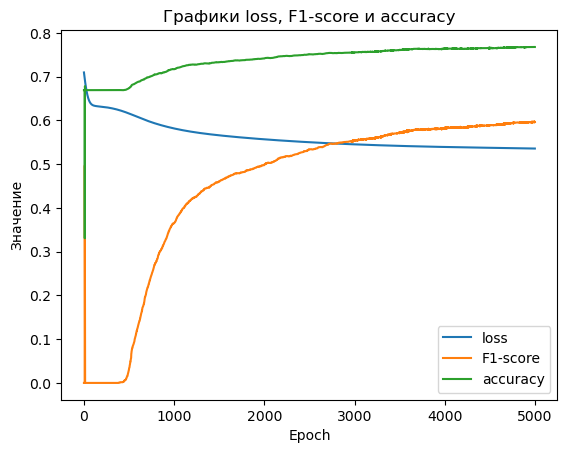

In [58]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf3['Epoch'], diagdf3['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf3['Epoch'], diagdf3['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf3['Epoch'], diagdf3['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [59]:
pred_test4=Mk4.forward(x_test.float())
pred_test_binarized4 = (pred_test4 > 0.5).float()

In [60]:
print(classification_report(y_test.to('cpu'), pred_test_binarized4.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.76      0.92      0.83      3226
         1.0       0.70      0.39      0.50      1537

    accuracy                           0.75      4763
   macro avg       0.73      0.66      0.67      4763
weighted avg       0.74      0.75      0.73      4763



In [61]:
#----------------------------------------------

<font color='red'>Word2Vec_MLP_Experiment_#5</font>

<font color='red'>layers: -1, activation functions: Sigmoid() and Tanh(), epochs: 2000, hidden_size: 200, lr: 0.0001 -> 0.001</font>

In [62]:
#----------------------------------------------

In [63]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK5(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK5, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.sigmoid1 = nn.Sigmoid()
        self.fc2 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
        self.tanh1 = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.sigmoid1(out)
        out = self.fc2(out)
        out = self.tanh1(out)
        return out

In [64]:
Mk5=MLP_MK5(100,200,1) #изменить название переменной

In [65]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [66]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [67]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [68]:
Mk5=Mk5.to(dev)

In [69]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk5.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf4=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(2000):
    optimizer.zero_grad()
    pred = Mk5.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf4 = pd.concat([diagdf4, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.7928892970085144   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2 , Loss:  0.7646359205245972   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3 , Loss:  0.7370098233222961   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4 , Loss:  0.7114216685295105   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5 , Loss:  0.6891300678253174   f1-score: 0.07904934138059616   accuracy: 0.6791756749153137
Epoch:  6 , Loss:  0.6709744334220886   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7 , Loss:  0.6572040319442749   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8 , Loss:  0.6474928259849548   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9 , Loss:  0.6411279439926147   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10 , Loss:  0.63726407289505   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11 , Loss:  0.635123610496521   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12 , Loss:  0.6340938806533813   f1-score:

Epoch:  115 , Loss:  0.6322982907295227   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  116 , Loss:  0.6322733759880066   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  117 , Loss:  0.6322483420372009   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  118 , Loss:  0.6322230696678162   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  119 , Loss:  0.6321977972984314   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  120 , Loss:  0.6321723461151123   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  121 , Loss:  0.6321468353271484   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  122 , Loss:  0.6321212649345398   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  123 , Loss:  0.6320956349372864   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  124 , Loss:  0.6320698857307434   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  125 , Loss:  0.6320441365242004   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  126 , Loss:  0.6320182085037231   f

Epoch:  212 , Loss:  0.629165530204773   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  213 , Loss:  0.6291239261627197   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  214 , Loss:  0.629082202911377   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  215 , Loss:  0.6290401816368103   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  216 , Loss:  0.6289979219436646   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  217 , Loss:  0.6289554238319397   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  218 , Loss:  0.6289127469062805   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  219 , Loss:  0.6288698315620422   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  220 , Loss:  0.6288266777992249   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  221 , Loss:  0.6287833452224731   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  222 , Loss:  0.6287397742271423   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  223 , Loss:  0.6286960244178772   f1-

Epoch:  308 , Loss:  0.6240801811218262   f1-score: 0.047707393765449524   accuracy: 0.6766558885574341
Epoch:  309 , Loss:  0.6240150332450867   f1-score: 0.047707393765449524   accuracy: 0.6766558885574341
Epoch:  310 , Loss:  0.6239495873451233   f1-score: 0.047707393765449524   accuracy: 0.6766558885574341
Epoch:  311 , Loss:  0.6238839626312256   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  312 , Loss:  0.6238179206848145   f1-score: 0.048741720616817474   accuracy: 0.676835834980011
Epoch:  313 , Loss:  0.6237517595291138   f1-score: 0.048741720616817474   accuracy: 0.676835834980011
Epoch:  314 , Loss:  0.6236853003501892   f1-score: 0.048741720616817474   accuracy: 0.676835834980011
Epoch:  315 , Loss:  0.6236185431480408   f1-score: 0.04925847426056862   accuracy: 0.6769258379936218
Epoch:  316 , Loss:  0.6235515475273132   f1-score: 0.04925847426056862   accuracy: 0.6769258379936218
Epoch:  317 , Loss:  0.6234843134880066   f1-score: 0.0492584742605686

Epoch:  405 , Loss:  0.6164137721061707   f1-score: 0.06712113320827484   accuracy: 0.6798056364059448
Epoch:  406 , Loss:  0.6163184642791748   f1-score: 0.06712113320827484   accuracy: 0.6798056364059448
Epoch:  407 , Loss:  0.6162226796150208   f1-score: 0.06813417375087738   accuracy: 0.6799855828285217
Epoch:  408 , Loss:  0.6161264777183533   f1-score: 0.06811632215976715   accuracy: 0.6798955798149109
Epoch:  409 , Loss:  0.6160299181938171   f1-score: 0.06811632215976715   accuracy: 0.6798955798149109
Epoch:  410 , Loss:  0.6159330010414124   f1-score: 0.06811632215976715   accuracy: 0.6798955798149109
Epoch:  411 , Loss:  0.6158357262611389   f1-score: 0.06862231343984604   accuracy: 0.6799855828285217
Epoch:  412 , Loss:  0.615738034248352   f1-score: 0.06963350623846054   accuracy: 0.6801655888557434
Epoch:  413 , Loss:  0.6156399250030518   f1-score: 0.06963350623846054   accuracy: 0.6801655888557434
Epoch:  414 , Loss:  0.6155414581298828   f1-score: 0.07013870775699615   

Epoch:  500 , Loss:  0.6058309674263   f1-score: 0.13306653499603271   accuracy: 0.6880849599838257
Epoch:  501 , Loss:  0.6057083606719971   f1-score: 0.13446637988090515   accuracy: 0.6883549094200134
Epoch:  502 , Loss:  0.6055856943130493   f1-score: 0.13533084094524384   accuracy: 0.6883549094200134
Epoch:  503 , Loss:  0.6054630279541016   f1-score: 0.136227548122406   accuracy: 0.6884449124336243
Epoch:  504 , Loss:  0.6053402423858643   f1-score: 0.13712291419506073   accuracy: 0.6885349154472351
Epoch:  505 , Loss:  0.605217456817627   f1-score: 0.1380513310432434   accuracy: 0.6887149214744568
Epoch:  506 , Loss:  0.6050946116447449   f1-score: 0.1399054080247879   accuracy: 0.6890748739242554
Epoch:  507 , Loss:  0.6049717664718628   f1-score: 0.14168530702590942   accuracy: 0.689254879951477
Epoch:  508 , Loss:  0.6048488616943359   f1-score: 0.14260870218276978   accuracy: 0.689434826374054
Epoch:  509 , Loss:  0.6047260165214539   f1-score: 0.14395631849765778   accuracy:

Epoch:  591 , Loss:  0.5951386094093323   f1-score: 0.2514699101448059   accuracy: 0.7021238207817078
Epoch:  592 , Loss:  0.5950324535369873   f1-score: 0.25259828567504883   accuracy: 0.7023038268089294
Epoch:  593 , Loss:  0.5949265956878662   f1-score: 0.25248420238494873   accuracy: 0.7021238207817078
Epoch:  594 , Loss:  0.5948210954666138   f1-score: 0.252821683883667   accuracy: 0.7021238207817078
Epoch:  595 , Loss:  0.5947158932685852   f1-score: 0.253158837556839   accuracy: 0.7021238207817078
Epoch:  596 , Loss:  0.5946110486984253   f1-score: 0.25383228063583374   accuracy: 0.7021238207817078
Epoch:  597 , Loss:  0.594506561756134   f1-score: 0.2552904188632965   accuracy: 0.7023038268089294
Epoch:  598 , Loss:  0.5944023728370667   f1-score: 0.25719425082206726   accuracy: 0.702663779258728
Epoch:  599 , Loss:  0.5942984819412231   f1-score: 0.2575280964374542   accuracy: 0.702663779258728
Epoch:  600 , Loss:  0.5941949486732483   f1-score: 0.257803738117218   accuracy: 0

Epoch:  686 , Loss:  0.586453914642334   f1-score: 0.3233935236930847   accuracy: 0.71004319190979
Epoch:  687 , Loss:  0.5863761305809021   f1-score: 0.3240293860435486   accuracy: 0.7101331949234009
Epoch:  688 , Loss:  0.5862985849380493   f1-score: 0.324664443731308   accuracy: 0.7102231979370117
Epoch:  689 , Loss:  0.5862213373184204   f1-score: 0.325649619102478   accuracy: 0.7104031443595886
Epoch:  690 , Loss:  0.5861442685127258   f1-score: 0.3263510763645172   accuracy: 0.7105831503868103
Epoch:  691 , Loss:  0.5860674977302551   f1-score: 0.32789626717567444   accuracy: 0.710763156414032
Epoch:  692 , Loss:  0.5859909057617188   f1-score: 0.32817724347114563   accuracy: 0.710763156414032
Epoch:  693 , Loss:  0.5859146118164062   f1-score: 0.329087495803833   accuracy: 0.7108531594276428
Epoch:  694 , Loss:  0.5858386158943176   f1-score: 0.33041301369667053   accuracy: 0.7111231088638306
Epoch:  695 , Loss:  0.5857627987861633   f1-score: 0.3314571678638458   accuracy: 0.71

Epoch:  778 , Loss:  0.5802078247070312   f1-score: 0.3753490149974823   accuracy: 0.718142569065094
Epoch:  779 , Loss:  0.5801487565040588   f1-score: 0.37567296624183655   accuracy: 0.7182325124740601
Epoch:  780 , Loss:  0.5800899863243103   f1-score: 0.37567296624183655   accuracy: 0.7182325124740601
Epoch:  781 , Loss:  0.5800313353538513   f1-score: 0.37567296624183655   accuracy: 0.7182325124740601
Epoch:  782 , Loss:  0.5799728035926819   f1-score: 0.37559807300567627   accuracy: 0.718142569065094
Epoch:  783 , Loss:  0.5799144506454468   f1-score: 0.37559807300567627   accuracy: 0.718142569065094
Epoch:  784 , Loss:  0.579856276512146   f1-score: 0.3765690326690674   accuracy: 0.7184125185012817
Epoch:  785 , Loss:  0.5797982811927795   f1-score: 0.3765690326690674   accuracy: 0.7184125185012817
Epoch:  786 , Loss:  0.5797405242919922   f1-score: 0.37681737542152405   accuracy: 0.7184125185012817
Epoch:  787 , Loss:  0.5796828269958496   f1-score: 0.3774636685848236   accurac

Epoch:  862 , Loss:  0.5757853388786316   f1-score: 0.407823383808136   accuracy: 0.7248020172119141
Epoch:  863 , Loss:  0.5757386088371277   f1-score: 0.4083607494831085   accuracy: 0.7248920202255249
Epoch:  864 , Loss:  0.5756919384002686   f1-score: 0.40828174352645874   accuracy: 0.7248020172119141
Epoch:  865 , Loss:  0.575645387172699   f1-score: 0.4085896611213684   accuracy: 0.7248920202255249
Epoch:  866 , Loss:  0.575598955154419   f1-score: 0.40881842374801636   accuracy: 0.7248920202255249
Epoch:  867 , Loss:  0.5755526423454285   f1-score: 0.40912607312202454   accuracy: 0.7249820232391357
Epoch:  868 , Loss:  0.5755065083503723   f1-score: 0.4095127582550049   accuracy: 0.7251619696617126
Epoch:  869 , Loss:  0.5754604339599609   f1-score: 0.4107418954372406   accuracy: 0.725521981716156
Epoch:  870 , Loss:  0.5754144787788391   f1-score: 0.41066253185272217   accuracy: 0.7254319787025452
Epoch:  871 , Loss:  0.5753686428070068   f1-score: 0.41096949577331543   accuracy

Epoch:  952 , Loss:  0.5720091462135315   f1-score: 0.4294896125793457   accuracy: 0.7284017205238342
Epoch:  953 , Loss:  0.5719714760780334   f1-score: 0.43008315563201904   accuracy: 0.7285817265510559
Epoch:  954 , Loss:  0.571933925151825   f1-score: 0.43059489130973816   accuracy: 0.7286717295646667
Epoch:  955 , Loss:  0.5718964338302612   f1-score: 0.43059489130973816   accuracy: 0.7286717295646667
Epoch:  956 , Loss:  0.5718590617179871   f1-score: 0.43059489130973816   accuracy: 0.7286717295646667
Epoch:  957 , Loss:  0.5718216896057129   f1-score: 0.43059489130973816   accuracy: 0.7286717295646667
Epoch:  958 , Loss:  0.5717845559120178   f1-score: 0.4305135905742645   accuracy: 0.7285817265510559
Epoch:  959 , Loss:  0.571747362613678   f1-score: 0.4305135905742645   accuracy: 0.7285817265510559
Epoch:  960 , Loss:  0.5717102885246277   f1-score: 0.43094339966773987   accuracy: 0.7285817265510559
Epoch:  961 , Loss:  0.5716732144355774   f1-score: 0.4310247302055359   accur

Epoch:  1036 , Loss:  0.5690992474555969   f1-score: 0.4403567314147949   accuracy: 0.7289416790008545
Epoch:  1037 , Loss:  0.5690673589706421   f1-score: 0.4405646324157715   accuracy: 0.7289416790008545
Epoch:  1038 , Loss:  0.5690354704856873   f1-score: 0.4406464695930481   accuracy: 0.7290316820144653
Epoch:  1039 , Loss:  0.5690036416053772   f1-score: 0.4409361183643341   accuracy: 0.7291216850280762
Epoch:  1040 , Loss:  0.5689719319343567   f1-score: 0.4409361183643341   accuracy: 0.7291216850280762
Epoch:  1041 , Loss:  0.5689401626586914   f1-score: 0.4409361183643341   accuracy: 0.7291216850280762
Epoch:  1042 , Loss:  0.5689085721969604   f1-score: 0.4409361183643341   accuracy: 0.7291216850280762
Epoch:  1043 , Loss:  0.5688769221305847   f1-score: 0.4409361183643341   accuracy: 0.7291216850280762
Epoch:  1044 , Loss:  0.5688453912734985   f1-score: 0.4411436915397644   accuracy: 0.7291216850280762
Epoch:  1045 , Loss:  0.5688139200210571   f1-score: 0.4414330720901489  

Epoch:  1118 , Loss:  0.5666497945785522   f1-score: 0.456724613904953   accuracy: 0.7328113913536072
Epoch:  1119 , Loss:  0.5666218400001526   f1-score: 0.456724613904953   accuracy: 0.7328113913536072
Epoch:  1120 , Loss:  0.5665939450263977   f1-score: 0.4566410481929779   accuracy: 0.7327213883399963
Epoch:  1121 , Loss:  0.566565990447998   f1-score: 0.45712196826934814   accuracy: 0.7328113913536072
Epoch:  1122 , Loss:  0.5665382146835327   f1-score: 0.4573204219341278   accuracy: 0.7328113913536072
Epoch:  1123 , Loss:  0.5665103793144226   f1-score: 0.45751872658729553   accuracy: 0.7328113913536072
Epoch:  1124 , Loss:  0.5664826035499573   f1-score: 0.45695486664772034   accuracy: 0.7326313853263855
Epoch:  1125 , Loss:  0.5664549469947815   f1-score: 0.45695486664772034   accuracy: 0.7326313853263855
Epoch:  1126 , Loss:  0.5664272308349609   f1-score: 0.45695486664772034   accuracy: 0.7326313853263855
Epoch:  1127 , Loss:  0.5663996338844299   f1-score: 0.4571532905101776

Epoch:  1200 , Loss:  0.5644851922988892   f1-score: 0.4667993485927582   accuracy: 0.7347912192344666
Epoch:  1201 , Loss:  0.5644602179527283   f1-score: 0.46652188897132874   accuracy: 0.7347012162208557
Epoch:  1202 , Loss:  0.5644353628158569   f1-score: 0.46652188897132874   accuracy: 0.7347012162208557
Epoch:  1203 , Loss:  0.5644105076789856   f1-score: 0.4664374887943268   accuracy: 0.7346112132072449
Epoch:  1204 , Loss:  0.564385712146759   f1-score: 0.4664374887943268   accuracy: 0.7346112132072449
Epoch:  1205 , Loss:  0.5643609762191772   f1-score: 0.4666304886341095   accuracy: 0.7346112132072449
Epoch:  1206 , Loss:  0.5643361806869507   f1-score: 0.4666304886341095   accuracy: 0.7346112132072449
Epoch:  1207 , Loss:  0.5643115043640137   f1-score: 0.4666304886341095   accuracy: 0.7346112132072449
Epoch:  1208 , Loss:  0.5642867684364319   f1-score: 0.46654611825942993   accuracy: 0.734521210193634
Epoch:  1209 , Loss:  0.5642621517181396   f1-score: 0.46682336926460266

Epoch:  1298 , Loss:  0.5621917843818665   f1-score: 0.4772970974445343   accuracy: 0.7368610501289368
Epoch:  1299 , Loss:  0.5621698498725891   f1-score: 0.4772118031978607   accuracy: 0.7367710471153259
Epoch:  1300 , Loss:  0.5621479153633118   f1-score: 0.47748392820358276   accuracy: 0.7368610501289368
Epoch:  1301 , Loss:  0.5621259808540344   f1-score: 0.47712650895118713   accuracy: 0.7366810441017151
Epoch:  1302 , Loss:  0.5621040463447571   f1-score: 0.47712650895118713   accuracy: 0.7366810441017151
Epoch:  1303 , Loss:  0.5620822906494141   f1-score: 0.47712650895118713   accuracy: 0.7366810441017151
Epoch:  1304 , Loss:  0.5620604157447815   f1-score: 0.4776706099510193   accuracy: 0.7368610501289368
Epoch:  1305 , Loss:  0.5620386600494385   f1-score: 0.4775852859020233   accuracy: 0.7367710471153259
Epoch:  1306 , Loss:  0.5620168447494507   f1-score: 0.47785714268684387   accuracy: 0.7368610501289368
Epoch:  1307 , Loss:  0.5619950890541077   f1-score: 0.4780278801918

Epoch:  1381 , Loss:  0.5604565739631653   f1-score: 0.48221907019615173   accuracy: 0.7379409670829773
Epoch:  1382 , Loss:  0.5604367256164551   f1-score: 0.48221907019615173   accuracy: 0.7379409670829773
Epoch:  1383 , Loss:  0.5604168772697449   f1-score: 0.48213332891464233   accuracy: 0.7378509640693665
Epoch:  1384 , Loss:  0.5603970289230347   f1-score: 0.4820476472377777   accuracy: 0.7377609610557556
Epoch:  1385 , Loss:  0.5603772401809692   f1-score: 0.4820476472377777   accuracy: 0.7377609610557556
Epoch:  1386 , Loss:  0.5603574514389038   f1-score: 0.4820476472377777   accuracy: 0.7377609610557556
Epoch:  1387 , Loss:  0.5603377223014832   f1-score: 0.4820476472377777   accuracy: 0.7377609610557556
Epoch:  1388 , Loss:  0.5603179335594177   f1-score: 0.48231738805770874   accuracy: 0.7378509640693665
Epoch:  1389 , Loss:  0.5602982044219971   f1-score: 0.4828566312789917   accuracy: 0.7380309700965881
Epoch:  1390 , Loss:  0.5602785348892212   f1-score: 0.48294243216514

Epoch:  1467 , Loss:  0.5588254928588867   f1-score: 0.48833099007606506   accuracy: 0.7395608425140381
Epoch:  1468 , Loss:  0.5588074326515198   f1-score: 0.48806366324424744   accuracy: 0.7394708395004272
Epoch:  1469 , Loss:  0.5587893724441528   f1-score: 0.48833099007606506   accuracy: 0.7395608425140381
Epoch:  1470 , Loss:  0.5587712526321411   f1-score: 0.48833099007606506   accuracy: 0.7395608425140381
Epoch:  1471 , Loss:  0.558753252029419   f1-score: 0.48833099007606506   accuracy: 0.7395608425140381
Epoch:  1472 , Loss:  0.5587352514266968   f1-score: 0.48833099007606506   accuracy: 0.7395608425140381
Epoch:  1473 , Loss:  0.5587172508239746   f1-score: 0.48859819769859314   accuracy: 0.7396508455276489
Epoch:  1474 , Loss:  0.5586992502212524   f1-score: 0.48859819769859314   accuracy: 0.7396508455276489
Epoch:  1475 , Loss:  0.558681309223175   f1-score: 0.48859819769859314   accuracy: 0.7396508455276489
Epoch:  1476 , Loss:  0.5586633682250977   f1-score: 0.48859819769

Epoch:  1575 , Loss:  0.5569713711738586   f1-score: 0.4952681362628937   accuracy: 0.7408207058906555
Epoch:  1576 , Loss:  0.5569550395011902   f1-score: 0.4952681362628937   accuracy: 0.7408207058906555
Epoch:  1577 , Loss:  0.5569388270378113   f1-score: 0.4952681362628937   accuracy: 0.7408207058906555
Epoch:  1578 , Loss:  0.5569224953651428   f1-score: 0.4951813519001007   accuracy: 0.7407307624816895
Epoch:  1579 , Loss:  0.5569062232971191   f1-score: 0.4956217110157013   accuracy: 0.7408207058906555
Epoch:  1580 , Loss:  0.5568900108337402   f1-score: 0.49588513374328613   accuracy: 0.7409107089042664
Epoch:  1581 , Loss:  0.5568737387657166   f1-score: 0.4961484670639038   accuracy: 0.7410007119178772
Epoch:  1582 , Loss:  0.5568575263023376   f1-score: 0.4961484670639038   accuracy: 0.7410007119178772
Epoch:  1583 , Loss:  0.5568413138389587   f1-score: 0.4961484670639038   accuracy: 0.7410007119178772
Epoch:  1584 , Loss:  0.5568251609802246   f1-score: 0.4961484670639038 

Epoch:  1669 , Loss:  0.5554980039596558   f1-score: 0.5015695691108704   accuracy: 0.7428005933761597
Epoch:  1670 , Loss:  0.5554829239845276   f1-score: 0.5018308758735657   accuracy: 0.7428905963897705
Epoch:  1671 , Loss:  0.5554679036140442   f1-score: 0.5021796226501465   accuracy: 0.7430705428123474
Epoch:  1672 , Loss:  0.555452823638916   f1-score: 0.5021796226501465   accuracy: 0.7430705428123474
Epoch:  1673 , Loss:  0.5554377436637878   f1-score: 0.501918375492096   accuracy: 0.7429805397987366
Epoch:  1674 , Loss:  0.5554227828979492   f1-score: 0.501918375492096   accuracy: 0.7429805397987366
Epoch:  1675 , Loss:  0.5554077625274658   f1-score: 0.501918375492096   accuracy: 0.7429805397987366
Epoch:  1676 , Loss:  0.5553927421569824   f1-score: 0.5022671818733215   accuracy: 0.7431605458259583
Epoch:  1677 , Loss:  0.5553777813911438   f1-score: 0.5022671818733215   accuracy: 0.7431605458259583
Epoch:  1678 , Loss:  0.5553627610206604   f1-score: 0.5022671818733215   acc

Epoch:  1771 , Loss:  0.5540206432342529   f1-score: 0.5121740698814392   accuracy: 0.7457703351974487
Epoch:  1772 , Loss:  0.5540067553520203   f1-score: 0.5121740698814392   accuracy: 0.7457703351974487
Epoch:  1773 , Loss:  0.5539928674697876   f1-score: 0.5122625231742859   accuracy: 0.7458603382110596
Epoch:  1774 , Loss:  0.5539789795875549   f1-score: 0.5122625231742859   accuracy: 0.7458603382110596
Epoch:  1775 , Loss:  0.5539650917053223   f1-score: 0.5119171142578125   accuracy: 0.7456803321838379
Epoch:  1776 , Loss:  0.5539512038230896   f1-score: 0.5119171142578125   accuracy: 0.7456803321838379
Epoch:  1777 , Loss:  0.5539373755455017   f1-score: 0.5121740698814392   accuracy: 0.7457703351974487
Epoch:  1778 , Loss:  0.553923487663269   f1-score: 0.5120856165885925   accuracy: 0.7456803321838379
Epoch:  1779 , Loss:  0.5539097189903259   f1-score: 0.5121740698814392   accuracy: 0.7457703351974487
Epoch:  1780 , Loss:  0.5538958311080933   f1-score: 0.5121740698814392   

Epoch:  1872 , Loss:  0.5526690483093262   f1-score: 0.5191416144371033   accuracy: 0.7479301691055298
Epoch:  1873 , Loss:  0.5526561737060547   f1-score: 0.5190525054931641   accuracy: 0.747840166091919
Epoch:  1874 , Loss:  0.552643358707428   f1-score: 0.5191416144371033   accuracy: 0.7479301691055298
Epoch:  1875 , Loss:  0.5526305437088013   f1-score: 0.518798291683197   accuracy: 0.7477501630783081
Epoch:  1876 , Loss:  0.5526177287101746   f1-score: 0.518798291683197   accuracy: 0.7477501630783081
Epoch:  1877 , Loss:  0.5526049137115479   f1-score: 0.5187092423439026   accuracy: 0.7476601600646973
Epoch:  1878 , Loss:  0.5525920987129211   f1-score: 0.5187092423439026   accuracy: 0.7476601600646973
Epoch:  1879 , Loss:  0.5525793433189392   f1-score: 0.5187092423439026   accuracy: 0.7476601600646973
Epoch:  1880 , Loss:  0.5525665283203125   f1-score: 0.5187092423439026   accuracy: 0.7476601600646973
Epoch:  1881 , Loss:  0.5525538325309753   f1-score: 0.5189634561538696   acc

Epoch:  1954 , Loss:  0.5516515374183655   f1-score: 0.5228981375694275   accuracy: 0.7487400770187378
Epoch:  1955 , Loss:  0.5516396164894104   f1-score: 0.5228087902069092   accuracy: 0.7486501336097717
Epoch:  1956 , Loss:  0.5516276359558105   f1-score: 0.5231505036354065   accuracy: 0.7488300800323486
Epoch:  1957 , Loss:  0.5516157150268555   f1-score: 0.5231505036354065   accuracy: 0.7488300800323486
Epoch:  1958 , Loss:  0.5516037940979004   f1-score: 0.5231505036354065   accuracy: 0.7488300800323486
Epoch:  1959 , Loss:  0.5515918731689453   f1-score: 0.5231505036354065   accuracy: 0.7488300800323486
Epoch:  1960 , Loss:  0.5515799522399902   f1-score: 0.5231505036354065   accuracy: 0.7488300800323486
Epoch:  1961 , Loss:  0.5515680313110352   f1-score: 0.5234028100967407   accuracy: 0.7489200830459595
Epoch:  1962 , Loss:  0.5515561699867249   f1-score: 0.5234028100967407   accuracy: 0.7489200830459595
Epoch:  1963 , Loss:  0.5515443086624146   f1-score: 0.5234028100967407  

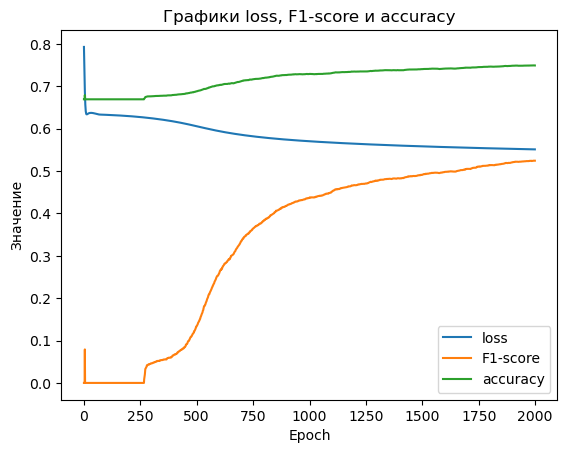

In [70]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf4['Epoch'], diagdf4['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf4['Epoch'], diagdf4['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf4['Epoch'], diagdf4['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [71]:
pred_test5=Mk5.forward(x_test.float())
pred_test_binarized5 = (pred_test5 > 0.5).float()

In [72]:
print(classification_report(y_test.to('cpu'), pred_test_binarized5.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.74      0.96      0.83      3226
         1.0       0.76      0.29      0.42      1537

    accuracy                           0.74      4763
   macro avg       0.75      0.62      0.63      4763
weighted avg       0.75      0.74      0.70      4763



In [73]:
#----------------------------------------------

<font color='red'>Word2Vec_MLP_Experiment_#6</font>

<font color='red'>layer + 1, epochs: 2000 -> 10000, lr: 0.0001 -> 0.001, hidden_size: 200 -> 300</font>

In [74]:
#----------------------------------------------

In [75]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK6(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK6, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
        self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
        self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
        out = self.fc3(out)
        out = self.tanh(out)
        return out

In [76]:
Mk6=MLP_MK6(100,300,1) #изменить название переменной

In [77]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [78]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [79]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [80]:
Mk6=Mk6.to(dev)

In [81]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk6.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf5=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(10000):
    optimizer.zero_grad()
    pred = Mk6.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf5 = pd.concat([diagdf5, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.6647413969039917   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2 , Loss:  0.6474763751029968   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3 , Loss:  0.6384824514389038   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4 , Loss:  0.634919285774231   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5 , Loss:  0.6341708302497864   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6 , Loss:  0.6345689296722412   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7 , Loss:  0.635283350944519   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8 , Loss:  0.6359723210334778   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9 , Loss:  0.6365234851837158   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10 , Loss:  0.6369159817695618   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11 , Loss:  0.6371597051620483   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12 , Loss:  0.6372698545455933   f1-score: 0.0   accuracy

Epoch:  90 , Loss:  0.5786240100860596   f1-score: 0.40330007672309875   accuracy: 0.7201223969459534
Epoch:  91 , Loss:  0.5779720544815063   f1-score: 0.4136492908000946   accuracy: 0.7216522693634033
Epoch:  92 , Loss:  0.5773332118988037   f1-score: 0.4127044379711151   accuracy: 0.7221022248268127
Epoch:  93 , Loss:  0.5767078399658203   f1-score: 0.41962262988090515   accuracy: 0.7231821417808533
Epoch:  94 , Loss:  0.5760962963104248   f1-score: 0.4209732115268707   accuracy: 0.7237221002578735
Epoch:  95 , Loss:  0.5754991173744202   f1-score: 0.4266166687011719   accuracy: 0.7247120141983032
Epoch:  96 , Loss:  0.574915885925293   f1-score: 0.4273408353328705   accuracy: 0.7248020172119141
Epoch:  97 , Loss:  0.5743489861488342   f1-score: 0.4323720932006836   accuracy: 0.7254319787025452
Epoch:  98 , Loss:  0.5738033056259155   f1-score: 0.4298540949821472   accuracy: 0.7257019281387329
Epoch:  99 , Loss:  0.5733011364936829   f1-score: 0.4424876272678375   accuracy: 0.726511

Epoch:  195 , Loss:  0.5554454922676086   f1-score: 0.49298736453056335   accuracy: 0.7397408485412598
Epoch:  196 , Loss:  0.555293083190918   f1-score: 0.5148784518241882   accuracy: 0.7432505488395691
Epoch:  197 , Loss:  0.5551560521125793   f1-score: 0.5073339343070984   accuracy: 0.7430705428123474
Epoch:  198 , Loss:  0.5550695061683655   f1-score: 0.5045014023780823   accuracy: 0.7424405813217163
Epoch:  199 , Loss:  0.5550047159194946   f1-score: 0.5168081521987915   accuracy: 0.7438805103302002
Epoch:  200 , Loss:  0.5549259185791016   f1-score: 0.499390572309494   accuracy: 0.7412707209587097
Epoch:  201 , Loss:  0.5548003911972046   f1-score: 0.5180661678314209   accuracy: 0.7443304657936096
Epoch:  202 , Loss:  0.5546714067459106   f1-score: 0.5071687698364258   accuracy: 0.7432505488395691
Epoch:  203 , Loss:  0.5545611381530762   f1-score: 0.5108210444450378   accuracy: 0.7437005043029785
Epoch:  204 , Loss:  0.5544751882553101   f1-score: 0.5156010389328003   accuracy: 

Epoch:  298 , Loss:  0.5472932457923889   f1-score: 0.5372081398963928   accuracy: 0.7520698308944702
Epoch:  299 , Loss:  0.5472781658172607   f1-score: 0.5540803074836731   accuracy: 0.752159833908081
Epoch:  300 , Loss:  0.5472686886787415   f1-score: 0.5354969501495361   accuracy: 0.7526997923851013
Epoch:  301 , Loss:  0.5471745133399963   f1-score: 0.5559683442115784   accuracy: 0.7526097893714905
Epoch:  302 , Loss:  0.5470848679542542   f1-score: 0.5365853905677795   accuracy: 0.7520698308944702
Epoch:  303 , Loss:  0.5469592213630676   f1-score: 0.551937460899353   accuracy: 0.7523398399353027
Epoch:  304 , Loss:  0.546857476234436   f1-score: 0.5413134098052979   accuracy: 0.7517098784446716
Epoch:  305 , Loss:  0.5467777252197266   f1-score: 0.5481432676315308   accuracy: 0.7525197863578796
Epoch:  306 , Loss:  0.5467216968536377   f1-score: 0.5491225123405457   accuracy: 0.7526097893714905
Epoch:  307 , Loss:  0.5466840863227844   f1-score: 0.5414658188819885   accuracy: 0.

Epoch:  401 , Loss:  0.5425212979316711   f1-score: 0.5787660479545593   accuracy: 0.7579193711280823
Epoch:  402 , Loss:  0.5424708127975464   f1-score: 0.5511259436607361   accuracy: 0.7578293681144714
Epoch:  403 , Loss:  0.5422641038894653   f1-score: 0.5750828981399536   accuracy: 0.7578293681144714
Epoch:  404 , Loss:  0.5421204566955566   f1-score: 0.559040904045105   accuracy: 0.7583693265914917
Epoch:  405 , Loss:  0.5419970154762268   f1-score: 0.5687310099601746   accuracy: 0.7574694156646729
Epoch:  406 , Loss:  0.541930615901947   f1-score: 0.5655328035354614   accuracy: 0.7574694156646729
Epoch:  407 , Loss:  0.5419086813926697   f1-score: 0.5642856955528259   accuracy: 0.7584593296051025
Epoch:  408 , Loss:  0.5419130325317383   f1-score: 0.5722019076347351   accuracy: 0.75818932056427
Epoch:  409 , Loss:  0.5419405698776245   f1-score: 0.558499276638031   accuracy: 0.7585493326187134
Epoch:  410 , Loss:  0.5419537425041199   f1-score: 0.5747671127319336   accuracy: 0.75

Epoch:  501 , Loss:  0.5384289622306824   f1-score: 0.579200029373169   accuracy: 0.7633189558982849
Epoch:  502 , Loss:  0.5384090542793274   f1-score: 0.5774489045143127   accuracy: 0.7635889053344727
Epoch:  503 , Loss:  0.5384101867675781   f1-score: 0.5840568542480469   accuracy: 0.7628689408302307
Epoch:  504 , Loss:  0.5384368896484375   f1-score: 0.5731469392776489   accuracy: 0.7636789083480835
Epoch:  505 , Loss:  0.5384707450866699   f1-score: 0.5868918895721436   accuracy: 0.7623290419578552
Epoch:  506 , Loss:  0.5385605096817017   f1-score: 0.5680026412010193   accuracy: 0.7633189558982849
Epoch:  507 , Loss:  0.5386008620262146   f1-score: 0.5889475345611572   accuracy: 0.7616990804672241
Epoch:  508 , Loss:  0.5387607216835022   f1-score: 0.5619094967842102   accuracy: 0.7621490359306335
Epoch:  509 , Loss:  0.538741946220398   f1-score: 0.5933322906494141   accuracy: 0.761789083480835
Epoch:  510 , Loss:  0.5388787984848022   f1-score: 0.5584805011749268   accuracy: 0.

Epoch:  598 , Loss:  0.5365521907806396   f1-score: 0.6032175421714783   accuracy: 0.7625089883804321
Epoch:  599 , Loss:  0.5371436476707458   f1-score: 0.5545023679733276   accuracy: 0.7631389498710632
Epoch:  600 , Loss:  0.536608874797821   f1-score: 0.6036548614501953   accuracy: 0.761879026889801
Epoch:  601 , Loss:  0.5362911820411682   f1-score: 0.5666390061378479   accuracy: 0.7650287747383118
Epoch:  602 , Loss:  0.5355893969535828   f1-score: 0.5968992114067078   accuracy: 0.7660187482833862
Epoch:  603 , Loss:  0.5353072285652161   f1-score: 0.591284990310669   accuracy: 0.7687184810638428
Epoch:  604 , Loss:  0.53542160987854   f1-score: 0.5844113826751709   accuracy: 0.7687184810638428
Epoch:  605 , Loss:  0.5357330441474915   f1-score: 0.5985915660858154   accuracy: 0.7640388607978821
Epoch:  606 , Loss:  0.5362029075622559   f1-score: 0.5664451718330383   accuracy: 0.7651187777519226
Epoch:  607 , Loss:  0.5360957384109497   f1-score: 0.6019036173820496   accuracy: 0.76

Epoch:  691 , Loss:  0.5329515337944031   f1-score: 0.5928777456283569   accuracy: 0.7715982794761658
Epoch:  692 , Loss:  0.5328401327133179   f1-score: 0.6009066700935364   accuracy: 0.7702483534812927
Epoch:  693 , Loss:  0.5327733755111694   f1-score: 0.597690224647522   accuracy: 0.7711483240127563
Epoch:  694 , Loss:  0.5327372550964355   f1-score: 0.5979153513908386   accuracy: 0.7708783149719238
Epoch:  695 , Loss:  0.5327211618423462   f1-score: 0.6007843017578125   accuracy: 0.7709683179855347
Epoch:  696 , Loss:  0.5327231287956238   f1-score: 0.5960497260093689   accuracy: 0.7717782855033875
Epoch:  697 , Loss:  0.5327417254447937   f1-score: 0.6035447716712952   accuracy: 0.7705183625221252
Epoch:  698 , Loss:  0.5327861905097961   f1-score: 0.5918301939964294   accuracy: 0.7715982794761658
Epoch:  699 , Loss:  0.5328231453895569   f1-score: 0.6057707071304321   accuracy: 0.7700684070587158
Epoch:  700 , Loss:  0.5329169631004333   f1-score: 0.586804986000061   accuracy: 0

Epoch:  784 , Loss:  0.5302565693855286   f1-score: 0.5967689752578735   accuracy: 0.7753779888153076
Epoch:  785 , Loss:  0.5300520658493042   f1-score: 0.6118481755256653   accuracy: 0.7735781073570251
Epoch:  786 , Loss:  0.529919445514679   f1-score: 0.603341281414032   accuracy: 0.7756479382514954
Epoch:  787 , Loss:  0.5298312306404114   f1-score: 0.6086549162864685   accuracy: 0.7745680212974548
Epoch:  788 , Loss:  0.5297839045524597   f1-score: 0.6072607040405273   accuracy: 0.7751079797744751
Epoch:  789 , Loss:  0.5297714471817017   f1-score: 0.6050633192062378   accuracy: 0.7753779888153076
Epoch:  790 , Loss:  0.5297818183898926   f1-score: 0.6106277108192444   accuracy: 0.774478018283844
Epoch:  791 , Loss:  0.5298289656639099   f1-score: 0.6012799739837646   accuracy: 0.7757379412651062
Epoch:  792 , Loss:  0.5298916697502136   f1-score: 0.6144152283668518   accuracy: 0.7742080688476562
Epoch:  793 , Loss:  0.5300290584564209   f1-score: 0.595661997795105   accuracy: 0.7

Epoch:  884 , Loss:  0.5273742079734802   f1-score: 0.6245837211608887   accuracy: 0.7768178582191467
Epoch:  885 , Loss:  0.5271419286727905   f1-score: 0.6037492156028748   accuracy: 0.7793376445770264
Epoch:  886 , Loss:  0.526898205280304   f1-score: 0.618013858795166   accuracy: 0.7767278552055359
Epoch:  887 , Loss:  0.5267519354820251   f1-score: 0.611578106880188   accuracy: 0.7796076536178589
Epoch:  888 , Loss:  0.5266724824905396   f1-score: 0.6142052412033081   accuracy: 0.7780777812004089
Epoch:  889 , Loss:  0.5266429781913757   f1-score: 0.6145181655883789   accuracy: 0.7782577276229858
Epoch:  890 , Loss:  0.5266510248184204   f1-score: 0.6115073561668396   accuracy: 0.7794276475906372
Epoch:  891 , Loss:  0.526691198348999   f1-score: 0.6182604432106018   accuracy: 0.7776277661323547
Epoch:  892 , Loss:  0.5267730951309204   f1-score: 0.6066442131996155   accuracy: 0.7794276475906372
Epoch:  893 , Loss:  0.5268616080284119   f1-score: 0.6224458813667297   accuracy: 0.7

Epoch:  967 , Loss:  0.5249533653259277   f1-score: 0.6067196726799011   accuracy: 0.7819474339485168
Epoch:  968 , Loss:  0.5250369906425476   f1-score: 0.6333584785461426   accuracy: 0.7814074754714966
Epoch:  969 , Loss:  0.5252442955970764   f1-score: 0.6016713380813599   accuracy: 0.7812275290489197
Epoch:  970 , Loss:  0.5252372622489929   f1-score: 0.6345778703689575   accuracy: 0.7806875705718994
Epoch:  971 , Loss:  0.5253538489341736   f1-score: 0.6007229685783386   accuracy: 0.7813174724578857
Epoch:  972 , Loss:  0.5251328945159912   f1-score: 0.6348348259925842   accuracy: 0.7811375260353088
Epoch:  973 , Loss:  0.5250022411346436   f1-score: 0.6035580039024353   accuracy: 0.7814074754714966
Epoch:  974 , Loss:  0.5246891975402832   f1-score: 0.6307645440101624   accuracy: 0.7809575200080872
Epoch:  975 , Loss:  0.5244684219360352   f1-score: 0.613162100315094   accuracy: 0.7831173539161682
Epoch:  976 , Loss:  0.5242724418640137   f1-score: 0.6251541376113892   accuracy: 

Epoch:  1070 , Loss:  0.5218138098716736   f1-score: 0.6240151524543762   accuracy: 0.7852771878242493
Epoch:  1071 , Loss:  0.5218812227249146   f1-score: 0.6328569054603577   accuracy: 0.7850071787834167
Epoch:  1072 , Loss:  0.5220140814781189   f1-score: 0.6162474155426025   accuracy: 0.7844672203063965
Epoch:  1073 , Loss:  0.5221721529960632   f1-score: 0.6364188194274902   accuracy: 0.7843772768974304
Epoch:  1074 , Loss:  0.5224319100379944   f1-score: 0.6130343079566956   accuracy: 0.7857271432876587
Epoch:  1075 , Loss:  0.5225839614868164   f1-score: 0.63893061876297   accuracy: 0.7836573123931885
Epoch:  1076 , Loss:  0.5228226780891418   f1-score: 0.6073830723762512   accuracy: 0.7846472263336182
Epoch:  1077 , Loss:  0.5227038860321045   f1-score: 0.6389719247817993   accuracy: 0.782577395439148
Epoch:  1078 , Loss:  0.5226312875747681   f1-score: 0.6091653108596802   accuracy: 0.7850971817970276
Epoch:  1079 , Loss:  0.5222414135932922   f1-score: 0.6378868222236633   ac

Epoch:  1150 , Loss:  0.5204780697822571   f1-score: 0.6399030685424805   accuracy: 0.7860870957374573
Epoch:  1151 , Loss:  0.5202025175094604   f1-score: 0.6236386895179749   accuracy: 0.7885169386863708
Epoch:  1152 , Loss:  0.5199836492538452   f1-score: 0.6368938088417053   accuracy: 0.787077009677887
Epoch:  1153 , Loss:  0.5198609828948975   f1-score: 0.6321748495101929   accuracy: 0.7895068526268005
Epoch:  1154 , Loss:  0.5198140740394592   f1-score: 0.6327454447746277   accuracy: 0.7882469296455383
Epoch:  1155 , Loss:  0.5198248624801636   f1-score: 0.6349157094955444   accuracy: 0.7875270247459412
Epoch:  1156 , Loss:  0.5198829770088196   f1-score: 0.6269224882125854   accuracy: 0.7882469296455383
Epoch:  1157 , Loss:  0.5199694037437439   f1-score: 0.6388379335403442   accuracy: 0.7874370217323303
Epoch:  1158 , Loss:  0.5201098322868347   f1-score: 0.6220295429229736   accuracy: 0.7881569266319275
Epoch:  1159 , Loss:  0.5202476382255554   f1-score: 0.6399999856948853   

Epoch:  1251 , Loss:  0.5181648135185242   f1-score: 0.6437547206878662   accuracy: 0.7882469296455383
Epoch:  1252 , Loss:  0.5183670520782471   f1-score: 0.6260083913803101   accuracy: 0.7913966774940491
Epoch:  1253 , Loss:  0.5184840559959412   f1-score: 0.6458302140235901   accuracy: 0.7878869771957397
Epoch:  1254 , Loss:  0.5186833143234253   f1-score: 0.6216084361076355   accuracy: 0.7904067635536194
Epoch:  1255 , Loss:  0.5186452865600586   f1-score: 0.6464071869850159   accuracy: 0.7874370217323303
Epoch:  1256 , Loss:  0.5186731815338135   f1-score: 0.6220126748085022   accuracy: 0.790766716003418
Epoch:  1257 , Loss:  0.5184597373008728   f1-score: 0.6452484726905823   accuracy: 0.7873470187187195
Epoch:  1258 , Loss:  0.5182976722717285   f1-score: 0.6258679032325745   accuracy: 0.7914866805076599
Epoch:  1259 , Loss:  0.5180090069770813   f1-score: 0.6435598731040955   accuracy: 0.7880669832229614
Epoch:  1260 , Loss:  0.5177930593490601   f1-score: 0.6308232545852661   

Epoch:  1356 , Loss:  0.5165069103240967   f1-score: 0.6515309810638428   accuracy: 0.7900468111038208
Epoch:  1357 , Loss:  0.5161956548690796   f1-score: 0.6303715705871582   accuracy: 0.7940964698791504
Epoch:  1358 , Loss:  0.5157686471939087   f1-score: 0.6495157480239868   accuracy: 0.7915766835212708
Epoch:  1359 , Loss:  0.5154818892478943   f1-score: 0.6399746537208557   accuracy: 0.7952663898468018
Epoch:  1360 , Loss:  0.5152995586395264   f1-score: 0.6449130177497864   accuracy: 0.7923865914344788
Epoch:  1361 , Loss:  0.5152223706245422   f1-score: 0.644669234752655   accuracy: 0.7945464253425598
Epoch:  1362 , Loss:  0.5152250528335571   f1-score: 0.6433150768280029   accuracy: 0.7947264313697815
Epoch:  1363 , Loss:  0.5152879357337952   f1-score: 0.6455968022346497   accuracy: 0.792116641998291
Epoch:  1364 , Loss:  0.515404224395752   f1-score: 0.6408752202987671   accuracy: 0.7961663007736206
Epoch:  1365 , Loss:  0.5155436396598816   f1-score: 0.6502045392990112   ac

Epoch:  1460 , Loss:  0.5136452913284302   f1-score: 0.641983151435852   accuracy: 0.7972462177276611
Epoch:  1461 , Loss:  0.5136769413948059   f1-score: 0.6541546583175659   accuracy: 0.7943664789199829
Epoch:  1462 , Loss:  0.5137210488319397   f1-score: 0.6405103802680969   accuracy: 0.7971562147140503
Epoch:  1463 , Loss:  0.5137068629264832   f1-score: 0.6537822484970093   accuracy: 0.793646514415741
Epoch:  1464 , Loss:  0.5137158632278442   f1-score: 0.640625   accuracy: 0.7971562147140503
Epoch:  1465 , Loss:  0.513668417930603   f1-score: 0.6540785431861877   accuracy: 0.7939164638519287
Epoch:  1466 , Loss:  0.5136533379554749   f1-score: 0.6408417224884033   accuracy: 0.7972462177276611
Epoch:  1467 , Loss:  0.5135810375213623   f1-score: 0.6543695330619812   accuracy: 0.7942764759063721
Epoch:  1468 , Loss:  0.5135447382926941   f1-score: 0.6422660946846008   accuracy: 0.7976961731910706
Epoch:  1469 , Loss:  0.5134684443473816   f1-score: 0.6546391844749451   accuracy: 0.

Epoch:  1561 , Loss:  0.5120776295661926   f1-score: 0.6438028216362   accuracy: 0.7990460991859436
Epoch:  1562 , Loss:  0.5120149850845337   f1-score: 0.657608687877655   accuracy: 0.7958963513374329
Epoch:  1563 , Loss:  0.5118700861930847   f1-score: 0.6452740430831909   accuracy: 0.7990460991859436
Epoch:  1564 , Loss:  0.5116189122200012   f1-score: 0.6574468016624451   accuracy: 0.7971562147140503
Epoch:  1565 , Loss:  0.5114346146583557   f1-score: 0.6500391960144043   accuracy: 0.7992260456085205
Epoch:  1566 , Loss:  0.511311948299408   f1-score: 0.6549545526504517   accuracy: 0.7985061407089233
Epoch:  1567 , Loss:  0.5112571716308594   f1-score: 0.6549001336097717   accuracy: 0.7994060516357422
Epoch:  1568 , Loss:  0.511268138885498   f1-score: 0.6520317792892456   accuracy: 0.7988660931587219
Epoch:  1569 , Loss:  0.5113264918327332   f1-score: 0.6572524905204773   accuracy: 0.7990460991859436
Epoch:  1570 , Loss:  0.5114020109176636   f1-score: 0.6490316390991211   accur

Epoch:  1653 , Loss:  0.5099877715110779   f1-score: 0.6604665517807007   accuracy: 0.7995860576629639
Epoch:  1654 , Loss:  0.5101199746131897   f1-score: 0.6502758264541626   accuracy: 0.800305962562561
Epoch:  1655 , Loss:  0.5103051662445068   f1-score: 0.6623376607894897   accuracy: 0.7987760901451111
Epoch:  1656 , Loss:  0.510647714138031   f1-score: 0.645490825176239   accuracy: 0.8001260161399841
Epoch:  1657 , Loss:  0.5109977126121521   f1-score: 0.6644824743270874   accuracy: 0.7972462177276611
Epoch:  1658 , Loss:  0.5116239786148071   f1-score: 0.6384565234184265   accuracy: 0.7993160486221313
Epoch:  1659 , Loss:  0.511807382106781   f1-score: 0.6659799814224243   accuracy: 0.7957163453102112
Epoch:  1660 , Loss:  0.5121920704841614   f1-score: 0.6323361396789551   accuracy: 0.7976061701774597
Epoch:  1661 , Loss:  0.5116298794746399   f1-score: 0.6651923656463623   accuracy: 0.7956263422966003
Epoch:  1662 , Loss:  0.5112059116363525   f1-score: 0.6410587430000305   acc

Epoch:  1749 , Loss:  0.5095760822296143   f1-score: 0.6662700772285461   accuracy: 0.7980561852455139
Epoch:  1750 , Loss:  0.510113000869751   f1-score: 0.641643762588501   accuracy: 0.8006659746170044
Epoch:  1751 , Loss:  0.5101736783981323   f1-score: 0.6684350371360779   accuracy: 0.7975162267684937
Epoch:  1752 , Loss:  0.510313868522644   f1-score: 0.6398311853408813   accuracy: 0.800305962562561
Epoch:  1753 , Loss:  0.5097358822822571   f1-score: 0.6670623421669006   accuracy: 0.7980561852455139
Epoch:  1754 , Loss:  0.5092353820800781   f1-score: 0.6489854454994202   accuracy: 0.8022857904434204
Epoch:  1755 , Loss:  0.5086377859115601   f1-score: 0.665256142616272   accuracy: 0.8006659746170044
Epoch:  1756 , Loss:  0.5082865953445435   f1-score: 0.6560350060462952   accuracy: 0.8020158410072327
Epoch:  1757 , Loss:  0.5081379413604736   f1-score: 0.6612257361412048   accuracy: 0.8020158410072327
Epoch:  1758 , Loss:  0.5081520080566406   f1-score: 0.6624712347984314   accu

Epoch:  1852 , Loss:  0.5080254673957825   f1-score: 0.6720095276832581   accuracy: 0.8011159300804138
Epoch:  1853 , Loss:  0.5073422789573669   f1-score: 0.6539561748504639   accuracy: 0.803995668888092
Epoch:  1854 , Loss:  0.5067926645278931   f1-score: 0.6679841876029968   accuracy: 0.8034557104110718
Epoch:  1855 , Loss:  0.5065577030181885   f1-score: 0.6628482937812805   accuracy: 0.803995668888092
Epoch:  1856 , Loss:  0.5065816640853882   f1-score: 0.662628173828125   accuracy: 0.8045356273651123
Epoch:  1857 , Loss:  0.506801426410675   f1-score: 0.6683812141418457   accuracy: 0.8027358055114746
Epoch:  1858 , Loss:  0.5072160363197327   f1-score: 0.653986394405365   accuracy: 0.8035457134246826
Epoch:  1859 , Loss:  0.5076882839202881   f1-score: 0.6717216968536377   accuracy: 0.8012958765029907
Epoch:  1860 , Loss:  0.5083557963371277   f1-score: 0.6474379897117615   accuracy: 0.8030957579612732
Epoch:  1861 , Loss:  0.5085201859474182   f1-score: 0.671964704990387   accur

Epoch:  1943 , Loss:  0.5053070187568665   f1-score: 0.6633322834968567   accuracy: 0.8061555027961731
Epoch:  1944 , Loss:  0.5054817199707031   f1-score: 0.6730971932411194   accuracy: 0.8048056364059448
Epoch:  1945 , Loss:  0.5057581067085266   f1-score: 0.6600221395492554   accuracy: 0.8066054582595825
Epoch:  1946 , Loss:  0.50604248046875   f1-score: 0.6739227771759033   accuracy: 0.803185760974884
Epoch:  1947 , Loss:  0.5064725875854492   f1-score: 0.6545105576515198   accuracy: 0.8056155443191528
Epoch:  1948 , Loss:  0.5066157579421997   f1-score: 0.6757396459579468   accuracy: 0.8027358055114746
Epoch:  1949 , Loss:  0.5068427324295044   f1-score: 0.651125431060791   accuracy: 0.804715633392334
Epoch:  1950 , Loss:  0.5065203905105591   f1-score: 0.6754477024078369   accuracy: 0.8026458024978638
Epoch:  1951 , Loss:  0.5062481760978699   f1-score: 0.6554970741271973   accuracy: 0.8057055473327637
Epoch:  1952 , Loss:  0.5057599544525146   f1-score: 0.6744429469108582   accu

Epoch:  2046 , Loss:  0.5040059089660645   f1-score: 0.6638324856758118   accuracy: 0.8078653812408447
Epoch:  2047 , Loss:  0.5036033391952515   f1-score: 0.6756756901741028   accuracy: 0.8077753782272339
Epoch:  2048 , Loss:  0.5034377574920654   f1-score: 0.6709836721420288   accuracy: 0.8079553842544556
Epoch:  2049 , Loss:  0.503470778465271   f1-score: 0.6697688698768616   accuracy: 0.808405339717865
Epoch:  2050 , Loss:  0.5036508440971375   f1-score: 0.6762350797653198   accuracy: 0.8071454167366028
Epoch:  2051 , Loss:  0.5039648413658142   f1-score: 0.6647781133651733   accuracy: 0.8083153367042542
Epoch:  2052 , Loss:  0.5043109655380249   f1-score: 0.6777893900871277   accuracy: 0.8053455948829651
Epoch:  2053 , Loss:  0.504770815372467   f1-score: 0.6581551432609558   accuracy: 0.8072354197502136
Epoch:  2054 , Loss:  0.5049434304237366   f1-score: 0.6788774132728577   accuracy: 0.8043556809425354
Epoch:  2055 , Loss:  0.5051280856132507   f1-score: 0.656295120716095   acc

Epoch:  2153 , Loss:  0.5019992589950562   f1-score: 0.6712285876274109   accuracy: 0.8097552061080933
Epoch:  2154 , Loss:  0.5022318363189697   f1-score: 0.681708812713623   accuracy: 0.8095752596855164
Epoch:  2155 , Loss:  0.5026065707206726   f1-score: 0.6669826507568359   accuracy: 0.8102951645851135
Epoch:  2156 , Loss:  0.5030000805854797   f1-score: 0.6821014881134033   accuracy: 0.8072354197502136
Epoch:  2157 , Loss:  0.5035645365715027   f1-score: 0.6600448489189148   accuracy: 0.8090353012084961
Epoch:  2158 , Loss:  0.5037612318992615   f1-score: 0.6823460459709167   accuracy: 0.805525541305542
Epoch:  2159 , Loss:  0.5039775371551514   f1-score: 0.6564713716506958   accuracy: 0.8079553842544556
Epoch:  2160 , Loss:  0.5034723281860352   f1-score: 0.6825888156890869   accuracy: 0.8062455058097839
Epoch:  2161 , Loss:  0.5029762387275696   f1-score: 0.6634814739227295   accuracy: 0.8098452091217041
Epoch:  2162 , Loss:  0.5023389458656311   f1-score: 0.6812659502029419   a

Epoch:  2255 , Loss:  0.501637876033783   f1-score: 0.6660305261611938   accuracy: 0.8110151290893555
Epoch:  2256 , Loss:  0.5020536780357361   f1-score: 0.6870768070220947   accuracy: 0.8086752891540527
Epoch:  2257 , Loss:  0.5025618076324463   f1-score: 0.6604561805725098   accuracy: 0.8097552061080933
Epoch:  2258 , Loss:  0.5023752450942993   f1-score: 0.6870229244232178   accuracy: 0.8081353306770325
Epoch:  2259 , Loss:  0.5021001696586609   f1-score: 0.6616445183753967   accuracy: 0.8100252151489258
Epoch:  2260 , Loss:  0.5013220310211182   f1-score: 0.6846096515655518   accuracy: 0.8091252446174622
Epoch:  2261 , Loss:  0.5007192492485046   f1-score: 0.6722056865692139   accuracy: 0.8118250370025635
Epoch:  2262 , Loss:  0.5003215670585632   f1-score: 0.6831638216972351   accuracy: 0.8121850490570068
Epoch:  2263 , Loss:  0.5001944899559021   f1-score: 0.6786261796951294   accuracy: 0.811375081539154
Epoch:  2264 , Loss:  0.500272274017334   f1-score: 0.6751434206962585   ac

Epoch:  2358 , Loss:  0.5008615255355835   f1-score: 0.66452956199646   accuracy: 0.8116450905799866
Epoch:  2359 , Loss:  0.5010784864425659   f1-score: 0.6898975372314453   accuracy: 0.8093952536582947
Epoch:  2360 , Loss:  0.5013901591300964   f1-score: 0.6622644662857056   accuracy: 0.8112850785255432
Epoch:  2361 , Loss:  0.500935435295105   f1-score: 0.6903122067451477   accuracy: 0.8098452091217041
Epoch:  2362 , Loss:  0.5005202293395996   f1-score: 0.6666666865348816   accuracy: 0.8121850490570068
Epoch:  2363 , Loss:  0.4997933804988861   f1-score: 0.6893376708030701   accuracy: 0.8117350339889526
Epoch:  2364 , Loss:  0.4992970824241638   f1-score: 0.6749177575111389   accuracy: 0.8132649660110474
Epoch:  2365 , Loss:  0.4989489018917084   f1-score: 0.686819851398468   accuracy: 0.8135349154472351
Epoch:  2366 , Loss:  0.49877673387527466   f1-score: 0.6803265810012817   accuracy: 0.8132649660110474
Epoch:  2367 , Loss:  0.4987214505672455   f1-score: 0.6832031607627869   ac

Epoch:  2462 , Loss:  0.49817973375320435   f1-score: 0.6929720044136047   accuracy: 0.814434826374054
Epoch:  2463 , Loss:  0.49768635630607605   f1-score: 0.6778334379196167   accuracy: 0.8147948384284973
Epoch:  2464 , Loss:  0.4973658621311188   f1-score: 0.6877841949462891   accuracy: 0.8146148324012756
Epoch:  2465 , Loss:  0.4972465932369232   f1-score: 0.6867820620536804   accuracy: 0.8159646987915039
Epoch:  2466 , Loss:  0.4972665309906006   f1-score: 0.684291422367096   accuracy: 0.8151547908782959
Epoch:  2467 , Loss:  0.49738895893096924   f1-score: 0.689749002456665   accuracy: 0.8153347969055176
Epoch:  2468 , Loss:  0.4976191222667694   f1-score: 0.6794811487197876   accuracy: 0.8154247403144836
Epoch:  2469 , Loss:  0.49793314933776855   f1-score: 0.6932139992713928   accuracy: 0.8148847818374634
Epoch:  2470 , Loss:  0.49840810894966125   f1-score: 0.6722769141197205   accuracy: 0.814254879951477
Epoch:  2471 , Loss:  0.49883079528808594   f1-score: 0.6931801438331604

Epoch:  2563 , Loss:  0.4986884891986847   f1-score: 0.6683821082115173   accuracy: 0.814434826374054
Epoch:  2564 , Loss:  0.4983369708061218   f1-score: 0.6951558589935303   accuracy: 0.8125450015068054
Epoch:  2565 , Loss:  0.4979444742202759   f1-score: 0.670610785484314   accuracy: 0.8146148324012756
Epoch:  2566 , Loss:  0.4971143305301666   f1-score: 0.6963358521461487   accuracy: 0.815784752368927
Epoch:  2567 , Loss:  0.49649325013160706   f1-score: 0.680670976638794   accuracy: 0.8166846632957458
Epoch:  2568 , Loss:  0.4960833787918091   f1-score: 0.6917133927345276   accuracy: 0.8168646693229675
Epoch:  2569 , Loss:  0.4959477484226227   f1-score: 0.6891912817955017   accuracy: 0.8170446157455444
Epoch:  2570 , Loss:  0.4960286021232605   f1-score: 0.6865257024765015   accuracy: 0.8172246217727661
Epoch:  2571 , Loss:  0.4962767958641052   f1-score: 0.6954824924468994   accuracy: 0.8174046277999878
Epoch:  2572 , Loss:  0.4966944754123688   f1-score: 0.6787458658218384   ac

Epoch:  2665 , Loss:  0.49647656083106995   f1-score: 0.6760114431381226   accuracy: 0.8169546723365784
Epoch:  2666 , Loss:  0.49687957763671875   f1-score: 0.6979747414588928   accuracy: 0.8147948384284973
Epoch:  2667 , Loss:  0.4973585605621338   f1-score: 0.6718047261238098   accuracy: 0.8160547018051147
Epoch:  2668 , Loss:  0.4970720708370209   f1-score: 0.6981381177902222   accuracy: 0.8147048354148865
Epoch:  2669 , Loss:  0.4967089295387268   f1-score: 0.6741178631782532   accuracy: 0.8163247108459473
Epoch:  2670 , Loss:  0.4959183633327484   f1-score: 0.6985304951667786   accuracy: 0.8172246217727661
Epoch:  2671 , Loss:  0.49531659483909607   f1-score: 0.6838891506195068   accuracy: 0.8183045387268066
Epoch:  2672 , Loss:  0.49491050839424133   f1-score: 0.69624263048172   accuracy: 0.8188444972038269
Epoch:  2673 , Loss:  0.4947519302368164   f1-score: 0.6918836236000061   accuracy: 0.8189345002174377
Epoch:  2674 , Loss:  0.49477294087409973   f1-score: 0.690578818321228

Epoch:  2764 , Loss:  0.4946536421775818   f1-score: 0.6832650303840637   accuracy: 0.8191144466400146
Epoch:  2765 , Loss:  0.49407777190208435   f1-score: 0.6986033916473389   accuracy: 0.8193844556808472
Epoch:  2766 , Loss:  0.4937891662120819   f1-score: 0.6917038559913635   accuracy: 0.8197444081306458
Epoch:  2767 , Loss:  0.4937259256839752   f1-score: 0.6944657564163208   accuracy: 0.8206443190574646
Epoch:  2768 , Loss:  0.4938335120677948   f1-score: 0.6983071565628052   accuracy: 0.8203743696212769
Epoch:  2769 , Loss:  0.4940968453884125   f1-score: 0.687237024307251   accuracy: 0.8193844556808472
Epoch:  2770 , Loss:  0.4944814145565033   f1-score: 0.7016706466674805   accuracy: 0.8200144171714783
Epoch:  2771 , Loss:  0.49505364894866943   f1-score: 0.6801015734672546   accuracy: 0.8185744881629944
Epoch:  2772 , Loss:  0.49554604291915894   f1-score: 0.702121376991272   accuracy: 0.8180345296859741
Epoch:  2773 , Loss:  0.49616914987564087   f1-score: 0.6757449507713318

Epoch:  2865 , Loss:  0.493234783411026   f1-score: 0.7027997970581055   accuracy: 0.8213642835617065
Epoch:  2866 , Loss:  0.4936976730823517   f1-score: 0.6840277910232544   accuracy: 0.8198344111442566
Epoch:  2867 , Loss:  0.494218111038208   f1-score: 0.7042128443717957   accuracy: 0.8199244141578674
Epoch:  2868 , Loss:  0.4949640929698944   f1-score: 0.6774399876594543   accuracy: 0.8185744881629944
Epoch:  2869 , Loss:  0.49523597955703735   f1-score: 0.7019751071929932   accuracy: 0.8166846632957458
Epoch:  2870 , Loss:  0.49543601274490356   f1-score: 0.67597496509552   accuracy: 0.8183045387268066
Epoch:  2871 , Loss:  0.4947124719619751   f1-score: 0.7037527561187744   accuracy: 0.8188444972038269
Epoch:  2872 , Loss:  0.4940221309661865   f1-score: 0.6824238300323486   accuracy: 0.8198344111442566
Epoch:  2873 , Loss:  0.49328097701072693   f1-score: 0.7022581100463867   accuracy: 0.8208243250846863
Epoch:  2874 , Loss:  0.49284014105796814   f1-score: 0.6910216808319092  

Epoch:  2960 , Loss:  0.4922845959663391   f1-score: 0.704930305480957   accuracy: 0.8228041529655457
Epoch:  2961 , Loss:  0.4927513897418976   f1-score: 0.6868400573730469   accuracy: 0.8211842775344849
Epoch:  2962 , Loss:  0.49327901005744934   f1-score: 0.7056559324264526   accuracy: 0.8210943341255188
Epoch:  2963 , Loss:  0.4940299689769745   f1-score: 0.6812520027160645   accuracy: 0.8203743696212769
Epoch:  2964 , Loss:  0.4942770004272461   f1-score: 0.7043656706809998   accuracy: 0.8183945417404175
Epoch:  2965 , Loss:  0.49448317289352417   f1-score: 0.6783138513565063   accuracy: 0.8193844556808472
Epoch:  2966 , Loss:  0.4937550723552704   f1-score: 0.7061423063278198   accuracy: 0.8204643726348877
Epoch:  2967 , Loss:  0.49307650327682495   f1-score: 0.6850356459617615   accuracy: 0.821004331111908
Epoch:  2968 , Loss:  0.49234768748283386   f1-score: 0.704208493232727   accuracy: 0.8222641944885254
Epoch:  2969 , Loss:  0.4919244647026062   f1-score: 0.6937006711959839 

Epoch:  3062 , Loss:  0.4908292591571808   f1-score: 0.7017383575439453   accuracy: 0.823974072933197
Epoch:  3063 , Loss:  0.49094340205192566   f1-score: 0.6964037418365479   accuracy: 0.8229841589927673
Epoch:  3064 , Loss:  0.4912267327308655   f1-score: 0.7059000134468079   accuracy: 0.8237041234970093
Epoch:  3065 , Loss:  0.49173057079315186   f1-score: 0.6892104148864746   accuracy: 0.8221742510795593
Epoch:  3066 , Loss:  0.49227985739707947   f1-score: 0.7081977128982544   accuracy: 0.8225342035293579
Epoch:  3067 , Loss:  0.49308767914772034   f1-score: 0.6824130415916443   accuracy: 0.8209143280982971
Epoch:  3068 , Loss:  0.4933373034000397   f1-score: 0.7072956562042236   accuracy: 0.8201943635940552
Epoch:  3069 , Loss:  0.4936671853065491   f1-score: 0.6788520216941833   accuracy: 0.8197444081306458
Epoch:  3070 , Loss:  0.49300968647003174   f1-score: 0.7070914506912231   accuracy: 0.8204643726348877
Epoch:  3071 , Loss:  0.4924340844154358   f1-score: 0.68602252006530

Epoch:  3166 , Loss:  0.4920831620693207   f1-score: 0.6840847730636597   accuracy: 0.8215442895889282
Epoch:  3167 , Loss:  0.4911804795265198   f1-score: 0.7094092965126038   accuracy: 0.8237940669059753
Epoch:  3168 , Loss:  0.4905169606208801   f1-score: 0.6941139698028564   accuracy: 0.8241540789604187
Epoch:  3169 , Loss:  0.49004021286964417   f1-score: 0.7054029703140259   accuracy: 0.8243340253829956
Epoch:  3170 , Loss:  0.48983141779899597   f1-score: 0.7026033401489258   accuracy: 0.8252339959144592
Epoch:  3171 , Loss:  0.48981714248657227   f1-score: 0.7028020024299622   accuracy: 0.8253239989280701
Epoch:  3172 , Loss:  0.4899483323097229   f1-score: 0.7066465020179749   accuracy: 0.8252339959144592
Epoch:  3173 , Loss:  0.4902368187904358   f1-score: 0.6960174441337585   accuracy: 0.8241540789604187
Epoch:  3174 , Loss:  0.490669310092926   f1-score: 0.7092346549034119   accuracy: 0.8246040344238281
Epoch:  3175 , Loss:  0.49136608839035034   f1-score: 0.687490105628967

Epoch:  3256 , Loss:  0.490422785282135   f1-score: 0.7120201587677002   accuracy: 0.8251439929008484
Epoch:  3257 , Loss:  0.4911167025566101   f1-score: 0.6872120499610901   accuracy: 0.8228041529655457
Epoch:  3258 , Loss:  0.49145370721817017   f1-score: 0.7100939154624939   accuracy: 0.8221742510795593
Epoch:  3259 , Loss:  0.49189484119415283   f1-score: 0.6824356913566589   accuracy: 0.8211842775344849
Epoch:  3260 , Loss:  0.49142131209373474   f1-score: 0.709317684173584   accuracy: 0.8217242360115051
Epoch:  3261 , Loss:  0.4909578263759613   f1-score: 0.6874008178710938   accuracy: 0.8227142095565796
Epoch:  3262 , Loss:  0.49010390043258667   f1-score: 0.7106478214263916   accuracy: 0.8251439929008484
Epoch:  3263 , Loss:  0.48951733112335205   f1-score: 0.6975077986717224   accuracy: 0.8252339959144592
Epoch:  3264 , Loss:  0.4891439974308014   f1-score: 0.707734227180481   accuracy: 0.8262239098548889
Epoch:  3265 , Loss:  0.48900461196899414   f1-score: 0.704677462577819

Epoch:  3349 , Loss:  0.48890045285224915   f1-score: 0.7109644412994385   accuracy: 0.8265838623046875
Epoch:  3350 , Loss:  0.48946356773376465   f1-score: 0.6938070058822632   accuracy: 0.824694037437439
Epoch:  3351 , Loss:  0.490055114030838   f1-score: 0.7127455472946167   accuracy: 0.8249639868736267
Epoch:  3352 , Loss:  0.49089330434799194   f1-score: 0.6847479343414307   accuracy: 0.8221742510795593
Epoch:  3353 , Loss:  0.4910116493701935   f1-score: 0.7105185985565186   accuracy: 0.8221742510795593
Epoch:  3354 , Loss:  0.4911174178123474   f1-score: 0.684445858001709   accuracy: 0.8221742510795593
Epoch:  3355 , Loss:  0.49025359749794006   f1-score: 0.7114647626876831   accuracy: 0.8237940669059753
Epoch:  3356 , Loss:  0.48952651023864746   f1-score: 0.6937490105628967   accuracy: 0.8249639868736267
Epoch:  3357 , Loss:  0.4888013005256653   f1-score: 0.7098422050476074   accuracy: 0.8262239098548889
Epoch:  3358 , Loss:  0.4884047508239746   f1-score: 0.7037436366081238

Epoch:  3433 , Loss:  0.48924461007118225   f1-score: 0.7149629592895508   accuracy: 0.82685387134552
Epoch:  3434 , Loss:  0.48995110392570496   f1-score: 0.6880763173103333   accuracy: 0.8234341144561768
Epoch:  3435 , Loss:  0.4901261031627655   f1-score: 0.7125862836837769   accuracy: 0.8238840699195862
Epoch:  3436 , Loss:  0.4903862178325653   f1-score: 0.684857189655304   accuracy: 0.8222641944885254
Epoch:  3437 , Loss:  0.4897821247577667   f1-score: 0.7127079963684082   accuracy: 0.8244240283966064
Epoch:  3438 , Loss:  0.48924919962882996   f1-score: 0.6937292814254761   accuracy: 0.825503945350647
Epoch:  3439 , Loss:  0.48847058415412903   f1-score: 0.7121279835700989   accuracy: 0.8267638683319092
Epoch:  3440 , Loss:  0.4879613518714905   f1-score: 0.7011173367500305   accuracy: 0.8266738653182983
Epoch:  3441 , Loss:  0.4876670241355896   f1-score: 0.7095404267311096   accuracy: 0.827663779258728
Epoch:  3442 , Loss:  0.48757439851760864   f1-score: 0.708663821220398   

Epoch:  3523 , Loss:  0.4869256615638733   f1-score: 0.7095890641212463   accuracy: 0.8282937407493591
Epoch:  3524 , Loss:  0.48694348335266113   f1-score: 0.7099224925041199   accuracy: 0.8282037377357483
Epoch:  3525 , Loss:  0.48711097240448   f1-score: 0.7056825160980225   accuracy: 0.8284737467765808
Epoch:  3526 , Loss:  0.48741233348846436   f1-score: 0.7122875452041626   accuracy: 0.8278437852859497
Epoch:  3527 , Loss:  0.4878968894481659   f1-score: 0.6983380317687988   accuracy: 0.82685387134552
Epoch:  3528 , Loss:  0.48840081691741943   f1-score: 0.7161701321601868   accuracy: 0.827663779258728
Epoch:  3529 , Loss:  0.4891601502895355   f1-score: 0.6911974549293518   accuracy: 0.8247840404510498
Epoch:  3530 , Loss:  0.48944520950317383   f1-score: 0.7137819528579712   accuracy: 0.824694037437439
Epoch:  3531 , Loss:  0.489854097366333   f1-score: 0.6863527297973633   accuracy: 0.823164165019989
Epoch:  3532 , Loss:  0.4892423748970032   f1-score: 0.7136551141738892   acc

Epoch:  3627 , Loss:  0.488820880651474   f1-score: 0.7157554626464844   accuracy: 0.8259539008140564
Epoch:  3628 , Loss:  0.48865777254104614   f1-score: 0.6917699575424194   accuracy: 0.8254139423370361
Epoch:  3629 , Loss:  0.48773595690727234   f1-score: 0.7156208157539368   accuracy: 0.8274837732315063
Epoch:  3630 , Loss:  0.4870438873767853   f1-score: 0.7003282904624939   accuracy: 0.8274837732315063
Epoch:  3631 , Loss:  0.48645681142807007   f1-score: 0.7130146026611328   accuracy: 0.8287436962127686
Epoch:  3632 , Loss:  0.4861612319946289   f1-score: 0.7083908319473267   accuracy: 0.8289237022399902
Epoch:  3633 , Loss:  0.48609021306037903   f1-score: 0.7092739343643188   accuracy: 0.8284737467765808
Epoch:  3634 , Loss:  0.4861799478530884   f1-score: 0.7114276885986328   accuracy: 0.8286536931991577
Epoch:  3635 , Loss:  0.4864111542701721   f1-score: 0.7064645886421204   accuracy: 0.829193651676178
Epoch:  3636 , Loss:  0.48676902055740356   f1-score: 0.715483665466308

Epoch:  3724 , Loss:  0.4854692220687866   f1-score: 0.7120959162712097   accuracy: 0.8292836546897888
Epoch:  3725 , Loss:  0.4854001998901367   f1-score: 0.710806667804718   accuracy: 0.8290137052536011
Epoch:  3726 , Loss:  0.4855148494243622   f1-score: 0.709389865398407   accuracy: 0.8298236131668091
Epoch:  3727 , Loss:  0.4857769012451172   f1-score: 0.7155963182449341   accuracy: 0.8298236131668091
Epoch:  3728 , Loss:  0.4862281382083893   f1-score: 0.7018585205078125   accuracy: 0.8282037377357483
Epoch:  3729 , Loss:  0.4867439866065979   f1-score: 0.7191445231437683   accuracy: 0.8298236131668091
Epoch:  3730 , Loss:  0.48752570152282715   f1-score: 0.6949366927146912   accuracy: 0.8264938592910767
Epoch:  3731 , Loss:  0.4878571629524231   f1-score: 0.7176470756530762   accuracy: 0.8272138237953186
Epoch:  3732 , Loss:  0.48832157254219055   f1-score: 0.6903359293937683   accuracy: 0.8249639868736267
Epoch:  3733 , Loss:  0.48771947622299194   f1-score: 0.7173976898193359 

Epoch:  3819 , Loss:  0.48484745621681213   f1-score: 0.7100646495819092   accuracy: 0.8304535746574402
Epoch:  3820 , Loss:  0.48514679074287415   f1-score: 0.717756450176239   accuracy: 0.8306335210800171
Epoch:  3821 , Loss:  0.48566141724586487   f1-score: 0.703125   accuracy: 0.8290137052536011
Epoch:  3822 , Loss:  0.4862545430660248   f1-score: 0.7204858660697937   accuracy: 0.8301835656166077
Epoch:  3823 , Loss:  0.48719725012779236   f1-score: 0.6947835683822632   accuracy: 0.8267638683319092
Epoch:  3824 , Loss:  0.487552672624588   f1-score: 0.717805802822113   accuracy: 0.82685387134552
Epoch:  3825 , Loss:  0.48804712295532227   f1-score: 0.6902711391448975   accuracy: 0.8252339959144592
Epoch:  3826 , Loss:  0.4871901571750641   f1-score: 0.7178581953048706   accuracy: 0.8273938298225403
Epoch:  3827 , Loss:  0.4864756166934967   f1-score: 0.6980924010276794   accuracy: 0.827663779258728
Epoch:  3828 , Loss:  0.4854893088340759   f1-score: 0.7194502353668213   accuracy: 

Epoch:  3918 , Loss:  0.4868597984313965   f1-score: 0.6934817433357239   accuracy: 0.8264938592910767
Epoch:  3919 , Loss:  0.48585882782936096   f1-score: 0.7202248573303223   accuracy: 0.8298236131668091
Epoch:  3920 , Loss:  0.4850825071334839   f1-score: 0.7049820423126221   accuracy: 0.8300036191940308
Epoch:  3921 , Loss:  0.4843828082084656   f1-score: 0.717185378074646   accuracy: 0.8307235240936279
Epoch:  3922 , Loss:  0.4840446412563324   f1-score: 0.7110225558280945   accuracy: 0.8303635716438293
Epoch:  3923 , Loss:  0.48397353291511536   f1-score: 0.7131948471069336   accuracy: 0.8309935331344604
Epoch:  3924 , Loss:  0.48410558700561523   f1-score: 0.7169583439826965   accuracy: 0.8311734795570374
Epoch:  3925 , Loss:  0.4844406843185425   f1-score: 0.708527147769928   accuracy: 0.8308135271072388
Epoch:  3926 , Loss:  0.48490414023399353   f1-score: 0.7207637429237366   accuracy: 0.8315334916114807
Epoch:  3927 , Loss:  0.48560798168182373   f1-score: 0.702498793601989

Epoch:  4019 , Loss:  0.4837057590484619   f1-score: 0.7194957137107849   accuracy: 0.8318034410476685
Epoch:  4020 , Loss:  0.4841548800468445   f1-score: 0.7072752714157104   accuracy: 0.8309035301208496
Epoch:  4021 , Loss:  0.4846706688404083   f1-score: 0.722741425037384   accuracy: 0.8318034410476685
Epoch:  4022 , Loss:  0.4854675531387329   f1-score: 0.7007414698600769   accuracy: 0.8292836546897888
Epoch:  4023 , Loss:  0.48583200573921204   f1-score: 0.7211764454841614   accuracy: 0.8293736577033997
Epoch:  4024 , Loss:  0.4863532483577728   f1-score: 0.6933969855308533   accuracy: 0.8265838623046875
Epoch:  4025 , Loss:  0.4857617914676666   f1-score: 0.7213066220283508   accuracy: 0.8295536637306213
Epoch:  4026 , Loss:  0.48527446389198303   f1-score: 0.7011349201202393   accuracy: 0.8293736577033997
Epoch:  4027 , Loss:  0.484345942735672   f1-score: 0.7211796045303345   accuracy: 0.8315334916114807
Epoch:  4028 , Loss:  0.48374199867248535   f1-score: 0.7101179361343384 

Epoch:  4116 , Loss:  0.4838831126689911   f1-score: 0.7243580222129822   accuracy: 0.832883358001709
Epoch:  4117 , Loss:  0.48481062054634094   f1-score: 0.701654851436615   accuracy: 0.8296436071395874
Epoch:  4118 , Loss:  0.4853205382823944   f1-score: 0.7224915623664856   accuracy: 0.8300036191940308
Epoch:  4119 , Loss:  0.48612579703330994   f1-score: 0.6930314302444458   accuracy: 0.8267638683319092
Epoch:  4120 , Loss:  0.4855425953865051   f1-score: 0.7214076519012451   accuracy: 0.8290137052536011
Epoch:  4121 , Loss:  0.4851164221763611   f1-score: 0.6982921957969666   accuracy: 0.8282937407493591
Epoch:  4122 , Loss:  0.4839792847633362   f1-score: 0.722279965877533   accuracy: 0.8316234946250916
Epoch:  4123 , Loss:  0.4832432270050049   f1-score: 0.7101787328720093   accuracy: 0.8321634531021118
Epoch:  4124 , Loss:  0.48271700739860535   f1-score: 0.7194938063621521   accuracy: 0.8324334025382996
Epoch:  4125 , Loss:  0.482501745223999   f1-score: 0.7163630723953247   

Epoch:  4217 , Loss:  0.4849109947681427   f1-score: 0.7235414981842041   accuracy: 0.8302735686302185
Epoch:  4218 , Loss:  0.4850825369358063   f1-score: 0.6970177888870239   accuracy: 0.8281137347221375
Epoch:  4219 , Loss:  0.48405227065086365   f1-score: 0.723655104637146   accuracy: 0.8312634825706482
Epoch:  4220 , Loss:  0.48332878947257996   f1-score: 0.7081444263458252   accuracy: 0.8319834470748901
Epoch:  4221 , Loss:  0.4825236201286316   f1-score: 0.7232516407966614   accuracy: 0.8333333134651184
Epoch:  4222 , Loss:  0.4820789396762848   f1-score: 0.7156726717948914   accuracy: 0.8339632749557495
Epoch:  4223 , Loss:  0.48186442255973816   f1-score: 0.7205213904380798   accuracy: 0.8340532779693604
Epoch:  4224 , Loss:  0.4818243384361267   f1-score: 0.7197442650794983   accuracy: 0.8343232274055481
Epoch:  4225 , Loss:  0.4819091558456421   f1-score: 0.7169405817985535   accuracy: 0.8341432809829712
Epoch:  4226 , Loss:  0.48209765553474426   f1-score: 0.722489476203918

Epoch:  4318 , Loss:  0.48148486018180847   f1-score: 0.7166615128517151   accuracy: 0.8344132304191589
Epoch:  4319 , Loss:  0.48188918828964233   f1-score: 0.7257245182991028   accuracy: 0.8347732424736023
Epoch:  4320 , Loss:  0.48257821798324585   f1-score: 0.7097579836845398   accuracy: 0.8327034115791321
Epoch:  4321 , Loss:  0.48322629928588867   f1-score: 0.7255827784538269   accuracy: 0.8326134085655212
Epoch:  4322 , Loss:  0.4843355417251587   f1-score: 0.6998100280761719   accuracy: 0.8293736577033997
Epoch:  4323 , Loss:  0.48434844613075256   f1-score: 0.724450945854187   accuracy: 0.8306335210800171
Epoch:  4324 , Loss:  0.4846017360687256   f1-score: 0.6981910467147827   accuracy: 0.8288336992263794
Epoch:  4325 , Loss:  0.48342135548591614   f1-score: 0.7247530817985535   accuracy: 0.8319834470748901
Epoch:  4326 , Loss:  0.4825887084007263   f1-score: 0.709556519985199   accuracy: 0.8326134085655212
Epoch:  4327 , Loss:  0.48173752427101135   f1-score: 0.7251759767532

Epoch:  4413 , Loss:  0.4825352430343628   f1-score: 0.7072290778160095   accuracy: 0.8319834470748901
Epoch:  4414 , Loss:  0.48158058524131775   f1-score: 0.7262170314788818   accuracy: 0.8345032334327698
Epoch:  4415 , Loss:  0.48099586367607117   f1-score: 0.7164271473884583   accuracy: 0.8348631858825684
Epoch:  4416 , Loss:  0.4806283414363861   f1-score: 0.7246376872062683   accuracy: 0.8358531594276428
Epoch:  4417 , Loss:  0.48050498962402344   f1-score: 0.7224844098091125   accuracy: 0.8359431028366089
Epoch:  4418 , Loss:  0.48055869340896606   f1-score: 0.7210655212402344   accuracy: 0.8360331058502197
Epoch:  4419 , Loss:  0.48075419664382935   f1-score: 0.7265895009040833   accuracy: 0.8363031148910522
Epoch:  4420 , Loss:  0.4811064600944519   f1-score: 0.7156559228897095   accuracy: 0.8345932364463806
Epoch:  4421 , Loss:  0.4815378487110138   f1-score: 0.7268939018249512   accuracy: 0.8348631858825684
Epoch:  4422 , Loss:  0.48227062821388245   f1-score: 0.708000600337

Epoch:  4505 , Loss:  0.48232677578926086   f1-score: 0.7281824946403503   accuracy: 0.8337832689285278
Epoch:  4506 , Loss:  0.4816215932369232   f1-score: 0.7107567191123962   accuracy: 0.8335133194923401
Epoch:  4507 , Loss:  0.4807167053222656   f1-score: 0.7270007729530334   accuracy: 0.835763156414032
Epoch:  4508 , Loss:  0.48019611835479736   f1-score: 0.7192254662513733   accuracy: 0.8355831503868103
Epoch:  4509 , Loss:  0.4799552261829376   f1-score: 0.72385573387146   accuracy: 0.8360331058502197
Epoch:  4510 , Loss:  0.47995612025260925   f1-score: 0.7250151634216309   accuracy: 0.83657306432724
Epoch:  4511 , Loss:  0.480141818523407   f1-score: 0.7202582359313965   accuracy: 0.8362131118774414
Epoch:  4512 , Loss:  0.4804729223251343   f1-score: 0.7268643379211426   accuracy: 0.8358531594276428
Epoch:  4513 , Loss:  0.4810545742511749   f1-score: 0.7135303020477295   accuracy: 0.834233283996582
Epoch:  4514 , Loss:  0.4816517233848572   f1-score: 0.7300695180892944   acc

Epoch:  4599 , Loss:  0.4800739586353302   f1-score: 0.7177344560623169   accuracy: 0.8358531594276428
Epoch:  4600 , Loss:  0.4795782268047333   f1-score: 0.7273001074790955   accuracy: 0.8370230197906494
Epoch:  4601 , Loss:  0.479380339384079   f1-score: 0.7236701846122742   accuracy: 0.8368430733680725
Epoch:  4602 , Loss:  0.4793935716152191   f1-score: 0.7236380577087402   accuracy: 0.8370230197906494
Epoch:  4603 , Loss:  0.4795595705509186   f1-score: 0.7288875579833984   accuracy: 0.837922990322113
Epoch:  4604 , Loss:  0.47989317774772644   f1-score: 0.7181467413902283   accuracy: 0.835763156414032
Epoch:  4605 , Loss:  0.4803374707698822   f1-score: 0.7297377586364746   accuracy: 0.8367530703544617
Epoch:  4606 , Loss:  0.48112717270851135   f1-score: 0.7114723324775696   accuracy: 0.8338732719421387
Epoch:  4607 , Loss:  0.48169440031051636   f1-score: 0.7290132641792297   accuracy: 0.8344132304191589
Epoch:  4608 , Loss:  0.4827270805835724   f1-score: 0.7038151025772095  

Epoch:  4697 , Loss:  0.47931861877441406   f1-score: 0.720370352268219   accuracy: 0.8369330167770386
Epoch:  4698 , Loss:  0.47979551553726196   f1-score: 0.7305745482444763   accuracy: 0.8371130228042603
Epoch:  4699 , Loss:  0.48063597083091736   f1-score: 0.7130353450775146   accuracy: 0.8347732424736023
Epoch:  4700 , Loss:  0.4812024235725403   f1-score: 0.7294949293136597   accuracy: 0.8346832394599915
Epoch:  4701 , Loss:  0.4822545349597931   f1-score: 0.7043368220329285   accuracy: 0.8318934440612793
Epoch:  4702 , Loss:  0.48196837306022644   f1-score: 0.7275922894477844   accuracy: 0.8326134085655212
Epoch:  4703 , Loss:  0.4820093512535095   f1-score: 0.7052498459815979   accuracy: 0.8322533965110779
Epoch:  4704 , Loss:  0.48079434037208557   f1-score: 0.7294743061065674   accuracy: 0.8351331949234009
Epoch:  4705 , Loss:  0.48000654578208923   f1-score: 0.7161300182342529   accuracy: 0.835763156414032
Epoch:  4706 , Loss:  0.4792212247848511   f1-score: 0.72896355390548

Epoch:  4783 , Loss:  0.4822773039340973   f1-score: 0.702711284160614   accuracy: 0.8312634825706482
Epoch:  4784 , Loss:  0.4814694821834564   f1-score: 0.7303914427757263   accuracy: 0.8345032334327698
Epoch:  4785 , Loss:  0.4810159504413605   f1-score: 0.7079395055770874   accuracy: 0.8331533670425415
Epoch:  4786 , Loss:  0.4797649681568146   f1-score: 0.730809211730957   accuracy: 0.8368430733680725
Epoch:  4787 , Loss:  0.4790171682834625   f1-score: 0.7187983989715576   accuracy: 0.83657306432724
Epoch:  4788 , Loss:  0.4784909188747406   f1-score: 0.7293515801429749   accuracy: 0.8381029367446899
Epoch:  4789 , Loss:  0.47827205061912537   f1-score: 0.7264683246612549   accuracy: 0.8386428952217102
Epoch:  4790 , Loss:  0.4782559275627136   f1-score: 0.7266625761985779   accuracy: 0.838732898235321
Epoch:  4791 , Loss:  0.47839459776878357   f1-score: 0.7309659719467163   accuracy: 0.8390928506851196
Epoch:  4792 , Loss:  0.4787042438983917   f1-score: 0.7212205529212952   ac

Epoch:  4888 , Loss:  0.47876936197280884   f1-score: 0.7326585054397583   accuracy: 0.8383729457855225
Epoch:  4889 , Loss:  0.47956499457359314   f1-score: 0.7148882746696472   accuracy: 0.835763156414032
Epoch:  4890 , Loss:  0.48015570640563965   f1-score: 0.7318797707557678   accuracy: 0.8362131118774414
Epoch:  4891 , Loss:  0.4812520444393158   f1-score: 0.706514835357666   accuracy: 0.8329733610153198
Epoch:  4892 , Loss:  0.48100292682647705   f1-score: 0.7307072877883911   accuracy: 0.8345032334327698
Epoch:  4893 , Loss:  0.4810558557510376   f1-score: 0.7069047093391418   accuracy: 0.8330633640289307
Epoch:  4894 , Loss:  0.47980889678001404   f1-score: 0.7311668992042542   accuracy: 0.8362131118774414
Epoch:  4895 , Loss:  0.47900429368019104   f1-score: 0.7173980474472046   accuracy: 0.83657306432724
Epoch:  4896 , Loss:  0.4782077968120575   f1-score: 0.7317950129508972   accuracy: 0.8389129042625427
Epoch:  4897 , Loss:  0.47779831290245056   f1-score: 0.725796580314636

Epoch:  4994 , Loss:  0.47775718569755554   f1-score: 0.7331141829490662   accuracy: 0.8392728567123413
Epoch:  4995 , Loss:  0.4784526824951172   f1-score: 0.7207459211349487   accuracy: 0.8382829427719116
Epoch:  4996 , Loss:  0.47918030619621277   f1-score: 0.7324568033218384   accuracy: 0.8370230197906494
Epoch:  4997 , Loss:  0.4804009795188904   f1-score: 0.7094232439994812   accuracy: 0.8340532779693604
Epoch:  4998 , Loss:  0.48053112626075745   f1-score: 0.7311355471611023   accuracy: 0.8348631858825684
Epoch:  4999 , Loss:  0.4810059666633606   f1-score: 0.7061243653297424   accuracy: 0.832883358001709
Epoch:  5000 , Loss:  0.47975245118141174   f1-score: 0.73136967420578   accuracy: 0.8358531594276428
Epoch:  5001 , Loss:  0.4789293706417084   f1-score: 0.7168514728546143   accuracy: 0.8368430733680725
Epoch:  5002 , Loss:  0.4779150187969208   f1-score: 0.7336518168449402   accuracy: 0.839452862739563
Epoch:  5003 , Loss:  0.4773690700531006   f1-score: 0.7267701029777527  

Epoch:  5092 , Loss:  0.48117944598197937   f1-score: 0.7035685777664185   accuracy: 0.8318034410476685
Epoch:  5093 , Loss:  0.4802694022655487   f1-score: 0.7315573692321777   accuracy: 0.8349531888961792
Epoch:  5094 , Loss:  0.4797411859035492   f1-score: 0.7097384333610535   accuracy: 0.834233283996582
Epoch:  5095 , Loss:  0.47819241881370544   f1-score: 0.7327496409416199   accuracy: 0.837922990322113
Epoch:  5096 , Loss:  0.4772704839706421   f1-score: 0.7248570919036865   accuracy: 0.8397228121757507
Epoch:  5097 , Loss:  0.4767198860645294   f1-score: 0.7327508330345154   accuracy: 0.8403527736663818
Epoch:  5098 , Loss:  0.47656601667404175   f1-score: 0.7303661108016968   accuracy: 0.840262770652771
Epoch:  5099 , Loss:  0.4766797125339508   f1-score: 0.7287461757659912   accuracy: 0.8403527736663818
Epoch:  5100 , Loss:  0.47701096534729004   f1-score: 0.7332634329795837   accuracy: 0.8397228121757507
Epoch:  5101 , Loss:  0.4776381850242615   f1-score: 0.7240310311317444 

Epoch:  5191 , Loss:  0.4762335419654846   f1-score: 0.734337329864502   accuracy: 0.8412526845932007
Epoch:  5192 , Loss:  0.4765232503414154   f1-score: 0.7275246381759644   accuracy: 0.8407127261161804
Epoch:  5193 , Loss:  0.4769490957260132   f1-score: 0.7344565391540527   accuracy: 0.8397228121757507
Epoch:  5194 , Loss:  0.4776874780654907   f1-score: 0.7200000286102295   accuracy: 0.8381029367446899
Epoch:  5195 , Loss:  0.47833818197250366   f1-score: 0.7336283326148987   accuracy: 0.8374729752540588
Epoch:  5196 , Loss:  0.47949665784835815   f1-score: 0.711090087890625   accuracy: 0.8349531888961792
Epoch:  5197 , Loss:  0.47954317927360535   f1-score: 0.7317216396331787   accuracy: 0.8352231979370117
Epoch:  5198 , Loss:  0.47989609837532043   f1-score: 0.708780825138092   accuracy: 0.8340532779693604
Epoch:  5199 , Loss:  0.47859013080596924   f1-score: 0.7323403358459473   accuracy: 0.8366630673408508
Epoch:  5200 , Loss:  0.4776851236820221   f1-score: 0.7195388078689575

Epoch:  5271 , Loss:  0.4758380651473999   f1-score: 0.7351611852645874   accuracy: 0.841792643070221
Epoch:  5272 , Loss:  0.4761200249195099   f1-score: 0.7283361554145813   accuracy: 0.8411626815795898
Epoch:  5273 , Loss:  0.4765412211418152   f1-score: 0.7348948121070862   accuracy: 0.8400827646255493
Epoch:  5274 , Loss:  0.4772612154483795   f1-score: 0.7213930487632751   accuracy: 0.838732898235321
Epoch:  5275 , Loss:  0.4778939187526703   f1-score: 0.7343565821647644   accuracy: 0.8380129337310791
Epoch:  5276 , Loss:  0.47902560234069824   f1-score: 0.7112021446228027   accuracy: 0.83504319190979
Epoch:  5277 , Loss:  0.4790990650653839   f1-score: 0.7328155040740967   accuracy: 0.8359431028366089
Epoch:  5278 , Loss:  0.4794888496398926   f1-score: 0.7097079753875732   accuracy: 0.8345032334327698
Epoch:  5279 , Loss:  0.4783014953136444   f1-score: 0.7330877184867859   accuracy: 0.8370230197906494
Epoch:  5280 , Loss:  0.47749650478363037   f1-score: 0.7192517518997192   a

Epoch:  5374 , Loss:  0.4757912755012512   f1-score: 0.735109269618988   accuracy: 0.8407127261161804
Epoch:  5375 , Loss:  0.47536420822143555   f1-score: 0.7319239974021912   accuracy: 0.8425126075744629
Epoch:  5376 , Loss:  0.4752117097377777   f1-score: 0.7345266938209534   accuracy: 0.8425126075744629
Epoch:  5377 , Loss:  0.4752582907676697   f1-score: 0.7352052927017212   accuracy: 0.8421526551246643
Epoch:  5378 , Loss:  0.4754796624183655   f1-score: 0.7303146719932556   accuracy: 0.8418826460838318
Epoch:  5379 , Loss:  0.47586819529533386   f1-score: 0.7356939911842346   accuracy: 0.8408027291297913
Epoch:  5380 , Loss:  0.4765687584877014   f1-score: 0.7243679165840149   accuracy: 0.8400827646255493
Epoch:  5381 , Loss:  0.47731631994247437   f1-score: 0.7347903251647949   accuracy: 0.8383729457855225
Epoch:  5382 , Loss:  0.47862038016319275   f1-score: 0.7115172743797302   accuracy: 0.8352231979370117
Epoch:  5383 , Loss:  0.47885045409202576   f1-score: 0.73291379213333

Epoch:  5472 , Loss:  0.47629010677337646   f1-score: 0.7354819774627686   accuracy: 0.8397228121757507
Epoch:  5473 , Loss:  0.4773690402507782   f1-score: 0.7173299789428711   accuracy: 0.8376529812812805
Epoch:  5474 , Loss:  0.4779265224933624   f1-score: 0.73440021276474   accuracy: 0.8372030258178711
Epoch:  5475 , Loss:  0.4789290130138397   f1-score: 0.7089328169822693   accuracy: 0.8343232274055481
Epoch:  5476 , Loss:  0.47812750935554504   f1-score: 0.7346639037132263   accuracy: 0.8372930288314819
Epoch:  5477 , Loss:  0.47760751843452454   f1-score: 0.7148241400718689   accuracy: 0.83657306432724
Epoch:  5478 , Loss:  0.476263165473938   f1-score: 0.7348394989967346   accuracy: 0.839452862739563
Epoch:  5479 , Loss:  0.4754270315170288   f1-score: 0.7292084693908691   accuracy: 0.8420626521110535
Epoch:  5480 , Loss:  0.4749038517475128   f1-score: 0.7359229326248169   accuracy: 0.8421526551246643
Epoch:  5481 , Loss:  0.4747448265552521   f1-score: 0.735097348690033   acc

Epoch:  5567 , Loss:  0.4780469238758087   f1-score: 0.7344666123390198   accuracy: 0.8369330167770386
Epoch:  5568 , Loss:  0.4783163070678711   f1-score: 0.7107672691345215   accuracy: 0.8351331949234009
Epoch:  5569 , Loss:  0.4768691956996918   f1-score: 0.7362669706344604   accuracy: 0.8392728567123413
Epoch:  5570 , Loss:  0.4759019613265991   f1-score: 0.7252405881881714   accuracy: 0.8407127261161804
Epoch:  5571 , Loss:  0.4749426245689392   f1-score: 0.7360071539878845   accuracy: 0.8412526845932007
Epoch:  5572 , Loss:  0.47446954250335693   f1-score: 0.7341384887695312   accuracy: 0.8435025215148926
Epoch:  5573 , Loss:  0.47433990240097046   f1-score: 0.736330509185791   accuracy: 0.8437724709510803
Epoch:  5574 , Loss:  0.4744722545146942   f1-score: 0.7371591925621033   accuracy: 0.8429625630378723
Epoch:  5575 , Loss:  0.4748505651950836   f1-score: 0.7318049073219299   accuracy: 0.843142569065094
Epoch:  5576 , Loss:  0.47543591260910034   f1-score: 0.7359333038330078 

Epoch:  5670 , Loss:  0.4784724712371826   f1-score: 0.7092490196228027   accuracy: 0.8345032334327698
Epoch:  5671 , Loss:  0.4770319163799286   f1-score: 0.7367647290229797   accuracy: 0.8389129042625427
Epoch:  5672 , Loss:  0.47609028220176697   f1-score: 0.7218842506408691   accuracy: 0.8395428657531738
Epoch:  5673 , Loss:  0.4748300313949585   f1-score: 0.7360405921936035   accuracy: 0.8408927321434021
Epoch:  5674 , Loss:  0.4741677939891815   f1-score: 0.7329859137535095   accuracy: 0.8432325124740601
Epoch:  5675 , Loss:  0.4739059507846832   f1-score: 0.7373844385147095   accuracy: 0.8440424799919128
Epoch:  5676 , Loss:  0.4739466905593872   f1-score: 0.7375415563583374   accuracy: 0.8435925245285034
Epoch:  5677 , Loss:  0.47423744201660156   f1-score: 0.7336606383323669   accuracy: 0.8437724709510803
Epoch:  5678 , Loss:  0.4747580587863922   f1-score: 0.736465334892273   accuracy: 0.8409827351570129
Epoch:  5679 , Loss:  0.47567757964134216   f1-score: 0.7247863411903381

Epoch:  5767 , Loss:  0.4734629988670349   f1-score: 0.7371141910552979   accuracy: 0.8444024324417114
Epoch:  5768 , Loss:  0.4735429883003235   f1-score: 0.735154926776886   accuracy: 0.8438624739646912
Epoch:  5769 , Loss:  0.47385919094085693   f1-score: 0.7384984493255615   accuracy: 0.8429625630378723
Epoch:  5770 , Loss:  0.4744803011417389   f1-score: 0.7303058505058289   accuracy: 0.8428725600242615
Epoch:  5771 , Loss:  0.4752905070781708   f1-score: 0.737683117389679   accuracy: 0.8404427766799927
Epoch:  5772 , Loss:  0.4767380356788635   f1-score: 0.7163287997245789   accuracy: 0.8375629782676697
Epoch:  5773 , Loss:  0.47724172472953796   f1-score: 0.7375512719154358   accuracy: 0.838732898235321
Epoch:  5774 , Loss:  0.47825106978416443   f1-score: 0.7088607549667358   accuracy: 0.8344132304191589
Epoch:  5775 , Loss:  0.47675034403800964   f1-score: 0.7377386093139648   accuracy: 0.8392728567123413
Epoch:  5776 , Loss:  0.47580039501190186   f1-score: 0.7214241027832031

Epoch:  5864 , Loss:  0.4740174114704132   f1-score: 0.7384293675422668   accuracy: 0.8423326015472412
Epoch:  5865 , Loss:  0.47343650460243225   f1-score: 0.7344996929168701   accuracy: 0.8443124294281006
Epoch:  5866 , Loss:  0.4731169641017914   f1-score: 0.7385591268539429   accuracy: 0.8442224860191345
Epoch:  5867 , Loss:  0.4730246961116791   f1-score: 0.7379760146141052   accuracy: 0.8445824384689331
Epoch:  5868 , Loss:  0.47308120131492615   f1-score: 0.7369704246520996   accuracy: 0.844672441482544
Epoch:  5869 , Loss:  0.473266065120697   f1-score: 0.739182710647583   accuracy: 0.8437724709510803
Epoch:  5870 , Loss:  0.4736369252204895   f1-score: 0.7342861294746399   accuracy: 0.8444024324417114
Epoch:  5871 , Loss:  0.47416749596595764   f1-score: 0.7389881014823914   accuracy: 0.8421526551246643
Epoch:  5872 , Loss:  0.47515159845352173   f1-score: 0.7256031036376953   accuracy: 0.8413426876068115
Epoch:  5873 , Loss:  0.47591662406921387   f1-score: 0.7389770746231079

Epoch:  5951 , Loss:  0.47439637780189514   f1-score: 0.739774763584137   accuracy: 0.8419726490974426
Epoch:  5952 , Loss:  0.47570565342903137   f1-score: 0.7198997735977173   accuracy: 0.8390029072761536
Epoch:  5953 , Loss:  0.4762904942035675   f1-score: 0.7381999492645264   accuracy: 0.8392728567123413
Epoch:  5954 , Loss:  0.4774113595485687   f1-score: 0.7111462354660034   accuracy: 0.8355831503868103
Epoch:  5955 , Loss:  0.47623616456985474   f1-score: 0.7384480237960815   accuracy: 0.8395428657531738
Epoch:  5956 , Loss:  0.4755362570285797   f1-score: 0.7203880548477173   accuracy: 0.8391828536987305
Epoch:  5957 , Loss:  0.47410526871681213   f1-score: 0.7391562461853027   accuracy: 0.8419726490974426
Epoch:  5958 , Loss:  0.473283976316452   f1-score: 0.7340409159660339   accuracy: 0.8444024324417114
Epoch:  5959 , Loss:  0.47279947996139526   f1-score: 0.7388419508934021   accuracy: 0.8441324830055237
Epoch:  5960 , Loss:  0.47264358401298523   f1-score: 0.73872780799865

Epoch:  6040 , Loss:  0.47232139110565186   f1-score: 0.7394141554832458   accuracy: 0.845482349395752
Epoch:  6041 , Loss:  0.4724215865135193   f1-score: 0.7378699779510498   accuracy: 0.8453923463821411
Epoch:  6042 , Loss:  0.4727286398410797   f1-score: 0.7405632138252258   accuracy: 0.8441324830055237
Epoch:  6043 , Loss:  0.473324716091156   f1-score: 0.7336311936378479   accuracy: 0.8444024324417114
Epoch:  6044 , Loss:  0.4740845263004303   f1-score: 0.7405213117599487   accuracy: 0.8423326015472412
Epoch:  6045 , Loss:  0.4754085838794708   f1-score: 0.7211267352104187   accuracy: 0.8396328091621399
Epoch:  6046 , Loss:  0.4759449362754822   f1-score: 0.7389711141586304   accuracy: 0.8397228121757507
Epoch:  6047 , Loss:  0.4769991338253021   f1-score: 0.7124802470207214   accuracy: 0.8362131118774414
Epoch:  6048 , Loss:  0.47580182552337646   f1-score: 0.7394046187400818   accuracy: 0.8400827646255493
Epoch:  6049 , Loss:  0.47507891058921814   f1-score: 0.7221006751060486 

Epoch:  6134 , Loss:  0.47201648354530334   f1-score: 0.7390244007110596   accuracy: 0.8459323048591614
Epoch:  6135 , Loss:  0.4722771942615509   f1-score: 0.74178546667099   accuracy: 0.8451223969459534
Epoch:  6136 , Loss:  0.47279974818229675   f1-score: 0.7344615459442139   accuracy: 0.844672441482544
Epoch:  6137 , Loss:  0.47349342703819275   f1-score: 0.7417631149291992   accuracy: 0.8434125185012817
Epoch:  6138 , Loss:  0.47469785809516907   f1-score: 0.7239225506782532   accuracy: 0.8408927321434021
Epoch:  6139 , Loss:  0.47533950209617615   f1-score: 0.7400557994842529   accuracy: 0.8406227231025696
Epoch:  6140 , Loss:  0.4765129089355469   f1-score: 0.7140151262283325   accuracy: 0.8369330167770386
Epoch:  6141 , Loss:  0.4755515158176422   f1-score: 0.7399148941040039   accuracy: 0.8404427766799927
Epoch:  6142 , Loss:  0.4750204384326935   f1-score: 0.7222917675971985   accuracy: 0.8403527736663818
Epoch:  6143 , Loss:  0.47355687618255615   f1-score: 0.741389572620391

Epoch:  6228 , Loss:  0.47207438945770264   f1-score: 0.742027223110199   accuracy: 0.8449423909187317
Epoch:  6229 , Loss:  0.47267815470695496   f1-score: 0.7340523600578308   accuracy: 0.844672441482544
Epoch:  6230 , Loss:  0.4733890891075134   f1-score: 0.7425947785377502   accuracy: 0.8435925245285034
Epoch:  6231 , Loss:  0.474638968706131   f1-score: 0.7233776450157166   accuracy: 0.8408027291297913
Epoch:  6232 , Loss:  0.47509121894836426   f1-score: 0.7405341863632202   accuracy: 0.8408927321434021
Epoch:  6233 , Loss:  0.47604629397392273   f1-score: 0.714623749256134   accuracy: 0.8372030258178711
Epoch:  6234 , Loss:  0.4749597907066345   f1-score: 0.7402730584144592   accuracy: 0.8408027291297913
Epoch:  6235 , Loss:  0.4743286967277527   f1-score: 0.7238631248474121   accuracy: 0.8409827351570129
Epoch:  6236 , Loss:  0.47296229004859924   f1-score: 0.7416331768035889   accuracy: 0.8436825275421143
Epoch:  6237 , Loss:  0.4721498191356659   f1-score: 0.7364543080329895 

Epoch:  6315 , Loss:  0.4723120927810669   f1-score: 0.7346373200416565   accuracy: 0.8449423909187317
Epoch:  6316 , Loss:  0.4715777337551117   f1-score: 0.7420324683189392   accuracy: 0.8455723524093628
Epoch:  6317 , Loss:  0.47128403186798096   f1-score: 0.7403802275657654   accuracy: 0.8463822603225708
Epoch:  6318 , Loss:  0.47129377722740173   f1-score: 0.7399512529373169   accuracy: 0.8462923169136047
Epoch:  6319 , Loss:  0.47153133153915405   f1-score: 0.7424197196960449   accuracy: 0.8455723524093628
Epoch:  6320 , Loss:  0.47202590107917786   f1-score: 0.7366318106651306   accuracy: 0.8457523584365845
Epoch:  6321 , Loss:  0.4727010130882263   f1-score: 0.742687463760376   accuracy: 0.8440424799919128
Epoch:  6322 , Loss:  0.47387373447418213   f1-score: 0.726166307926178   accuracy: 0.8420626521110535
Epoch:  6323 , Loss:  0.4745071828365326   f1-score: 0.7411435842514038   accuracy: 0.8415226936340332
Epoch:  6324 , Loss:  0.4757194221019745   f1-score: 0.715547144412994

Epoch:  6403 , Loss:  0.47487759590148926   f1-score: 0.7409797310829163   accuracy: 0.8410727381706238
Epoch:  6404 , Loss:  0.4756509065628052   f1-score: 0.7151419520378113   accuracy: 0.8374729752540588
Epoch:  6405 , Loss:  0.4740857481956482   f1-score: 0.7414275407791138   accuracy: 0.8418826460838318
Epoch:  6406 , Loss:  0.4730735123157501   f1-score: 0.7282913327217102   accuracy: 0.8428725600242615
Epoch:  6407 , Loss:  0.47185224294662476   f1-score: 0.7426865696907043   accuracy: 0.8448523879051208
Epoch:  6408 , Loss:  0.47121095657348633   f1-score: 0.7385321259498596   accuracy: 0.8461123108863831
Epoch:  6409 , Loss:  0.4709409773349762   f1-score: 0.742554783821106   accuracy: 0.8467422723770142
Epoch:  6410 , Loss:  0.4709453284740448   f1-score: 0.7421497702598572   accuracy: 0.8462923169136047
Epoch:  6411 , Loss:  0.47116678953170776   f1-score: 0.7394161820411682   accuracy: 0.8465622663497925
Epoch:  6412 , Loss:  0.47159504890441895   f1-score: 0.74342888593673

Epoch:  6490 , Loss:  0.47141993045806885   f1-score: 0.7437350749969482   accuracy: 0.8453923463821411
Epoch:  6491 , Loss:  0.47226208448410034   f1-score: 0.7334365248680115   accuracy: 0.8450323939323425
Epoch:  6492 , Loss:  0.4731128513813019   f1-score: 0.7429499626159668   accuracy: 0.8433225154876709
Epoch:  6493 , Loss:  0.47458159923553467   f1-score: 0.7201005816459656   accuracy: 0.8397228121757507
Epoch:  6494 , Loss:  0.47456884384155273   f1-score: 0.7411971688270569   accuracy: 0.8412526845932007
Epoch:  6495 , Loss:  0.4749329388141632   f1-score: 0.7180859446525574   accuracy: 0.8388229012489319
Epoch:  6496 , Loss:  0.47343146800994873   f1-score: 0.7417784929275513   accuracy: 0.842422604560852
Epoch:  6497 , Loss:  0.4724448025226593   f1-score: 0.7318132519721985   accuracy: 0.8444024324417114
Epoch:  6498 , Loss:  0.4713740050792694   f1-score: 0.7437621355056763   accuracy: 0.8456623554229736
Epoch:  6499 , Loss:  0.4708097577095032   f1-score: 0.73996031284332

Epoch:  6589 , Loss:  0.47050562500953674   f1-score: 0.74345862865448   accuracy: 0.8464722633361816
Epoch:  6590 , Loss:  0.47028839588165283   f1-score: 0.7422147989273071   accuracy: 0.8472822308540344
Epoch:  6591 , Loss:  0.47030702233314514   f1-score: 0.7419795989990234   accuracy: 0.8472822308540344
Epoch:  6592 , Loss:  0.4705028235912323   f1-score: 0.7447096109390259   accuracy: 0.8469222187995911
Epoch:  6593 , Loss:  0.4709031283855438   f1-score: 0.7399110198020935   accuracy: 0.8474621772766113
Epoch:  6594 , Loss:  0.47148123383522034   f1-score: 0.74501633644104   accuracy: 0.8457523584365845
Epoch:  6595 , Loss:  0.472504198551178   f1-score: 0.7309187054634094   accuracy: 0.8442224860191345
Epoch:  6596 , Loss:  0.47324609756469727   f1-score: 0.7430002689361572   accuracy: 0.8430525660514832
Epoch:  6597 , Loss:  0.4745767116546631   f1-score: 0.7188925743103027   accuracy: 0.8391828536987305
Epoch:  6598 , Loss:  0.47412827610969543   f1-score: 0.7421106696128845 

Epoch:  6683 , Loss:  0.4699740409851074   f1-score: 0.7443756461143494   accuracy: 0.847642183303833
Epoch:  6684 , Loss:  0.4701700210571289   f1-score: 0.741723895072937   accuracy: 0.847642183303833
Epoch:  6685 , Loss:  0.4705899655818939   f1-score: 0.7447698712348938   accuracy: 0.8462923169136047
Epoch:  6686 , Loss:  0.4713614583015442   f1-score: 0.7366471290588379   accuracy: 0.8464722633361816
Epoch:  6687 , Loss:  0.472260445356369   f1-score: 0.7439385056495667   accuracy: 0.8441324830055237
Epoch:  6688 , Loss:  0.4738282561302185   f1-score: 0.7233976125717163   accuracy: 0.8411626815795898
Epoch:  6689 , Loss:  0.47404545545578003   f1-score: 0.7414247989654541   accuracy: 0.8412526845932007
Epoch:  6690 , Loss:  0.474689245223999   f1-score: 0.7174803018569946   accuracy: 0.8385528922080994
Epoch:  6691 , Loss:  0.4731186330318451   f1-score: 0.7427477836608887   accuracy: 0.8427825570106506
Epoch:  6692 , Loss:  0.47206103801727295   f1-score: 0.7311995029449463   ac

Epoch:  6768 , Loss:  0.4732550382614136   f1-score: 0.7250821590423584   accuracy: 0.8418826460838318
Epoch:  6769 , Loss:  0.47170305252075195   f1-score: 0.7437722682952881   accuracy: 0.8444924354553223
Epoch:  6770 , Loss:  0.4707179665565491   f1-score: 0.7388025522232056   accuracy: 0.8472822308540344
Epoch:  6771 , Loss:  0.470002681016922   f1-score: 0.7452334761619568   accuracy: 0.8472822308540344
Epoch:  6772 , Loss:  0.4697072505950928   f1-score: 0.7439246773719788   accuracy: 0.8482721447944641
Epoch:  6773 , Loss:  0.46969377994537354   f1-score: 0.7438116669654846   accuracy: 0.8481821417808533
Epoch:  6774 , Loss:  0.4698926508426666   f1-score: 0.7456812262535095   accuracy: 0.847642183303833
Epoch:  6775 , Loss:  0.47031649947166443   f1-score: 0.7412523031234741   accuracy: 0.8482721447944641
Epoch:  6776 , Loss:  0.47092801332473755   f1-score: 0.74501633644104   accuracy: 0.8457523584365845
Epoch:  6777 , Loss:  0.4719908833503723   f1-score: 0.7323287129402161  

Epoch:  6869 , Loss:  0.4705832302570343   f1-score: 0.7452030181884766   accuracy: 0.8458423614501953
Epoch:  6870 , Loss:  0.4716639518737793   f1-score: 0.7324949502944946   accuracy: 0.8449423909187317
Epoch:  6871 , Loss:  0.4724680781364441   f1-score: 0.743699312210083   accuracy: 0.8435025215148926
Epoch:  6872 , Loss:  0.4739114046096802   f1-score: 0.7214195728302002   accuracy: 0.8403527736663818
Epoch:  6873 , Loss:  0.4733593165874481   f1-score: 0.7430667877197266   accuracy: 0.842422604560852
Epoch:  6874 , Loss:  0.4732167720794678   f1-score: 0.7243971228599548   accuracy: 0.841612696647644
Epoch:  6875 , Loss:  0.4716240465641022   f1-score: 0.7441860437393188   accuracy: 0.8445824384689331
Epoch:  6876 , Loss:  0.47062236070632935   f1-score: 0.738010823726654   accuracy: 0.8471022248268127
Epoch:  6877 , Loss:  0.4698064923286438   f1-score: 0.7456915974617004   accuracy: 0.8472822308540344
Epoch:  6878 , Loss:  0.4694216847419739   f1-score: 0.7440304160118103   ac

Epoch:  6953 , Loss:  0.4713433086872101   f1-score: 0.7443720102310181   accuracy: 0.844672441482544
Epoch:  6954 , Loss:  0.4702533185482025   f1-score: 0.7393715381622314   accuracy: 0.8477321863174438
Epoch:  6955 , Loss:  0.4694351255893707   f1-score: 0.7461700439453125   accuracy: 0.8479121923446655
Epoch:  6956 , Loss:  0.4691029191017151   f1-score: 0.745294451713562   accuracy: 0.848992109298706
Epoch:  6957 , Loss:  0.4691081941127777   f1-score: 0.7453661561012268   accuracy: 0.849172055721283
Epoch:  6958 , Loss:  0.46937325596809387   f1-score: 0.747110903263092   accuracy: 0.848362147808075
Epoch:  6959 , Loss:  0.46992605924606323   f1-score: 0.7412415742874146   accuracy: 0.8484521508216858
Epoch:  6960 , Loss:  0.47070345282554626   f1-score: 0.7459539771080017   accuracy: 0.8460223078727722
Epoch:  6961 , Loss:  0.4720892906188965   f1-score: 0.7293127775192261   accuracy: 0.8436825275421143
Epoch:  6962 , Loss:  0.47281935811042786   f1-score: 0.7439060211181641   a

Epoch:  7035 , Loss:  0.4712165594100952   f1-score: 0.7318210005760193   accuracy: 0.844672441482544
Epoch:  7036 , Loss:  0.4697776436805725   f1-score: 0.7468619346618652   accuracy: 0.8475521802902222
Epoch:  7037 , Loss:  0.4690341651439667   f1-score: 0.7440512776374817   accuracy: 0.848992109298706
Epoch:  7038 , Loss:  0.4688028395175934   f1-score: 0.7457216382026672   accuracy: 0.8489021062850952
Epoch:  7039 , Loss:  0.46898478269577026   f1-score: 0.7473320364952087   accuracy: 0.8487221002578735
Epoch:  7040 , Loss:  0.46950289607048035   f1-score: 0.7431023716926575   accuracy: 0.849172055721283
Epoch:  7041 , Loss:  0.47026756405830383   f1-score: 0.7461401224136353   accuracy: 0.8461123108863831
Epoch:  7042 , Loss:  0.4715871214866638   f1-score: 0.7309786677360535   accuracy: 0.8444024324417114
Epoch:  7043 , Loss:  0.4723665714263916   f1-score: 0.7446370720863342   accuracy: 0.8435925245285034
Epoch:  7044 , Loss:  0.4737916886806488   f1-score: 0.7200377583503723  

Epoch:  7136 , Loss:  0.47137323021888733   f1-score: 0.7307811975479126   accuracy: 0.8443124294281006
Epoch:  7137 , Loss:  0.47212985157966614   f1-score: 0.7453744411468506   accuracy: 0.843952476978302
Epoch:  7138 , Loss:  0.47350046038627625   f1-score: 0.7218469977378845   accuracy: 0.8406227231025696
Epoch:  7139 , Loss:  0.47224339842796326   f1-score: 0.7454091310501099   accuracy: 0.8440424799919128
Epoch:  7140 , Loss:  0.471442312002182   f1-score: 0.7302180528640747   accuracy: 0.8441324830055237
Epoch:  7141 , Loss:  0.46983644366264343   f1-score: 0.7469843626022339   accuracy: 0.8471022248268127
Epoch:  7142 , Loss:  0.4689195156097412   f1-score: 0.7438016533851624   accuracy: 0.8493520617485046
Epoch:  7143 , Loss:  0.46848905086517334   f1-score: 0.745998203754425   accuracy: 0.8486320972442627
Epoch:  7144 , Loss:  0.46850067377090454   f1-score: 0.7466827630996704   accuracy: 0.8488121032714844
Epoch:  7145 , Loss:  0.4688526391983032   f1-score: 0.74488234519958

Epoch:  7216 , Loss:  0.46926867961883545   f1-score: 0.747727632522583   accuracy: 0.847642183303833
Epoch:  7217 , Loss:  0.47031545639038086   f1-score: 0.7365491390228271   accuracy: 0.8466522693634033
Epoch:  7218 , Loss:  0.4711920917034149   f1-score: 0.7464622855186462   accuracy: 0.8452123999595642
Epoch:  7219 , Loss:  0.47273796796798706   f1-score: 0.7257080078125   accuracy: 0.8422425985336304
Epoch:  7220 , Loss:  0.47223061323165894   f1-score: 0.7457079887390137   accuracy: 0.8440424799919128
Epoch:  7221 , Loss:  0.4721379578113556   f1-score: 0.7271875143051147   accuracy: 0.8428725600242615
Epoch:  7222 , Loss:  0.4703843593597412   f1-score: 0.7475196123123169   accuracy: 0.8465622663497925
Epoch:  7223 , Loss:  0.4692709743976593   f1-score: 0.7411620020866394   accuracy: 0.8484521508216858
Epoch:  7224 , Loss:  0.4684828221797943   f1-score: 0.7472197413444519   accuracy: 0.8486320972442627
Epoch:  7225 , Loss:  0.46820494532585144   f1-score: 0.7464767098426819  

Epoch:  7298 , Loss:  0.4697957932949066   f1-score: 0.7383192181587219   accuracy: 0.8472822308540344
Epoch:  7299 , Loss:  0.47064071893692017   f1-score: 0.7475641965866089   accuracy: 0.8461123108863831
Epoch:  7300 , Loss:  0.4720894694328308   f1-score: 0.7273863554000854   accuracy: 0.8429625630378723
Epoch:  7301 , Loss:  0.47189095616340637   f1-score: 0.7458174228668213   accuracy: 0.8441324830055237
Epoch:  7302 , Loss:  0.4720749258995056   f1-score: 0.7265905737876892   accuracy: 0.8426026105880737
Epoch:  7303 , Loss:  0.4703645706176758   f1-score: 0.7482248544692993   accuracy: 0.846832275390625
Epoch:  7304 , Loss:  0.46925249695777893   f1-score: 0.7408090829849243   accuracy: 0.848362147808075
Epoch:  7305 , Loss:  0.46835094690322876   f1-score: 0.7477112412452698   accuracy: 0.8487221002578735
Epoch:  7306 , Loss:  0.467983216047287   f1-score: 0.7467759251594543   accuracy: 0.8498020172119141
Epoch:  7307 , Loss:  0.46800675988197327   f1-score: 0.7470757961273193

Epoch:  7381 , Loss:  0.46948960423469543   f1-score: 0.7397133708000183   accuracy: 0.8480021357536316
Epoch:  7382 , Loss:  0.4704018533229828   f1-score: 0.7476745843887329   accuracy: 0.8462023138999939
Epoch:  7383 , Loss:  0.4719330370426178   f1-score: 0.7269886136054993   accuracy: 0.8427825570106506
Epoch:  7384 , Loss:  0.47174346446990967   f1-score: 0.7460014820098877   accuracy: 0.8442224860191345
Epoch:  7385 , Loss:  0.47193479537963867   f1-score: 0.7265905737876892   accuracy: 0.8426026105880737
Epoch:  7386 , Loss:  0.47018057107925415   f1-score: 0.7484099864959717   accuracy: 0.8469222187995911
Epoch:  7387 , Loss:  0.46903249621391296   f1-score: 0.7408090829849243   accuracy: 0.848362147808075
Epoch:  7388 , Loss:  0.46810588240623474   f1-score: 0.7481237053871155   accuracy: 0.848992109298706
Epoch:  7389 , Loss:  0.4677342176437378   f1-score: 0.7471560835838318   accuracy: 0.8499820232391357
Epoch:  7390 , Loss:  0.46777552366256714   f1-score: 0.7472259998321

Epoch:  7483 , Loss:  0.4697228670120239   f1-score: 0.7365649938583374   accuracy: 0.8469222187995911
Epoch:  7484 , Loss:  0.4684620797634125   f1-score: 0.7492907047271729   accuracy: 0.8489021062850952
Epoch:  7485 , Loss:  0.46775496006011963   f1-score: 0.7472527623176575   accuracy: 0.8509719371795654
Epoch:  7486 , Loss:  0.46744751930236816   f1-score: 0.7483773827552795   accuracy: 0.8499820232391357
Epoch:  7487 , Loss:  0.46747612953186035   f1-score: 0.7493594288825989   accuracy: 0.8503419756889343
Epoch:  7488 , Loss:  0.46775901317596436   f1-score: 0.7470247149467468   accuracy: 0.8507919311523438
Epoch:  7489 , Loss:  0.46827057003974915   f1-score: 0.7495893836021423   accuracy: 0.8490820527076721
Epoch:  7490 , Loss:  0.4691743850708008   f1-score: 0.7402957677841187   accuracy: 0.8482721447944641
Epoch:  7491 , Loss:  0.47008371353149414   f1-score: 0.7483394742012024   accuracy: 0.8465622663497925
Epoch:  7492 , Loss:  0.4716745913028717   f1-score: 0.726903259754

Epoch:  7583 , Loss:  0.4674893021583557   f1-score: 0.747635006904602   accuracy: 0.8511518836021423
Epoch:  7584 , Loss:  0.46717169880867004   f1-score: 0.7493587136268616   accuracy: 0.850521981716156
Epoch:  7585 , Loss:  0.4671759605407715   f1-score: 0.7496984601020813   accuracy: 0.8506119251251221
Epoch:  7586 , Loss:  0.46742382645606995   f1-score: 0.7471790313720703   accuracy: 0.8507919311523438
Epoch:  7587 , Loss:  0.4678807854652405   f1-score: 0.7496637105941772   accuracy: 0.8492620587348938
Epoch:  7588 , Loss:  0.4686722159385681   f1-score: 0.7418461441993713   accuracy: 0.848992109298706
Epoch:  7589 , Loss:  0.46948593854904175   f1-score: 0.749186635017395   accuracy: 0.8473722338676453
Epoch:  7590 , Loss:  0.47089114785194397   f1-score: 0.7296538949012756   accuracy: 0.843952476978302
Epoch:  7591 , Loss:  0.47096070647239685   f1-score: 0.7472817897796631   accuracy: 0.8452123999595642
Epoch:  7592 , Loss:  0.47147902846336365   f1-score: 0.7271022200584412 

Epoch:  7689 , Loss:  0.4674842059612274   f1-score: 0.7502243518829346   accuracy: 0.8497120141983032
Epoch:  7690 , Loss:  0.4682622253894806   f1-score: 0.7430064678192139   accuracy: 0.8495320081710815
Epoch:  7691 , Loss:  0.4691861569881439   f1-score: 0.7495564818382263   accuracy: 0.8475521802902222
Epoch:  7692 , Loss:  0.4708121716976166   f1-score: 0.7294851541519165   accuracy: 0.843952476978302
Epoch:  7693 , Loss:  0.47112375497817993   f1-score: 0.7472140789031982   accuracy: 0.8448523879051208
Epoch:  7694 , Loss:  0.47198304533958435   f1-score: 0.7241920232772827   accuracy: 0.841792643070221
Epoch:  7695 , Loss:  0.4702793061733246   f1-score: 0.7484174966812134   accuracy: 0.8462023138999939
Epoch:  7696 , Loss:  0.469195693731308   f1-score: 0.737184464931488   accuracy: 0.8472822308540344
Epoch:  7697 , Loss:  0.46781525015830994   f1-score: 0.749402642250061   accuracy: 0.848992109298706
Epoch:  7698 , Loss:  0.4670918881893158   f1-score: 0.7479029893875122   ac

Epoch:  7794 , Loss:  0.47098109126091003   f1-score: 0.7285223603248596   accuracy: 0.8435925245285034
Epoch:  7795 , Loss:  0.46927422285079956   f1-score: 0.7496305108070374   accuracy: 0.8475521802902222
Epoch:  7796 , Loss:  0.4682246148586273   f1-score: 0.7409119009971619   accuracy: 0.8486320972442627
Epoch:  7797 , Loss:  0.4672032296657562   f1-score: 0.7506734728813171   accuracy: 0.8500719666481018
Epoch:  7798 , Loss:  0.46670499444007874   f1-score: 0.7487054467201233   accuracy: 0.8515118956565857
Epoch:  7799 , Loss:  0.46652930974960327   f1-score: 0.7507933974266052   accuracy: 0.8516018986701965
Epoch:  7800 , Loss:  0.466585248708725   f1-score: 0.7502637505531311   accuracy: 0.8508819341659546
Epoch:  7801 , Loss:  0.46683433651924133   f1-score: 0.747940182685852   accuracy: 0.851331889629364
Epoch:  7802 , Loss:  0.46728047728538513   f1-score: 0.7507471442222595   accuracy: 0.8498920202255249
Epoch:  7803 , Loss:  0.4680649936199188   f1-score: 0.741960287094116

Epoch:  7899 , Loss:  0.4691814184188843   f1-score: 0.7497416138648987   accuracy: 0.8474621772766113
Epoch:  7900 , Loss:  0.46787044405937195   f1-score: 0.742382287979126   accuracy: 0.8493520617485046
Epoch:  7901 , Loss:  0.46674177050590515   f1-score: 0.7504498958587646   accuracy: 0.8502519726753235
Epoch:  7902 , Loss:  0.46628910303115845   f1-score: 0.75026535987854   accuracy: 0.8517818450927734
Epoch:  7903 , Loss:  0.466314435005188   f1-score: 0.7501896023750305   accuracy: 0.8517818450927734
Epoch:  7904 , Loss:  0.4667049050331116   f1-score: 0.7520215511322021   accuracy: 0.8509719371795654
Epoch:  7905 , Loss:  0.4674951732158661   f1-score: 0.7440503835678101   accuracy: 0.8499820232391357
Epoch:  7906 , Loss:  0.46851596236228943   f1-score: 0.7506282329559326   accuracy: 0.8481821417808533
Epoch:  7907 , Loss:  0.47021764516830444   f1-score: 0.7303913831710815   accuracy: 0.8444024324417114
Epoch:  7908 , Loss:  0.47057488560676575   f1-score: 0.748313307762146 

Epoch:  7980 , Loss:  0.46613845229148865   f1-score: 0.7511666417121887   accuracy: 0.8512418866157532
Epoch:  7981 , Loss:  0.46650823950767517   f1-score: 0.7474778294563293   accuracy: 0.851331889629364
Epoch:  7982 , Loss:  0.46712616086006165   f1-score: 0.7512660026550293   accuracy: 0.8497120141983032
Epoch:  7983 , Loss:  0.4681920111179352   f1-score: 0.7411292791366577   accuracy: 0.848992109298706
Epoch:  7984 , Loss:  0.46909764409065247   f1-score: 0.7499262690544128   accuracy: 0.8473722338676453
Epoch:  7985 , Loss:  0.4706538915634155   f1-score: 0.7277560830116272   accuracy: 0.8433225154876709
Epoch:  7986 , Loss:  0.47021323442459106   f1-score: 0.7484230399131775   accuracy: 0.8456623554229736
Epoch:  7987 , Loss:  0.470282644033432   f1-score: 0.7299110889434814   accuracy: 0.8442224860191345
Epoch:  7988 , Loss:  0.4685822129249573   f1-score: 0.7509986758232117   accuracy: 0.8485420942306519
Epoch:  7989 , Loss:  0.46754300594329834   f1-score: 0.742848336696624

Epoch:  8062 , Loss:  0.46985605359077454   f1-score: 0.7490460872650146   accuracy: 0.8461123108863831
Epoch:  8063 , Loss:  0.47064247727394104   f1-score: 0.7276709079742432   accuracy: 0.8433225154876709
Epoch:  8064 , Loss:  0.4693096876144409   f1-score: 0.75   accuracy: 0.8471922278404236
Epoch:  8065 , Loss:  0.4684247374534607   f1-score: 0.7378039360046387   accuracy: 0.847642183303833
Epoch:  8066 , Loss:  0.46702221035957336   f1-score: 0.7513038516044617   accuracy: 0.8498020172119141
Epoch:  8067 , Loss:  0.46620532870292664   f1-score: 0.7477835416793823   accuracy: 0.8515118956565857
Epoch:  8068 , Loss:  0.4658080041408539   f1-score: 0.7521496415138245   accuracy: 0.8521418571472168
Epoch:  8069 , Loss:  0.46578505635261536   f1-score: 0.7521496415138245   accuracy: 0.8521418571472168
Epoch:  8070 , Loss:  0.4660450220108032   f1-score: 0.7489323019981384   accuracy: 0.8518718481063843
Epoch:  8071 , Loss:  0.4665675759315491   f1-score: 0.7517560720443726   accuracy:

Epoch:  8167 , Loss:  0.46557673811912537   f1-score: 0.7521626949310303   accuracy: 0.8530417680740356
Epoch:  8168 , Loss:  0.46550849080085754   f1-score: 0.7527987957000732   accuracy: 0.8529517650604248
Epoch:  8169 , Loss:  0.4656754732131958   f1-score: 0.7525943517684937   accuracy: 0.8519618511199951
Epoch:  8170 , Loss:  0.4660574495792389   f1-score: 0.7478207945823669   accuracy: 0.8516018986701965
Epoch:  8171 , Loss:  0.4666275978088379   f1-score: 0.7523455023765564   accuracy: 0.8503419756889343
Epoch:  8172 , Loss:  0.4676417410373688   f1-score: 0.7417463660240173   accuracy: 0.8493520617485046
Epoch:  8173 , Loss:  0.4684273600578308   f1-score: 0.7512555122375488   accuracy: 0.8484521508216858
Epoch:  8174 , Loss:  0.4698597490787506   f1-score: 0.730138897895813   accuracy: 0.8444024324417114
Epoch:  8175 , Loss:  0.46949487924575806   f1-score: 0.7501469850540161   accuracy: 0.8470122218132019
Epoch:  8176 , Loss:  0.4696006178855896   f1-score: 0.7315247654914856

Epoch:  8272 , Loss:  0.4653908610343933   f1-score: 0.7519756555557251   accuracy: 0.8531317710876465
Epoch:  8273 , Loss:  0.46587181091308594   f1-score: 0.7530679702758789   accuracy: 0.8515118956565857
Epoch:  8274 , Loss:  0.4667569100856781   f1-score: 0.7450799345970154   accuracy: 0.8507919311523438
Epoch:  8275 , Loss:  0.46776771545410156   f1-score: 0.7519952654838562   accuracy: 0.848992109298706
Epoch:  8276 , Loss:  0.4695417284965515   f1-score: 0.7317225337028503   accuracy: 0.8451223969459534
Epoch:  8277 , Loss:  0.4697203040122986   f1-score: 0.7497434616088867   accuracy: 0.8463822603225708
Epoch:  8278 , Loss:  0.4705254137516022   f1-score: 0.727329671382904   accuracy: 0.8433225154876709
Epoch:  8279 , Loss:  0.4686489999294281   f1-score: 0.7511419057846069   accuracy: 0.8480021357536316
Epoch:  8280 , Loss:  0.46748998761177063   f1-score: 0.741152822971344   accuracy: 0.8492620587348938
Epoch:  8281 , Loss:  0.4660968780517578   f1-score: 0.7531768679618835  

Epoch:  8354 , Loss:  0.46976566314697266   f1-score: 0.7294889688491821   accuracy: 0.8442224860191345
Epoch:  8355 , Loss:  0.4679052531719208   f1-score: 0.7515151500701904   accuracy: 0.8487221002578735
Epoch:  8356 , Loss:  0.46679922938346863   f1-score: 0.7441860437393188   accuracy: 0.850521981716156
Epoch:  8357 , Loss:  0.46567288041114807   f1-score: 0.754118025302887   accuracy: 0.8522318005561829
Epoch:  8358 , Loss:  0.46514201164245605   f1-score: 0.7524301409721375   accuracy: 0.8533117175102234
Epoch:  8359 , Loss:  0.46501290798187256   f1-score: 0.7531760334968567   accuracy: 0.8531317710876465
Epoch:  8360 , Loss:  0.4651847183704376   f1-score: 0.7532350420951843   accuracy: 0.8524118065834045
Epoch:  8361 , Loss:  0.4656318724155426   f1-score: 0.7477436065673828   accuracy: 0.8516018986701965
Epoch:  8362 , Loss:  0.46629926562309265   f1-score: 0.752902626991272   accuracy: 0.8506119251251221
Epoch:  8363 , Loss:  0.4674578011035919   f1-score: 0.741541802883148

Epoch:  8438 , Loss:  0.46539124846458435   f1-score: 0.7543045282363892   accuracy: 0.8523218035697937
Epoch:  8439 , Loss:  0.46616312861442566   f1-score: 0.7463923692703247   accuracy: 0.851331889629364
Epoch:  8440 , Loss:  0.46703872084617615   f1-score: 0.7528854608535767   accuracy: 0.8497120141983032
Epoch:  8441 , Loss:  0.4685618281364441   f1-score: 0.7360571622848511   accuracy: 0.8471022248268127
Epoch:  8442 , Loss:  0.46879613399505615   f1-score: 0.7514705657958984   accuracy: 0.8479121923446655
Epoch:  8443 , Loss:  0.4696559011936188   f1-score: 0.7300000190734863   accuracy: 0.8444924354553223
Epoch:  8444 , Loss:  0.4681735038757324   f1-score: 0.7526152729988098   accuracy: 0.8489021062850952
Epoch:  8445 , Loss:  0.46732577681541443   f1-score: 0.7413473129272461   accuracy: 0.8493520617485046
Epoch:  8446 , Loss:  0.4659965932369232   f1-score: 0.7533552050590515   accuracy: 0.8511518836021423
Epoch:  8447 , Loss:  0.46525222063064575   f1-score: 0.7495418190956

Epoch:  8518 , Loss:  0.4681812822818756   f1-score: 0.7525773048400879   accuracy: 0.8488121032714844
Epoch:  8519 , Loss:  0.469480037689209   f1-score: 0.7309914231300354   accuracy: 0.8449423909187317
Epoch:  8520 , Loss:  0.46848413348197937   f1-score: 0.7516541481018066   accuracy: 0.8480021357536316
Epoch:  8521 , Loss:  0.46806731820106506   f1-score: 0.7379363775253296   accuracy: 0.8480021357536316
Epoch:  8522 , Loss:  0.466474324464798   f1-score: 0.7525604963302612   accuracy: 0.8499820232391357
Epoch:  8523 , Loss:  0.4655323624610901   f1-score: 0.7465522289276123   accuracy: 0.8511518836021423
Epoch:  8524 , Loss:  0.4648551642894745   f1-score: 0.7543596029281616   accuracy: 0.8529517650604248
Epoch:  8525 , Loss:  0.4645877182483673   f1-score: 0.7537856101989746   accuracy: 0.8536717295646667
Epoch:  8526 , Loss:  0.46460407972335815   f1-score: 0.7535222172737122   accuracy: 0.8535817265510559
Epoch:  8527 , Loss:  0.4648382067680359   f1-score: 0.7548416256904602 

Epoch:  8600 , Loss:  0.46524104475975037   f1-score: 0.7546379566192627   accuracy: 0.8524118065834045
Epoch:  8601 , Loss:  0.4646068513393402   f1-score: 0.7518270611763   accuracy: 0.8533117175102234
Epoch:  8602 , Loss:  0.4643731117248535   f1-score: 0.7540042400360107   accuracy: 0.8534917235374451
Epoch:  8603 , Loss:  0.4644562602043152   f1-score: 0.7538021206855774   accuracy: 0.852861762046814
Epoch:  8604 , Loss:  0.46479466557502747   f1-score: 0.751753568649292   accuracy: 0.8534917235374451
Epoch:  8605 , Loss:  0.4653686583042145   f1-score: 0.7554494142532349   accuracy: 0.8525918126106262
Epoch:  8606 , Loss:  0.4663942754268646   f1-score: 0.7443006634712219   accuracy: 0.8506119251251221
Epoch:  8607 , Loss:  0.46734288334846497   f1-score: 0.7533195614814758   accuracy: 0.8495320081710815
Epoch:  8608 , Loss:  0.4691016972064972   f1-score: 0.7329385876655579   accuracy: 0.8457523584365845
Epoch:  8609 , Loss:  0.468869149684906   f1-score: 0.7513568997383118   ac

Epoch:  8681 , Loss:  0.4659486413002014   f1-score: 0.7549354434013367   accuracy: 0.8514218926429749
Epoch:  8682 , Loss:  0.46737805008888245   f1-score: 0.7395817041397095   accuracy: 0.8487221002578735
Epoch:  8683 , Loss:  0.468095064163208   f1-score: 0.7526470422744751   accuracy: 0.8486320972442627
Epoch:  8684 , Loss:  0.469612181186676   f1-score: 0.7302281856536865   accuracy: 0.844672441482544
Epoch:  8685 , Loss:  0.4684070646762848   f1-score: 0.7518355250358582   accuracy: 0.8479121923446655
Epoch:  8686 , Loss:  0.4678795039653778   f1-score: 0.7376590967178345   accuracy: 0.8479121923446655
Epoch:  8687 , Loss:  0.4660520553588867   f1-score: 0.7537479400634766   accuracy: 0.8507019281387329
Epoch:  8688 , Loss:  0.4649904668331146   f1-score: 0.7485469579696655   accuracy: 0.852051854133606
Epoch:  8689 , Loss:  0.46433040499687195   f1-score: 0.7549669146537781   accuracy: 0.8534917235374451
Epoch:  8690 , Loss:  0.4641525447368622   f1-score: 0.7537764310836792   a

Epoch:  8784 , Loss:  0.4686172306537628   f1-score: 0.7336448431015015   accuracy: 0.8461123108863831
Epoch:  8785 , Loss:  0.4668576717376709   f1-score: 0.7544662356376648   accuracy: 0.8503419756889343
Epoch:  8786 , Loss:  0.4657835066318512   f1-score: 0.745611310005188   accuracy: 0.851331889629364
Epoch:  8787 , Loss:  0.46461668610572815   f1-score: 0.755242645740509   accuracy: 0.8529517650604248
Epoch:  8788 , Loss:  0.46404510736465454   f1-score: 0.7532665133476257   accuracy: 0.8538516759872437
Epoch:  8789 , Loss:  0.46390286087989807   f1-score: 0.7546884417533875   accuracy: 0.8540316820144653
Epoch:  8790 , Loss:  0.464083731174469   f1-score: 0.7557492852210999   accuracy: 0.8537616729736328
Epoch:  8791 , Loss:  0.4645484387874603   f1-score: 0.7504202723503113   accuracy: 0.8530417680740356
Epoch:  8792 , Loss:  0.4652581214904785   f1-score: 0.7556547522544861   accuracy: 0.8522318005561829
Epoch:  8793 , Loss:  0.4665188789367676   f1-score: 0.7440999746322632   

Epoch:  8866 , Loss:  0.46432825922966003   f1-score: 0.756214439868927   accuracy: 0.8534917235374451
Epoch:  8867 , Loss:  0.4650818109512329   f1-score: 0.7484267354011536   accuracy: 0.8525018095970154
Epoch:  8868 , Loss:  0.465954065322876   f1-score: 0.7552923560142517   accuracy: 0.8512418866157532
Epoch:  8869 , Loss:  0.46753543615341187   f1-score: 0.7376590967178345   accuracy: 0.8479121923446655
Epoch:  8870 , Loss:  0.46802476048469543   f1-score: 0.7522019743919373   accuracy: 0.8480921387672424
Epoch:  8871 , Loss:  0.4692542552947998   f1-score: 0.7310215830802917   accuracy: 0.8450323939323425
Epoch:  8872 , Loss:  0.4676654636859894   f1-score: 0.7529411911964417   accuracy: 0.8488121032714844
Epoch:  8873 , Loss:  0.4667479991912842   f1-score: 0.7401672601699829   accuracy: 0.848992109298706
Epoch:  8874 , Loss:  0.465061217546463   f1-score: 0.7560721039772034   accuracy: 0.8526817560195923
Epoch:  8875 , Loss:  0.46413153409957886   f1-score: 0.7512581944465637  

Epoch:  8947 , Loss:  0.46666064858436584   f1-score: 0.7400867342948914   accuracy: 0.848992109298706
Epoch:  8948 , Loss:  0.4649553596973419   f1-score: 0.7566279172897339   accuracy: 0.8529517650604248
Epoch:  8949 , Loss:  0.46401503682136536   f1-score: 0.7515262365341187   accuracy: 0.8534917235374451
Epoch:  8950 , Loss:  0.46355316042900085   f1-score: 0.7559173703193665   accuracy: 0.8543016314506531
Epoch:  8951 , Loss:  0.4635382294654846   f1-score: 0.7556492686271667   accuracy: 0.8540316820144653
Epoch:  8952 , Loss:  0.46387284994125366   f1-score: 0.7520195245742798   accuracy: 0.8535817265510559
Epoch:  8953 , Loss:  0.46449053287506104   f1-score: 0.7570469975471497   accuracy: 0.8534017205238342
Epoch:  8954 , Loss:  0.4655531644821167   f1-score: 0.7459975481033325   accuracy: 0.8515118956565857
Epoch:  8955 , Loss:  0.46658796072006226   f1-score: 0.7544609904289246   accuracy: 0.8501619696617126
Epoch:  8956 , Loss:  0.46836161613464355   f1-score: 0.733676195144

Epoch:  9028 , Loss:  0.46585074067115784   f1-score: 0.7448743581771851   accuracy: 0.8510619401931763
Epoch:  9029 , Loss:  0.4668205976486206   f1-score: 0.7541224956512451   accuracy: 0.8497120141983032
Epoch:  9030 , Loss:  0.46852171421051025   f1-score: 0.7327196002006531   accuracy: 0.8458423614501953
Epoch:  9031 , Loss:  0.4677463173866272   f1-score: 0.7527891993522644   accuracy: 0.8484521508216858
Epoch:  9032 , Loss:  0.4676271080970764   f1-score: 0.736793041229248   accuracy: 0.8475521802902222
Epoch:  9033 , Loss:  0.4656580686569214   f1-score: 0.755147397518158   accuracy: 0.8512418866157532
Epoch:  9034 , Loss:  0.46450257301330566   f1-score: 0.7493484616279602   accuracy: 0.852861762046814
Epoch:  9035 , Loss:  0.46364825963974   f1-score: 0.7564969062805176   accuracy: 0.8541216850280762
Epoch:  9036 , Loss:  0.46330782771110535   f1-score: 0.7550371289253235   accuracy: 0.8544816374778748
Epoch:  9037 , Loss:  0.46332985162734985   f1-score: 0.755003035068512   

Epoch:  9109 , Loss:  0.4632670283317566   f1-score: 0.756878674030304   accuracy: 0.8544816374778748
Epoch:  9110 , Loss:  0.4630568027496338   f1-score: 0.7557770609855652   accuracy: 0.8544816374778748
Epoch:  9111 , Loss:  0.46325474977493286   f1-score: 0.7549749612808228   accuracy: 0.8548415899276733
Epoch:  9112 , Loss:  0.46378767490386963   f1-score: 0.758105456829071   accuracy: 0.8543016314506531
Epoch:  9113 , Loss:  0.4647696614265442   f1-score: 0.7483870983123779   accuracy: 0.8525918126106262
Epoch:  9114 , Loss:  0.4659198820590973   f1-score: 0.7556474208831787   accuracy: 0.8510619401931763
Epoch:  9115 , Loss:  0.4678974747657776   f1-score: 0.7355642318725586   accuracy: 0.8471022248268127
Epoch:  9116 , Loss:  0.4680193364620209   f1-score: 0.75168377161026   accuracy: 0.8473722338676453
Epoch:  9117 , Loss:  0.4688705503940582   f1-score: 0.7309978008270264   accuracy: 0.8452123999595642
Epoch:  9118 , Loss:  0.4666082561016083   f1-score: 0.755306601524353   ac

Epoch:  9189 , Loss:  0.46658092737197876   f1-score: 0.7403160929679871   accuracy: 0.849172055721283
Epoch:  9190 , Loss:  0.4672430157661438   f1-score: 0.7534869909286499   accuracy: 0.8489021062850952
Epoch:  9191 , Loss:  0.4686875343322754   f1-score: 0.7319055795669556   accuracy: 0.8456623554229736
Epoch:  9192 , Loss:  0.46707677841186523   f1-score: 0.753674328327179   accuracy: 0.849172055721283
Epoch:  9193 , Loss:  0.4662433862686157   f1-score: 0.740786612033844   accuracy: 0.8493520617485046
Epoch:  9194 , Loss:  0.46449315547943115   f1-score: 0.7568773031234741   accuracy: 0.852861762046814
Epoch:  9195 , Loss:  0.46349266171455383   f1-score: 0.7520610690116882   accuracy: 0.8538516759872437
Epoch:  9196 , Loss:  0.4629285931587219   f1-score: 0.7574480772018433   accuracy: 0.8549315929412842
Epoch:  9197 , Loss:  0.46282368898391724   f1-score: 0.7570502161979675   accuracy: 0.855021595954895
Epoch:  9198 , Loss:  0.4630720913410187   f1-score: 0.7550554871559143   

Epoch:  9294 , Loss:  0.463051974773407   f1-score: 0.7580209970474243   accuracy: 0.8547516465187073
Epoch:  9295 , Loss:  0.4626156985759735   f1-score: 0.7562897801399231   accuracy: 0.8552916049957275
Epoch:  9296 , Loss:  0.4625874161720276   f1-score: 0.756740391254425   accuracy: 0.8554715514183044
Epoch:  9297 , Loss:  0.4628717303276062   f1-score: 0.7582895755767822   accuracy: 0.855021595954895
Epoch:  9298 , Loss:  0.46345254778862   f1-score: 0.752102792263031   accuracy: 0.8541216850280762
Epoch:  9299 , Loss:  0.46423080563545227   f1-score: 0.7572383284568787   accuracy: 0.852861762046814
Epoch:  9300 , Loss:  0.46552273631095886   f1-score: 0.7442865967750549   accuracy: 0.8509719371795654
Epoch:  9301 , Loss:  0.466267466545105   f1-score: 0.7551891803741455   accuracy: 0.8503419756889343
Epoch:  9302 , Loss:  0.4677332043647766   f1-score: 0.7353994846343994   accuracy: 0.8471022248268127
Epoch:  9303 , Loss:  0.4668698012828827   f1-score: 0.7539297938346863   accur

Epoch:  9374 , Loss:  0.46407264471054077   f1-score: 0.7492706775665283   accuracy: 0.8530417680740356
Epoch:  9375 , Loss:  0.4649490714073181   f1-score: 0.7569167017936707   accuracy: 0.8521418571472168
Epoch:  9376 , Loss:  0.4664752185344696   f1-score: 0.7394879460334778   accuracy: 0.8489021062850952
Epoch:  9377 , Loss:  0.4666628837585449   f1-score: 0.7542622089385986   accuracy: 0.8495320081710815
Epoch:  9378 , Loss:  0.4675131142139435   f1-score: 0.7355963587760925   accuracy: 0.8471922278404236
Epoch:  9379 , Loss:  0.465983510017395   f1-score: 0.7556014060974121   accuracy: 0.8507919311523438
Epoch:  9380 , Loss:  0.4650486707687378   f1-score: 0.746185839176178   accuracy: 0.8517818450927734
Epoch:  9381 , Loss:  0.463613361120224   f1-score: 0.7586001753807068   accuracy: 0.8541216850280762
Epoch:  9382 , Loss:  0.462785929441452   f1-score: 0.7538086771965027   accuracy: 0.8545716404914856
Epoch:  9383 , Loss:  0.46237912774086   f1-score: 0.7580280303955078   accu

Epoch:  9481 , Loss:  0.46356841921806335   f1-score: 0.7584052085876465   accuracy: 0.8538516759872437
Epoch:  9482 , Loss:  0.4626408815383911   f1-score: 0.7535834312438965   accuracy: 0.8545716404914856
Epoch:  9483 , Loss:  0.4621667265892029   f1-score: 0.7589635252952576   accuracy: 0.8560115098953247
Epoch:  9484 , Loss:  0.4621264636516571   f1-score: 0.758589506149292   accuracy: 0.855831503868103
Epoch:  9485 , Loss:  0.46241796016693115   f1-score: 0.7556299567222595   accuracy: 0.8554715514183044
Epoch:  9486 , Loss:  0.4629702866077423   f1-score: 0.7598149180412292   accuracy: 0.8552016019821167
Epoch:  9487 , Loss:  0.4638998210430145   f1-score: 0.7491936683654785   accuracy: 0.8530417680740356
Epoch:  9488 , Loss:  0.46483078598976135   f1-score: 0.757499635219574   accuracy: 0.8523218035697937
Epoch:  9489 , Loss:  0.46646326780319214   f1-score: 0.7394071221351624   accuracy: 0.8489021062850952
Epoch:  9490 , Loss:  0.4666441082954407   f1-score: 0.7538913488388062 

Epoch:  9587 , Loss:  0.46359214186668396   f1-score: 0.7500767707824707   accuracy: 0.8534917235374451
Epoch:  9588 , Loss:  0.46452510356903076   f1-score: 0.7577639818191528   accuracy: 0.8525918126106262
Epoch:  9589 , Loss:  0.46615734696388245   f1-score: 0.7397642731666565   accuracy: 0.848992109298706
Epoch:  9590 , Loss:  0.46635130047798157   f1-score: 0.7544452548027039   accuracy: 0.8496220111846924
Epoch:  9591 , Loss:  0.46720579266548157   f1-score: 0.7360548377037048   accuracy: 0.8475521802902222
Epoch:  9592 , Loss:  0.46554622054100037   f1-score: 0.7560796141624451   accuracy: 0.8510619401931763
Epoch:  9593 , Loss:  0.4645288586616516   f1-score: 0.7471883893013   accuracy: 0.8523218035697937
Epoch:  9594 , Loss:  0.46305882930755615   f1-score: 0.7593200206756592   accuracy: 0.8547516465187073
Epoch:  9595 , Loss:  0.46223536133766174   f1-score: 0.7542631030082703   accuracy: 0.8547516465187073
Epoch:  9596 , Loss:  0.4618642330169678   f1-score: 0.75893259048461

Epoch:  9667 , Loss:  0.467190146446228   f1-score: 0.7358579039573669   accuracy: 0.8474621772766113
Epoch:  9668 , Loss:  0.465638130903244   f1-score: 0.7551891803741455   accuracy: 0.8503419756889343
Epoch:  9669 , Loss:  0.46470215916633606   f1-score: 0.7467241883277893   accuracy: 0.8521418571472168
Epoch:  9670 , Loss:  0.46309152245521545   f1-score: 0.7588567733764648   accuracy: 0.854211688041687
Epoch:  9671 , Loss:  0.4621794521808624   f1-score: 0.754153311252594   accuracy: 0.8548415899276733
Epoch:  9672 , Loss:  0.46172937750816345   f1-score: 0.7591922879219055   accuracy: 0.8561915159225464
Epoch:  9673 , Loss:  0.4617057740688324   f1-score: 0.7591504454612732   accuracy: 0.8561015129089355
Epoch:  9674 , Loss:  0.4620216190814972   f1-score: 0.7558599710464478   accuracy: 0.8556515574455261
Epoch:  9675 , Loss:  0.46261754631996155   f1-score: 0.7599582076072693   accuracy: 0.8552016019821167
Epoch:  9676 , Loss:  0.463643342256546   f1-score: 0.7495008707046509   

Epoch:  9750 , Loss:  0.46190670132637024   f1-score: 0.7555961608886719   accuracy: 0.8555615544319153
Epoch:  9751 , Loss:  0.4625265896320343   f1-score: 0.7602147459983826   accuracy: 0.8552916049957275
Epoch:  9752 , Loss:  0.4635690748691559   f1-score: 0.7497311234474182   accuracy: 0.8534017205238342
Epoch:  9753 , Loss:  0.464548796415329   f1-score: 0.7572357058525085   accuracy: 0.852051854133606
Epoch:  9754 , Loss:  0.4663386344909668   f1-score: 0.7391642332077026   accuracy: 0.8489021062850952
Epoch:  9755 , Loss:  0.46627673506736755   f1-score: 0.753852903842926   accuracy: 0.8490820527076721
Epoch:  9756 , Loss:  0.4668813645839691   f1-score: 0.7366454005241394   accuracy: 0.8478221893310547
Epoch:  9757 , Loss:  0.4649534225463867   f1-score: 0.7563818693161011   accuracy: 0.8514218926429749
Epoch:  9758 , Loss:  0.4637409448623657   f1-score: 0.7482700347900391   accuracy: 0.8526817560195923
Epoch:  9759 , Loss:  0.46236348152160645   f1-score: 0.7601255178451538  

Epoch:  9850 , Loss:  0.46148213744163513   f1-score: 0.7574791312217712   accuracy: 0.8562815189361572
Epoch:  9851 , Loss:  0.4619932472705841   f1-score: 0.7615062594413757   accuracy: 0.8563714623451233
Epoch:  9852 , Loss:  0.4628615975379944   f1-score: 0.7513032555580139   accuracy: 0.8540316820144653
Epoch:  9853 , Loss:  0.46375495195388794   f1-score: 0.7581409215927124   accuracy: 0.8529517650604248
Epoch:  9854 , Loss:  0.4653085172176361   f1-score: 0.7424148321151733   accuracy: 0.8502519726753235
Epoch:  9855 , Loss:  0.4656309187412262   f1-score: 0.755294144153595   accuracy: 0.8502519726753235
Epoch:  9856 , Loss:  0.466680109500885   f1-score: 0.7373501658439636   accuracy: 0.8481821417808533
Epoch:  9857 , Loss:  0.46522483229637146   f1-score: 0.7554835677146912   accuracy: 0.850521981716156
Epoch:  9858 , Loss:  0.46437013149261475   f1-score: 0.746452808380127   accuracy: 0.852051854133606
Epoch:  9859 , Loss:  0.46277061104774475   f1-score: 0.7592262029647827  

Epoch:  9930 , Loss:  0.46584513783454895   f1-score: 0.7401086091995239   accuracy: 0.8492620587348938
Epoch:  9931 , Loss:  0.4657275080680847   f1-score: 0.7548443675041199   accuracy: 0.8497120141983032
Epoch:  9932 , Loss:  0.46626269817352295   f1-score: 0.7382174730300903   accuracy: 0.8485420942306519
Epoch:  9933 , Loss:  0.46449676156044006   f1-score: 0.7568286061286926   accuracy: 0.8517818450927734
Epoch:  9934 , Loss:  0.4633500277996063   f1-score: 0.748769998550415   accuracy: 0.8529517650604248
Epoch:  9935 , Loss:  0.4620027244091034   f1-score: 0.7610936760902405   accuracy: 0.8561015129089355
Epoch:  9936 , Loss:  0.46129050850868225   f1-score: 0.7574377655982971   accuracy: 0.8561915159225464
Epoch:  9937 , Loss:  0.461071252822876   f1-score: 0.7612143158912659   accuracy: 0.8577213883399963
Epoch:  9938 , Loss:  0.46126022934913635   f1-score: 0.7613465785980225   accuracy: 0.8570914268493652
Epoch:  9939 , Loss:  0.46178579330444336   f1-score: 0.75488400459289

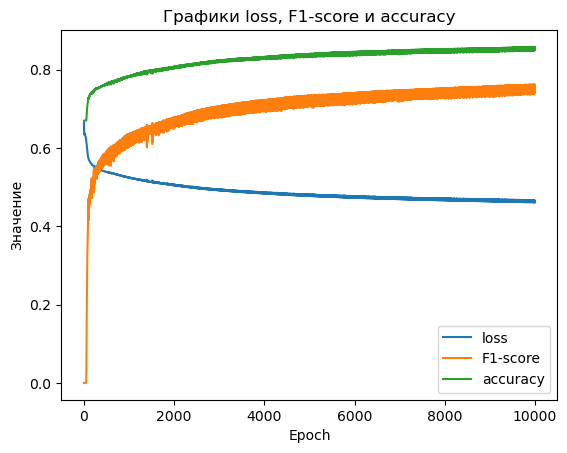

In [82]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf5['Epoch'], diagdf5['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf5['Epoch'], diagdf5['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf5['Epoch'], diagdf5['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [83]:
pred_test6=Mk6.forward(x_test.float())
pred_test_binarized6 = (pred_test6 > 0.5).float()

In [84]:
print(classification_report(y_test.to('cpu'), pred_test_binarized6.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.78      0.87      0.83      3226
         1.0       0.65      0.49      0.56      1537

    accuracy                           0.75      4763
   macro avg       0.72      0.68      0.69      4763
weighted avg       0.74      0.75      0.74      4763



In [85]:
#----------------------------------------------

<font color='red'>Word2Vec_MLP_Experiment_#7</font>

<font color='red'>layers - 2, epochs: 10000, lr: 0.001</font>

In [86]:
#----------------------------------------------

In [87]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK7(nn.Module): #изменить название
    def __init__(self, input_size, output_size):
        super(MLP_MK7, self).__init__()
        self.fc1 = nn.Linear(input_size, output_size)
#         self.relu = nn.ReLU()
#         self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
#         self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
#         self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
#         out = self.relu(out)
#         out = self.fc2(out)
        out = self.sigmoid(out)
#         out = self.fc3(out)
#         out = self.tanh(out)
        return out

In [88]:
Mk7=MLP_MK7(100,1) #изменить название переменной

In [89]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [90]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [91]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [92]:
Mk7=Mk7.to(dev)

In [93]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk7.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf6=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(10000):
    optimizer.zero_grad()
    pred = Mk7.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf6 = pd.concat([diagdf6, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.8214120864868164   f1-score: 0.4899734854698181   accuracy: 0.3247840106487274
Epoch:  2 , Loss:  0.8203332424163818   f1-score: 0.4899734854698181   accuracy: 0.3247840106487274
Epoch:  3 , Loss:  0.8192561268806458   f1-score: 0.4896654784679413   accuracy: 0.3245140314102173
Epoch:  4 , Loss:  0.8181809782981873   f1-score: 0.4894600808620453   accuracy: 0.324334055185318
Epoch:  5 , Loss:  0.8171077966690063   f1-score: 0.4893573522567749   accuracy: 0.32424405217170715
Epoch:  6 , Loss:  0.8160367608070374   f1-score: 0.4889463186264038   accuracy: 0.32388409972190857
Epoch:  7 , Loss:  0.8149681687355042   f1-score: 0.48884353041648865   accuracy: 0.32379409670829773
Epoch:  8 , Loss:  0.8139021396636963   f1-score: 0.4885319471359253   accuracy: 0.3237040936946869
Epoch:  9 , Loss:  0.8128386735916138   f1-score: 0.4878414273262024   accuracy: 0.3233441412448883
Epoch:  10 , Loss:  0.8117781281471252   f1-score: 0.4845953583717346   accuracy: 0.3225342035293

Epoch:  107 , Loss:  0.7383725643157959   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  108 , Loss:  0.7379461526870728   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  109 , Loss:  0.7375251650810242   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  110 , Loss:  0.737109363079071   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  111 , Loss:  0.7366986870765686   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  112 , Loss:  0.7362931370735168   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  113 , Loss:  0.735892653465271   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  114 , Loss:  0.7354970574378967   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  115 , Loss:  0.7351064085960388   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  116 , Loss:  0.7347205281257629   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  117 , Loss:  0.7343394756317139   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  118 , Loss:  0.733963131904602   f1-s

Epoch:  213 , Loss:  0.712552547454834   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  214 , Loss:  0.7124239206314087   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  215 , Loss:  0.7122966647148132   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  216 , Loss:  0.7121706008911133   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  217 , Loss:  0.7120457291603088   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  218 , Loss:  0.7119221091270447   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  219 , Loss:  0.7117996215820312   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  220 , Loss:  0.7116782665252686   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  221 , Loss:  0.7115581035614014   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  222 , Loss:  0.7114391326904297   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  223 , Loss:  0.7113211750984192   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  224 , Loss:  0.7112044095993042   f1

Epoch:  326 , Loss:  0.7033074498176575   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  327 , Loss:  0.7032569050788879   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  328 , Loss:  0.7032067775726318   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  329 , Loss:  0.7031569480895996   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  330 , Loss:  0.703107476234436   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  331 , Loss:  0.7030584216117859   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  332 , Loss:  0.7030096054077148   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  333 , Loss:  0.702961266040802   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  334 , Loss:  0.7029131054878235   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  335 , Loss:  0.7028653621673584   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  336 , Loss:  0.7028179168701172   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  337 , Loss:  0.7027708292007446   f1-

Epoch:  433 , Loss:  0.6994011998176575   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  434 , Loss:  0.6993751525878906   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  435 , Loss:  0.6993493437767029   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  436 , Loss:  0.6993236541748047   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  437 , Loss:  0.699298083782196   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  438 , Loss:  0.6992726922035217   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  439 , Loss:  0.699247419834137   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  440 , Loss:  0.6992223262786865   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  441 , Loss:  0.6991972923278809   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  442 , Loss:  0.6991724371910095   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  443 , Loss:  0.6991477012634277   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  444 , Loss:  0.6991230845451355   f1-

Epoch:  557 , Loss:  0.6970094442367554   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  558 , Loss:  0.6969952583312988   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  559 , Loss:  0.6969811916351318   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  560 , Loss:  0.6969671845436096   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  561 , Loss:  0.696953296661377   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  562 , Loss:  0.6969394087791443   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  563 , Loss:  0.6969255208969116   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  564 , Loss:  0.6969118118286133   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  565 , Loss:  0.6968980431556702   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  566 , Loss:  0.6968843936920166   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  567 , Loss:  0.696870744228363   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  568 , Loss:  0.696857213973999   f1-s

Epoch:  652 , Loss:  0.6958982944488525   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  653 , Loss:  0.6958887577056885   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  654 , Loss:  0.6958791017532349   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  655 , Loss:  0.6958696246147156   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  656 , Loss:  0.6958601474761963   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  657 , Loss:  0.695850670337677   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  658 , Loss:  0.6958412528038025   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  659 , Loss:  0.6958318948745728   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  660 , Loss:  0.6958224773406982   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  661 , Loss:  0.6958131790161133   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  662 , Loss:  0.6958038806915283   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  663 , Loss:  0.6957945823669434   f1

Epoch:  747 , Loss:  0.6951254606246948   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  748 , Loss:  0.6951186060905457   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  749 , Loss:  0.695111870765686   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  750 , Loss:  0.6951050162315369   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  751 , Loss:  0.6950982213020325   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  752 , Loss:  0.6950914263725281   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  753 , Loss:  0.6950847506523132   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  754 , Loss:  0.6950780153274536   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  755 , Loss:  0.6950713396072388   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  756 , Loss:  0.6950646638870239   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  757 , Loss:  0.6950579881668091   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  758 , Loss:  0.695051372051239   f1-

Epoch:  870 , Loss:  0.694427490234375   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  871 , Loss:  0.6944228410720825   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  872 , Loss:  0.6944181323051453   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  873 , Loss:  0.6944135427474976   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  874 , Loss:  0.6944088339805603   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  875 , Loss:  0.6944043040275574   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  876 , Loss:  0.6943996548652649   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  877 , Loss:  0.6943950653076172   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  878 , Loss:  0.6943904757499695   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  879 , Loss:  0.6943859457969666   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  880 , Loss:  0.6943813562393188   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  881 , Loss:  0.6943768262863159   f1

Epoch:  996 , Loss:  0.6939301490783691   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  997 , Loss:  0.6939268112182617   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  998 , Loss:  0.6939234733581543   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  999 , Loss:  0.6939202547073364   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1000 , Loss:  0.693916916847229   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1001 , Loss:  0.6939136385917664   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1002 , Loss:  0.6939103603363037   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1003 , Loss:  0.6939070820808411   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1004 , Loss:  0.6939038038253784   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1005 , Loss:  0.6939005851745605   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1006 , Loss:  0.6938973665237427   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1007 , Loss:  0.6938941478729

Epoch:  1119 , Loss:  0.6935776472091675   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1120 , Loss:  0.6935752034187317   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1121 , Loss:  0.6935727596282959   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1122 , Loss:  0.6935702562332153   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1123 , Loss:  0.6935678720474243   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1124 , Loss:  0.6935654282569885   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1125 , Loss:  0.6935629844665527   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1126 , Loss:  0.6935605406761169   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1127 , Loss:  0.6935581564903259   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1128 , Loss:  0.6935557126998901   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1129 , Loss:  0.6935533285140991   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1130 , Loss:  0.69355082

Epoch:  1215 , Loss:  0.6933643817901611   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1216 , Loss:  0.6933624148368835   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1217 , Loss:  0.6933603882789612   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1218 , Loss:  0.6933584213256836   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1219 , Loss:  0.693356454372406   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1220 , Loss:  0.6933545470237732   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1221 , Loss:  0.6933525204658508   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1222 , Loss:  0.6933505535125732   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1223 , Loss:  0.6933485269546509   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1224 , Loss:  0.6933466196060181   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1225 , Loss:  0.6933446526527405   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1226 , Loss:  0.693342685

Epoch:  1337 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1338 , Loss:  0.6931471824645996   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1339 , Loss:  0.6931456923484802   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1340 , Loss:  0.6931441426277161   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1341 , Loss:  0.6931425333023071   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1342 , Loss:  0.6931410431861877   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1343 , Loss:  0.6931394934654236   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1344 , Loss:  0.6931379437446594   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1345 , Loss:  0.6931363940238953   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1346 , Loss:  0.6931348443031311   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1347 , Loss:  0.6931332945823669   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1348 , Loss:  0.69313180

Epoch:  1461 , Loss:  0.6929759979248047   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1462 , Loss:  0.6929747462272644   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1463 , Loss:  0.6929735541343689   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1464 , Loss:  0.6929723024368286   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1465 , Loss:  0.6929710507392883   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1466 , Loss:  0.692969799041748   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1467 , Loss:  0.6929686069488525   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1468 , Loss:  0.6929673552513123   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1469 , Loss:  0.6929661631584167   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1470 , Loss:  0.6929649114608765   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1471 , Loss:  0.692963719367981   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1472 , Loss:  0.6929624676

Epoch:  1558 , Loss:  0.6928650736808777   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1559 , Loss:  0.6928640007972717   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1560 , Loss:  0.6928629279136658   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1561 , Loss:  0.6928619146347046   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1562 , Loss:  0.6928609013557434   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1563 , Loss:  0.6928598284721375   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1564 , Loss:  0.6928587555885315   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1565 , Loss:  0.6928577423095703   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1566 , Loss:  0.6928566694259644   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1567 , Loss:  0.692855715751648   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1568 , Loss:  0.692854642868042   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1569 , Loss:  0.6928535699

Epoch:  1653 , Loss:  0.692772388458252   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1654 , Loss:  0.6927714943885803   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1655 , Loss:  0.6927706003189087   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1656 , Loss:  0.6927697062492371   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1657 , Loss:  0.6927688121795654   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1658 , Loss:  0.6927679181098938   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1659 , Loss:  0.6927670240402222   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1660 , Loss:  0.6927661299705505   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1661 , Loss:  0.6927652359008789   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1662 , Loss:  0.6927643418312073   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1663 , Loss:  0.6927633881568909   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1664 , Loss:  0.692762553

Epoch:  1777 , Loss:  0.6926702857017517   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1778 , Loss:  0.6926695108413696   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1779 , Loss:  0.6926687955856323   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1780 , Loss:  0.692668080329895   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1781 , Loss:  0.6926672458648682   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1782 , Loss:  0.6926665902137756   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1783 , Loss:  0.6926657557487488   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1784 , Loss:  0.6926651000976562   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1785 , Loss:  0.6926642656326294   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1786 , Loss:  0.6926636099815369   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1787 , Loss:  0.6926628351211548   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1788 , Loss:  0.692662060

Epoch:  1871 , Loss:  0.6926042437553406   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1872 , Loss:  0.6926035284996033   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1873 , Loss:  0.6926028728485107   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1874 , Loss:  0.6926022171974182   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1875 , Loss:  0.6926016211509705   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1876 , Loss:  0.6926009058952332   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1877 , Loss:  0.6926003098487854   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1878 , Loss:  0.6925995945930481   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1879 , Loss:  0.6925989985466003   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1880 , Loss:  0.692598283290863   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1881 , Loss:  0.6925976872444153   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1882 , Loss:  0.692597031

Epoch:  1996 , Loss:  0.6925283074378967   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1997 , Loss:  0.6925278306007385   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1998 , Loss:  0.6925272941589355   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1999 , Loss:  0.6925266981124878   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2000 , Loss:  0.6925261616706848   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2001 , Loss:  0.6925255656242371   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2002 , Loss:  0.6925250291824341   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2003 , Loss:  0.6925244331359863   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2004 , Loss:  0.6925239562988281   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2005 , Loss:  0.6925233602523804   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2006 , Loss:  0.6925227642059326   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2007 , Loss:  0.69252222

Epoch:  2092 , Loss:  0.6924777030944824   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2093 , Loss:  0.6924772262573242   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2094 , Loss:  0.6924766898155212   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2095 , Loss:  0.692476212978363   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2096 , Loss:  0.6924757361412048   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2097 , Loss:  0.6924751996994019   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2098 , Loss:  0.6924747228622437   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2099 , Loss:  0.6924742460250854   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2100 , Loss:  0.6924737691879272   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2101 , Loss:  0.692473292350769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2102 , Loss:  0.6924728155136108   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2103 , Loss:  0.6924722790

Epoch:  2186 , Loss:  0.6924333572387695   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2187 , Loss:  0.6924329400062561   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2188 , Loss:  0.6924324631690979   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2189 , Loss:  0.6924319863319397   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2190 , Loss:  0.6924315690994263   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2191 , Loss:  0.6924311518669128   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2192 , Loss:  0.6924306750297546   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2193 , Loss:  0.6924302577972412   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2194 , Loss:  0.6924298405647278   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2195 , Loss:  0.6924293637275696   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2196 , Loss:  0.6924289464950562   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2197 , Loss:  0.69242846

Epoch:  2310 , Loss:  0.6923814415931702   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2311 , Loss:  0.6923810839653015   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2312 , Loss:  0.6923806667327881   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2313 , Loss:  0.6923803091049194   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2314 , Loss:  0.692379891872406   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2315 , Loss:  0.6923794746398926   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2316 , Loss:  0.6923791170120239   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2317 , Loss:  0.6923786997795105   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2318 , Loss:  0.6923783421516418   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2319 , Loss:  0.6923779845237732   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2320 , Loss:  0.6923775672912598   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2321 , Loss:  0.692377150

Epoch:  2433 , Loss:  0.6923360228538513   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2434 , Loss:  0.6923356652259827   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2435 , Loss:  0.692335307598114   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2436 , Loss:  0.6923350095748901   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2437 , Loss:  0.6923346519470215   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2438 , Loss:  0.6923342943191528   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2439 , Loss:  0.6923339366912842   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2440 , Loss:  0.6923335790634155   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2441 , Loss:  0.6923332214355469   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2442 , Loss:  0.6923328638076782   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2443 , Loss:  0.6923325061798096   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2444 , Loss:  0.692332208

Epoch:  2527 , Loss:  0.6923046112060547   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2528 , Loss:  0.6923043131828308   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2529 , Loss:  0.6923039555549622   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2530 , Loss:  0.6923037171363831   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2531 , Loss:  0.6923033595085144   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2532 , Loss:  0.6923030614852905   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2533 , Loss:  0.6923027038574219   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2534 , Loss:  0.692302405834198   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2535 , Loss:  0.6923020482063293   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2536 , Loss:  0.6923017501831055   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2537 , Loss:  0.6923013925552368   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2538 , Loss:  0.692301094

Epoch:  2650 , Loss:  0.692267119884491   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2651 , Loss:  0.6922668814659119   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2652 , Loss:  0.692266583442688   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2653 , Loss:  0.6922662854194641   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2654 , Loss:  0.6922659873962402   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2655 , Loss:  0.6922657489776611   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2656 , Loss:  0.6922653913497925   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2657 , Loss:  0.6922650933265686   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2658 , Loss:  0.6922648549079895   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2659 , Loss:  0.6922646164894104   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2660 , Loss:  0.6922642588615417   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2661 , Loss:  0.6922639608

Epoch:  2764 , Loss:  0.6922354102134705   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2765 , Loss:  0.6922351717948914   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2766 , Loss:  0.6922348737716675   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2767 , Loss:  0.6922346353530884   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2768 , Loss:  0.6922343373298645   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2769 , Loss:  0.6922340989112854   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2770 , Loss:  0.6922338604927063   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2771 , Loss:  0.6922335624694824   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2772 , Loss:  0.6922333240509033   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2773 , Loss:  0.6922330260276794   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2774 , Loss:  0.6922327876091003   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2775 , Loss:  0.69223248

Epoch:  2882 , Loss:  0.6922050714492798   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2883 , Loss:  0.6922048330307007   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2884 , Loss:  0.6922045946121216   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2885 , Loss:  0.6922042965888977   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2886 , Loss:  0.6922041177749634   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2887 , Loss:  0.6922038793563843   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2888 , Loss:  0.6922035813331604   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2889 , Loss:  0.6922033429145813   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2890 , Loss:  0.6922030448913574   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2891 , Loss:  0.6922029256820679   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2892 , Loss:  0.692202627658844   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2893 , Loss:  0.692202389

Epoch:  2999 , Loss:  0.6921770572662354   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3000 , Loss:  0.6921768188476562   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3001 , Loss:  0.6921765804290771   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3002 , Loss:  0.692176342010498   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3003 , Loss:  0.692176103591919   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3004 , Loss:  0.6921758651733398   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3005 , Loss:  0.6921756267547607   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3006 , Loss:  0.6921753883361816   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3007 , Loss:  0.6921752095222473   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3008 , Loss:  0.6921749711036682   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3009 , Loss:  0.6921747326850891   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3010 , Loss:  0.6921744942

Epoch:  3122 , Loss:  0.69214928150177   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3123 , Loss:  0.6921490430831909   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3124 , Loss:  0.6921488642692566   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3125 , Loss:  0.6921486258506775   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3126 , Loss:  0.6921483874320984   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3127 , Loss:  0.6921482086181641   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3128 , Loss:  0.692147970199585   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3129 , Loss:  0.6921477317810059   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3130 , Loss:  0.6921475529670715   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3131 , Loss:  0.6921473145484924   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3132 , Loss:  0.6921470761299133   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3133 , Loss:  0.69214689731

Epoch:  3244 , Loss:  0.6921231150627136   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3245 , Loss:  0.6921229362487793   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3246 , Loss:  0.692122757434845   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3247 , Loss:  0.6921224594116211   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3248 , Loss:  0.6921222805976868   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3249 , Loss:  0.6921220421791077   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3250 , Loss:  0.6921218633651733   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3251 , Loss:  0.692121684551239   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3252 , Loss:  0.6921214461326599   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3253 , Loss:  0.6921212673187256   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3254 , Loss:  0.6921210289001465   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3255 , Loss:  0.6921208500

Epoch:  3352 , Loss:  0.6921008825302124   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3353 , Loss:  0.6921007037162781   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3354 , Loss:  0.6921004056930542   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3355 , Loss:  0.6921002268791199   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3356 , Loss:  0.6921000480651855   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3357 , Loss:  0.6920998692512512   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3358 , Loss:  0.6920996308326721   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3359 , Loss:  0.6920994520187378   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3360 , Loss:  0.6920992732048035   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3361 , Loss:  0.6920990347862244   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3362 , Loss:  0.69209885597229   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3363 , Loss:  0.6920986771

Epoch:  3458 , Loss:  0.6920796036720276   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3459 , Loss:  0.6920794248580933   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3460 , Loss:  0.6920791864395142   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3461 , Loss:  0.6920790076255798   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3462 , Loss:  0.6920788288116455   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3463 , Loss:  0.6920786499977112   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3464 , Loss:  0.6920784711837769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3465 , Loss:  0.6920782327651978   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3466 , Loss:  0.6920779943466187   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3467 , Loss:  0.6920778155326843   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3468 , Loss:  0.69207763671875   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3469 , Loss:  0.6920773983

Epoch:  3557 , Loss:  0.6920601725578308   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3558 , Loss:  0.6920599341392517   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3559 , Loss:  0.6920597553253174   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3560 , Loss:  0.6920595765113831   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3561 , Loss:  0.6920593976974487   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3562 , Loss:  0.6920592188835144   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3563 , Loss:  0.6920589208602905   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3564 , Loss:  0.6920587420463562   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3565 , Loss:  0.6920585632324219   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3566 , Loss:  0.6920583844184875   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3567 , Loss:  0.692058265209198   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3568 , Loss:  0.692057967

Epoch:  3664 , Loss:  0.6920393705368042   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3665 , Loss:  0.6920391917228699   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3666 , Loss:  0.6920390129089355   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3667 , Loss:  0.6920388340950012   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3668 , Loss:  0.6920386552810669   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3669 , Loss:  0.692038357257843   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3670 , Loss:  0.6920381784439087   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3671 , Loss:  0.6920379996299744   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3672 , Loss:  0.6920378804206848   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3673 , Loss:  0.6920377016067505   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3674 , Loss:  0.6920374035835266   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3675 , Loss:  0.692037224

Epoch:  3781 , Loss:  0.6920168399810791   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3782 , Loss:  0.6920166015625   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3783 , Loss:  0.6920164227485657   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3784 , Loss:  0.6920162439346313   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3785 , Loss:  0.692016065120697   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3786 , Loss:  0.6920158863067627   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3787 , Loss:  0.6920155882835388   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3788 , Loss:  0.6920154690742493   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3789 , Loss:  0.6920152902603149   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3790 , Loss:  0.6920151114463806   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3791 , Loss:  0.6920149326324463   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3792 , Loss:  0.692014634609

Epoch:  3897 , Loss:  0.6919944286346436   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3898 , Loss:  0.6919942498207092   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3899 , Loss:  0.6919940114021301   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3900 , Loss:  0.6919938921928406   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3901 , Loss:  0.6919936537742615   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3902 , Loss:  0.6919934749603271   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3903 , Loss:  0.691993236541748   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3904 , Loss:  0.6919930577278137   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3905 , Loss:  0.6919928789138794   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3906 , Loss:  0.6919927000999451   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3907 , Loss:  0.6919925212860107   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3908 , Loss:  0.691992342

Epoch:  4015 , Loss:  0.691971480846405   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4016 , Loss:  0.6919713020324707   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4017 , Loss:  0.6919710636138916   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4018 , Loss:  0.6919708847999573   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4019 , Loss:  0.691970705986023   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4020 , Loss:  0.6919705271720886   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4021 , Loss:  0.6919702887535095   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4022 , Loss:  0.6919701099395752   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4023 , Loss:  0.6919699311256409   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4024 , Loss:  0.6919697523117065   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4025 , Loss:  0.6919694542884827   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4026 , Loss:  0.6919692754

Epoch:  4117 , Loss:  0.6919513940811157   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4118 , Loss:  0.6919512152671814   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4119 , Loss:  0.6919510364532471   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4120 , Loss:  0.6919507384300232   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4121 , Loss:  0.6919505596160889   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4122 , Loss:  0.6919503808021545   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4123 , Loss:  0.6919502019882202   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4124 , Loss:  0.6919499635696411   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4125 , Loss:  0.6919497847557068   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4126 , Loss:  0.6919496059417725   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4127 , Loss:  0.6919493675231934   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4128 , Loss:  0.69194924

Epoch:  4214 , Loss:  0.691931962966919   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4215 , Loss:  0.6919317841529846   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4216 , Loss:  0.6919316053390503   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4217 , Loss:  0.6919313669204712   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4218 , Loss:  0.6919311881065369   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4219 , Loss:  0.6919310092926025   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4220 , Loss:  0.6919308304786682   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4221 , Loss:  0.6919305324554443   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4222 , Loss:  0.69193035364151   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4223 , Loss:  0.6919301748275757   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4224 , Loss:  0.6919299364089966   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4225 , Loss:  0.69192975759

Epoch:  4338 , Loss:  0.6919065713882446   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4339 , Loss:  0.6919063925743103   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4340 , Loss:  0.691906213760376   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4341 , Loss:  0.6919059157371521   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4342 , Loss:  0.6919057369232178   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4343 , Loss:  0.6919055581092834   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4344 , Loss:  0.6919053792953491   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4345 , Loss:  0.69190514087677   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4346 , Loss:  0.6919049620628357   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4347 , Loss:  0.6919047236442566   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4348 , Loss:  0.6919045448303223   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4349 , Loss:  0.69190436601

Epoch:  4460 , Loss:  0.6918808817863464   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4461 , Loss:  0.6918806433677673   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4462 , Loss:  0.691880464553833   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4463 , Loss:  0.6918802857398987   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4464 , Loss:  0.6918800473213196   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4465 , Loss:  0.6918798089027405   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4466 , Loss:  0.6918795704841614   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4467 , Loss:  0.691879391670227   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4468 , Loss:  0.691879153251648   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4469 , Loss:  0.6918789744377136   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4470 , Loss:  0.6918787360191345   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4471 , Loss:  0.69187855720

Epoch:  4567 , Loss:  0.691857635974884   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4568 , Loss:  0.6918573975563049   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4569 , Loss:  0.6918571591377258   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4570 , Loss:  0.6918569803237915   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4571 , Loss:  0.6918567419052124   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4572 , Loss:  0.6918565630912781   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4573 , Loss:  0.6918562650680542   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4574 , Loss:  0.6918560862541199   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4575 , Loss:  0.6918558478355408   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4576 , Loss:  0.6918556690216064   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4577 , Loss:  0.6918554306030273   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4578 , Loss:  0.691855251

Epoch:  4677 , Loss:  0.691832959651947   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4678 , Loss:  0.6918327808380127   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4679 , Loss:  0.6918324828147888   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4680 , Loss:  0.6918322443962097   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4681 , Loss:  0.6918320059776306   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4682 , Loss:  0.6918318271636963   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4683 , Loss:  0.6918315887451172   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4684 , Loss:  0.6918313503265381   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4685 , Loss:  0.6918311715126038   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4686 , Loss:  0.6918308734893799   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4687 , Loss:  0.6918306946754456   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4688 , Loss:  0.691830456

Epoch:  4779 , Loss:  0.691809356212616   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4780 , Loss:  0.6918091177940369   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4781 , Loss:  0.691808819770813   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4782 , Loss:  0.6918085813522339   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4783 , Loss:  0.6918084025382996   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4784 , Loss:  0.6918081045150757   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4785 , Loss:  0.6918079257011414   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4786 , Loss:  0.6918076872825623   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4787 , Loss:  0.6918074488639832   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4788 , Loss:  0.6918071508407593   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4789 , Loss:  0.6918069124221802   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4790 , Loss:  0.6918067336

Epoch:  4899 , Loss:  0.6917804479598999   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4900 , Loss:  0.6917802691459656   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4901 , Loss:  0.6917799711227417   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4902 , Loss:  0.6917797327041626   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4903 , Loss:  0.6917794942855835   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4904 , Loss:  0.6917792558670044   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4905 , Loss:  0.6917790174484253   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4906 , Loss:  0.6917787790298462   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4907 , Loss:  0.6917784810066223   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4908 , Loss:  0.691778302192688   f1-score: 0.0

Epoch:  5001 , Loss:  0.6917550563812256   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  5002 , Loss:  0.6917547583580017   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  5003 , Loss:  0.6917545795440674   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  5004 , Loss:  0.6917542219161987   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  5005 , Loss:  0.6917540431022644   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  5006 , Loss:  0.6917538046836853   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  5007 , Loss:  0.6917535066604614   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  5008 , Loss:  0.6917532682418823   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  5009 , Loss:  0.6917530298233032   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  5010 , Loss:  0.6917527318000793   f1-score: 0.009206607

Epoch:  5085 , Loss:  0.6917334794998169   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  5086 , Loss:  0.691733181476593   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  5087 , Loss:  0.6917328834533691   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  5088 , Loss:  0.6917327046394348   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  5089 , Loss:  0.6917324066162109   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  5090 , Loss:  0.6917321085929871   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  5091 , Loss:  0.691731870174408   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  5092 , Loss:  0.6917315721511841   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  5093 , Loss:  0.691731333732605   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  5094 , Loss:  0.6917310953140259   f1-score: 0.01028138492256403   a

Epoch:  5190 , Loss:  0.691705584526062   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  5191 , Loss:  0.6917052865028381   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  5192 , Loss:  0.691705048084259   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  5193 , Loss:  0.6917047500610352   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  5194 , Loss:  0.691704511642456   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  5195 , Loss:  0.6917042136192322   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  5196 , Loss:  0.6917039155960083   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  5197 , Loss:  0.6917036771774292   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  5198 , Loss:  0.6917033791542053   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  5199 , Loss:  0.691703200340271   f1-score: 0.0113574909046

Epoch:  5294 , Loss:  0.6916769742965698   f1-score: 0.015650296583771706   accuracy: 0.6717062592506409
Epoch:  5295 , Loss:  0.6916767358779907   f1-score: 0.015650296583771706   accuracy: 0.6717062592506409
Epoch:  5296 , Loss:  0.6916764378547668   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  5297 , Loss:  0.691676139831543   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  5298 , Loss:  0.6916759014129639   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  5299 , Loss:  0.69167560338974   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5300 , Loss:  0.6916753053665161   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5301 , Loss:  0.691675066947937   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5302 , Loss:  0.6916747689247131   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5303 , Loss:  0.6916744709014893   f1-score: 0.01725532

Epoch:  5396 , Loss:  0.6916480660438538   f1-score: 0.020452098920941353   accuracy: 0.6724262237548828
Epoch:  5397 , Loss:  0.6916477084159851   f1-score: 0.020452098920941353   accuracy: 0.6724262237548828
Epoch:  5398 , Loss:  0.691647469997406   f1-score: 0.020452098920941353   accuracy: 0.6724262237548828
Epoch:  5399 , Loss:  0.6916471719741821   f1-score: 0.021516945213079453   accuracy: 0.6726061701774597
Epoch:  5400 , Loss:  0.6916468739509583   f1-score: 0.021516945213079453   accuracy: 0.6726061701774597
Epoch:  5401 , Loss:  0.6916465759277344   f1-score: 0.021516945213079453   accuracy: 0.6726061701774597
Epoch:  5402 , Loss:  0.6916463375091553   f1-score: 0.021516945213079453   accuracy: 0.6726061701774597
Epoch:  5403 , Loss:  0.6916460394859314   f1-score: 0.021516945213079453   accuracy: 0.6726061701774597
Epoch:  5404 , Loss:  0.6916457414627075   f1-score: 0.021516945213079453   accuracy: 0.6726061701774597
Epoch:  5405 , Loss:  0.6916454434394836   f1-score: 0.0

Epoch:  5494 , Loss:  0.691619336605072   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  5495 , Loss:  0.6916190385818481   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  5496 , Loss:  0.6916187405586243   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  5497 , Loss:  0.6916184425354004   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  5498 , Loss:  0.6916181445121765   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  5499 , Loss:  0.6916178464889526   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  5500 , Loss:  0.6916175484657288   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  5501 , Loss:  0.6916172504425049   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  5502 , Loss:  0.691616952419281   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  5503 , Loss:  0.6916166543960571   f1-score: 0.02

Epoch:  5591 , Loss:  0.6915900707244873   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5592 , Loss:  0.6915898323059082   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5593 , Loss:  0.6915894746780396   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5594 , Loss:  0.6915891766548157   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5595 , Loss:  0.6915888786315918   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5596 , Loss:  0.6915885210037231   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5597 , Loss:  0.691588282585144   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5598 , Loss:  0.6915879845619202   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5599 , Loss:  0.6915876865386963   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5600 , Loss:  0.6915873885154724   f1-score: 0.0

Epoch:  5688 , Loss:  0.6915600299835205   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  5689 , Loss:  0.6915597915649414   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  5690 , Loss:  0.6915594339370728   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  5691 , Loss:  0.6915591359138489   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  5692 , Loss:  0.6915587782859802   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  5693 , Loss:  0.6915584802627563   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  5694 , Loss:  0.6915581822395325   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  5695 , Loss:  0.6915578842163086   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  5696 , Loss:  0.6915575861930847   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  5697 , Loss:  0.6915572285652161   f1-score: 0.

Epoch:  5783 , Loss:  0.6915298700332642   f1-score: 0.03578104078769684   accuracy: 0.6750360131263733
Epoch:  5784 , Loss:  0.6915296316146851   f1-score: 0.03578104078769684   accuracy: 0.6750360131263733
Epoch:  5785 , Loss:  0.6915292739868164   f1-score: 0.03578104078769684   accuracy: 0.6750360131263733
Epoch:  5786 , Loss:  0.6915289759635925   f1-score: 0.03578104078769684   accuracy: 0.6750360131263733
Epoch:  5787 , Loss:  0.6915286779403687   f1-score: 0.03578104078769684   accuracy: 0.6750360131263733
Epoch:  5788 , Loss:  0.6915283203125   f1-score: 0.03578104078769684   accuracy: 0.6750360131263733
Epoch:  5789 , Loss:  0.6915280222892761   f1-score: 0.03578104078769684   accuracy: 0.6750360131263733
Epoch:  5790 , Loss:  0.6915276646614075   f1-score: 0.03578104078769684   accuracy: 0.6750360131263733
Epoch:  5791 , Loss:  0.6915273070335388   f1-score: 0.03578104078769684   accuracy: 0.6750360131263733
Epoch:  5792 , Loss:  0.6915270090103149   f1-score: 0.035781040787

Epoch:  5872 , Loss:  0.6915010809898376   f1-score: 0.03787676617503166   accuracy: 0.6753959655761719
Epoch:  5873 , Loss:  0.691500723361969   f1-score: 0.03787676617503166   accuracy: 0.6753959655761719
Epoch:  5874 , Loss:  0.6915004253387451   f1-score: 0.03787676617503166   accuracy: 0.6753959655761719
Epoch:  5875 , Loss:  0.6915000677108765   f1-score: 0.03787676617503166   accuracy: 0.6753959655761719
Epoch:  5876 , Loss:  0.6914997100830078   f1-score: 0.03787676617503166   accuracy: 0.6753959655761719
Epoch:  5877 , Loss:  0.6914994120597839   f1-score: 0.03787676617503166   accuracy: 0.6753959655761719
Epoch:  5878 , Loss:  0.6914991140365601   f1-score: 0.03787676617503166   accuracy: 0.6753959655761719
Epoch:  5879 , Loss:  0.6914987564086914   f1-score: 0.03787676617503166   accuracy: 0.6753959655761719
Epoch:  5880 , Loss:  0.6914983987808228   f1-score: 0.03787676617503166   accuracy: 0.6753959655761719
Epoch:  5881 , Loss:  0.6914981007575989   f1-score: 0.0378767661

Epoch:  5977 , Loss:  0.6914663314819336   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5978 , Loss:  0.6914659738540649   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5979 , Loss:  0.6914656162261963   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5980 , Loss:  0.6914653182029724   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5981 , Loss:  0.6914649605751038   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5982 , Loss:  0.6914646029472351   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5983 , Loss:  0.6914643049240112   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5984 , Loss:  0.6914639472961426   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5985 , Loss:  0.6914636492729187   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5986 , Loss:  0.69146329164505   f1-score: 0.04049014300

Epoch:  6072 , Loss:  0.6914342641830444   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  6073 , Loss:  0.6914339661598206   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  6074 , Loss:  0.6914336681365967   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  6075 , Loss:  0.691433310508728   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  6076 , Loss:  0.6914329528808594   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  6077 , Loss:  0.6914325952529907   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  6078 , Loss:  0.6914322376251221   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  6079 , Loss:  0.6914318799972534   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  6080 , Loss:  0.6914315819740295   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  6081 , Loss:  0.6914312243461609   f1-score: 0.0404901430

Epoch:  6180 , Loss:  0.6913973093032837   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6181 , Loss:  0.691396951675415   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6182 , Loss:  0.6913966536521912   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6183 , Loss:  0.6913962960243225   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6184 , Loss:  0.6913959383964539   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6185 , Loss:  0.6913955807685852   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6186 , Loss:  0.6913952231407166   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6187 , Loss:  0.6913948655128479   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6188 , Loss:  0.691394567489624   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6189 , Loss:  0.6913942098617554   f1-score: 0.04100106656

Epoch:  6272 , Loss:  0.6913654804229736   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6273 , Loss:  0.691365122795105   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6274 , Loss:  0.6913647651672363   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6275 , Loss:  0.6913644075393677   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6276 , Loss:  0.691364049911499   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6277 , Loss:  0.6913636922836304   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6278 , Loss:  0.6913633346557617   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6279 , Loss:  0.6913629770278931   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6280 , Loss:  0.6913626194000244   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6281 , Loss:  0.6913622617721558   f1-score: 0.0425645112991333   a

Epoch:  6364 , Loss:  0.6913333535194397   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  6365 , Loss:  0.691332995891571   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  6366 , Loss:  0.6913326382637024   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6367 , Loss:  0.691332221031189   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6368 , Loss:  0.6913318634033203   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6369 , Loss:  0.6913315057754517   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6370 , Loss:  0.6913312077522278   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6371 , Loss:  0.6913308501243591   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6372 , Loss:  0.6913304924964905   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6373 , Loss:  0.6913301348686218   f1-score: 0.04359383136

Epoch:  6451 , Loss:  0.6913027167320251   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6452 , Loss:  0.6913024187088013   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6453 , Loss:  0.6913020610809326   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6454 , Loss:  0.6913016438484192   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6455 , Loss:  0.6913012862205505   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6456 , Loss:  0.6913010478019714   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6457 , Loss:  0.691300630569458   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6458 , Loss:  0.6913002729415894   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6459 , Loss:  0.6912999153137207   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6460 , Loss:  0.691299557685852   f1-score: 0.04411374032

Epoch:  6546 , Loss:  0.6912693381309509   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6547 , Loss:  0.6912689208984375   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6548 , Loss:  0.6912686228752136   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6549 , Loss:  0.691268265247345   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6550 , Loss:  0.6912679076194763   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6551 , Loss:  0.6912675499916077   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6552 , Loss:  0.691267192363739   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6553 , Loss:  0.6912668347358704   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6554 , Loss:  0.6912664771080017   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6555 , Loss:  0.6912661194801331   f1-score: 0.04463336989

Epoch:  6645 , Loss:  0.6912344694137573   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6646 , Loss:  0.6912341117858887   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6647 , Loss:  0.6912336945533752   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6648 , Loss:  0.6912333369255066   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6649 , Loss:  0.6912330389022827   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6650 , Loss:  0.6912326812744141   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6651 , Loss:  0.6912323236465454   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6652 , Loss:  0.6912319660186768   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6653 , Loss:  0.6912316083908081   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6654 , Loss:  0.6912312507629395   f1-score: 0.044633369

Epoch:  6734 , Loss:  0.691203236579895   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6735 , Loss:  0.6912028789520264   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6736 , Loss:  0.6912025213241577   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6737 , Loss:  0.6912021636962891   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6738 , Loss:  0.6912018060684204   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6739 , Loss:  0.6912014484405518   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6740 , Loss:  0.6912010908126831   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6741 , Loss:  0.6912007331848145   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6742 , Loss:  0.6912004351615906   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6743 , Loss:  0.6912000775337219   f1-score: 0.0451527237

Epoch:  6813 , Loss:  0.691175639629364   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6814 , Loss:  0.6911753416061401   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6815 , Loss:  0.6911749839782715   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6816 , Loss:  0.6911745667457581   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6817 , Loss:  0.6911742091178894   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6818 , Loss:  0.6911738514900208   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6819 , Loss:  0.6911735534667969   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6820 , Loss:  0.6911731958389282   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6821 , Loss:  0.6911728382110596   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6822 , Loss:  0.6911724805831909   f1-score: 0.0456718020

Epoch:  6922 , Loss:  0.6911379098892212   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6923 , Loss:  0.6911375522613525   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6924 , Loss:  0.6911371946334839   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6925 , Loss:  0.69113689661026   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6926 , Loss:  0.6911365389823914   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6927 , Loss:  0.6911361813545227   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6928 , Loss:  0.6911358833312988   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6929 , Loss:  0.6911355257034302   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6930 , Loss:  0.6911352276802063   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6931 , Loss:  0.6911348104476929   f1-score: 0.04567180201

Epoch:  7031 , Loss:  0.6911007165908813   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7032 , Loss:  0.6911003589630127   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7033 , Loss:  0.6911000609397888   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7034 , Loss:  0.6910997033119202   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7035 , Loss:  0.6910993456840515   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7036 , Loss:  0.6910989880561829   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7037 , Loss:  0.691098690032959   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7038 , Loss:  0.6910983920097351   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7039 , Loss:  0.6910979747772217   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7040 , Loss:  0.6910976767539978   f1-score: 0.0456718020

Epoch:  7113 , Loss:  0.6910731196403503   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7114 , Loss:  0.6910728216171265   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7115 , Loss:  0.6910724639892578   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7116 , Loss:  0.6910721659660339   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7117 , Loss:  0.6910717487335205   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7118 , Loss:  0.6910714507102966   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7119 , Loss:  0.691071093082428   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7120 , Loss:  0.6910707950592041   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7121 , Loss:  0.6910704374313354   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7122 , Loss:  0.6910701394081116   f1-score: 0.0456718020

Epoch:  7206 , Loss:  0.6910423040390015   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7207 , Loss:  0.6910419464111328   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7208 , Loss:  0.6910415887832642   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7209 , Loss:  0.6910412907600403   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7210 , Loss:  0.6910409927368164   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7211 , Loss:  0.6910406351089478   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7212 , Loss:  0.6910402774810791   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7213 , Loss:  0.6910400390625   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7214 , Loss:  0.6910396814346313   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7215 , Loss:  0.6910393238067627   f1-score: 0.045671802014

Epoch:  7289 , Loss:  0.6910152435302734   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7290 , Loss:  0.6910149455070496   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7291 , Loss:  0.6910146474838257   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7292 , Loss:  0.691014289855957   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7293 , Loss:  0.6910139918327332   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  7294 , Loss:  0.6910136342048645   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7295 , Loss:  0.6910132765769958   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7296 , Loss:  0.691012978553772   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7297 , Loss:  0.6910126805305481   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7298 , Loss:  0.6910123229026794   f1-score: 0.04619060084

Epoch:  7385 , Loss:  0.6909846067428589   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7386 , Loss:  0.690984308719635   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7387 , Loss:  0.6909839510917664   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7388 , Loss:  0.6909837126731873   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7389 , Loss:  0.6909833550453186   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7390 , Loss:  0.6909830570220947   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7391 , Loss:  0.6909826993942261   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7392 , Loss:  0.6909824013710022   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7393 , Loss:  0.6909820437431335   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7394 , Loss:  0.6909817457199097   f1-score: 0.0461783446

Epoch:  7476 , Loss:  0.690956175327301   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7477 , Loss:  0.6909559369087219   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7478 , Loss:  0.6909555792808533   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7479 , Loss:  0.6909552812576294   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7480 , Loss:  0.6909549236297607   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7481 , Loss:  0.6909546256065369   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7482 , Loss:  0.690954327583313   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7483 , Loss:  0.6909540295600891   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7484 , Loss:  0.6909537315368652   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7485 , Loss:  0.6909533739089966   f1-score: 0.04617834463

Epoch:  7567 , Loss:  0.6909283995628357   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7568 , Loss:  0.6909281611442566   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7569 , Loss:  0.6909278035163879   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7570 , Loss:  0.6909275054931641   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7571 , Loss:  0.6909272074699402   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7572 , Loss:  0.6909269094467163   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7573 , Loss:  0.6909266710281372   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7574 , Loss:  0.6909263134002686   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7575 , Loss:  0.6909260153770447   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7576 , Loss:  0.6909257173538208   f1-score: 0.046696737408638   accuracy:

Epoch:  7675 , Loss:  0.6908963322639465   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7676 , Loss:  0.6908960938453674   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7677 , Loss:  0.6908957362174988   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7678 , Loss:  0.6908954381942749   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7679 , Loss:  0.6908951997756958   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7680 , Loss:  0.6908949017524719   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7681 , Loss:  0.6908945441246033   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7682 , Loss:  0.6908943057060242   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7683 , Loss:  0.6908940672874451   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7684 , Loss:  0.6908937096595764   f1-score: 0.

Epoch:  7779 , Loss:  0.6908664107322693   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7780 , Loss:  0.6908661127090454   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7781 , Loss:  0.6908658146858215   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7782 , Loss:  0.6908654570579529   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7783 , Loss:  0.6908652782440186   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7784 , Loss:  0.6908649802207947   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7785 , Loss:  0.6908646821975708   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7786 , Loss:  0.6908644437789917   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7787 , Loss:  0.6908641457557678   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7788 , Loss:  0.6908637881278992   f1-score: 0.

Epoch:  7865 , Loss:  0.6908422708511353   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7866 , Loss:  0.6908420324325562   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7867 , Loss:  0.6908417344093323   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7868 , Loss:  0.6908414363861084   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7869 , Loss:  0.6908411979675293   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7870 , Loss:  0.6908408999443054   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7871 , Loss:  0.6908406019210815   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7872 , Loss:  0.6908403635025024   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7873 , Loss:  0.6908400654792786   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7874 , Loss:  0.6908398270606995   f1-score: 0.

Epoch:  7952 , Loss:  0.6908185482025146   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7953 , Loss:  0.6908183097839355   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7954 , Loss:  0.6908180117607117   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7955 , Loss:  0.6908177733421326   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7956 , Loss:  0.6908174753189087   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7957 , Loss:  0.6908172369003296   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7958 , Loss:  0.6908169388771057   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7959 , Loss:  0.6908166408538818   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7960 , Loss:  0.6908164620399475   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7961 , Loss:  0.6908161640167236   f1-score: 0.047202333

Epoch:  8043 , Loss:  0.6907944083213806   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  8044 , Loss:  0.6907941699028015   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  8045 , Loss:  0.6907938718795776   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  8046 , Loss:  0.6907936334609985   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  8047 , Loss:  0.6907933354377747   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  8048 , Loss:  0.6907930970191956   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  8049 , Loss:  0.6907928586006165   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  8050 , Loss:  0.6907925605773926   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  8051 , Loss:  0.6907922625541687   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  8052 , Loss:  0.6907920837402344   f1-score: 0.04823747649788856

Epoch:  8144 , Loss:  0.6907684206962585   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  8145 , Loss:  0.6907681822776794   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  8146 , Loss:  0.6907678842544556   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  8147 , Loss:  0.6907676458358765   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  8148 , Loss:  0.6907674074172974   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  8149 , Loss:  0.6907671689987183   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  8150 , Loss:  0.6907668709754944   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  8151 , Loss:  0.6907666325569153   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  8152 , Loss:  0.6907663941383362   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  8153 , Loss:  0.6907661557197571   f1-score: 0.048237476

Epoch:  8253 , Loss:  0.6907413005828857   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8254 , Loss:  0.6907410621643066   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8255 , Loss:  0.6907407641410828   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8256 , Loss:  0.6907405853271484   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8257 , Loss:  0.6907402873039246   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8258 , Loss:  0.6907400488853455   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8259 , Loss:  0.6907398104667664   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8260 , Loss:  0.6907395720481873   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8261 , Loss:  0.6907393336296082   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8262 , Loss:  0.690739095211029   f1-score: 0.0482246950

Epoch:  8369 , Loss:  0.6907134652137756   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8370 , Loss:  0.6907131671905518   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8371 , Loss:  0.6907129287719727   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8372 , Loss:  0.6907127499580383   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8373 , Loss:  0.6907124519348145   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8374 , Loss:  0.6907122731208801   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8375 , Loss:  0.6907119750976562   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8376 , Loss:  0.6907117962837219   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8377 , Loss:  0.6907115578651428   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8378 , Loss:  0.6907113194465637   f1-score: 0.

Epoch:  8464 , Loss:  0.6906914114952087   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8465 , Loss:  0.6906911134719849   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8466 , Loss:  0.6906908750534058   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8467 , Loss:  0.6906906366348267   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8468 , Loss:  0.6906903982162476   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8469 , Loss:  0.6906902194023132   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8470 , Loss:  0.6906899809837341   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8471 , Loss:  0.690689742565155   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8472 , Loss:  0.6906895041465759   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8473 , Loss:  0.6906893253326416   f1-score: 0.0

Epoch:  8553 , Loss:  0.6906712651252747   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8554 , Loss:  0.6906710863113403   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8555 , Loss:  0.6906708478927612   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8556 , Loss:  0.6906706094741821   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8557 , Loss:  0.690670371055603   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8558 , Loss:  0.6906701922416687   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8559 , Loss:  0.6906699538230896   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8560 , Loss:  0.6906697154045105   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8561 , Loss:  0.6906694769859314   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8562 , Loss:  0.6906692981719971   f1-score: 0.0

Epoch:  8638 , Loss:  0.69065260887146   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8639 , Loss:  0.6906523704528809   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8640 , Loss:  0.6906521916389465   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8641 , Loss:  0.6906519532203674   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8642 , Loss:  0.6906517148017883   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8643 , Loss:  0.690651535987854   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8644 , Loss:  0.6906512975692749   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8645 , Loss:  0.6906511187553406   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8646 , Loss:  0.6906508803367615   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8647 , Loss:  0.6906507015228271   f1-score: 0.048

Epoch:  8722 , Loss:  0.6906346082687378   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8723 , Loss:  0.6906344294548035   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8724 , Loss:  0.6906341910362244   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8725 , Loss:  0.69063401222229   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8726 , Loss:  0.6906337141990662   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8727 , Loss:  0.6906335353851318   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8728 , Loss:  0.6906333565711975   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8729 , Loss:  0.6906331181526184   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8730 , Loss:  0.6906329393386841   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8731 , Loss:  0.690632700920105   f1-score: 0.048

Epoch:  8804 , Loss:  0.6906175017356873   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8805 , Loss:  0.6906173229217529   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8806 , Loss:  0.6906171441078186   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8807 , Loss:  0.6906168460845947   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8808 , Loss:  0.6906166672706604   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8809 , Loss:  0.6906164884567261   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8810 , Loss:  0.690616250038147   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8811 , Loss:  0.6906160712242126   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8812 , Loss:  0.6906158328056335   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8813 , Loss:  0.6906156539916992   f1-score: 0.0

Epoch:  8889 , Loss:  0.6906001567840576   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8890 , Loss:  0.6905999779701233   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8891 , Loss:  0.6905997395515442   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8892 , Loss:  0.6905995607376099   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8893 , Loss:  0.6905993819236755   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8894 , Loss:  0.6905992031097412   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8895 , Loss:  0.6905989050865173   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8896 , Loss:  0.6905987858772278   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8897 , Loss:  0.6905985474586487   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8898 , Loss:  0.6905983686447144   f1-score: 0.049245432

Epoch:  8983 , Loss:  0.6905815005302429   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8984 , Loss:  0.6905813217163086   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8985 , Loss:  0.6905810832977295   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8986 , Loss:  0.6905809044837952   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8987 , Loss:  0.6905806660652161   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8988 , Loss:  0.6905804872512817   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8989 , Loss:  0.6905803084373474   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8990 , Loss:  0.6905801296234131   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8991 , Loss:  0.690579891204834   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8992 , Loss:  0.6905797123908997   f1-score: 0.0

Epoch:  9095 , Loss:  0.6905598044395447   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9096 , Loss:  0.6905596256256104   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9097 , Loss:  0.6905593872070312   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9098 , Loss:  0.6905592679977417   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9099 , Loss:  0.6905590891838074   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9100 , Loss:  0.6905588507652283   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9101 , Loss:  0.6905586123466492   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9102 , Loss:  0.6905584931373596   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9103 , Loss:  0.6905583143234253   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9104 , Loss:  0.6905580759048462   f1-score: 0.

Epoch:  9194 , Loss:  0.6905412077903748   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9195 , Loss:  0.6905409693717957   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9196 , Loss:  0.6905407309532166   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9197 , Loss:  0.6905405521392822   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9198 , Loss:  0.6905403733253479   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9199 , Loss:  0.6905402541160583   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9200 , Loss:  0.690540075302124   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9201 , Loss:  0.6905398368835449   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9202 , Loss:  0.6905397176742554   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9203 , Loss:  0.6905394792556763   f1-score: 0.0

Epoch:  9292 , Loss:  0.690523087978363   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9293 , Loss:  0.6905229687690735   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9294 , Loss:  0.6905227899551392   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9295 , Loss:  0.6905225515365601   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9296 , Loss:  0.6905223727226257   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9297 , Loss:  0.6905221939086914   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9298 , Loss:  0.6905220150947571   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9299 , Loss:  0.6905218362808228   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9300 , Loss:  0.6905216574668884   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9301 , Loss:  0.6905214786529541   f1-score: 0.0502778515

Epoch:  9390 , Loss:  0.6905054450035095   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9391 , Loss:  0.6905052661895752   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9392 , Loss:  0.6905050873756409   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9393 , Loss:  0.6905049681663513   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9394 , Loss:  0.690504789352417   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9395 , Loss:  0.6905046105384827   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9396 , Loss:  0.6905044317245483   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9397 , Loss:  0.690504252910614   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9398 , Loss:  0.6905040740966797   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9399 , Loss:  0.6905038356781006   f1-score: 0.05027785152

Epoch:  9488 , Loss:  0.6904881596565247   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9489 , Loss:  0.6904879808425903   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9490 , Loss:  0.690487802028656   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9491 , Loss:  0.6904876828193665   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9492 , Loss:  0.6904875040054321   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9493 , Loss:  0.6904873251914978   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9494 , Loss:  0.6904871463775635   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9495 , Loss:  0.6904869675636292   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9496 , Loss:  0.6904867887496948   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9497 , Loss:  0.6904866099357605   f1-score: 0.0502778515

Epoch:  9574 , Loss:  0.6904732584953308   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9575 , Loss:  0.6904730796813965   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9576 , Loss:  0.6904729008674622   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9577 , Loss:  0.6904727220535278   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9578 , Loss:  0.6904725432395935   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9579 , Loss:  0.690472424030304   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9580 , Loss:  0.6904721856117249   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9581 , Loss:  0.6904720067977905   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9582 , Loss:  0.6904718279838562   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9583 , Loss:  0.6904716491699219   f1-score: 0.0502778515

Epoch:  9661 , Loss:  0.6904584169387817   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9662 , Loss:  0.6904582381248474   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9663 , Loss:  0.6904580593109131   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9664 , Loss:  0.6904578804969788   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9665 , Loss:  0.6904577016830444   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9666 , Loss:  0.6904575228691101   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9667 , Loss:  0.6904573440551758   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9668 , Loss:  0.6904571652412415   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9669 , Loss:  0.6904569864273071   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9670 , Loss:  0.6904568076133728   f1-score: 0.050793651

Epoch:  9750 , Loss:  0.6904433965682983   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9751 , Loss:  0.690443217754364   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9752 , Loss:  0.6904430389404297   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9753 , Loss:  0.6904429197311401   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9754 , Loss:  0.6904427409172058   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9755 , Loss:  0.6904425024986267   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9756 , Loss:  0.6904423832893372   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9757 , Loss:  0.6904422044754028   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9758 , Loss:  0.6904420256614685   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9759 , Loss:  0.690441906452179   f1-score: 0.05079365149

Epoch:  9838 , Loss:  0.6904286742210388   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9839 , Loss:  0.6904285550117493   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9840 , Loss:  0.6904283761978149   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9841 , Loss:  0.6904281973838806   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9842 , Loss:  0.6904280781745911   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9843 , Loss:  0.690427839756012   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9844 , Loss:  0.6904277205467224   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9845 , Loss:  0.6904275417327881   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9846 , Loss:  0.6904273629188538   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9847 , Loss:  0.6904271841049194   f1-score: 0.0507936514

Epoch:  9951 , Loss:  0.6904100775718689   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9952 , Loss:  0.6904098987579346   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9953 , Loss:  0.6904097199440002   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9954 , Loss:  0.6904096603393555   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9955 , Loss:  0.6904094219207764   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9956 , Loss:  0.6904093027114868   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9957 , Loss:  0.6904091238975525   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9958 , Loss:  0.6904089450836182   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9959 , Loss:  0.6904087662696838   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9960 , Loss:  0.6904086470603943   f1-score: 0.051309175

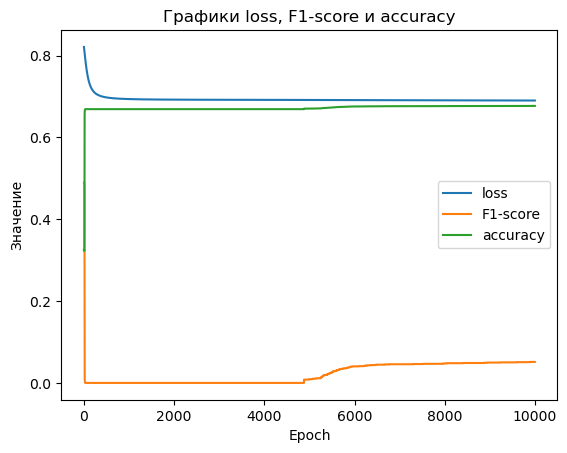

In [94]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf6['Epoch'], diagdf6['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf6['Epoch'], diagdf6['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf6['Epoch'], diagdf6['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [95]:
pred_test7=Mk7.forward(x_test.float())
pred_test_binarized7 = (pred_test7 > 0.5).float()

In [96]:
print(classification_report(y_test.to('cpu'), pred_test_binarized7.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.68      1.00      0.81      3226
         1.0       1.00      0.03      0.06      1537

    accuracy                           0.69      4763
   macro avg       0.84      0.51      0.43      4763
weighted avg       0.79      0.69      0.57      4763



In [97]:
#----------------------------------------------

<font color='red'>Word2Vec_MLP_Experiment_#8</font>

<font color='red'>layers: 1, epochs: 20000, lr: 0.001 -> 0.0001</font>

In [98]:
#----------------------------------------------

In [99]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK8(nn.Module): #изменить название
    def __init__(self, input_size, output_size):
        super(MLP_MK8, self).__init__()
        self.fc1 = nn.Linear(input_size, output_size)
#         self.relu = nn.ReLU()
#         self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
#         self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
#         self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
#         out = self.relu(out)
#         out = self.fc2(out)
        out = self.sigmoid(out)
#         out = self.fc3(out)
#         out = self.tanh(out)
        return out

In [100]:
Mk8=MLP_MK8(100,1) #изменить название переменной

In [101]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [102]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [103]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [104]:
Mk8=Mk8.to(dev)

In [105]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk8.parameters(), lr=0.0001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf7=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(20000):
    optimizer.zero_grad()
    pred = Mk8.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf7 = pd.concat([diagdf7, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.8044609427452087   f1-score: 0.0037991858553141356   accuracy: 0.6696364283561707
Epoch:  2 , Loss:  0.8043570518493652   f1-score: 0.0032573288772255182   accuracy: 0.6695464253425598
Epoch:  3 , Loss:  0.8042531609535217   f1-score: 0.0032573288772255182   accuracy: 0.6695464253425598
Epoch:  4 , Loss:  0.8041492700576782   f1-score: 0.002716653048992157   accuracy: 0.6696364283561707
Epoch:  5 , Loss:  0.8040454983711243   f1-score: 0.002174503868445754   accuracy: 0.6696364283561707
Epoch:  6 , Loss:  0.8039417266845703   f1-score: 0.002174503868445754   accuracy: 0.6696364283561707
Epoch:  7 , Loss:  0.8038380146026611   f1-score: 0.002174503868445754   accuracy: 0.6696364283561707
Epoch:  8 , Loss:  0.803734302520752   f1-score: 0.0010878433240577579   accuracy: 0.669456422328949
Epoch:  9 , Loss:  0.8036305904388428   f1-score: 0.0010878433240577579   accuracy: 0.669456422328949
Epoch:  10 , Loss:  0.8035270571708679   f1-score: 0.0010878433240577579   accur

Epoch:  130 , Loss:  0.7914872169494629   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  131 , Loss:  0.791390597820282   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  132 , Loss:  0.7912940979003906   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  133 , Loss:  0.7911977171897888   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  134 , Loss:  0.7911012768745422   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  135 , Loss:  0.7910049557685852   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  136 , Loss:  0.7909087538719177   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  137 , Loss:  0.790812611579895   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  138 , Loss:  0.7907164692878723   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  139 , Loss:  0.7906203866004944   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  140 , Loss:  0.790524423122406   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  141 , Loss:  0.7904285192489624   f1-s

Epoch:  251 , Loss:  0.7803105115890503   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  252 , Loss:  0.7802225351333618   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  253 , Loss:  0.7801347374916077   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  254 , Loss:  0.7800469398498535   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  255 , Loss:  0.7799592614173889   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  256 , Loss:  0.7798716425895691   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  257 , Loss:  0.779784083366394   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  258 , Loss:  0.779696524143219   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  259 , Loss:  0.779609203338623   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  260 , Loss:  0.7795218229293823   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  261 , Loss:  0.7794346809387207   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  262 , Loss:  0.7793474793434143   f1-s

Epoch:  378 , Loss:  0.7697537541389465   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  379 , Loss:  0.7696755528450012   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  380 , Loss:  0.7695974111557007   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  381 , Loss:  0.7695193886756897   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  382 , Loss:  0.7694414258003235   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  383 , Loss:  0.7693633437156677   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  384 , Loss:  0.7692856788635254   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  385 , Loss:  0.7692078948020935   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  386 , Loss:  0.7691301107406616   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  387 , Loss:  0.7690526247024536   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  388 , Loss:  0.7689750790596008   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  389 , Loss:  0.7688975930213928   f

Epoch:  499 , Loss:  0.7608426809310913   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  500 , Loss:  0.7607737183570862   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  501 , Loss:  0.760704755783081   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  502 , Loss:  0.7606358528137207   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  503 , Loss:  0.7605669498443604   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  504 , Loss:  0.7604982256889343   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  505 , Loss:  0.7604295015335083   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  506 , Loss:  0.760360836982727   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  507 , Loss:  0.7602922916412354   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  508 , Loss:  0.7602238059043884   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  509 , Loss:  0.760155439376831   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  510 , Loss:  0.7600870728492737   f1-s

Epoch:  621 , Loss:  0.7529482841491699   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  622 , Loss:  0.7528878450393677   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  623 , Loss:  0.752827525138855   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  624 , Loss:  0.7527673244476318   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  625 , Loss:  0.7527070641517639   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  626 , Loss:  0.7526469230651855   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  627 , Loss:  0.7525869011878967   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  628 , Loss:  0.7525268793106079   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  629 , Loss:  0.7524669766426086   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  630 , Loss:  0.7524071335792542   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  631 , Loss:  0.7523473501205444   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  632 , Loss:  0.7522875666618347   f1

Epoch:  722 , Loss:  0.7471805214881897   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  723 , Loss:  0.7471266388893127   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  724 , Loss:  0.7470728158950806   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  725 , Loss:  0.7470191717147827   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  726 , Loss:  0.7469654679298401   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  727 , Loss:  0.7469117641448975   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  728 , Loss:  0.7468582987785339   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  729 , Loss:  0.7468048930168152   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  730 , Loss:  0.7467514276504517   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  731 , Loss:  0.7466980218887329   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  732 , Loss:  0.7466447353363037   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  733 , Loss:  0.7465915083885193   f

Epoch:  848 , Loss:  0.7408629059791565   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  849 , Loss:  0.7408162951469421   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  850 , Loss:  0.7407697439193726   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  851 , Loss:  0.7407233119010925   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  852 , Loss:  0.7406769394874573   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  853 , Loss:  0.7406306862831116   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  854 , Loss:  0.7405843734741211   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  855 , Loss:  0.7405381798744202   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  856 , Loss:  0.7404919266700745   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  857 , Loss:  0.7404459118843079   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  858 , Loss:  0.7403998374938965   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  859 , Loss:  0.7403538823127747   f

Epoch:  962 , Loss:  0.7358908653259277   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  963 , Loss:  0.7358502149581909   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  964 , Loss:  0.7358094453811646   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  965 , Loss:  0.7357687950134277   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  966 , Loss:  0.7357281446456909   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  967 , Loss:  0.7356875538825989   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  968 , Loss:  0.7356470227241516   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  969 , Loss:  0.7356066107749939   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  970 , Loss:  0.7355661392211914   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  971 , Loss:  0.7355257272720337   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  972 , Loss:  0.7354853749275208   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  973 , Loss:  0.7354451417922974   f

Epoch:  1075 , Loss:  0.7315702438354492   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1076 , Loss:  0.7315344214439392   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1077 , Loss:  0.7314987182617188   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1078 , Loss:  0.7314630746841431   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1079 , Loss:  0.7314273715019226   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1080 , Loss:  0.7313917875289917   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1081 , Loss:  0.7313562035560608   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1082 , Loss:  0.7313206195831299   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1083 , Loss:  0.7312851548194885   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1084 , Loss:  0.7312496900558472   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1085 , Loss:  0.7312142252922058   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1086 , Loss:  0.73117893

Epoch:  1200 , Loss:  0.7273997664451599   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1201 , Loss:  0.7273687720298767   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1202 , Loss:  0.7273377180099487   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1203 , Loss:  0.7273067831993103   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1204 , Loss:  0.7272758483886719   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1205 , Loss:  0.7272449731826782   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1206 , Loss:  0.7272140979766846   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1207 , Loss:  0.7271832823753357   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1208 , Loss:  0.7271524667739868   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1209 , Loss:  0.7271217107772827   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1210 , Loss:  0.7270910143852234   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1211 , Loss:  0.72706031

Epoch:  1297 , Loss:  0.7245454788208008   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1298 , Loss:  0.7245176434516907   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1299 , Loss:  0.7244898080825806   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1300 , Loss:  0.7244620323181152   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1301 , Loss:  0.7244343161582947   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1302 , Loss:  0.7244065403938293   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1303 , Loss:  0.7243788242340088   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1304 , Loss:  0.724351167678833   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1305 , Loss:  0.724323570728302   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1306 , Loss:  0.724295973777771   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1307 , Loss:  0.72426837682724   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1308 , Loss:  0.7242408394813

Epoch:  1392 , Loss:  0.7220318913459778   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1393 , Loss:  0.7220067977905273   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1394 , Loss:  0.7219817638397217   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1395 , Loss:  0.7219566702842712   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1396 , Loss:  0.7219316959381104   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1397 , Loss:  0.7219066619873047   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1398 , Loss:  0.7218816876411438   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1399 , Loss:  0.7218568325042725   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1400 , Loss:  0.7218319177627563   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1401 , Loss:  0.7218070030212402   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1402 , Loss:  0.7217822074890137   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1403 , Loss:  0.72175735

Epoch:  1502 , Loss:  0.7194271087646484   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1503 , Loss:  0.7194048166275024   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1504 , Loss:  0.7193825840950012   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1505 , Loss:  0.7193602919578552   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1506 , Loss:  0.719338059425354   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1507 , Loss:  0.7193158864974976   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1508 , Loss:  0.7192936539649963   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1509 , Loss:  0.7192714810371399   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1510 , Loss:  0.7192493081092834   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1511 , Loss:  0.7192272543907166   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1512 , Loss:  0.7192051410675049   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1513 , Loss:  0.719183087

Epoch:  1615 , Loss:  0.7170491218566895   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1616 , Loss:  0.717029333114624   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1617 , Loss:  0.717009425163269   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1618 , Loss:  0.7169897556304932   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1619 , Loss:  0.7169699668884277   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1620 , Loss:  0.7169502377510071   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1621 , Loss:  0.7169305086135864   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1622 , Loss:  0.7169107794761658   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1623 , Loss:  0.7168911099433899   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1624 , Loss:  0.716871440410614   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1625 , Loss:  0.7168518304824829   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1626 , Loss:  0.71683216094

Epoch:  1729 , Loss:  0.714914858341217   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1730 , Loss:  0.7148971557617188   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1731 , Loss:  0.71487957239151   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1732 , Loss:  0.7148619294166565   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1733 , Loss:  0.714844286441803   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1734 , Loss:  0.7148267030715942   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1735 , Loss:  0.7148091793060303   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1736 , Loss:  0.7147915959358215   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1737 , Loss:  0.7147741317749023   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1738 , Loss:  0.7147566080093384   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1739 , Loss:  0.7147390842437744   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1740 , Loss:  0.714721560478

Epoch:  1827 , Loss:  0.7132654190063477   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1828 , Loss:  0.7132494449615479   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1829 , Loss:  0.7132334113121033   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1830 , Loss:  0.7132174372673035   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1831 , Loss:  0.7132014632225037   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1832 , Loss:  0.7131854295730591   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1833 , Loss:  0.7131695747375488   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1834 , Loss:  0.713153600692749   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1835 , Loss:  0.7131377458572388   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1836 , Loss:  0.7131218314170837   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1837 , Loss:  0.7131059169769287   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1838 , Loss:  0.713090062

Epoch:  1929 , Loss:  0.7117085456848145   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1930 , Loss:  0.7116940021514893   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1931 , Loss:  0.7116794586181641   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1932 , Loss:  0.7116649746894836   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1933 , Loss:  0.7116504907608032   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1934 , Loss:  0.7116360664367676   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1935 , Loss:  0.7116215825080872   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1936 , Loss:  0.7116071581840515   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1937 , Loss:  0.7115927338600159   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1938 , Loss:  0.7115783095359802   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1939 , Loss:  0.7115639448165894   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1940 , Loss:  0.71154952

Epoch:  2051 , Loss:  0.710034191608429   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2052 , Loss:  0.7100213170051575   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2053 , Loss:  0.7100083827972412   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2054 , Loss:  0.709995448589325   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2055 , Loss:  0.7099825143814087   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2056 , Loss:  0.7099696397781372   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2057 , Loss:  0.7099567651748657   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2058 , Loss:  0.7099438309669495   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2059 , Loss:  0.709930956363678   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2060 , Loss:  0.7099180817604065   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2061 , Loss:  0.7099052667617798   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2062 , Loss:  0.70989239215

Epoch:  2160 , Loss:  0.7086901068687439   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2161 , Loss:  0.7086783647537231   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2162 , Loss:  0.7086666822433472   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2163 , Loss:  0.7086549401283264   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2164 , Loss:  0.7086432576179504   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2165 , Loss:  0.7086315751075745   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2166 , Loss:  0.7086198925971985   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2167 , Loss:  0.7086082696914673   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2168 , Loss:  0.7085965871810913   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2169 , Loss:  0.7085849046707153   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2170 , Loss:  0.7085733413696289   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2171 , Loss:  0.70856171

Epoch:  2288 , Loss:  0.7072708606719971   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2289 , Loss:  0.7072603702545166   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2290 , Loss:  0.7072499394416809   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2291 , Loss:  0.7072394490242004   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2292 , Loss:  0.7072290182113647   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2293 , Loss:  0.707218587398529   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2294 , Loss:  0.7072081565856934   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2295 , Loss:  0.7071977257728577   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2296 , Loss:  0.707187294960022   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2297 , Loss:  0.707176923751831   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2298 , Loss:  0.7071665525436401   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2299 , Loss:  0.70715618133

Epoch:  2389 , Loss:  0.7062578201293945   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2390 , Loss:  0.7062481641769409   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2391 , Loss:  0.7062386274337769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2392 , Loss:  0.706229031085968   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2393 , Loss:  0.7062194347381592   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2394 , Loss:  0.7062098979949951   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2395 , Loss:  0.7062003016471863   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2396 , Loss:  0.706190824508667   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2397 , Loss:  0.7061812281608582   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2398 , Loss:  0.7061716914176941   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2399 , Loss:  0.70616215467453   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2400 , Loss:  0.706152677536

Epoch:  2499 , Loss:  0.7052490711212158   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2500 , Loss:  0.7052403688430786   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2501 , Loss:  0.7052316069602966   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2502 , Loss:  0.7052228450775146   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2503 , Loss:  0.7052141427993774   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2504 , Loss:  0.7052053809165955   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2505 , Loss:  0.7051966786384583   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2506 , Loss:  0.705187976360321   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2507 , Loss:  0.7051792740821838   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2508 , Loss:  0.7051705718040466   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2509 , Loss:  0.7051618695259094   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2510 , Loss:  0.705153226

Epoch:  2604 , Loss:  0.7043684720993042   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2605 , Loss:  0.7043604254722595   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2606 , Loss:  0.7043523788452148   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2607 , Loss:  0.7043443918228149   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2608 , Loss:  0.7043363451957703   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2609 , Loss:  0.7043283581733704   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2610 , Loss:  0.7043203711509705   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2611 , Loss:  0.7043123841285706   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2612 , Loss:  0.7043043971061707   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2613 , Loss:  0.7042964100837708   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2614 , Loss:  0.7042884826660156   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2615 , Loss:  0.70428049

Epoch:  2701 , Loss:  0.7036188840866089   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2702 , Loss:  0.703611433506012   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2703 , Loss:  0.7036040425300598   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2704 , Loss:  0.7035965919494629   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2705 , Loss:  0.7035892009735107   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2706 , Loss:  0.7035818099975586   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2707 , Loss:  0.7035744190216064   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2708 , Loss:  0.7035670280456543   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2709 , Loss:  0.7035596370697021   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2710 , Loss:  0.70355224609375   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2711 , Loss:  0.7035449147224426   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2712 , Loss:  0.70353752374

Epoch:  2821 , Loss:  0.7027678489685059   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2822 , Loss:  0.7027610540390015   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2823 , Loss:  0.7027542591094971   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2824 , Loss:  0.7027475833892822   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2825 , Loss:  0.7027407884597778   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2826 , Loss:  0.7027340531349182   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2827 , Loss:  0.7027273178100586   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2828 , Loss:  0.702720582485199   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2829 , Loss:  0.7027138471603394   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2830 , Loss:  0.7027071118354797   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2831 , Loss:  0.7027004361152649   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2832 , Loss:  0.702693760

Epoch:  2922 , Loss:  0.702110230922699   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2923 , Loss:  0.7021039724349976   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2924 , Loss:  0.7020977735519409   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2925 , Loss:  0.7020915150642395   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2926 , Loss:  0.7020852565765381   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2927 , Loss:  0.7020789980888367   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2928 , Loss:  0.7020727396011353   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2929 , Loss:  0.7020665407180786   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2930 , Loss:  0.702060341835022   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2931 , Loss:  0.7020541429519653   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2932 , Loss:  0.7020478844642639   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2933 , Loss:  0.7020416259

Epoch:  3022 , Loss:  0.7015069723129272   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3023 , Loss:  0.7015011310577393   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3024 , Loss:  0.7014952898025513   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3025 , Loss:  0.7014895081520081   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3026 , Loss:  0.7014837265014648   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3027 , Loss:  0.7014779448509216   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3028 , Loss:  0.7014721632003784   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3029 , Loss:  0.7014663815498352   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3030 , Loss:  0.7014605402946472   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3031 , Loss:  0.7014548182487488   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3032 , Loss:  0.7014490365982056   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3033 , Loss:  0.70144325

Epoch:  3137 , Loss:  0.7008662223815918   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3138 , Loss:  0.700860857963562   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3139 , Loss:  0.7008554935455322   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3140 , Loss:  0.7008501887321472   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3141 , Loss:  0.7008448243141174   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3142 , Loss:  0.7008395195007324   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3143 , Loss:  0.7008342146873474   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3144 , Loss:  0.7008289098739624   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3145 , Loss:  0.7008235454559326   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3146 , Loss:  0.7008183002471924   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3147 , Loss:  0.7008129954338074   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3148 , Loss:  0.700807690

Epoch:  3247 , Loss:  0.7003013491630554   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3248 , Loss:  0.7002964615821838   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3249 , Loss:  0.7002915143966675   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3250 , Loss:  0.7002866268157959   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3251 , Loss:  0.7002816796302795   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3252 , Loss:  0.7002767324447632   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3253 , Loss:  0.7002718448638916   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3254 , Loss:  0.7002668976783752   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3255 , Loss:  0.7002620100975037   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3256 , Loss:  0.7002570629119873   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3257 , Loss:  0.7002521753311157   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3258 , Loss:  0.70024728

Epoch:  3341 , Loss:  0.6998525261878967   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3342 , Loss:  0.6998478770256042   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3343 , Loss:  0.6998433470726013   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3344 , Loss:  0.6998386383056641   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3345 , Loss:  0.6998341083526611   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3346 , Loss:  0.6998295187950134   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3347 , Loss:  0.699824869632721   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3348 , Loss:  0.6998202800750732   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3349 , Loss:  0.6998156905174255   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3350 , Loss:  0.6998111009597778   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3351 , Loss:  0.6998065114021301   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3352 , Loss:  0.699801921

Epoch:  3435 , Loss:  0.6994323134422302   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3436 , Loss:  0.6994279623031616   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3437 , Loss:  0.699423611164093   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3438 , Loss:  0.6994192600250244   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3439 , Loss:  0.6994149684906006   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3440 , Loss:  0.6994106769561768   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3441 , Loss:  0.6994063854217529   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3442 , Loss:  0.6994020342826843   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3443 , Loss:  0.6993977427482605   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3444 , Loss:  0.6993934512138367   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3445 , Loss:  0.6993891000747681   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3446 , Loss:  0.699384808

Epoch:  3560 , Loss:  0.6989137530326843   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3561 , Loss:  0.6989098191261292   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3562 , Loss:  0.6989058256149292   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3563 , Loss:  0.698901891708374   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3564 , Loss:  0.6988978981971741   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3565 , Loss:  0.6988939046859741   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3566 , Loss:  0.6988900303840637   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3567 , Loss:  0.698885977268219   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3568 , Loss:  0.6988821029663086   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3569 , Loss:  0.6988781094551086   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3570 , Loss:  0.6988741755485535   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3571 , Loss:  0.6988702416

Epoch:  3659 , Loss:  0.6985330581665039   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3660 , Loss:  0.6985293626785278   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3661 , Loss:  0.698525607585907   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3662 , Loss:  0.6985219120979309   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3663 , Loss:  0.6985182166099548   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3664 , Loss:  0.6985145211219788   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3665 , Loss:  0.6985108256340027   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3666 , Loss:  0.6985070705413818   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3667 , Loss:  0.6985033750534058   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3668 , Loss:  0.6984996795654297   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3669 , Loss:  0.6984959840774536   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3670 , Loss:  0.698492288

Epoch:  3783 , Loss:  0.698090136051178   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3784 , Loss:  0.698086678981781   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3785 , Loss:  0.6980832815170288   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3786 , Loss:  0.6980798244476318   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3787 , Loss:  0.6980764269828796   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3788 , Loss:  0.6980729699134827   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3789 , Loss:  0.6980695724487305   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3790 , Loss:  0.6980661153793335   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3791 , Loss:  0.6980627179145813   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3792 , Loss:  0.6980593800544739   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3793 , Loss:  0.6980559229850769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3794 , Loss:  0.6980525255

Epoch:  3878 , Loss:  0.6977741718292236   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3879 , Loss:  0.6977709531784058   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3880 , Loss:  0.6977676749229431   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3881 , Loss:  0.69776451587677   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3882 , Loss:  0.6977612972259521   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3883 , Loss:  0.6977580785751343   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3884 , Loss:  0.6977548599243164   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3885 , Loss:  0.6977516412734985   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3886 , Loss:  0.6977484226226807   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3887 , Loss:  0.6977452039718628   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3888 , Loss:  0.6977420449256897   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3889 , Loss:  0.6977388262

Epoch:  3993 , Loss:  0.6974166035652161   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3994 , Loss:  0.6974135637283325   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3995 , Loss:  0.6974105834960938   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3996 , Loss:  0.697407603263855   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3997 , Loss:  0.6974046230316162   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3998 , Loss:  0.6974015831947327   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3999 , Loss:  0.6973986029624939   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4000 , Loss:  0.6973956227302551   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4001 , Loss:  0.6973926424980164   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4002 , Loss:  0.6973896622657776   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4003 , Loss:  0.6973866820335388   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4004 , Loss:  0.697383701

Epoch:  4105 , Loss:  0.6970924139022827   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4106 , Loss:  0.6970895528793335   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4107 , Loss:  0.6970868110656738   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4108 , Loss:  0.6970840096473694   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4109 , Loss:  0.6970812082290649   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4110 , Loss:  0.6970784068107605   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4111 , Loss:  0.6970756649971008   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4112 , Loss:  0.6970728635787964   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4113 , Loss:  0.6970700621604919   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4114 , Loss:  0.6970673203468323   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4115 , Loss:  0.6970645189285278   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4116 , Loss:  0.69706177

Epoch:  4219 , Loss:  0.6967847943305969   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4220 , Loss:  0.6967822313308716   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4221 , Loss:  0.6967796683311462   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4222 , Loss:  0.6967770457267761   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4223 , Loss:  0.696774423122406   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4224 , Loss:  0.6967718601226807   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4225 , Loss:  0.6967692375183105   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4226 , Loss:  0.6967666745185852   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4227 , Loss:  0.6967640519142151   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4228 , Loss:  0.6967614889144897   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4229 , Loss:  0.6967588663101196   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4230 , Loss:  0.696756303

Epoch:  4338 , Loss:  0.6964859366416931   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4339 , Loss:  0.6964834928512573   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4340 , Loss:  0.6964810490608215   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4341 , Loss:  0.6964786648750305   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4342 , Loss:  0.6964762210845947   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4343 , Loss:  0.6964738368988037   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4344 , Loss:  0.6964713931083679   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4345 , Loss:  0.6964690089225769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4346 , Loss:  0.6964665651321411   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4347 , Loss:  0.6964641809463501   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4348 , Loss:  0.6964617967605591   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4349 , Loss:  0.69645935

Epoch:  4446 , Loss:  0.6962326169013977   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4447 , Loss:  0.6962303519248962   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4448 , Loss:  0.6962280869483948   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4449 , Loss:  0.6962258815765381   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4450 , Loss:  0.6962235569953918   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4451 , Loss:  0.6962213516235352   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4452 , Loss:  0.6962190270423889   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4453 , Loss:  0.6962167620658875   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4454 , Loss:  0.696214497089386   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4455 , Loss:  0.6962122321128845   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4456 , Loss:  0.6962099671363831   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4457 , Loss:  0.696207761

Epoch:  4555 , Loss:  0.6959930658340454   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4556 , Loss:  0.6959909200668335   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4557 , Loss:  0.6959887742996216   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4558 , Loss:  0.6959866285324097   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4559 , Loss:  0.6959845423698425   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4560 , Loss:  0.6959823966026306   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4561 , Loss:  0.6959803104400635   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4562 , Loss:  0.6959782242774963   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4563 , Loss:  0.6959760785102844   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4564 , Loss:  0.6959739923477173   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4565 , Loss:  0.6959718465805054   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4566 , Loss:  0.69596970

Epoch:  4670 , Loss:  0.6957563757896423   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4671 , Loss:  0.6957544684410095   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4672 , Loss:  0.6957524418830872   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4673 , Loss:  0.6957504153251648   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4674 , Loss:  0.6957484483718872   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4675 , Loss:  0.6957464218139648   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4676 , Loss:  0.695744514465332   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4677 , Loss:  0.6957424879074097   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4678 , Loss:  0.6957405805587769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4679 , Loss:  0.6957385540008545   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4680 , Loss:  0.6957365870475769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4681 , Loss:  0.695734560

Epoch:  4767 , Loss:  0.695568859577179   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4768 , Loss:  0.6955668926239014   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4769 , Loss:  0.6955650448799133   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4770 , Loss:  0.6955631971359253   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4771 , Loss:  0.6955612897872925   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4772 , Loss:  0.6955594420433044   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4773 , Loss:  0.6955575942993164   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4774 , Loss:  0.6955556273460388   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4775 , Loss:  0.6955538392066956   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4776 , Loss:  0.6955519914627075   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4777 , Loss:  0.6955500841140747   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4778 , Loss:  0.695548176

Epoch:  4890 , Loss:  0.6953455209732056   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4891 , Loss:  0.6953437924385071   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4892 , Loss:  0.6953420639038086   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4893 , Loss:  0.6953402757644653   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4894 , Loss:  0.6953385472297668   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4895 , Loss:  0.6953367590904236   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4896 , Loss:  0.6953350901603699   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4897 , Loss:  0.6953333020210266   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4898 , Loss:  0.6953315734863281   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4899 , Loss:  0.6953297853469849   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4900 , Loss:  0.6953280568122864   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4901 , Loss:  0.69532632

Epoch:  4996 , Loss:  0.6951652765274048   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4997 , Loss:  0.6951636672019958   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4998 , Loss:  0.6951619982719421   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4999 , Loss:  0.6951603293418884   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5000 , Loss:  0.6951586604118347   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5001 , Loss:  0.6951571106910706   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5002 , Loss:  0.6951553821563721   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5003 , Loss:  0.6951537728309631   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5004 , Loss:  0.6951521635055542   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5005 , Loss:  0.6951504945755005   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5006 , Loss:  0.6951488256454468   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5007 , Loss:  0.69514715

Epoch:  5102 , Loss:  0.6949955821037292   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5103 , Loss:  0.6949939727783203   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5104 , Loss:  0.6949924230575562   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5105 , Loss:  0.6949909329414368   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5106 , Loss:  0.6949893236160278   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5107 , Loss:  0.6949877738952637   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5108 , Loss:  0.6949862837791443   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5109 , Loss:  0.6949846744537354   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5110 , Loss:  0.694983184337616   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5111 , Loss:  0.694981575012207   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5112 , Loss:  0.6949800252914429   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5113 , Loss:  0.6949785351

Epoch:  5200 , Loss:  0.6948473453521729   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5201 , Loss:  0.6948458552360535   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5202 , Loss:  0.6948444247245789   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5203 , Loss:  0.6948429346084595   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5204 , Loss:  0.6948414444923401   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5205 , Loss:  0.6948400139808655   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5206 , Loss:  0.6948385238647461   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5207 , Loss:  0.6948370933532715   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5208 , Loss:  0.6948356032371521   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5209 , Loss:  0.6948341727256775   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5210 , Loss:  0.6948326230049133   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5211 , Loss:  0.69483125

Epoch:  5294 , Loss:  0.6947125792503357   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5295 , Loss:  0.6947112083435059   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5296 , Loss:  0.6947097778320312   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5297 , Loss:  0.6947083473205566   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5298 , Loss:  0.6947069764137268   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5299 , Loss:  0.694705605506897   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5300 , Loss:  0.6947041749954224   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5301 , Loss:  0.6947028040885925   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5302 , Loss:  0.6947014331817627   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5303 , Loss:  0.6947000026702881   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5304 , Loss:  0.6946986317634583   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5305 , Loss:  0.694697320

Epoch:  5395 , Loss:  0.6945753693580627   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5396 , Loss:  0.6945739984512329   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5397 , Loss:  0.6945727467536926   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5398 , Loss:  0.6945714354515076   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5399 , Loss:  0.6945700645446777   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5400 , Loss:  0.6945687532424927   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5401 , Loss:  0.6945673823356628   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5402 , Loss:  0.6945661306381226   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5403 , Loss:  0.6945647597312927   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5404 , Loss:  0.6945635080337524   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5405 , Loss:  0.6945621967315674   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5406 , Loss:  0.69456088

Epoch:  5494 , Loss:  0.6944479942321777   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5495 , Loss:  0.6944468021392822   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5496 , Loss:  0.6944455504417419   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5497 , Loss:  0.6944442987442017   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5498 , Loss:  0.6944430470466614   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5499 , Loss:  0.6944417953491211   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5500 , Loss:  0.6944405436515808   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5501 , Loss:  0.6944392919540405   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5502 , Loss:  0.6944380402565002   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5503 , Loss:  0.69443678855896   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5504 , Loss:  0.6944355368614197   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5505 , Loss:  0.6944342851

Epoch:  5589 , Loss:  0.6943321228027344   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5590 , Loss:  0.6943309307098389   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5591 , Loss:  0.6943297386169434   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5592 , Loss:  0.6943285465240479   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5593 , Loss:  0.6943274140357971   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5594 , Loss:  0.6943262219429016   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5595 , Loss:  0.6943250298500061   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5596 , Loss:  0.6943238377571106   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5597 , Loss:  0.6943226456642151   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5598 , Loss:  0.6943214535713196   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5599 , Loss:  0.6943202614784241   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5600 , Loss:  0.69431906

Epoch:  5686 , Loss:  0.6942197680473328   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5687 , Loss:  0.694218635559082   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5688 , Loss:  0.6942175030708313   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5689 , Loss:  0.6942163705825806   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5690 , Loss:  0.6942152380943298   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5691 , Loss:  0.6942141056060791   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5692 , Loss:  0.6942130327224731   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5693 , Loss:  0.6942119002342224   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5694 , Loss:  0.6942107677459717   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5695 , Loss:  0.694209635257721   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5696 , Loss:  0.6942085027694702   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5697 , Loss:  0.6942073702

Epoch:  5784 , Loss:  0.6941120624542236   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5785 , Loss:  0.6941109895706177   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5786 , Loss:  0.6941099166870117   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5787 , Loss:  0.6941088438034058   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5788 , Loss:  0.6941077709197998   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5789 , Loss:  0.6941066980361938   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5790 , Loss:  0.6941056847572327   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5791 , Loss:  0.6941045522689819   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5792 , Loss:  0.6941035389900208   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5793 , Loss:  0.69410240650177   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5794 , Loss:  0.6941013932228088   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5795 , Loss:  0.6941003203

Epoch:  5903 , Loss:  0.6939886212348938   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5904 , Loss:  0.6939876079559326   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5905 , Loss:  0.6939865946769714   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5906 , Loss:  0.693985641002655   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5907 , Loss:  0.6939845681190491   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5908 , Loss:  0.6939836144447327   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5909 , Loss:  0.6939825415611267   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5910 , Loss:  0.6939815878868103   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5911 , Loss:  0.6939806342124939   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5912 , Loss:  0.6939796209335327   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5913 , Loss:  0.6939786076545715   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5914 , Loss:  0.693977594

Epoch:  6026 , Loss:  0.6938689351081848   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6027 , Loss:  0.6938680410385132   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6028 , Loss:  0.6938670873641968   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6029 , Loss:  0.6938660740852356   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6030 , Loss:  0.693865180015564   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6031 , Loss:  0.6938642263412476   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6032 , Loss:  0.6938633322715759   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6033 , Loss:  0.6938623785972595   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6034 , Loss:  0.6938614249229431   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6035 , Loss:  0.6938604712486267   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6036 , Loss:  0.6938595771789551   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6037 , Loss:  0.693858623

Epoch:  6127 , Loss:  0.6937763094902039   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6128 , Loss:  0.6937754154205322   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6129 , Loss:  0.6937745213508606   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6130 , Loss:  0.693773627281189   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6131 , Loss:  0.6937727332115173   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6132 , Loss:  0.6937718391418457   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6133 , Loss:  0.6937709450721741   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6134 , Loss:  0.6937700510025024   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6135 , Loss:  0.6937692165374756   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6136 , Loss:  0.6937682628631592   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6137 , Loss:  0.6937674283981323   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6138 , Loss:  0.693766534

Epoch:  6225 , Loss:  0.6936910152435303   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6226 , Loss:  0.6936901211738586   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6227 , Loss:  0.6936892867088318   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6228 , Loss:  0.6936884522438049   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6229 , Loss:  0.6936876177787781   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6230 , Loss:  0.6936867833137512   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6231 , Loss:  0.6936859488487244   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6232 , Loss:  0.6936851143836975   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6233 , Loss:  0.6936842799186707   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6234 , Loss:  0.693683385848999   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6235 , Loss:  0.6936825513839722   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6236 , Loss:  0.693681716

Epoch:  6322 , Loss:  0.6936107873916626   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6323 , Loss:  0.6936099529266357   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6324 , Loss:  0.6936091184616089   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6325 , Loss:  0.6936083436012268   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6326 , Loss:  0.6936075687408447   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6327 , Loss:  0.6936067342758179   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6328 , Loss:  0.6936059594154358   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6329 , Loss:  0.6936051845550537   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6330 , Loss:  0.6936043500900269   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6331 , Loss:  0.693603515625   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6332 , Loss:  0.6936026811599731   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6333 , Loss:  0.693601906299

Epoch:  6417 , Loss:  0.6935359835624695   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6418 , Loss:  0.6935352683067322   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6419 , Loss:  0.6935344934463501   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6420 , Loss:  0.693533718585968   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6421 , Loss:  0.6935329437255859   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6422 , Loss:  0.6935321092605591   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6423 , Loss:  0.6935314536094666   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6424 , Loss:  0.6935306191444397   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6425 , Loss:  0.6935298442840576   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6426 , Loss:  0.6935291290283203   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6427 , Loss:  0.6935282945632935   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6428 , Loss:  0.693527579

Epoch:  6535 , Loss:  0.6934480667114258   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6536 , Loss:  0.6934474110603333   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6537 , Loss:  0.6934466361999512   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6538 , Loss:  0.6934459209442139   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6539 , Loss:  0.6934452056884766   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6540 , Loss:  0.6934444904327393   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6541 , Loss:  0.693443775177002   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6542 , Loss:  0.6934430003166199   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6543 , Loss:  0.6934423446655273   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6544 , Loss:  0.69344162940979   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6545 , Loss:  0.6934409141540527   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6546 , Loss:  0.69344013929

Epoch:  6631 , Loss:  0.6933804154396057   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6632 , Loss:  0.6933797001838684   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6633 , Loss:  0.6933789849281311   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6634 , Loss:  0.6933783292770386   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6635 , Loss:  0.6933776140213013   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6636 , Loss:  0.6933769583702087   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6637 , Loss:  0.6933763027191162   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6638 , Loss:  0.6933755874633789   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6639 , Loss:  0.6933749318122864   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6640 , Loss:  0.6933742165565491   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6641 , Loss:  0.6933735609054565   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6642 , Loss:  0.69337284

Epoch:  6728 , Loss:  0.693315327167511   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6729 , Loss:  0.6933146119117737   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6730 , Loss:  0.6933140158653259   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6731 , Loss:  0.6933134198188782   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6732 , Loss:  0.6933127045631409   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6733 , Loss:  0.6933120489120483   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6734 , Loss:  0.6933113932609558   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6735 , Loss:  0.6933107376098633   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6736 , Loss:  0.6933100819587708   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6737 , Loss:  0.6933094263076782   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6738 , Loss:  0.6933087706565857   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6739 , Loss:  0.693308115

Epoch:  6824 , Loss:  0.6932539939880371   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6825 , Loss:  0.6932533979415894   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6826 , Loss:  0.6932527422904968   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6827 , Loss:  0.6932520866394043   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6828 , Loss:  0.6932514905929565   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6829 , Loss:  0.693250834941864   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6830 , Loss:  0.6932502388954163   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6831 , Loss:  0.6932495832443237   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6832 , Loss:  0.693248987197876   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6833 , Loss:  0.6932483315467834   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6834 , Loss:  0.6932477355003357   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6835 , Loss:  0.6932471394

Epoch:  6918 , Loss:  0.693196713924408   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6919 , Loss:  0.693196177482605   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6920 , Loss:  0.6931955218315125   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6921 , Loss:  0.6931949257850647   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6922 , Loss:  0.6931943297386169   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6923 , Loss:  0.693193793296814   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6924 , Loss:  0.6931931972503662   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6925 , Loss:  0.6931926012039185   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6926 , Loss:  0.6931920051574707   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6927 , Loss:  0.693191409111023   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6928 , Loss:  0.6931908130645752   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6929 , Loss:  0.693190217018

Epoch:  7015 , Loss:  0.69314044713974   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7016 , Loss:  0.693139910697937   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7017 , Loss:  0.6931393146514893   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7018 , Loss:  0.6931387782096863   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7019 , Loss:  0.6931381821632385   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7020 , Loss:  0.6931376457214355   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7021 , Loss:  0.6931371092796326   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7022 , Loss:  0.6931365132331848   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7023 , Loss:  0.6931359767913818   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7024 , Loss:  0.6931353807449341   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7025 , Loss:  0.6931347846984863   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7026 , Loss:  0.69313424825

Epoch:  7135 , Loss:  0.6930745244026184   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7136 , Loss:  0.6930739879608154   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7137 , Loss:  0.6930734515190125   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7138 , Loss:  0.6930729150772095   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7139 , Loss:  0.6930724382400513   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7140 , Loss:  0.6930719017982483   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7141 , Loss:  0.6930713653564453   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7142 , Loss:  0.6930707693099976   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7143 , Loss:  0.6930702924728394   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7144 , Loss:  0.6930697560310364   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7145 , Loss:  0.6930691599845886   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7146 , Loss:  0.69306868

Epoch:  7231 , Loss:  0.6930245757102966   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7232 , Loss:  0.6930240988731384   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7233 , Loss:  0.6930235624313354   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7234 , Loss:  0.6930230259895325   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7235 , Loss:  0.6930224895477295   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7236 , Loss:  0.6930220127105713   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7237 , Loss:  0.6930215358734131   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7238 , Loss:  0.6930209994316101   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7239 , Loss:  0.6930204629898071   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7240 , Loss:  0.6930199861526489   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7241 , Loss:  0.6930195093154907   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7242 , Loss:  0.69301897

Epoch:  7327 , Loss:  0.6929769515991211   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7328 , Loss:  0.6929764747619629   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7329 , Loss:  0.6929759383201599   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7330 , Loss:  0.6929754614830017   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7331 , Loss:  0.6929749846458435   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7332 , Loss:  0.6929745078086853   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7333 , Loss:  0.6929740309715271   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7334 , Loss:  0.6929735541343689   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7335 , Loss:  0.6929730772972107   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7336 , Loss:  0.6929726004600525   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7337 , Loss:  0.6929721236228943   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7338 , Loss:  0.69297158

Epoch:  7446 , Loss:  0.6929209232330322   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7447 , Loss:  0.692920446395874   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7448 , Loss:  0.6929200291633606   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7449 , Loss:  0.6929196119308472   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7450 , Loss:  0.692919135093689   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7451 , Loss:  0.6929186582565308   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7452 , Loss:  0.6929181814193726   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7453 , Loss:  0.6929177641868591   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7454 , Loss:  0.6929172873497009   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7455 , Loss:  0.6929168701171875   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7456 , Loss:  0.6929163336753845   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7457 , Loss:  0.6929159164

Epoch:  7541 , Loss:  0.6928785443305969   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7542 , Loss:  0.6928781270980835   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7543 , Loss:  0.6928776502609253   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7544 , Loss:  0.6928772330284119   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7545 , Loss:  0.6928768157958984   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7546 , Loss:  0.6928763389587402   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7547 , Loss:  0.6928759217262268   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7548 , Loss:  0.6928754448890686   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7549 , Loss:  0.6928750276565552   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7550 , Loss:  0.6928746104240417   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7551 , Loss:  0.6928741931915283   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7552 , Loss:  0.69287377

Epoch:  7667 , Loss:  0.6928253173828125   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7668 , Loss:  0.6928248405456543   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7669 , Loss:  0.6928244233131409   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7670 , Loss:  0.6928240656852722   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7671 , Loss:  0.692823588848114   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7672 , Loss:  0.6928231716156006   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7673 , Loss:  0.6928228139877319   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7674 , Loss:  0.6928223967552185   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7675 , Loss:  0.6928219199180603   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7676 , Loss:  0.6928216218948364   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7677 , Loss:  0.6928211450576782   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7678 , Loss:  0.692820787

Epoch:  7763 , Loss:  0.6927868127822876   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7764 , Loss:  0.6927863955497742   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7765 , Loss:  0.6927859783172607   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7766 , Loss:  0.6927856802940369   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7767 , Loss:  0.6927852034568787   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7768 , Loss:  0.69278484582901   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7769 , Loss:  0.6927844882011414   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7770 , Loss:  0.6927840709686279   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7771 , Loss:  0.6927837133407593   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7772 , Loss:  0.6927832961082458   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7773 , Loss:  0.6927828788757324   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7774 , Loss:  0.6927824616

Epoch:  7882 , Loss:  0.6927415132522583   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7883 , Loss:  0.6927411556243896   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7884 , Loss:  0.6927408576011658   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7885 , Loss:  0.6927404403686523   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7886 , Loss:  0.6927400231361389   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7887 , Loss:  0.6927396655082703   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7888 , Loss:  0.6927393674850464   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7889 , Loss:  0.692738950252533   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7890 , Loss:  0.6927385926246643   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7891 , Loss:  0.6927382349967957   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7892 , Loss:  0.6927378177642822   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7893 , Loss:  0.692737519

Epoch:  7978 , Loss:  0.6927068829536438   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7979 , Loss:  0.6927065253257751   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7980 , Loss:  0.6927061080932617   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7981 , Loss:  0.6927058100700378   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7982 , Loss:  0.6927053928375244   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7983 , Loss:  0.6927050948143005   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7984 , Loss:  0.6927047371864319   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7985 , Loss:  0.6927043795585632   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7986 , Loss:  0.6927040815353394   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7987 , Loss:  0.6927037239074707   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7988 , Loss:  0.692703366279602   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7989 , Loss:  0.692703008

Epoch:  8083 , Loss:  0.6926707029342651   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8084 , Loss:  0.6926703453063965   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8085 , Loss:  0.6926699876785278   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8086 , Loss:  0.692669689655304   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8087 , Loss:  0.6926693320274353   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8088 , Loss:  0.6926690340042114   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8089 , Loss:  0.6926686763763428   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8090 , Loss:  0.6926683783531189   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8091 , Loss:  0.6926680207252502   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8092 , Loss:  0.6926676630973816   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8093 , Loss:  0.6926673054695129   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8094 , Loss:  0.692667007

Epoch:  8211 , Loss:  0.6926289796829224   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8212 , Loss:  0.6926286220550537   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8213 , Loss:  0.6926283240318298   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8214 , Loss:  0.6926279664039612   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8215 , Loss:  0.6926276683807373   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8216 , Loss:  0.6926273703575134   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8217 , Loss:  0.6926270723342896   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8218 , Loss:  0.6926267743110657   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8219 , Loss:  0.692626416683197   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8220 , Loss:  0.6926261186599731   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8221 , Loss:  0.6926258206367493   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8222 , Loss:  0.692625463

Epoch:  8322 , Loss:  0.6925947070121765   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8323 , Loss:  0.6925944089889526   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8324 , Loss:  0.6925941109657288   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8325 , Loss:  0.6925938725471497   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8326 , Loss:  0.692593514919281   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8327 , Loss:  0.6925932168960571   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8328 , Loss:  0.6925929188728333   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8329 , Loss:  0.6925926208496094   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8330 , Loss:  0.6925923228263855   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8331 , Loss:  0.6925920248031616   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8332 , Loss:  0.6925917267799377   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8333 , Loss:  0.692591369

Epoch:  8431 , Loss:  0.6925627589225769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8432 , Loss:  0.6925625205039978   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8433 , Loss:  0.6925621628761292   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8434 , Loss:  0.69256192445755   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8435 , Loss:  0.6925616264343262   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8436 , Loss:  0.6925613284111023   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8437 , Loss:  0.6925610303878784   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8438 , Loss:  0.6925607323646545   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8439 , Loss:  0.6925604939460754   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8440 , Loss:  0.6925601363182068   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8441 , Loss:  0.6925598978996277   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8442 , Loss:  0.6925595998

Epoch:  8552 , Loss:  0.692529022693634   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8553 , Loss:  0.6925287842750549   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8554 , Loss:  0.692528486251831   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8555 , Loss:  0.692528247833252   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8556 , Loss:  0.6925279498100281   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8557 , Loss:  0.692527711391449   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8558 , Loss:  0.6925274729728699   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8559 , Loss:  0.692527174949646   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8560 , Loss:  0.6925269365310669   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8561 , Loss:  0.692526638507843   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8562 , Loss:  0.6925264000892639   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8563 , Loss:  0.69252610206604

Epoch:  8671 , Loss:  0.6924976706504822   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8672 , Loss:  0.6924973726272583   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8673 , Loss:  0.6924971342086792   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8674 , Loss:  0.6924968957901001   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8675 , Loss:  0.6924965977668762   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8676 , Loss:  0.6924963593482971   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8677 , Loss:  0.6924960613250732   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8678 , Loss:  0.6924958825111389   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8679 , Loss:  0.6924956440925598   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8680 , Loss:  0.6924953460693359   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8681 , Loss:  0.6924951076507568   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8682 , Loss:  0.69249486

Epoch:  8795 , Loss:  0.6924666166305542   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8796 , Loss:  0.6924663782119751   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8797 , Loss:  0.6924660801887512   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8798 , Loss:  0.6924659013748169   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8799 , Loss:  0.6924656629562378   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8800 , Loss:  0.6924654245376587   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8801 , Loss:  0.6924651265144348   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8802 , Loss:  0.6924649477005005   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8803 , Loss:  0.6924647092819214   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8804 , Loss:  0.6924644112586975   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8805 , Loss:  0.6924641728401184   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8806 , Loss:  0.69246393

Epoch:  8893 , Loss:  0.6924431920051575   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8894 , Loss:  0.6924430131912231   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8895 , Loss:  0.6924427151679993   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8896 , Loss:  0.6924425363540649   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8897 , Loss:  0.6924422383308411   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8898 , Loss:  0.692441999912262   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8899 , Loss:  0.6924418210983276   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8900 , Loss:  0.6924415826797485   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8901 , Loss:  0.6924413442611694   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8902 , Loss:  0.6924411058425903   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8903 , Loss:  0.6924408674240112   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8904 , Loss:  0.692440688

Epoch:  9015 , Loss:  0.6924154162406921   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9016 , Loss:  0.692415177822113   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9017 , Loss:  0.6924149394035339   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9018 , Loss:  0.6924147605895996   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9019 , Loss:  0.6924145221710205   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9020 , Loss:  0.6924142837524414   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9021 , Loss:  0.6924141049385071   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9022 , Loss:  0.6924138069152832   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9023 , Loss:  0.6924136281013489   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9024 , Loss:  0.6924133896827698   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9025 , Loss:  0.6924132108688354   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9026 , Loss:  0.692412912

Epoch:  9109 , Loss:  0.6923948526382446   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9110 , Loss:  0.6923946738243103   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9111 , Loss:  0.6923944354057312   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9112 , Loss:  0.6923941969871521   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9113 , Loss:  0.6923940181732178   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9114 , Loss:  0.6923937797546387   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9115 , Loss:  0.6923936009407043   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9116 , Loss:  0.6923933625221252   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9117 , Loss:  0.6923931837081909   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9118 , Loss:  0.692392885684967   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9119 , Loss:  0.6923927068710327   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9120 , Loss:  0.692392468

Epoch:  9204 , Loss:  0.6923748850822449   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9205 , Loss:  0.6923746466636658   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9206 , Loss:  0.6923744678497314   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9207 , Loss:  0.6923742890357971   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9208 , Loss:  0.692374050617218   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9209 , Loss:  0.6923738718032837   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9210 , Loss:  0.6923736333847046   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9211 , Loss:  0.6923734545707703   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9212 , Loss:  0.6923732757568359   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9213 , Loss:  0.6923730373382568   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9214 , Loss:  0.6923727989196777   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9215 , Loss:  0.692372620

Epoch:  9317 , Loss:  0.6923520565032959   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9318 , Loss:  0.6923518776893616   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9319 , Loss:  0.6923516392707825   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9320 , Loss:  0.6923514008522034   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9321 , Loss:  0.692351222038269   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9322 , Loss:  0.6923510432243347   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9323 , Loss:  0.6923508644104004   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9324 , Loss:  0.6923506259918213   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9325 , Loss:  0.692350447177887   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9326 , Loss:  0.6923502683639526   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9327 , Loss:  0.6923500299453735   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9328 , Loss:  0.6923498511

Epoch:  9431 , Loss:  0.6923299431800842   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9432 , Loss:  0.6923297643661499   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9433 , Loss:  0.6923295259475708   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9434 , Loss:  0.6923293471336365   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9435 , Loss:  0.6923291683197021   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9436 , Loss:  0.6923289895057678   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9437 , Loss:  0.6923288106918335   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9438 , Loss:  0.6923286318778992   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9439 , Loss:  0.6923284530639648   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9440 , Loss:  0.6923282146453857   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9441 , Loss:  0.6923279762268066   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9442 , Loss:  0.69232779

Epoch:  9526 , Loss:  0.6923121213912964   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9527 , Loss:  0.6923119425773621   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9528 , Loss:  0.6923117637634277   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9529 , Loss:  0.6923115849494934   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9530 , Loss:  0.6923114061355591   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9531 , Loss:  0.6923112273216248   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9532 , Loss:  0.6923111081123352   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9533 , Loss:  0.6923109292984009   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9534 , Loss:  0.6923107504844666   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9535 , Loss:  0.6923105716705322   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9536 , Loss:  0.6923103332519531   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9537 , Loss:  0.69231015

Epoch:  9632 , Loss:  0.6922930479049683   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9633 , Loss:  0.6922928690910339   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9634 , Loss:  0.6922926902770996   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9635 , Loss:  0.6922925114631653   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9636 , Loss:  0.692292332649231   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9637 , Loss:  0.6922921538352966   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9638 , Loss:  0.6922919154167175   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9639 , Loss:  0.692291796207428   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9640 , Loss:  0.6922916173934937   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9641 , Loss:  0.6922914385795593   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9642 , Loss:  0.692291259765625   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9643 , Loss:  0.69229108095

Epoch:  9739 , Loss:  0.6922743320465088   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9740 , Loss:  0.6922741532325745   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9741 , Loss:  0.6922739744186401   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9742 , Loss:  0.6922737956047058   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9743 , Loss:  0.6922736167907715   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9744 , Loss:  0.6922734379768372   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9745 , Loss:  0.6922733187675476   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9746 , Loss:  0.6922731399536133   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9747 , Loss:  0.692272961139679   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9748 , Loss:  0.6922727823257446   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9749 , Loss:  0.6922726035118103   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9750 , Loss:  0.692272424

Epoch:  9844 , Loss:  0.6922565698623657   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9845 , Loss:  0.6922563910484314   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9846 , Loss:  0.6922562122344971   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9847 , Loss:  0.6922560930252075   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9848 , Loss:  0.6922559142112732   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9849 , Loss:  0.6922557353973389   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9850 , Loss:  0.6922555565834045   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9851 , Loss:  0.692255437374115   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9852 , Loss:  0.6922552585601807   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9853 , Loss:  0.6922550797462463   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9854 , Loss:  0.692254900932312   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9855 , Loss:  0.6922547221

Epoch:  9939 , Loss:  0.6922409534454346   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9940 , Loss:  0.6922407746315002   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9941 , Loss:  0.6922406554222107   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9942 , Loss:  0.6922404766082764   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9943 , Loss:  0.692240297794342   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9944 , Loss:  0.6922401189804077   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9945 , Loss:  0.6922399997711182   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9946 , Loss:  0.6922398805618286   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9947 , Loss:  0.6922397017478943   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9948 , Loss:  0.69223952293396   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9949 , Loss:  0.6922393441200256   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9950 , Loss:  0.69223916530

Epoch:  10059 , Loss:  0.6922218203544617   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10060 , Loss:  0.6922216415405273   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10061 , Loss:  0.692221462726593   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10062 , Loss:  0.6922212839126587   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10063 , Loss:  0.6922211050987244   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10064 , Loss:  0.6922209858894348   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10065 , Loss:  0.6922208070755005   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10066 , Loss:  0.6922206878662109   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10067 , Loss:  0.6922205090522766   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10068 , Loss:  0.6922203302383423   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10069 , Loss:  0.6922202110290527   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10070 , Loss: 

Epoch:  10178 , Loss:  0.6922033429145813   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10179 , Loss:  0.692203164100647   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10180 , Loss:  0.6922029852867126   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10181 , Loss:  0.6922029256820679   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10182 , Loss:  0.6922026872634888   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10183 , Loss:  0.6922025680541992   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10184 , Loss:  0.6922023892402649   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10185 , Loss:  0.6922022104263306   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10186 , Loss:  0.692202091217041   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10187 , Loss:  0.6922019124031067   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10188 , Loss:  0.6922017931938171   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10189 , Loss:  

Epoch:  10276 , Loss:  0.6921885013580322   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10277 , Loss:  0.6921883225440979   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10278 , Loss:  0.6921882033348083   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10279 , Loss:  0.692188024520874   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10280 , Loss:  0.6921878457069397   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10281 , Loss:  0.6921877264976501   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10282 , Loss:  0.6921876072883606   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10283 , Loss:  0.6921874284744263   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10284 , Loss:  0.6921872496604919   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10285 , Loss:  0.6921871900558472   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10286 , Loss:  0.6921870112419128   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10287 , Loss: 

Epoch:  10376 , Loss:  0.6921736598014832   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10377 , Loss:  0.6921734809875488   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10378 , Loss:  0.6921733617782593   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10379 , Loss:  0.692173182964325   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10380 , Loss:  0.6921730637550354   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10381 , Loss:  0.6921729445457458   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10382 , Loss:  0.6921727657318115   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10383 , Loss:  0.692172646522522   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10384 , Loss:  0.6921724677085876   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10385 , Loss:  0.6921722888946533   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10386 , Loss:  0.6921721696853638   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10387 , Loss:  

Epoch:  10470 , Loss:  0.6921600103378296   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10471 , Loss:  0.6921598315238953   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10472 , Loss:  0.6921596527099609   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10473 , Loss:  0.6921595931053162   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10474 , Loss:  0.6921594142913818   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10475 , Loss:  0.6921592354774475   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10476 , Loss:  0.692159116268158   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10477 , Loss:  0.6921589374542236   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10478 , Loss:  0.6921588182449341   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10479 , Loss:  0.6921586990356445   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10480 , Loss:  0.6921585202217102   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10481 , Loss: 

Epoch:  10577 , Loss:  0.6921446919441223   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10578 , Loss:  0.692144513130188   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10579 , Loss:  0.6921443939208984   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10580 , Loss:  0.6921442151069641   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10581 , Loss:  0.6921440958976746   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10582 , Loss:  0.692143976688385   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10583 , Loss:  0.6921438574790955   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10584 , Loss:  0.6921436786651611   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10585 , Loss:  0.6921435594558716   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10586 , Loss:  0.6921433806419373   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10587 , Loss:  0.6921433210372925   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10588 , Loss:  

Epoch:  10679 , Loss:  0.6921303272247314   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10680 , Loss:  0.6921302080154419   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10681 , Loss:  0.6921300292015076   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10682 , Loss:  0.6921299695968628   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10683 , Loss:  0.6921297907829285   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10684 , Loss:  0.6921296119689941   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10685 , Loss:  0.6921294927597046   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10686 , Loss:  0.6921293139457703   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10687 , Loss:  0.6921292543411255   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10688 , Loss:  0.6921290755271912   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10689 , Loss:  0.6921289563179016   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10690 , Loss:

Epoch:  10799 , Loss:  0.6921137571334839   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10800 , Loss:  0.6921135783195496   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10801 , Loss:  0.69211345911026   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10802 , Loss:  0.6921133399009705   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10803 , Loss:  0.6921131610870361   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10804 , Loss:  0.6921131014823914   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10805 , Loss:  0.692112922668457   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10806 , Loss:  0.6921127438545227   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10807 , Loss:  0.6921126246452332   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10808 , Loss:  0.6921125054359436   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10809 , Loss:  0.692112386226654   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10810 , Loss:  0.

Epoch:  10916 , Loss:  0.6920977830886841   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10917 , Loss:  0.6920977234840393   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10918 , Loss:  0.692097544670105   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10919 , Loss:  0.6920973658561707   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10920 , Loss:  0.6920972466468811   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10921 , Loss:  0.6920971274375916   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10922 , Loss:  0.692097008228302   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10923 , Loss:  0.6920968294143677   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10924 , Loss:  0.6920967102050781   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10925 , Loss:  0.6920965313911438   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10926 , Loss:  0.692096471786499   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10927 , Loss:  0

Epoch:  11023 , Loss:  0.692083477973938   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11024 , Loss:  0.6920833587646484   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11025 , Loss:  0.6920831799507141   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11026 , Loss:  0.6920830607414246   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11027 , Loss:  0.6920828819274902   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11028 , Loss:  0.6920827627182007   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11029 , Loss:  0.6920826435089111   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11030 , Loss:  0.6920825242996216   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11031 , Loss:  0.6920823454856873   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11032 , Loss:  0.6920822262763977   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11033 , Loss:  0.6920821070671082   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11034 , Loss: 

Epoch:  11119 , Loss:  0.692070722579956   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11120 , Loss:  0.6920705437660217   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11121 , Loss:  0.692070484161377   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11122 , Loss:  0.6920703053474426   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11123 , Loss:  0.6920701861381531   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11124 , Loss:  0.6920700669288635   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11125 , Loss:  0.692069947719574   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11126 , Loss:  0.6920697689056396   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11127 , Loss:  0.6920696496963501   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11128 , Loss:  0.6920695304870605   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11129 , Loss:  0.692069411277771   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11130 , Loss:  0.

Epoch:  11216 , Loss:  0.6920579671859741   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11217 , Loss:  0.6920577883720398   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11218 , Loss:  0.692057728767395   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11219 , Loss:  0.6920576095581055   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11220 , Loss:  0.6920574307441711   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11221 , Loss:  0.6920573115348816   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11222 , Loss:  0.692057192325592   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11223 , Loss:  0.6920570731163025   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11224 , Loss:  0.6920568943023682   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11225 , Loss:  0.6920567750930786   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11226 , Loss:  0.6920566558837891   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11227 , Loss:  

Epoch:  11322 , Loss:  0.692044198513031   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11323 , Loss:  0.6920440793037415   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11324 , Loss:  0.6920439004898071   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11325 , Loss:  0.6920438408851624   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11326 , Loss:  0.692043662071228   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11327 , Loss:  0.6920435428619385   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11328 , Loss:  0.6920433640480042   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11329 , Loss:  0.6920433044433594   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11330 , Loss:  0.6920431852340698   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11331 , Loss:  0.6920430064201355   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11332 , Loss:  0.6920429468154907   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11333 , Loss:  

Epoch:  11443 , Loss:  0.6920286417007446   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11444 , Loss:  0.6920285224914551   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11445 , Loss:  0.6920284032821655   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11446 , Loss:  0.692028284072876   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11447 , Loss:  0.6920281648635864   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11448 , Loss:  0.6920279860496521   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11449 , Loss:  0.6920278668403625   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11450 , Loss:  0.6920278072357178   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11451 , Loss:  0.6920276284217834   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11452 , Loss:  0.6920275092124939   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11453 , Loss:  0.6920273900032043   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11454 , Loss: 

Epoch:  11564 , Loss:  0.6920133233070374   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11565 , Loss:  0.6920132040977478   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11566 , Loss:  0.6920130848884583   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11567 , Loss:  0.6920129060745239   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11568 , Loss:  0.6920127868652344   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11569 , Loss:  0.6920126676559448   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11570 , Loss:  0.6920125484466553   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11571 , Loss:  0.6920124292373657   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11572 , Loss:  0.6920122504234314   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11573 , Loss:  0.6920121908187866   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11574 , Loss:  0.6920120120048523   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11575 , Loss:

Epoch:  11686 , Loss:  0.6919980049133301   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11687 , Loss:  0.6919978857040405   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11688 , Loss:  0.691997766494751   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11689 , Loss:  0.6919975876808167   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11690 , Loss:  0.6919975280761719   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11691 , Loss:  0.6919974088668823   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11692 , Loss:  0.691997230052948   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11693 , Loss:  0.6919971704483032   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11694 , Loss:  0.6919970512390137   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11695 , Loss:  0.6919968724250793   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11696 , Loss:  0.6919967532157898   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11697 , Loss:  

Epoch:  11802 , Loss:  0.6919836401939392   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11803 , Loss:  0.6919835209846497   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11804 , Loss:  0.6919834017753601   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11805 , Loss:  0.6919832825660706   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11806 , Loss:  0.691983163356781   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11807 , Loss:  0.6919829845428467   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11808 , Loss:  0.6919828653335571   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11809 , Loss:  0.6919827461242676   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11810 , Loss:  0.6919826865196228   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11811 , Loss:  0.6919825077056885   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11812 , Loss:  0.6919823884963989   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11813 , Loss: 

Epoch:  11918 , Loss:  0.6919693946838379   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11919 , Loss:  0.6919692754745483   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11920 , Loss:  0.6919691562652588   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11921 , Loss:  0.6919690370559692   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11922 , Loss:  0.6919689774513245   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11923 , Loss:  0.6919687986373901   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11924 , Loss:  0.6919686794281006   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11925 , Loss:  0.6919686198234558   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11926 , Loss:  0.6919684410095215   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11927 , Loss:  0.6919683218002319   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11928 , Loss:  0.6919681429862976   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11929 , Loss:

Epoch:  12025 , Loss:  0.6919564008712769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12026 , Loss:  0.6919563412666321   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12027 , Loss:  0.6919562220573425   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12028 , Loss:  0.691956102848053   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12029 , Loss:  0.6919559240341187   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12030 , Loss:  0.6919558644294739   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12031 , Loss:  0.6919557452201843   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12032 , Loss:  0.69195556640625   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12033 , Loss:  0.6919555068016052   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12034 , Loss:  0.6919553279876709   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12035 , Loss:  0.6919552683830261   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12036 , Loss:  0

Epoch:  12129 , Loss:  0.6919440031051636   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12130 , Loss:  0.691943883895874   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12131 , Loss:  0.6919437050819397   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12132 , Loss:  0.6919435858726501   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12133 , Loss:  0.6919435262680054   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12134 , Loss:  0.6919434070587158   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12135 , Loss:  0.6919432878494263   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12136 , Loss:  0.6919431686401367   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12137 , Loss:  0.6919430494308472   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12138 , Loss:  0.6919428706169128   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12139 , Loss:  0.6919428110122681   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12140 , Loss: 

Epoch:  12228 , Loss:  0.691932201385498   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12229 , Loss:  0.6919321417808533   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12230 , Loss:  0.6919320225715637   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12231 , Loss:  0.6919318437576294   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12232 , Loss:  0.6919317245483398   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12233 , Loss:  0.6919316649436951   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12234 , Loss:  0.6919314861297607   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12235 , Loss:  0.691931426525116   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12236 , Loss:  0.6919313073158264   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12237 , Loss:  0.6919311881065369   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12238 , Loss:  0.6919310688972473   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12239 , Loss:  

Epoch:  12349 , Loss:  0.6919180750846863   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12350 , Loss:  0.6919179558753967   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12351 , Loss:  0.6919177770614624   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12352 , Loss:  0.6919177174568176   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12353 , Loss:  0.6919175386428833   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12354 , Loss:  0.6919174790382385   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12355 , Loss:  0.691917359828949   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12356 , Loss:  0.6919172406196594   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12357 , Loss:  0.6919171214103699   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12358 , Loss:  0.6919170022010803   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12359 , Loss:  0.6919169425964355   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12360 , Loss: 

Epoch:  12466 , Loss:  0.6919044852256775   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12467 , Loss:  0.6919043660163879   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12468 , Loss:  0.6919042468070984   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12469 , Loss:  0.6919040679931641   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12470 , Loss:  0.6919040083885193   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12471 , Loss:  0.6919038891792297   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12472 , Loss:  0.691903829574585   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12473 , Loss:  0.6919036507606506   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12474 , Loss:  0.6919035911560059   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12475 , Loss:  0.6919034123420715   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12476 , Loss:  0.6919033527374268   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12477 , Loss: 

Epoch:  12559 , Loss:  0.6918938159942627   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12560 , Loss:  0.6918936967849731   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12561 , Loss:  0.6918936371803284   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12562 , Loss:  0.691893458366394   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12563 , Loss:  0.6918933987617493   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12564 , Loss:  0.6918932795524597   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12565 , Loss:  0.6918931603431702   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12566 , Loss:  0.6918930411338806   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12567 , Loss:  0.6918929219245911   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12568 , Loss:  0.6918928623199463   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12569 , Loss:  0.691892683506012   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12570 , Loss:  

Epoch:  12655 , Loss:  0.6918829083442688   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12656 , Loss:  0.691882848739624   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12657 , Loss:  0.6918827295303345   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12658 , Loss:  0.6918825507164001   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12659 , Loss:  0.6918824911117554   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12660 , Loss:  0.6918823719024658   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12661 , Loss:  0.6918821930885315   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12662 , Loss:  0.6918821334838867   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12663 , Loss:  0.6918820142745972   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12664 , Loss:  0.6918819546699524   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12665 , Loss:  0.6918817758560181   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12666 , Loss: 

Epoch:  12749 , Loss:  0.6918723583221436   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12750 , Loss:  0.6918722987174988   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12751 , Loss:  0.6918721199035645   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12752 , Loss:  0.6918720006942749   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12753 , Loss:  0.6918719410896301   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12754 , Loss:  0.6918718218803406   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12755 , Loss:  0.691871702671051   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12756 , Loss:  0.6918715834617615   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12757 , Loss:  0.6918714642524719   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12758 , Loss:  0.6918713450431824   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12759 , Loss:  0.6918712258338928   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12760 , Loss: 

Epoch:  12842 , Loss:  0.6918619871139526   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12843 , Loss:  0.6918619275093079   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12844 , Loss:  0.6918617486953735   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12845 , Loss:  0.691861629486084   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12846 , Loss:  0.6918615698814392   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12847 , Loss:  0.6918614506721497   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12848 , Loss:  0.6918613910675049   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12849 , Loss:  0.6918612122535706   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12850 , Loss:  0.691861093044281   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12851 , Loss:  0.6918610334396362   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12852 , Loss:  0.6918609142303467   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12853 , Loss:  

Epoch:  12962 , Loss:  0.6918487548828125   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12963 , Loss:  0.691848635673523   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12964 , Loss:  0.6918485760688782   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12965 , Loss:  0.6918484568595886   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12966 , Loss:  0.6918483376502991   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12967 , Loss:  0.6918482184410095   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12968 , Loss:  0.69184809923172   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12969 , Loss:  0.6918480396270752   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12970 , Loss:  0.6918478608131409   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12971 , Loss:  0.6918478012084961   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12972 , Loss:  0.6918477416038513   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12973 , Loss:  0

Epoch:  13080 , Loss:  0.6918359398841858   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13081 , Loss:  0.6918358206748962   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13082 , Loss:  0.6918357014656067   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13083 , Loss:  0.6918356418609619   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13084 , Loss:  0.6918355226516724   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13085 , Loss:  0.691835343837738   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13086 , Loss:  0.6918352842330933   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13087 , Loss:  0.6918351650238037   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13088 , Loss:  0.6918351054191589   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13089 , Loss:  0.6918349266052246   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13090 , Loss:  0.6918348670005798   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13091 , Loss: 

Epoch:  13185 , Loss:  0.6918246746063232   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13186 , Loss:  0.6918244957923889   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13187 , Loss:  0.6918244361877441   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13188 , Loss:  0.6918243169784546   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13189 , Loss:  0.691824197769165   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13190 , Loss:  0.6918241381645203   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13191 , Loss:  0.6918239593505859   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13192 , Loss:  0.6918238997459412   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13193 , Loss:  0.6918237805366516   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13194 , Loss:  0.6918236613273621   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13195 , Loss:  0.6918235421180725   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13196 , Loss: 

Epoch:  13292 , Loss:  0.6918132305145264   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13293 , Loss:  0.6918131113052368   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13294 , Loss:  0.6918129920959473   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13295 , Loss:  0.6918128728866577   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13296 , Loss:  0.6918127536773682   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13297 , Loss:  0.6918126940727234   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13298 , Loss:  0.6918126344680786   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13299 , Loss:  0.6918124556541443   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13300 , Loss:  0.6918123364448547   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13301 , Loss:  0.69181227684021   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13302 , Loss:  0.6918121576309204   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13303 , Loss:  

Epoch:  13385 , Loss:  0.6918033957481384   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13386 , Loss:  0.6918032765388489   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13387 , Loss:  0.6918031573295593   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13388 , Loss:  0.6918030977249146   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13389 , Loss:  0.6918029189109802   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13390 , Loss:  0.6918028593063354   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13391 , Loss:  0.6918027400970459   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13392 , Loss:  0.6918026804924011   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13393 , Loss:  0.6918025612831116   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13394 , Loss:  0.6918023824691772   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13395 , Loss:  0.6918023228645325   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  13396 , Loss:

Epoch:  13490 , Loss:  0.691792368888855   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13491 , Loss:  0.6917922496795654   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13492 , Loss:  0.6917921900749207   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13493 , Loss:  0.6917920708656311   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13494 , Loss:  0.6917919516563416   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13495 , Loss:  0.6917918920516968   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13496 , Loss:  0.6917917132377625   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13497 , Loss:  0.6917916536331177   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13498 , Loss:  0.6917915344238281   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13499 , Loss:  0.6917914152145386   f1-

Epoch:  13581 , Loss:  0.6917829513549805   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13582 , Loss:  0.6917828321456909   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13583 , Loss:  0.6917827129364014   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13584 , Loss:  0.6917825937271118   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13585 , Loss:  0.691782534122467   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13586 , Loss:  0.6917824149131775   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13587 , Loss:  0.6917823553085327   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13588 , Loss:  0.6917821764945984   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13589 , Loss:  0.6917821168899536   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13590 , Loss:  0.6917819976806641   f1-

Epoch:  13659 , Loss:  0.691774845123291   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13660 , Loss:  0.6917747855186462   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13661 , Loss:  0.6917746663093567   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13662 , Loss:  0.6917745471000671   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13663 , Loss:  0.6917744874954224   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13664 , Loss:  0.6917743682861328   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13665 , Loss:  0.691774308681488   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13666 , Loss:  0.6917741298675537   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13667 , Loss:  0.6917740702629089   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13668 , Loss:  0.6917739510536194   f1-s

Epoch:  13770 , Loss:  0.6917634606361389   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13771 , Loss:  0.6917634010314941   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13772 , Loss:  0.6917632818222046   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13773 , Loss:  0.6917632222175598   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13774 , Loss:  0.6917631030082703   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13775 , Loss:  0.6917629837989807   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13776 , Loss:  0.6917628645896912   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13777 , Loss:  0.6917628049850464   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13778 , Loss:  0.6917626857757568   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  13779 , Loss:  0.6917626261711121   f1

Epoch:  13865 , Loss:  0.6917538642883301   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13866 , Loss:  0.6917537450790405   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13867 , Loss:  0.691753625869751   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13868 , Loss:  0.6917535662651062   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13869 , Loss:  0.6917533874511719   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13870 , Loss:  0.6917533278465271   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13871 , Loss:  0.6917532682418823   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13872 , Loss:  0.691753089427948   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13873 , Loss:  0.6917530298233032   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13874 , Loss:  0.6917529106140137   f1-score: 0.0

Epoch:  13968 , Loss:  0.6917434334754944   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13969 , Loss:  0.6917433738708496   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13970 , Loss:  0.6917431950569153   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13971 , Loss:  0.6917430758476257   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13972 , Loss:  0.691743016242981   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13973 , Loss:  0.6917428970336914   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13974 , Loss:  0.6917428374290466   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13975 , Loss:  0.6917427182197571   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13976 , Loss:  0.6917425990104675   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  13977 , Loss:  0.6917425394058228   f1-score: 0.

Epoch:  14065 , Loss:  0.6917336583137512   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14066 , Loss:  0.6917335987091064   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14067 , Loss:  0.6917335391044617   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14068 , Loss:  0.6917333602905273   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14069 , Loss:  0.6917333006858826   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14070 , Loss:  0.691733181476593   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14071 , Loss:  0.6917330622673035   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14072 , Loss:  0.6917330026626587   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14073 , Loss:  0.6917328834533691   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14074 , Loss:  0.6917328238487244   f1-score: 0.010281384

Epoch:  14148 , Loss:  0.6917254328727722   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14149 , Loss:  0.6917253136634827   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14150 , Loss:  0.6917251944541931   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14151 , Loss:  0.6917251348495483   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14152 , Loss:  0.691724956035614   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14153 , Loss:  0.6917248964309692   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14154 , Loss:  0.6917248368263245   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14155 , Loss:  0.6917247176170349   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14156 , Loss:  0.6917245984077454   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  14157 , Loss:  0.6917244791984558   f1-score: 0.010281384

Epoch:  14235 , Loss:  0.6917167901992798   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14236 , Loss:  0.6917166709899902   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14237 , Loss:  0.6917166113853455   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14238 , Loss:  0.6917164325714111   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14239 , Loss:  0.6917163729667664   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14240 , Loss:  0.6917162537574768   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14241 , Loss:  0.6917161345481873   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14242 , Loss:  0.6917160749435425   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14243 , Loss:  0.6917159557342529   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14244 , Loss:  0.6917158365249634   f1-score: 0

Epoch:  14316 , Loss:  0.6917087435722351   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14317 , Loss:  0.6917086839675903   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14318 , Loss:  0.6917086243629456   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14319 , Loss:  0.6917084455490112   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14320 , Loss:  0.6917083859443665   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14321 , Loss:  0.6917082667350769   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14322 , Loss:  0.6917081475257874   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14323 , Loss:  0.6917080283164978   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14324 , Loss:  0.6917079091072083   f1-score: 0.01081958319991827   accuracy: 0.6708963513374329
Epoch:  14325 , Loss:  0.6917078495025635   f1-score: 0

Epoch:  14422 , Loss:  0.6916983127593994   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14423 , Loss:  0.6916982531547546   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14424 , Loss:  0.6916981339454651   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14425 , Loss:  0.6916980147361755   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14426 , Loss:  0.691697895526886   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14427 , Loss:  0.6916978359222412   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14428 , Loss:  0.6916977167129517   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14429 , Loss:  0.6916976571083069   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14430 , Loss:  0.6916975378990173   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14431 , Loss:  0.6916974186897278   f1-score: 0.

Epoch:  14517 , Loss:  0.6916890144348145   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14518 , Loss:  0.6916888952255249   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14519 , Loss:  0.6916888356208801   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14520 , Loss:  0.6916887164115906   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14521 , Loss:  0.691688597202301   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14522 , Loss:  0.6916885375976562   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14523 , Loss:  0.6916884183883667   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14524 , Loss:  0.6916883587837219   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14525 , Loss:  0.6916882395744324   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14526 , Loss:  0.6916881799697876   f1-score: 0.

Epoch:  14604 , Loss:  0.6916804909706116   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14605 , Loss:  0.6916804313659668   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14606 , Loss:  0.6916803121566772   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14607 , Loss:  0.6916801929473877   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14608 , Loss:  0.6916801929473877   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14609 , Loss:  0.6916800141334534   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14610 , Loss:  0.6916798949241638   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14611 , Loss:  0.691679835319519   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14612 , Loss:  0.6916797161102295   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  14613 , Loss:  0.6916796565055847   f1-score: 0.

Epoch:  14705 , Loss:  0.6916706562042236   f1-score: 0.012969467788934708   accuracy: 0.6712563037872314
Epoch:  14706 , Loss:  0.6916705965995789   f1-score: 0.012969467788934708   accuracy: 0.6712563037872314
Epoch:  14707 , Loss:  0.6916704773902893   f1-score: 0.012969467788934708   accuracy: 0.6712563037872314
Epoch:  14708 , Loss:  0.6916704177856445   f1-score: 0.012969467788934708   accuracy: 0.6712563037872314
Epoch:  14709 , Loss:  0.691670298576355   f1-score: 0.012969467788934708   accuracy: 0.6712563037872314
Epoch:  14710 , Loss:  0.6916702389717102   f1-score: 0.012969467788934708   accuracy: 0.6712563037872314
Epoch:  14711 , Loss:  0.6916701197624207   f1-score: 0.012969467788934708   accuracy: 0.6712563037872314
Epoch:  14712 , Loss:  0.6916700005531311   f1-score: 0.012969467788934708   accuracy: 0.6712563037872314
Epoch:  14713 , Loss:  0.6916698813438416   f1-score: 0.012969467788934708   accuracy: 0.6712563037872314
Epoch:  14714 , Loss:  0.6916698217391968   f1-

Epoch:  14788 , Loss:  0.691662609577179   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14789 , Loss:  0.6916624903678894   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14790 , Loss:  0.6916624307632446   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14791 , Loss:  0.6916623115539551   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14792 , Loss:  0.6916622519493103   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14793 , Loss:  0.6916621327400208   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14794 , Loss:  0.691662073135376   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14795 , Loss:  0.6916619539260864   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14796 , Loss:  0.6916618943214417   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14797 , Loss:  0.6916617751121521   f1-s

Epoch:  14866 , Loss:  0.6916550993919373   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14867 , Loss:  0.6916550397872925   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14868 , Loss:  0.6916549205780029   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14869 , Loss:  0.6916547417640686   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14870 , Loss:  0.6916546821594238   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14871 , Loss:  0.6916545629501343   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14872 , Loss:  0.6916545629501343   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14873 , Loss:  0.6916544437408447   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14874 , Loss:  0.6916543245315552   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  14875 , Loss:  0.6916542649269104   f1

Epoch:  14971 , Loss:  0.6916449069976807   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  14972 , Loss:  0.6916448473930359   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  14973 , Loss:  0.6916447281837463   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  14974 , Loss:  0.6916446685791016   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  14975 , Loss:  0.691644549369812   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  14976 , Loss:  0.6916444897651672   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  14977 , Loss:  0.6916443705558777   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  14978 , Loss:  0.6916442513465881   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  14979 , Loss:  0.6916441917419434   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  14980 , Loss:  0.6916440725326538   f1-score: 0.

Epoch:  15072 , Loss:  0.6916351914405823   f1-score: 0.017789756879210472   accuracy: 0.6720662117004395
Epoch:  15073 , Loss:  0.6916350722312927   f1-score: 0.017789756879210472   accuracy: 0.6720662117004395
Epoch:  15074 , Loss:  0.691635012626648   f1-score: 0.017789756879210472   accuracy: 0.6720662117004395
Epoch:  15075 , Loss:  0.6916348934173584   f1-score: 0.017789756879210472   accuracy: 0.6720662117004395
Epoch:  15076 , Loss:  0.6916348338127136   f1-score: 0.017789756879210472   accuracy: 0.6720662117004395
Epoch:  15077 , Loss:  0.6916347146034241   f1-score: 0.017789756879210472   accuracy: 0.6720662117004395
Epoch:  15078 , Loss:  0.6916346549987793   f1-score: 0.017789756879210472   accuracy: 0.6720662117004395
Epoch:  15079 , Loss:  0.6916345357894897   f1-score: 0.017789756879210472   accuracy: 0.6720662117004395
Epoch:  15080 , Loss:  0.691634476184845   f1-score: 0.017789756879210472   accuracy: 0.6720662117004395
Epoch:  15081 , Loss:  0.6916343569755554   f1-s

Epoch:  15152 , Loss:  0.6916275024414062   f1-score: 0.0177849642932415   accuracy: 0.6719762682914734
Epoch:  15153 , Loss:  0.6916274428367615   f1-score: 0.0177849642932415   accuracy: 0.6719762682914734
Epoch:  15154 , Loss:  0.6916273236274719   f1-score: 0.0177849642932415   accuracy: 0.6719762682914734
Epoch:  15155 , Loss:  0.6916272044181824   f1-score: 0.0177849642932415   accuracy: 0.6719762682914734
Epoch:  15156 , Loss:  0.6916271448135376   f1-score: 0.0177849642932415   accuracy: 0.6719762682914734
Epoch:  15157 , Loss:  0.6916269659996033   f1-score: 0.0177849642932415   accuracy: 0.6719762682914734
Epoch:  15158 , Loss:  0.6916269063949585   f1-score: 0.0177849642932415   accuracy: 0.6719762682914734
Epoch:  15159 , Loss:  0.6916268467903137   f1-score: 0.0177849642932415   accuracy: 0.6719762682914734
Epoch:  15160 , Loss:  0.6916267275810242   f1-score: 0.0177849642932415   accuracy: 0.6719762682914734
Epoch:  15161 , Loss:  0.6916266679763794   f1-score: 0.01778496

Epoch:  15236 , Loss:  0.6916194558143616   f1-score: 0.018852679058909416   accuracy: 0.6721562147140503
Epoch:  15237 , Loss:  0.691619336605072   f1-score: 0.018852679058909416   accuracy: 0.6721562147140503
Epoch:  15238 , Loss:  0.6916192173957825   f1-score: 0.018852679058909416   accuracy: 0.6721562147140503
Epoch:  15239 , Loss:  0.6916191577911377   f1-score: 0.018852679058909416   accuracy: 0.6721562147140503
Epoch:  15240 , Loss:  0.6916190385818481   f1-score: 0.018852679058909416   accuracy: 0.6721562147140503
Epoch:  15241 , Loss:  0.6916189789772034   f1-score: 0.018852679058909416   accuracy: 0.6721562147140503
Epoch:  15242 , Loss:  0.6916188597679138   f1-score: 0.018852679058909416   accuracy: 0.6721562147140503
Epoch:  15243 , Loss:  0.691618800163269   f1-score: 0.018852679058909416   accuracy: 0.6721562147140503
Epoch:  15244 , Loss:  0.6916186809539795   f1-score: 0.018852679058909416   accuracy: 0.6721562147140503
Epoch:  15245 , Loss:  0.6916185617446899   f1-s

Epoch:  15332 , Loss:  0.6916102170944214   f1-score: 0.022580645978450775   accuracy: 0.6727861762046814
Epoch:  15333 , Loss:  0.6916100978851318   f1-score: 0.022580645978450775   accuracy: 0.6727861762046814
Epoch:  15334 , Loss:  0.6916100382804871   f1-score: 0.022580645978450775   accuracy: 0.6727861762046814
Epoch:  15335 , Loss:  0.6916099190711975   f1-score: 0.022580645978450775   accuracy: 0.6727861762046814
Epoch:  15336 , Loss:  0.691609799861908   f1-score: 0.022580645978450775   accuracy: 0.6727861762046814
Epoch:  15337 , Loss:  0.6916097402572632   f1-score: 0.022580645978450775   accuracy: 0.6727861762046814
Epoch:  15338 , Loss:  0.6916096210479736   f1-score: 0.022580645978450775   accuracy: 0.6727861762046814
Epoch:  15339 , Loss:  0.6916095018386841   f1-score: 0.022580645978450775   accuracy: 0.6727861762046814
Epoch:  15340 , Loss:  0.6916094422340393   f1-score: 0.022580645978450775   accuracy: 0.6727861762046814
Epoch:  15341 , Loss:  0.6916093230247498   f1-

Epoch:  15426 , Loss:  0.6916012167930603   f1-score: 0.024174053221940994   accuracy: 0.6730561852455139
Epoch:  15427 , Loss:  0.6916010975837708   f1-score: 0.024174053221940994   accuracy: 0.6730561852455139
Epoch:  15428 , Loss:  0.6916009783744812   f1-score: 0.024704618379473686   accuracy: 0.67314612865448
Epoch:  15429 , Loss:  0.6916009187698364   f1-score: 0.024704618379473686   accuracy: 0.67314612865448
Epoch:  15430 , Loss:  0.6916007995605469   f1-score: 0.024704618379473686   accuracy: 0.67314612865448
Epoch:  15431 , Loss:  0.6916007399559021   f1-score: 0.024704618379473686   accuracy: 0.67314612865448
Epoch:  15432 , Loss:  0.6916006207466125   f1-score: 0.024704618379473686   accuracy: 0.67314612865448
Epoch:  15433 , Loss:  0.6916005611419678   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  15434 , Loss:  0.6916003823280334   f1-score: 0.025234898552298546   accuracy: 0.6732361316680908
Epoch:  15435 , Loss:  0.6916003227233887   f1-score: 0.

Epoch:  15511 , Loss:  0.6915930509567261   f1-score: 0.025764895603060722   accuracy: 0.6733261346817017
Epoch:  15512 , Loss:  0.6915929317474365   f1-score: 0.025764895603060722   accuracy: 0.6733261346817017
Epoch:  15513 , Loss:  0.6915928721427917   f1-score: 0.025764895603060722   accuracy: 0.6733261346817017
Epoch:  15514 , Loss:  0.6915926933288574   f1-score: 0.025764895603060722   accuracy: 0.6733261346817017
Epoch:  15515 , Loss:  0.6915926337242126   f1-score: 0.025764895603060722   accuracy: 0.6733261346817017
Epoch:  15516 , Loss:  0.6915925741195679   f1-score: 0.025764895603060722   accuracy: 0.6733261346817017
Epoch:  15517 , Loss:  0.6915924549102783   f1-score: 0.025764895603060722   accuracy: 0.6733261346817017
Epoch:  15518 , Loss:  0.6915923953056335   f1-score: 0.025764895603060722   accuracy: 0.6733261346817017
Epoch:  15519 , Loss:  0.691592276096344   f1-score: 0.025764895603060722   accuracy: 0.6733261346817017
Epoch:  15520 , Loss:  0.6915922164916992   f1-

Epoch:  15607 , Loss:  0.6915838718414307   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  15608 , Loss:  0.6915837526321411   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  15609 , Loss:  0.6915836930274963   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  15610 , Loss:  0.6915835738182068   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  15611 , Loss:  0.691583514213562   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  15612 , Loss:  0.6915833353996277   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  15613 , Loss:  0.6915832161903381   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  15614 , Loss:  0.6915831565856934   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  15615 , Loss:  0.6915830373764038   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  15616 , Loss:  0.691582977771759   f1-score: 0.0

Epoch:  15694 , Loss:  0.6915754675865173   f1-score: 0.027882037684321404   accuracy: 0.6736860871315002
Epoch:  15695 , Loss:  0.6915754079818726   f1-score: 0.027882037684321404   accuracy: 0.6736860871315002
Epoch:  15696 , Loss:  0.6915753483772278   f1-score: 0.027882037684321404   accuracy: 0.6736860871315002
Epoch:  15697 , Loss:  0.6915752291679382   f1-score: 0.027882037684321404   accuracy: 0.6736860871315002
Epoch:  15698 , Loss:  0.6915751695632935   f1-score: 0.027882037684321404   accuracy: 0.6736860871315002
Epoch:  15699 , Loss:  0.6915749907493591   f1-score: 0.027882037684321404   accuracy: 0.6736860871315002
Epoch:  15700 , Loss:  0.6915749311447144   f1-score: 0.027882037684321404   accuracy: 0.6736860871315002
Epoch:  15701 , Loss:  0.6915748119354248   f1-score: 0.027882037684321404   accuracy: 0.6736860871315002
Epoch:  15702 , Loss:  0.69157475233078   f1-score: 0.027882037684321404   accuracy: 0.6736860871315002
Epoch:  15703 , Loss:  0.6915746331214905   f1-s

Epoch:  15785 , Loss:  0.6915667653083801   f1-score: 0.028410613536834717   accuracy: 0.6737760901451111
Epoch:  15786 , Loss:  0.6915667057037354   f1-score: 0.028410613536834717   accuracy: 0.6737760901451111
Epoch:  15787 , Loss:  0.6915666460990906   f1-score: 0.028410613536834717   accuracy: 0.6737760901451111
Epoch:  15788 , Loss:  0.691566526889801   f1-score: 0.028410613536834717   accuracy: 0.6737760901451111
Epoch:  15789 , Loss:  0.6915664672851562   f1-score: 0.028410613536834717   accuracy: 0.6737760901451111
Epoch:  15790 , Loss:  0.6915662884712219   f1-score: 0.028410613536834717   accuracy: 0.6737760901451111
Epoch:  15791 , Loss:  0.6915662288665771   f1-score: 0.028410613536834717   accuracy: 0.6737760901451111
Epoch:  15792 , Loss:  0.6915661096572876   f1-score: 0.028410613536834717   accuracy: 0.6737760901451111
Epoch:  15793 , Loss:  0.691565990447998   f1-score: 0.028410613536834717   accuracy: 0.6737760901451111
Epoch:  15794 , Loss:  0.6915659308433533   f1-s

Epoch:  15885 , Loss:  0.6915572285652161   f1-score: 0.028938906267285347   accuracy: 0.6738660931587219
Epoch:  15886 , Loss:  0.6915571093559265   f1-score: 0.028938906267285347   accuracy: 0.6738660931587219
Epoch:  15887 , Loss:  0.6915570497512817   f1-score: 0.028938906267285347   accuracy: 0.6738660931587219
Epoch:  15888 , Loss:  0.6915569305419922   f1-score: 0.028938906267285347   accuracy: 0.6738660931587219
Epoch:  15889 , Loss:  0.6915568709373474   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  15890 , Loss:  0.6915567517280579   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  15891 , Loss:  0.6915565729141235   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  15892 , Loss:  0.6915565729141235   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  15893 , Loss:  0.691556453704834   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  15894 , Loss:  0.6915563344955444   f1-

Epoch:  15993 , Loss:  0.6915469169616699   f1-score: 0.030522087588906288   accuracy: 0.6741360425949097
Epoch:  15994 , Loss:  0.6915467977523804   f1-score: 0.030522087588906288   accuracy: 0.6741360425949097
Epoch:  15995 , Loss:  0.6915467381477356   f1-score: 0.030522087588906288   accuracy: 0.6741360425949097
Epoch:  15996 , Loss:  0.6915465593338013   f1-score: 0.030522087588906288   accuracy: 0.6741360425949097
Epoch:  15997 , Loss:  0.6915464997291565   f1-score: 0.030522087588906288   accuracy: 0.6741360425949097
Epoch:  15998 , Loss:  0.6915463805198669   f1-score: 0.030522087588906288   accuracy: 0.6741360425949097
Epoch:  15999 , Loss:  0.6915463209152222   f1-score: 0.030522087588906288   accuracy: 0.6741360425949097
Epoch:  16000 , Loss:  0.6915462017059326   f1-score: 0.030522087588906288   accuracy: 0.6741360425949097
Epoch:  16001 , Loss:  0.6915460824966431   f1-score: 0.030522087588906288   accuracy: 0.6741360425949097
Epoch:  16002 , Loss:  0.6915460228919983   f1

Epoch:  16081 , Loss:  0.6915384531021118   f1-score: 0.031049249693751335   accuracy: 0.6742260456085205
Epoch:  16082 , Loss:  0.6915383338928223   f1-score: 0.031049249693751335   accuracy: 0.6742260456085205
Epoch:  16083 , Loss:  0.6915382146835327   f1-score: 0.031049249693751335   accuracy: 0.6742260456085205
Epoch:  16084 , Loss:  0.6915382146835327   f1-score: 0.031049249693751335   accuracy: 0.6742260456085205
Epoch:  16085 , Loss:  0.6915380358695984   f1-score: 0.031049249693751335   accuracy: 0.6742260456085205
Epoch:  16086 , Loss:  0.6915379762649536   f1-score: 0.031049249693751335   accuracy: 0.6742260456085205
Epoch:  16087 , Loss:  0.6915378570556641   f1-score: 0.031049249693751335   accuracy: 0.6742260456085205
Epoch:  16088 , Loss:  0.6915377974510193   f1-score: 0.031049249693751335   accuracy: 0.6742260456085205
Epoch:  16089 , Loss:  0.6915376782417297   f1-score: 0.031049249693751335   accuracy: 0.6742260456085205
Epoch:  16090 , Loss:  0.691537618637085   f1-

Epoch:  16159 , Loss:  0.6915310025215149   f1-score: 0.03210273012518883   accuracy: 0.6744060516357422
Epoch:  16160 , Loss:  0.6915308237075806   f1-score: 0.03210273012518883   accuracy: 0.6744060516357422
Epoch:  16161 , Loss:  0.6915307641029358   f1-score: 0.03210273012518883   accuracy: 0.6744060516357422
Epoch:  16162 , Loss:  0.6915306448936462   f1-score: 0.03210273012518883   accuracy: 0.6744060516357422
Epoch:  16163 , Loss:  0.6915305852890015   f1-score: 0.03210273012518883   accuracy: 0.6744060516357422
Epoch:  16164 , Loss:  0.6915305256843567   f1-score: 0.03210273012518883   accuracy: 0.6744060516357422
Epoch:  16165 , Loss:  0.6915304064750671   f1-score: 0.03210273012518883   accuracy: 0.6744060516357422
Epoch:  16166 , Loss:  0.6915303468704224   f1-score: 0.03210273012518883   accuracy: 0.6744060516357422
Epoch:  16167 , Loss:  0.6915302276611328   f1-score: 0.03210273012518883   accuracy: 0.6744060516357422
Epoch:  16168 , Loss:  0.6915301084518433   f1-score: 0

Epoch:  16262 , Loss:  0.6915211081504822   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  16263 , Loss:  0.6915209889411926   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  16264 , Loss:  0.6915209293365479   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  16265 , Loss:  0.6915208101272583   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  16266 , Loss:  0.6915207505226135   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  16267 , Loss:  0.691520631313324   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  16268 , Loss:  0.6915205717086792   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  16269 , Loss:  0.6915204524993896   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  16270 , Loss:  0.6915203928947449   f1-score: 0.033680833876132965   accuracy: 0.6746760010719299
Epoch:  16271 , Loss:  0.6915202736854553   f1-

Epoch:  16353 , Loss:  0.691512405872345   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  16354 , Loss:  0.6915122866630554   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  16355 , Loss:  0.6915122270584106   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  16356 , Loss:  0.6915121078491211   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  16357 , Loss:  0.6915119886398315   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  16358 , Loss:  0.6915119290351868   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  16359 , Loss:  0.6915118098258972   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  16360 , Loss:  0.6915117502212524   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  16361 , Loss:  0.6915116310119629   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  16362 , Loss:  0.6915115118026733   f1-score: 0.

Epoch:  16439 , Loss:  0.691504180431366   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16440 , Loss:  0.6915040612220764   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16441 , Loss:  0.6915039420127869   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16442 , Loss:  0.6915038824081421   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16443 , Loss:  0.6915037631988525   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16444 , Loss:  0.6915037035942078   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16445 , Loss:  0.6915035843849182   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16446 , Loss:  0.6915035247802734   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16447 , Loss:  0.6915034055709839   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16448 , Loss:  0.6915033459663391   f1-

Epoch:  16518 , Loss:  0.6914966106414795   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16519 , Loss:  0.6914965510368347   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16520 , Loss:  0.6914964318275452   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16521 , Loss:  0.6914963126182556   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16522 , Loss:  0.6914962530136108   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16523 , Loss:  0.6914961338043213   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16524 , Loss:  0.6914960741996765   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16525 , Loss:  0.691495954990387   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16526 , Loss:  0.6914958953857422   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16527 , Loss:  0.6914957761764526   f1-

Epoch:  16597 , Loss:  0.691489040851593   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16598 , Loss:  0.6914889812469482   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16599 , Loss:  0.6914888620376587   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16600 , Loss:  0.6914888024330139   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16601 , Loss:  0.6914886832237244   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16602 , Loss:  0.6914885640144348   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16603 , Loss:  0.69148850440979   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16604 , Loss:  0.6914883852005005   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16605 , Loss:  0.6914883255958557   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  16606 , Loss:  0.6914882063865662   f1-sc

Epoch:  16693 , Loss:  0.6914798617362976   f1-score: 0.036305394023656845   accuracy: 0.6751260161399841
Epoch:  16694 , Loss:  0.6914798021316528   f1-score: 0.036305394023656845   accuracy: 0.6751260161399841
Epoch:  16695 , Loss:  0.6914796829223633   f1-score: 0.036305394023656845   accuracy: 0.6751260161399841
Epoch:  16696 , Loss:  0.6914796233177185   f1-score: 0.036305394023656845   accuracy: 0.6751260161399841
Epoch:  16697 , Loss:  0.691479504108429   f1-score: 0.036305394023656845   accuracy: 0.6751260161399841
Epoch:  16698 , Loss:  0.6914794445037842   f1-score: 0.036305394023656845   accuracy: 0.6751260161399841
Epoch:  16699 , Loss:  0.6914793252944946   f1-score: 0.036305394023656845   accuracy: 0.6751260161399841
Epoch:  16700 , Loss:  0.6914792060852051   f1-score: 0.036305394023656845   accuracy: 0.6751260161399841
Epoch:  16701 , Loss:  0.6914790868759155   f1-score: 0.036305394023656845   accuracy: 0.6751260161399841
Epoch:  16702 , Loss:  0.6914790272712708   f1-

Epoch:  16774 , Loss:  0.6914721727371216   f1-score: 0.03682946413755417   accuracy: 0.6752159595489502
Epoch:  16775 , Loss:  0.691472053527832   f1-score: 0.03682946413755417   accuracy: 0.6752159595489502
Epoch:  16776 , Loss:  0.6914719939231873   f1-score: 0.03682946413755417   accuracy: 0.6752159595489502
Epoch:  16777 , Loss:  0.6914718747138977   f1-score: 0.03682946413755417   accuracy: 0.6752159595489502
Epoch:  16778 , Loss:  0.6914717555046082   f1-score: 0.03682946413755417   accuracy: 0.6752159595489502
Epoch:  16779 , Loss:  0.6914716958999634   f1-score: 0.03682946413755417   accuracy: 0.6752159595489502
Epoch:  16780 , Loss:  0.6914715766906738   f1-score: 0.03682946413755417   accuracy: 0.6752159595489502
Epoch:  16781 , Loss:  0.6914714574813843   f1-score: 0.03682946413755417   accuracy: 0.6752159595489502
Epoch:  16782 , Loss:  0.6914713978767395   f1-score: 0.03682946413755417   accuracy: 0.6752159595489502
Epoch:  16783 , Loss:  0.6914713382720947   f1-score: 0.

Epoch:  16860 , Loss:  0.6914639472961426   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  16861 , Loss:  0.6914638876914978   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  16862 , Loss:  0.6914637684822083   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  16863 , Loss:  0.6914636492729187   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  16864 , Loss:  0.6914635896682739   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  16865 , Loss:  0.6914634704589844   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  16866 , Loss:  0.6914633512496948   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  16867 , Loss:  0.69146329164505   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  16868 , Loss:  0.6914631724357605   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  16869 , Loss:  0.6914631128311157   f1-s

Epoch:  16950 , Loss:  0.6914553642272949   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  16951 , Loss:  0.6914552450180054   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  16952 , Loss:  0.6914551854133606   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  16953 , Loss:  0.691455066204071   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  16954 , Loss:  0.6914549469947815   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  16955 , Loss:  0.6914549469947815   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  16956 , Loss:  0.6914547681808472   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  16957 , Loss:  0.6914547085762024   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  16958 , Loss:  0.6914545893669128   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  16959 , Loss:  0.6914545297622681   f1-

Epoch:  17050 , Loss:  0.6914458274841309   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17051 , Loss:  0.6914457678794861   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17052 , Loss:  0.6914457082748413   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17053 , Loss:  0.6914455890655518   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17054 , Loss:  0.6914454102516174   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17055 , Loss:  0.6914453506469727   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17056 , Loss:  0.6914452314376831   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17057 , Loss:  0.6914451718330383   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17058 , Loss:  0.6914450526237488   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17059 , Loss:  0.691444993019104   f1-score: 0.

Epoch:  17146 , Loss:  0.6914367079734802   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17147 , Loss:  0.6914366483688354   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17148 , Loss:  0.6914365291595459   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17149 , Loss:  0.6914364695549011   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17150 , Loss:  0.6914362907409668   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17151 , Loss:  0.6914361715316772   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17152 , Loss:  0.6914361119270325   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17153 , Loss:  0.6914360523223877   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17154 , Loss:  0.6914359331130981   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17155 , Loss:  0.6914358735084534   f1-score: 0

Epoch:  17231 , Loss:  0.6914286613464355   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17232 , Loss:  0.691428542137146   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17233 , Loss:  0.6914284825325012   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17234 , Loss:  0.6914283633232117   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17235 , Loss:  0.6914283037185669   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17236 , Loss:  0.6914281249046326   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17237 , Loss:  0.691428005695343   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17238 , Loss:  0.6914279460906982   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17239 , Loss:  0.6914278268814087   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17240 , Loss:  0.6914277672767639   f1-score: 0.0

Epoch:  17329 , Loss:  0.6914193034172058   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17330 , Loss:  0.691419243812561   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17331 , Loss:  0.6914191246032715   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17332 , Loss:  0.6914190649986267   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17333 , Loss:  0.6914189457893372   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17334 , Loss:  0.6914188861846924   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17335 , Loss:  0.6914188265800476   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17336 , Loss:  0.6914187073707581   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17337 , Loss:  0.6914185881614685   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  17338 , Loss:  0.691418468952179   f1-score: 0.0

Epoch:  17423 , Loss:  0.6914104223251343   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17424 , Loss:  0.6914103627204895   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17425 , Loss:  0.6914103031158447   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17426 , Loss:  0.6914101839065552   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17427 , Loss:  0.6914101243019104   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17428 , Loss:  0.6914099454879761   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17429 , Loss:  0.6914098262786865   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17430 , Loss:  0.6914097666740417   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17431 , Loss:  0.6914096474647522   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17432 , Loss:  0.6914095878601074   f1-score: 0.04101198

Epoch:  17523 , Loss:  0.6914010643959045   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17524 , Loss:  0.691400945186615   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17525 , Loss:  0.6914007663726807   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17526 , Loss:  0.6914007067680359   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17527 , Loss:  0.6914005875587463   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17528 , Loss:  0.6914005279541016   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17529 , Loss:  0.691400408744812   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17530 , Loss:  0.6914003491401672   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17531 , Loss:  0.6914002299308777   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17532 , Loss:  0.6914001703262329   f1-score: 0.0410119853

Epoch:  17614 , Loss:  0.6913924217224121   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17615 , Loss:  0.6913923621177673   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17616 , Loss:  0.6913922429084778   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17617 , Loss:  0.691392183303833   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17618 , Loss:  0.6913920640945435   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17619 , Loss:  0.6913919448852539   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17620 , Loss:  0.6913918256759644   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17621 , Loss:  0.6913917660713196   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17622 , Loss:  0.6913917064666748   f1-score: 0.0410119853913784   accuracy: 0.6759359240531921
Epoch:  17623 , Loss:  0.6913915276527405   f1-score: 0.041533544

Epoch:  17694 , Loss:  0.6913849115371704   f1-score: 0.04153354465961456   accuracy: 0.676025927066803
Epoch:  17695 , Loss:  0.6913847923278809   f1-score: 0.04153354465961456   accuracy: 0.676025927066803
Epoch:  17696 , Loss:  0.6913846731185913   f1-score: 0.04153354465961456   accuracy: 0.676025927066803
Epoch:  17697 , Loss:  0.6913846135139465   f1-score: 0.04153354465961456   accuracy: 0.676025927066803
Epoch:  17698 , Loss:  0.6913845539093018   f1-score: 0.04153354465961456   accuracy: 0.676025927066803
Epoch:  17699 , Loss:  0.6913844347000122   f1-score: 0.04153354465961456   accuracy: 0.676025927066803
Epoch:  17700 , Loss:  0.6913843750953674   f1-score: 0.04153354465961456   accuracy: 0.676025927066803
Epoch:  17701 , Loss:  0.6913842558860779   f1-score: 0.04153354465961456   accuracy: 0.676025927066803
Epoch:  17702 , Loss:  0.6913841962814331   f1-score: 0.04153354465961456   accuracy: 0.676025927066803
Epoch:  17703 , Loss:  0.6913840770721436   f1-score: 0.04153354

Epoch:  17781 , Loss:  0.6913767457008362   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  17782 , Loss:  0.6913766860961914   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  17783 , Loss:  0.6913765668869019   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  17784 , Loss:  0.6913765072822571   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  17785 , Loss:  0.6913763284683228   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  17786 , Loss:  0.6913763284683228   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  17787 , Loss:  0.6913762092590332   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  17788 , Loss:  0.6913760900497437   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  17789 , Loss:  0.6913759708404541   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  17790 , Loss:  0.6913759112358093   f1

Epoch:  17872 , Loss:  0.6913682818412781   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17873 , Loss:  0.6913681626319885   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17874 , Loss:  0.6913681030273438   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17875 , Loss:  0.6913679838180542   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17876 , Loss:  0.6913678646087646   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17877 , Loss:  0.6913677453994751   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17878 , Loss:  0.6913676261901855   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17879 , Loss:  0.6913675665855408   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17880 , Loss:  0.6913675665855408   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17881 , Loss:  0.6913673877716064   f1-score: 0.04256451

Epoch:  17966 , Loss:  0.6913594603538513   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17967 , Loss:  0.6913594007492065   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17968 , Loss:  0.691359281539917   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17969 , Loss:  0.6913592219352722   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17970 , Loss:  0.6913591027259827   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17971 , Loss:  0.6913589835166931   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17972 , Loss:  0.6913589239120483   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17973 , Loss:  0.6913588643074036   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17974 , Loss:  0.691358745098114   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  17975 , Loss:  0.6913586258888245   f1-score: 0.0425645112

Epoch:  18068 , Loss:  0.691349983215332   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18069 , Loss:  0.6913499236106873   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18070 , Loss:  0.6913498640060425   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18071 , Loss:  0.6913497447967529   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18072 , Loss:  0.6913496255874634   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18073 , Loss:  0.6913495659828186   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18074 , Loss:  0.691349446773529   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18075 , Loss:  0.6913493871688843   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18076 , Loss:  0.6913492679595947   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18077 , Loss:  0.69134920835495   f1-score: 0.043

Epoch:  18165 , Loss:  0.6913410425186157   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18166 , Loss:  0.6913409233093262   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18167 , Loss:  0.6913408637046814   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18168 , Loss:  0.6913407444953918   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18169 , Loss:  0.6913406848907471   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18170 , Loss:  0.6913405656814575   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18171 , Loss:  0.6913405060768127   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18172 , Loss:  0.6913403868675232   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18173 , Loss:  0.6913403272628784   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18174 , Loss:  0.6913402080535889   f1-score: 0

Epoch:  18258 , Loss:  0.6913325190544128   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18259 , Loss:  0.6913323998451233   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18260 , Loss:  0.6913323402404785   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18261 , Loss:  0.691332221031189   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18262 , Loss:  0.6913321018218994   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18263 , Loss:  0.6913320422172546   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18264 , Loss:  0.6913319230079651   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18265 , Loss:  0.6913318634033203   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18266 , Loss:  0.6913317441940308   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18267 , Loss:  0.691331684589386   f1-score: 0.0

Epoch:  18352 , Loss:  0.6913238167762756   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18353 , Loss:  0.6913238167762756   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18354 , Loss:  0.6913236379623413   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18355 , Loss:  0.6913235783576965   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18356 , Loss:  0.6913235187530518   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18357 , Loss:  0.691323459148407   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18358 , Loss:  0.6913233399391174   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18359 , Loss:  0.6913232207298279   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18360 , Loss:  0.6913231611251831   f1-score: 0.04360542446374893   accuracy: 0.6762958765029907
Epoch:  18361 , Loss:  0.6913230419158936   f1-score: 0.

Epoch:  18434 , Loss:  0.6913164258003235   f1-score: 0.04412546381354332   accuracy: 0.6763858795166016
Epoch:  18435 , Loss:  0.6913163065910339   f1-score: 0.04412546381354332   accuracy: 0.6763858795166016
Epoch:  18436 , Loss:  0.6913161277770996   f1-score: 0.04412546381354332   accuracy: 0.6763858795166016
Epoch:  18437 , Loss:  0.6913161277770996   f1-score: 0.04412546381354332   accuracy: 0.6763858795166016
Epoch:  18438 , Loss:  0.6913160681724548   f1-score: 0.04412546381354332   accuracy: 0.6763858795166016
Epoch:  18439 , Loss:  0.6913158893585205   f1-score: 0.04412546381354332   accuracy: 0.6763858795166016
Epoch:  18440 , Loss:  0.691315770149231   f1-score: 0.04412546381354332   accuracy: 0.6763858795166016
Epoch:  18441 , Loss:  0.6913157105445862   f1-score: 0.04412546381354332   accuracy: 0.6763858795166016
Epoch:  18442 , Loss:  0.6913156509399414   f1-score: 0.04412546381354332   accuracy: 0.6763858795166016
Epoch:  18443 , Loss:  0.6913155913352966   f1-score: 0.

Epoch:  18535 , Loss:  0.6913071870803833   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18536 , Loss:  0.6913071274757385   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18537 , Loss:  0.691307008266449   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18538 , Loss:  0.6913069486618042   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18539 , Loss:  0.6913068294525146   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18540 , Loss:  0.6913067698478699   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18541 , Loss:  0.6913066506385803   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18542 , Loss:  0.6913065910339355   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18543 , Loss:  0.691306471824646   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18544 , Loss:  0.6913064122200012   f1-score: 0.0

Epoch:  18637 , Loss:  0.6912979483604431   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18638 , Loss:  0.6912978887557983   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18639 , Loss:  0.6912977695465088   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18640 , Loss:  0.691297709941864   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18641 , Loss:  0.6912975907325745   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18642 , Loss:  0.6912975311279297   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18643 , Loss:  0.6912974119186401   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18644 , Loss:  0.6912973523139954   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18645 , Loss:  0.6912972331047058   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18646 , Loss:  0.691297173500061   f1-score: 0.0

Epoch:  18727 , Loss:  0.6912899017333984   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18728 , Loss:  0.6912897825241089   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18729 , Loss:  0.6912897229194641   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18730 , Loss:  0.6912896037101746   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18731 , Loss:  0.6912895441055298   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18732 , Loss:  0.6912894248962402   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18733 , Loss:  0.6912893652915955   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18734 , Loss:  0.6912892460823059   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18735 , Loss:  0.6912891864776611   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18736 , Loss:  0.6912890672683716   f1-score: 0

Epoch:  18828 , Loss:  0.6912808418273926   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18829 , Loss:  0.691280722618103   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18830 , Loss:  0.6912806630134583   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18831 , Loss:  0.6912805438041687   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18832 , Loss:  0.6912804841995239   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18833 , Loss:  0.6912803649902344   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18834 , Loss:  0.6912803053855896   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18835 , Loss:  0.6912801861763   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18836 , Loss:  0.6912801265716553   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18837 , Loss:  0.6912800073623657   f1-score: 0.044

Epoch:  18920 , Loss:  0.6912726759910583   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18921 , Loss:  0.6912725567817688   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18922 , Loss:  0.691272497177124   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18923 , Loss:  0.6912723779678345   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18924 , Loss:  0.6912723183631897   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18925 , Loss:  0.6912721991539001   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18926 , Loss:  0.6912721395492554   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18927 , Loss:  0.6912720203399658   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18928 , Loss:  0.691271960735321   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  18929 , Loss:  0.6912718415260315   f1-score: 0.0

Epoch:  19010 , Loss:  0.6912646889686584   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19011 , Loss:  0.6912646293640137   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19012 , Loss:  0.6912645101547241   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19013 , Loss:  0.6912644505500793   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19014 , Loss:  0.6912643313407898   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19015 , Loss:  0.691264271736145   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19016 , Loss:  0.6912641525268555   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19017 , Loss:  0.6912640929222107   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19018 , Loss:  0.6912639737129211   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19019 , Loss:  0.6912638545036316   f1-score: 0.

Epoch:  19113 , Loss:  0.6912555694580078   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19114 , Loss:  0.691255509853363   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19115 , Loss:  0.6912554502487183   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19116 , Loss:  0.6912553310394287   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19117 , Loss:  0.6912552714347839   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19118 , Loss:  0.6912551522254944   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19119 , Loss:  0.6912550926208496   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19120 , Loss:  0.6912549734115601   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19121 , Loss:  0.6912549138069153   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19122 , Loss:  0.6912547945976257   f1-score: 0.

Epoch:  19202 , Loss:  0.691247820854187   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19203 , Loss:  0.6912477612495422   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19204 , Loss:  0.6912476420402527   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19205 , Loss:  0.6912475824356079   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19206 , Loss:  0.6912474632263184   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19207 , Loss:  0.6912474036216736   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19208 , Loss:  0.691247284412384   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19209 , Loss:  0.6912472248077393   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19210 , Loss:  0.6912471055984497   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  19211 , Loss:  0.6912470459938049   f1-score: 0.0

Epoch:  19298 , Loss:  0.6912395358085632   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19299 , Loss:  0.6912394165992737   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19300 , Loss:  0.6912392973899841   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19301 , Loss:  0.6912392377853394   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19302 , Loss:  0.6912391185760498   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19303 , Loss:  0.691239058971405   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19304 , Loss:  0.6912389993667603   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19305 , Loss:  0.6912388801574707   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19306 , Loss:  0.6912387609481812   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19307 , Loss:  0.6912387013435364   f1-score: 0.

Epoch:  19383 , Loss:  0.6912321448326111   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19384 , Loss:  0.6912320256233215   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19385 , Loss:  0.6912319660186768   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19386 , Loss:  0.6912318468093872   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19387 , Loss:  0.6912317872047424   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19388 , Loss:  0.6912316679954529   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19389 , Loss:  0.6912316083908081   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19390 , Loss:  0.6912314891815186   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19391 , Loss:  0.6912314295768738   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19392 , Loss:  0.691231369972229   f1-score: 0.

Epoch:  19466 , Loss:  0.691224992275238   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19467 , Loss:  0.6912249326705933   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19468 , Loss:  0.6912248134613037   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19469 , Loss:  0.6912247538566589   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19470 , Loss:  0.6912246346473694   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19471 , Loss:  0.6912245750427246   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19472 , Loss:  0.6912245154380798   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19473 , Loss:  0.6912243962287903   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19474 , Loss:  0.6912243366241455   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19475 , Loss:  0.691224217414856   f1-score: 0.0

Epoch:  19557 , Loss:  0.6912172436714172   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19558 , Loss:  0.6912171244621277   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19559 , Loss:  0.6912170648574829   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19560 , Loss:  0.6912169456481934   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19561 , Loss:  0.6912168860435486   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19562 , Loss:  0.6912168264389038   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19563 , Loss:  0.6912167072296143   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19564 , Loss:  0.6912166476249695   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19565 , Loss:  0.6912165284156799   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19566 , Loss:  0.6912164688110352   f1-score: 0

Epoch:  19650 , Loss:  0.6912093162536621   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19651 , Loss:  0.6912091970443726   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19652 , Loss:  0.6912091374397278   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19653 , Loss:  0.6912090182304382   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19654 , Loss:  0.6912089586257935   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19655 , Loss:  0.6912088990211487   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19656 , Loss:  0.6912088394165039   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19657 , Loss:  0.6912087798118591   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19658 , Loss:  0.6912086009979248   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19659 , Loss:  0.6912086009979248   f1-score: 0

Epoch:  19735 , Loss:  0.6912021040916443   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19736 , Loss:  0.6912021040916443   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19737 , Loss:  0.69120192527771   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19738 , Loss:  0.69120192527771   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19739 , Loss:  0.6912018060684204   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19740 , Loss:  0.6912016868591309   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19741 , Loss:  0.6912016272544861   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19742 , Loss:  0.6912015676498413   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19743 , Loss:  0.6912014484405518   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19744 , Loss:  0.691201388835907   f1-score: 0.0451

Epoch:  19817 , Loss:  0.6911952495574951   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19818 , Loss:  0.6911951899528503   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19819 , Loss:  0.6911950707435608   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19820 , Loss:  0.6911949515342712   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19821 , Loss:  0.6911948919296265   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19822 , Loss:  0.6911948323249817   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19823 , Loss:  0.6911947727203369   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19824 , Loss:  0.6911946535110474   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19825 , Loss:  0.6911945343017578   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19826 , Loss:  0.691194474697113   f1-score: 0.

Epoch:  19905 , Loss:  0.6911879181861877   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19906 , Loss:  0.691187858581543   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19907 , Loss:  0.6911877393722534   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19908 , Loss:  0.6911876797676086   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19909 , Loss:  0.6911875605583191   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19910 , Loss:  0.6911875009536743   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19911 , Loss:  0.6911873817443848   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19912 , Loss:  0.69118732213974   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19913 , Loss:  0.6911872029304504   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  19914 , Loss:  0.6911871433258057   f1-score: 0.04

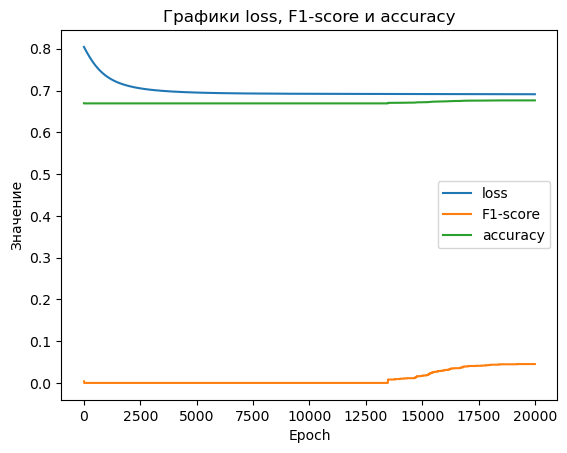

In [106]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf7['Epoch'], diagdf7['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf7['Epoch'], diagdf7['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf7['Epoch'], diagdf7['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [107]:
pred_test8=Mk8.forward(x_test.float())
pred_test_binarized8 = (pred_test8 > 0.5).float()

In [108]:
print(classification_report(y_test.to('cpu'), pred_test_binarized8.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.68      1.00      0.81      3226
         1.0       1.00      0.02      0.05      1537

    accuracy                           0.68      4763
   macro avg       0.84      0.51      0.43      4763
weighted avg       0.78      0.68      0.56      4763



In [109]:
#----------------------------------------------

<font color='red'>Word2Vec_MLP_Experiment_#9</font>

<font color='red'>layers: 1, epochs: 20000, lr: 0.0001 -> 0.001</font>

In [110]:
#----------------------------------------------

In [111]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK9(nn.Module): #изменить название
    def __init__(self, input_size, output_size):
        super(MLP_MK9, self).__init__()
        self.fc1 = nn.Linear(input_size, output_size)
#         self.relu = nn.ReLU()
#         self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
#         self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
#         self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
#         out = self.relu(out)
#         out = self.fc2(out)
        out = self.sigmoid(out)
#         out = self.fc3(out)
#         out = self.tanh(out)
        return out

In [112]:
Mk9=MLP_MK9(100,1) #изменить название переменной

In [113]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [114]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [115]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [116]:
Mk9=Mk9.to(dev)

In [117]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk9.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf8=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(20000):
    optimizer.zero_grad()
    pred = Mk9.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf8 = pd.concat([diagdf8, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.8075387477874756   f1-score: 0.17453135550022125   accuracy: 0.6552375555038452
Epoch:  2 , Loss:  0.8064908385276794   f1-score: 0.04186289757490158   accuracy: 0.6704463362693787
Epoch:  3 , Loss:  0.8054463267326355   f1-score: 0.01081373356282711   accuracy: 0.6707163453102112
Epoch:  4 , Loss:  0.8044050931930542   f1-score: 0.0032599836122244596   accuracy: 0.6698164343833923
Epoch:  5 , Loss:  0.803367555141449   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6 , Loss:  0.8023337721824646   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7 , Loss:  0.8013038635253906   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8 , Loss:  0.8002780079841614   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9 , Loss:  0.7992566227912903   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10 , Loss:  0.7982394695281982   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11 , Loss:  0.7972270250320435   f1-score: 0.0   accuracy: 0.669276475906372

Epoch:  118 , Loss:  0.7284209728240967   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  119 , Loss:  0.7281041145324707   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  120 , Loss:  0.7277910709381104   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  121 , Loss:  0.72748202085495   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  122 , Loss:  0.7271767854690552   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  123 , Loss:  0.7268752455711365   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  124 , Loss:  0.7265774607658386   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  125 , Loss:  0.7262833714485168   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  126 , Loss:  0.7259928584098816   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  127 , Loss:  0.7257058620452881   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  128 , Loss:  0.7254224419593811   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  129 , Loss:  0.7251424789428711   f1-

Epoch:  227 , Loss:  0.7086566090583801   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  228 , Loss:  0.7085593342781067   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  229 , Loss:  0.7084628343582153   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  230 , Loss:  0.7083673477172852   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  231 , Loss:  0.7082726955413818   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  232 , Loss:  0.7081788182258606   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  233 , Loss:  0.7080858945846558   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  234 , Loss:  0.707993745803833   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  235 , Loss:  0.7079023718833923   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  236 , Loss:  0.7078118920326233   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  237 , Loss:  0.7077221274375916   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  238 , Loss:  0.7076332569122314   f1

Epoch:  326 , Loss:  0.7020785808563232   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  327 , Loss:  0.7020342350006104   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  328 , Loss:  0.7019901871681213   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  329 , Loss:  0.7019464373588562   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  330 , Loss:  0.7019030451774597   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  331 , Loss:  0.7018598914146423   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  332 , Loss:  0.7018170356750488   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  333 , Loss:  0.7017744779586792   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  334 , Loss:  0.7017322182655334   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  335 , Loss:  0.7016902565956116   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  336 , Loss:  0.7016485333442688   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  337 , Loss:  0.7016071677207947   f

Epoch:  438 , Loss:  0.6985180974006653   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  439 , Loss:  0.6984956860542297   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  440 , Loss:  0.6984733939170837   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  441 , Loss:  0.6984511613845825   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  442 , Loss:  0.6984291076660156   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  443 , Loss:  0.6984071135520935   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  444 , Loss:  0.6983853578567505   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  445 , Loss:  0.6983636021614075   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  446 , Loss:  0.6983420252799988   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  447 , Loss:  0.6983205080032349   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  448 , Loss:  0.6982991099357605   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  449 , Loss:  0.6982778906822205   f

Epoch:  551 , Loss:  0.6965802311897278   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  552 , Loss:  0.6965672373771667   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  553 , Loss:  0.6965543031692505   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  554 , Loss:  0.696541428565979   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  555 , Loss:  0.6965286731719971   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  556 , Loss:  0.6965159177780151   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  557 , Loss:  0.696503221988678   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  558 , Loss:  0.6964905858039856   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  559 , Loss:  0.696478009223938   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  560 , Loss:  0.6964654922485352   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  561 , Loss:  0.6964530348777771   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  562 , Loss:  0.696440577507019   f1-sc

Epoch:  676 , Loss:  0.6953108310699463   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  677 , Loss:  0.6953029036521912   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  678 , Loss:  0.6952950954437256   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  679 , Loss:  0.69528728723526   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  680 , Loss:  0.6952794790267944   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  681 , Loss:  0.6952717304229736   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  682 , Loss:  0.6952639818191528   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  683 , Loss:  0.695256233215332   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  684 , Loss:  0.6952486038208008   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  685 , Loss:  0.6952409148216248   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  686 , Loss:  0.6952332854270935   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  687 , Loss:  0.6952256560325623   f1-s

Epoch:  771 , Loss:  0.6946728229522705   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  772 , Loss:  0.6946671009063721   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  773 , Loss:  0.6946614384651184   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  774 , Loss:  0.6946557760238647   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  775 , Loss:  0.6946501731872559   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  776 , Loss:  0.694644570350647   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  777 , Loss:  0.6946389675140381   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  778 , Loss:  0.6946333646774292   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  779 , Loss:  0.6946277618408203   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  780 , Loss:  0.6946222186088562   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  781 , Loss:  0.6946167349815369   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  782 , Loss:  0.6946111917495728   f1

Epoch:  870 , Loss:  0.6941869854927063   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  871 , Loss:  0.6941827535629272   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  872 , Loss:  0.694178581237793   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  873 , Loss:  0.6941744089126587   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  874 , Loss:  0.6941701769828796   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  875 , Loss:  0.6941660642623901   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  876 , Loss:  0.6941618919372559   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  877 , Loss:  0.6941577792167664   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  878 , Loss:  0.6941536664962769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  879 , Loss:  0.6941494941711426   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  880 , Loss:  0.6941453814506531   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  881 , Loss:  0.6941413283348083   f1

Epoch:  983 , Loss:  0.6937780380249023   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  984 , Loss:  0.693774938583374   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  985 , Loss:  0.6937718987464905   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  986 , Loss:  0.6937687993049622   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  987 , Loss:  0.6937657594680786   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  988 , Loss:  0.6937626600265503   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  989 , Loss:  0.693759560585022   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  990 , Loss:  0.6937565207481384   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  991 , Loss:  0.6937535405158997   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  992 , Loss:  0.6937504410743713   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  993 , Loss:  0.6937474608421326   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  994 , Loss:  0.693744421005249   f1-s

Epoch:  1100 , Loss:  0.6934633255004883   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1101 , Loss:  0.693461000919342   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1102 , Loss:  0.6934586763381958   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1103 , Loss:  0.6934563517570496   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1104 , Loss:  0.6934540271759033   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1105 , Loss:  0.6934517025947571   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1106 , Loss:  0.6934494376182556   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1107 , Loss:  0.6934471726417542   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1108 , Loss:  0.6934448480606079   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1109 , Loss:  0.6934425830841064   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1110 , Loss:  0.693440318107605   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1111 , Loss:  0.6934379935

Epoch:  1207 , Loss:  0.6932416558265686   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1208 , Loss:  0.6932398080825806   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1209 , Loss:  0.6932379603385925   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1210 , Loss:  0.693236231803894   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1211 , Loss:  0.693234384059906   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1212 , Loss:  0.693232536315918   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1213 , Loss:  0.6932306885719299   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1214 , Loss:  0.6932289004325867   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1215 , Loss:  0.6932271122932434   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1216 , Loss:  0.6932252645492554   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1217 , Loss:  0.6932234764099121   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1218 , Loss:  0.69322168827

Epoch:  1309 , Loss:  0.6930726170539856   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1310 , Loss:  0.6930711269378662   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1311 , Loss:  0.693069577217102   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1312 , Loss:  0.6930680871009827   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1313 , Loss:  0.6930665969848633   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1314 , Loss:  0.6930651068687439   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1315 , Loss:  0.6930636167526245   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1316 , Loss:  0.6930621266365051   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1317 , Loss:  0.6930607557296753   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1318 , Loss:  0.6930592060089111   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1319 , Loss:  0.6930577754974365   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1320 , Loss:  0.693056344

Epoch:  1419 , Loss:  0.6929243206977844   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1420 , Loss:  0.6929231286048889   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1421 , Loss:  0.6929218769073486   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1422 , Loss:  0.6929206848144531   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1423 , Loss:  0.6929194927215576   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1424 , Loss:  0.6929182410240173   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1425 , Loss:  0.6929171085357666   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1426 , Loss:  0.6929158568382263   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1427 , Loss:  0.6929146647453308   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1428 , Loss:  0.6929134726524353   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1429 , Loss:  0.6929122805595398   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1430 , Loss:  0.69291108

Epoch:  1522 , Loss:  0.6928098797798157   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1523 , Loss:  0.6928088665008545   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1524 , Loss:  0.6928079128265381   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1525 , Loss:  0.6928068995475769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1526 , Loss:  0.6928058862686157   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1527 , Loss:  0.6928048729896545   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1528 , Loss:  0.6928038597106934   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1529 , Loss:  0.6928028464317322   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1530 , Loss:  0.692801833152771   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1531 , Loss:  0.6928008794784546   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1532 , Loss:  0.6927998661994934   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1533 , Loss:  0.692798852

Epoch:  1627 , Loss:  0.6927120089530945   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1628 , Loss:  0.6927111148834229   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1629 , Loss:  0.6927103400230408   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1630 , Loss:  0.6927094459533691   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1631 , Loss:  0.6927085518836975   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1632 , Loss:  0.6927077174186707   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1633 , Loss:  0.6927068829536438   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1634 , Loss:  0.6927060484886169   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1635 , Loss:  0.6927052140235901   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1636 , Loss:  0.6927043795585632   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1637 , Loss:  0.6927035450935364   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1638 , Loss:  0.69270271

Epoch:  1752 , Loss:  0.6926146149635315   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1753 , Loss:  0.6926138997077942   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1754 , Loss:  0.6926132440567017   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1755 , Loss:  0.6926124691963196   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1756 , Loss:  0.6926117539405823   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1757 , Loss:  0.6926110982894897   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1758 , Loss:  0.6926103830337524   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1759 , Loss:  0.6926096081733704   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1760 , Loss:  0.6926089525222778   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1761 , Loss:  0.6926082968711853   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1762 , Loss:  0.692607581615448   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1763 , Loss:  0.692606925

Epoch:  1859 , Loss:  0.692544162273407   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1860 , Loss:  0.6925435066223145   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1861 , Loss:  0.6925429105758667   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1862 , Loss:  0.6925423741340637   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1863 , Loss:  0.6925417184829712   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1864 , Loss:  0.6925411224365234   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1865 , Loss:  0.6925405263900757   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1866 , Loss:  0.6925398707389832   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1867 , Loss:  0.6925393342971802   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1868 , Loss:  0.6925386786460876   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1869 , Loss:  0.6925380825996399   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1870 , Loss:  0.692537486

Epoch:  1977 , Loss:  0.6924773454666138   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1978 , Loss:  0.6924768090248108   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1979 , Loss:  0.6924762725830078   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1980 , Loss:  0.6924757957458496   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1981 , Loss:  0.6924752593040466   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1982 , Loss:  0.6924747228622437   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1983 , Loss:  0.6924741864204407   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1984 , Loss:  0.6924736499786377   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1985 , Loss:  0.6924731731414795   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1986 , Loss:  0.6924726963043213   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1987 , Loss:  0.6924721598625183   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1988 , Loss:  0.69247162

Epoch:  2090 , Loss:  0.6924219727516174   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2091 , Loss:  0.6924214363098145   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2092 , Loss:  0.692421019077301   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2093 , Loss:  0.6924206018447876   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2094 , Loss:  0.6924201250076294   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2095 , Loss:  0.6924196481704712   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2096 , Loss:  0.6924192309379578   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2097 , Loss:  0.6924187541007996   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2098 , Loss:  0.6924182772636414   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2099 , Loss:  0.6924178600311279   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2100 , Loss:  0.6924174427986145   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2101 , Loss:  0.692416906

Epoch:  2193 , Loss:  0.6923773288726807   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2194 , Loss:  0.692376971244812   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2195 , Loss:  0.6923765540122986   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2196 , Loss:  0.6923761367797852   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2197 , Loss:  0.6923757791519165   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2198 , Loss:  0.6923753023147583   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2199 , Loss:  0.6923749446868896   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2200 , Loss:  0.6923745274543762   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2201 , Loss:  0.6923741102218628   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2202 , Loss:  0.6923736929893494   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2203 , Loss:  0.6923732757568359   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2204 , Loss:  0.692372858

Epoch:  2308 , Loss:  0.6923329830169678   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2309 , Loss:  0.6923326849937439   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2310 , Loss:  0.6923322677612305   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2311 , Loss:  0.6923319101333618   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2312 , Loss:  0.6923315525054932   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2313 , Loss:  0.6923311352729797   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2314 , Loss:  0.6923308372497559   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2315 , Loss:  0.6923304796218872   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2316 , Loss:  0.6923301219940186   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2317 , Loss:  0.6923297643661499   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2318 , Loss:  0.6923293471336365   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2319 , Loss:  0.69232898

Epoch:  2422 , Loss:  0.6922937035560608   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2423 , Loss:  0.6922933459281921   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2424 , Loss:  0.6922930479049683   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2425 , Loss:  0.6922926902770996   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2426 , Loss:  0.692292332649231   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2427 , Loss:  0.6922920346260071   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2428 , Loss:  0.6922916769981384   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2429 , Loss:  0.6922913789749146   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2430 , Loss:  0.6922910809516907   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2431 , Loss:  0.692290723323822   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2432 , Loss:  0.6922904253005981   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2433 , Loss:  0.6922900676

Epoch:  2529 , Loss:  0.692260205745697   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2530 , Loss:  0.6922599077224731   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2531 , Loss:  0.6922596096992493   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2532 , Loss:  0.6922593116760254   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2533 , Loss:  0.6922590136528015   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2534 , Loss:  0.6922587156295776   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2535 , Loss:  0.6922584176063538   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2536 , Loss:  0.6922580599784851   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2537 , Loss:  0.692257821559906   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2538 , Loss:  0.6922575235366821   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2539 , Loss:  0.6922572255134583   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2540 , Loss:  0.6922569274

Epoch:  2629 , Loss:  0.6922314167022705   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2630 , Loss:  0.6922311782836914   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2631 , Loss:  0.6922308206558228   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2632 , Loss:  0.6922305822372437   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2633 , Loss:  0.6922302842140198   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2634 , Loss:  0.6922299861907959   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2635 , Loss:  0.6922297477722168   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2636 , Loss:  0.6922295093536377   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2637 , Loss:  0.692229151725769   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2638 , Loss:  0.6922289133071899   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2639 , Loss:  0.6922286748886108   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2640 , Loss:  0.692228317

Epoch:  2754 , Loss:  0.6921981573104858   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2755 , Loss:  0.692197859287262   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2756 , Loss:  0.6921976208686829   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2757 , Loss:  0.6921974420547485   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2758 , Loss:  0.6921972036361694   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2759 , Loss:  0.6921969056129456   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2760 , Loss:  0.6921966671943665   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2761 , Loss:  0.6921963691711426   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2762 , Loss:  0.6921961307525635   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2763 , Loss:  0.6921958923339844   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2764 , Loss:  0.6921956539154053   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2765 , Loss:  0.692195355

Epoch:  2876 , Loss:  0.6921681761741638   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2877 , Loss:  0.6921679377555847   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2878 , Loss:  0.6921676993370056   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2879 , Loss:  0.6921674609184265   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2880 , Loss:  0.6921672224998474   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2881 , Loss:  0.6921669244766235   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2882 , Loss:  0.692166805267334   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2883 , Loss:  0.6921665072441101   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2884 , Loss:  0.692166268825531   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2885 , Loss:  0.6921659708023071   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2886 , Loss:  0.6921657919883728   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2887 , Loss:  0.6921655535

Epoch:  3003 , Loss:  0.6921389102935791   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3004 , Loss:  0.692138671875   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3005 , Loss:  0.6921384930610657   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3006 , Loss:  0.6921381950378418   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3007 , Loss:  0.6921380162239075   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3008 , Loss:  0.6921377778053284   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3009 , Loss:  0.6921375393867493   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3010 , Loss:  0.6921373605728149   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3011 , Loss:  0.6921370625495911   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3012 , Loss:  0.6921368837356567   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3013 , Loss:  0.6921367049217224   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3014 , Loss:  0.692136466503

Epoch:  3124 , Loss:  0.6921124458312988   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3125 , Loss:  0.6921122670173645   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3126 , Loss:  0.6921120882034302   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3127 , Loss:  0.6921118497848511   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3128 , Loss:  0.6921116709709167   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3129 , Loss:  0.6921114325523376   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3130 , Loss:  0.6921112537384033   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3131 , Loss:  0.6921109557151794   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3132 , Loss:  0.6921107769012451   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3133 , Loss:  0.6921105980873108   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3134 , Loss:  0.6921103596687317   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3135 , Loss:  0.69211018

Epoch:  3242 , Loss:  0.6920877695083618   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3243 , Loss:  0.6920875310897827   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3244 , Loss:  0.6920873522758484   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3245 , Loss:  0.6920871734619141   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3246 , Loss:  0.692086935043335   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3247 , Loss:  0.6920866966247559   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3248 , Loss:  0.6920865178108215   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3249 , Loss:  0.6920863389968872   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3250 , Loss:  0.6920861005783081   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3251 , Loss:  0.6920859217643738   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3252 , Loss:  0.6920856833457947   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3253 , Loss:  0.692085504

Epoch:  3356 , Loss:  0.6920645833015442   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3357 , Loss:  0.6920643448829651   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3358 , Loss:  0.6920642256736755   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3359 , Loss:  0.6920639276504517   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3360 , Loss:  0.6920637488365173   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3361 , Loss:  0.692063570022583   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3362 , Loss:  0.6920633316040039   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3363 , Loss:  0.6920631527900696   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3364 , Loss:  0.6920629739761353   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3365 , Loss:  0.6920627951622009   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3366 , Loss:  0.6920625567436218   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3367 , Loss:  0.692062377

Epoch:  3467 , Loss:  0.6920424103736877   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3468 , Loss:  0.6920422315597534   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3469 , Loss:  0.6920420527458191   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3470 , Loss:  0.6920418739318848   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3471 , Loss:  0.6920416951179504   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3472 , Loss:  0.6920414566993713   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3473 , Loss:  0.692041277885437   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3474 , Loss:  0.6920410394668579   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3475 , Loss:  0.6920408606529236   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3476 , Loss:  0.6920406818389893   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3477 , Loss:  0.6920405030250549   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3478 , Loss:  0.692040264

Epoch:  3561 , Loss:  0.6920239329338074   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3562 , Loss:  0.692023754119873   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3563 , Loss:  0.692023515701294   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3564 , Loss:  0.6920233368873596   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3565 , Loss:  0.6920231580734253   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3566 , Loss:  0.6920229196548462   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3567 , Loss:  0.6920227408409119   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3568 , Loss:  0.6920225620269775   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3569 , Loss:  0.6920223832130432   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3570 , Loss:  0.6920221447944641   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3571 , Loss:  0.6920219659805298   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3572 , Loss:  0.6920217871

Epoch:  3684 , Loss:  0.6919997930526733   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3685 , Loss:  0.691999614238739   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3686 , Loss:  0.6919993758201599   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3687 , Loss:  0.6919991970062256   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3688 , Loss:  0.6919990181922913   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3689 , Loss:  0.6919988393783569   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3690 , Loss:  0.6919986009597778   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3691 , Loss:  0.6919984221458435   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3692 , Loss:  0.6919982433319092   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3693 , Loss:  0.6919980645179749   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3694 , Loss:  0.6919978857040405   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3695 , Loss:  0.691997587

Epoch:  3798 , Loss:  0.6919773817062378   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3799 , Loss:  0.6919771432876587   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3800 , Loss:  0.6919769644737244   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3801 , Loss:  0.69197678565979   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3802 , Loss:  0.6919766068458557   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3803 , Loss:  0.6919763684272766   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3804 , Loss:  0.6919761300086975   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3805 , Loss:  0.6919759511947632   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3806 , Loss:  0.6919757723808289   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3807 , Loss:  0.6919755935668945   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3808 , Loss:  0.6919753551483154   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3809 , Loss:  0.6919751763

Epoch:  3914 , Loss:  0.6919543743133545   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3915 , Loss:  0.6919541954994202   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3916 , Loss:  0.6919538974761963   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3917 , Loss:  0.691953718662262   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3918 , Loss:  0.6919535994529724   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3919 , Loss:  0.6919533610343933   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3920 , Loss:  0.6919531226158142   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3921 , Loss:  0.6919529438018799   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3922 , Loss:  0.6919527649879456   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3923 , Loss:  0.6919525265693665   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3924 , Loss:  0.6919523477554321   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3925 , Loss:  0.691952168

Epoch:  4024 , Loss:  0.6919321417808533   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4025 , Loss:  0.6919320225715637   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4026 , Loss:  0.6919317841529846   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4027 , Loss:  0.6919316053390503   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4028 , Loss:  0.6919313073158264   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4029 , Loss:  0.6919311881065369   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4030 , Loss:  0.6919310092926025   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4031 , Loss:  0.6919307112693787   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4032 , Loss:  0.6919305324554443   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4033 , Loss:  0.69193035364151   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4034 , Loss:  0.6919301748275757   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4035 , Loss:  0.6919299364

Epoch:  4136 , Loss:  0.6919091939926147   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4137 , Loss:  0.6919089555740356   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4138 , Loss:  0.6919087767601013   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4139 , Loss:  0.6919085383415222   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4140 , Loss:  0.6919082999229431   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4141 , Loss:  0.6919081211090088   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4142 , Loss:  0.6919079422950745   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4143 , Loss:  0.6919077038764954   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4144 , Loss:  0.691907525062561   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4145 , Loss:  0.6919072270393372   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4146 , Loss:  0.6919071078300476   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4147 , Loss:  0.691906929

Epoch:  4263 , Loss:  0.691882312297821   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4264 , Loss:  0.6918821334838867   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4265 , Loss:  0.6918819546699524   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4266 , Loss:  0.6918817162513733   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4267 , Loss:  0.6918814778327942   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4268 , Loss:  0.6918812990188599   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4269 , Loss:  0.6918810606002808   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4270 , Loss:  0.6918808817863464   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4271 , Loss:  0.6918806433677673   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4272 , Loss:  0.691880464553833   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4273 , Loss:  0.6918801665306091   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4274 , Loss:  0.6918799877

Epoch:  4364 , Loss:  0.6918604373931885   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4365 , Loss:  0.6918602585792542   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4366 , Loss:  0.6918599605560303   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4367 , Loss:  0.691859781742096   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4368 , Loss:  0.6918595433235168   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4369 , Loss:  0.6918593645095825   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4370 , Loss:  0.6918590664863586   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4371 , Loss:  0.6918589472770691   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4372 , Loss:  0.6918586492538452   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4373 , Loss:  0.6918584704399109   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4374 , Loss:  0.6918582320213318   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4375 , Loss:  0.691858053

Epoch:  4486 , Loss:  0.6918331384658813   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4487 , Loss:  0.6918329000473022   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4488 , Loss:  0.6918326616287231   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4489 , Loss:  0.691832423210144   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4490 , Loss:  0.6918321847915649   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4491 , Loss:  0.6918319463729858   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4492 , Loss:  0.6918317079544067   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4493 , Loss:  0.6918315291404724   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4494 , Loss:  0.6918312907218933   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4495 , Loss:  0.6918310523033142   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4496 , Loss:  0.6918308138847351   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4497 , Loss:  0.691830575

Epoch:  4592 , Loss:  0.6918085813522339   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4593 , Loss:  0.69180828332901   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4594 , Loss:  0.6918080449104309   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4595 , Loss:  0.6918078660964966   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4596 , Loss:  0.6918075680732727   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4597 , Loss:  0.6918073296546936   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4598 , Loss:  0.6918070912361145   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4599 , Loss:  0.6918069124221802   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4600 , Loss:  0.6918066740036011   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4601 , Loss:  0.691806435585022   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4602 , Loss:  0.6918061971664429   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4603 , Loss:  0.69180589914

Epoch:  4696 , Loss:  0.691783607006073   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4697 , Loss:  0.6917833685874939   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4698 , Loss:  0.6917831301689148   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4699 , Loss:  0.6917828321456909   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4700 , Loss:  0.6917826533317566   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4701 , Loss:  0.6917824149131775   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4702 , Loss:  0.6917821168899536   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4703 , Loss:  0.6917818784713745   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4704 , Loss:  0.6917816996574402   f1-score: 0.008127878420054913   accuracy: 0.6705363392829895
Epoch:  4705 , Loss:  0.6917814016342163   f1-score: 0.0

Epoch:  4799 , Loss:  0.6917580962181091   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  4800 , Loss:  0.6917577981948853   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  4801 , Loss:  0.6917575597763062   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  4802 , Loss:  0.691757321357727   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  4803 , Loss:  0.691757082939148   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  4804 , Loss:  0.6917567849159241   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  4805 , Loss:  0.6917566061019897   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  4806 , Loss:  0.6917562484741211   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  4807 , Loss:  0.691756010055542   f1-score: 0.00920660700649023   accuracy: 0.6707163453102112
Epoch:  4808 , Loss:  0.6917557716369629   f1-score: 0.009206607006

Epoch:  4897 , Loss:  0.6917329430580139   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  4898 , Loss:  0.6917327046394348   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  4899 , Loss:  0.6917324066162109   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  4900 , Loss:  0.6917321681976318   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  4901 , Loss:  0.6917319297790527   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  4902 , Loss:  0.6917316913604736   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  4903 , Loss:  0.6917313933372498   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  4904 , Loss:  0.6917311549186707   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  4905 , Loss:  0.6917308568954468   f1-score: 0.01028138492256403   accuracy: 0.670806348323822
Epoch:  4906 , Loss:  0.6917306184768677   f1-score: 0.01028138492256403 

Epoch:  4991 , Loss:  0.6917080879211426   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  4992 , Loss:  0.6917078495025635   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  4993 , Loss:  0.6917076110839844   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  4994 , Loss:  0.6917073130607605   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  4995 , Loss:  0.6917070746421814   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  4996 , Loss:  0.6917067766189575   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  4997 , Loss:  0.6917064785957336   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  4998 , Loss:  0.6917062401771545   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  4999 , Loss:  0.6917059421539307   f1-score: 0.01135749090462923   accuracy: 0.6709862947463989
Epoch:  5000 , Loss:  0.6917057037353516   f1-score: 0.011357490

Epoch:  5091 , Loss:  0.6916808485984802   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  5092 , Loss:  0.6916804909706116   f1-score: 0.016185594722628593   accuracy: 0.6717962622642517
Epoch:  5093 , Loss:  0.6916802525520325   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5094 , Loss:  0.6916800141334534   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5095 , Loss:  0.6916797161102295   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5096 , Loss:  0.6916794180870056   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5097 , Loss:  0.6916791200637817   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5098 , Loss:  0.6916788220405579   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5099 , Loss:  0.6916785836219788   f1-score: 0.01672060415148735   accuracy: 0.6718862652778625
Epoch:  5100 , Loss:  0.6916783452033997   f1-score: 0.0167206

Epoch:  5188 , Loss:  0.6916534304618835   f1-score: 0.019919246435165405   accuracy: 0.672336220741272
Epoch:  5189 , Loss:  0.6916531920433044   f1-score: 0.019919246435165405   accuracy: 0.672336220741272
Epoch:  5190 , Loss:  0.6916528940200806   f1-score: 0.019919246435165405   accuracy: 0.672336220741272
Epoch:  5191 , Loss:  0.6916525959968567   f1-score: 0.019919246435165405   accuracy: 0.672336220741272
Epoch:  5192 , Loss:  0.6916522979736328   f1-score: 0.019919246435165405   accuracy: 0.672336220741272
Epoch:  5193 , Loss:  0.6916519999504089   f1-score: 0.019919246435165405   accuracy: 0.672336220741272
Epoch:  5194 , Loss:  0.6916517615318298   f1-score: 0.019919246435165405   accuracy: 0.672336220741272
Epoch:  5195 , Loss:  0.691651463508606   f1-score: 0.019919246435165405   accuracy: 0.672336220741272
Epoch:  5196 , Loss:  0.6916511654853821   f1-score: 0.019919246435165405   accuracy: 0.672336220741272
Epoch:  5197 , Loss:  0.691650927066803   f1-score: 0.01991924643

Epoch:  5303 , Loss:  0.6916199922561646   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  5304 , Loss:  0.6916196942329407   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  5305 , Loss:  0.691619336605072   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  5306 , Loss:  0.6916190981864929   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  5307 , Loss:  0.691618800163269   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  5308 , Loss:  0.6916184425354004   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  5309 , Loss:  0.6916181445121765   f1-score: 0.02682403475046158   accuracy: 0.6735061407089233
Epoch:  5310 , Loss:  0.6916179060935974   f1-score: 0.027353178709745407   accuracy: 0.6735960841178894
Epoch:  5311 , Loss:  0.6916176080703735   f1-score: 0.027353178709745407   accuracy: 0.6735960841178894
Epoch:  5312 , Loss:  0.6916173100471497   f1-score: 0.027353178

Epoch:  5408 , Loss:  0.6915884017944336   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5409 , Loss:  0.6915880441665649   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5410 , Loss:  0.6915876865386963   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5411 , Loss:  0.6915874481201172   f1-score: 0.029466915875673294   accuracy: 0.6739560961723328
Epoch:  5412 , Loss:  0.6915871500968933   f1-score: 0.029994644224643707   accuracy: 0.6740460991859436
Epoch:  5413 , Loss:  0.6915868520736694   f1-score: 0.029994644224643707   accuracy: 0.6740460991859436
Epoch:  5414 , Loss:  0.6915865540504456   f1-score: 0.029994644224643707   accuracy: 0.6740460991859436
Epoch:  5415 , Loss:  0.6915861964225769   f1-score: 0.029994644224643707   accuracy: 0.6740460991859436
Epoch:  5416 , Loss:  0.6915859580039978   f1-score: 0.029994644224643707   accuracy: 0.6740460991859436
Epoch:  5417 , Loss:  0.6915856003761292   f1-score: 0.

Epoch:  5522 , Loss:  0.6915530562400818   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  5523 , Loss:  0.6915527582168579   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  5524 , Loss:  0.6915524005889893   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  5525 , Loss:  0.6915521025657654   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  5526 , Loss:  0.6915517449378967   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  5527 , Loss:  0.6915514469146729   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  5528 , Loss:  0.691551148891449   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  5529 , Loss:  0.6915507912635803   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  5530 , Loss:  0.6915505528450012   f1-score: 0.03473149985074997   accuracy: 0.6748560070991516
Epoch:  5531 , Loss:  0.6915501952171326   f1-score: 0.0347314998

Epoch:  5605 , Loss:  0.6915266513824463   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  5606 , Loss:  0.6915263533592224   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  5607 , Loss:  0.6915259957313538   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  5608 , Loss:  0.6915256381034851   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  5609 , Loss:  0.6915253400802612   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  5610 , Loss:  0.6915250420570374   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  5611 , Loss:  0.6915246844291687   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  5612 , Loss:  0.6915243864059448   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  5613 , Loss:  0.691524088382721   f1-score: 0.035256411880254745   accuracy: 0.6749460101127625
Epoch:  5614 , Loss:  0.6915237307548523   f1-score: 0.0

Epoch:  5712 , Loss:  0.6914919018745422   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  5713 , Loss:  0.6914915442466736   f1-score: 0.038922954350709915   accuracy: 0.6755759716033936
Epoch:  5714 , Loss:  0.6914911866188049   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  5715 , Loss:  0.691490888595581   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  5716 , Loss:  0.6914905309677124   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  5717 , Loss:  0.6914902329444885   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  5718 , Loss:  0.6914898753166199   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  5719 , Loss:  0.691489577293396   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  5720 , Loss:  0.6914892196655273   f1-score: 0.039445627480745316   accuracy: 0.6756659746170044
Epoch:  5721 , Loss:  0.6914888620376587   f1-score: 0.03

Epoch:  5810 , Loss:  0.6914592981338501   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5811 , Loss:  0.6914589405059814   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5812 , Loss:  0.6914586424827576   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5813 , Loss:  0.6914582848548889   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5814 , Loss:  0.691457986831665   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5815 , Loss:  0.6914576292037964   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5816 , Loss:  0.6914573311805725   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5817 , Loss:  0.6914569735527039   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5818 , Loss:  0.6914566159248352   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5819 , Loss:  0.6914562582969666   f1-score: 0.0404901430

Epoch:  5915 , Loss:  0.6914238333702087   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5916 , Loss:  0.6914234757423401   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5917 , Loss:  0.6914231181144714   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5918 , Loss:  0.6914228200912476   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5919 , Loss:  0.6914224624633789   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5920 , Loss:  0.691422164440155   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5921 , Loss:  0.6914218068122864   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5922 , Loss:  0.6914214491844177   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5923 , Loss:  0.6914210915565491   f1-score: 0.04049014300107956   accuracy: 0.6758459210395813
Epoch:  5924 , Loss:  0.6914207935333252   f1-score: 0.0404901430

Epoch:  6022 , Loss:  0.6913870573043823   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6023 , Loss:  0.6913866996765137   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6024 , Loss:  0.691386342048645   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6025 , Loss:  0.6913860440254211   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6026 , Loss:  0.6913856863975525   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6027 , Loss:  0.6913853883743286   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6028 , Loss:  0.69138503074646   f1-score: 0.04100106656551361   accuracy: 0.6758459210395813
Epoch:  6029 , Loss:  0.6913846731185913   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  6030 , Loss:  0.6913843750953674   f1-score: 0.041522491723299026   accuracy: 0.6759359240531921
Epoch:  6031 , Loss:  0.6913840174674988   f1-score: 0.0415224917

Epoch:  6106 , Loss:  0.6913579106330872   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6107 , Loss:  0.6913575530052185   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6108 , Loss:  0.6913572549819946   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6109 , Loss:  0.6913569569587708   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6110 , Loss:  0.6913565397262573   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6111 , Loss:  0.6913561224937439   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6112 , Loss:  0.6913558840751648   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6113 , Loss:  0.6913555264472961   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6114 , Loss:  0.6913551092147827   f1-score: 0.0425645112991333   accuracy: 0.6761159300804138
Epoch:  6115 , Loss:  0.6913547515869141   f1-score: 0.0425645112991333  

Epoch:  6186 , Loss:  0.6913299560546875   f1-score: 0.04307365044951439   accuracy: 0.6761159300804138
Epoch:  6187 , Loss:  0.6913295984268188   f1-score: 0.04307365044951439   accuracy: 0.6761159300804138
Epoch:  6188 , Loss:  0.691329300403595   f1-score: 0.04307365044951439   accuracy: 0.6761159300804138
Epoch:  6189 , Loss:  0.6913289427757263   f1-score: 0.04307365044951439   accuracy: 0.6761159300804138
Epoch:  6190 , Loss:  0.6913285851478577   f1-score: 0.04307365044951439   accuracy: 0.6761159300804138
Epoch:  6191 , Loss:  0.691328227519989   f1-score: 0.04307365044951439   accuracy: 0.6761159300804138
Epoch:  6192 , Loss:  0.6913278698921204   f1-score: 0.04307365044951439   accuracy: 0.6761159300804138
Epoch:  6193 , Loss:  0.6913275122642517   f1-score: 0.04307365044951439   accuracy: 0.6761159300804138
Epoch:  6194 , Loss:  0.6913271546363831   f1-score: 0.04307365044951439   accuracy: 0.6761159300804138
Epoch:  6195 , Loss:  0.6913267970085144   f1-score: 0.04307365044

Epoch:  6295 , Loss:  0.6912916302680969   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6296 , Loss:  0.6912912726402283   f1-score: 0.04359383136034012   accuracy: 0.6762059330940247
Epoch:  6297 , Loss:  0.6912909150123596   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6298 , Loss:  0.691290557384491   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6299 , Loss:  0.6912901997566223   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6300 , Loss:  0.6912899017333984   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6301 , Loss:  0.6912895441055298   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6302 , Loss:  0.6912891864776611   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6303 , Loss:  0.6912888288497925   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6304 , Loss:  0.6912884712219238   f1-score: 0.0441137403

Epoch:  6390 , Loss:  0.6912581920623779   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6391 , Loss:  0.6912578344345093   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6392 , Loss:  0.6912574768066406   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6393 , Loss:  0.691257119178772   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6394 , Loss:  0.6912567615509033   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6395 , Loss:  0.6912564635276794   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6396 , Loss:  0.691256046295166   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6397 , Loss:  0.6912557482719421   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6398 , Loss:  0.6912553906440735   f1-score: 0.04411374032497406   accuracy: 0.6762958765029907
Epoch:  6399 , Loss:  0.6912550926208496   f1-score: 0.04411374032

Epoch:  6485 , Loss:  0.6912248134613037   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6486 , Loss:  0.6912243962287903   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6487 , Loss:  0.6912240386009216   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6488 , Loss:  0.691223680973053   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6489 , Loss:  0.6912233233451843   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6490 , Loss:  0.6912229657173157   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6491 , Loss:  0.6912226676940918   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6492 , Loss:  0.6912223100662231   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6493 , Loss:  0.6912219524383545   f1-score: 0.04463336989283562   accuracy: 0.6763858795166016
Epoch:  6494 , Loss:  0.6912215948104858   f1-score: 0.0446333698

Epoch:  6575 , Loss:  0.6911932229995728   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6576 , Loss:  0.6911928653717041   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6577 , Loss:  0.6911925077438354   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6578 , Loss:  0.6911921501159668   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6579 , Loss:  0.6911917924880981   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6580 , Loss:  0.6911914348602295   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6581 , Loss:  0.6911910772323608   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6582 , Loss:  0.691190779209137   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6583 , Loss:  0.6911903619766235   f1-score: 0.04515272378921509   accuracy: 0.6764758825302124
Epoch:  6584 , Loss:  0.6911900639533997   f1-score: 0.0451527237

Epoch:  6685 , Loss:  0.691154956817627   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6686 , Loss:  0.6911545991897583   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6687 , Loss:  0.6911542415618896   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6688 , Loss:  0.691153883934021   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6689 , Loss:  0.6911535263061523   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6690 , Loss:  0.6911532282829285   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6691 , Loss:  0.6911528706550598   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6692 , Loss:  0.6911525130271912   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6693 , Loss:  0.6911521553993225   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6694 , Loss:  0.6911517977714539   f1-score: 0.04567180201

Epoch:  6778 , Loss:  0.6911228895187378   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6779 , Loss:  0.6911225318908691   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6780 , Loss:  0.6911221742630005   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6781 , Loss:  0.6911218166351318   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6782 , Loss:  0.691121518611908   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6783 , Loss:  0.6911211609840393   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6784 , Loss:  0.6911208033561707   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6785 , Loss:  0.6911205053329468   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6786 , Loss:  0.6911201477050781   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6787 , Loss:  0.6911197900772095   f1-score: 0.0456718020

Epoch:  6869 , Loss:  0.6910919547080994   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6870 , Loss:  0.6910915374755859   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6871 , Loss:  0.6910912394523621   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6872 , Loss:  0.6910908818244934   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6873 , Loss:  0.6910905838012695   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6874 , Loss:  0.6910902261734009   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6875 , Loss:  0.6910898685455322   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6876 , Loss:  0.6910895705223083   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6877 , Loss:  0.6910892128944397   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6878 , Loss:  0.691088855266571   f1-score: 0.0456718020

Epoch:  6972 , Loss:  0.6910574436187744   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6973 , Loss:  0.6910570859909058   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6974 , Loss:  0.6910567283630371   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6975 , Loss:  0.6910564303398132   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6976 , Loss:  0.6910561323165894   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6977 , Loss:  0.6910557746887207   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6978 , Loss:  0.691055417060852   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6979 , Loss:  0.6910551190376282   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6980 , Loss:  0.6910547614097595   f1-score: 0.04567180201411247   accuracy: 0.6765658855438232
Epoch:  6981 , Loss:  0.6910544037818909   f1-score: 0.0456718020

Epoch:  7086 , Loss:  0.6910200119018555   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7087 , Loss:  0.6910197138786316   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7088 , Loss:  0.6910193562507629   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7089 , Loss:  0.6910189986228943   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7090 , Loss:  0.6910187602043152   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7091 , Loss:  0.6910184025764465   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7092 , Loss:  0.6910180449485779   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7093 , Loss:  0.691017746925354   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7094 , Loss:  0.6910174489021301   f1-score: 0.04619060084223747   accuracy: 0.6766558885574341
Epoch:  7095 , Loss:  0.6910170912742615   f1-score: 0.0461906008

Epoch:  7190 , Loss:  0.690986692905426   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7191 , Loss:  0.6909863948822021   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7192 , Loss:  0.6909860372543335   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7193 , Loss:  0.6909856796264648   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7194 , Loss:  0.690985381603241   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7195 , Loss:  0.6909850835800171   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7196 , Loss:  0.6909847259521484   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7197 , Loss:  0.6909844875335693   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7198 , Loss:  0.6909841299057007   f1-score: 0.04617834463715553   accuracy: 0.6765658855438232
Epoch:  7199 , Loss:  0.6909838318824768   f1-score: 0.04617834463

Epoch:  7287 , Loss:  0.6909562945365906   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7288 , Loss:  0.6909559965133667   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7289 , Loss:  0.690955638885498   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7290 , Loss:  0.690955400466919   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7291 , Loss:  0.6909550428390503   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7292 , Loss:  0.6909547448158264   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7293 , Loss:  0.6909544467926025   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7294 , Loss:  0.6909540891647339   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7295 , Loss:  0.69095379114151   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7296 , Loss:  0.6909534931182861   f1-score: 0.046696737408638   accuracy: 0.6

Epoch:  7378 , Loss:  0.6909285187721252   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7379 , Loss:  0.6909281611442566   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7380 , Loss:  0.6909278631210327   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7381 , Loss:  0.6909275650978088   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7382 , Loss:  0.690927267074585   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7383 , Loss:  0.6909269690513611   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7384 , Loss:  0.6909266710281372   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7385 , Loss:  0.6909263730049133   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7386 , Loss:  0.6909260153770447   f1-score: 0.046696737408638   accuracy: 0.6766558885574341
Epoch:  7387 , Loss:  0.6909257769584656   f1-score: 0.046696737408638   accuracy: 

Epoch:  7477 , Loss:  0.6908989548683167   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7478 , Loss:  0.6908987164497375   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7479 , Loss:  0.6908984184265137   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7480 , Loss:  0.690898060798645   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7481 , Loss:  0.6908977627754211   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7482 , Loss:  0.690897524356842   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7483 , Loss:  0.6908972263336182   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7484 , Loss:  0.6908969283103943   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7485 , Loss:  0.6908965706825256   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7486 , Loss:  0.6908963322639465   f1-score: 0.04

Epoch:  7582 , Loss:  0.6908685564994812   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7583 , Loss:  0.6908683180809021   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7584 , Loss:  0.6908679604530334   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7585 , Loss:  0.6908677220344543   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7586 , Loss:  0.6908674836158752   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7587 , Loss:  0.6908671259880066   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7588 , Loss:  0.6908668875694275   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7589 , Loss:  0.6908665895462036   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7590 , Loss:  0.6908662915229797   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7591 , Loss:  0.6908659934997559   f1-score: 0.

Epoch:  7670 , Loss:  0.6908438205718994   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7671 , Loss:  0.6908435821533203   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7672 , Loss:  0.6908432841300964   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7673 , Loss:  0.6908429861068726   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7674 , Loss:  0.6908427476882935   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7675 , Loss:  0.6908424496650696   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7676 , Loss:  0.6908422112464905   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7677 , Loss:  0.6908419132232666   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7678 , Loss:  0.690841555595398   f1-score: 0.046684350818395615   accuracy: 0.6765658855438232
Epoch:  7679 , Loss:  0.6908413171768188   f1-score: 0.0

Epoch:  7766 , Loss:  0.6908175945281982   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7767 , Loss:  0.6908172965049744   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7768 , Loss:  0.6908170580863953   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7769 , Loss:  0.6908168196678162   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7770 , Loss:  0.6908165216445923   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7771 , Loss:  0.6908162832260132   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7772 , Loss:  0.6908159852027893   f1-score: 0.04720233380794525   accuracy: 0.6766558885574341
Epoch:  7773 , Loss:  0.6908157467842102   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7774 , Loss:  0.6908154487609863   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7775 , Loss:  0.6908151507377625   f1-score: 0.04772004112

Epoch:  7877 , Loss:  0.690788209438324   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7878 , Loss:  0.6907879710197449   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7879 , Loss:  0.6907877326011658   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7880 , Loss:  0.6907873749732971   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7881 , Loss:  0.6907871961593628   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7882 , Loss:  0.6907868981361389   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7883 , Loss:  0.6907866597175598   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7884 , Loss:  0.6907863616943359   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7885 , Loss:  0.6907861232757568   f1-score: 0.0477200411260128   accuracy: 0.6767458319664001
Epoch:  7886 , Loss:  0.6907858848571777   f1-score: 0.0477200411260128   

Epoch:  7981 , Loss:  0.6907616257667542   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  7982 , Loss:  0.690761387348175   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  7983 , Loss:  0.6907610893249512   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  7984 , Loss:  0.6907608509063721   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  7985 , Loss:  0.690760612487793   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  7986 , Loss:  0.6907603144645691   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  7987 , Loss:  0.6907601356506348   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  7988 , Loss:  0.6907598376274109   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  7989 , Loss:  0.6907595992088318   f1-score: 0.048237476497888565   accuracy: 0.676835834980011
Epoch:  7990 , Loss:  0.6907593011856079   f1-score: 0.04823747649

Epoch:  8088 , Loss:  0.6907351613044739   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8089 , Loss:  0.6907349228858948   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8090 , Loss:  0.6907346844673157   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8091 , Loss:  0.6907344460487366   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8092 , Loss:  0.6907342076301575   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8093 , Loss:  0.6907339096069336   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8094 , Loss:  0.6907337307929993   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8095 , Loss:  0.6907334923744202   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8096 , Loss:  0.6907331943511963   f1-score: 0.04822469502687454   accuracy: 0.6767458319664001
Epoch:  8097 , Loss:  0.6907329559326172   f1-score: 0.048224695

Epoch:  8180 , Loss:  0.6907131671905518   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8181 , Loss:  0.6907129287719727   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8182 , Loss:  0.6907126307487488   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8183 , Loss:  0.6907124519348145   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8184 , Loss:  0.6907122135162354   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8185 , Loss:  0.6907119750976562   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8186 , Loss:  0.6907116770744324   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8187 , Loss:  0.690711498260498   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8188 , Loss:  0.690711259841919   f1-score: 0.048211921006441116   accuracy: 0.6766558885574341
Epoch:  8189 , Loss:  0.6907110214233398   f1-score: 0.04

Epoch:  8285 , Loss:  0.6906887292861938   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8286 , Loss:  0.6906885504722595   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8287 , Loss:  0.6906883120536804   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8288 , Loss:  0.6906880736351013   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8289 , Loss:  0.690687894821167   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8290 , Loss:  0.6906876564025879   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8291 , Loss:  0.690687358379364   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8292 , Loss:  0.6906872391700745   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8293 , Loss:  0.6906869411468506   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8294 , Loss:  0.6906867027282715   f1-score: 0.04

Epoch:  8392 , Loss:  0.6906647682189941   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8393 , Loss:  0.6906645894050598   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8394 , Loss:  0.6906642913818359   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8395 , Loss:  0.6906641125679016   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8396 , Loss:  0.6906638741493225   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8397 , Loss:  0.6906636357307434   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8398 , Loss:  0.6906634569168091   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8399 , Loss:  0.69066321849823   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8400 , Loss:  0.6906629800796509   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8401 , Loss:  0.6906628012657166   f1-score: 0.04

Epoch:  8471 , Loss:  0.690647542476654   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8472 , Loss:  0.6906473636627197   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8473 , Loss:  0.6906470656394958   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8474 , Loss:  0.6906469464302063   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8475 , Loss:  0.6906466484069824   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8476 , Loss:  0.6906464695930481   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8477 , Loss:  0.690646231174469   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8478 , Loss:  0.6906460523605347   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8479 , Loss:  0.6906458139419556   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8480 , Loss:  0.6906455755233765   f1-score: 0.04

Epoch:  8572 , Loss:  0.6906262040138245   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8573 , Loss:  0.6906259059906006   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8574 , Loss:  0.6906257271766663   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8575 , Loss:  0.6906254887580872   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8576 , Loss:  0.6906253099441528   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8577 , Loss:  0.6906250715255737   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8578 , Loss:  0.6906248331069946   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8579 , Loss:  0.6906246542930603   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8580 , Loss:  0.6906244158744812   f1-score: 0.048728812485933304   accuracy: 0.6767458319664001
Epoch:  8581 , Loss:  0.6906242370605469   f1-score: 0.

Epoch:  8674 , Loss:  0.6906051635742188   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8675 , Loss:  0.6906049251556396   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8676 , Loss:  0.6906047463417053   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8677 , Loss:  0.6906045079231262   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8678 , Loss:  0.6906043291091919   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8679 , Loss:  0.6906040906906128   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8680 , Loss:  0.6906039714813232   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8681 , Loss:  0.6906037330627441   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8682 , Loss:  0.690603494644165   f1-score: 0.049245432019233704   accuracy: 0.676835834980011
Epoch:  8683 , Loss:  0.6906033158302307   f1-score: 0.0492454320

Epoch:  8768 , Loss:  0.6905863285064697   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8769 , Loss:  0.6905860900878906   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8770 , Loss:  0.6905859112739563   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8771 , Loss:  0.690585732460022   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8772 , Loss:  0.6905855536460876   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8773 , Loss:  0.6905853748321533   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8774 , Loss:  0.6905851364135742   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8775 , Loss:  0.6905849575996399   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8776 , Loss:  0.6905847191810608   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8777 , Loss:  0.6905845403671265   f1-score: 0.0

Epoch:  8860 , Loss:  0.6905683875083923   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8861 , Loss:  0.6905681490898132   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8862 , Loss:  0.6905679702758789   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8863 , Loss:  0.6905678510665894   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8864 , Loss:  0.6905676126480103   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8865 , Loss:  0.6905674338340759   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8866 , Loss:  0.6905671954154968   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8867 , Loss:  0.6905670166015625   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8868 , Loss:  0.6905668377876282   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8869 , Loss:  0.6905666589736938   f1-score: 0.

Epoch:  8945 , Loss:  0.6905521750450134   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8946 , Loss:  0.6905519962310791   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8947 , Loss:  0.6905518174171448   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8948 , Loss:  0.6905515789985657   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8949 , Loss:  0.6905514597892761   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8950 , Loss:  0.690551221370697   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8951 , Loss:  0.6905510425567627   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8952 , Loss:  0.6905508637428284   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8953 , Loss:  0.690550684928894   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  8954 , Loss:  0.6905505061149597   f1-score: 0.04

Epoch:  9039 , Loss:  0.6905345916748047   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9040 , Loss:  0.6905344724655151   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9041 , Loss:  0.690534234046936   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9042 , Loss:  0.6905340552330017   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9043 , Loss:  0.6905338764190674   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9044 , Loss:  0.6905336976051331   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9045 , Loss:  0.6905335187911987   f1-score: 0.049761779606342316   accuracy: 0.6769258379936218
Epoch:  9046 , Loss:  0.6905333995819092   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9047 , Loss:  0.6905332207679749   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9048 , Loss:  0.6905329823493958   f1-score: 0.050

Epoch:  9121 , Loss:  0.6905196905136108   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9122 , Loss:  0.6905195116996765   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9123 , Loss:  0.6905193328857422   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9124 , Loss:  0.6905191540718079   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9125 , Loss:  0.6905189752578735   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9126 , Loss:  0.6905187964439392   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9127 , Loss:  0.6905185580253601   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9128 , Loss:  0.6905184388160706   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9129 , Loss:  0.6905182003974915   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9130 , Loss:  0.6905180215835571   f1-score: 0.050277851

Epoch:  9206 , Loss:  0.6905044317245483   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9207 , Loss:  0.690504252910614   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9208 , Loss:  0.6905041337013245   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9209 , Loss:  0.6905038952827454   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9210 , Loss:  0.6905037760734558   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9211 , Loss:  0.6905035972595215   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9212 , Loss:  0.6905034184455872   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9213 , Loss:  0.6905031800270081   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9214 , Loss:  0.6905030012130737   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9215 , Loss:  0.6905028223991394   f1-score: 0.0502778515

Epoch:  9285 , Loss:  0.6904904842376709   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9286 , Loss:  0.6904903054237366   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9287 , Loss:  0.6904901266098022   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9288 , Loss:  0.6904900074005127   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9289 , Loss:  0.6904897689819336   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9290 , Loss:  0.690489649772644   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9291 , Loss:  0.6904894113540649   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9292 , Loss:  0.6904892325401306   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9293 , Loss:  0.6904890537261963   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9294 , Loss:  0.690488874912262   f1-score: 0.05027785152

Epoch:  9385 , Loss:  0.690473198890686   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9386 , Loss:  0.6904730200767517   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9387 , Loss:  0.6904728412628174   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9388 , Loss:  0.6904726624488831   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9389 , Loss:  0.6904724836349487   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9390 , Loss:  0.6904723644256592   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9391 , Loss:  0.6904721260070801   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9392 , Loss:  0.6904720067977905   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9393 , Loss:  0.6904718279838562   f1-score: 0.05027785152196884   accuracy: 0.6770158410072327
Epoch:  9394 , Loss:  0.6904716491699219   f1-score: 0.0502778515

Epoch:  9476 , Loss:  0.6904576420783997   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9477 , Loss:  0.6904575228691101   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9478 , Loss:  0.6904573440551758   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9479 , Loss:  0.6904571652412415   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9480 , Loss:  0.6904569864273071   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9481 , Loss:  0.6904568076133728   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9482 , Loss:  0.6904566287994385   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9483 , Loss:  0.6904565095901489   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9484 , Loss:  0.6904563307762146   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9485 , Loss:  0.6904560923576355   f1-score: 0.050793651

Epoch:  9558 , Loss:  0.6904439330101013   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9559 , Loss:  0.690443754196167   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9560 , Loss:  0.6904435753822327   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9561 , Loss:  0.6904433965682983   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9562 , Loss:  0.690443217754364   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9563 , Loss:  0.6904430985450745   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9564 , Loss:  0.6904429197311401   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9565 , Loss:  0.6904427409172058   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9566 , Loss:  0.6904425024986267   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9567 , Loss:  0.6904423832893372   f1-score: 0.05079365149

Epoch:  9640 , Loss:  0.690430223941803   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9641 , Loss:  0.6904300451278687   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9642 , Loss:  0.6904299259185791   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9643 , Loss:  0.6904297471046448   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9644 , Loss:  0.6904295682907104   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9645 , Loss:  0.6904293894767761   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9646 , Loss:  0.6904292106628418   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9647 , Loss:  0.6904290318489075   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9648 , Loss:  0.6904289126396179   f1-score: 0.05079365149140358   accuracy: 0.6771058440208435
Epoch:  9649 , Loss:  0.6904287338256836   f1-score: 0.0507936514

Epoch:  9724 , Loss:  0.6904163956642151   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9725 , Loss:  0.6904162168502808   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9726 , Loss:  0.6904160976409912   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9727 , Loss:  0.6904159188270569   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9728 , Loss:  0.6904157400131226   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9729 , Loss:  0.690415620803833   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9730 , Loss:  0.6904154419898987   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9731 , Loss:  0.6904152631759644   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9732 , Loss:  0.69041508436203   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9733 , Loss:  0.6904149055480957   f1-score: 0.051309175789

Epoch:  9824 , Loss:  0.6904000639915466   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9825 , Loss:  0.6903999447822571   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9826 , Loss:  0.6903997659683228   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9827 , Loss:  0.6903995871543884   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9828 , Loss:  0.6903994083404541   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9829 , Loss:  0.6903992891311646   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9830 , Loss:  0.6903991103172302   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9831 , Loss:  0.6903989315032959   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9832 , Loss:  0.6903987526893616   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9833 , Loss:  0.690398633480072   f1-score: 0.0513091757

Epoch:  9923 , Loss:  0.690384030342102   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9924 , Loss:  0.6903839111328125   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9925 , Loss:  0.6903837323188782   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9926 , Loss:  0.6903835535049438   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9927 , Loss:  0.6903834342956543   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9928 , Loss:  0.69038325548172   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9929 , Loss:  0.6903830766677856   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9930 , Loss:  0.6903828978538513   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9931 , Loss:  0.690382719039917   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  9932 , Loss:  0.6903825402259827   f1-score: 0.0513091757893

Epoch:  10013 , Loss:  0.6903694868087769   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10014 , Loss:  0.6903693675994873   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10015 , Loss:  0.690369188785553   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10016 , Loss:  0.6903690099716187   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10017 , Loss:  0.6903688311576843   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10018 , Loss:  0.6903687119483948   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10019 , Loss:  0.6903685331344604   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10020 , Loss:  0.6903684139251709   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10021 , Loss:  0.6903682351112366   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10022 , Loss:  0.6903680562973022   f1-score: 0.

Epoch:  10099 , Loss:  0.690355658531189   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10100 , Loss:  0.6903554797172546   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10101 , Loss:  0.6903553605079651   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10102 , Loss:  0.6903552412986755   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10103 , Loss:  0.6903550624847412   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10104 , Loss:  0.6903548836708069   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10105 , Loss:  0.6903547048568726   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10106 , Loss:  0.6903545260429382   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10107 , Loss:  0.6903543472290039   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10108 , Loss:  0.6903542280197144   f1-score: 0.

Epoch:  10199 , Loss:  0.6903395652770996   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10200 , Loss:  0.6903393864631653   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10201 , Loss:  0.690339207649231   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10202 , Loss:  0.6903390884399414   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10203 , Loss:  0.6903389096260071   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10204 , Loss:  0.6903387308120728   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10205 , Loss:  0.6903385519981384   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10206 , Loss:  0.6903384327888489   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10207 , Loss:  0.6903382539749146   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10208 , Loss:  0.6903380751609802   f1-score: 0.

Epoch:  10292 , Loss:  0.6903245449066162   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10293 , Loss:  0.6903243660926819   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10294 , Loss:  0.6903241872787476   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10295 , Loss:  0.6903240084648132   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10296 , Loss:  0.6903238296508789   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10297 , Loss:  0.6903237104415894   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10298 , Loss:  0.6903235912322998   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10299 , Loss:  0.6903233528137207   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10300 , Loss:  0.6903232336044312   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10301 , Loss:  0.6903230547904968   f1-score: 0

Epoch:  10372 , Loss:  0.6903114914894104   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10373 , Loss:  0.6903113722801208   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10374 , Loss:  0.6903111934661865   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10375 , Loss:  0.6903110146522522   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10376 , Loss:  0.6903108358383179   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10377 , Loss:  0.6903106570243835   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10378 , Loss:  0.6903105974197388   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10379 , Loss:  0.6903103590011597   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10380 , Loss:  0.6903102397918701   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10381 , Loss:  0.6903100609779358   f1-score: 0

Epoch:  10474 , Loss:  0.6902947425842285   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10475 , Loss:  0.6902945637702942   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10476 , Loss:  0.6902944445610046   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10477 , Loss:  0.6902942657470703   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10478 , Loss:  0.690294086933136   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10479 , Loss:  0.6902939081192017   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10480 , Loss:  0.6902937293052673   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10481 , Loss:  0.6902936100959778   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10482 , Loss:  0.6902934312820435   f1-score: 0.05130917578935623   accuracy: 0.6771958470344543
Epoch:  10483 , Loss:  0.6902932524681091   f1-score: 0.

Epoch:  10568 , Loss:  0.6902790665626526   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10569 , Loss:  0.6902788877487183   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10570 , Loss:  0.6902787089347839   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10571 , Loss:  0.6902785301208496   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10572 , Loss:  0.6902783513069153   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10573 , Loss:  0.6902782320976257   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10574 , Loss:  0.6902780532836914   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10575 , Loss:  0.6902778744697571   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10576 , Loss:  0.6902776956558228   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10577 , Loss:  0.6902775168418884   f1-score: 0

Epoch:  10663 , Loss:  0.6902628540992737   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10664 , Loss:  0.6902627348899841   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10665 , Loss:  0.6902625560760498   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10666 , Loss:  0.6902623176574707   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10667 , Loss:  0.6902621984481812   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10668 , Loss:  0.6902620196342468   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10669 , Loss:  0.6902619004249573   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10670 , Loss:  0.690261721611023   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10671 , Loss:  0.6902614831924438   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10672 , Loss:  0.6902613639831543   f1-score: 0.

Epoch:  10751 , Loss:  0.6902475953102112   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10752 , Loss:  0.6902473568916321   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10753 , Loss:  0.6902471780776978   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10754 , Loss:  0.6902469992637634   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10755 , Loss:  0.6902468204498291   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10756 , Loss:  0.6902466416358948   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10757 , Loss:  0.6902464628219604   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10758 , Loss:  0.6902462840080261   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10759 , Loss:  0.6902461051940918   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10760 , Loss:  0.6902459263801575   f1-score: 0

Epoch:  10850 , Loss:  0.6902296543121338   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10851 , Loss:  0.6902294754981995   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10852 , Loss:  0.6902292966842651   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10853 , Loss:  0.6902291178703308   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10854 , Loss:  0.6902289390563965   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10855 , Loss:  0.6902287006378174   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10856 , Loss:  0.6902285814285278   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10857 , Loss:  0.6902283430099487   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10858 , Loss:  0.6902282238006592   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10859 , Loss:  0.6902280449867249   f1-score: 0

Epoch:  10946 , Loss:  0.6902115345001221   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10947 , Loss:  0.6902113556861877   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10948 , Loss:  0.6902111768722534   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10949 , Loss:  0.6902109980583191   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10950 , Loss:  0.6902108192443848   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10951 , Loss:  0.6902105808258057   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10952 , Loss:  0.6902104020118713   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10953 , Loss:  0.690210223197937   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10954 , Loss:  0.6902099847793579   f1-score: 0.05233941227197647   accuracy: 0.6773757934570312
Epoch:  10955 , Loss:  0.6902098655700684   f1-score: 0.

Epoch:  11044 , Loss:  0.6901920437812805   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11045 , Loss:  0.6901918053627014   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11046 , Loss:  0.6901916265487671   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11047 , Loss:  0.690191388130188   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11048 , Loss:  0.6901912093162537   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11049 , Loss:  0.6901909708976746   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11050 , Loss:  0.6901907920837402   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11051 , Loss:  0.6901905536651611   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11052 , Loss:  0.6901903748512268   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11053 , Loss:  0.6901901960372925   f1-score: 0.

Epoch:  11128 , Loss:  0.6901741027832031   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11129 , Loss:  0.690173864364624   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11130 , Loss:  0.6901736855506897   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11131 , Loss:  0.6901733875274658   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11132 , Loss:  0.6901732087135315   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11133 , Loss:  0.6901729702949524   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11134 , Loss:  0.6901727318763733   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11135 , Loss:  0.6901724934577942   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11136 , Loss:  0.6901723742485046   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11137 , Loss:  0.6901720762252808   f1-score: 0.

Epoch:  11211 , Loss:  0.6901549100875854   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11212 , Loss:  0.6901546716690063   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11213 , Loss:  0.6901544332504272   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11214 , Loss:  0.6901541352272034   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11215 , Loss:  0.690153956413269   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11216 , Loss:  0.6901537179946899   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11217 , Loss:  0.6901534795761108   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11218 , Loss:  0.690153181552887   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11219 , Loss:  0.6901529431343079   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11220 , Loss:  0.6901527047157288   f1-score: 0.0

Epoch:  11308 , Loss:  0.6901298761367798   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11309 , Loss:  0.6901295781135559   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11310 , Loss:  0.6901293396949768   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11311 , Loss:  0.6901290416717529   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11312 , Loss:  0.690128743648529   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11313 , Loss:  0.69012850522995   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11314 , Loss:  0.6901282072067261   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11315 , Loss:  0.6901279091835022   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11316 , Loss:  0.6901276707649231   f1-score: 0.05336856096982956   accuracy: 0.6775557994842529
Epoch:  11317 , Loss:  0.6901273727416992   f1-score: 0.05

Epoch:  11402 , Loss:  0.6901016235351562   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11403 , Loss:  0.6901012659072876   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11404 , Loss:  0.690100908279419   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11405 , Loss:  0.6901006102561951   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11406 , Loss:  0.6901002526283264   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11407 , Loss:  0.6900999546051025   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11408 , Loss:  0.6900995969772339   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11409 , Loss:  0.6900992393493652   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11410 , Loss:  0.6900989413261414   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11411 , Loss:  0.6900985836982727   f1-score: 0.

Epoch:  11490 , Loss:  0.6900694966316223   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11491 , Loss:  0.6900690793991089   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11492 , Loss:  0.6900687217712402   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11493 , Loss:  0.690068244934082   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11494 , Loss:  0.6900678277015686   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11495 , Loss:  0.6900674700737   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11496 , Loss:  0.6900670528411865   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11497 , Loss:  0.6900666356086731   f1-score: 0.05388272553682327   accuracy: 0.6776458024978638
Epoch:  11498 , Loss:  0.6900661587715149   f1-score: 0.0543966181576252   accuracy: 0.6777358055114746
Epoch:  11499 , Loss:  0.6900658011436462   f1-score: 0.0543

Epoch:  11593 , Loss:  0.6900203824043274   f1-score: 0.05542359501123428   accuracy: 0.6779157519340515
Epoch:  11594 , Loss:  0.6900197863578796   f1-score: 0.05542359501123428   accuracy: 0.6779157519340515
Epoch:  11595 , Loss:  0.6900192499160767   f1-score: 0.05542359501123428   accuracy: 0.6779157519340515
Epoch:  11596 , Loss:  0.6900186538696289   f1-score: 0.05542359501123428   accuracy: 0.6779157519340515
Epoch:  11597 , Loss:  0.6900180578231812   f1-score: 0.05542359501123428   accuracy: 0.6779157519340515
Epoch:  11598 , Loss:  0.6900175213813782   f1-score: 0.05542359501123428   accuracy: 0.6779157519340515
Epoch:  11599 , Loss:  0.6900169253349304   f1-score: 0.05542359501123428   accuracy: 0.6779157519340515
Epoch:  11600 , Loss:  0.6900163292884827   f1-score: 0.05542359501123428   accuracy: 0.6779157519340515
Epoch:  11601 , Loss:  0.6900158524513245   f1-score: 0.05542359501123428   accuracy: 0.6779157519340515
Epoch:  11602 , Loss:  0.6900151968002319   f1-score: 0

Epoch:  11692 , Loss:  0.68995201587677   f1-score: 0.05592191964387894   accuracy: 0.6779157519340515
Epoch:  11693 , Loss:  0.6899511814117432   f1-score: 0.05592191964387894   accuracy: 0.6779157519340515
Epoch:  11694 , Loss:  0.6899503469467163   f1-score: 0.056434597820043564   accuracy: 0.6780057549476624
Epoch:  11695 , Loss:  0.6899494528770447   f1-score: 0.056434597820043564   accuracy: 0.6780057549476624
Epoch:  11696 , Loss:  0.6899486184120178   f1-score: 0.056434597820043564   accuracy: 0.6780057549476624
Epoch:  11697 , Loss:  0.689947783946991   f1-score: 0.056434597820043564   accuracy: 0.6780057549476624
Epoch:  11698 , Loss:  0.6899468898773193   f1-score: 0.056434597820043564   accuracy: 0.6780057549476624
Epoch:  11699 , Loss:  0.6899460554122925   f1-score: 0.056434597820043564   accuracy: 0.6780057549476624
Epoch:  11700 , Loss:  0.6899451017379761   f1-score: 0.056434597820043564   accuracy: 0.6780057549476624
Epoch:  11701 , Loss:  0.6899442672729492   f1-scor

Epoch:  11793 , Loss:  0.6898419260978699   f1-score: 0.0574440062046051   accuracy: 0.6780957579612732
Epoch:  11794 , Loss:  0.6898404955863953   f1-score: 0.0574440062046051   accuracy: 0.6780957579612732
Epoch:  11795 , Loss:  0.6898390650749207   f1-score: 0.0574440062046051   accuracy: 0.6780957579612732
Epoch:  11796 , Loss:  0.6898377537727356   f1-score: 0.0574440062046051   accuracy: 0.6780957579612732
Epoch:  11797 , Loss:  0.6898362636566162   f1-score: 0.0574440062046051   accuracy: 0.6780957579612732
Epoch:  11798 , Loss:  0.6898348927497864   f1-score: 0.0574440062046051   accuracy: 0.6780957579612732
Epoch:  11799 , Loss:  0.6898334622383118   f1-score: 0.0574440062046051   accuracy: 0.6780957579612732
Epoch:  11800 , Loss:  0.6898320317268372   f1-score: 0.0574440062046051   accuracy: 0.6780957579612732
Epoch:  11801 , Loss:  0.6898306608200073   f1-score: 0.0574440062046051   accuracy: 0.6780957579612732
Epoch:  11802 , Loss:  0.6898291707038879   f1-score: 0.05744400

Epoch:  11880 , Loss:  0.6896939277648926   f1-score: 0.05999999865889549   accuracy: 0.6785457134246826
Epoch:  11881 , Loss:  0.6896919012069702   f1-score: 0.06051039323210716   accuracy: 0.6786357164382935
Epoch:  11882 , Loss:  0.6896898746490479   f1-score: 0.06051039323210716   accuracy: 0.6786357164382935
Epoch:  11883 , Loss:  0.6896878480911255   f1-score: 0.06051039323210716   accuracy: 0.6786357164382935
Epoch:  11884 , Loss:  0.6896857619285583   f1-score: 0.061020515859127045   accuracy: 0.6787257194519043
Epoch:  11885 , Loss:  0.689683735370636   f1-score: 0.061020515859127045   accuracy: 0.6787257194519043
Epoch:  11886 , Loss:  0.6896817088127136   f1-score: 0.061020515859127045   accuracy: 0.6787257194519043
Epoch:  11887 , Loss:  0.6896796226501465   f1-score: 0.061020515859127045   accuracy: 0.6787257194519043
Epoch:  11888 , Loss:  0.6896775364875793   f1-score: 0.061020515859127045   accuracy: 0.6787257194519043
Epoch:  11889 , Loss:  0.6896754503250122   f1-scor

Epoch:  11974 , Loss:  0.6894797086715698   f1-score: 0.06456693261861801   accuracy: 0.6792656779289246
Epoch:  11975 , Loss:  0.6894772052764893   f1-score: 0.06456693261861801   accuracy: 0.6792656779289246
Epoch:  11976 , Loss:  0.6894747018814087   f1-score: 0.06456693261861801   accuracy: 0.6792656779289246
Epoch:  11977 , Loss:  0.6894722580909729   f1-score: 0.06456693261861801   accuracy: 0.6792656779289246
Epoch:  11978 , Loss:  0.6894698143005371   f1-score: 0.06456693261861801   accuracy: 0.6792656779289246
Epoch:  11979 , Loss:  0.6894673109054565   f1-score: 0.06456693261861801   accuracy: 0.6792656779289246
Epoch:  11980 , Loss:  0.689464807510376   f1-score: 0.06456693261861801   accuracy: 0.6792656779289246
Epoch:  11981 , Loss:  0.6894623637199402   f1-score: 0.06456693261861801   accuracy: 0.6792656779289246
Epoch:  11982 , Loss:  0.6894598603248596   f1-score: 0.06456693261861801   accuracy: 0.6792656779289246
Epoch:  11983 , Loss:  0.6894572973251343   f1-score: 0.

Epoch:  12062 , Loss:  0.6892563104629517   f1-score: 0.07013870775699615   accuracy: 0.6802555918693542
Epoch:  12063 , Loss:  0.6892536878585815   f1-score: 0.07013870775699615   accuracy: 0.6802555918693542
Epoch:  12064 , Loss:  0.6892511248588562   f1-score: 0.07013870775699615   accuracy: 0.6802555918693542
Epoch:  12065 , Loss:  0.6892485618591309   f1-score: 0.07013870775699615   accuracy: 0.6802555918693542
Epoch:  12066 , Loss:  0.6892459392547607   f1-score: 0.07013870775699615   accuracy: 0.6802555918693542
Epoch:  12067 , Loss:  0.6892434358596802   f1-score: 0.07013870775699615   accuracy: 0.6802555918693542
Epoch:  12068 , Loss:  0.6892408132553101   f1-score: 0.07013870775699615   accuracy: 0.6802555918693542
Epoch:  12069 , Loss:  0.6892382502555847   f1-score: 0.07013870775699615   accuracy: 0.6802555918693542
Epoch:  12070 , Loss:  0.6892356872558594   f1-score: 0.07064364105463028   accuracy: 0.6803455948829651
Epoch:  12071 , Loss:  0.689233124256134   f1-score: 0.

Epoch:  12147 , Loss:  0.6890383958816528   f1-score: 0.07668231427669525   accuracy: 0.6814255118370056
Epoch:  12148 , Loss:  0.6890358328819275   f1-score: 0.07668231427669525   accuracy: 0.6814255118370056
Epoch:  12149 , Loss:  0.6890332698822021   f1-score: 0.07668231427669525   accuracy: 0.6814255118370056
Epoch:  12150 , Loss:  0.6890307664871216   f1-score: 0.07668231427669525   accuracy: 0.6814255118370056
Epoch:  12151 , Loss:  0.6890282034873962   f1-score: 0.07668231427669525   accuracy: 0.6814255118370056
Epoch:  12152 , Loss:  0.6890256404876709   f1-score: 0.07668231427669525   accuracy: 0.6814255118370056
Epoch:  12153 , Loss:  0.6890231370925903   f1-score: 0.07668231427669525   accuracy: 0.6814255118370056
Epoch:  12154 , Loss:  0.6890205144882202   f1-score: 0.07668231427669525   accuracy: 0.6814255118370056
Epoch:  12155 , Loss:  0.6890180110931396   f1-score: 0.07668231427669525   accuracy: 0.6814255118370056
Epoch:  12156 , Loss:  0.6890155076980591   f1-score: 0

Epoch:  12235 , Loss:  0.6888165473937988   f1-score: 0.07966675609350204   accuracy: 0.681875467300415
Epoch:  12236 , Loss:  0.6888140439987183   f1-score: 0.07966675609350204   accuracy: 0.681875467300415
Epoch:  12237 , Loss:  0.6888115406036377   f1-score: 0.07966675609350204   accuracy: 0.681875467300415
Epoch:  12238 , Loss:  0.6888090372085571   f1-score: 0.07966675609350204   accuracy: 0.681875467300415
Epoch:  12239 , Loss:  0.6888065338134766   f1-score: 0.07966675609350204   accuracy: 0.681875467300415
Epoch:  12240 , Loss:  0.6888040900230408   f1-score: 0.07966675609350204   accuracy: 0.681875467300415
Epoch:  12241 , Loss:  0.688801646232605   f1-score: 0.07966675609350204   accuracy: 0.681875467300415
Epoch:  12242 , Loss:  0.6887990832328796   f1-score: 0.07966675609350204   accuracy: 0.681875467300415
Epoch:  12243 , Loss:  0.6887966394424438   f1-score: 0.07966675609350204   accuracy: 0.681875467300415
Epoch:  12244 , Loss:  0.6887941360473633   f1-score: 0.079666756

Epoch:  12319 , Loss:  0.6886099576950073   f1-score: 0.0851505696773529   accuracy: 0.6828653812408447
Epoch:  12320 , Loss:  0.6886075139045715   f1-score: 0.0851505696773529   accuracy: 0.6828653812408447
Epoch:  12321 , Loss:  0.6886050701141357   f1-score: 0.0851505696773529   accuracy: 0.6828653812408447
Epoch:  12322 , Loss:  0.6886026859283447   f1-score: 0.0851505696773529   accuracy: 0.6828653812408447
Epoch:  12323 , Loss:  0.6886001825332642   f1-score: 0.0851505696773529   accuracy: 0.6828653812408447
Epoch:  12324 , Loss:  0.6885977983474731   f1-score: 0.0851505696773529   accuracy: 0.6828653812408447
Epoch:  12325 , Loss:  0.6885954141616821   f1-score: 0.0851505696773529   accuracy: 0.6828653812408447
Epoch:  12326 , Loss:  0.6885929703712463   f1-score: 0.0851505696773529   accuracy: 0.6828653812408447
Epoch:  12327 , Loss:  0.6885905861854553   f1-score: 0.0851505696773529   accuracy: 0.6828653812408447
Epoch:  12328 , Loss:  0.6885880827903748   f1-score: 0.08515056

Epoch:  12419 , Loss:  0.6883720755577087   f1-score: 0.09255429357290268   accuracy: 0.6841252446174622
Epoch:  12420 , Loss:  0.6883697509765625   f1-score: 0.09255429357290268   accuracy: 0.6841252446174622
Epoch:  12421 , Loss:  0.6883673667907715   f1-score: 0.09255429357290268   accuracy: 0.6841252446174622
Epoch:  12422 , Loss:  0.68836510181427   f1-score: 0.09255429357290268   accuracy: 0.6841252446174622
Epoch:  12423 , Loss:  0.6883627772331238   f1-score: 0.09255429357290268   accuracy: 0.6841252446174622
Epoch:  12424 , Loss:  0.6883603930473328   f1-score: 0.09255429357290268   accuracy: 0.6841252446174622
Epoch:  12425 , Loss:  0.6883580684661865   f1-score: 0.09304729849100113   accuracy: 0.684215247631073
Epoch:  12426 , Loss:  0.6883558034896851   f1-score: 0.09304729849100113   accuracy: 0.684215247631073
Epoch:  12427 , Loss:  0.6883534789085388   f1-score: 0.09304729849100113   accuracy: 0.684215247631073
Epoch:  12428 , Loss:  0.6883511543273926   f1-score: 0.0930

Epoch:  12518 , Loss:  0.68814617395401   f1-score: 0.0945247933268547   accuracy: 0.6844852566719055
Epoch:  12519 , Loss:  0.6881439685821533   f1-score: 0.0945247933268547   accuracy: 0.6844852566719055
Epoch:  12520 , Loss:  0.6881417036056519   f1-score: 0.09501678496599197   accuracy: 0.6845752596855164
Epoch:  12521 , Loss:  0.6881394982337952   f1-score: 0.09501678496599197   accuracy: 0.6845752596855164
Epoch:  12522 , Loss:  0.6881372928619385   f1-score: 0.09501678496599197   accuracy: 0.6845752596855164
Epoch:  12523 , Loss:  0.688135027885437   f1-score: 0.09501678496599197   accuracy: 0.6845752596855164
Epoch:  12524 , Loss:  0.6881328225135803   f1-score: 0.09501678496599197   accuracy: 0.6845752596855164
Epoch:  12525 , Loss:  0.6881305575370789   f1-score: 0.09501678496599197   accuracy: 0.6845752596855164
Epoch:  12526 , Loss:  0.6881283521652222   f1-score: 0.09501678496599197   accuracy: 0.6845752596855164
Epoch:  12527 , Loss:  0.6881261467933655   f1-score: 0.0955

Epoch:  12620 , Loss:  0.6879233121871948   f1-score: 0.10228732973337173   accuracy: 0.6856551766395569
Epoch:  12621 , Loss:  0.6879212260246277   f1-score: 0.10228732973337173   accuracy: 0.6856551766395569
Epoch:  12622 , Loss:  0.6879190802574158   f1-score: 0.10228732973337173   accuracy: 0.6856551766395569
Epoch:  12623 , Loss:  0.6879168748855591   f1-score: 0.10228732973337173   accuracy: 0.6856551766395569
Epoch:  12624 , Loss:  0.6879147887229919   f1-score: 0.10228732973337173   accuracy: 0.6856551766395569
Epoch:  12625 , Loss:  0.68791264295578   f1-score: 0.10228732973337173   accuracy: 0.6856551766395569
Epoch:  12626 , Loss:  0.6879104971885681   f1-score: 0.10228732973337173   accuracy: 0.6856551766395569
Epoch:  12627 , Loss:  0.6879083514213562   f1-score: 0.10228732973337173   accuracy: 0.6856551766395569
Epoch:  12628 , Loss:  0.6879062652587891   f1-score: 0.10228732973337173   accuracy: 0.6856551766395569
Epoch:  12629 , Loss:  0.6879040598869324   f1-score: 0.1

Epoch:  12723 , Loss:  0.6877073049545288   f1-score: 0.1051282063126564   accuracy: 0.6859251260757446
Epoch:  12724 , Loss:  0.6877052783966064   f1-score: 0.1051282063126564   accuracy: 0.6859251260757446
Epoch:  12725 , Loss:  0.6877031922340393   f1-score: 0.1051282063126564   accuracy: 0.6859251260757446
Epoch:  12726 , Loss:  0.6877011656761169   f1-score: 0.1051282063126564   accuracy: 0.6859251260757446
Epoch:  12727 , Loss:  0.687699019908905   f1-score: 0.10561394691467285   accuracy: 0.6860151290893555
Epoch:  12728 , Loss:  0.6876969933509827   f1-score: 0.10558687895536423   accuracy: 0.6859251260757446
Epoch:  12729 , Loss:  0.6876949667930603   f1-score: 0.10558687895536423   accuracy: 0.6859251260757446
Epoch:  12730 , Loss:  0.6876928806304932   f1-score: 0.10558687895536423   accuracy: 0.6859251260757446
Epoch:  12731 , Loss:  0.687690794467926   f1-score: 0.10558687895536423   accuracy: 0.6859251260757446
Epoch:  12732 , Loss:  0.6876887679100037   f1-score: 0.10558

Epoch:  12828 , Loss:  0.687494695186615   f1-score: 0.10835675895214081   accuracy: 0.6860151290893555
Epoch:  12829 , Loss:  0.6874927282333374   f1-score: 0.10835675895214081   accuracy: 0.6860151290893555
Epoch:  12830 , Loss:  0.687490701675415   f1-score: 0.10835675895214081   accuracy: 0.6860151290893555
Epoch:  12831 , Loss:  0.6874887347221375   f1-score: 0.10835675895214081   accuracy: 0.6860151290893555
Epoch:  12832 , Loss:  0.6874867081642151   f1-score: 0.10835675895214081   accuracy: 0.6860151290893555
Epoch:  12833 , Loss:  0.6874847412109375   f1-score: 0.10835675895214081   accuracy: 0.6860151290893555
Epoch:  12834 , Loss:  0.6874827742576599   f1-score: 0.10835675895214081   accuracy: 0.6860151290893555
Epoch:  12835 , Loss:  0.6874808073043823   f1-score: 0.10835675895214081   accuracy: 0.6860151290893555
Epoch:  12836 , Loss:  0.68747878074646   f1-score: 0.10835675895214081   accuracy: 0.6860151290893555
Epoch:  12837 , Loss:  0.6874768137931824   f1-score: 0.108

Epoch:  12924 , Loss:  0.6873056292533875   f1-score: 0.11071428656578064   accuracy: 0.6862850785255432
Epoch:  12925 , Loss:  0.6873037219047546   f1-score: 0.11071428656578064   accuracy: 0.6862850785255432
Epoch:  12926 , Loss:  0.6873016953468323   f1-score: 0.11071428656578064   accuracy: 0.6862850785255432
Epoch:  12927 , Loss:  0.6872997879981995   f1-score: 0.11071428656578064   accuracy: 0.6862850785255432
Epoch:  12928 , Loss:  0.6872978210449219   f1-score: 0.11071428656578064   accuracy: 0.6862850785255432
Epoch:  12929 , Loss:  0.6872959136962891   f1-score: 0.11071428656578064   accuracy: 0.6862850785255432
Epoch:  12930 , Loss:  0.6872940063476562   f1-score: 0.11071428656578064   accuracy: 0.6862850785255432
Epoch:  12931 , Loss:  0.6872919797897339   f1-score: 0.11071428656578064   accuracy: 0.6862850785255432
Epoch:  12932 , Loss:  0.6872900128364563   f1-score: 0.1111961230635643   accuracy: 0.686375081539154
Epoch:  12933 , Loss:  0.6872881650924683   f1-score: 0.1

Epoch:  13009 , Loss:  0.6871413588523865   f1-score: 0.11597151309251785   accuracy: 0.6871850490570068
Epoch:  13010 , Loss:  0.6871393918991089   f1-score: 0.11597151309251785   accuracy: 0.6871850490570068
Epoch:  13011 , Loss:  0.6871374845504761   f1-score: 0.11645054817199707   accuracy: 0.6872749924659729
Epoch:  13012 , Loss:  0.687135636806488   f1-score: 0.11645054817199707   accuracy: 0.6872749924659729
Epoch:  13013 , Loss:  0.6871336698532104   f1-score: 0.11645054817199707   accuracy: 0.6872749924659729
Epoch:  13014 , Loss:  0.6871317625045776   f1-score: 0.11645054817199707   accuracy: 0.6872749924659729
Epoch:  13015 , Loss:  0.6871297955513   f1-score: 0.11645054817199707   accuracy: 0.6872749924659729
Epoch:  13016 , Loss:  0.687127947807312   f1-score: 0.11645054817199707   accuracy: 0.6872749924659729
Epoch:  13017 , Loss:  0.6871260404586792   f1-score: 0.11645054817199707   accuracy: 0.6872749924659729
Epoch:  13018 , Loss:  0.6871241331100464   f1-score: 0.1164

Epoch:  13118 , Loss:  0.6869335770606995   f1-score: 0.12012164294719696   accuracy: 0.6875450015068054
Epoch:  13119 , Loss:  0.6869316101074219   f1-score: 0.12009120732545853   accuracy: 0.6874549984931946
Epoch:  13120 , Loss:  0.6869298219680786   f1-score: 0.12009120732545853   accuracy: 0.6874549984931946
Epoch:  13121 , Loss:  0.686927855014801   f1-score: 0.12009120732545853   accuracy: 0.6874549984931946
Epoch:  13122 , Loss:  0.686926007270813   f1-score: 0.12009120732545853   accuracy: 0.6874549984931946
Epoch:  13123 , Loss:  0.6869240999221802   f1-score: 0.12009120732545853   accuracy: 0.6874549984931946
Epoch:  13124 , Loss:  0.6869222521781921   f1-score: 0.12009120732545853   accuracy: 0.6874549984931946
Epoch:  13125 , Loss:  0.6869202852249146   f1-score: 0.12009120732545853   accuracy: 0.6874549984931946
Epoch:  13126 , Loss:  0.6869184374809265   f1-score: 0.12009120732545853   accuracy: 0.6874549984931946
Epoch:  13127 , Loss:  0.6869165301322937   f1-score: 0.1

Epoch:  13205 , Loss:  0.6867691874504089   f1-score: 0.12291350215673447   accuracy: 0.687904953956604
Epoch:  13206 , Loss:  0.6867672801017761   f1-score: 0.12291350215673447   accuracy: 0.687904953956604
Epoch:  13207 , Loss:  0.6867654323577881   f1-score: 0.12291350215673447   accuracy: 0.687904953956604
Epoch:  13208 , Loss:  0.6867635250091553   f1-score: 0.12291350215673447   accuracy: 0.687904953956604
Epoch:  13209 , Loss:  0.6867616176605225   f1-score: 0.12291350215673447   accuracy: 0.687904953956604
Epoch:  13210 , Loss:  0.6867597699165344   f1-score: 0.12338811904191971   accuracy: 0.6879949569702148
Epoch:  13211 , Loss:  0.6867579221725464   f1-score: 0.12338811904191971   accuracy: 0.6879949569702148
Epoch:  13212 , Loss:  0.6867560148239136   f1-score: 0.12338811904191971   accuracy: 0.6879949569702148
Epoch:  13213 , Loss:  0.6867541074752808   f1-score: 0.12338811904191971   accuracy: 0.6879949569702148
Epoch:  13214 , Loss:  0.6867522597312927   f1-score: 0.1233

Epoch:  13294 , Loss:  0.6866025328636169   f1-score: 0.12430520355701447   accuracy: 0.6880849599838257
Epoch:  13295 , Loss:  0.6866006851196289   f1-score: 0.12430520355701447   accuracy: 0.6880849599838257
Epoch:  13296 , Loss:  0.6865988373756409   f1-score: 0.12430520355701447   accuracy: 0.6880849599838257
Epoch:  13297 , Loss:  0.6865968704223633   f1-score: 0.12430520355701447   accuracy: 0.6880849599838257
Epoch:  13298 , Loss:  0.68659508228302   f1-score: 0.12430520355701447   accuracy: 0.6880849599838257
Epoch:  13299 , Loss:  0.686593234539032   f1-score: 0.12430520355701447   accuracy: 0.6880849599838257
Epoch:  13300 , Loss:  0.6865913271903992   f1-score: 0.12430520355701447   accuracy: 0.6880849599838257
Epoch:  13301 , Loss:  0.6865894794464111   f1-score: 0.12430520355701447   accuracy: 0.6880849599838257
Epoch:  13302 , Loss:  0.6865876913070679   f1-score: 0.12430520355701447   accuracy: 0.6880849599838257
Epoch:  13303 , Loss:  0.6865857839584351   f1-score: 0.12

Epoch:  13398 , Loss:  0.6864116191864014   f1-score: 0.12755230069160461   accuracy: 0.6885349154472351
Epoch:  13399 , Loss:  0.6864098310470581   f1-score: 0.12755230069160461   accuracy: 0.6885349154472351
Epoch:  13400 , Loss:  0.6864080429077148   f1-score: 0.12802419066429138   accuracy: 0.688624918460846
Epoch:  13401 , Loss:  0.6864062547683716   f1-score: 0.12802419066429138   accuracy: 0.688624918460846
Epoch:  13402 , Loss:  0.6864044070243835   f1-score: 0.12802419066429138   accuracy: 0.688624918460846
Epoch:  13403 , Loss:  0.6864026188850403   f1-score: 0.12849584221839905   accuracy: 0.6887149214744568
Epoch:  13404 , Loss:  0.686400830745697   f1-score: 0.12849584221839905   accuracy: 0.6887149214744568
Epoch:  13405 , Loss:  0.6863990426063538   f1-score: 0.12849584221839905   accuracy: 0.6887149214744568
Epoch:  13406 , Loss:  0.6863971948623657   f1-score: 0.12849584221839905   accuracy: 0.6887149214744568
Epoch:  13407 , Loss:  0.6863954663276672   f1-score: 0.128

Epoch:  13483 , Loss:  0.6862601041793823   f1-score: 0.1303800642490387   accuracy: 0.6890748739242554
Epoch:  13484 , Loss:  0.6862583756446838   f1-score: 0.1303800642490387   accuracy: 0.6890748739242554
Epoch:  13485 , Loss:  0.6862565875053406   f1-score: 0.1303800642490387   accuracy: 0.6890748739242554
Epoch:  13486 , Loss:  0.6862548589706421   f1-score: 0.1303800642490387   accuracy: 0.6890748739242554
Epoch:  13487 , Loss:  0.6862530708312988   f1-score: 0.1303800642490387   accuracy: 0.6890748739242554
Epoch:  13488 , Loss:  0.6862513422966003   f1-score: 0.1303800642490387   accuracy: 0.6890748739242554
Epoch:  13489 , Loss:  0.6862495541572571   f1-score: 0.1303800642490387   accuracy: 0.6890748739242554
Epoch:  13490 , Loss:  0.6862478256225586   f1-score: 0.1303800642490387   accuracy: 0.6890748739242554
Epoch:  13491 , Loss:  0.6862460374832153   f1-score: 0.1303800642490387   accuracy: 0.6890748739242554
Epoch:  13492 , Loss:  0.6862443685531616   f1-score: 0.13038006

Epoch:  13587 , Loss:  0.6860800385475159   f1-score: 0.13547416031360626   accuracy: 0.6898847818374634
Epoch:  13588 , Loss:  0.6860783696174622   f1-score: 0.13547416031360626   accuracy: 0.6898847818374634
Epoch:  13589 , Loss:  0.6860766410827637   f1-score: 0.13547416031360626   accuracy: 0.6898847818374634
Epoch:  13590 , Loss:  0.68607497215271   f1-score: 0.13547416031360626   accuracy: 0.6898847818374634
Epoch:  13591 , Loss:  0.6860732436180115   f1-score: 0.13547416031360626   accuracy: 0.6898847818374634
Epoch:  13592 , Loss:  0.686071515083313   f1-score: 0.13547416031360626   accuracy: 0.6898847818374634
Epoch:  13593 , Loss:  0.6860698461532593   f1-score: 0.13547416031360626   accuracy: 0.6898847818374634
Epoch:  13594 , Loss:  0.6860681176185608   f1-score: 0.13594180345535278   accuracy: 0.6899747848510742
Epoch:  13595 , Loss:  0.6860664486885071   f1-score: 0.1364092230796814   accuracy: 0.6900647878646851
Epoch:  13596 , Loss:  0.6860646605491638   f1-score: 0.136

Epoch:  13679 , Loss:  0.6859245896339417   f1-score: 0.1396745890378952   accuracy: 0.6906947493553162
Epoch:  13680 , Loss:  0.6859229207038879   f1-score: 0.1396745890378952   accuracy: 0.6906947493553162
Epoch:  13681 , Loss:  0.6859212517738342   f1-score: 0.1396745890378952   accuracy: 0.6906947493553162
Epoch:  13682 , Loss:  0.6859195828437805   f1-score: 0.1396745890378952   accuracy: 0.6906947493553162
Epoch:  13683 , Loss:  0.6859179139137268   f1-score: 0.1396745890378952   accuracy: 0.6906947493553162
Epoch:  13684 , Loss:  0.6859162449836731   f1-score: 0.1396745890378952   accuracy: 0.6906947493553162
Epoch:  13685 , Loss:  0.6859145164489746   f1-score: 0.1396745890378952   accuracy: 0.6906947493553162
Epoch:  13686 , Loss:  0.6859129071235657   f1-score: 0.1396745890378952   accuracy: 0.6906947493553162
Epoch:  13687 , Loss:  0.6859111785888672   f1-score: 0.1396745890378952   accuracy: 0.6906947493553162
Epoch:  13688 , Loss:  0.6859095692634583   f1-score: 0.13967458

Epoch:  13765 , Loss:  0.6857816576957703   f1-score: 0.14196451008319855   accuracy: 0.6910547018051147
Epoch:  13766 , Loss:  0.6857799887657166   f1-score: 0.14196451008319855   accuracy: 0.6910547018051147
Epoch:  13767 , Loss:  0.6857783198356628   f1-score: 0.14242878556251526   accuracy: 0.6911447048187256
Epoch:  13768 , Loss:  0.6857766509056091   f1-score: 0.14242878556251526   accuracy: 0.6911447048187256
Epoch:  13769 , Loss:  0.685775101184845   f1-score: 0.14242878556251526   accuracy: 0.6911447048187256
Epoch:  13770 , Loss:  0.6857734322547913   f1-score: 0.14242878556251526   accuracy: 0.6911447048187256
Epoch:  13771 , Loss:  0.6857717633247375   f1-score: 0.14242878556251526   accuracy: 0.6911447048187256
Epoch:  13772 , Loss:  0.6857701539993286   f1-score: 0.14242878556251526   accuracy: 0.6911447048187256
Epoch:  13773 , Loss:  0.6857684254646301   f1-score: 0.14242878556251526   accuracy: 0.6911447048187256
Epoch:  13774 , Loss:  0.6857667565345764   f1-score: 0.

Epoch:  13866 , Loss:  0.6856159567832947   f1-score: 0.14833250641822815   accuracy: 0.6920446157455444
Epoch:  13867 , Loss:  0.6856143474578857   f1-score: 0.14879323542118073   accuracy: 0.6921346187591553
Epoch:  13868 , Loss:  0.6856127381324768   f1-score: 0.1487562209367752   accuracy: 0.6920446157455444
Epoch:  13869 , Loss:  0.6856111288070679   f1-score: 0.1487562209367752   accuracy: 0.6920446157455444
Epoch:  13870 , Loss:  0.6856094598770142   f1-score: 0.1487562209367752   accuracy: 0.6920446157455444
Epoch:  13871 , Loss:  0.6856077909469604   f1-score: 0.1487562209367752   accuracy: 0.6920446157455444
Epoch:  13872 , Loss:  0.6856061816215515   f1-score: 0.1487562209367752   accuracy: 0.6920446157455444
Epoch:  13873 , Loss:  0.6856045722961426   f1-score: 0.1487562209367752   accuracy: 0.6920446157455444
Epoch:  13874 , Loss:  0.6856029033660889   f1-score: 0.14921660721302032   accuracy: 0.6921346187591553
Epoch:  13875 , Loss:  0.6856012940406799   f1-score: 0.14921

Epoch:  13955 , Loss:  0.6854714751243591   f1-score: 0.15189872682094574   accuracy: 0.6924945712089539
Epoch:  13956 , Loss:  0.6854698657989502   f1-score: 0.15189872682094574   accuracy: 0.6924945712089539
Epoch:  13957 , Loss:  0.6854681968688965   f1-score: 0.1523573249578476   accuracy: 0.6925845742225647
Epoch:  13958 , Loss:  0.6854666471481323   f1-score: 0.1523573249578476   accuracy: 0.6925845742225647
Epoch:  13959 , Loss:  0.6854649782180786   f1-score: 0.1523573249578476   accuracy: 0.6925845742225647
Epoch:  13960 , Loss:  0.6854633688926697   f1-score: 0.1523573249578476   accuracy: 0.6925845742225647
Epoch:  13961 , Loss:  0.6854617595672607   f1-score: 0.1523573249578476   accuracy: 0.6925845742225647
Epoch:  13962 , Loss:  0.6854601502418518   f1-score: 0.1523573249578476   accuracy: 0.6925845742225647
Epoch:  13963 , Loss:  0.6854585409164429   f1-score: 0.1523573249578476   accuracy: 0.6925845742225647
Epoch:  13964 , Loss:  0.6854569315910339   f1-score: 0.152357

Epoch:  14048 , Loss:  0.6853217482566833   f1-score: 0.15548403561115265   accuracy: 0.6930345296859741
Epoch:  14049 , Loss:  0.6853201389312744   f1-score: 0.15548403561115265   accuracy: 0.6930345296859741
Epoch:  14050 , Loss:  0.6853185296058655   f1-score: 0.15548403561115265   accuracy: 0.6930345296859741
Epoch:  14051 , Loss:  0.6853169202804565   f1-score: 0.15548403561115265   accuracy: 0.6930345296859741
Epoch:  14052 , Loss:  0.6853153109550476   f1-score: 0.15548403561115265   accuracy: 0.6930345296859741
Epoch:  14053 , Loss:  0.6853136420249939   f1-score: 0.15548403561115265   accuracy: 0.6930345296859741
Epoch:  14054 , Loss:  0.6853120923042297   f1-score: 0.15548403561115265   accuracy: 0.6930345296859741
Epoch:  14055 , Loss:  0.685310423374176   f1-score: 0.15548403561115265   accuracy: 0.6930345296859741
Epoch:  14056 , Loss:  0.6853088736534119   f1-score: 0.15594059228897095   accuracy: 0.693124532699585
Epoch:  14057 , Loss:  0.6853072643280029   f1-score: 0.1

Epoch:  14148 , Loss:  0.6851620078086853   f1-score: 0.15818092226982117   accuracy: 0.6934845447540283
Epoch:  14149 , Loss:  0.6851604580879211   f1-score: 0.15818092226982117   accuracy: 0.6934845447540283
Epoch:  14150 , Loss:  0.6851588487625122   f1-score: 0.15818092226982117   accuracy: 0.6934845447540283
Epoch:  14151 , Loss:  0.6851572394371033   f1-score: 0.15818092226982117   accuracy: 0.6934845447540283
Epoch:  14152 , Loss:  0.6851556897163391   f1-score: 0.15818092226982117   accuracy: 0.6934845447540283
Epoch:  14153 , Loss:  0.6851540803909302   f1-score: 0.15818092226982117   accuracy: 0.6934845447540283
Epoch:  14154 , Loss:  0.685152530670166   f1-score: 0.15818092226982117   accuracy: 0.6934845447540283
Epoch:  14155 , Loss:  0.6851509213447571   f1-score: 0.15818092226982117   accuracy: 0.6934845447540283
Epoch:  14156 , Loss:  0.6851493120193481   f1-score: 0.15818092226982117   accuracy: 0.6934845447540283
Epoch:  14157 , Loss:  0.685147762298584   f1-score: 0.1

Epoch:  14249 , Loss:  0.6850022673606873   f1-score: 0.1622287929058075   accuracy: 0.6942044496536255
Epoch:  14250 , Loss:  0.6850006580352783   f1-score: 0.1622287929058075   accuracy: 0.6942044496536255
Epoch:  14251 , Loss:  0.6849991083145142   f1-score: 0.1622287929058075   accuracy: 0.6942044496536255
Epoch:  14252 , Loss:  0.6849974989891052   f1-score: 0.1622287929058075   accuracy: 0.6942044496536255
Epoch:  14253 , Loss:  0.6849958896636963   f1-score: 0.1622287929058075   accuracy: 0.6942044496536255
Epoch:  14254 , Loss:  0.6849943995475769   f1-score: 0.1622287929058075   accuracy: 0.6942044496536255
Epoch:  14255 , Loss:  0.684992790222168   f1-score: 0.1622287929058075   accuracy: 0.6942044496536255
Epoch:  14256 , Loss:  0.6849912405014038   f1-score: 0.16313454508781433   accuracy: 0.6943844556808472
Epoch:  14257 , Loss:  0.6849896907806396   f1-score: 0.16313454508781433   accuracy: 0.6943844556808472
Epoch:  14258 , Loss:  0.6849880814552307   f1-score: 0.1631345

Epoch:  14337 , Loss:  0.6848644018173218   f1-score: 0.16670764982700348   accuracy: 0.6950144171714783
Epoch:  14338 , Loss:  0.6848627924919128   f1-score: 0.16670764982700348   accuracy: 0.6950144171714783
Epoch:  14339 , Loss:  0.6848613023757935   f1-score: 0.16670764982700348   accuracy: 0.6950144171714783
Epoch:  14340 , Loss:  0.6848596930503845   f1-score: 0.16670764982700348   accuracy: 0.6950144171714783
Epoch:  14341 , Loss:  0.6848582029342651   f1-score: 0.16670764982700348   accuracy: 0.6950144171714783
Epoch:  14342 , Loss:  0.6848565936088562   f1-score: 0.16670764982700348   accuracy: 0.6950144171714783
Epoch:  14343 , Loss:  0.684855043888092   f1-score: 0.16670764982700348   accuracy: 0.6950144171714783
Epoch:  14344 , Loss:  0.6848534941673279   f1-score: 0.16670764982700348   accuracy: 0.6950144171714783
Epoch:  14345 , Loss:  0.6848519444465637   f1-score: 0.16670764982700348   accuracy: 0.6950144171714783
Epoch:  14346 , Loss:  0.6848503947257996   f1-score: 0.

Epoch:  14424 , Loss:  0.6847295165061951   f1-score: 0.16846758127212524   accuracy: 0.695284366607666
Epoch:  14425 , Loss:  0.6847280263900757   f1-score: 0.16846758127212524   accuracy: 0.695284366607666
Epoch:  14426 , Loss:  0.6847264766693115   f1-score: 0.16846758127212524   accuracy: 0.695284366607666
Epoch:  14427 , Loss:  0.6847248673439026   f1-score: 0.16846758127212524   accuracy: 0.695284366607666
Epoch:  14428 , Loss:  0.6847233176231384   f1-score: 0.16846758127212524   accuracy: 0.695284366607666
Epoch:  14429 , Loss:  0.684721827507019   f1-score: 0.16846758127212524   accuracy: 0.695284366607666
Epoch:  14430 , Loss:  0.6847203373908997   f1-score: 0.16846758127212524   accuracy: 0.695284366607666
Epoch:  14431 , Loss:  0.6847187280654907   f1-score: 0.16891725361347198   accuracy: 0.6953743696212769
Epoch:  14432 , Loss:  0.6847171783447266   f1-score: 0.16891725361347198   accuracy: 0.6953743696212769
Epoch:  14433 , Loss:  0.6847156286239624   f1-score: 0.1689172

Epoch:  14512 , Loss:  0.6845946311950684   f1-score: 0.1715686321258545   accuracy: 0.6958243250846863
Epoch:  14513 , Loss:  0.684593141078949   f1-score: 0.1715686321258545   accuracy: 0.6958243250846863
Epoch:  14514 , Loss:  0.6845915913581848   f1-score: 0.1715686321258545   accuracy: 0.6958243250846863
Epoch:  14515 , Loss:  0.6845900416374207   f1-score: 0.1715686321258545   accuracy: 0.6958243250846863
Epoch:  14516 , Loss:  0.6845885515213013   f1-score: 0.1715686321258545   accuracy: 0.6958243250846863
Epoch:  14517 , Loss:  0.6845870614051819   f1-score: 0.1715686321258545   accuracy: 0.6958243250846863
Epoch:  14518 , Loss:  0.6845855116844177   f1-score: 0.1715686321258545   accuracy: 0.6958243250846863
Epoch:  14519 , Loss:  0.6845840215682983   f1-score: 0.1715686321258545   accuracy: 0.6958243250846863
Epoch:  14520 , Loss:  0.6845824718475342   f1-score: 0.1715686321258545   accuracy: 0.6958243250846863
Epoch:  14521 , Loss:  0.68458092212677   f1-score: 0.17156863212

Epoch:  14602 , Loss:  0.6844584345817566   f1-score: 0.17323219776153564   accuracy: 0.6959143280982971
Epoch:  14603 , Loss:  0.6844569444656372   f1-score: 0.17323219776153564   accuracy: 0.6959143280982971
Epoch:  14604 , Loss:  0.6844554543495178   f1-score: 0.17323219776153564   accuracy: 0.6959143280982971
Epoch:  14605 , Loss:  0.6844539642333984   f1-score: 0.17323219776153564   accuracy: 0.6959143280982971
Epoch:  14606 , Loss:  0.6844524145126343   f1-score: 0.17323219776153564   accuracy: 0.6959143280982971
Epoch:  14607 , Loss:  0.6844509243965149   f1-score: 0.17323219776153564   accuracy: 0.6959143280982971
Epoch:  14608 , Loss:  0.6844494342803955   f1-score: 0.17323219776153564   accuracy: 0.6959143280982971
Epoch:  14609 , Loss:  0.6844479441642761   f1-score: 0.17323219776153564   accuracy: 0.6959143280982971
Epoch:  14610 , Loss:  0.6844464540481567   f1-score: 0.17323219776153564   accuracy: 0.6959143280982971
Epoch:  14611 , Loss:  0.6844449043273926   f1-score: 0

Epoch:  14695 , Loss:  0.6843196749687195   f1-score: 0.1767146736383438   accuracy: 0.6964542865753174
Epoch:  14696 , Loss:  0.6843181848526001   f1-score: 0.1767146736383438   accuracy: 0.6964542865753174
Epoch:  14697 , Loss:  0.6843166351318359   f1-score: 0.1767146736383438   accuracy: 0.6964542865753174
Epoch:  14698 , Loss:  0.6843152046203613   f1-score: 0.1767146736383438   accuracy: 0.6964542865753174
Epoch:  14699 , Loss:  0.6843137741088867   f1-score: 0.1767146736383438   accuracy: 0.6964542865753174
Epoch:  14700 , Loss:  0.6843122839927673   f1-score: 0.1767146736383438   accuracy: 0.6964542865753174
Epoch:  14701 , Loss:  0.684310793876648   f1-score: 0.1767146736383438   accuracy: 0.6964542865753174
Epoch:  14702 , Loss:  0.6843093037605286   f1-score: 0.1767146736383438   accuracy: 0.6964542865753174
Epoch:  14703 , Loss:  0.6843078136444092   f1-score: 0.1767146736383438   accuracy: 0.6964542865753174
Epoch:  14704 , Loss:  0.6843063831329346   f1-score: 0.176714673

Epoch:  14793 , Loss:  0.6841756701469421   f1-score: 0.18106594681739807   accuracy: 0.6971742510795593
Epoch:  14794 , Loss:  0.6841741800308228   f1-score: 0.18150851130485535   accuracy: 0.6972641944885254
Epoch:  14795 , Loss:  0.6841727495193481   f1-score: 0.18150851130485535   accuracy: 0.6972641944885254
Epoch:  14796 , Loss:  0.6841713190078735   f1-score: 0.18150851130485535   accuracy: 0.6972641944885254
Epoch:  14797 , Loss:  0.6841698288917542   f1-score: 0.18150851130485535   accuracy: 0.6972641944885254
Epoch:  14798 , Loss:  0.6841683983802795   f1-score: 0.18150851130485535   accuracy: 0.6972641944885254
Epoch:  14799 , Loss:  0.6841669678688049   f1-score: 0.18150851130485535   accuracy: 0.6972641944885254
Epoch:  14800 , Loss:  0.6841654777526855   f1-score: 0.18150851130485535   accuracy: 0.6972641944885254
Epoch:  14801 , Loss:  0.6841639876365662   f1-score: 0.1819508671760559   accuracy: 0.6973541975021362
Epoch:  14802 , Loss:  0.6841626167297363   f1-score: 0.

Epoch:  14894 , Loss:  0.6840296983718872   f1-score: 0.18574199080467224   accuracy: 0.6978041529655457
Epoch:  14895 , Loss:  0.6840283274650574   f1-score: 0.18574199080467224   accuracy: 0.6978041529655457
Epoch:  14896 , Loss:  0.684026837348938   f1-score: 0.18574199080467224   accuracy: 0.6978041529655457
Epoch:  14897 , Loss:  0.6840254068374634   f1-score: 0.18574199080467224   accuracy: 0.6978041529655457
Epoch:  14898 , Loss:  0.6840240359306335   f1-score: 0.18574199080467224   accuracy: 0.6978041529655457
Epoch:  14899 , Loss:  0.6840226054191589   f1-score: 0.18574199080467224   accuracy: 0.6978041529655457
Epoch:  14900 , Loss:  0.6840211153030396   f1-score: 0.18574199080467224   accuracy: 0.6978041529655457
Epoch:  14901 , Loss:  0.6840196847915649   f1-score: 0.18574199080467224   accuracy: 0.6978041529655457
Epoch:  14902 , Loss:  0.6840183138847351   f1-score: 0.18574199080467224   accuracy: 0.6978041529655457
Epoch:  14903 , Loss:  0.6840168237686157   f1-score: 0.

Epoch:  14989 , Loss:  0.6838947534561157   f1-score: 0.18648582696914673   accuracy: 0.6977142095565796
Epoch:  14990 , Loss:  0.6838933229446411   f1-score: 0.18648582696914673   accuracy: 0.6977142095565796
Epoch:  14991 , Loss:  0.6838918924331665   f1-score: 0.18648582696914673   accuracy: 0.6977142095565796
Epoch:  14992 , Loss:  0.6838905215263367   f1-score: 0.18648582696914673   accuracy: 0.6977142095565796
Epoch:  14993 , Loss:  0.6838890910148621   f1-score: 0.18648582696914673   accuracy: 0.6977142095565796
Epoch:  14994 , Loss:  0.6838877201080322   f1-score: 0.18692493438720703   accuracy: 0.6978041529655457
Epoch:  14995 , Loss:  0.6838862895965576   f1-score: 0.18692493438720703   accuracy: 0.6978041529655457
Epoch:  14996 , Loss:  0.6838849186897278   f1-score: 0.18692493438720703   accuracy: 0.6978041529655457
Epoch:  14997 , Loss:  0.6838834881782532   f1-score: 0.18692493438720703   accuracy: 0.6978041529655457
Epoch:  14998 , Loss:  0.6838820576667786   f1-score: 0

Epoch:  15072 , Loss:  0.683778703212738   f1-score: 0.1890258640050888   accuracy: 0.6980741620063782
Epoch:  15073 , Loss:  0.6837772130966187   f1-score: 0.1890258640050888   accuracy: 0.6980741620063782
Epoch:  15074 , Loss:  0.6837759017944336   f1-score: 0.1890258640050888   accuracy: 0.6980741620063782
Epoch:  15075 , Loss:  0.6837745308876038   f1-score: 0.1890258640050888   accuracy: 0.6980741620063782
Epoch:  15076 , Loss:  0.6837731003761292   f1-score: 0.1890258640050888   accuracy: 0.6980741620063782
Epoch:  15077 , Loss:  0.6837717294692993   f1-score: 0.1890258640050888   accuracy: 0.6980741620063782
Epoch:  15078 , Loss:  0.6837703585624695   f1-score: 0.1890258640050888   accuracy: 0.6980741620063782
Epoch:  15079 , Loss:  0.6837689876556396   f1-score: 0.1890258640050888   accuracy: 0.6980741620063782
Epoch:  15080 , Loss:  0.683767557144165   f1-score: 0.1894635111093521   accuracy: 0.698164165019989
Epoch:  15081 , Loss:  0.6837661862373352   f1-score: 0.18946351110

Epoch:  15168 , Loss:  0.6836465001106262   f1-score: 0.1915098875761032   accuracy: 0.6983441114425659
Epoch:  15169 , Loss:  0.6836451292037964   f1-score: 0.1915098875761032   accuracy: 0.6983441114425659
Epoch:  15170 , Loss:  0.6836437582969666   f1-score: 0.1915098875761032   accuracy: 0.6983441114425659
Epoch:  15171 , Loss:  0.6836424469947815   f1-score: 0.1915098875761032   accuracy: 0.6983441114425659
Epoch:  15172 , Loss:  0.6836410760879517   f1-score: 0.1915098875761032   accuracy: 0.6983441114425659
Epoch:  15173 , Loss:  0.6836397051811218   f1-score: 0.1915098875761032   accuracy: 0.6983441114425659
Epoch:  15174 , Loss:  0.6836382746696472   f1-score: 0.1915098875761032   accuracy: 0.6983441114425659
Epoch:  15175 , Loss:  0.6836369633674622   f1-score: 0.19194598495960236   accuracy: 0.6984341144561768
Epoch:  15176 , Loss:  0.6836355924606323   f1-score: 0.1923818737268448   accuracy: 0.6985241174697876
Epoch:  15177 , Loss:  0.6836342215538025   f1-score: 0.1923818

Epoch:  15264 , Loss:  0.6835165619850159   f1-score: 0.19489894807338715   accuracy: 0.6988840699195862
Epoch:  15265 , Loss:  0.6835152506828308   f1-score: 0.19489894807338715   accuracy: 0.6988840699195862
Epoch:  15266 , Loss:  0.6835138201713562   f1-score: 0.19489894807338715   accuracy: 0.6988840699195862
Epoch:  15267 , Loss:  0.6835125088691711   f1-score: 0.19533316791057587   accuracy: 0.698974072933197
Epoch:  15268 , Loss:  0.6835111975669861   f1-score: 0.19533316791057587   accuracy: 0.698974072933197
Epoch:  15269 , Loss:  0.6835098266601562   f1-score: 0.19533316791057587   accuracy: 0.698974072933197
Epoch:  15270 , Loss:  0.6835085153579712   f1-score: 0.19533316791057587   accuracy: 0.698974072933197
Epoch:  15271 , Loss:  0.6835071444511414   f1-score: 0.19533316791057587   accuracy: 0.698974072933197
Epoch:  15272 , Loss:  0.6835058331489563   f1-score: 0.19533316791057587   accuracy: 0.698974072933197
Epoch:  15273 , Loss:  0.6835045218467712   f1-score: 0.19533

Epoch:  15360 , Loss:  0.6833887696266174   f1-score: 0.19687874615192413   accuracy: 0.698974072933197
Epoch:  15361 , Loss:  0.6833875179290771   f1-score: 0.19687874615192413   accuracy: 0.698974072933197
Epoch:  15362 , Loss:  0.6833861470222473   f1-score: 0.19687874615192413   accuracy: 0.698974072933197
Epoch:  15363 , Loss:  0.6833848357200623   f1-score: 0.19687874615192413   accuracy: 0.698974072933197
Epoch:  15364 , Loss:  0.6833835244178772   f1-score: 0.19687874615192413   accuracy: 0.698974072933197
Epoch:  15365 , Loss:  0.6833822131156921   f1-score: 0.19731156527996063   accuracy: 0.6990640759468079
Epoch:  15366 , Loss:  0.6833809018135071   f1-score: 0.19731156527996063   accuracy: 0.6990640759468079
Epoch:  15367 , Loss:  0.6833795309066772   f1-score: 0.19774417579174042   accuracy: 0.6991540789604187
Epoch:  15368 , Loss:  0.683378279209137   f1-score: 0.19774417579174042   accuracy: 0.6991540789604187
Epoch:  15369 , Loss:  0.6833769679069519   f1-score: 0.19774

Epoch:  15451 , Loss:  0.6832696795463562   f1-score: 0.198465958237648   accuracy: 0.6990640759468079
Epoch:  15452 , Loss:  0.6832683682441711   f1-score: 0.19889767467975616   accuracy: 0.6991540789604187
Epoch:  15453 , Loss:  0.6832670569419861   f1-score: 0.19889767467975616   accuracy: 0.6991540789604187
Epoch:  15454 , Loss:  0.6832658052444458   f1-score: 0.19889767467975616   accuracy: 0.6991540789604187
Epoch:  15455 , Loss:  0.6832644939422607   f1-score: 0.19889767467975616   accuracy: 0.6991540789604187
Epoch:  15456 , Loss:  0.6832631826400757   f1-score: 0.19889767467975616   accuracy: 0.6991540789604187
Epoch:  15457 , Loss:  0.6832618713378906   f1-score: 0.19889767467975616   accuracy: 0.6991540789604187
Epoch:  15458 , Loss:  0.6832605600357056   f1-score: 0.19889767467975616   accuracy: 0.6991540789604187
Epoch:  15459 , Loss:  0.6832593083381653   f1-score: 0.19889767467975616   accuracy: 0.6991540789604187
Epoch:  15460 , Loss:  0.6832579970359802   f1-score: 0.1

Epoch:  15548 , Loss:  0.6831448078155518   f1-score: 0.19956927001476288   accuracy: 0.698974072933197
Epoch:  15549 , Loss:  0.6831434369087219   f1-score: 0.19956927001476288   accuracy: 0.698974072933197
Epoch:  15550 , Loss:  0.6831421852111816   f1-score: 0.19956927001476288   accuracy: 0.698974072933197
Epoch:  15551 , Loss:  0.6831409335136414   f1-score: 0.20000000298023224   accuracy: 0.6990640759468079
Epoch:  15552 , Loss:  0.6831396818161011   f1-score: 0.20000000298023224   accuracy: 0.6990640759468079
Epoch:  15553 , Loss:  0.6831384301185608   f1-score: 0.20000000298023224   accuracy: 0.6990640759468079
Epoch:  15554 , Loss:  0.683137059211731   f1-score: 0.20000000298023224   accuracy: 0.6990640759468079
Epoch:  15555 , Loss:  0.6831358075141907   f1-score: 0.20000000298023224   accuracy: 0.6990640759468079
Epoch:  15556 , Loss:  0.6831345558166504   f1-score: 0.20000000298023224   accuracy: 0.6990640759468079
Epoch:  15557 , Loss:  0.6831333041191101   f1-score: 0.200

Epoch:  15647 , Loss:  0.6830193996429443   f1-score: 0.20515267550945282   accuracy: 0.7001439929008484
Epoch:  15648 , Loss:  0.6830182075500488   f1-score: 0.20515267550945282   accuracy: 0.7001439929008484
Epoch:  15649 , Loss:  0.683016836643219   f1-score: 0.2055807262659073   accuracy: 0.7002339959144592
Epoch:  15650 , Loss:  0.6830156445503235   f1-score: 0.2055807262659073   accuracy: 0.7002339959144592
Epoch:  15651 , Loss:  0.6830143928527832   f1-score: 0.2055807262659073   accuracy: 0.7002339959144592
Epoch:  15652 , Loss:  0.6830132007598877   f1-score: 0.2055807262659073   accuracy: 0.7002339959144592
Epoch:  15653 , Loss:  0.6830118298530579   f1-score: 0.2055807262659073   accuracy: 0.7002339959144592
Epoch:  15654 , Loss:  0.6830106377601624   f1-score: 0.2055807262659073   accuracy: 0.7002339959144592
Epoch:  15655 , Loss:  0.6830093264579773   f1-score: 0.2055807262659073   accuracy: 0.7002339959144592
Epoch:  15656 , Loss:  0.6830081343650818   f1-score: 0.2060085

Epoch:  15728 , Loss:  0.6829184293746948   f1-score: 0.20719218254089355   accuracy: 0.7004139423370361
Epoch:  15729 , Loss:  0.6829171776771545   f1-score: 0.20719218254089355   accuracy: 0.7004139423370361
Epoch:  15730 , Loss:  0.682915985584259   f1-score: 0.20719218254089355   accuracy: 0.7004139423370361
Epoch:  15731 , Loss:  0.6829147338867188   f1-score: 0.20719218254089355   accuracy: 0.7004139423370361
Epoch:  15732 , Loss:  0.6829135417938232   f1-score: 0.20719218254089355   accuracy: 0.7004139423370361
Epoch:  15733 , Loss:  0.6829122304916382   f1-score: 0.20719218254089355   accuracy: 0.7004139423370361
Epoch:  15734 , Loss:  0.6829109787940979   f1-score: 0.20719218254089355   accuracy: 0.7004139423370361
Epoch:  15735 , Loss:  0.6829097867012024   f1-score: 0.20719218254089355   accuracy: 0.7004139423370361
Epoch:  15736 , Loss:  0.6829085350036621   f1-score: 0.20719218254089355   accuracy: 0.7004139423370361
Epoch:  15737 , Loss:  0.6829072833061218   f1-score: 0.

Epoch:  15819 , Loss:  0.682806670665741   f1-score: 0.209324449300766   accuracy: 0.7008639574050903
Epoch:  15820 , Loss:  0.6828053593635559   f1-score: 0.209324449300766   accuracy: 0.7008639574050903
Epoch:  15821 , Loss:  0.6828042268753052   f1-score: 0.209324449300766   accuracy: 0.7008639574050903
Epoch:  15822 , Loss:  0.6828029751777649   f1-score: 0.209324449300766   accuracy: 0.7008639574050903
Epoch:  15823 , Loss:  0.6828017830848694   f1-score: 0.209324449300766   accuracy: 0.7008639574050903
Epoch:  15824 , Loss:  0.6828005909919739   f1-score: 0.20975029468536377   accuracy: 0.7009539008140564
Epoch:  15825 , Loss:  0.6827993392944336   f1-score: 0.20975029468536377   accuracy: 0.7009539008140564
Epoch:  15826 , Loss:  0.6827981472015381   f1-score: 0.20975029468536377   accuracy: 0.7009539008140564
Epoch:  15827 , Loss:  0.6827968955039978   f1-score: 0.20975029468536377   accuracy: 0.7009539008140564
Epoch:  15828 , Loss:  0.6827956438064575   f1-score: 0.2097502946

Epoch:  15911 , Loss:  0.6826953887939453   f1-score: 0.2109764814376831   accuracy: 0.7011339068412781
Epoch:  15912 , Loss:  0.682694137096405   f1-score: 0.2109764814376831   accuracy: 0.7011339068412781
Epoch:  15913 , Loss:  0.6826929450035095   f1-score: 0.2109764814376831   accuracy: 0.7011339068412781
Epoch:  15914 , Loss:  0.682691752910614   f1-score: 0.2109764814376831   accuracy: 0.7011339068412781
Epoch:  15915 , Loss:  0.6826905608177185   f1-score: 0.2109764814376831   accuracy: 0.7011339068412781
Epoch:  15916 , Loss:  0.682689368724823   f1-score: 0.2109764814376831   accuracy: 0.7011339068412781
Epoch:  15917 , Loss:  0.6826881766319275   f1-score: 0.2109764814376831   accuracy: 0.7011339068412781
Epoch:  15918 , Loss:  0.6826869249343872   f1-score: 0.2109764814376831   accuracy: 0.7011339068412781
Epoch:  15919 , Loss:  0.6826857328414917   f1-score: 0.2109764814376831   accuracy: 0.7011339068412781
Epoch:  15920 , Loss:  0.682684600353241   f1-score: 0.210976481437

Epoch:  16018 , Loss:  0.6825680732727051   f1-score: 0.21596021950244904   accuracy: 0.7020338177680969
Epoch:  16019 , Loss:  0.6825668811798096   f1-score: 0.21596021950244904   accuracy: 0.7020338177680969
Epoch:  16020 , Loss:  0.6825656890869141   f1-score: 0.21596021950244904   accuracy: 0.7020338177680969
Epoch:  16021 , Loss:  0.6825645565986633   f1-score: 0.21596021950244904   accuracy: 0.7020338177680969
Epoch:  16022 , Loss:  0.6825633645057678   f1-score: 0.21596021950244904   accuracy: 0.7020338177680969
Epoch:  16023 , Loss:  0.6825621724128723   f1-score: 0.21596021950244904   accuracy: 0.7020338177680969
Epoch:  16024 , Loss:  0.6825610399246216   f1-score: 0.21596021950244904   accuracy: 0.7020338177680969
Epoch:  16025 , Loss:  0.6825598478317261   f1-score: 0.21596021950244904   accuracy: 0.7020338177680969
Epoch:  16026 , Loss:  0.6825586557388306   f1-score: 0.21638257801532745   accuracy: 0.7021238207817078
Epoch:  16027 , Loss:  0.6825575232505798   f1-score: 0

Epoch:  16118 , Loss:  0.6824511289596558   f1-score: 0.21886079013347626   accuracy: 0.7025737762451172
Epoch:  16119 , Loss:  0.682449996471405   f1-score: 0.21886079013347626   accuracy: 0.7025737762451172
Epoch:  16120 , Loss:  0.6824488043785095   f1-score: 0.21886079013347626   accuracy: 0.7025737762451172
Epoch:  16121 , Loss:  0.682447612285614   f1-score: 0.21886079013347626   accuracy: 0.7025737762451172
Epoch:  16122 , Loss:  0.6824464797973633   f1-score: 0.21886079013347626   accuracy: 0.7025737762451172
Epoch:  16123 , Loss:  0.6824453473091125   f1-score: 0.21886079013347626   accuracy: 0.7025737762451172
Epoch:  16124 , Loss:  0.682444155216217   f1-score: 0.21886079013347626   accuracy: 0.7025737762451172
Epoch:  16125 , Loss:  0.6824430227279663   f1-score: 0.2192816585302353   accuracy: 0.702663779258728
Epoch:  16126 , Loss:  0.6824418306350708   f1-score: 0.2192816585302353   accuracy: 0.702663779258728
Epoch:  16127 , Loss:  0.6824406981468201   f1-score: 0.219281

Epoch:  16211 , Loss:  0.6823440194129944   f1-score: 0.22122640907764435   accuracy: 0.7028437852859497
Epoch:  16212 , Loss:  0.6823428869247437   f1-score: 0.22122640907764435   accuracy: 0.7028437852859497
Epoch:  16213 , Loss:  0.6823417544364929   f1-score: 0.22122640907764435   accuracy: 0.7028437852859497
Epoch:  16214 , Loss:  0.6823406219482422   f1-score: 0.22122640907764435   accuracy: 0.7028437852859497
Epoch:  16215 , Loss:  0.6823394298553467   f1-score: 0.22122640907764435   accuracy: 0.7028437852859497
Epoch:  16216 , Loss:  0.682338297367096   f1-score: 0.22122640907764435   accuracy: 0.7028437852859497
Epoch:  16217 , Loss:  0.6823371648788452   f1-score: 0.22122640907764435   accuracy: 0.7028437852859497
Epoch:  16218 , Loss:  0.6823360323905945   f1-score: 0.22122640907764435   accuracy: 0.7028437852859497
Epoch:  16219 , Loss:  0.6823348999023438   f1-score: 0.22122640907764435   accuracy: 0.7028437852859497
Epoch:  16220 , Loss:  0.682333767414093   f1-score: 0.2

Epoch:  16305 , Loss:  0.6822373270988464   f1-score: 0.2244705855846405   accuracy: 0.70338374376297
Epoch:  16306 , Loss:  0.6822361946105957   f1-score: 0.2244705855846405   accuracy: 0.70338374376297
Epoch:  16307 , Loss:  0.682235062122345   f1-score: 0.2244705855846405   accuracy: 0.70338374376297
Epoch:  16308 , Loss:  0.6822339296340942   f1-score: 0.2244705855846405   accuracy: 0.70338374376297
Epoch:  16309 , Loss:  0.6822328567504883   f1-score: 0.2244705855846405   accuracy: 0.70338374376297
Epoch:  16310 , Loss:  0.6822317242622375   f1-score: 0.2244705855846405   accuracy: 0.70338374376297
Epoch:  16311 , Loss:  0.6822305917739868   f1-score: 0.2244705855846405   accuracy: 0.70338374376297
Epoch:  16312 , Loss:  0.6822293996810913   f1-score: 0.2244705855846405   accuracy: 0.70338374376297
Epoch:  16313 , Loss:  0.6822283267974854   f1-score: 0.2244705855846405   accuracy: 0.70338374376297
Epoch:  16314 , Loss:  0.6822272539138794   f1-score: 0.2244705855846405   accuracy

Epoch:  16396 , Loss:  0.6821354627609253   f1-score: 0.2266102433204651   accuracy: 0.7039237022399902
Epoch:  16397 , Loss:  0.6821343302726746   f1-score: 0.2266102433204651   accuracy: 0.7039237022399902
Epoch:  16398 , Loss:  0.6821332573890686   f1-score: 0.2266102433204651   accuracy: 0.7039237022399902
Epoch:  16399 , Loss:  0.6821321249008179   f1-score: 0.2266102433204651   accuracy: 0.7039237022399902
Epoch:  16400 , Loss:  0.6821309924125671   f1-score: 0.2266102433204651   accuracy: 0.7039237022399902
Epoch:  16401 , Loss:  0.6821299195289612   f1-score: 0.2266102433204651   accuracy: 0.7039237022399902
Epoch:  16402 , Loss:  0.6821287870407104   f1-score: 0.227027028799057   accuracy: 0.7040137052536011
Epoch:  16403 , Loss:  0.6821277141571045   f1-score: 0.227027028799057   accuracy: 0.7040137052536011
Epoch:  16404 , Loss:  0.6821265816688538   f1-score: 0.227027028799057   accuracy: 0.7040137052536011
Epoch:  16405 , Loss:  0.682125449180603   f1-score: 0.227027028799

Epoch:  16483 , Loss:  0.6820393204689026   f1-score: 0.22900046408176422   accuracy: 0.7042836546897888
Epoch:  16484 , Loss:  0.6820382475852966   f1-score: 0.22900046408176422   accuracy: 0.7042836546897888
Epoch:  16485 , Loss:  0.6820371747016907   f1-score: 0.22900046408176422   accuracy: 0.7042836546897888
Epoch:  16486 , Loss:  0.6820361018180847   f1-score: 0.22900046408176422   accuracy: 0.7042836546897888
Epoch:  16487 , Loss:  0.682034969329834   f1-score: 0.22900046408176422   accuracy: 0.7042836546897888
Epoch:  16488 , Loss:  0.682033896446228   f1-score: 0.22900046408176422   accuracy: 0.7042836546897888
Epoch:  16489 , Loss:  0.6820327639579773   f1-score: 0.22900046408176422   accuracy: 0.7042836546897888
Epoch:  16490 , Loss:  0.6820316910743713   f1-score: 0.22900046408176422   accuracy: 0.7042836546897888
Epoch:  16491 , Loss:  0.6820305585861206   f1-score: 0.22900046408176422   accuracy: 0.7042836546897888
Epoch:  16492 , Loss:  0.6820294857025146   f1-score: 0.2

Epoch:  16571 , Loss:  0.6819433569908142   f1-score: 0.2306610345840454   accuracy: 0.7046436071395874
Epoch:  16572 , Loss:  0.6819422841072083   f1-score: 0.2306610345840454   accuracy: 0.7046436071395874
Epoch:  16573 , Loss:  0.6819412112236023   f1-score: 0.2306610345840454   accuracy: 0.7046436071395874
Epoch:  16574 , Loss:  0.6819401383399963   f1-score: 0.2306610345840454   accuracy: 0.7046436071395874
Epoch:  16575 , Loss:  0.6819390058517456   f1-score: 0.2306610345840454   accuracy: 0.7046436071395874
Epoch:  16576 , Loss:  0.6819379329681396   f1-score: 0.2306610345840454   accuracy: 0.7046436071395874
Epoch:  16577 , Loss:  0.6819368600845337   f1-score: 0.2306610345840454   accuracy: 0.7046436071395874
Epoch:  16578 , Loss:  0.6819357872009277   f1-score: 0.2306610345840454   accuracy: 0.7046436071395874
Epoch:  16579 , Loss:  0.681934654712677   f1-score: 0.2306610345840454   accuracy: 0.7046436071395874
Epoch:  16580 , Loss:  0.681933581829071   f1-score: 0.2306610345

Epoch:  16668 , Loss:  0.6818389296531677   f1-score: 0.233146071434021   accuracy: 0.7051835656166077
Epoch:  16669 , Loss:  0.6818378567695618   f1-score: 0.233146071434021   accuracy: 0.7051835656166077
Epoch:  16670 , Loss:  0.6818367838859558   f1-score: 0.233146071434021   accuracy: 0.7051835656166077
Epoch:  16671 , Loss:  0.6818357110023499   f1-score: 0.233146071434021   accuracy: 0.7051835656166077
Epoch:  16672 , Loss:  0.6818346381187439   f1-score: 0.233146071434021   accuracy: 0.7051835656166077
Epoch:  16673 , Loss:  0.6818336248397827   f1-score: 0.233146071434021   accuracy: 0.7051835656166077
Epoch:  16674 , Loss:  0.6818325519561768   f1-score: 0.23355956375598907   accuracy: 0.7052735686302185
Epoch:  16675 , Loss:  0.6818314790725708   f1-score: 0.23355956375598907   accuracy: 0.7052735686302185
Epoch:  16676 , Loss:  0.6818304061889648   f1-score: 0.23355956375598907   accuracy: 0.7052735686302185
Epoch:  16677 , Loss:  0.6818293333053589   f1-score: 0.23355956375

Epoch:  16751 , Loss:  0.6817507147789001   f1-score: 0.23438596725463867   accuracy: 0.7054535746574402
Epoch:  16752 , Loss:  0.6817496418952942   f1-score: 0.23438596725463867   accuracy: 0.7054535746574402
Epoch:  16753 , Loss:  0.6817485690116882   f1-score: 0.23438596725463867   accuracy: 0.7054535746574402
Epoch:  16754 , Loss:  0.681747555732727   f1-score: 0.23438596725463867   accuracy: 0.7054535746574402
Epoch:  16755 , Loss:  0.6817464828491211   f1-score: 0.23438596725463867   accuracy: 0.7054535746574402
Epoch:  16756 , Loss:  0.6817454695701599   f1-score: 0.23438596725463867   accuracy: 0.7054535746574402
Epoch:  16757 , Loss:  0.681744396686554   f1-score: 0.23438596725463867   accuracy: 0.7054535746574402
Epoch:  16758 , Loss:  0.681743323802948   f1-score: 0.23438596725463867   accuracy: 0.7054535746574402
Epoch:  16759 , Loss:  0.6817423105239868   f1-score: 0.23438596725463867   accuracy: 0.7054535746574402
Epoch:  16760 , Loss:  0.6817412376403809   f1-score: 0.23

Epoch:  16850 , Loss:  0.6816468238830566   f1-score: 0.2359813153743744   accuracy: 0.7057235240936279
Epoch:  16851 , Loss:  0.6816458106040955   f1-score: 0.2359813153743744   accuracy: 0.7057235240936279
Epoch:  16852 , Loss:  0.6816447973251343   f1-score: 0.2359813153743744   accuracy: 0.7057235240936279
Epoch:  16853 , Loss:  0.6816437244415283   f1-score: 0.2359813153743744   accuracy: 0.7057235240936279
Epoch:  16854 , Loss:  0.6816427111625671   f1-score: 0.2359813153743744   accuracy: 0.7057235240936279
Epoch:  16855 , Loss:  0.6816416382789612   f1-score: 0.2359813153743744   accuracy: 0.7057235240936279
Epoch:  16856 , Loss:  0.681640625   f1-score: 0.2359813153743744   accuracy: 0.7057235240936279
Epoch:  16857 , Loss:  0.681639552116394   f1-score: 0.2359813153743744   accuracy: 0.7057235240936279
Epoch:  16858 , Loss:  0.6816384792327881   f1-score: 0.2359813153743744   accuracy: 0.7057235240936279
Epoch:  16859 , Loss:  0.6816375255584717   f1-score: 0.2363933622837066

Epoch:  16933 , Loss:  0.6815609335899353   f1-score: 0.23839515447616577   accuracy: 0.7061734795570374
Epoch:  16934 , Loss:  0.6815598607063293   f1-score: 0.23839515447616577   accuracy: 0.7061734795570374
Epoch:  16935 , Loss:  0.6815588474273682   f1-score: 0.23839515447616577   accuracy: 0.7061734795570374
Epoch:  16936 , Loss:  0.681557834148407   f1-score: 0.23839515447616577   accuracy: 0.7061734795570374
Epoch:  16937 , Loss:  0.6815568208694458   f1-score: 0.23839515447616577   accuracy: 0.7061734795570374
Epoch:  16938 , Loss:  0.6815558075904846   f1-score: 0.23839515447616577   accuracy: 0.7061734795570374
Epoch:  16939 , Loss:  0.6815547347068787   f1-score: 0.23880596458911896   accuracy: 0.7062634825706482
Epoch:  16940 , Loss:  0.6815537214279175   f1-score: 0.23880596458911896   accuracy: 0.7062634825706482
Epoch:  16941 , Loss:  0.6815527081489563   f1-score: 0.23880596458911896   accuracy: 0.7062634825706482
Epoch:  16942 , Loss:  0.6815516948699951   f1-score: 0.

Epoch:  17022 , Loss:  0.6814699172973633   f1-score: 0.2412668913602829   accuracy: 0.7068034410476685
Epoch:  17023 , Loss:  0.6814689040184021   f1-score: 0.2412668913602829   accuracy: 0.7068034410476685
Epoch:  17024 , Loss:  0.6814678907394409   f1-score: 0.2412668913602829   accuracy: 0.7068034410476685
Epoch:  17025 , Loss:  0.6814668774604797   f1-score: 0.2412668913602829   accuracy: 0.7068034410476685
Epoch:  17026 , Loss:  0.6814658045768738   f1-score: 0.2412668913602829   accuracy: 0.7068034410476685
Epoch:  17027 , Loss:  0.6814648509025574   f1-score: 0.2412668913602829   accuracy: 0.7068034410476685
Epoch:  17028 , Loss:  0.6814638376235962   f1-score: 0.2412668913602829   accuracy: 0.7068034410476685
Epoch:  17029 , Loss:  0.6814627647399902   f1-score: 0.2412668913602829   accuracy: 0.7068034410476685
Epoch:  17030 , Loss:  0.681461751461029   f1-score: 0.2412668913602829   accuracy: 0.7068034410476685
Epoch:  17031 , Loss:  0.6814607977867126   f1-score: 0.241266891

Epoch:  17111 , Loss:  0.6813800930976868   f1-score: 0.2420293241739273   accuracy: 0.7068934440612793
Epoch:  17112 , Loss:  0.6813790798187256   f1-score: 0.2420293241739273   accuracy: 0.7068934440612793
Epoch:  17113 , Loss:  0.6813780665397644   f1-score: 0.2420293241739273   accuracy: 0.7068934440612793
Epoch:  17114 , Loss:  0.681377112865448   f1-score: 0.2420293241739273   accuracy: 0.7068934440612793
Epoch:  17115 , Loss:  0.6813760995864868   f1-score: 0.2420293241739273   accuracy: 0.7068934440612793
Epoch:  17116 , Loss:  0.6813750267028809   f1-score: 0.2420293241739273   accuracy: 0.7068934440612793
Epoch:  17117 , Loss:  0.6813740730285645   f1-score: 0.2420293241739273   accuracy: 0.7068934440612793
Epoch:  17118 , Loss:  0.6813730597496033   f1-score: 0.2420293241739273   accuracy: 0.7068934440612793
Epoch:  17119 , Loss:  0.6813720464706421   f1-score: 0.24243834614753723   accuracy: 0.7069834470748901
Epoch:  17120 , Loss:  0.6813710927963257   f1-score: 0.24284717

Epoch:  17208 , Loss:  0.6812834739685059   f1-score: 0.2464608997106552   accuracy: 0.7077933549880981
Epoch:  17209 , Loss:  0.6812824606895447   f1-score: 0.2464608997106552   accuracy: 0.7077933549880981
Epoch:  17210 , Loss:  0.6812815070152283   f1-score: 0.24686774611473083   accuracy: 0.707883358001709
Epoch:  17211 , Loss:  0.6812805533409119   f1-score: 0.24686774611473083   accuracy: 0.707883358001709
Epoch:  17212 , Loss:  0.6812795400619507   f1-score: 0.24686774611473083   accuracy: 0.707883358001709
Epoch:  17213 , Loss:  0.6812785267829895   f1-score: 0.24686774611473083   accuracy: 0.707883358001709
Epoch:  17214 , Loss:  0.6812775731086731   f1-score: 0.24727441370487213   accuracy: 0.7079733610153198
Epoch:  17215 , Loss:  0.6812766194343567   f1-score: 0.24727441370487213   accuracy: 0.7079733610153198
Epoch:  17216 , Loss:  0.6812756061553955   f1-score: 0.24727441370487213   accuracy: 0.7079733610153198
Epoch:  17217 , Loss:  0.6812745928764343   f1-score: 0.24727

Epoch:  17300 , Loss:  0.6811931729316711   f1-score: 0.2487838715314865   accuracy: 0.7081533670425415
Epoch:  17301 , Loss:  0.68119215965271   f1-score: 0.2487838715314865   accuracy: 0.7081533670425415
Epoch:  17302 , Loss:  0.6811911463737488   f1-score: 0.2487838715314865   accuracy: 0.7081533670425415
Epoch:  17303 , Loss:  0.6811901926994324   f1-score: 0.2487838715314865   accuracy: 0.7081533670425415
Epoch:  17304 , Loss:  0.681189239025116   f1-score: 0.2487838715314865   accuracy: 0.7081533670425415
Epoch:  17305 , Loss:  0.6811882853507996   f1-score: 0.2487838715314865   accuracy: 0.7081533670425415
Epoch:  17306 , Loss:  0.6811873316764832   f1-score: 0.2487838715314865   accuracy: 0.7081533670425415
Epoch:  17307 , Loss:  0.681186318397522   f1-score: 0.2487838715314865   accuracy: 0.7081533670425415
Epoch:  17308 , Loss:  0.6811853051185608   f1-score: 0.2487838715314865   accuracy: 0.7081533670425415
Epoch:  17309 , Loss:  0.6811844110488892   f1-score: 0.248783871531

Epoch:  17402 , Loss:  0.6810943484306335   f1-score: 0.2516770660877228   accuracy: 0.7088732719421387
Epoch:  17403 , Loss:  0.6810933351516724   f1-score: 0.2516770660877228   accuracy: 0.7088732719421387
Epoch:  17404 , Loss:  0.6810924410820007   f1-score: 0.2516770660877228   accuracy: 0.7088732719421387
Epoch:  17405 , Loss:  0.6810914874076843   f1-score: 0.2516770660877228   accuracy: 0.7088732719421387
Epoch:  17406 , Loss:  0.6810905337333679   f1-score: 0.2516770660877228   accuracy: 0.7088732719421387
Epoch:  17407 , Loss:  0.6810895800590515   f1-score: 0.2516770660877228   accuracy: 0.7088732719421387
Epoch:  17408 , Loss:  0.6810886263847351   f1-score: 0.25208139419555664   accuracy: 0.7089632749557495
Epoch:  17409 , Loss:  0.6810876727104187   f1-score: 0.25208139419555664   accuracy: 0.7089632749557495
Epoch:  17410 , Loss:  0.6810866594314575   f1-score: 0.25208139419555664   accuracy: 0.7089632749557495
Epoch:  17411 , Loss:  0.6810857057571411   f1-score: 0.25208

Epoch:  17505 , Loss:  0.6809960603713989   f1-score: 0.25236883759498596   accuracy: 0.7088732719421387
Epoch:  17506 , Loss:  0.6809951066970825   f1-score: 0.25236883759498596   accuracy: 0.7088732719421387
Epoch:  17507 , Loss:  0.6809941530227661   f1-score: 0.25236883759498596   accuracy: 0.7088732719421387
Epoch:  17508 , Loss:  0.6809931993484497   f1-score: 0.25236883759498596   accuracy: 0.7088732719421387
Epoch:  17509 , Loss:  0.6809922456741333   f1-score: 0.25236883759498596   accuracy: 0.7088732719421387
Epoch:  17510 , Loss:  0.6809913516044617   f1-score: 0.25236883759498596   accuracy: 0.7088732719421387
Epoch:  17511 , Loss:  0.6809903383255005   f1-score: 0.25236883759498596   accuracy: 0.7088732719421387
Epoch:  17512 , Loss:  0.6809893846511841   f1-score: 0.25236883759498596   accuracy: 0.7088732719421387
Epoch:  17513 , Loss:  0.6809884905815125   f1-score: 0.25236883759498596   accuracy: 0.7088732719421387
Epoch:  17514 , Loss:  0.680987536907196   f1-score: 0.

Epoch:  17599 , Loss:  0.6809075474739075   f1-score: 0.25392428040504456   accuracy: 0.7091432809829712
Epoch:  17600 , Loss:  0.6809065937995911   f1-score: 0.25392428040504456   accuracy: 0.7091432809829712
Epoch:  17601 , Loss:  0.6809056401252747   f1-score: 0.25392428040504456   accuracy: 0.7091432809829712
Epoch:  17602 , Loss:  0.680904746055603   f1-score: 0.25392428040504456   accuracy: 0.7091432809829712
Epoch:  17603 , Loss:  0.6809037923812866   f1-score: 0.25392428040504456   accuracy: 0.7091432809829712
Epoch:  17604 , Loss:  0.6809028387069702   f1-score: 0.25392428040504456   accuracy: 0.7091432809829712
Epoch:  17605 , Loss:  0.6809019446372986   f1-score: 0.25392428040504456   accuracy: 0.7091432809829712
Epoch:  17606 , Loss:  0.6809009909629822   f1-score: 0.25392428040504456   accuracy: 0.7091432809829712
Epoch:  17607 , Loss:  0.6809000372886658   f1-score: 0.25392428040504456   accuracy: 0.7091432809829712
Epoch:  17608 , Loss:  0.6808991432189941   f1-score: 0.

Epoch:  17692 , Loss:  0.6808210015296936   f1-score: 0.2575443387031555   accuracy: 0.7099531888961792
Epoch:  17693 , Loss:  0.680820107460022   f1-score: 0.2575443387031555   accuracy: 0.7099531888961792
Epoch:  17694 , Loss:  0.6808191537857056   f1-score: 0.2575443387031555   accuracy: 0.7099531888961792
Epoch:  17695 , Loss:  0.6808182597160339   f1-score: 0.2575443387031555   accuracy: 0.7099531888961792
Epoch:  17696 , Loss:  0.6808173656463623   f1-score: 0.2575443387031555   accuracy: 0.7099531888961792
Epoch:  17697 , Loss:  0.6808164119720459   f1-score: 0.2575443387031555   accuracy: 0.7099531888961792
Epoch:  17698 , Loss:  0.6808155179023743   f1-score: 0.2575443387031555   accuracy: 0.7099531888961792
Epoch:  17699 , Loss:  0.6808145642280579   f1-score: 0.2575443387031555   accuracy: 0.7099531888961792
Epoch:  17700 , Loss:  0.6808136105537415   f1-score: 0.2575443387031555   accuracy: 0.7099531888961792
Epoch:  17701 , Loss:  0.6808127164840698   f1-score: 0.257544338

Epoch:  17778 , Loss:  0.6807420253753662   f1-score: 0.25816842913627625   accuracy: 0.7098631858825684
Epoch:  17779 , Loss:  0.680741012096405   f1-score: 0.25816842913627625   accuracy: 0.7098631858825684
Epoch:  17780 , Loss:  0.6807401776313782   f1-score: 0.25816842913627625   accuracy: 0.7098631858825684
Epoch:  17781 , Loss:  0.6807392239570618   f1-score: 0.25816842913627625   accuracy: 0.7098631858825684
Epoch:  17782 , Loss:  0.6807383298873901   f1-score: 0.25816842913627625   accuracy: 0.7098631858825684
Epoch:  17783 , Loss:  0.6807373762130737   f1-score: 0.25816842913627625   accuracy: 0.7098631858825684
Epoch:  17784 , Loss:  0.6807364821434021   f1-score: 0.25816842913627625   accuracy: 0.7098631858825684
Epoch:  17785 , Loss:  0.6807355880737305   f1-score: 0.25816842913627625   accuracy: 0.7098631858825684
Epoch:  17786 , Loss:  0.6807346940040588   f1-score: 0.25816842913627625   accuracy: 0.7098631858825684
Epoch:  17787 , Loss:  0.6807337403297424   f1-score: 0.

Epoch:  17865 , Loss:  0.6806628704071045   f1-score: 0.2580496668815613   accuracy: 0.7096832394599915
Epoch:  17866 , Loss:  0.6806619167327881   f1-score: 0.2580496668815613   accuracy: 0.7096832394599915
Epoch:  17867 , Loss:  0.6806610822677612   f1-score: 0.2580496668815613   accuracy: 0.7096832394599915
Epoch:  17868 , Loss:  0.6806601881980896   f1-score: 0.2580496668815613   accuracy: 0.7096832394599915
Epoch:  17869 , Loss:  0.6806592345237732   f1-score: 0.2584502100944519   accuracy: 0.7097732424736023
Epoch:  17870 , Loss:  0.6806583404541016   f1-score: 0.2583908140659332   accuracy: 0.7096832394599915
Epoch:  17871 , Loss:  0.6806574463844299   f1-score: 0.2583908140659332   accuracy: 0.7096832394599915
Epoch:  17872 , Loss:  0.6806565523147583   f1-score: 0.2583908140659332   accuracy: 0.7096832394599915
Epoch:  17873 , Loss:  0.6806555986404419   f1-score: 0.2583908140659332   accuracy: 0.7096832394599915
Epoch:  17874 , Loss:  0.6806547045707703   f1-score: 0.25839081

Epoch:  17953 , Loss:  0.680583655834198   f1-score: 0.25879108905792236   accuracy: 0.7097732424736023
Epoch:  17954 , Loss:  0.6805827617645264   f1-score: 0.25879108905792236   accuracy: 0.7097732424736023
Epoch:  17955 , Loss:  0.6805818676948547   f1-score: 0.25879108905792236   accuracy: 0.7097732424736023
Epoch:  17956 , Loss:  0.6805809736251831   f1-score: 0.25879108905792236   accuracy: 0.7097732424736023
Epoch:  17957 , Loss:  0.6805800795555115   f1-score: 0.25879108905792236   accuracy: 0.7097732424736023
Epoch:  17958 , Loss:  0.6805791854858398   f1-score: 0.2591911852359772   accuracy: 0.7098631858825684
Epoch:  17959 , Loss:  0.6805782914161682   f1-score: 0.2591911852359772   accuracy: 0.7098631858825684
Epoch:  17960 , Loss:  0.6805773973464966   f1-score: 0.2591911852359772   accuracy: 0.7098631858825684
Epoch:  17961 , Loss:  0.680576503276825   f1-score: 0.2591911852359772   accuracy: 0.7098631858825684
Epoch:  17962 , Loss:  0.6805756092071533   f1-score: 0.25959

Epoch:  18063 , Loss:  0.6804858446121216   f1-score: 0.2607897222042084   accuracy: 0.7102231979370117
Epoch:  18064 , Loss:  0.68048495054245   f1-score: 0.2607897222042084   accuracy: 0.7102231979370117
Epoch:  18065 , Loss:  0.6804840564727783   f1-score: 0.2607897222042084   accuracy: 0.7102231979370117
Epoch:  18066 , Loss:  0.6804831624031067   f1-score: 0.2607897222042084   accuracy: 0.7102231979370117
Epoch:  18067 , Loss:  0.6804823279380798   f1-score: 0.2607897222042084   accuracy: 0.7102231979370117
Epoch:  18068 , Loss:  0.6804813742637634   f1-score: 0.2607897222042084   accuracy: 0.7102231979370117
Epoch:  18069 , Loss:  0.6804804801940918   f1-score: 0.2607897222042084   accuracy: 0.7102231979370117
Epoch:  18070 , Loss:  0.6804796457290649   f1-score: 0.2607897222042084   accuracy: 0.7102231979370117
Epoch:  18071 , Loss:  0.6804787516593933   f1-score: 0.2607897222042084   accuracy: 0.7102231979370117
Epoch:  18072 , Loss:  0.6804778575897217   f1-score: 0.2607897222

Epoch:  18163 , Loss:  0.6803979277610779   f1-score: 0.2626633048057556   accuracy: 0.7104931473731995
Epoch:  18164 , Loss:  0.6803970336914062   f1-score: 0.2626633048057556   accuracy: 0.7104931473731995
Epoch:  18165 , Loss:  0.6803961992263794   f1-score: 0.2626633048057556   accuracy: 0.7104931473731995
Epoch:  18166 , Loss:  0.6803953051567078   f1-score: 0.2626633048057556   accuracy: 0.7104931473731995
Epoch:  18167 , Loss:  0.6803944110870361   f1-score: 0.26260310411453247   accuracy: 0.7104031443595886
Epoch:  18168 , Loss:  0.6803935170173645   f1-score: 0.26260310411453247   accuracy: 0.7104031443595886
Epoch:  18169 , Loss:  0.6803927421569824   f1-score: 0.26260310411453247   accuracy: 0.7104031443595886
Epoch:  18170 , Loss:  0.6803918480873108   f1-score: 0.26260310411453247   accuracy: 0.7104031443595886
Epoch:  18171 , Loss:  0.6803910136222839   f1-score: 0.26260310411453247   accuracy: 0.7104031443595886
Epoch:  18172 , Loss:  0.6803901195526123   f1-score: 0.262

Epoch:  18260 , Loss:  0.6803135871887207   f1-score: 0.26300114393234253   accuracy: 0.7104931473731995
Epoch:  18261 , Loss:  0.6803127527236938   f1-score: 0.26300114393234253   accuracy: 0.7104931473731995
Epoch:  18262 , Loss:  0.680311918258667   f1-score: 0.26300114393234253   accuracy: 0.7104931473731995
Epoch:  18263 , Loss:  0.6803110241889954   f1-score: 0.26300114393234253   accuracy: 0.7104931473731995
Epoch:  18264 , Loss:  0.6803101301193237   f1-score: 0.26300114393234253   accuracy: 0.7104931473731995
Epoch:  18265 , Loss:  0.6803092360496521   f1-score: 0.26300114393234253   accuracy: 0.7104931473731995
Epoch:  18266 , Loss:  0.6803084015846252   f1-score: 0.26339900493621826   accuracy: 0.7105831503868103
Epoch:  18267 , Loss:  0.6803075671195984   f1-score: 0.26339900493621826   accuracy: 0.7105831503868103
Epoch:  18268 , Loss:  0.6803067326545715   f1-score: 0.26339900493621826   accuracy: 0.7105831503868103
Epoch:  18269 , Loss:  0.6803058385848999   f1-score: 0.

Epoch:  18340 , Loss:  0.6802446842193604   f1-score: 0.2644703686237335   accuracy: 0.7106731534004211
Epoch:  18341 , Loss:  0.6802438497543335   f1-score: 0.2644703686237335   accuracy: 0.7106731534004211
Epoch:  18342 , Loss:  0.6802430152893066   f1-score: 0.2644703686237335   accuracy: 0.7106731534004211
Epoch:  18343 , Loss:  0.680242121219635   f1-score: 0.2644703686237335   accuracy: 0.7106731534004211
Epoch:  18344 , Loss:  0.6802412867546082   f1-score: 0.2644703686237335   accuracy: 0.7106731534004211
Epoch:  18345 , Loss:  0.6802403926849365   f1-score: 0.2644703686237335   accuracy: 0.7106731534004211
Epoch:  18346 , Loss:  0.6802395582199097   f1-score: 0.2644703686237335   accuracy: 0.7106731534004211
Epoch:  18347 , Loss:  0.680238664150238   f1-score: 0.2644703686237335   accuracy: 0.7106731534004211
Epoch:  18348 , Loss:  0.6802378296852112   f1-score: 0.2644703686237335   accuracy: 0.7106731534004211
Epoch:  18349 , Loss:  0.6802369952201843   f1-score: 0.2644703686

Epoch:  18426 , Loss:  0.6801712512969971   f1-score: 0.2659355700016022   accuracy: 0.7108531594276428
Epoch:  18427 , Loss:  0.6801704168319702   f1-score: 0.2659355700016022   accuracy: 0.7108531594276428
Epoch:  18428 , Loss:  0.6801695823669434   f1-score: 0.2659355700016022   accuracy: 0.7108531594276428
Epoch:  18429 , Loss:  0.6801687479019165   f1-score: 0.26633167266845703   accuracy: 0.7109431028366089
Epoch:  18430 , Loss:  0.6801679134368896   f1-score: 0.26633167266845703   accuracy: 0.7109431028366089
Epoch:  18431 , Loss:  0.6801670789718628   f1-score: 0.26633167266845703   accuracy: 0.7109431028366089
Epoch:  18432 , Loss:  0.6801661849021912   f1-score: 0.26633167266845703   accuracy: 0.7109431028366089
Epoch:  18433 , Loss:  0.6801653504371643   f1-score: 0.26633167266845703   accuracy: 0.7109431028366089
Epoch:  18434 , Loss:  0.6801645159721375   f1-score: 0.26633167266845703   accuracy: 0.7109431028366089
Epoch:  18435 , Loss:  0.6801636815071106   f1-score: 0.26

Epoch:  18516 , Loss:  0.6800951957702637   f1-score: 0.2675188183784485   accuracy: 0.7112131118774414
Epoch:  18517 , Loss:  0.6800943613052368   f1-score: 0.2675188183784485   accuracy: 0.7112131118774414
Epoch:  18518 , Loss:  0.68009352684021   f1-score: 0.2675188183784485   accuracy: 0.7112131118774414
Epoch:  18519 , Loss:  0.6800926327705383   f1-score: 0.2675188183784485   accuracy: 0.7112131118774414
Epoch:  18520 , Loss:  0.6800917983055115   f1-score: 0.2675188183784485   accuracy: 0.7112131118774414
Epoch:  18521 , Loss:  0.6800909638404846   f1-score: 0.2675188183784485   accuracy: 0.7112131118774414
Epoch:  18522 , Loss:  0.6800901293754578   f1-score: 0.2675188183784485   accuracy: 0.7112131118774414
Epoch:  18523 , Loss:  0.6800892949104309   f1-score: 0.2675188183784485   accuracy: 0.7112131118774414
Epoch:  18524 , Loss:  0.6800884008407593   f1-score: 0.2675188183784485   accuracy: 0.7112131118774414
Epoch:  18525 , Loss:  0.6800876259803772   f1-score: 0.2675188183

Epoch:  18599 , Loss:  0.680025577545166   f1-score: 0.2686431109905243   accuracy: 0.7113931179046631
Epoch:  18600 , Loss:  0.6800247430801392   f1-score: 0.2686431109905243   accuracy: 0.7113931179046631
Epoch:  18601 , Loss:  0.6800239086151123   f1-score: 0.2686431109905243   accuracy: 0.7113931179046631
Epoch:  18602 , Loss:  0.6800230145454407   f1-score: 0.2686431109905243   accuracy: 0.7113931179046631
Epoch:  18603 , Loss:  0.6800222396850586   f1-score: 0.26824817061424255   accuracy: 0.7113031148910522
Epoch:  18604 , Loss:  0.6800214648246765   f1-score: 0.26824817061424255   accuracy: 0.7113031148910522
Epoch:  18605 , Loss:  0.6800205707550049   f1-score: 0.26824817061424255   accuracy: 0.7113031148910522
Epoch:  18606 , Loss:  0.680019736289978   f1-score: 0.2686431109905243   accuracy: 0.7113931179046631
Epoch:  18607 , Loss:  0.6800189018249512   f1-score: 0.2686431109905243   accuracy: 0.7113931179046631
Epoch:  18608 , Loss:  0.6800181269645691   f1-score: 0.2686431

Epoch:  18692 , Loss:  0.6799483299255371   f1-score: 0.27015945315361023   accuracy: 0.7116630673408508
Epoch:  18693 , Loss:  0.6799474358558655   f1-score: 0.27015945315361023   accuracy: 0.7116630673408508
Epoch:  18694 , Loss:  0.6799466609954834   f1-score: 0.270097941160202   accuracy: 0.71157306432724
Epoch:  18695 , Loss:  0.6799458265304565   f1-score: 0.270097941160202   accuracy: 0.71157306432724
Epoch:  18696 , Loss:  0.6799449920654297   f1-score: 0.2704918086528778   accuracy: 0.7116630673408508
Epoch:  18697 , Loss:  0.6799441576004028   f1-score: 0.2704918086528778   accuracy: 0.7116630673408508
Epoch:  18698 , Loss:  0.679943323135376   f1-score: 0.2704918086528778   accuracy: 0.7116630673408508
Epoch:  18699 , Loss:  0.6799424886703491   f1-score: 0.2704918086528778   accuracy: 0.7116630673408508
Epoch:  18700 , Loss:  0.679941713809967   f1-score: 0.2704918086528778   accuracy: 0.7116630673408508
Epoch:  18701 , Loss:  0.6799408793449402   f1-score: 0.27049180865287

Epoch:  18776 , Loss:  0.6798791289329529   f1-score: 0.27194178104400635   accuracy: 0.7118430733680725
Epoch:  18777 , Loss:  0.679878294467926   f1-score: 0.27233463525772095   accuracy: 0.7119330167770386
Epoch:  18778 , Loss:  0.6798774600028992   f1-score: 0.27233463525772095   accuracy: 0.7119330167770386
Epoch:  18779 , Loss:  0.6798766255378723   f1-score: 0.27233463525772095   accuracy: 0.7119330167770386
Epoch:  18780 , Loss:  0.6798757910728455   f1-score: 0.27233463525772095   accuracy: 0.7119330167770386
Epoch:  18781 , Loss:  0.6798750162124634   f1-score: 0.27233463525772095   accuracy: 0.7119330167770386
Epoch:  18782 , Loss:  0.6798741817474365   f1-score: 0.27233463525772095   accuracy: 0.7119330167770386
Epoch:  18783 , Loss:  0.6798733472824097   f1-score: 0.27233463525772095   accuracy: 0.7119330167770386
Epoch:  18784 , Loss:  0.6798725724220276   f1-score: 0.27233463525772095   accuracy: 0.7119330167770386
Epoch:  18785 , Loss:  0.6798717975616455   f1-score: 0.

Epoch:  18875 , Loss:  0.6797983646392822   f1-score: 0.2730576992034912   accuracy: 0.7120230197906494
Epoch:  18876 , Loss:  0.6797975301742554   f1-score: 0.2730576992034912   accuracy: 0.7120230197906494
Epoch:  18877 , Loss:  0.6797966957092285   f1-score: 0.2730576992034912   accuracy: 0.7120230197906494
Epoch:  18878 , Loss:  0.6797959208488464   f1-score: 0.2730576992034912   accuracy: 0.7120230197906494
Epoch:  18879 , Loss:  0.6797950863838196   f1-score: 0.2730576992034912   accuracy: 0.7120230197906494
Epoch:  18880 , Loss:  0.6797942519187927   f1-score: 0.2730576992034912   accuracy: 0.7120230197906494
Epoch:  18881 , Loss:  0.6797934770584106   f1-score: 0.2730576992034912   accuracy: 0.7120230197906494
Epoch:  18882 , Loss:  0.6797927021980286   f1-score: 0.2730576992034912   accuracy: 0.7120230197906494
Epoch:  18883 , Loss:  0.6797918677330017   f1-score: 0.2730576992034912   accuracy: 0.7120230197906494
Epoch:  18884 , Loss:  0.6797910332679749   f1-score: 0.27305769

Epoch:  18967 , Loss:  0.6797240376472473   f1-score: 0.2757995128631592   accuracy: 0.7126529812812805
Epoch:  18968 , Loss:  0.6797231435775757   f1-score: 0.2757995128631592   accuracy: 0.7126529812812805
Epoch:  18969 , Loss:  0.6797223687171936   f1-score: 0.2757995128631592   accuracy: 0.7126529812812805
Epoch:  18970 , Loss:  0.6797215938568115   f1-score: 0.2757995128631592   accuracy: 0.7126529812812805
Epoch:  18971 , Loss:  0.6797208189964294   f1-score: 0.2757995128631592   accuracy: 0.7126529812812805
Epoch:  18972 , Loss:  0.6797199845314026   f1-score: 0.2757995128631592   accuracy: 0.7126529812812805
Epoch:  18973 , Loss:  0.6797191500663757   f1-score: 0.2757995128631592   accuracy: 0.7126529812812805
Epoch:  18974 , Loss:  0.6797183156013489   f1-score: 0.2757995128631592   accuracy: 0.7126529812812805
Epoch:  18975 , Loss:  0.6797176003456116   f1-score: 0.2757995128631592   accuracy: 0.7126529812812805
Epoch:  18976 , Loss:  0.6797167658805847   f1-score: 0.27579951

Epoch:  19063 , Loss:  0.6796471476554871   f1-score: 0.27684640884399414   accuracy: 0.7127429842948914
Epoch:  19064 , Loss:  0.679646372795105   f1-score: 0.27684640884399414   accuracy: 0.7127429842948914
Epoch:  19065 , Loss:  0.6796455383300781   f1-score: 0.27684640884399414   accuracy: 0.7127429842948914
Epoch:  19066 , Loss:  0.679644763469696   f1-score: 0.27684640884399414   accuracy: 0.7127429842948914
Epoch:  19067 , Loss:  0.679643988609314   f1-score: 0.27684640884399414   accuracy: 0.7127429842948914
Epoch:  19068 , Loss:  0.6796432137489319   f1-score: 0.27684640884399414   accuracy: 0.7127429842948914
Epoch:  19069 , Loss:  0.679642379283905   f1-score: 0.27684640884399414   accuracy: 0.7127429842948914
Epoch:  19070 , Loss:  0.679641604423523   f1-score: 0.27684640884399414   accuracy: 0.7127429842948914
Epoch:  19071 , Loss:  0.6796408295631409   f1-score: 0.27684640884399414   accuracy: 0.7127429842948914
Epoch:  19072 , Loss:  0.679639995098114   f1-score: 0.27684

Epoch:  19162 , Loss:  0.6795687675476074   f1-score: 0.27912238240242004   accuracy: 0.7131929397583008
Epoch:  19163 , Loss:  0.6795679330825806   f1-score: 0.27912238240242004   accuracy: 0.7131929397583008
Epoch:  19164 , Loss:  0.6795671582221985   f1-score: 0.27912238240242004   accuracy: 0.7131929397583008
Epoch:  19165 , Loss:  0.6795663833618164   f1-score: 0.27912238240242004   accuracy: 0.7131929397583008
Epoch:  19166 , Loss:  0.6795656085014343   f1-score: 0.27912238240242004   accuracy: 0.7131929397583008
Epoch:  19167 , Loss:  0.6795647740364075   f1-score: 0.27912238240242004   accuracy: 0.7131929397583008
Epoch:  19168 , Loss:  0.6795639991760254   f1-score: 0.27912238240242004   accuracy: 0.7131929397583008
Epoch:  19169 , Loss:  0.6795632243156433   f1-score: 0.27912238240242004   accuracy: 0.7131929397583008
Epoch:  19170 , Loss:  0.6795624494552612   f1-score: 0.27912238240242004   accuracy: 0.7131929397583008
Epoch:  19171 , Loss:  0.6795616149902344   f1-score: 0

Epoch:  19245 , Loss:  0.6795035600662231   f1-score: 0.2821670472621918   accuracy: 0.7138229012489319
Epoch:  19246 , Loss:  0.6795028448104858   f1-score: 0.2821670472621918   accuracy: 0.7138229012489319
Epoch:  19247 , Loss:  0.6795020699501038   f1-score: 0.2821670472621918   accuracy: 0.7138229012489319
Epoch:  19248 , Loss:  0.6795012354850769   f1-score: 0.2821670472621918   accuracy: 0.7138229012489319
Epoch:  19249 , Loss:  0.6795004606246948   f1-score: 0.2821670472621918   accuracy: 0.7138229012489319
Epoch:  19250 , Loss:  0.6794996857643127   f1-score: 0.2821670472621918   accuracy: 0.7138229012489319
Epoch:  19251 , Loss:  0.6794989109039307   f1-score: 0.2821670472621918   accuracy: 0.7138229012489319
Epoch:  19252 , Loss:  0.6794981360435486   f1-score: 0.2821670472621918   accuracy: 0.7138229012489319
Epoch:  19253 , Loss:  0.6794973611831665   f1-score: 0.2821670472621918   accuracy: 0.7138229012489319
Epoch:  19254 , Loss:  0.6794965863227844   f1-score: 0.28216704

Epoch:  19344 , Loss:  0.6794266700744629   f1-score: 0.28365275263786316   accuracy: 0.7140928506851196
Epoch:  19345 , Loss:  0.679425835609436   f1-score: 0.28365275263786316   accuracy: 0.7140928506851196
Epoch:  19346 , Loss:  0.6794251203536987   f1-score: 0.28365275263786316   accuracy: 0.7140928506851196
Epoch:  19347 , Loss:  0.6794242858886719   f1-score: 0.28365275263786316   accuracy: 0.7140928506851196
Epoch:  19348 , Loss:  0.6794235110282898   f1-score: 0.28365275263786316   accuracy: 0.7140928506851196
Epoch:  19349 , Loss:  0.6794227957725525   f1-score: 0.28365275263786316   accuracy: 0.7140928506851196
Epoch:  19350 , Loss:  0.6794219613075256   f1-score: 0.28365275263786316   accuracy: 0.7140928506851196
Epoch:  19351 , Loss:  0.6794212460517883   f1-score: 0.28365275263786316   accuracy: 0.7140928506851196
Epoch:  19352 , Loss:  0.6794204711914062   f1-score: 0.28365275263786316   accuracy: 0.7140928506851196
Epoch:  19353 , Loss:  0.6794196367263794   f1-score: 0.

Epoch:  19442 , Loss:  0.6793512105941772   f1-score: 0.28558558225631714   accuracy: 0.7145428657531738
Epoch:  19443 , Loss:  0.6793504953384399   f1-score: 0.28558558225631714   accuracy: 0.7145428657531738
Epoch:  19444 , Loss:  0.6793497204780579   f1-score: 0.28558558225631714   accuracy: 0.7145428657531738
Epoch:  19445 , Loss:  0.6793490052223206   f1-score: 0.28558558225631714   accuracy: 0.7145428657531738
Epoch:  19446 , Loss:  0.6793482303619385   f1-score: 0.28558558225631714   accuracy: 0.7145428657531738
Epoch:  19447 , Loss:  0.6793474555015564   f1-score: 0.28558558225631714   accuracy: 0.7145428657531738
Epoch:  19448 , Loss:  0.6793466806411743   f1-score: 0.28558558225631714   accuracy: 0.7145428657531738
Epoch:  19449 , Loss:  0.6793459057807922   f1-score: 0.28558558225631714   accuracy: 0.7145428657531738
Epoch:  19450 , Loss:  0.6793451905250549   f1-score: 0.28558558225631714   accuracy: 0.7145428657531738
Epoch:  19451 , Loss:  0.6793443560600281   f1-score: 0

Epoch:  19532 , Loss:  0.6792827248573303   f1-score: 0.2878992259502411   accuracy: 0.7150827646255493
Epoch:  19533 , Loss:  0.679282009601593   f1-score: 0.2878992259502411   accuracy: 0.7150827646255493
Epoch:  19534 , Loss:  0.6792812347412109   f1-score: 0.2878992259502411   accuracy: 0.7150827646255493
Epoch:  19535 , Loss:  0.6792805194854736   f1-score: 0.2878992259502411   accuracy: 0.7150827646255493
Epoch:  19536 , Loss:  0.6792797446250916   f1-score: 0.2878992259502411   accuracy: 0.7150827646255493
Epoch:  19537 , Loss:  0.6792789697647095   f1-score: 0.2878992259502411   accuracy: 0.7150827646255493
Epoch:  19538 , Loss:  0.6792781949043274   f1-score: 0.2878992259502411   accuracy: 0.7150827646255493
Epoch:  19539 , Loss:  0.6792774796485901   f1-score: 0.2878992259502411   accuracy: 0.7150827646255493
Epoch:  19540 , Loss:  0.679276704788208   f1-score: 0.2878992259502411   accuracy: 0.7150827646255493
Epoch:  19541 , Loss:  0.6792759895324707   f1-score: 0.2878992259

Epoch:  19623 , Loss:  0.6792141795158386   f1-score: 0.28815463185310364   accuracy: 0.7149928212165833
Epoch:  19624 , Loss:  0.6792134642601013   f1-score: 0.28808990120887756   accuracy: 0.7149028182029724
Epoch:  19625 , Loss:  0.679212749004364   f1-score: 0.28808990120887756   accuracy: 0.7149028182029724
Epoch:  19626 , Loss:  0.6792119145393372   f1-score: 0.28808990120887756   accuracy: 0.7149028182029724
Epoch:  19627 , Loss:  0.6792111396789551   f1-score: 0.28808990120887756   accuracy: 0.7149028182029724
Epoch:  19628 , Loss:  0.6792104244232178   f1-score: 0.28808990120887756   accuracy: 0.7149028182029724
Epoch:  19629 , Loss:  0.6792096495628357   f1-score: 0.28808990120887756   accuracy: 0.7149028182029724
Epoch:  19630 , Loss:  0.6792089343070984   f1-score: 0.28808990120887756   accuracy: 0.7149028182029724
Epoch:  19631 , Loss:  0.6792081594467163   f1-score: 0.28808990120887756   accuracy: 0.7149028182029724
Epoch:  19632 , Loss:  0.679207444190979   f1-score: 0.2

Epoch:  19722 , Loss:  0.6791403889656067   f1-score: 0.28956228494644165   accuracy: 0.7151727676391602
Epoch:  19723 , Loss:  0.6791396141052246   f1-score: 0.28956228494644165   accuracy: 0.7151727676391602
Epoch:  19724 , Loss:  0.6791388392448425   f1-score: 0.28956228494644165   accuracy: 0.7151727676391602
Epoch:  19725 , Loss:  0.6791381239891052   f1-score: 0.28956228494644165   accuracy: 0.7151727676391602
Epoch:  19726 , Loss:  0.6791374087333679   f1-score: 0.28956228494644165   accuracy: 0.7151727676391602
Epoch:  19727 , Loss:  0.6791366338729858   f1-score: 0.28956228494644165   accuracy: 0.7151727676391602
Epoch:  19728 , Loss:  0.6791359186172485   f1-score: 0.28956228494644165   accuracy: 0.7151727676391602
Epoch:  19729 , Loss:  0.6791352033615112   f1-score: 0.28956228494644165   accuracy: 0.7151727676391602
Epoch:  19730 , Loss:  0.6791344285011292   f1-score: 0.28956228494644165   accuracy: 0.7151727676391602
Epoch:  19731 , Loss:  0.6791336536407471   f1-score: 0

Epoch:  19819 , Loss:  0.6790688633918762   f1-score: 0.2907133102416992   accuracy: 0.7154427766799927
Epoch:  19820 , Loss:  0.6790680885314941   f1-score: 0.2907133102416992   accuracy: 0.7154427766799927
Epoch:  19821 , Loss:  0.6790673732757568   f1-score: 0.2907133102416992   accuracy: 0.7154427766799927
Epoch:  19822 , Loss:  0.6790666580200195   f1-score: 0.2907133102416992   accuracy: 0.7154427766799927
Epoch:  19823 , Loss:  0.6790659427642822   f1-score: 0.2907133102416992   accuracy: 0.7154427766799927
Epoch:  19824 , Loss:  0.6790651679039001   f1-score: 0.2907133102416992   accuracy: 0.7154427766799927
Epoch:  19825 , Loss:  0.6790644526481628   f1-score: 0.2907133102416992   accuracy: 0.7154427766799927
Epoch:  19826 , Loss:  0.6790637373924255   f1-score: 0.2907133102416992   accuracy: 0.7154427766799927
Epoch:  19827 , Loss:  0.6790629625320435   f1-score: 0.2907133102416992   accuracy: 0.7154427766799927
Epoch:  19828 , Loss:  0.6790622472763062   f1-score: 0.29071331

Epoch:  19899 , Loss:  0.6790104508399963   f1-score: 0.29109665751457214   accuracy: 0.7155327796936035
Epoch:  19900 , Loss:  0.679009735584259   f1-score: 0.29109665751457214   accuracy: 0.7155327796936035
Epoch:  19901 , Loss:  0.679008960723877   f1-score: 0.29109665751457214   accuracy: 0.7155327796936035
Epoch:  19902 , Loss:  0.6790082454681396   f1-score: 0.29109665751457214   accuracy: 0.7155327796936035
Epoch:  19903 , Loss:  0.6790075302124023   f1-score: 0.29109665751457214   accuracy: 0.7155327796936035
Epoch:  19904 , Loss:  0.679006814956665   f1-score: 0.29109665751457214   accuracy: 0.7155327796936035
Epoch:  19905 , Loss:  0.6790060997009277   f1-score: 0.29109665751457214   accuracy: 0.7155327796936035
Epoch:  19906 , Loss:  0.6790053248405457   f1-score: 0.29109665751457214   accuracy: 0.7155327796936035
Epoch:  19907 , Loss:  0.6790046095848083   f1-score: 0.29147982597351074   accuracy: 0.7156227231025696
Epoch:  19908 , Loss:  0.679003894329071   f1-score: 0.291

Epoch:  19993 , Loss:  0.6789425611495972   f1-score: 0.2921801507472992   accuracy: 0.7157127261161804
Epoch:  19994 , Loss:  0.6789417862892151   f1-score: 0.2921801507472992   accuracy: 0.7157127261161804
Epoch:  19995 , Loss:  0.6789410710334778   f1-score: 0.2921801507472992   accuracy: 0.7157127261161804
Epoch:  19996 , Loss:  0.6789403557777405   f1-score: 0.2921801507472992   accuracy: 0.7157127261161804
Epoch:  19997 , Loss:  0.6789396405220032   f1-score: 0.2921801507472992   accuracy: 0.7157127261161804
Epoch:  19998 , Loss:  0.6789389252662659   f1-score: 0.2921801507472992   accuracy: 0.7157127261161804
Epoch:  19999 , Loss:  0.6789382100105286   f1-score: 0.2921801507472992   accuracy: 0.7157127261161804
Epoch:  20000 , Loss:  0.6789374947547913   f1-score: 0.2921801507472992   accuracy: 0.7157127261161804


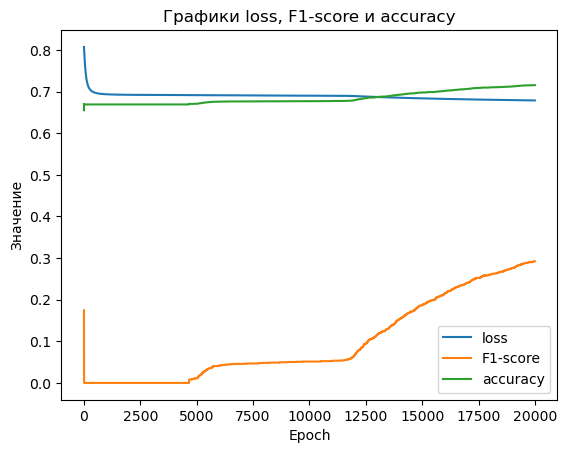

In [118]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf8['Epoch'], diagdf8['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf8['Epoch'], diagdf8['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf8['Epoch'], diagdf8['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [119]:
pred_test9=Mk9.forward(x_test.float())
pred_test_binarized9 = (pred_test9 > 0.5).float()

In [120]:
print(classification_report(y_test.to('cpu'), pred_test_binarized9.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.71      0.98      0.83      3226
         1.0       0.81      0.18      0.29      1537

    accuracy                           0.72      4763
   macro avg       0.76      0.58      0.56      4763
weighted avg       0.75      0.72      0.66      4763



In [121]:
#----------------------------------------------

<font color='red'>Word2Vec_MLP_Experiment_#10</font>

<font color='red'>layers: 1+3, epochs: 10000, lr: 0.0001</font>

In [122]:
#----------------------------------------------

In [123]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK10(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK10, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, 200)
        self.sigmoid = nn.Sigmoid()
        self.fc3 = nn.Linear(200, 100) #если добавлять или изменять, то не забыть поменять название
        self.tanh = nn.Tanh()
        self.fc4 = nn.Linear(100, output_size) #если добавлять или изменять, то не забыть поменять название
        self.sigmoid1 = nn.Sigmoid()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
        out = self.fc3(out)
        out = self.tanh(out)
        out = self.fc4(out)
        out = self.sigmoid1(out)
        return out

In [124]:
Mk10=MLP_MK10(100,300,1) #изменить название переменной

In [125]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [126]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [127]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [128]:
Mk10=Mk10.to(dev)

In [129]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk10.parameters(), lr=0.0001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf9=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(10000):
    optimizer.zero_grad()
    pred = Mk10.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf9 = pd.concat([diagdf9, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.8024113774299622   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  2 , Loss:  0.7987472414970398   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  3 , Loss:  0.7951372861862183   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  4 , Loss:  0.7915869951248169   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  5 , Loss:  0.7881019115447998   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  6 , Loss:  0.7846867442131042   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  7 , Loss:  0.781346321105957   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  8 , Loss:  0.7780845761299133   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  9 , Loss:  0.7749051451683044   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  10 , Loss:  0.7718111872673035   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  11 , Loss:  0.768805205821991   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  12 , Loss:  0.7658895254135132   f1-score: 0.0   accuracy

Epoch:  106 , Loss:  0.6990816593170166   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  107 , Loss:  0.6989916563034058   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  108 , Loss:  0.6989036798477173   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  109 , Loss:  0.6988176107406616   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  110 , Loss:  0.6987334489822388   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  111 , Loss:  0.6986510753631592   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  112 , Loss:  0.6985706090927124   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  113 , Loss:  0.6984917521476746   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  114 , Loss:  0.69841468334198   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  115 , Loss:  0.6983391642570496   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  116 , Loss:  0.6982652544975281   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  117 , Loss:  0.6981929540634155   f1-

Epoch:  212 , Loss:  0.6949961185455322   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  213 , Loss:  0.6949817538261414   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  214 , Loss:  0.6949676275253296   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  215 , Loss:  0.6949536800384521   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  216 , Loss:  0.6949398517608643   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  217 , Loss:  0.6949262619018555   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  218 , Loss:  0.6949127912521362   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  219 , Loss:  0.6948994994163513   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  220 , Loss:  0.6948863863945007   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  221 , Loss:  0.6948733925819397   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  222 , Loss:  0.694860577583313   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  223 , Loss:  0.6948479413986206   f1

Epoch:  319 , Loss:  0.6941081285476685   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  320 , Loss:  0.6941035389900208   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  321 , Loss:  0.6940990090370178   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  322 , Loss:  0.6940944790840149   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  323 , Loss:  0.6940900683403015   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  324 , Loss:  0.6940855979919434   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  325 , Loss:  0.6940812468528748   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  326 , Loss:  0.6940768957138062   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  327 , Loss:  0.6940726041793823   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  328 , Loss:  0.6940682530403137   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  329 , Loss:  0.6940640211105347   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  330 , Loss:  0.6940597891807556   f

Epoch:  426 , Loss:  0.6937699317932129   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  427 , Loss:  0.693767786026001   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  428 , Loss:  0.6937656402587891   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  429 , Loss:  0.6937634944915771   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  430 , Loss:  0.69376140832901   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  431 , Loss:  0.6937592625617981   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  432 , Loss:  0.693757176399231   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  433 , Loss:  0.6937550902366638   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  434 , Loss:  0.6937530636787415   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  435 , Loss:  0.6937510371208191   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  436 , Loss:  0.693748950958252   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  437 , Loss:  0.6937469244003296   f1-sco

Epoch:  529 , Loss:  0.6936051845550537   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  530 , Loss:  0.6936039924621582   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  531 , Loss:  0.6936028599739075   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  532 , Loss:  0.693601667881012   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  533 , Loss:  0.6936005353927612   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  534 , Loss:  0.6935993432998657   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  535 , Loss:  0.693598210811615   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  536 , Loss:  0.693597137928009   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  537 , Loss:  0.6935960054397583   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  538 , Loss:  0.6935948133468628   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  539 , Loss:  0.6935937404632568   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  540 , Loss:  0.6935926675796509   f1-s

Epoch:  630 , Loss:  0.6935112476348877   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  631 , Loss:  0.6935104727745056   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  632 , Loss:  0.6935097575187683   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  633 , Loss:  0.693509042263031   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  634 , Loss:  0.6935083270072937   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  635 , Loss:  0.6935075521469116   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  636 , Loss:  0.6935068964958191   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  637 , Loss:  0.693506121635437   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  638 , Loss:  0.6935054063796997   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  639 , Loss:  0.6935046911239624   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  640 , Loss:  0.6935039758682251   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  641 , Loss:  0.6935032606124878   f1-

Epoch:  730 , Loss:  0.6934492588043213   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  731 , Loss:  0.6934487819671631   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  732 , Loss:  0.6934482455253601   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  733 , Loss:  0.6934477090835571   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  734 , Loss:  0.6934472322463989   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  735 , Loss:  0.693446695804596   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  736 , Loss:  0.693446159362793   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  737 , Loss:  0.6934456825256348   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  738 , Loss:  0.6934451460838318   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  739 , Loss:  0.6934446692466736   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  740 , Loss:  0.6934441328048706   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  741 , Loss:  0.6934436559677124   f1-

Epoch:  833 , Loss:  0.6934030055999756   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  834 , Loss:  0.6934027075767517   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  835 , Loss:  0.6934022307395935   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  836 , Loss:  0.6934018731117249   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  837 , Loss:  0.6934014558792114   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  838 , Loss:  0.6934010982513428   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  839 , Loss:  0.6934007406234741   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  840 , Loss:  0.6934003233909607   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  841 , Loss:  0.693399965763092   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  842 , Loss:  0.6933996081352234   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  843 , Loss:  0.69339919090271   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  844 , Loss:  0.6933988332748413   f1-s

Epoch:  932 , Loss:  0.6933688521385193   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  933 , Loss:  0.6933685541152954   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  934 , Loss:  0.6933682560920715   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  935 , Loss:  0.6933678984642029   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  936 , Loss:  0.693367600440979   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  937 , Loss:  0.6933673024177551   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  938 , Loss:  0.6933670043945312   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  939 , Loss:  0.6933667063713074   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  940 , Loss:  0.6933664083480835   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  941 , Loss:  0.6933660507202148   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  942 , Loss:  0.6933658123016357   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  943 , Loss:  0.6933654546737671   f1

Epoch:  1033 , Loss:  0.6933408379554749   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1034 , Loss:  0.693340539932251   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1035 , Loss:  0.6933403015136719   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1036 , Loss:  0.6933400630950928   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1037 , Loss:  0.6933398246765137   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1038 , Loss:  0.6933395266532898   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1039 , Loss:  0.6933392882347107   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1040 , Loss:  0.6933390498161316   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1041 , Loss:  0.6933388113975525   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1042 , Loss:  0.6933385133743286   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1043 , Loss:  0.6933383345603943   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1044 , Loss:  0.693338036

Epoch:  1133 , Loss:  0.693317711353302   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1134 , Loss:  0.6933174133300781   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1135 , Loss:  0.6933172345161438   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1136 , Loss:  0.6933170557022095   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1137 , Loss:  0.6933168172836304   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1138 , Loss:  0.693316638469696   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1139 , Loss:  0.6933164000511169   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1140 , Loss:  0.6933162212371826   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1141 , Loss:  0.6933159828186035   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1142 , Loss:  0.6933157444000244   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1143 , Loss:  0.6933155655860901   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1144 , Loss:  0.6933153867

Epoch:  1230 , Loss:  0.6932984590530396   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1231 , Loss:  0.6932982802391052   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1232 , Loss:  0.6932981014251709   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1233 , Loss:  0.6932978630065918   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1234 , Loss:  0.6932976841926575   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1235 , Loss:  0.6932975053787231   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1236 , Loss:  0.6932973265647888   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1237 , Loss:  0.6932971477508545   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1238 , Loss:  0.6932969689369202   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1239 , Loss:  0.6932967901229858   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1240 , Loss:  0.6932966113090515   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1241 , Loss:  0.69329643

Epoch:  1332 , Loss:  0.6932802200317383   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1333 , Loss:  0.693280041217804   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1334 , Loss:  0.6932798027992249   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1335 , Loss:  0.6932797431945801   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1336 , Loss:  0.6932795643806458   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1337 , Loss:  0.6932793855667114   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1338 , Loss:  0.6932792067527771   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1339 , Loss:  0.6932790279388428   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1340 , Loss:  0.6932788491249084   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1341 , Loss:  0.6932786703109741   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1342 , Loss:  0.6932784914970398   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1343 , Loss:  0.693278312

Epoch:  1437 , Loss:  0.6932620406150818   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1438 , Loss:  0.6932619214057922   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1439 , Loss:  0.6932617425918579   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1440 , Loss:  0.6932615041732788   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1441 , Loss:  0.6932613253593445   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1442 , Loss:  0.6932611465454102   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1443 , Loss:  0.6932609677314758   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1444 , Loss:  0.6932607889175415   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1445 , Loss:  0.6932606101036072   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1446 , Loss:  0.6932604312896729   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1447 , Loss:  0.6932602524757385   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1448 , Loss:  0.69326007

Epoch:  1541 , Loss:  0.6932402849197388   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1542 , Loss:  0.6932399868965149   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1543 , Loss:  0.6932397484779358   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1544 , Loss:  0.6932395100593567   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1545 , Loss:  0.6932392120361328   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1546 , Loss:  0.6932389736175537   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1547 , Loss:  0.6932386755943298   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1548 , Loss:  0.6932384371757507   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1549 , Loss:  0.6932381391525269   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1550 , Loss:  0.693237841129303   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1551 , Loss:  0.6932375431060791   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1552 , Loss:  0.693237304

Epoch:  1646 , Loss:  0.693192183971405   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1647 , Loss:  0.6931913495063782   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1648 , Loss:  0.6931905746459961   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1649 , Loss:  0.693189799785614   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1650 , Loss:  0.6931889653205872   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1651 , Loss:  0.6931881308555603   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1652 , Loss:  0.6931872963905334   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1653 , Loss:  0.6931864619255066   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1654 , Loss:  0.6931856274604797   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1655 , Loss:  0.6931847333908081   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1656 , Loss:  0.6931838393211365   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1657 , Loss:  0.6931830048

Epoch:  1748 , Loss:  0.6930665373802185   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1749 , Loss:  0.6930647492408752   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1750 , Loss:  0.693062961101532   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1751 , Loss:  0.6930611729621887   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1752 , Loss:  0.6930593848228455   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1753 , Loss:  0.6930575370788574   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1754 , Loss:  0.6930556893348694   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1755 , Loss:  0.6930539011955261   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1756 , Loss:  0.6930519342422485   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1757 , Loss:  0.6930500864982605   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1758 , Loss:  0.6930481791496277   f1-score: 0.0   accuracy: 0.6692764759063721
Epoch:  1759 , Loss:  0.693046271

Epoch:  1844 , Loss:  0.6927970051765442   f1-score: 0.000544069625902921   accuracy: 0.6693664789199829
Epoch:  1845 , Loss:  0.6927921772003174   f1-score: 0.000544069625902921   accuracy: 0.6693664789199829
Epoch:  1846 , Loss:  0.6927873492240906   f1-score: 0.000544069625902921   accuracy: 0.6693664789199829
Epoch:  1847 , Loss:  0.6927824020385742   f1-score: 0.000544069625902921   accuracy: 0.6693664789199829
Epoch:  1848 , Loss:  0.6927773356437683   f1-score: 0.000544069625902921   accuracy: 0.6693664789199829
Epoch:  1849 , Loss:  0.6927722096443176   f1-score: 0.000544069625902921   accuracy: 0.6693664789199829
Epoch:  1850 , Loss:  0.6927669048309326   f1-score: 0.000544069625902921   accuracy: 0.6693664789199829
Epoch:  1851 , Loss:  0.6927616000175476   f1-score: 0.000544069625902921   accuracy: 0.6693664789199829
Epoch:  1852 , Loss:  0.6927560567855835   f1-score: 0.000544069625902921   accuracy: 0.6693664789199829
Epoch:  1853 , Loss:  0.6927504539489746   f1-score: 0.

Epoch:  1948 , Loss:  0.6918030381202698   f1-score: 0.012408955954015255   accuracy: 0.6705363392829895
Epoch:  1949 , Loss:  0.6917890310287476   f1-score: 0.012408955954015255   accuracy: 0.6705363392829895
Epoch:  1950 , Loss:  0.6917749643325806   f1-score: 0.012941493652760983   accuracy: 0.6705363392829895
Epoch:  1951 , Loss:  0.691760778427124   f1-score: 0.012941493652760983   accuracy: 0.6705363392829895
Epoch:  1952 , Loss:  0.6917465329170227   f1-score: 0.012941493652760983   accuracy: 0.6705363392829895
Epoch:  1953 , Loss:  0.6917321085929871   f1-score: 0.012941493652760983   accuracy: 0.6705363392829895
Epoch:  1954 , Loss:  0.6917176246643066   f1-score: 0.012941493652760983   accuracy: 0.6705363392829895
Epoch:  1955 , Loss:  0.6917029023170471   f1-score: 0.012941493652760983   accuracy: 0.6705363392829895
Epoch:  1956 , Loss:  0.6916881799697876   f1-score: 0.013477088883519173   accuracy: 0.6706263422966003
Epoch:  1957 , Loss:  0.6916733384132385   f1-score: 0.0

Epoch:  2048 , Loss:  0.6895889043807983   f1-score: 0.08722580969333649   accuracy: 0.6816954612731934
Epoch:  2049 , Loss:  0.6895573139190674   f1-score: 0.08722580969333649   accuracy: 0.6816954612731934
Epoch:  2050 , Loss:  0.6895257234573364   f1-score: 0.08771929889917374   accuracy: 0.6817854642868042
Epoch:  2051 , Loss:  0.6894940137863159   f1-score: 0.08821253478527069   accuracy: 0.681875467300415
Epoch:  2052 , Loss:  0.6894620656967163   f1-score: 0.08818978816270828   accuracy: 0.6817854642868042
Epoch:  2053 , Loss:  0.6894299983978271   f1-score: 0.08865979313850403   accuracy: 0.6817854642868042
Epoch:  2054 , Loss:  0.6893978118896484   f1-score: 0.08861411362886429   accuracy: 0.6816054582595825
Epoch:  2055 , Loss:  0.6893655061721802   f1-score: 0.08908341825008392   accuracy: 0.6816054582595825
Epoch:  2056 , Loss:  0.6893330812454224   f1-score: 0.08957529067993164   accuracy: 0.6816954612731934
Epoch:  2057 , Loss:  0.6893004775047302   f1-score: 0.0915167108

Epoch:  2150 , Loss:  0.6862372756004333   f1-score: 0.17051251232624054   accuracy: 0.6926745772361755
Epoch:  2151 , Loss:  0.6862070560455322   f1-score: 0.17184466123580933   accuracy: 0.6929445862770081
Epoch:  2152 , Loss:  0.6861767768859863   f1-score: 0.17220470309257507   accuracy: 0.6928545832633972
Epoch:  2153 , Loss:  0.6861466765403748   f1-score: 0.17349164187908173   accuracy: 0.6930345296859741
Epoch:  2154 , Loss:  0.6861165165901184   f1-score: 0.17393410205841064   accuracy: 0.693124532699585
Epoch:  2155 , Loss:  0.6860864162445068   f1-score: 0.17481839656829834   accuracy: 0.6933045387268066
Epoch:  2156 , Loss:  0.6860562562942505   f1-score: 0.17517541348934174   accuracy: 0.6932145357131958
Epoch:  2157 , Loss:  0.6860261559486389   f1-score: 0.17517541348934174   accuracy: 0.6932145357131958
Epoch:  2158 , Loss:  0.6859961748123169   f1-score: 0.17557436227798462   accuracy: 0.6932145357131958
Epoch:  2159 , Loss:  0.6859660744667053   f1-score: 0.1759729236

Epoch:  2252 , Loss:  0.6832042932510376   f1-score: 0.2405150681734085   accuracy: 0.7027537822723389
Epoch:  2253 , Loss:  0.6831731796264648   f1-score: 0.24167241156101227   accuracy: 0.7029337882995605
Epoch:  2254 , Loss:  0.6831420063972473   f1-score: 0.24288338422775269   accuracy: 0.7032037377357483
Epoch:  2255 , Loss:  0.6831107139587402   f1-score: 0.24288338422775269   accuracy: 0.7032037377357483
Epoch:  2256 , Loss:  0.6830794215202332   f1-score: 0.24328666925430298   accuracy: 0.7032937407493591
Epoch:  2257 , Loss:  0.6830480098724365   f1-score: 0.24368976056575775   accuracy: 0.70338374376297
Epoch:  2258 , Loss:  0.6830165386199951   f1-score: 0.2439248114824295   accuracy: 0.7032037377357483
Epoch:  2259 , Loss:  0.6829848885536194   f1-score: 0.24472960829734802   accuracy: 0.70338374376297
Epoch:  2260 , Loss:  0.6829532384872437   f1-score: 0.24472960829734802   accuracy: 0.70338374376297
Epoch:  2261 , Loss:  0.6829215288162231   f1-score: 0.2451317310333252 

Epoch:  2333 , Loss:  0.6805965304374695   f1-score: 0.28704941272735596   accuracy: 0.7116630673408508
Epoch:  2334 , Loss:  0.6805664896965027   f1-score: 0.2871132791042328   accuracy: 0.7117530703544617
Epoch:  2335 , Loss:  0.6805365085601807   f1-score: 0.2878754138946533   accuracy: 0.7119330167770386
Epoch:  2336 , Loss:  0.6805066466331482   f1-score: 0.2877473831176758   accuracy: 0.7117530703544617
Epoch:  2337 , Loss:  0.68047696352005   f1-score: 0.2877473831176758   accuracy: 0.7117530703544617
Epoch:  2338 , Loss:  0.6804472804069519   f1-score: 0.28806400299072266   accuracy: 0.7117530703544617
Epoch:  2339 , Loss:  0.6804177761077881   f1-score: 0.28806400299072266   accuracy: 0.7117530703544617
Epoch:  2340 , Loss:  0.680388331413269   f1-score: 0.2884444296360016   accuracy: 0.7118430733680725
Epoch:  2341 , Loss:  0.6803590059280396   f1-score: 0.2888889014720917   accuracy: 0.7120230197906494
Epoch:  2342 , Loss:  0.6803297996520996   f1-score: 0.2893333435058594  

Epoch:  2436 , Loss:  0.6779852509498596   f1-score: 0.3316151201725006   accuracy: 0.7199423909187317
Epoch:  2437 , Loss:  0.6779629588127136   f1-score: 0.3322601318359375   accuracy: 0.7200323939323425
Epoch:  2438 , Loss:  0.6779406666755676   f1-score: 0.33261802792549133   accuracy: 0.7201223969459534
Epoch:  2439 , Loss:  0.6779183745384216   f1-score: 0.33297574520111084   accuracy: 0.7202123999595642
Epoch:  2440 , Loss:  0.6778961420059204   f1-score: 0.3332618474960327   accuracy: 0.7202123999595642
Epoch:  2441 , Loss:  0.677873969078064   f1-score: 0.3336907625198364   accuracy: 0.7203923463821411
Epoch:  2442 , Loss:  0.6778517961502075   f1-score: 0.3336907625198364   accuracy: 0.7203923463821411
Epoch:  2443 , Loss:  0.6778295636177063   f1-score: 0.3336907625198364   accuracy: 0.7203923463821411
Epoch:  2444 , Loss:  0.6778073906898499   f1-score: 0.3339764177799225   accuracy: 0.7203923463821411
Epoch:  2445 , Loss:  0.6777852177619934   f1-score: 0.3339764177799225 

Epoch:  2541 , Loss:  0.6758089661598206   f1-score: 0.3663802146911621   accuracy: 0.7279517650604248
Epoch:  2542 , Loss:  0.6757903695106506   f1-score: 0.3678257167339325   accuracy: 0.7284017205238342
Epoch:  2543 , Loss:  0.6757717132568359   f1-score: 0.3679027855396271   accuracy: 0.7284917235374451
Epoch:  2544 , Loss:  0.6757532954216003   f1-score: 0.36816754937171936   accuracy: 0.7284917235374451
Epoch:  2545 , Loss:  0.6757347583770752   f1-score: 0.3688507378101349   accuracy: 0.7286717295646667
Epoch:  2546 , Loss:  0.6757162809371948   f1-score: 0.36953338980674744   accuracy: 0.7288516759872437
Epoch:  2547 , Loss:  0.675697922706604   f1-score: 0.36953338980674744   accuracy: 0.7288516759872437
Epoch:  2548 , Loss:  0.6756795644760132   f1-score: 0.36995187401771545   accuracy: 0.7290316820144653
Epoch:  2549 , Loss:  0.6756612062454224   f1-score: 0.37021544575691223   accuracy: 0.7290316820144653
Epoch:  2550 , Loss:  0.6756429076194763   f1-score: 0.37063375115394

Epoch:  2647 , Loss:  0.6740977168083191   f1-score: 0.390525221824646   accuracy: 0.733711302280426
Epoch:  2648 , Loss:  0.6740840077400208   f1-score: 0.3909371793270111   accuracy: 0.7338913083076477
Epoch:  2649 , Loss:  0.6740702390670776   f1-score: 0.3906056880950928   accuracy: 0.7338013052940369
Epoch:  2650 , Loss:  0.6740564107894897   f1-score: 0.3906056880950928   accuracy: 0.7338013052940369
Epoch:  2651 , Loss:  0.6740427017211914   f1-score: 0.39085668325424194   accuracy: 0.7338013052940369
Epoch:  2652 , Loss:  0.6740289330482483   f1-score: 0.39118796586990356   accuracy: 0.7338913083076477
Epoch:  2653 , Loss:  0.6740151047706604   f1-score: 0.39118796586990356   accuracy: 0.7338913083076477
Epoch:  2654 , Loss:  0.6740012764930725   f1-score: 0.39218106865882874   accuracy: 0.7341612577438354
Epoch:  2655 , Loss:  0.6739874482154846   f1-score: 0.39218106865882874   accuracy: 0.7341612577438354
Epoch:  2656 , Loss:  0.6739736199378967   f1-score: 0.392261773347854

Epoch:  2727 , Loss:  0.6731505990028381   f1-score: 0.40716612339019775   accuracy: 0.7379409670829773
Epoch:  2728 , Loss:  0.6731411218643188   f1-score: 0.40522342920303345   accuracy: 0.7376709580421448
Epoch:  2729 , Loss:  0.6731315851211548   f1-score: 0.40692463517189026   accuracy: 0.7379409670829773
Epoch:  2730 , Loss:  0.6731220483779907   f1-score: 0.4054660499095917   accuracy: 0.7376709580421448
Epoch:  2731 , Loss:  0.6731125712394714   f1-score: 0.4059506952762604   accuracy: 0.7376709580421448
Epoch:  2732 , Loss:  0.6731032133102417   f1-score: 0.40562576055526733   accuracy: 0.7375810146331787
Epoch:  2733 , Loss:  0.6730939149856567   f1-score: 0.4053833484649658   accuracy: 0.7375810146331787
Epoch:  2734 , Loss:  0.6730846762657166   f1-score: 0.40660011768341064   accuracy: 0.7378509640693665
Epoch:  2735 , Loss:  0.6730755567550659   f1-score: 0.4054660499095917   accuracy: 0.7376709580421448
Epoch:  2736 , Loss:  0.6730663180351257   f1-score: 0.4068417847156

Epoch:  2807 , Loss:  0.672500729560852   f1-score: 0.4119076430797577   accuracy: 0.7386609315872192
Epoch:  2808 , Loss:  0.6724937558174133   f1-score: 0.4118242561817169   accuracy: 0.7385709285736084
Epoch:  2809 , Loss:  0.6724868416786194   f1-score: 0.4118242561817169   accuracy: 0.7385709285736084
Epoch:  2810 , Loss:  0.6724799871444702   f1-score: 0.4118242561817169   accuracy: 0.7385709285736084
Epoch:  2811 , Loss:  0.6724731922149658   f1-score: 0.4121457636356354   accuracy: 0.7386609315872192
Epoch:  2812 , Loss:  0.6724664568901062   f1-score: 0.4115026295185089   accuracy: 0.7384809255599976
Epoch:  2813 , Loss:  0.672459602355957   f1-score: 0.4124671220779419   accuracy: 0.7387508749961853
Epoch:  2814 , Loss:  0.6724527478218079   f1-score: 0.4118242561817169   accuracy: 0.7385709285736084
Epoch:  2815 , Loss:  0.6724458932876587   f1-score: 0.4121457636356354   accuracy: 0.7386609315872192
Epoch:  2816 , Loss:  0.6724391579627991   f1-score: 0.4118242561817169   a

Epoch:  2906 , Loss:  0.6719061136245728   f1-score: 0.42048192024230957   accuracy: 0.74028080701828
Epoch:  2907 , Loss:  0.6719009280204773   f1-score: 0.4207145869731903   accuracy: 0.74028080701828
Epoch:  2908 , Loss:  0.6718957424163818   f1-score: 0.42048192024230957   accuracy: 0.74028080701828
Epoch:  2909 , Loss:  0.6718905568122864   f1-score: 0.42134830355644226   accuracy: 0.7404607534408569
Epoch:  2910 , Loss:  0.6718854308128357   f1-score: 0.42103150486946106   accuracy: 0.7403707504272461
Epoch:  2911 , Loss:  0.6718802452087402   f1-score: 0.42143288254737854   accuracy: 0.7405507564544678
Epoch:  2912 , Loss:  0.6718751788139343   f1-score: 0.42143288254737854   accuracy: 0.7405507564544678
Epoch:  2913 , Loss:  0.6718700528144836   f1-score: 0.42143288254737854   accuracy: 0.7405507564544678
Epoch:  2914 , Loss:  0.6718649864196777   f1-score: 0.4217495918273926   accuracy: 0.7406407594680786
Epoch:  2915 , Loss:  0.671859860420227   f1-score: 0.42143288254737854 

Epoch:  3002 , Loss:  0.6714494824409485   f1-score: 0.4279441237449646   accuracy: 0.7420806288719177
Epoch:  3003 , Loss:  0.6714451313018799   f1-score: 0.4284859299659729   accuracy: 0.7421706318855286
Epoch:  3004 , Loss:  0.6714407205581665   f1-score: 0.4279441237449646   accuracy: 0.7420806288719177
Epoch:  3005 , Loss:  0.6714363694190979   f1-score: 0.42817237973213196   accuracy: 0.7420806288719177
Epoch:  3006 , Loss:  0.6714320778846741   f1-score: 0.4279441237449646   accuracy: 0.7420806288719177
Epoch:  3007 , Loss:  0.6714277267456055   f1-score: 0.4284859299659729   accuracy: 0.7421706318855286
Epoch:  3008 , Loss:  0.6714234352111816   f1-score: 0.4276302754878998   accuracy: 0.7419906258583069
Epoch:  3009 , Loss:  0.6714191436767578   f1-score: 0.4284859299659729   accuracy: 0.7421706318855286
Epoch:  3010 , Loss:  0.6714149117469788   f1-score: 0.4273163080215454   accuracy: 0.741900622844696
Epoch:  3011 , Loss:  0.6714106202125549   f1-score: 0.4287993609905243  

Epoch:  3098 , Loss:  0.6710675358772278   f1-score: 0.4346100389957428   accuracy: 0.7436105012893677
Epoch:  3099 , Loss:  0.6710639595985413   f1-score: 0.4346100389957428   accuracy: 0.7436105012893677
Epoch:  3100 , Loss:  0.67106032371521   f1-score: 0.4346100389957428   accuracy: 0.7436105012893677
Epoch:  3101 , Loss:  0.6710568070411682   f1-score: 0.4346100389957428   accuracy: 0.7436105012893677
Epoch:  3102 , Loss:  0.6710532307624817   f1-score: 0.43447181582450867   accuracy: 0.7437005043029785
Epoch:  3103 , Loss:  0.6710496544837952   f1-score: 0.434834361076355   accuracy: 0.7436105012893677
Epoch:  3104 , Loss:  0.6710461974143982   f1-score: 0.43447181582450867   accuracy: 0.7437005043029785
Epoch:  3105 , Loss:  0.6710427403450012   f1-score: 0.4351447820663452   accuracy: 0.7437005043029785
Epoch:  3106 , Loss:  0.671039342880249   f1-score: 0.4346444308757782   accuracy: 0.7438805103302002
Epoch:  3107 , Loss:  0.6710359454154968   f1-score: 0.43528246879577637   

Epoch:  3194 , Loss:  0.6707547307014465   f1-score: 0.43815556168556213   accuracy: 0.7445104122161865
Epoch:  3195 , Loss:  0.6707516312599182   f1-score: 0.4387734830379486   accuracy: 0.7446904182434082
Epoch:  3196 , Loss:  0.6707497835159302   f1-score: 0.440805047750473   accuracy: 0.7449604272842407
Epoch:  3197 , Loss:  0.6707479953765869   f1-score: 0.43686819076538086   accuracy: 0.7443304657936096
Epoch:  3198 , Loss:  0.6707448959350586   f1-score: 0.44164037704467773   accuracy: 0.7451403737068176
Epoch:  3199 , Loss:  0.6707409024238586   f1-score: 0.4377971589565277   accuracy: 0.7446004152297974
Epoch:  3200 , Loss:  0.6707369685173035   f1-score: 0.44005531072616577   accuracy: 0.7448704242706299
Epoch:  3201 , Loss:  0.6707340478897095   f1-score: 0.44005531072616577   accuracy: 0.7448704242706299
Epoch:  3202 , Loss:  0.6707319021224976   f1-score: 0.43810656666755676   accuracy: 0.7446904182434082
Epoch:  3203 , Loss:  0.670729398727417   f1-score: 0.44133308529853

Epoch:  3293 , Loss:  0.6704838871955872   f1-score: 0.44168147444725037   accuracy: 0.7454103827476501
Epoch:  3294 , Loss:  0.6704804301261902   f1-score: 0.4447503089904785   accuracy: 0.7458603382110596
Epoch:  3295 , Loss:  0.6704772710800171   f1-score: 0.4422546327114105   accuracy: 0.7453203797340393
Epoch:  3296 , Loss:  0.6704745888710022   f1-score: 0.4434816837310791   accuracy: 0.7456803321838379
Epoch:  3297 , Loss:  0.670472264289856   f1-score: 0.4444444477558136   accuracy: 0.7457703351974487
Epoch:  3298 , Loss:  0.6704701781272888   f1-score: 0.44203469157218933   accuracy: 0.7453203797340393
Epoch:  3299 , Loss:  0.6704679727554321   f1-score: 0.44527411460876465   accuracy: 0.7459503412246704
Epoch:  3300 , Loss:  0.6704655885696411   f1-score: 0.4415071904659271   accuracy: 0.7452303767204285
Epoch:  3301 , Loss:  0.6704628467559814   f1-score: 0.44557955861091614   accuracy: 0.7460403442382812
Epoch:  3302 , Loss:  0.6704599857330322   f1-score: 0.441727459430694

Epoch:  3394 , Loss:  0.6702387928962708   f1-score: 0.4457547068595886   accuracy: 0.7462202906608582
Epoch:  3395 , Loss:  0.6702364087104797   f1-score: 0.4474097192287445   accuracy: 0.7465803027153015
Epoch:  3396 , Loss:  0.6702340841293335   f1-score: 0.4471927881240845   accuracy: 0.7465803027153015
Epoch:  3397 , Loss:  0.6702318787574768   f1-score: 0.4471049904823303   accuracy: 0.7464902997016907
Epoch:  3398 , Loss:  0.6702295541763306   f1-score: 0.4474097192287445   accuracy: 0.7465803027153015
Epoch:  3399 , Loss:  0.6702274084091187   f1-score: 0.4471927881240845   accuracy: 0.7465803027153015
Epoch:  3400 , Loss:  0.6702251434326172   f1-score: 0.44771432876586914   accuracy: 0.7466702461242676
Epoch:  3401 , Loss:  0.6702229380607605   f1-score: 0.4465828835964203   accuracy: 0.7464002966880798
Epoch:  3402 , Loss:  0.6702206134796143   f1-score: 0.44771432876586914   accuracy: 0.7466702461242676
Epoch:  3403 , Loss:  0.6702183485031128   f1-score: 0.4471927881240845

Epoch:  3491 , Loss:  0.6700292229652405   f1-score: 0.4487154483795166   accuracy: 0.7470302581787109
Epoch:  3492 , Loss:  0.6700272560119629   f1-score: 0.4487154483795166   accuracy: 0.7470302581787109
Epoch:  3493 , Loss:  0.6700252294540405   f1-score: 0.44893157482147217   accuracy: 0.7470302581787109
Epoch:  3494 , Loss:  0.6700231432914734   f1-score: 0.44841113686561584   accuracy: 0.7469402551651001
Epoch:  3495 , Loss:  0.6700210571289062   f1-score: 0.4490196108818054   accuracy: 0.747120201587677
Epoch:  3496 , Loss:  0.6700190305709839   f1-score: 0.44841113686561584   accuracy: 0.7469402551651001
Epoch:  3497 , Loss:  0.6700169444084167   f1-score: 0.4490196108818054   accuracy: 0.747120201587677
Epoch:  3498 , Loss:  0.6700149178504944   f1-score: 0.44841113686561584   accuracy: 0.7469402551651001
Epoch:  3499 , Loss:  0.670012891292572   f1-score: 0.44893157482147217   accuracy: 0.7470302581787109
Epoch:  3500 , Loss:  0.6700108647346497   f1-score: 0.4478021860122680

Epoch:  3587 , Loss:  0.6698415875434875   f1-score: 0.4486751854419708   accuracy: 0.7472102046012878
Epoch:  3588 , Loss:  0.6698396801948547   f1-score: 0.45045045018196106   accuracy: 0.7474802136421204
Epoch:  3589 , Loss:  0.6698378324508667   f1-score: 0.44876325130462646   accuracy: 0.7473002076148987
Epoch:  3590 , Loss:  0.6698359847068787   f1-score: 0.45045045018196106   accuracy: 0.7474802136421204
Epoch:  3591 , Loss:  0.6698341965675354   f1-score: 0.44876325130462646   accuracy: 0.7473002076148987
Epoch:  3592 , Loss:  0.6698324084281921   f1-score: 0.4507538676261902   accuracy: 0.7475702166557312
Epoch:  3593 , Loss:  0.6698306202888489   f1-score: 0.4484586715698242   accuracy: 0.7472102046012878
Epoch:  3594 , Loss:  0.6698288321495056   f1-score: 0.45105716586112976   accuracy: 0.7476601600646973
Epoch:  3595 , Loss:  0.6698271036148071   f1-score: 0.4484586715698242   accuracy: 0.7472102046012878
Epoch:  3596 , Loss:  0.6698253750801086   f1-score: 0.4510571658611

Epoch:  3679 , Loss:  0.6696711778640747   f1-score: 0.4501960873603821   accuracy: 0.7476601600646973
Epoch:  3680 , Loss:  0.669669508934021   f1-score: 0.4510188102722168   accuracy: 0.747840166091919
Epoch:  3681 , Loss:  0.6696677207946777   f1-score: 0.4501960873603821   accuracy: 0.7476601600646973
Epoch:  3682 , Loss:  0.6696657538414001   f1-score: 0.4510188102722168   accuracy: 0.747840166091919
Epoch:  3683 , Loss:  0.6696639060974121   f1-score: 0.4501960873603821   accuracy: 0.7476601600646973
Epoch:  3684 , Loss:  0.6696620583534241   f1-score: 0.4504116177558899   accuracy: 0.7476601600646973
Epoch:  3685 , Loss:  0.6696601510047913   f1-score: 0.4501078128814697   accuracy: 0.7475702166557312
Epoch:  3686 , Loss:  0.669658362865448   f1-score: 0.4501078128814697   accuracy: 0.7475702166557312
Epoch:  3687 , Loss:  0.66965651512146   f1-score: 0.4504116177558899   accuracy: 0.7476601600646973
Epoch:  3688 , Loss:  0.6696547269821167   f1-score: 0.4501078128814697   accur

Epoch:  3777 , Loss:  0.669488787651062   f1-score: 0.45137256383895874   accuracy: 0.7482001185417175
Epoch:  3778 , Loss:  0.6694868206977844   f1-score: 0.45137256383895874   accuracy: 0.7482001185417175
Epoch:  3779 , Loss:  0.6694849729537964   f1-score: 0.45137256383895874   accuracy: 0.7482001185417175
Epoch:  3780 , Loss:  0.6694830656051636   f1-score: 0.45137256383895874   accuracy: 0.7482001185417175
Epoch:  3781 , Loss:  0.669481098651886   f1-score: 0.4512840509414673   accuracy: 0.7481101751327515
Epoch:  3782 , Loss:  0.669479250907898   f1-score: 0.45137256383895874   accuracy: 0.7482001185417175
Epoch:  3783 , Loss:  0.6694773435592651   f1-score: 0.4511955976486206   accuracy: 0.7480201721191406
Epoch:  3784 , Loss:  0.6694754362106323   f1-score: 0.45137256383895874   accuracy: 0.7482001185417175
Epoch:  3785 , Loss:  0.6694735884666443   f1-score: 0.4511955976486206   accuracy: 0.7480201721191406
Epoch:  3786 , Loss:  0.6694716215133667   f1-score: 0.451068848371505

Epoch:  3870 , Loss:  0.669301450252533   f1-score: 0.4511691927909851   accuracy: 0.7486501336097717
Epoch:  3871 , Loss:  0.6692985892295837   f1-score: 0.45552298426628113   accuracy: 0.7493700385093689
Epoch:  3872 , Loss:  0.6692958474159241   f1-score: 0.45181551575660706   accuracy: 0.7486501336097717
Epoch:  3873 , Loss:  0.6692933440208435   f1-score: 0.4537617564201355   accuracy: 0.7491000890731812
Epoch:  3874 , Loss:  0.6692909598350525   f1-score: 0.4532444477081299   accuracy: 0.7490100860595703
Epoch:  3875 , Loss:  0.6692887544631958   f1-score: 0.4529411792755127   accuracy: 0.7489200830459595
Epoch:  3876 , Loss:  0.6692866683006287   f1-score: 0.45458105206489563   accuracy: 0.7492800354957581
Epoch:  3877 , Loss:  0.6692845225334167   f1-score: 0.45190420746803284   accuracy: 0.7487400770187378
Epoch:  3878 , Loss:  0.6692824959754944   f1-score: 0.45530998706817627   accuracy: 0.7493700385093689
Epoch:  3879 , Loss:  0.6692804098129272   f1-score: 0.45199292898178

Epoch:  3966 , Loss:  0.6691035032272339   f1-score: 0.45481279492378235   accuracy: 0.7497300505638123
Epoch:  3967 , Loss:  0.6691012382507324   f1-score: 0.4560031294822693   accuracy: 0.7496400475502014
Epoch:  3968 , Loss:  0.6690994501113892   f1-score: 0.45570114254951477   accuracy: 0.7495500445365906
Epoch:  3969 , Loss:  0.6690980195999146   f1-score: 0.45502644777297974   accuracy: 0.7497300505638123
Epoch:  3970 , Loss:  0.6690966486930847   f1-score: 0.4565174877643585   accuracy: 0.7497300505638123
Epoch:  3971 , Loss:  0.6690952181816101   f1-score: 0.45459893345832825   accuracy: 0.7497300505638123
Epoch:  3972 , Loss:  0.6690934896469116   f1-score: 0.45642828941345215   accuracy: 0.7496400475502014
Epoch:  3973 , Loss:  0.669091522693634   f1-score: 0.45450979471206665   accuracy: 0.7496400475502014
Epoch:  3974 , Loss:  0.6690894365310669   f1-score: 0.4565174877643585   accuracy: 0.7497300505638123
Epoch:  3975 , Loss:  0.6690874099731445   f1-score: 0.4553291499614

Epoch:  4065 , Loss:  0.6689395904541016   f1-score: 0.454777330160141   accuracy: 0.7499099969863892
Epoch:  4066 , Loss:  0.6689371466636658   f1-score: 0.45720985531806946   accuracy: 0.75
Epoch:  4067 , Loss:  0.66893470287323   f1-score: 0.45602351427078247   accuracy: 0.7500900030136108
Epoch:  4068 , Loss:  0.6689332723617554   f1-score: 0.4558103084564209   accuracy: 0.7500900030136108
Epoch:  4069 , Loss:  0.6689324378967285   f1-score: 0.45729920268058777   accuracy: 0.7500900030136108
Epoch:  4070 , Loss:  0.6689310073852539   f1-score: 0.45538341999053955   accuracy: 0.7500900030136108
Epoch:  4071 , Loss:  0.668928861618042   f1-score: 0.4566620886325836   accuracy: 0.7500900030136108
Epoch:  4072 , Loss:  0.6689268350601196   f1-score: 0.45602351427078247   accuracy: 0.7500900030136108
Epoch:  4073 , Loss:  0.6689255237579346   f1-score: 0.4558103084564209   accuracy: 0.7500900030136108
Epoch:  4074 , Loss:  0.6689242720603943   f1-score: 0.4571763873100281   accuracy: 0.

Epoch:  4166 , Loss:  0.6687818765640259   f1-score: 0.45741140842437744   accuracy: 0.7506299614906311
Epoch:  4167 , Loss:  0.6687803268432617   f1-score: 0.45741140842437744   accuracy: 0.7506299614906311
Epoch:  4168 , Loss:  0.6687787771224976   f1-score: 0.45741140842437744   accuracy: 0.7506299614906311
Epoch:  4169 , Loss:  0.6687772870063782   f1-score: 0.45741140842437744   accuracy: 0.7506299614906311
Epoch:  4170 , Loss:  0.668775737285614   f1-score: 0.45741140842437744   accuracy: 0.7506299614906311
Epoch:  4171 , Loss:  0.6687742471694946   f1-score: 0.45741140842437744   accuracy: 0.7506299614906311
Epoch:  4172 , Loss:  0.6687726974487305   f1-score: 0.45741140842437744   accuracy: 0.7506299614906311
Epoch:  4173 , Loss:  0.6687712073326111   f1-score: 0.45741140842437744   accuracy: 0.7506299614906311
Epoch:  4174 , Loss:  0.6687695980072021   f1-score: 0.45741140842437744   accuracy: 0.7506299614906311
Epoch:  4175 , Loss:  0.6687681078910828   f1-score: 0.4574114084

Epoch:  4264 , Loss:  0.6686376929283142   f1-score: 0.4586186707019806   accuracy: 0.7509899139404297
Epoch:  4265 , Loss:  0.6686363220214844   f1-score: 0.45819464325904846   accuracy: 0.7509899139404297
Epoch:  4266 , Loss:  0.6686349511146545   f1-score: 0.45922160148620605   accuracy: 0.7511699199676514
Epoch:  4267 , Loss:  0.6686334609985352   f1-score: 0.45819464325904846   accuracy: 0.7509899139404297
Epoch:  4268 , Loss:  0.6686320304870605   f1-score: 0.45913180708885193   accuracy: 0.7510799169540405
Epoch:  4269 , Loss:  0.6686307787895203   f1-score: 0.45789268612861633   accuracy: 0.7508999109268188
Epoch:  4270 , Loss:  0.6686293482780457   f1-score: 0.45913180708885193   accuracy: 0.7510799169540405
Epoch:  4271 , Loss:  0.668627917766571   f1-score: 0.4572884142398834   accuracy: 0.7507199645042419
Epoch:  4272 , Loss:  0.6686267256736755   f1-score: 0.4590420424938202   accuracy: 0.7509899139404297
Epoch:  4273 , Loss:  0.6686254143714905   f1-score: 0.4570756554603

Epoch:  4367 , Loss:  0.6684898138046265   f1-score: 0.460816890001297   accuracy: 0.7517098784446716
Epoch:  4368 , Loss:  0.668488621711731   f1-score: 0.4589778780937195   accuracy: 0.7513498663902283
Epoch:  4369 , Loss:  0.6684872508049011   f1-score: 0.46072685718536377   accuracy: 0.7516198754310608
Epoch:  4370 , Loss:  0.6684858202934265   f1-score: 0.4589778780937195   accuracy: 0.7513498663902283
Epoch:  4371 , Loss:  0.6684843301773071   f1-score: 0.46072685718536377   accuracy: 0.7516198754310608
Epoch:  4372 , Loss:  0.6684828400611877   f1-score: 0.45988258719444275   accuracy: 0.7516198754310608
Epoch:  4373 , Loss:  0.6684813499450684   f1-score: 0.460816890001297   accuracy: 0.7517098784446716
Epoch:  4374 , Loss:  0.6684798002243042   f1-score: 0.46039506793022156   accuracy: 0.7517098784446716
Epoch:  4375 , Loss:  0.6684783101081848   f1-score: 0.460816890001297   accuracy: 0.7517098784446716
Epoch:  4376 , Loss:  0.6684768199920654   f1-score: 0.4609069526195526  

Epoch:  4467 , Loss:  0.6683468222618103   f1-score: 0.46213895082473755   accuracy: 0.7519798278808594
Epoch:  4468 , Loss:  0.6683456897735596   f1-score: 0.46027398109436035   accuracy: 0.7517998814582825
Epoch:  4469 , Loss:  0.6683444976806641   f1-score: 0.46213895082473755   accuracy: 0.7519798278808594
Epoch:  4470 , Loss:  0.6683434844017029   f1-score: 0.45945945382118225   accuracy: 0.7516198754310608
Epoch:  4471 , Loss:  0.6683424115180969   f1-score: 0.4630388021469116   accuracy: 0.7522498369216919
Epoch:  4472 , Loss:  0.668341338634491   f1-score: 0.4588558077812195   accuracy: 0.7514398694038391
Epoch:  4473 , Loss:  0.6683403253555298   f1-score: 0.4630388021469116   accuracy: 0.7522498369216919
Epoch:  4474 , Loss:  0.6683393120765686   f1-score: 0.4585537910461426   accuracy: 0.7513498663902283
Epoch:  4475 , Loss:  0.6683381795883179   f1-score: 0.4633385241031647   accuracy: 0.7523398399353027
Epoch:  4476 , Loss:  0.6683369874954224   f1-score: 0.458643674850463

Epoch:  4564 , Loss:  0.6682078838348389   f1-score: 0.4632195234298706   accuracy: 0.7524297833442688
Epoch:  4565 , Loss:  0.6682064533233643   f1-score: 0.46105673909187317   accuracy: 0.752159833908081
Epoch:  4566 , Loss:  0.6682050228118896   f1-score: 0.4632195234298706   accuracy: 0.7524297833442688
Epoch:  4567 , Loss:  0.668203592300415   f1-score: 0.46105673909187317   accuracy: 0.752159833908081
Epoch:  4568 , Loss:  0.6682022213935852   f1-score: 0.4638189971446991   accuracy: 0.7526097893714905
Epoch:  4569 , Loss:  0.6682008504867554   f1-score: 0.46105673909187317   accuracy: 0.752159833908081
Epoch:  4570 , Loss:  0.6681994795799255   f1-score: 0.4638189971446991   accuracy: 0.7526097893714905
Epoch:  4571 , Loss:  0.6681981682777405   f1-score: 0.46105673909187317   accuracy: 0.752159833908081
Epoch:  4572 , Loss:  0.6681968569755554   f1-score: 0.46372854709625244   accuracy: 0.7525197863578796
Epoch:  4573 , Loss:  0.6681956052780151   f1-score: 0.4612372815608978  

Epoch:  4665 , Loss:  0.6680623888969421   f1-score: 0.4628615975379944   accuracy: 0.7526997923851013
Epoch:  4666 , Loss:  0.6680614352226257   f1-score: 0.46390947699546814   accuracy: 0.7526997923851013
Epoch:  4667 , Loss:  0.6680606007575989   f1-score: 0.462230920791626   accuracy: 0.7526997923851013
Epoch:  4668 , Loss:  0.6680594086647034   f1-score: 0.464508593082428   accuracy: 0.752879798412323
Epoch:  4669 , Loss:  0.6680577397346497   f1-score: 0.462230920791626   accuracy: 0.7526997923851013
Epoch:  4670 , Loss:  0.6680558919906616   f1-score: 0.46390947699546814   accuracy: 0.7526997923851013
Epoch:  4671 , Loss:  0.6680541038513184   f1-score: 0.4628615975379944   accuracy: 0.7526997923851013
Epoch:  4672 , Loss:  0.6680526733398438   f1-score: 0.4628615975379944   accuracy: 0.7526997923851013
Epoch:  4673 , Loss:  0.6680516004562378   f1-score: 0.46399998664855957   accuracy: 0.7527897953987122
Epoch:  4674 , Loss:  0.6680504679679871   f1-score: 0.462230920791626   a

Epoch:  4766 , Loss:  0.6679198741912842   f1-score: 0.4628325402736664   accuracy: 0.752879798412323
Epoch:  4767 , Loss:  0.6679185032844543   f1-score: 0.4665496349334717   accuracy: 0.7538697123527527
Epoch:  4768 , Loss:  0.6679170727729797   f1-score: 0.4628325402736664   accuracy: 0.752879798412323
Epoch:  4769 , Loss:  0.6679157018661499   f1-score: 0.4665496349334717   accuracy: 0.7538697123527527
Epoch:  4770 , Loss:  0.6679143905639648   f1-score: 0.46253180503845215   accuracy: 0.7527897953987122
Epoch:  4771 , Loss:  0.6679130792617798   f1-score: 0.4665496349334717   accuracy: 0.7538697123527527
Epoch:  4772 , Loss:  0.6679117679595947   f1-score: 0.46253180503845215   accuracy: 0.7527897953987122
Epoch:  4773 , Loss:  0.6679103970527649   f1-score: 0.46645864844322205   accuracy: 0.7537797093391418
Epoch:  4774 , Loss:  0.6679092645645142   f1-score: 0.46253180503845215   accuracy: 0.7527897953987122
Epoch:  4775 , Loss:  0.6679078936576843   f1-score: 0.4662767946720123

Epoch:  4865 , Loss:  0.6677817106246948   f1-score: 0.4652615189552307   accuracy: 0.7534196972846985
Epoch:  4866 , Loss:  0.6677803993225098   f1-score: 0.465025395154953   accuracy: 0.7535997033119202
Epoch:  4867 , Loss:  0.6677790880203247   f1-score: 0.4658603072166443   accuracy: 0.7535997033119202
Epoch:  4868 , Loss:  0.6677777767181396   f1-score: 0.46472543478012085   accuracy: 0.7535097002983093
Epoch:  4869 , Loss:  0.6677765846252441   f1-score: 0.46615955233573914   accuracy: 0.753689706325531
Epoch:  4870 , Loss:  0.6677752733230591   f1-score: 0.46442532539367676   accuracy: 0.7534196972846985
Epoch:  4871 , Loss:  0.6677740812301636   f1-score: 0.46615955233573914   accuracy: 0.753689706325531
Epoch:  4872 , Loss:  0.6677728295326233   f1-score: 0.4641251266002655   accuracy: 0.7533297538757324
Epoch:  4873 , Loss:  0.6677716374397278   f1-score: 0.46645864844322205   accuracy: 0.7537797093391418
Epoch:  4874 , Loss:  0.6677704453468323   f1-score: 0.4638248085975647

Epoch:  4970 , Loss:  0.667641818523407   f1-score: 0.4655340611934662   accuracy: 0.753689706325531
Epoch:  4971 , Loss:  0.6676405072212219   f1-score: 0.4649345576763153   accuracy: 0.7535097002983093
Epoch:  4972 , Loss:  0.6676393151283264   f1-score: 0.4655340611934662   accuracy: 0.753689706325531
Epoch:  4973 , Loss:  0.6676380038261414   f1-score: 0.4649345576763153   accuracy: 0.7535097002983093
Epoch:  4974 , Loss:  0.6676366925239563   f1-score: 0.4655340611934662   accuracy: 0.753689706325531
Epoch:  4975 , Loss:  0.667635440826416   f1-score: 0.4649345576763153   accuracy: 0.7535097002983093
Epoch:  4976 , Loss:  0.667634129524231   f1-score: 0.4655340611934662   accuracy: 0.753689706325531
Epoch:  4977 , Loss:  0.6676328182220459   f1-score: 0.4649345576763153   accuracy: 0.7535097002983093
Epoch:  4978 , Loss:  0.6676315069198608   f1-score: 0.4655340611934662   accuracy: 0.753689706325531
Epoch:  4979 , Loss:  0.6676301956176758   f1-score: 0.4649345576763153   accurac

Epoch:  5068 , Loss:  0.6675216555595398   f1-score: 0.46687451004981995   accuracy: 0.7537797093391418
Epoch:  5069 , Loss:  0.6675199270248413   f1-score: 0.464006245136261   accuracy: 0.7534196972846985
Epoch:  5070 , Loss:  0.6675179600715637   f1-score: 0.4669397175312042   accuracy: 0.7540496587753296
Epoch:  5071 , Loss:  0.6675161123275757   f1-score: 0.46430668234825134   accuracy: 0.7535097002983093
Epoch:  5072 , Loss:  0.6675143837928772   f1-score: 0.4667316973209381   accuracy: 0.7540496587753296
Epoch:  5073 , Loss:  0.6675127148628235   f1-score: 0.46451613306999207   accuracy: 0.7535097002983093
Epoch:  5074 , Loss:  0.6675111055374146   f1-score: 0.4655340611934662   accuracy: 0.753689706325531
Epoch:  5075 , Loss:  0.6675096154212952   f1-score: 0.4652343690395355   accuracy: 0.7535997033119202
Epoch:  5076 , Loss:  0.6675084233283997   f1-score: 0.4655340611934662   accuracy: 0.753689706325531
Epoch:  5077 , Loss:  0.6675071716308594   f1-score: 0.4655340611934662  

Epoch:  5152 , Loss:  0.6674273014068604   f1-score: 0.46827560663223267   accuracy: 0.7541396617889404
Epoch:  5153 , Loss:  0.6674245595932007   f1-score: 0.46349579095840454   accuracy: 0.7533297538757324
Epoch:  5154 , Loss:  0.6674200892448425   f1-score: 0.46717318892478943   accuracy: 0.7538697123527527
Epoch:  5155 , Loss:  0.6674157381057739   f1-score: 0.46430668234825134   accuracy: 0.7535097002983093
Epoch:  5156 , Loss:  0.6674119830131531   f1-score: 0.46643248200416565   accuracy: 0.7539596557617188
Epoch:  5157 , Loss:  0.6674098968505859   f1-score: 0.4651162922382355   accuracy: 0.753689706325531
Epoch:  5158 , Loss:  0.667409360408783   f1-score: 0.46520718932151794   accuracy: 0.7537797093391418
Epoch:  5159 , Loss:  0.6674097180366516   f1-score: 0.46643248200416565   accuracy: 0.7539596557617188
Epoch:  5160 , Loss:  0.6674102544784546   f1-score: 0.464006245136261   accuracy: 0.7534196972846985
Epoch:  5161 , Loss:  0.6674098968505859   f1-score: 0.46735528111457

Epoch:  5254 , Loss:  0.6672977209091187   f1-score: 0.46559813618659973   accuracy: 0.7539596557617188
Epoch:  5255 , Loss:  0.6672962307929993   f1-score: 0.4668228030204773   accuracy: 0.7541396617889404
Epoch:  5256 , Loss:  0.6672946810722351   f1-score: 0.46562498807907104   accuracy: 0.7537797093391418
Epoch:  5257 , Loss:  0.66729336977005   f1-score: 0.46622413396835327   accuracy: 0.7539596557617188
Epoch:  5258 , Loss:  0.6672921776771545   f1-score: 0.46592462062835693   accuracy: 0.7538697123527527
Epoch:  5259 , Loss:  0.6672911047935486   f1-score: 0.46562498807907104   accuracy: 0.7537797093391418
Epoch:  5260 , Loss:  0.667290210723877   f1-score: 0.46652352809906006   accuracy: 0.7540496587753296
Epoch:  5261 , Loss:  0.6672891974449158   f1-score: 0.465325266122818   accuracy: 0.753689706325531
Epoch:  5262 , Loss:  0.6672882437705994   f1-score: 0.4668228030204773   accuracy: 0.7541396617889404
Epoch:  5263 , Loss:  0.6672871708869934   f1-score: 0.46559813618659973

Epoch:  5357 , Loss:  0.6671836376190186   f1-score: 0.4674209952354431   accuracy: 0.7543196678161621
Epoch:  5358 , Loss:  0.6671847105026245   f1-score: 0.46598905324935913   accuracy: 0.7541396617889404
Epoch:  5359 , Loss:  0.6671850085258484   f1-score: 0.46783626079559326   accuracy: 0.7543196678161621
Epoch:  5360 , Loss:  0.6671841740608215   f1-score: 0.4653891324996948   accuracy: 0.7539596557617188
Epoch:  5361 , Loss:  0.6671818494796753   f1-score: 0.46783626079559326   accuracy: 0.7543196678161621
Epoch:  5362 , Loss:  0.6671788096427917   f1-score: 0.46589797735214233   accuracy: 0.7540496587753296
Epoch:  5363 , Loss:  0.6671759486198425   f1-score: 0.46751219034194946   accuracy: 0.754409670829773
Epoch:  5364 , Loss:  0.6671739816665649   f1-score: 0.4663151800632477   accuracy: 0.7540496587753296
Epoch:  5365 , Loss:  0.667172908782959   f1-score: 0.4663151800632477   accuracy: 0.7540496587753296
Epoch:  5366 , Loss:  0.6671724915504456   f1-score: 0.467213124036788

Epoch:  5451 , Loss:  0.6670790910720825   f1-score: 0.466796875   accuracy: 0.7543196678161621
Epoch:  5452 , Loss:  0.6670781373977661   f1-score: 0.4673043191432953   accuracy: 0.754409670829773
Epoch:  5453 , Loss:  0.6670771241188049   f1-score: 0.466796875   accuracy: 0.7543196678161621
Epoch:  5454 , Loss:  0.667076051235199   f1-score: 0.4673043191432953   accuracy: 0.754409670829773
Epoch:  5455 , Loss:  0.6670750379562378   f1-score: 0.466796875   accuracy: 0.7543196678161621
Epoch:  5456 , Loss:  0.6670739650726318   f1-score: 0.4673043191432953   accuracy: 0.754409670829773
Epoch:  5457 , Loss:  0.6670729517936707   f1-score: 0.46649736166000366   accuracy: 0.7542296648025513
Epoch:  5458 , Loss:  0.6670718193054199   f1-score: 0.46721312403678894   accuracy: 0.7543196678161621
Epoch:  5459 , Loss:  0.6670708060264587   f1-score: 0.46649736166000366   accuracy: 0.7542296648025513
Epoch:  5460 , Loss:  0.6670698523521423   f1-score: 0.4674209952354431   accuracy: 0.754319667

Epoch:  5551 , Loss:  0.6669697761535645   f1-score: 0.467395544052124   accuracy: 0.754499614238739
Epoch:  5552 , Loss:  0.666968584060669   f1-score: 0.467395544052124   accuracy: 0.754499614238739
Epoch:  5553 , Loss:  0.6669676303863525   f1-score: 0.46799376606941223   accuracy: 0.7546796202659607
Epoch:  5554 , Loss:  0.6669668555259705   f1-score: 0.4670962691307068   accuracy: 0.754409670829773
Epoch:  5555 , Loss:  0.6669660806655884   f1-score: 0.46799376606941223   accuracy: 0.7546796202659607
Epoch:  5556 , Loss:  0.6669653058052063   f1-score: 0.4670962691307068   accuracy: 0.754409670829773
Epoch:  5557 , Loss:  0.6669644713401794   f1-score: 0.46820133924484253   accuracy: 0.7546796202659607
Epoch:  5558 , Loss:  0.6669634580612183   f1-score: 0.4671874940395355   accuracy: 0.754499614238739
Epoch:  5559 , Loss:  0.6669622659683228   f1-score: 0.46820133924484253   accuracy: 0.7546796202659607
Epoch:  5560 , Loss:  0.6669609546661377   f1-score: 0.4670962691307068   acc

Epoch:  5650 , Loss:  0.6668657064437866   f1-score: 0.4682926833629608   accuracy: 0.7547696232795715
Epoch:  5651 , Loss:  0.6668646335601807   f1-score: 0.4680851101875305   accuracy: 0.7547696232795715
Epoch:  5652 , Loss:  0.6668636202812195   f1-score: 0.4680851101875305   accuracy: 0.7547696232795715
Epoch:  5653 , Loss:  0.6668626070022583   f1-score: 0.4680851101875305   accuracy: 0.7547696232795715
Epoch:  5654 , Loss:  0.6668614745140076   f1-score: 0.4680851101875305   accuracy: 0.7547696232795715
Epoch:  5655 , Loss:  0.6668605208396912   f1-score: 0.4680851101875305   accuracy: 0.7547696232795715
Epoch:  5656 , Loss:  0.6668595671653748   f1-score: 0.4680851101875305   accuracy: 0.7547696232795715
Epoch:  5657 , Loss:  0.6668585538864136   f1-score: 0.46859148144721985   accuracy: 0.7548596262931824
Epoch:  5658 , Loss:  0.6668576002120972   f1-score: 0.4680851101875305   accuracy: 0.7547696232795715
Epoch:  5659 , Loss:  0.6668566465377808   f1-score: 0.46859148144721985

Epoch:  5743 , Loss:  0.666771650314331   f1-score: 0.4686829149723053   accuracy: 0.7549496293067932
Epoch:  5744 , Loss:  0.6667706370353699   f1-score: 0.4686829149723053   accuracy: 0.7549496293067932
Epoch:  5745 , Loss:  0.6667695641517639   f1-score: 0.4686829149723053   accuracy: 0.7549496293067932
Epoch:  5746 , Loss:  0.6667686104774475   f1-score: 0.4686829149723053   accuracy: 0.7549496293067932
Epoch:  5747 , Loss:  0.6667676568031311   f1-score: 0.4686829149723053   accuracy: 0.7549496293067932
Epoch:  5748 , Loss:  0.6667666435241699   f1-score: 0.4687744081020355   accuracy: 0.7550395727157593
Epoch:  5749 , Loss:  0.6667658090591431   f1-score: 0.46898165345191956   accuracy: 0.7550395727157593
Epoch:  5750 , Loss:  0.6667649149894714   f1-score: 0.4687744081020355   accuracy: 0.7550395727157593
Epoch:  5751 , Loss:  0.6667640209197998   f1-score: 0.46928027272224426   accuracy: 0.7551295757293701
Epoch:  5752 , Loss:  0.6667632460594177   f1-score: 0.4687744081020355 

Epoch:  5826 , Loss:  0.6666932702064514   f1-score: 0.4700838029384613   accuracy: 0.7553095817565918
Epoch:  5827 , Loss:  0.6666908264160156   f1-score: 0.4687744081020355   accuracy: 0.7550395727157593
Epoch:  5828 , Loss:  0.6666887998580933   f1-score: 0.47017544507980347   accuracy: 0.7553995847702026
Epoch:  5829 , Loss:  0.6666873693466187   f1-score: 0.46937182545661926   accuracy: 0.755219578742981
Epoch:  5830 , Loss:  0.6666865348815918   f1-score: 0.46937182545661926   accuracy: 0.755219578742981
Epoch:  5831 , Loss:  0.6666860580444336   f1-score: 0.47017544507980347   accuracy: 0.7553995847702026
Epoch:  5832 , Loss:  0.6666857600212097   f1-score: 0.46907317638397217   accuracy: 0.7551295757293701
Epoch:  5833 , Loss:  0.6666853427886963   f1-score: 0.4700838029384613   accuracy: 0.7553095817565918
Epoch:  5834 , Loss:  0.6666848659515381   f1-score: 0.4687744081020355   accuracy: 0.7550395727157593
Epoch:  5835 , Loss:  0.6666838526725769   f1-score: 0.470083802938461

Epoch:  5926 , Loss:  0.6665958762168884   f1-score: 0.4696703851222992   accuracy: 0.7553095817565918
Epoch:  5927 , Loss:  0.6665950417518616   f1-score: 0.4699687957763672   accuracy: 0.7553995847702026
Epoch:  5928 , Loss:  0.6665940880775452   f1-score: 0.4699687957763672   accuracy: 0.7553995847702026
Epoch:  5929 , Loss:  0.666593074798584   f1-score: 0.4699687957763672   accuracy: 0.7553995847702026
Epoch:  5930 , Loss:  0.6665921211242676   f1-score: 0.4699687957763672   accuracy: 0.7553995847702026
Epoch:  5931 , Loss:  0.666591227054596   f1-score: 0.4699687957763672   accuracy: 0.7553995847702026
Epoch:  5932 , Loss:  0.6665903329849243   f1-score: 0.4699687957763672   accuracy: 0.7553995847702026
Epoch:  5933 , Loss:  0.6665893793106079   f1-score: 0.4699687957763672   accuracy: 0.7553995847702026
Epoch:  5934 , Loss:  0.666588544845581   f1-score: 0.4696703851222992   accuracy: 0.7553095817565918
Epoch:  5935 , Loss:  0.6665875315666199   f1-score: 0.470267117023468   acc

Epoch:  6021 , Loss:  0.6665118932723999   f1-score: 0.4695550203323364   accuracy: 0.7553995847702026
Epoch:  6022 , Loss:  0.666509747505188   f1-score: 0.4705652892589569   accuracy: 0.7555795311927795
Epoch:  6023 , Loss:  0.6665080785751343   f1-score: 0.47006046772003174   accuracy: 0.7554895877838135
Epoch:  6024 , Loss:  0.6665065884590149   f1-score: 0.4705652892589569   accuracy: 0.7555795311927795
Epoch:  6025 , Loss:  0.6665053963661194   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6026 , Loss:  0.666504442691803   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6027 , Loss:  0.6665036678314209   f1-score: 0.4705652892589569   accuracy: 0.7555795311927795
Epoch:  6028 , Loss:  0.6665030121803284   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6029 , Loss:  0.6665023565292358   f1-score: 0.4705652892589569   accuracy: 0.7555795311927795
Epoch:  6030 , Loss:  0.6665018796920776   f1-score: 0.47006046772003174   ac

Epoch:  6124 , Loss:  0.666417121887207   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6125 , Loss:  0.6664162874221802   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6126 , Loss:  0.6664153933525085   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6127 , Loss:  0.6664144396781921   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6128 , Loss:  0.6664135456085205   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6129 , Loss:  0.6664125919342041   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6130 , Loss:  0.6664117574691772   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6131 , Loss:  0.6664108633995056   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6132 , Loss:  0.6664098501205444   f1-score: 0.470267117023468   accuracy: 0.7554895877838135
Epoch:  6133 , Loss:  0.6664090752601624   f1-score: 0.470267117023468   accuracy: 

Epoch:  6224 , Loss:  0.6663281321525574   f1-score: 0.47086337208747864   accuracy: 0.7556695342063904
Epoch:  6225 , Loss:  0.6663272380828857   f1-score: 0.47086337208747864   accuracy: 0.7556695342063904
Epoch:  6226 , Loss:  0.6663264036178589   f1-score: 0.47086337208747864   accuracy: 0.7556695342063904
Epoch:  6227 , Loss:  0.6663255095481873   f1-score: 0.4711613357067108   accuracy: 0.7557595372200012
Epoch:  6228 , Loss:  0.6663248538970947   f1-score: 0.4706570506095886   accuracy: 0.7556695342063904
Epoch:  6229 , Loss:  0.6663240790367126   f1-score: 0.47145918011665344   accuracy: 0.7558495402336121
Epoch:  6230 , Loss:  0.6663233041763306   f1-score: 0.47035881876945496   accuracy: 0.7555795311927795
Epoch:  6231 , Loss:  0.6663224101066589   f1-score: 0.47205454111099243   accuracy: 0.7560295462608337
Epoch:  6232 , Loss:  0.6663218140602112   f1-score: 0.4704505503177643   accuracy: 0.7556695342063904
Epoch:  6233 , Loss:  0.6663209795951843   f1-score: 0.472054541110

Epoch:  6318 , Loss:  0.6662452816963196   f1-score: 0.47205454111099243   accuracy: 0.7560295462608337
Epoch:  6319 , Loss:  0.6662448048591614   f1-score: 0.47134503722190857   accuracy: 0.7559395432472229
Epoch:  6320 , Loss:  0.666244387626648   f1-score: 0.4723520278930664   accuracy: 0.7561194896697998
Epoch:  6321 , Loss:  0.6662440896034241   f1-score: 0.4707488417625427   accuracy: 0.7557595372200012
Epoch:  6322 , Loss:  0.6662434935569763   f1-score: 0.4723520278930664   accuracy: 0.7561194896697998
Epoch:  6323 , Loss:  0.666242778301239   f1-score: 0.4707488417625427   accuracy: 0.7557595372200012
Epoch:  6324 , Loss:  0.6662418246269226   f1-score: 0.4723520278930664   accuracy: 0.7561194896697998
Epoch:  6325 , Loss:  0.6662407517433167   f1-score: 0.4707488417625427   accuracy: 0.7557595372200012
Epoch:  6326 , Loss:  0.6662395596504211   f1-score: 0.4723520278930664   accuracy: 0.7561194896697998
Epoch:  6327 , Loss:  0.6662383675575256   f1-score: 0.47104698419570923 

Epoch:  6419 , Loss:  0.6661608815193176   f1-score: 0.471734881401062   accuracy: 0.7561194896697998
Epoch:  6420 , Loss:  0.6661601662635803   f1-score: 0.4729466736316681   accuracy: 0.7562994956970215
Epoch:  6421 , Loss:  0.6661595106124878   f1-score: 0.47134503722190857   accuracy: 0.7559395432472229
Epoch:  6422 , Loss:  0.6661584377288818   f1-score: 0.4729466736316681   accuracy: 0.7562994956970215
Epoch:  6423 , Loss:  0.6661573052406311   f1-score: 0.47164294123649597   accuracy: 0.7560295462608337
Epoch:  6424 , Loss:  0.6661560535430908   f1-score: 0.4729466736316681   accuracy: 0.7562994956970215
Epoch:  6425 , Loss:  0.6661549210548401   f1-score: 0.47164294123649597   accuracy: 0.7560295462608337
Epoch:  6426 , Loss:  0.6661536693572998   f1-score: 0.4729466736316681   accuracy: 0.7562994956970215
Epoch:  6427 , Loss:  0.6661525368690491   f1-score: 0.4719407558441162   accuracy: 0.7561194896697998
Epoch:  6428 , Loss:  0.6661512851715088   f1-score: 0.4726493954658508

Epoch:  6516 , Loss:  0.6660836935043335   f1-score: 0.4716208279132843   accuracy: 0.7562094926834106
Epoch:  6517 , Loss:  0.6660878658294678   f1-score: 0.4751359820365906   accuracy: 0.7568394541740417
Epoch:  6518 , Loss:  0.6660958528518677   f1-score: 0.471116304397583   accuracy: 0.7561194896697998
Epoch:  6519 , Loss:  0.66610187292099   f1-score: 0.4757281541824341   accuracy: 0.7570194602012634
Epoch:  6520 , Loss:  0.6661108136177063   f1-score: 0.4705193340778351   accuracy: 0.7559395432472229
Epoch:  6521 , Loss:  0.6661068201065063   f1-score: 0.4756357967853546   accuracy: 0.7569294571876526
Epoch:  6522 , Loss:  0.6661010980606079   f1-score: 0.470817893743515   accuracy: 0.7560295462608337
Epoch:  6523 , Loss:  0.6660845279693604   f1-score: 0.4751359820365906   accuracy: 0.7568394541740417
Epoch:  6524 , Loss:  0.6660718321800232   f1-score: 0.47212475538253784   accuracy: 0.7562994956970215
Epoch:  6525 , Loss:  0.6660652756690979   f1-score: 0.4735408425331116   ac

Epoch:  6614 , Loss:  0.665988028049469   f1-score: 0.4748201370239258   accuracy: 0.7569294571876526
Epoch:  6615 , Loss:  0.665988028049469   f1-score: 0.4738174080848694   accuracy: 0.7567494511604309
Epoch:  6616 , Loss:  0.665988028049469   f1-score: 0.4747278392314911   accuracy: 0.7568394541740417
Epoch:  6617 , Loss:  0.6659879088401794   f1-score: 0.4738174080848694   accuracy: 0.7567494511604309
Epoch:  6618 , Loss:  0.665987491607666   f1-score: 0.4747278392314911   accuracy: 0.7568394541740417
Epoch:  6619 , Loss:  0.6659870743751526   f1-score: 0.4732229709625244   accuracy: 0.7565694451332092
Epoch:  6620 , Loss:  0.665986180305481   f1-score: 0.4747278392314911   accuracy: 0.7568394541740417
Epoch:  6621 , Loss:  0.6659854650497437   f1-score: 0.4732229709625244   accuracy: 0.7565694451332092
Epoch:  6622 , Loss:  0.6659842133522034   f1-score: 0.4747278392314911   accuracy: 0.7568394541740417
Epoch:  6623 , Loss:  0.6659829020500183   f1-score: 0.4738174080848694   accu

Epoch:  6706 , Loss:  0.6659076809883118   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6707 , Loss:  0.6659068465232849   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6708 , Loss:  0.6659060120582581   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6709 , Loss:  0.6659051775932312   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6710 , Loss:  0.6659042835235596   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6711 , Loss:  0.6659034490585327   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6712 , Loss:  0.6659026741981506   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6713 , Loss:  0.6659018397331238   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6714 , Loss:  0.6659010052680969   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6715 , Loss:  0.6659002900123596   f1-score: 0.475301444

Epoch:  6796 , Loss:  0.6658370494842529   f1-score: 0.4760054349899292   accuracy: 0.7572894096374512
Epoch:  6797 , Loss:  0.6658363342285156   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6798 , Loss:  0.6658356189727783   f1-score: 0.4760054349899292   accuracy: 0.7572894096374512
Epoch:  6799 , Loss:  0.665834903717041   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6800 , Loss:  0.6658338904380798   f1-score: 0.4760054349899292   accuracy: 0.7572894096374512
Epoch:  6801 , Loss:  0.6658328175544739   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6802 , Loss:  0.6658321022987366   f1-score: 0.4760054349899292   accuracy: 0.7572894096374512
Epoch:  6803 , Loss:  0.6658313870429993   f1-score: 0.47530144453048706   accuracy: 0.7571994066238403
Epoch:  6804 , Loss:  0.6658305525779724   f1-score: 0.4760054349899292   accuracy: 0.7572894096374512
Epoch:  6805 , Loss:  0.6658300161361694   f1-score: 0.475097268819808

Epoch:  6884 , Loss:  0.6657681465148926   f1-score: 0.47509726881980896   accuracy: 0.7571994066238403
Epoch:  6885 , Loss:  0.665766716003418   f1-score: 0.4760979413986206   accuracy: 0.757379412651062
Epoch:  6886 , Loss:  0.6657652854919434   f1-score: 0.4753938913345337   accuracy: 0.7572894096374512
Epoch:  6887 , Loss:  0.665763795375824   f1-score: 0.4761904776096344   accuracy: 0.7574694156646729
Epoch:  6888 , Loss:  0.6657624244689941   f1-score: 0.47569039463996887   accuracy: 0.757379412651062
Epoch:  6889 , Loss:  0.6657613515853882   f1-score: 0.4761904776096344   accuracy: 0.7574694156646729
Epoch:  6890 , Loss:  0.6657605767250061   f1-score: 0.4758942425251007   accuracy: 0.757379412651062
Epoch:  6891 , Loss:  0.6657598614692688   f1-score: 0.47569039463996887   accuracy: 0.757379412651062
Epoch:  6892 , Loss:  0.6657594442367554   f1-score: 0.4761904776096344   accuracy: 0.7574694156646729
Epoch:  6893 , Loss:  0.6657589077949524   f1-score: 0.47569039463996887   a

Epoch:  6967 , Loss:  0.6656996011734009   f1-score: 0.4760979413986206   accuracy: 0.757379412651062
Epoch:  6968 , Loss:  0.6656990647315979   f1-score: 0.4760979413986206   accuracy: 0.757379412651062
Epoch:  6969 , Loss:  0.6656986474990845   f1-score: 0.4754863679409027   accuracy: 0.757379412651062
Epoch:  6970 , Loss:  0.665698230266571   f1-score: 0.4760979413986206   accuracy: 0.757379412651062
Epoch:  6971 , Loss:  0.6656978130340576   f1-score: 0.4751897156238556   accuracy: 0.7572894096374512
Epoch:  6972 , Loss:  0.6656971573829651   f1-score: 0.47639402747154236   accuracy: 0.7574694156646729
Epoch:  6973 , Loss:  0.6656964421272278   f1-score: 0.4751897156238556   accuracy: 0.7572894096374512
Epoch:  6974 , Loss:  0.6656955480575562   f1-score: 0.47639402747154236   accuracy: 0.7574694156646729
Epoch:  6975 , Loss:  0.6656944155693054   f1-score: 0.4754863679409027   accuracy: 0.757379412651062
Epoch:  6976 , Loss:  0.6656934022903442   f1-score: 0.4760979413986206   acc

Epoch:  7068 , Loss:  0.6656561493873596   f1-score: 0.47897693514823914   accuracy: 0.7580093741416931
Epoch:  7069 , Loss:  0.6656472682952881   f1-score: 0.4742790460586548   accuracy: 0.7571994066238403
Epoch:  7070 , Loss:  0.6656329035758972   f1-score: 0.4779825508594513   accuracy: 0.7578293681144714
Epoch:  7071 , Loss:  0.6656225323677063   f1-score: 0.47480055689811707   accuracy: 0.7571094036102295
Epoch:  7072 , Loss:  0.6656177043914795   f1-score: 0.4762830436229706   accuracy: 0.7575594186782837
Epoch:  7073 , Loss:  0.6656186580657959   f1-score: 0.47678259015083313   accuracy: 0.7576493620872498
Epoch:  7074 , Loss:  0.6656233668327332   f1-score: 0.4748929440975189   accuracy: 0.7571994066238403
Epoch:  7075 , Loss:  0.6656280159950256   f1-score: 0.4779825508594513   accuracy: 0.7578293681144714
Epoch:  7076 , Loss:  0.6656316518783569   f1-score: 0.47468847036361694   accuracy: 0.7571994066238403
Epoch:  7077 , Loss:  0.6656298637390137   f1-score: 0.47788983583450

Epoch:  7163 , Loss:  0.6655502319335938   f1-score: 0.4777626693248749   accuracy: 0.7580093741416931
Epoch:  7164 , Loss:  0.6655499935150146   f1-score: 0.4753938913345337   accuracy: 0.7572894096374512
Epoch:  7165 , Loss:  0.6655495762825012   f1-score: 0.477669894695282   accuracy: 0.7579193711280823
Epoch:  7166 , Loss:  0.6655492186546326   f1-score: 0.4754863679409027   accuracy: 0.757379412651062
Epoch:  7167 , Loss:  0.6655486226081848   f1-score: 0.47796544432640076   accuracy: 0.7580093741416931
Epoch:  7168 , Loss:  0.6655480861663818   f1-score: 0.4754863679409027   accuracy: 0.757379412651062
Epoch:  7169 , Loss:  0.6655473709106445   f1-score: 0.47796544432640076   accuracy: 0.7580093741416931
Epoch:  7170 , Loss:  0.665546715259552   f1-score: 0.4754863679409027   accuracy: 0.757379412651062
Epoch:  7171 , Loss:  0.6655458807945251   f1-score: 0.47796544432640076   accuracy: 0.7580093741416931
Epoch:  7172 , Loss:  0.6655451655387878   f1-score: 0.4754863679409027   a

Epoch:  7261 , Loss:  0.6654776930809021   f1-score: 0.4764682948589325   accuracy: 0.7577393651008606
Epoch:  7262 , Loss:  0.6654791831970215   f1-score: 0.477669894695282   accuracy: 0.7579193711280823
Epoch:  7263 , Loss:  0.665480375289917   f1-score: 0.47587549686431885   accuracy: 0.7575594186782837
Epoch:  7264 , Loss:  0.6654804348945618   f1-score: 0.47826087474823   accuracy: 0.758099377155304
Epoch:  7265 , Loss:  0.6654799580574036   f1-score: 0.4756714701652527   accuracy: 0.7575594186782837
Epoch:  7266 , Loss:  0.6654778122901917   f1-score: 0.477669894695282   accuracy: 0.7579193711280823
Epoch:  7267 , Loss:  0.6654753684997559   f1-score: 0.47617194056510925   accuracy: 0.7576493620872498
Epoch:  7268 , Loss:  0.6654725670814514   f1-score: 0.477669894695282   accuracy: 0.7579193711280823
Epoch:  7269 , Loss:  0.6654704809188843   f1-score: 0.4767645299434662   accuracy: 0.7578293681144714
Epoch:  7270 , Loss:  0.6654683947563171   f1-score: 0.47785547375679016   acc

Epoch:  7362 , Loss:  0.6654148101806641   f1-score: 0.4758566915988922   accuracy: 0.7577393651008606
Epoch:  7363 , Loss:  0.6654126644134521   f1-score: 0.47855618596076965   accuracy: 0.75818932056427
Epoch:  7364 , Loss:  0.6654108166694641   f1-score: 0.47644996643066406   accuracy: 0.7579193711280823
Epoch:  7365 , Loss:  0.6654077768325806   f1-score: 0.47835370898246765   accuracy: 0.75818932056427
Epoch:  7366 , Loss:  0.6654052734375   f1-score: 0.47665369510650635   accuracy: 0.7579193711280823
Epoch:  7367 , Loss:  0.6654025316238403   f1-score: 0.47835370898246765   accuracy: 0.75818932056427
Epoch:  7368 , Loss:  0.6654004454612732   f1-score: 0.4772461950778961   accuracy: 0.758099377155304
Epoch:  7369 , Loss:  0.6653984785079956   f1-score: 0.47824397683143616   accuracy: 0.7582793235778809
Epoch:  7370 , Loss:  0.665397047996521   f1-score: 0.4778382480144501   accuracy: 0.7582793235778809
Epoch:  7371 , Loss:  0.6653958559036255   f1-score: 0.47794830799102783   acc

Epoch:  7464 , Loss:  0.6653336882591248   f1-score: 0.4781341254711151   accuracy: 0.7583693265914917
Epoch:  7465 , Loss:  0.6653335690498352   f1-score: 0.47863247990608215   accuracy: 0.7584593296051025
Epoch:  7466 , Loss:  0.66533362865448   f1-score: 0.4778382480144501   accuracy: 0.7582793235778809
Epoch:  7467 , Loss:  0.6653338074684143   f1-score: 0.4792233109474182   accuracy: 0.7586393356323242
Epoch:  7468 , Loss:  0.6653339862823486   f1-score: 0.4778382480144501   accuracy: 0.7582793235778809
Epoch:  7469 , Loss:  0.6653339862823486   f1-score: 0.47913026809692383   accuracy: 0.7585493326187134
Epoch:  7470 , Loss:  0.665334165096283   f1-score: 0.4778382480144501   accuracy: 0.7582793235778809
Epoch:  7471 , Loss:  0.6653338670730591   f1-score: 0.47913026809692383   accuracy: 0.7585493326187134
Epoch:  7472 , Loss:  0.6653339862823486   f1-score: 0.47754228115081787   accuracy: 0.75818932056427
Epoch:  7473 , Loss:  0.6653336882591248   f1-score: 0.47913026809692383  

Epoch:  7562 , Loss:  0.6652739644050598   f1-score: 0.4792233109474182   accuracy: 0.7586393356323242
Epoch:  7563 , Loss:  0.6652732491493225   f1-score: 0.4778382480144501   accuracy: 0.7582793235778809
Epoch:  7564 , Loss:  0.6652722358703613   f1-score: 0.4792233109474182   accuracy: 0.7586393356323242
Epoch:  7565 , Loss:  0.6652716994285583   f1-score: 0.4778382480144501   accuracy: 0.7582793235778809
Epoch:  7566 , Loss:  0.6652706861495972   f1-score: 0.4792233109474182   accuracy: 0.7586393356323242
Epoch:  7567 , Loss:  0.6652699112892151   f1-score: 0.4781341254711151   accuracy: 0.7583693265914917
Epoch:  7568 , Loss:  0.6652688384056091   f1-score: 0.4792233109474182   accuracy: 0.7586393356323242
Epoch:  7569 , Loss:  0.6652680039405823   f1-score: 0.4781341254711151   accuracy: 0.7583693265914917
Epoch:  7570 , Loss:  0.6652669906616211   f1-score: 0.4792233109474182   accuracy: 0.7586393356323242
Epoch:  7571 , Loss:  0.665266215801239   f1-score: 0.4781341254711151   

Epoch:  7660 , Loss:  0.6652076244354248   f1-score: 0.47961166501045227   accuracy: 0.7588192820549011
Epoch:  7661 , Loss:  0.6652067303657532   f1-score: 0.4784298539161682   accuracy: 0.7584593296051025
Epoch:  7662 , Loss:  0.6652058362960815   f1-score: 0.479316383600235   accuracy: 0.7587292790412903
Epoch:  7663 , Loss:  0.6652049422264099   f1-score: 0.47872546315193176   accuracy: 0.7585493326187134
Epoch:  7664 , Loss:  0.6652041673660278   f1-score: 0.479316383600235   accuracy: 0.7587292790412903
Epoch:  7665 , Loss:  0.6652033925056458   f1-score: 0.47872546315193176   accuracy: 0.7585493326187134
Epoch:  7666 , Loss:  0.6652026176452637   f1-score: 0.479316383600235   accuracy: 0.7587292790412903
Epoch:  7667 , Loss:  0.6652019023895264   f1-score: 0.47872546315193176   accuracy: 0.7585493326187134
Epoch:  7668 , Loss:  0.6652011871337891   f1-score: 0.479316383600235   accuracy: 0.7587292790412903
Epoch:  7669 , Loss:  0.6652005910873413   f1-score: 0.47872546315193176 

Epoch:  7757 , Loss:  0.6651600003242493   f1-score: 0.4804035723209381   accuracy: 0.7589992880821228
Epoch:  7758 , Loss:  0.665161669254303   f1-score: 0.4784298539161682   accuracy: 0.7584593296051025
Epoch:  7759 , Loss:  0.6651613116264343   f1-score: 0.4806983470916748   accuracy: 0.7590892910957336
Epoch:  7760 , Loss:  0.6651620268821716   f1-score: 0.4781341254711151   accuracy: 0.7583693265914917
Epoch:  7761 , Loss:  0.6651602387428284   f1-score: 0.4806983470916748   accuracy: 0.7590892910957336
Epoch:  7762 , Loss:  0.6651588082313538   f1-score: 0.4784298539161682   accuracy: 0.7584593296051025
Epoch:  7763 , Loss:  0.6651551723480225   f1-score: 0.4804035723209381   accuracy: 0.7589992880821228
Epoch:  7764 , Loss:  0.6651522517204285   f1-score: 0.4784298539161682   accuracy: 0.7584593296051025
Epoch:  7765 , Loss:  0.6651481986045837   f1-score: 0.4804967939853668   accuracy: 0.7590892910957336
Epoch:  7766 , Loss:  0.665144681930542   f1-score: 0.47872546315193176   

Epoch:  7855 , Loss:  0.6650951504707336   f1-score: 0.4807916283607483   accuracy: 0.7591792941093445
Epoch:  7856 , Loss:  0.6650984287261963   f1-score: 0.4784298539161682   accuracy: 0.7584593296051025
Epoch:  7857 , Loss:  0.6651002764701843   f1-score: 0.4806983470916748   accuracy: 0.7590892910957336
Epoch:  7858 , Loss:  0.6651037335395813   f1-score: 0.4781341254711151   accuracy: 0.7583693265914917
Epoch:  7859 , Loss:  0.6651033759117126   f1-score: 0.4806051254272461   accuracy: 0.7589992880821228
Epoch:  7860 , Loss:  0.6651044487953186   f1-score: 0.4778382480144501   accuracy: 0.7582793235778809
Epoch:  7861 , Loss:  0.6651000380516052   f1-score: 0.4806983470916748   accuracy: 0.7590892910957336
Epoch:  7862 , Loss:  0.6650964617729187   f1-score: 0.4781341254711151   accuracy: 0.7583693265914917
Epoch:  7863 , Loss:  0.6650893092155457   f1-score: 0.4806983470916748   accuracy: 0.7590892910957336
Epoch:  7864 , Loss:  0.6650833487510681   f1-score: 0.47872546315193176 

Epoch:  7949 , Loss:  0.6650079488754272   f1-score: 0.4802018702030182   accuracy: 0.7589992880821228
Epoch:  7950 , Loss:  0.6650072336196899   f1-score: 0.47990682721138   accuracy: 0.758909285068512
Epoch:  7951 , Loss:  0.6650067567825317   f1-score: 0.47990682721138   accuracy: 0.758909285068512
Epoch:  7952 , Loss:  0.6650064587593079   f1-score: 0.4804967939853668   accuracy: 0.7590892910957336
Epoch:  7953 , Loss:  0.665006160736084   f1-score: 0.47961166501045227   accuracy: 0.7588192820549011
Epoch:  7954 , Loss:  0.6650059819221497   f1-score: 0.4804967939853668   accuracy: 0.7590892910957336
Epoch:  7955 , Loss:  0.6650056838989258   f1-score: 0.47961166501045227   accuracy: 0.7588192820549011
Epoch:  7956 , Loss:  0.6650052070617676   f1-score: 0.4804967939853668   accuracy: 0.7590892910957336
Epoch:  7957 , Loss:  0.6650046110153198   f1-score: 0.47961166501045227   accuracy: 0.7588192820549011
Epoch:  7958 , Loss:  0.6650038957595825   f1-score: 0.4804967939853668   acc

Epoch:  8041 , Loss:  0.6649597883224487   f1-score: 0.4813809096813202   accuracy: 0.7593592405319214
Epoch:  8042 , Loss:  0.6649666428565979   f1-score: 0.4792071580886841   accuracy: 0.7588192820549011
Epoch:  8043 , Loss:  0.6649755239486694   f1-score: 0.4813809096813202   accuracy: 0.7593592405319214
Epoch:  8044 , Loss:  0.6649922728538513   f1-score: 0.4786158502101898   accuracy: 0.7586393356323242
Epoch:  8045 , Loss:  0.6650059223175049   f1-score: 0.4814886748790741   accuracy: 0.7592692375183105
Epoch:  8046 , Loss:  0.6650294065475464   f1-score: 0.4769320487976074   accuracy: 0.75818932056427
Epoch:  8047 , Loss:  0.6650259494781494   f1-score: 0.48168960213661194   accuracy: 0.7592692375183105
Epoch:  8048 , Loss:  0.6650221347808838   f1-score: 0.4769320487976074   accuracy: 0.75818932056427
Epoch:  8049 , Loss:  0.6649890542030334   f1-score: 0.4814886748790741   accuracy: 0.7592692375183105
Epoch:  8050 , Loss:  0.6649629473686218   f1-score: 0.4792071580886841   ac

Epoch:  8135 , Loss:  0.6649105548858643   f1-score: 0.4795026183128357   accuracy: 0.758909285068512
Epoch:  8136 , Loss:  0.664915144443512   f1-score: 0.481675386428833   accuracy: 0.7594492435455322
Epoch:  8137 , Loss:  0.6649225354194641   f1-score: 0.4792071580886841   accuracy: 0.7588192820549011
Epoch:  8138 , Loss:  0.6649264693260193   f1-score: 0.481675386428833   accuracy: 0.7594492435455322
Epoch:  8139 , Loss:  0.6649338603019714   f1-score: 0.4786158502101898   accuracy: 0.7586393356323242
Epoch:  8140 , Loss:  0.6649325489997864   f1-score: 0.48158201575279236   accuracy: 0.7593592405319214
Epoch:  8141 , Loss:  0.6649327278137207   f1-score: 0.4786158502101898   accuracy: 0.7586393356323242
Epoch:  8142 , Loss:  0.664922833442688   f1-score: 0.481675386428833   accuracy: 0.7594492435455322
Epoch:  8143 , Loss:  0.664914071559906   f1-score: 0.4792071580886841   accuracy: 0.7588192820549011
Epoch:  8144 , Loss:  0.6649025678634644   f1-score: 0.4813809096813202   accur

Epoch:  8229 , Loss:  0.6648763418197632   f1-score: 0.4822640120983124   accuracy: 0.7596292495727539
Epoch:  8230 , Loss:  0.6648806929588318   f1-score: 0.4789115786552429   accuracy: 0.7587292790412903
Epoch:  8231 , Loss:  0.6648756861686707   f1-score: 0.4822640120983124   accuracy: 0.7596292495727539
Epoch:  8232 , Loss:  0.6648720502853394   f1-score: 0.4792071580886841   accuracy: 0.7588192820549011
Epoch:  8233 , Loss:  0.6648616790771484   f1-score: 0.4820632040500641   accuracy: 0.7596292495727539
Epoch:  8234 , Loss:  0.6648533940315247   f1-score: 0.4795026183128357   accuracy: 0.758909285068512
Epoch:  8235 , Loss:  0.66484534740448   f1-score: 0.4814743101596832   accuracy: 0.7594492435455322
Epoch:  8236 , Loss:  0.6648403406143188   f1-score: 0.47979798913002014   accuracy: 0.7589992880821228
Epoch:  8237 , Loss:  0.6648381352424622   f1-score: 0.48009321093559265   accuracy: 0.7590892910957336
Epoch:  8238 , Loss:  0.6648382544517517   f1-score: 0.48097825050354004  

Epoch:  8329 , Loss:  0.6647922396659851   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8330 , Loss:  0.6647911071777344   f1-score: 0.47979798913002014   accuracy: 0.7589992880821228
Epoch:  8331 , Loss:  0.6647899746894836   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8332 , Loss:  0.6647889018058777   f1-score: 0.47979798913002014   accuracy: 0.7589992880821228
Epoch:  8333 , Loss:  0.6647879481315613   f1-score: 0.48156771063804626   accuracy: 0.7595392465591431
Epoch:  8334 , Loss:  0.6647871732711792   f1-score: 0.47979798913002014   accuracy: 0.7589992880821228
Epoch:  8335 , Loss:  0.6647864580154419   f1-score: 0.48156771063804626   accuracy: 0.7595392465591431
Epoch:  8336 , Loss:  0.6647858619689941   f1-score: 0.47979798913002014   accuracy: 0.7589992880821228
Epoch:  8337 , Loss:  0.6647853851318359   f1-score: 0.48156771063804626   accuracy: 0.7595392465591431
Epoch:  8338 , Loss:  0.6647849082946777   f1-score: 0.479797989130020

Epoch:  8427 , Loss:  0.6647409200668335   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8428 , Loss:  0.6647380590438843   f1-score: 0.480388343334198   accuracy: 0.7591792941093445
Epoch:  8429 , Loss:  0.664736270904541   f1-score: 0.48156771063804626   accuracy: 0.7595392465591431
Epoch:  8430 , Loss:  0.6647354960441589   f1-score: 0.4812730550765991   accuracy: 0.7594492435455322
Epoch:  8431 , Loss:  0.6647355556488037   f1-score: 0.480388343334198   accuracy: 0.7591792941093445
Epoch:  8432 , Loss:  0.6647362112998962   f1-score: 0.48186227679252625   accuracy: 0.7596292495727539
Epoch:  8433 , Loss:  0.6647371053695679   f1-score: 0.48009321093559265   accuracy: 0.7590892910957336
Epoch:  8434 , Loss:  0.6647377014160156   f1-score: 0.48245105147361755   accuracy: 0.7598091959953308
Epoch:  8435 , Loss:  0.6647382974624634   f1-score: 0.48009321093559265   accuracy: 0.7590892910957336
Epoch:  8436 , Loss:  0.6647382378578186   f1-score: 0.48245105147361755 

Epoch:  8524 , Loss:  0.6647297739982605   f1-score: 0.479595810174942   accuracy: 0.7589992880821228
Epoch:  8525 , Loss:  0.664725124835968   f1-score: 0.48245105147361755   accuracy: 0.7598091959953308
Epoch:  8526 , Loss:  0.6647237539291382   f1-score: 0.479595810174942   accuracy: 0.7589992880821228
Epoch:  8527 , Loss:  0.6647124290466309   f1-score: 0.48245105147361755   accuracy: 0.7598091959953308
Epoch:  8528 , Loss:  0.6647042632102966   f1-score: 0.48018649220466614   accuracy: 0.7591792941093445
Epoch:  8529 , Loss:  0.6646942496299744   f1-score: 0.48245105147361755   accuracy: 0.7598091959953308
Epoch:  8530 , Loss:  0.6646879315376282   f1-score: 0.480388343334198   accuracy: 0.7591792941093445
Epoch:  8531 , Loss:  0.6646844148635864   f1-score: 0.48186227679252625   accuracy: 0.7596292495727539
Epoch:  8532 , Loss:  0.6646837592124939   f1-score: 0.48186227679252625   accuracy: 0.7596292495727539
Epoch:  8533 , Loss:  0.6646852493286133   f1-score: 0.4806833565235138

Epoch:  8626 , Loss:  0.6646369695663452   f1-score: 0.48186227679252625   accuracy: 0.7596292495727539
Epoch:  8627 , Loss:  0.6646374464035034   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8628 , Loss:  0.6646385192871094   f1-score: 0.48097825050354004   accuracy: 0.7593592405319214
Epoch:  8629 , Loss:  0.6646395325660706   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8630 , Loss:  0.6646409034729004   f1-score: 0.4806833565235138   accuracy: 0.7592692375183105
Epoch:  8631 , Loss:  0.6646416187286377   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8632 , Loss:  0.6646426320075989   f1-score: 0.480388343334198   accuracy: 0.7591792941093445
Epoch:  8633 , Loss:  0.664642333984375   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8634 , Loss:  0.6646426320075989   f1-score: 0.48048165440559387   accuracy: 0.7592692375183105
Epoch:  8635 , Loss:  0.6646415591239929   f1-score: 0.4821567237377167   accura

Epoch:  8715 , Loss:  0.6646035313606262   f1-score: 0.48245105147361755   accuracy: 0.7598091959953308
Epoch:  8716 , Loss:  0.6646013259887695   f1-score: 0.4810716509819031   accuracy: 0.7594492435455322
Epoch:  8717 , Loss:  0.664598286151886   f1-score: 0.48245105147361755   accuracy: 0.7598091959953308
Epoch:  8718 , Loss:  0.6645960211753845   f1-score: 0.4812730550765991   accuracy: 0.7594492435455322
Epoch:  8719 , Loss:  0.6645936369895935   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8720 , Loss:  0.6645920872688293   f1-score: 0.4812730550765991   accuracy: 0.7594492435455322
Epoch:  8721 , Loss:  0.6645906567573547   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8722 , Loss:  0.6645895838737488   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8723 , Loss:  0.6645886898040771   f1-score: 0.4821567237377167   accuracy: 0.75971919298172
Epoch:  8724 , Loss:  0.6645879149436951   f1-score: 0.4821567237377167   accura

Epoch:  8816 , Loss:  0.6645498871803284   f1-score: 0.4827452600002289   accuracy: 0.7598991990089417
Epoch:  8817 , Loss:  0.6645488142967224   f1-score: 0.48136645555496216   accuracy: 0.7595392465591431
Epoch:  8818 , Loss:  0.6645473837852478   f1-score: 0.4827452600002289   accuracy: 0.7598991990089417
Epoch:  8819 , Loss:  0.6645466089248657   f1-score: 0.48136645555496216   accuracy: 0.7595392465591431
Epoch:  8820 , Loss:  0.6645455956459045   f1-score: 0.4827452600002289   accuracy: 0.7598991990089417
Epoch:  8821 , Loss:  0.6645450592041016   f1-score: 0.48225024342536926   accuracy: 0.7598091959953308
Epoch:  8822 , Loss:  0.6645443439483643   f1-score: 0.4827452600002289   accuracy: 0.7598991990089417
Epoch:  8823 , Loss:  0.6645439267158508   f1-score: 0.48225024342536926   accuracy: 0.7598091959953308
Epoch:  8824 , Loss:  0.6645433306694031   f1-score: 0.4827452600002289   accuracy: 0.7598991990089417
Epoch:  8825 , Loss:  0.664543092250824   f1-score: 0.482250243425369

Epoch:  8913 , Loss:  0.6645017862319946   f1-score: 0.48303934931755066   accuracy: 0.7599892020225525
Epoch:  8914 , Loss:  0.6645025014877319   f1-score: 0.48254460096359253   accuracy: 0.7598991990089417
Epoch:  8915 , Loss:  0.6645035743713379   f1-score: 0.48303934931755066   accuracy: 0.7599892020225525
Epoch:  8916 , Loss:  0.6645057201385498   f1-score: 0.48225024342536926   accuracy: 0.7598091959953308
Epoch:  8917 , Loss:  0.6645082235336304   f1-score: 0.4833333194255829   accuracy: 0.7600792050361633
Epoch:  8918 , Loss:  0.6645129919052124   f1-score: 0.48136645555496216   accuracy: 0.7595392465591431
Epoch:  8919 , Loss:  0.6645172238349915   f1-score: 0.4833333194255829   accuracy: 0.7600792050361633
Epoch:  8920 , Loss:  0.6645261645317078   f1-score: 0.4810716509819031   accuracy: 0.7594492435455322
Epoch:  8921 , Loss:  0.6645298600196838   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  8922 , Loss:  0.6645402908325195   f1-score: 0.480481654405

Epoch:  9015 , Loss:  0.6644574999809265   f1-score: 0.48303934931755066   accuracy: 0.7599892020225525
Epoch:  9016 , Loss:  0.6644577980041504   f1-score: 0.48283886909484863   accuracy: 0.7599892020225525
Epoch:  9017 , Loss:  0.6644579768180847   f1-score: 0.4833333194255829   accuracy: 0.7600792050361633
Epoch:  9018 , Loss:  0.6644584536552429   f1-score: 0.48283886909484863   accuracy: 0.7599892020225525
Epoch:  9019 , Loss:  0.6644586324691772   f1-score: 0.4833333194255829   accuracy: 0.7600792050361633
Epoch:  9020 , Loss:  0.6644592881202698   f1-score: 0.48283886909484863   accuracy: 0.7599892020225525
Epoch:  9021 , Loss:  0.6644593477249146   f1-score: 0.4833333194255829   accuracy: 0.7600792050361633
Epoch:  9022 , Loss:  0.6644598841667175   f1-score: 0.48283886909484863   accuracy: 0.7599892020225525
Epoch:  9023 , Loss:  0.6644599437713623   f1-score: 0.4833333194255829   accuracy: 0.7600792050361633
Epoch:  9024 , Loss:  0.6644606590270996   f1-score: 0.4825446009635

Epoch:  9112 , Loss:  0.6644157767295837   f1-score: 0.48303934931755066   accuracy: 0.7599892020225525
Epoch:  9113 , Loss:  0.6644153594970703   f1-score: 0.48303934931755066   accuracy: 0.7599892020225525
Epoch:  9114 , Loss:  0.6644150018692017   f1-score: 0.48303934931755066   accuracy: 0.7599892020225525
Epoch:  9115 , Loss:  0.6644145250320435   f1-score: 0.4831329882144928   accuracy: 0.7600792050361633
Epoch:  9116 , Loss:  0.6644141674041748   f1-score: 0.48303934931755066   accuracy: 0.7599892020225525
Epoch:  9117 , Loss:  0.6644138097763062   f1-score: 0.4831329882144928   accuracy: 0.7600792050361633
Epoch:  9118 , Loss:  0.6644134521484375   f1-score: 0.48303934931755066   accuracy: 0.7599892020225525
Epoch:  9119 , Loss:  0.6644130349159241   f1-score: 0.4831329882144928   accuracy: 0.7600792050361633
Epoch:  9120 , Loss:  0.664412796497345   f1-score: 0.4833333194255829   accuracy: 0.7600792050361633
Epoch:  9121 , Loss:  0.6644124984741211   f1-score: 0.48313298821449

Epoch:  9211 , Loss:  0.6643879413604736   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9212 , Loss:  0.6643845438957214   f1-score: 0.48283886909484863   accuracy: 0.7599892020225525
Epoch:  9213 , Loss:  0.6643808484077454   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9214 , Loss:  0.6643784046173096   f1-score: 0.48283886909484863   accuracy: 0.7599892020225525
Epoch:  9215 , Loss:  0.6643765568733215   f1-score: 0.4833333194255829   accuracy: 0.7600792050361633
Epoch:  9216 , Loss:  0.664375364780426   f1-score: 0.4834270179271698   accuracy: 0.7601692080497742
Epoch:  9217 , Loss:  0.6643746495246887   f1-score: 0.4834270179271698   accuracy: 0.7601692080497742
Epoch:  9218 , Loss:  0.6643743515014648   f1-score: 0.4834270179271698   accuracy: 0.7601692080497742
Epoch:  9219 , Loss:  0.6643742918968201   f1-score: 0.4834270179271698   accuracy: 0.7601692080497742
Epoch:  9220 , Loss:  0.6643744707107544   f1-score: 0.483333319425582

Epoch:  9309 , Loss:  0.6643463373184204   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9310 , Loss:  0.6643484830856323   f1-score: 0.48283886909484863   accuracy: 0.7599892020225525
Epoch:  9311 , Loss:  0.664350152015686   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9312 , Loss:  0.6643539071083069   f1-score: 0.48293250799179077   accuracy: 0.7600792050361633
Epoch:  9313 , Loss:  0.664355993270874   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9314 , Loss:  0.6643609404563904   f1-score: 0.4826382100582123   accuracy: 0.7599892020225525
Epoch:  9315 , Loss:  0.6643617153167725   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9316 , Loss:  0.6643660664558411   f1-score: 0.4823438227176666   accuracy: 0.7598991990089417
Epoch:  9317 , Loss:  0.66436368227005   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9318 , Loss:  0.6643648147583008   f1-score: 0.482343822717666

Epoch:  9402 , Loss:  0.6643096804618835   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9403 , Loss:  0.6643107533454895   f1-score: 0.4832266867160797   accuracy: 0.7601692080497742
Epoch:  9404 , Loss:  0.6643112897872925   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9405 , Loss:  0.6643120050430298   f1-score: 0.48293250799179077   accuracy: 0.7600792050361633
Epoch:  9406 , Loss:  0.6643117070198059   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9407 , Loss:  0.6643118262290955   f1-score: 0.48293250799179077   accuracy: 0.7600792050361633
Epoch:  9408 , Loss:  0.6643109321594238   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9409 , Loss:  0.6643103361129761   f1-score: 0.48293250799179077   accuracy: 0.7600792050361633
Epoch:  9410 , Loss:  0.6643089056015015   f1-score: 0.48362720012664795   accuracy: 0.7601692080497742
Epoch:  9411 , Loss:  0.6643078327178955   f1-score: 0.4832266867

Epoch:  9500 , Loss:  0.6642717719078064   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9501 , Loss:  0.6642719507217407   f1-score: 0.4835207462310791   accuracy: 0.7602591514587402
Epoch:  9502 , Loss:  0.664271891117096   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9503 , Loss:  0.664271891117096   f1-score: 0.4832266867160797   accuracy: 0.7601692080497742
Epoch:  9504 , Loss:  0.6642715334892273   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9505 , Loss:  0.6642711162567139   f1-score: 0.4832266867160797   accuracy: 0.7601692080497742
Epoch:  9506 , Loss:  0.6642703413963318   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9507 , Loss:  0.6642698049545288   f1-score: 0.4835207462310791   accuracy: 0.7602591514587402
Epoch:  9508 , Loss:  0.6642690300941467   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9509 , Loss:  0.6642684936523438   f1-score: 0.483520746231079

Epoch:  9594 , Loss:  0.6642346382141113   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9595 , Loss:  0.6642336249351501   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9596 , Loss:  0.6642327308654785   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9597 , Loss:  0.6642318964004517   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9598 , Loss:  0.6642313003540039   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9599 , Loss:  0.6642308831214905   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9600 , Loss:  0.6642302870750427   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9601 , Loss:  0.6642298698425293   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9602 , Loss:  0.6642294526100159   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9603 , Loss:  0.664229154586792   f1-score: 0.483814686536788

Epoch:  9685 , Loss:  0.6642022132873535   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9686 , Loss:  0.6642029881477356   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9687 , Loss:  0.6642037630081177   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9688 , Loss:  0.6642054319381714   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9689 , Loss:  0.6642068028450012   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9690 , Loss:  0.6642096638679504   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9691 , Loss:  0.6642115116119385   f1-score: 0.48440223932266235   accuracy: 0.7605291604995728
Epoch:  9692 , Loss:  0.6642160415649414   f1-score: 0.4835207462310791   accuracy: 0.7602591514587402
Epoch:  9693 , Loss:  0.6642181277275085   f1-score: 0.48440223932266235   accuracy: 0.7605291604995728
Epoch:  9694 , Loss:  0.6642241477966309   f1-score: 0.4832266867160

Epoch:  9778 , Loss:  0.6641825437545776   f1-score: 0.48440223932266235   accuracy: 0.7605291604995728
Epoch:  9779 , Loss:  0.6641826629638672   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9780 , Loss:  0.6641803979873657   f1-score: 0.48440223932266235   accuracy: 0.7605291604995728
Epoch:  9781 , Loss:  0.6641793847084045   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9782 , Loss:  0.6641766428947449   f1-score: 0.48440223932266235   accuracy: 0.7605291604995728
Epoch:  9783 , Loss:  0.6641749143600464   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9784 , Loss:  0.664172351360321   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9785 , Loss:  0.6641706228256226   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9786 , Loss:  0.6641688346862793   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9787 , Loss:  0.6641675233840942   f1-score: 0.484108537435

Epoch:  9872 , Loss:  0.6641395688056946   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9873 , Loss:  0.6641396284103394   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9874 , Loss:  0.664139449596405   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9875 , Loss:  0.664139449596405   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9876 , Loss:  0.6641392707824707   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9877 , Loss:  0.6641392707824707   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9878 , Loss:  0.6641389727592468   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9879 , Loss:  0.664138913154602   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9880 , Loss:  0.6641386151313782   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9881 , Loss:  0.6641386151313782   f1-score: 0.4841085374355316   ac

Epoch:  9978 , Loss:  0.664107620716095   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9979 , Loss:  0.6641078591346741   f1-score: 0.48440223932266235   accuracy: 0.7605291604995728
Epoch:  9980 , Loss:  0.6641082763671875   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9981 , Loss:  0.66410893201828   f1-score: 0.48440223932266235   accuracy: 0.7605291604995728
Epoch:  9982 , Loss:  0.6641102433204651   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9983 , Loss:  0.6641113758087158   f1-score: 0.48440223932266235   accuracy: 0.7605291604995728
Epoch:  9984 , Loss:  0.664113461971283   f1-score: 0.4841085374355316   accuracy: 0.7604391574859619
Epoch:  9985 , Loss:  0.6641150116920471   f1-score: 0.48440223932266235   accuracy: 0.7605291604995728
Epoch:  9986 , Loss:  0.6641182899475098   f1-score: 0.48381468653678894   accuracy: 0.7603491544723511
Epoch:  9987 , Loss:  0.664120078086853   f1-score: 0.48440223932266235 

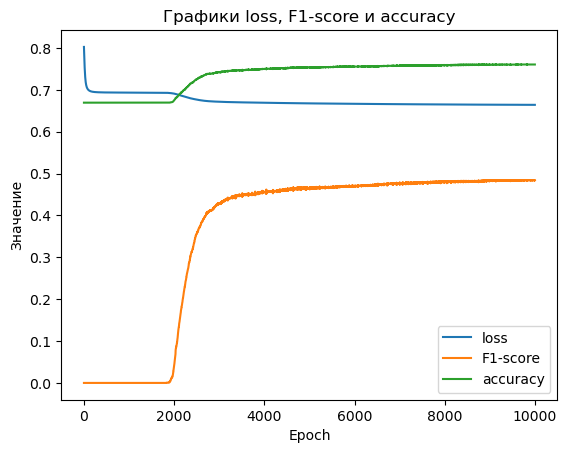

In [130]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf9['Epoch'], diagdf9['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf9['Epoch'], diagdf9['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf9['Epoch'], diagdf9['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [131]:
pred_test10=Mk10.forward(x_test.float())
pred_test_binarized10 = (pred_test10 > 0.5).float()

In [132]:
print(classification_report(y_test.to('cpu'), pred_test_binarized10.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.74      0.94      0.83      3226
         1.0       0.73      0.31      0.44      1537

    accuracy                           0.74      4763
   macro avg       0.74      0.63      0.64      4763
weighted avg       0.74      0.74      0.71      4763

